# Приходят в бар физтех и студент ВШЭ
**Ну и сделали задание по ML короче.**

*Дорогой студент, в этом небольшом пособии студент второго курса МФТИ попытается как-нибудь решить задачу [по предсказанию стоимости недвижимости](https://www.notion.so/480aa51c26eb4a1ba116ac74fb963495). Не судите строго, ведь полноценного курса анализа данных у нас пока не было, так что используя минимальные навыки я попытаюсь набить хоть какой-нибудь score модельки.*

*Это пособие попытается быть научно-развлекательным и введет вас в курс дела ML, если получится.*

**Версия 2** *(когда задание на kaggle выложили), изменения*:
- Максимизируем RMSE, так что поменял функцию оптимизации в нейронной сети
- Стал понятен формат вывода, добавлен блок с формированием answer.txt
- Стало понятно что я не могу сделать нейронку лучше чем линейная модель, поэтому добавил решающие деревья в конце. (Отсутствие опыта сыграло роль)

**Постановка задачи:** дан массив данных о продажах квартир с информацией о квартирах и известными ценами продаж. Цель - построить модель, которая по этим данным предскажет научится предсказывать цену продажи. Т.е. если придет новая квартира, без известной цены, то ей можно будет предсказать примерную цену, по которой её можно продавать. Задача предсказания числа по некоторому вектору(списку) признаков называется **задачей регрессии**.

Скачиваем и импортим всякие библиотечки (могут возникнуть проблемы с их отсутствием на вашем локальном компутере - используйте "python3 -m pip install numpy" в консоли или обращайтесь к специалисту)

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

Кладём наш файл с данными в одну папку с файлом с кодом. Посмотрим на его содержимое:

In [5]:
data = pd.read_csv('realty_train.csv')
data.head()

,Unnamed: 0,title,price,pricePerArea,priceValue,pricePerAreaValue,details,address,location,galleryImagesCount,...,adminDistrictId,districtId,metroId,roomsOrdinal,isStudio,isFreePlan,apartmentSaleType,developmentId,developmentName,roadId
0,60466,"Квартира-студия, 26.8 м², 2/21 эт.",10 376 413 ₽,387 180 ₽ за м²,10376413,387180,26.8 м²,"ш. Очаковское, корп. 3.1","{'longitude': 37.45927, 'latitude': 55.69376}",17,...,10.0,522.0,NaN,NaN,True,False,New,1.057023e+09,ЖК «Vangarden»,NaN
1,52761,"3-комн. квартира, 89.8 м², 8/9 эт.",35 000 000 ₽,389 755 ₽ за м²,35000000,389755,89.8 м²,"пр-т Андропова, стр. Б","{'longitude': 37.65629, 'latitude': 55.68825}",15,...,8.0,529.0,320.0,3.0,False,False,New,1.015418e+09,Жилой остров «Nagatino i-Land»,NaN
2,15103,"1-комн. квартира, 30.1 м², 3/5 эт.",9 600 000 ₽,318 937 ₽ за м²,9600000,318937,30.1 м²,"Москва, Боровский проезд, 20","{'longitude': 37.383444, 'latitude': 55.653401}",7,...,10.0,622.0,NaN,1.0,False,False,Resale,NaN,NaN,NaN
3,519,"3-комн. квартира, 80.2 м², 27/33 эт.",21 543 625 ₽,268 624 ₽ за м²,21543625,268624,80.2 м²,"б-р Кронштадтский, д. 14","{'longitude': 37.49631, 'latitude': 55.84093}",10,...,4.0,577.0,38.0,3.0,False,False,New,1.034179e+09,ЖК «Кронштадтский 14»,NaN
4,83530,"3-комн. квартира, 74.8 м², 13/33 эт.",17 842 790 ₽,238 540 ₽ за м²,17842790,238540,74.8 м²,"Кавказский б-р, корп. 1.1-1.4","{'longitude': 37.64052, 'latitude': 55.62784}",13,...,8.0,592.0,52.0,3.0,False,False,New,1.055124e+09,ЖК «Кавказский бульвар 51»,NaN


Оценим размер данных (55тыщ это enough)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55345 entries, 0 to 55344
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  55345 non-null  int64  
 1   title                       55345 non-null  object 
 2   price                       55345 non-null  object 
 3   pricePerArea                55345 non-null  object 
 4   priceValue                  55345 non-null  int64  
 5   pricePerAreaValue           55345 non-null  int64  
 6   details                     55345 non-null  object 
 7   address                     55345 non-null  object 
 8   location                    55345 non-null  object 
 9   galleryImagesCount          55345 non-null  int64  
 10  hasVideos                   55345 non-null  bool   
 11  isReported                  55345 non-null  bool   
 12  isVerifiedProAgency         55345 non-null  bool   
 13  isShownLowQualityIndicator  553

Далее, как это принято - разделим наши данные на 2 или 3 части. Я выберу подход с 3мя частями - **тренировочная, валидационная и тестовые выборки**.
На тренировочной мы будем обучать наши модели. На валидационной - подгонять какие-то гиперпараметры (у разных моделей - разного рода гиперпараметры: для деревьев - глубина, для регрессий - некоторый коэффициент регуляризации), которые не обучаются сами собой. На тестовой будем проверять результат и сравнивать модели.

In [7]:
from sklearn.model_selection import train_test_split

train_ratio = 0.6 # 60% выборки выделим на обучение, т.к. это самая важная часть
val_ratio = 0.2
test_ratio = 0.2

train, test = train_test_split(data, test_size=test_ratio)
train, val = train_test_split(train, test_size=val_ratio/(train_ratio + val_ratio)) 

train.shape, val.shape, test.shape

((33207, 40), (11069, 40), (11069, 40))

В [задании](https://www.notion.so/480aa51c26eb4a1ba116ac74fb963495) четко попросили ориентироваться на список переменных, описанный там, а не на колонки данного датасета. Поэтому сформируем список категориальных колонок (столбцы, где может быть всего несколько значений) и вещественные исходя из списка оттуда. Отдельно выделим целевой признак.

**P.S. Очень неприятным моментом является признак местоположения**: использовать местоположение (ширина и долгота) не представляется возможным в контексте нашей необъятной родины (в рамках одного региона или маленькой страны это было бы полезно, но в рамках большой страны ширина и долгота вряд ли что-то покажут).

Можно взять признак cityId в качестве категориального (ибо такова его природа), поскольку часто цена квартиры определяется городом (к примеру Москва и Лобня - большая разница), а не регионом(признак regionId) (оба Московская область - опустим что Москва из другого региона).

Можно взять признак - ближайшая станция метро (station). Он достаточно неплохо описывает цену даже в рамках конкретного города, и является категориальным по своей природе. Попробуем его, несмотря на то, что у него много возможных значений (суммарно наберется не меньше 400 станций по России).

Попробуем cityId, и посмотрим что получится.

**P.P.S. попробовав, я заметил что количество колонок осталось около 30 и удивился, что количество городов такое небольшое (категориальный признак с N категориями - раскрывается в N** (на самом деле в N-1 чтобы избежать линейной зависимости) **колонок с 0-1 значениями. Оказалось что город-то всего 1 (с id = 3584). Москва судя по всему.** Вот пруф:

In [8]:
train['cityId'].value_counts()

3584    33207
Name: cityId, dtype: int64

**Значит наша задача лежит в предсказании цены по Москве! Это меняет дело - ведь широта и долгота начинают играть ключевую роль. Как и станция метро, собственно.** Выберем в качетсве критерия широту и долготу и положим их вещественными признаками, чтобы не плодить 200 признаков (измерений) с 0-1 значениями, отвечающими за метро.

In [9]:
categorial_features = ['hasVideos', 'isReported', 'isVerifiedProAgency', 'isShownLowQualityIndicator', 'isPremium', 'rooms', 'itemType', 'propertyType', 'isStudio', 'isFreePlan']
real_features = ['galleryImagesCount', 'floorInt', 'floorAreaCalculated', 'longitude', 'latitude']
target_feature = 'priceValue'

Давайте рассмотрим наши данные и напишем функцию, которая приводит выборку к читаемому формату (всё что возможно - переведем в циферки), отбрасывает мусор, а также отделяет целевой признак от других признаков.

In [10]:
from sklearn.preprocessing import OneHotEncoder
import copy
import json

def drop_outliers(data, real_features):
    return data[(np.abs(scipy.stats.zscore(data[real_features])) < 3).all(axis=1)]

def prepare(data, encoder, first_use=False, drop=False):
    d = copy.deepcopy(data)
    
    # Немножко поприкалываемся, чтобы вытащить из единого столбца location - два столбца с широтой и долготой
    d['location'] = d['location'].apply(eval)
    for name in ['longitude', 'latitude']:
        d[name] = d['location'].apply(lambda x: x.get(name))
    
    if drop:
        d = drop_outliers(d, real_features)
    if first_use:
        train_cat = encoder.fit_transform(d[categorial_features])
    else:
        train_cat = encoder.transform(d[categorial_features])
        
    train = np.hstack([d[real_features], train_cat])
    cat_labels = [[title+", "+str(x) for x in l] for l, title in zip(encoder.categories_, encoder.feature_names_in_)]
    labels = copy.deepcopy(real_features)
    for x in cat_labels:
        labels += x[1:] # list concatenation
    return train, np.array(d[target_feature]), labels

encoder = OneHotEncoder(sparse=False, drop='first', handle_unknown = 'ignore')
input_train, target_train, labels = prepare(train, encoder, first_use=True, drop=True) # return numpy arrays btw
input_val, target_val, labels = prepare(val, encoder)
input_test, target_test, labels = prepare(test, encoder)
assert(len(labels) == input_test.shape[1])
dimensions = input_test.shape[1]
len(labels), input_test.shape[1], labels

/opt/homebrew/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:170: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/homebrew/Cellar/jupyterlab/3.3.2/libexec/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:170: UserWarning: Found unknown categories in columns [5] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


(18,
 18,
 ['galleryImagesCount',
  'floorInt',
  'floorAreaCalculated',
  'longitude',
  'latitude',
  'hasVideos, True',
  'isVerifiedProAgency, True',
  'isPremium, True',
  'rooms, 2',
  'rooms, 3',
  'rooms, 4',
  'rooms, 5',
  'rooms, 7',
  'rooms, 9',
  'rooms, Своб. планировка',
  'rooms, Студия',
  'isStudio, True',
  'isFreePlan, True'])

Получилось 19 итоговых колонок, по которым мы будем предсказывать 20ую - цену.

К этому моменту мы имеем так называемые X и y. X - вектор признаков, y - целевая величина. Наша цель - 'построить' функцию f(X), которая возвращает $\widehat{y}$ - некоторое предсказание величины y. Как понять, что функция хороша? Величина $|y - \widehat{y}|$ должна быть небольшой, например. Способ оценивать хорошесть функции f (а функцию называют моделью) - метрика. Метрики бывают разные (для разных задач тем более), но нам интересны три следующих ([описание вот](http://neerc.ifmo.ru/wiki/index.php?title=%D0%9E%D1%86%D0%B5%D0%BD%D0%BA%D0%B0_%D0%BA%D0%B0%D1%87%D0%B5%D1%81%D1%82%D0%B2%D0%B0_%D0%B2_%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%D0%B0%D1%85_%D0%BA%D0%BB%D0%B0%D1%81%D1%81%D0%B8%D1%84%D0%B8%D0%BA%D0%B0%D1%86%D0%B8%D0%B8_%D0%B8_%D1%80%D0%B5%D0%B3%D1%80%D0%B5%D1%81%D1%81%D0%B8%D0%B8&mobileaction=toggle_view_desktop#.D0.9E.D1.86.D0.B5.D0.BD.D0.BA.D0.B8_.D0.BA.D0.B0.D1.87.D0.B5.D1.81.D1.82.D0.B2.D0.B0_.D1.80.D0.B5.D0.B3.D1.80.D0.B5.D1.81.D1.81.D0.B8.D0.B8)):

$MAE = \frac{1}{n} \sum^n_{i=1} |f(X_i) - y_i|$ - средняя ошибка;

$MAPE = 100 * \frac{1}{n} \sum^n_{i=1} |\frac{f(X_i) - y_i}{y_i}|$ - средний процент ошибки;

$RMSE = \sqrt{\frac{1}{n} \sum^n_{i=1} (f(X_i) - y_i)^2}$ - средняя квадратичная оценка;

Эти метрики мы будем считать на тестовой выборки (как бы тестировать модель). Мы сперва притворимся, что не знаем итоговую цену, предскажем её, а затем сравним с настоящей ценой.

Подготовим функции, которые помогут нам оценивать эффективность модели.

In [11]:
from sklearn import metrics
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs((y_true - y_pred) / y_true)).mean()

def print_measurements(true_, preds_):
    print(f"MAE: {metrics.mean_absolute_error(true_, preds_)}")
    print(f"MAPE: {mean_absolute_percentage_error(true_, preds_)}")
    print(f"Optimized function, RMSE: {metrics.mean_squared_error(true_, preds_) ** 0.5}")

Кажется все приготовления сделаны, данные очищены и подготовлены, метрики выбраны. Дело на самом деле за малым - выбрать модель, функцию f, которая по вектору $X_i$ предскажет нам $\widehat{y_i}$, да так, чтобы разность $|y_i - \widehat{y_i}|$ была чаще всего (или в среднем, вернее сказать) небольшой. Вот так выглядит некоторый $X_0$ (описание колонок есть парой слайдов выше):

In [12]:
input_test[0]

array([10.      ,  1.      , 19.6     , 37.488484, 55.621069,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  1.      ,  1.      ,  0.      ])

1) Самой простой моделью является **линейная регрессия**. Т.е. такая функция, которая линейна по каждому признаку. Примером такой функции можно назвать $f(x_1, x_2, ..., x_{19}) = x_1 + x_2 + ... + x_{19} + 4$. На деле подбираются не единичные коэффициенты, а какой-то оптимальный вектор из 20 коэффициентов. Однако тут надо понимать, что в нашей ситуации (когда ширина и долгота в Москве играют важную роль, и по ним наша цена явно нелинейна (ну т.е. нет некоторого направления вдоль которого растёт цена; цена растет по мере приближения к центру, а потом уменьшается)). А значит линейные модели дадут не слишком крутой результат, имхо.

2) Следующим вариантом модели можно взять **решающие деревья**. Это такая конечная структура, что-то в стиле дерева условных операторов, которая после прохождения нескольких условий (Example: rooms < 5, isPremium = True, rooms >= 3, следовательно предсказать price = 1 миллион). Такая модель достаточно интерпретируема для человека, т.е. он может понять как моделью принималось то или иное значение. Деревья бывают разной глубины (выше в примере дерево глубины 3) и у них случается переобучение иногда (т.е. если построить дерево глубины 1000, типа суперумный мегамозг с кучей ветвлений), то оно будет офигенно решать задачи из обучающей выборки, но когда к нему придет задача из тестовой выборки, то дерево не разберется с ней, потому что идеально подстроилось под обучающее. Поэтому глубина дерева - гиперпараметр, который подбирают отдельно, на валидационной выборке.

3) Есть ещё один вариант - **нейронная сеть**. Это такой же детерминированный алгоритм предсказания $\widehat{y}$, как и линейная регрессия. Тоже какие-то коэффициентики, умножения и сложения, только немного сложнее. С некоторой точки зрения, нейронная сеть - это комбинация многих линейных регрессий, с некоторой приправой (функция активации), которая позволяет изменять линейные зависимости на более сложные и делать конфетку.

Есть ещё много вариантов, но мы остановимся на сравнении линейной регрессии и нейронной сети (чтобы доказать что нейронка справится лучше). Если останется время, то бахнем и решающие деревья. Сравнивать будем с помощью метрик выше на тестовой выборке, если вы помните.

### Глава 1. Линейная регрессия. 

In [13]:
from sklearn.linear_model import LinearRegression

linear_model = LinearRegression(fit_intercept=True)
linear_model.fit(input_train, target_train);

In [14]:
print_measurements(target_test, linear_model.predict(input_test))

MAE: 5239911.594279177
MAPE: 33.73932257774559
Optimized function, RMSE: 8850347.936186487


### Глава 2. Нейронная сеть

Я подумал что грех не показать картиночку двухслойной нейронной сети, которая на вход принимает одно число и на выходе даёт одно.

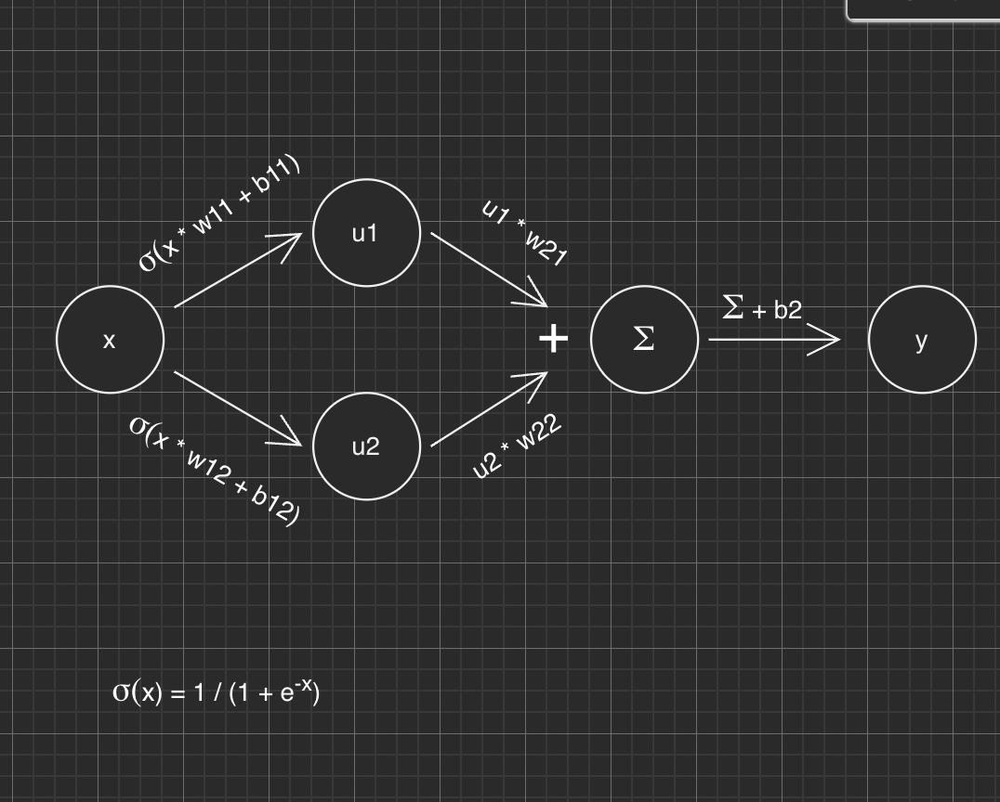

In [15]:
from IPython.display import Image
Image("picture.png")

Вот эта вот сигма (функция внизу) - эта функция активации, которая используется чтобы круто комбинировать линейные зависимости (вы можете видеть, что сигма применятеся к линейным преобразованиям на стрелочках x -> $u_1$ и x -> $u_2$). Если бы не было функции активации, то вся наша нейронная сеть превратилась бы в одну большую линейную модель.
Модель двухслойная, потому что есть слой на котором есть $u_1$ и $u_2$, а затем есть слой с $\sum$. Второй слой устроен попроще, там не используется функция активации и вообще одна вершина. К нейронным сетям ещё добавляют прикольные слои, на которых преобразовывают данные (например все данные приводятся в \[0, 1\] промежуток). 

In [14]:
import sys
!{sys.executable} -m pip install torch

import torch
from torch import nn
import torch.nn.functional as F
from IPython.display import clear_output

You should consider upgrading via the '/opt/homebrew/Cellar/jupyterlab/3.3.2/libexec/bin/python3.9 -m pip install --upgrade pip' command.


Инициализируем модель и подпиливаем всё в стиль torch.

In [15]:
neurons = 10

neural_model = nn.Sequential(  # собираем модули в последовательность
    nn.Linear(in_features=dimensions, out_features=1)
)

x = torch.tensor(input_train, dtype=torch.float32)
y = torch.tensor(target_train, dtype=torch.float32)

x_new = x
y_new = y.reshape(-1, 1)

Инициализируем параметры модели (которые будут обучаться)

In [16]:
def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform(m.weight)
        m.bias.data.fill_(0.01)

neural_model.apply(init_weights);

/var/folders/f_/sjlzzg253rvb0z3z8rgd7nlw0000gn/T/ipykernel_13821/1499052080.py:3: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Тренируем модель

In [17]:
import time

def RMSELoss(yhat,y):
    return torch.sqrt(torch.mean((yhat-y)**2))

def show_progress(x, y, y_pred, loss):
    y_pred = y_pred.detach()
    loss = loss.item()
    clear_output(wait=True)
    print(f"RMSE = {loss:.3f}")

optimizer = torch.optim.SGD(neural_model.parameters(), lr=1000)
optim_func = RMSELoss #  nn.L1Loss()

num_iter = 30000

for i in range(num_iter):

    y_pred =  neural_model(x_new)

    loss = optim_func(y_pred, y_new)

    loss.backward()

    optimizer.step()

    optimizer.zero_grad()

    if (i + 1) % 5 == 0:
        show_progress(x_new, y_new, y_pred, loss)
        print(i)
    
    if (i % 750 == 1):
        time.sleep(0.5)

RMSE = 8000547.000
29999


In [18]:
x = torch.tensor(input_test, dtype=torch.float32)
y = torch.tensor(target_test, dtype=torch.float32)

x_new = x
y_new = y.reshape(-1, 1)

print_measurements(target_test, neural_model(x_new)[:,0].cpu().detach().numpy())

MAE: 5426328.858056213
MAPE: 32.03191852075877
Optimized function, RMSE: 8940578.681812143


**Вывод:** ну вот мы и закончили. ВСеМ ВнИМаНиЕ! Спасибо за внимание.

А если серьезно, то вот что получилось - у линейной модели RMSE ~= 8.8млн. Нейронная сеть работает чуть лучше (8.7 млн), но очевидно можно сильно лучше. Стоит подшаманить слои при инициализации модели.

## Заключение

In [16]:
def get_input(data, encoder, first_use=False, drop=False):
    d = copy.deepcopy(data)
    
    # Немножко поприкалываемся, чтобы вытащить из единого столбца location - два столбца с широтой и долготой
    d['location'] = d['location'].apply(eval)
    for name in ['longitude', 'latitude']:
        d[name] = d['location'].apply(lambda x: x.get(name))
    
    if drop:
        d = drop_outliers(d, real_features)
    if first_use:
        train_cat = encoder.fit_transform(d[categorial_features])
    else:
        train_cat = encoder.transform(d[categorial_features])
        
    train = np.hstack([d[real_features], train_cat])
    return train

А теперь просто выбираем наилучшую модель (ну допустим линейную регрессию, но вообще должна быть какая-то лучше). 

In [17]:
import csv
def use_model(model, file_name):
    data = pd.read_csv('test.csv')
    ids = np.array(data["id"])
    prices = model.predict(get_input(data, encoder))
    assert(len(ids) == len(prices))
    with open(file_name, 'w', newline='') as csvfile:
        spamwriter = csv.writer(csvfile, delimiter=',',
                            quotechar='|', quoting=csv.QUOTE_MINIMAL)
        spamwriter.writerow(['id', 'priceValue'])
        for i in range(len(ids)):
            spamwriter.writerow([str(ids[i]), str(int(prices[i]))])

In [21]:
use_model(linear_model, "linear_model_output.csv")

В файле answer.txt появится нужная для отправки в контест информация.

## Глава 3. Решающие деревья

Честно говоря меня немного гложет зависть единственному отправившему задание человеку, ведь его результат в несколько раз лучше моего. [Вот leaderboard](https://www.kaggle.com/competitions/dsintro/leaderboard). Так что я решил попробовать решающие деревья.

In [22]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor(n_estimators=100)
forest.fit(input_train, target_train)

RandomForestRegressor()

Смотрим как работает (ого в два раза лучше наших предыдущих моделей)

In [23]:
print_measurements(target_test, forest.predict(input_test))

MAE: 2106095.96944167
MAPE: 10.025184693117543
Optimized function, RMSE: 4772631.419400351


Сохраняем результат для kaggle

In [24]:
use_model(forest, "random_forest_output.csv")

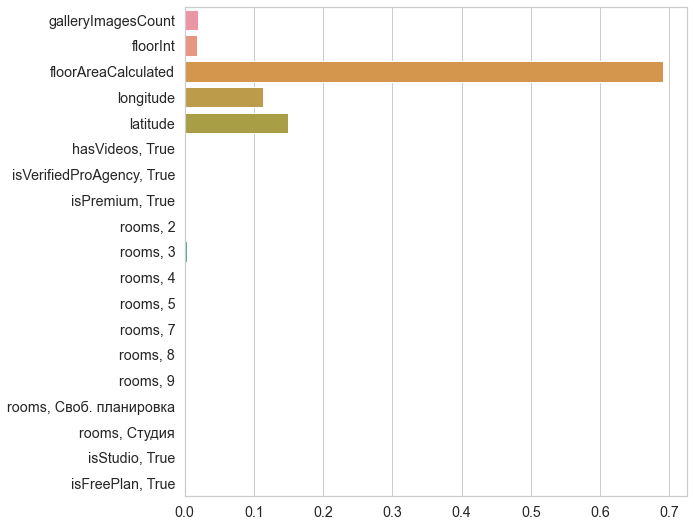

In [25]:
plt.figure(figsize=(9, 9))
with sns.axes_style('whitegrid'):
    sns.barplot(y=labels, x=forest.feature_importances_, orient='h')

Спасибо за внимание(2)

### Продолжаем набивать score деревьев

Относительно недавно я перестал подробно пояснять то, что я делаю, и это связано с отсутствием времени и желаением набить score побольше. Сейчас я адаптирую наши предыдущие функции под лес и эксперементирую с признаками.

In [18]:
from sklearn.preprocessing import OrdinalEncoder
categorial_features = ['hasVideos', 'isReported', 'isVerifiedProAgency', 'isShownLowQualityIndicator', 'isPremium', 'rooms', 'itemType', 'propertyType', 'isStudio', 'isFreePlan']
real_features = ['galleryImagesCount', 'floorInt', 'floorAreaCalculated', 'longitude', 'latitude']
target_feature = 'priceValue'

def prepare_no_encoder(data, encoder, first_use=False):
    d = copy.deepcopy(data)
    
    # Немножко поприкалываемся, чтобы вытащить из единого столбца location - два столбца с широтой и долготой
    d['location'] = d['location'].apply(eval)
    for name in ['longitude', 'latitude']:
        d[name] = d['location'].apply(lambda x: x.get(name))
    
    d = d[real_features + categorial_features + [target_feature]]
    d.dropna(inplace=True)
    
    if first_use:
        train_cat = encoder.fit_transform(d[categorial_features])
    else:
        train_cat = encoder.transform(d[categorial_features]) 
    
    train = np.hstack([d[real_features], train_cat])
    
    labels = real_features + categorial_features

    return train, np.array(d[target_feature]), labels

encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan)
input_train, target_train, labels = prepare_no_encoder(train, encoder, first_use=True) # May be drop?
input_val, target_val, labels = prepare_no_encoder(val, encoder)
input_test, target_test, labels = prepare_no_encoder(test, encoder)

len(labels), input_test.shape[1], labels

(15,
 15,
 ['galleryImagesCount',
  'floorInt',
  'floorAreaCalculated',
  'longitude',
  'latitude',
  'hasVideos',
  'isReported',
  'isVerifiedProAgency',
  'isShownLowQualityIndicator',
  'isPremium',
  'rooms',
  'itemType',
  'propertyType',
  'isStudio',
  'isFreePlan'])

In [71]:
forest = RandomForestRegressor(n_estimators=100)
forest.fit(input_train, target_train)

print_measurements(target_test, forest.predict(input_test))

MAE: 1950455.3216624362
MAPE: 9.708761825534879
Optimized function, RMSE: 4316908.868710701


In [64]:
use_model(forest, "better_forest_output.csv")

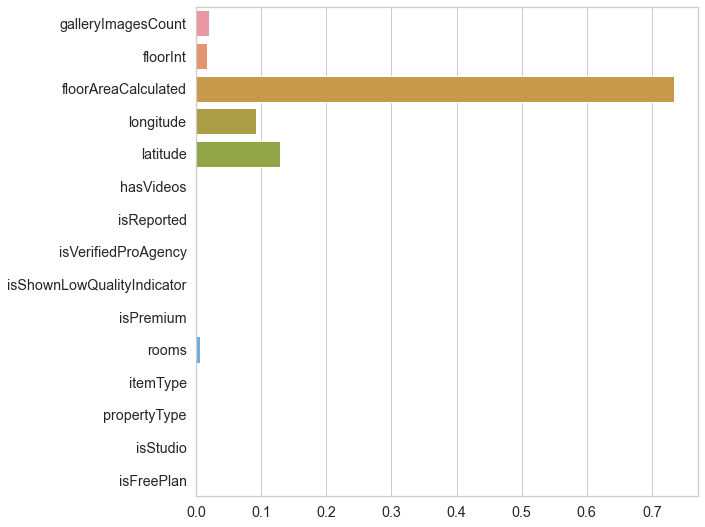

In [72]:
plt.figure(figsize=(9, 9))
with sns.axes_style('whitegrid'):
    sns.barplot(y=labels, x=forest.feature_importances_, orient='h')

Получили более приятный score, процентов на 10 так.

upd. drop=True ухудшает этот результат, как и добавление метро и дистрикта

Попробуем на валидационной выборке подобрать гиперпараметры леса

### Переходим на catboost

In [2]:
import sys
!{sys.executable} -m pip install catboost

     |████████████████████████████████| 22.0 MB 5.6 MB/s            
     |████████████████████████████████| 15.2 MB 2.9 MB/s            
  Using cached tenacity-8.0.1-py3-none-any.whl (24 kB)
You should consider upgrading via the '/opt/homebrew/Cellar/jupyterlab/3.3.2/libexec/bin/python3.9 -m pip install --upgrade pip' command.


In [25]:
from catboost import CatBoostRegressor

forests = []
for i in range(1, 20):
    print(f"Learning forest with depth={i}")
    forests += [CatBoostRegressor(iterations=10000, depth=i)]
    forests[-1].fit(input_train, target_train)

Learning forest with depth=1
Learning rate set to 0.010953
0:	learn: 15608353.0512654	total: 1.43ms	remaining: 14.3s
1:	learn: 15529377.1005538	total: 2.25ms	remaining: 11.2s
2:	learn: 15451730.1204417	total: 2.97ms	remaining: 9.9s
3:	learn: 15375550.0842334	total: 3.69ms	remaining: 9.22s
4:	learn: 15300939.3328131	total: 4.51ms	remaining: 9.01s
5:	learn: 15226943.9226019	total: 5.39ms	remaining: 8.97s
6:	learn: 15154744.6820073	total: 6.24ms	remaining: 8.91s
7:	learn: 15083173.6991148	total: 6.97ms	remaining: 8.7s
8:	learn: 15014427.3663283	total: 7.75ms	remaining: 8.61s
9:	learn: 14944867.9268802	total: 8.53ms	remaining: 8.52s
10:	learn: 14875824.7298092	total: 9.32ms	remaining: 8.46s
11:	learn: 14809202.4971102	total: 10.2ms	remaining: 8.48s
12:	learn: 14741971.8150608	total: 11.1ms	remaining: 8.56s
13:	learn: 14675977.7925558	total: 12.3ms	remaining: 8.81s
14:	learn: 14610837.4920721	total: 13.3ms	remaining: 8.86s
15:	learn: 14547189.5013188	total: 14.3ms	remaining: 8.92s
16:	learn

188:	learn: 9607523.7681982	total: 181ms	remaining: 9.4s
189:	learn: 9596104.7064286	total: 182ms	remaining: 9.41s
190:	learn: 9585391.1932767	total: 183ms	remaining: 9.41s
191:	learn: 9574927.8425422	total: 185ms	remaining: 9.43s
192:	learn: 9564120.2495215	total: 185ms	remaining: 9.42s
193:	learn: 9553504.5762807	total: 187ms	remaining: 9.43s
194:	learn: 9543083.0626856	total: 188ms	remaining: 9.44s
195:	learn: 9532740.3844066	total: 189ms	remaining: 9.45s
196:	learn: 9522474.4270391	total: 190ms	remaining: 9.45s
197:	learn: 9512348.4808217	total: 191ms	remaining: 9.45s
198:	learn: 9502399.9784627	total: 192ms	remaining: 9.45s
199:	learn: 9491853.5232415	total: 193ms	remaining: 9.47s
200:	learn: 9482143.1411538	total: 195ms	remaining: 9.49s
201:	learn: 9472144.7507017	total: 196ms	remaining: 9.5s
202:	learn: 9462321.8727715	total: 197ms	remaining: 9.49s
203:	learn: 9453076.5668376	total: 198ms	remaining: 9.5s
204:	learn: 9443486.4456545	total: 199ms	remaining: 9.5s
205:	learn: 943401

379:	learn: 8469110.0306756	total: 372ms	remaining: 9.42s
380:	learn: 8465474.0081555	total: 373ms	remaining: 9.43s
381:	learn: 8462000.4143731	total: 374ms	remaining: 9.43s
382:	learn: 8458748.1357620	total: 376ms	remaining: 9.43s
383:	learn: 8455504.7797710	total: 377ms	remaining: 9.43s
384:	learn: 8451984.6318366	total: 378ms	remaining: 9.43s
385:	learn: 8448539.4433429	total: 378ms	remaining: 9.43s
386:	learn: 8445221.4293801	total: 379ms	remaining: 9.43s
387:	learn: 8441673.8982980	total: 381ms	remaining: 9.43s
388:	learn: 8438206.7435070	total: 382ms	remaining: 9.43s
389:	learn: 8434937.9220578	total: 383ms	remaining: 9.43s
390:	learn: 8431501.8465184	total: 384ms	remaining: 9.43s
391:	learn: 8428069.8697862	total: 385ms	remaining: 9.43s
392:	learn: 8424577.5086253	total: 386ms	remaining: 9.43s
393:	learn: 8421335.8166578	total: 387ms	remaining: 9.43s
394:	learn: 8418062.2891775	total: 388ms	remaining: 9.43s
395:	learn: 8414905.1792220	total: 389ms	remaining: 9.43s
396:	learn: 84

574:	learn: 7953110.6333575	total: 562ms	remaining: 9.21s
575:	learn: 7951011.9569426	total: 563ms	remaining: 9.22s
576:	learn: 7949094.3899304	total: 564ms	remaining: 9.21s
577:	learn: 7947130.9484226	total: 565ms	remaining: 9.21s
578:	learn: 7945012.3445347	total: 566ms	remaining: 9.21s
579:	learn: 7943072.7174520	total: 567ms	remaining: 9.21s
580:	learn: 7941023.8716529	total: 568ms	remaining: 9.21s
581:	learn: 7939115.9534077	total: 569ms	remaining: 9.21s
582:	learn: 7937112.2691198	total: 570ms	remaining: 9.21s
583:	learn: 7935099.4003716	total: 571ms	remaining: 9.21s
584:	learn: 7933198.8226437	total: 572ms	remaining: 9.21s
585:	learn: 7931264.8884654	total: 573ms	remaining: 9.21s
586:	learn: 7929333.7318566	total: 574ms	remaining: 9.21s
587:	learn: 7927333.3521268	total: 575ms	remaining: 9.21s
588:	learn: 7925529.8008230	total: 576ms	remaining: 9.2s
589:	learn: 7923560.9466815	total: 577ms	remaining: 9.2s
590:	learn: 7921594.1792482	total: 578ms	remaining: 9.2s
591:	learn: 79196

769:	learn: 7641736.1668691	total: 753ms	remaining: 9.02s
770:	learn: 7640463.3555722	total: 754ms	remaining: 9.02s
771:	learn: 7639093.4822012	total: 755ms	remaining: 9.02s
772:	learn: 7637770.2058487	total: 755ms	remaining: 9.02s
773:	learn: 7636502.2729819	total: 756ms	remaining: 9.02s
774:	learn: 7635245.6970927	total: 757ms	remaining: 9.02s
775:	learn: 7634059.8420691	total: 759ms	remaining: 9.02s
776:	learn: 7632900.9265696	total: 760ms	remaining: 9.02s
777:	learn: 7631694.6458285	total: 761ms	remaining: 9.01s
778:	learn: 7630442.5786824	total: 761ms	remaining: 9.01s
779:	learn: 7629160.7099460	total: 762ms	remaining: 9.01s
780:	learn: 7627947.7097536	total: 763ms	remaining: 9.01s
781:	learn: 7626729.5648728	total: 764ms	remaining: 9.01s
782:	learn: 7625393.2369682	total: 765ms	remaining: 9.01s
783:	learn: 7624170.7206568	total: 766ms	remaining: 9s
784:	learn: 7622818.7412371	total: 767ms	remaining: 9s
785:	learn: 7621600.1081787	total: 768ms	remaining: 9s
786:	learn: 7620215.005

966:	learn: 7426055.7750529	total: 943ms	remaining: 8.81s
967:	learn: 7425155.2701025	total: 944ms	remaining: 8.81s
968:	learn: 7424183.9043467	total: 945ms	remaining: 8.81s
969:	learn: 7423279.3437844	total: 946ms	remaining: 8.81s
970:	learn: 7422390.4774323	total: 947ms	remaining: 8.81s
971:	learn: 7421424.2075740	total: 949ms	remaining: 8.81s
972:	learn: 7420468.1107023	total: 950ms	remaining: 8.81s
973:	learn: 7419571.7761573	total: 951ms	remaining: 8.81s
974:	learn: 7418622.7301026	total: 952ms	remaining: 8.81s
975:	learn: 7417732.6330269	total: 953ms	remaining: 8.81s
976:	learn: 7416815.0913646	total: 954ms	remaining: 8.81s
977:	learn: 7415860.3606738	total: 955ms	remaining: 8.81s
978:	learn: 7414977.9508073	total: 956ms	remaining: 8.81s
979:	learn: 7414055.0426668	total: 957ms	remaining: 8.81s
980:	learn: 7413184.0550837	total: 958ms	remaining: 8.81s
981:	learn: 7412276.6954181	total: 959ms	remaining: 8.81s
982:	learn: 7411363.5585030	total: 960ms	remaining: 8.81s
983:	learn: 74

1158:	learn: 7273850.3347423	total: 1.13s	remaining: 8.65s
1159:	learn: 7273174.6477710	total: 1.14s	remaining: 8.65s
1160:	learn: 7272503.6411838	total: 1.14s	remaining: 8.65s
1161:	learn: 7271832.7870996	total: 1.14s	remaining: 8.65s
1162:	learn: 7271154.0456659	total: 1.14s	remaining: 8.65s
1163:	learn: 7270460.6234816	total: 1.14s	remaining: 8.65s
1164:	learn: 7269782.6979799	total: 1.14s	remaining: 8.65s
1165:	learn: 7269111.1066592	total: 1.14s	remaining: 8.65s
1166:	learn: 7268430.7762746	total: 1.14s	remaining: 8.65s
1167:	learn: 7267780.0928580	total: 1.14s	remaining: 8.65s
1168:	learn: 7267128.2701209	total: 1.14s	remaining: 8.64s
1169:	learn: 7266457.5096018	total: 1.15s	remaining: 8.64s
1170:	learn: 7265784.0857735	total: 1.15s	remaining: 8.64s
1171:	learn: 7265141.2551402	total: 1.15s	remaining: 8.64s
1172:	learn: 7264471.0674472	total: 1.15s	remaining: 8.64s
1173:	learn: 7263804.3810657	total: 1.15s	remaining: 8.64s
1174:	learn: 7263157.3952023	total: 1.15s	remaining: 8.6

1355:	learn: 7159027.7297384	total: 1.32s	remaining: 8.45s
1356:	learn: 7158531.0747561	total: 1.32s	remaining: 8.44s
1357:	learn: 7158030.5888840	total: 1.33s	remaining: 8.44s
1358:	learn: 7157553.9019394	total: 1.33s	remaining: 8.44s
1359:	learn: 7157051.3690361	total: 1.33s	remaining: 8.44s
1360:	learn: 7156548.4803125	total: 1.33s	remaining: 8.44s
1361:	learn: 7156046.9488531	total: 1.33s	remaining: 8.44s
1362:	learn: 7155550.5982025	total: 1.33s	remaining: 8.44s
1363:	learn: 7155064.9675745	total: 1.33s	remaining: 8.44s
1364:	learn: 7154575.9446089	total: 1.33s	remaining: 8.44s
1365:	learn: 7154077.0625981	total: 1.33s	remaining: 8.44s
1366:	learn: 7153579.2352421	total: 1.33s	remaining: 8.44s
1367:	learn: 7153095.6554455	total: 1.34s	remaining: 8.44s
1368:	learn: 7152600.3271861	total: 1.34s	remaining: 8.44s
1369:	learn: 7152107.7685209	total: 1.34s	remaining: 8.43s
1370:	learn: 7151621.4125908	total: 1.34s	remaining: 8.43s
1371:	learn: 7151134.5360531	total: 1.34s	remaining: 8.4

1543:	learn: 7076838.0973857	total: 1.51s	remaining: 8.29s
1544:	learn: 7076453.8020426	total: 1.51s	remaining: 8.29s
1545:	learn: 7076073.0356341	total: 1.52s	remaining: 8.29s
1546:	learn: 7075689.2844591	total: 1.52s	remaining: 8.29s
1547:	learn: 7075301.6862572	total: 1.52s	remaining: 8.29s
1548:	learn: 7074932.0388887	total: 1.52s	remaining: 8.29s
1549:	learn: 7074556.0877848	total: 1.52s	remaining: 8.29s
1550:	learn: 7074171.4530220	total: 1.52s	remaining: 8.29s
1551:	learn: 7073790.8192875	total: 1.52s	remaining: 8.29s
1552:	learn: 7073409.0925013	total: 1.52s	remaining: 8.29s
1553:	learn: 7073024.2224231	total: 1.52s	remaining: 8.28s
1554:	learn: 7072645.3319128	total: 1.52s	remaining: 8.28s
1555:	learn: 7072262.3311270	total: 1.53s	remaining: 8.28s
1556:	learn: 7071895.2241618	total: 1.53s	remaining: 8.28s
1557:	learn: 7071520.8088635	total: 1.53s	remaining: 8.29s
1558:	learn: 7071156.6177947	total: 1.53s	remaining: 8.29s
1559:	learn: 7070775.6214265	total: 1.53s	remaining: 8.3

1729:	learn: 7013892.2940587	total: 1.7s	remaining: 8.15s
1730:	learn: 7013590.7791545	total: 1.71s	remaining: 8.14s
1731:	learn: 7013283.2727970	total: 1.71s	remaining: 8.14s
1732:	learn: 7012980.1903738	total: 1.71s	remaining: 8.14s
1733:	learn: 7012672.6513695	total: 1.71s	remaining: 8.14s
1734:	learn: 7012369.6057543	total: 1.71s	remaining: 8.14s
1735:	learn: 7012064.8702913	total: 1.71s	remaining: 8.14s
1736:	learn: 7011764.2178980	total: 1.71s	remaining: 8.14s
1737:	learn: 7011462.7455480	total: 1.71s	remaining: 8.14s
1738:	learn: 7011160.4574752	total: 1.71s	remaining: 8.13s
1739:	learn: 7010867.2917095	total: 1.71s	remaining: 8.13s
1740:	learn: 7010564.0768149	total: 1.71s	remaining: 8.13s
1741:	learn: 7010269.9331007	total: 1.72s	remaining: 8.13s
1742:	learn: 7009982.7183374	total: 1.72s	remaining: 8.13s
1743:	learn: 7009682.0577522	total: 1.72s	remaining: 8.13s
1744:	learn: 7009389.5925719	total: 1.72s	remaining: 8.13s
1745:	learn: 7009101.0342145	total: 1.72s	remaining: 8.13

1928:	learn: 6960722.5157066	total: 1.89s	remaining: 7.93s
1929:	learn: 6960485.7458761	total: 1.9s	remaining: 7.93s
1930:	learn: 6960242.1916437	total: 1.9s	remaining: 7.92s
1931:	learn: 6960003.1914212	total: 1.9s	remaining: 7.92s
1932:	learn: 6959764.3084663	total: 1.9s	remaining: 7.92s
1933:	learn: 6959530.9122678	total: 1.9s	remaining: 7.92s
1934:	learn: 6959301.3948129	total: 1.9s	remaining: 7.92s
1935:	learn: 6959061.7702264	total: 1.9s	remaining: 7.93s
1936:	learn: 6958824.2408527	total: 1.9s	remaining: 7.93s
1937:	learn: 6958596.2002189	total: 1.91s	remaining: 7.93s
1938:	learn: 6958358.6932973	total: 1.91s	remaining: 7.93s
1939:	learn: 6958123.2117274	total: 1.91s	remaining: 7.93s
1940:	learn: 6957886.9290076	total: 1.91s	remaining: 7.93s
1941:	learn: 6957657.0773502	total: 1.91s	remaining: 7.92s
1942:	learn: 6957424.7690186	total: 1.91s	remaining: 7.92s
1943:	learn: 6957193.9892985	total: 1.91s	remaining: 7.92s
1944:	learn: 6956960.8462018	total: 1.91s	remaining: 7.92s
1945:

2104:	learn: 6923106.7354047	total: 2.06s	remaining: 7.75s
2105:	learn: 6922911.8041598	total: 2.07s	remaining: 7.75s
2106:	learn: 6922717.0141253	total: 2.07s	remaining: 7.75s
2107:	learn: 6922529.3834842	total: 2.07s	remaining: 7.75s
2108:	learn: 6922336.7363355	total: 2.07s	remaining: 7.75s
2109:	learn: 6922136.8451434	total: 2.07s	remaining: 7.75s
2110:	learn: 6921941.1993659	total: 2.07s	remaining: 7.74s
2111:	learn: 6921749.8091645	total: 2.07s	remaining: 7.74s
2112:	learn: 6921553.1213433	total: 2.07s	remaining: 7.74s
2113:	learn: 6921360.5207360	total: 2.08s	remaining: 7.74s
2114:	learn: 6921171.2495217	total: 2.08s	remaining: 7.74s
2115:	learn: 6920974.9385542	total: 2.08s	remaining: 7.74s
2116:	learn: 6920782.4277740	total: 2.08s	remaining: 7.74s
2117:	learn: 6920587.4797112	total: 2.08s	remaining: 7.74s
2118:	learn: 6920403.3282495	total: 2.08s	remaining: 7.74s
2119:	learn: 6920208.2484577	total: 2.08s	remaining: 7.74s
2120:	learn: 6920045.3036801	total: 2.08s	remaining: 7.7

2296:	learn: 6889592.7133206	total: 2.25s	remaining: 7.56s
2297:	learn: 6889429.0238000	total: 2.26s	remaining: 7.56s
2298:	learn: 6889271.9287438	total: 2.26s	remaining: 7.56s
2299:	learn: 6889110.4190138	total: 2.26s	remaining: 7.56s
2300:	learn: 6888951.6539884	total: 2.26s	remaining: 7.56s
2301:	learn: 6888799.3079374	total: 2.26s	remaining: 7.56s
2302:	learn: 6888636.1270490	total: 2.26s	remaining: 7.56s
2303:	learn: 6888476.3272902	total: 2.26s	remaining: 7.55s
2304:	learn: 6888314.4712262	total: 2.26s	remaining: 7.55s
2305:	learn: 6888159.5355344	total: 2.26s	remaining: 7.55s
2306:	learn: 6888005.7305969	total: 2.27s	remaining: 7.55s
2307:	learn: 6887844.8503102	total: 2.27s	remaining: 7.55s
2308:	learn: 6887686.2026466	total: 2.27s	remaining: 7.55s
2309:	learn: 6887522.9546540	total: 2.27s	remaining: 7.55s
2310:	learn: 6887363.2587978	total: 2.27s	remaining: 7.55s
2311:	learn: 6887202.5929109	total: 2.27s	remaining: 7.55s
2312:	learn: 6887051.2394219	total: 2.27s	remaining: 7.5

2493:	learn: 6860809.7411968	total: 2.44s	remaining: 7.36s
2494:	learn: 6860672.2710788	total: 2.44s	remaining: 7.36s
2495:	learn: 6860537.6551998	total: 2.45s	remaining: 7.36s
2496:	learn: 6860406.6698326	total: 2.45s	remaining: 7.35s
2497:	learn: 6860271.3446641	total: 2.45s	remaining: 7.35s
2498:	learn: 6860135.1707167	total: 2.45s	remaining: 7.35s
2499:	learn: 6859999.6298707	total: 2.45s	remaining: 7.35s
2500:	learn: 6859865.7480877	total: 2.45s	remaining: 7.35s
2501:	learn: 6859746.1296836	total: 2.45s	remaining: 7.35s
2502:	learn: 6859613.4679013	total: 2.45s	remaining: 7.35s
2503:	learn: 6859480.8608203	total: 2.45s	remaining: 7.35s
2504:	learn: 6859344.8339256	total: 2.46s	remaining: 7.35s
2505:	learn: 6859214.2595598	total: 2.46s	remaining: 7.35s
2506:	learn: 6859078.0302989	total: 2.46s	remaining: 7.34s
2507:	learn: 6858949.8042660	total: 2.46s	remaining: 7.34s
2508:	learn: 6858816.3574479	total: 2.46s	remaining: 7.34s
2509:	learn: 6858680.8337276	total: 2.46s	remaining: 7.3

2685:	learn: 6837146.2531384	total: 2.63s	remaining: 7.17s
2686:	learn: 6837034.2319207	total: 2.63s	remaining: 7.17s
2687:	learn: 6836915.9073669	total: 2.63s	remaining: 7.17s
2688:	learn: 6836800.1581204	total: 2.64s	remaining: 7.17s
2689:	learn: 6836687.7992705	total: 2.64s	remaining: 7.17s
2690:	learn: 6836574.2870825	total: 2.64s	remaining: 7.17s
2691:	learn: 6836458.8503289	total: 2.64s	remaining: 7.17s
2692:	learn: 6836346.2930605	total: 2.64s	remaining: 7.16s
2693:	learn: 6836234.8975977	total: 2.64s	remaining: 7.16s
2694:	learn: 6836123.9075219	total: 2.64s	remaining: 7.16s
2695:	learn: 6836014.5864803	total: 2.64s	remaining: 7.16s
2696:	learn: 6835922.0270936	total: 2.64s	remaining: 7.16s
2697:	learn: 6835816.0800616	total: 2.64s	remaining: 7.16s
2698:	learn: 6835699.2025174	total: 2.65s	remaining: 7.16s
2699:	learn: 6835583.8223964	total: 2.65s	remaining: 7.16s
2700:	learn: 6835469.3884401	total: 2.65s	remaining: 7.16s
2701:	learn: 6835357.0950422	total: 2.65s	remaining: 7.1

2877:	learn: 6817231.3110728	total: 2.82s	remaining: 6.98s
2878:	learn: 6817139.7379948	total: 2.82s	remaining: 6.98s
2879:	learn: 6817043.4031518	total: 2.82s	remaining: 6.98s
2880:	learn: 6816946.6294376	total: 2.83s	remaining: 6.98s
2881:	learn: 6816848.7610600	total: 2.83s	remaining: 6.98s
2882:	learn: 6816752.7094431	total: 2.83s	remaining: 6.98s
2883:	learn: 6816655.3360143	total: 2.83s	remaining: 6.98s
2884:	learn: 6816558.1206159	total: 2.83s	remaining: 6.98s
2885:	learn: 6816464.5018550	total: 2.83s	remaining: 6.98s
2886:	learn: 6816370.1781535	total: 2.83s	remaining: 6.97s
2887:	learn: 6816275.4460625	total: 2.83s	remaining: 6.97s
2888:	learn: 6816179.7420894	total: 2.83s	remaining: 6.97s
2889:	learn: 6816082.9219586	total: 2.83s	remaining: 6.97s
2890:	learn: 6815992.0073493	total: 2.83s	remaining: 6.97s
2891:	learn: 6815902.7191274	total: 2.83s	remaining: 6.97s
2892:	learn: 6815813.9672139	total: 2.84s	remaining: 6.97s
2893:	learn: 6815717.9120638	total: 2.84s	remaining: 6.9

3072:	learn: 6800106.9894144	total: 3.01s	remaining: 6.79s
3073:	learn: 6800022.8219109	total: 3.01s	remaining: 6.79s
3074:	learn: 6799944.0847193	total: 3.01s	remaining: 6.79s
3075:	learn: 6799864.0661790	total: 3.01s	remaining: 6.79s
3076:	learn: 6799780.7699749	total: 3.02s	remaining: 6.79s
3077:	learn: 6799703.6008272	total: 3.02s	remaining: 6.78s
3078:	learn: 6799622.1369412	total: 3.02s	remaining: 6.78s
3079:	learn: 6799538.4481550	total: 3.02s	remaining: 6.78s
3080:	learn: 6799457.2868048	total: 3.02s	remaining: 6.78s
3081:	learn: 6799377.8923349	total: 3.02s	remaining: 6.78s
3082:	learn: 6799300.3398700	total: 3.02s	remaining: 6.78s
3083:	learn: 6799215.5489106	total: 3.02s	remaining: 6.78s
3084:	learn: 6799138.3857421	total: 3.02s	remaining: 6.78s
3085:	learn: 6799057.4150502	total: 3.02s	remaining: 6.78s
3086:	learn: 6798978.6498808	total: 3.03s	remaining: 6.78s
3087:	learn: 6798895.8377422	total: 3.03s	remaining: 6.78s
3088:	learn: 6798814.6334964	total: 3.03s	remaining: 6.7

3268:	learn: 6785464.5992984	total: 3.2s	remaining: 6.59s
3269:	learn: 6785394.8442452	total: 3.2s	remaining: 6.59s
3270:	learn: 6785324.8041512	total: 3.2s	remaining: 6.59s
3271:	learn: 6785254.3214591	total: 3.21s	remaining: 6.59s
3272:	learn: 6785184.8084482	total: 3.21s	remaining: 6.59s
3273:	learn: 6785115.7827298	total: 3.21s	remaining: 6.59s
3274:	learn: 6785046.0423334	total: 3.21s	remaining: 6.59s
3275:	learn: 6784975.3624179	total: 3.21s	remaining: 6.59s
3276:	learn: 6784908.6453515	total: 3.21s	remaining: 6.59s
3277:	learn: 6784843.2959245	total: 3.21s	remaining: 6.58s
3278:	learn: 6784776.7807099	total: 3.21s	remaining: 6.58s
3279:	learn: 6784712.5080641	total: 3.21s	remaining: 6.58s
3280:	learn: 6784644.0786092	total: 3.21s	remaining: 6.58s
3281:	learn: 6784574.3776853	total: 3.21s	remaining: 6.58s
3282:	learn: 6784504.5375272	total: 3.21s	remaining: 6.58s
3283:	learn: 6784434.1496011	total: 3.22s	remaining: 6.58s
3284:	learn: 6784364.5811141	total: 3.22s	remaining: 6.58s


3464:	learn: 6772982.9164503	total: 3.39s	remaining: 6.4s
3465:	learn: 6772923.8060559	total: 3.39s	remaining: 6.4s
3466:	learn: 6772862.8822972	total: 3.4s	remaining: 6.4s
3467:	learn: 6772805.3125771	total: 3.4s	remaining: 6.4s
3468:	learn: 6772746.9231997	total: 3.4s	remaining: 6.39s
3469:	learn: 6772686.5059469	total: 3.4s	remaining: 6.39s
3470:	learn: 6772627.4041725	total: 3.4s	remaining: 6.39s
3471:	learn: 6772569.1641909	total: 3.4s	remaining: 6.39s
3472:	learn: 6772518.0843860	total: 3.4s	remaining: 6.39s
3473:	learn: 6772459.9551648	total: 3.4s	remaining: 6.39s
3474:	learn: 6772401.0293508	total: 3.4s	remaining: 6.39s
3475:	learn: 6772341.0660694	total: 3.4s	remaining: 6.39s
3476:	learn: 6772285.7564000	total: 3.4s	remaining: 6.39s
3477:	learn: 6772226.9505321	total: 3.41s	remaining: 6.39s
3478:	learn: 6772168.9845253	total: 3.41s	remaining: 6.39s
3479:	learn: 6772114.7214638	total: 3.41s	remaining: 6.39s
3480:	learn: 6772058.0109221	total: 3.41s	remaining: 6.38s
3481:	learn:

3661:	learn: 6762340.1036166	total: 3.58s	remaining: 6.2s
3662:	learn: 6762292.9267631	total: 3.58s	remaining: 6.2s
3663:	learn: 6762243.0373035	total: 3.58s	remaining: 6.2s
3664:	learn: 6762193.6309449	total: 3.58s	remaining: 6.2s
3665:	learn: 6762142.9585185	total: 3.59s	remaining: 6.2s
3666:	learn: 6762092.9295969	total: 3.59s	remaining: 6.2s
3667:	learn: 6762040.4244975	total: 3.59s	remaining: 6.19s
3668:	learn: 6761989.0626738	total: 3.59s	remaining: 6.19s
3669:	learn: 6761939.6961088	total: 3.59s	remaining: 6.19s
3670:	learn: 6761889.1278593	total: 3.59s	remaining: 6.19s
3671:	learn: 6761840.8238311	total: 3.59s	remaining: 6.19s
3672:	learn: 6761790.3616258	total: 3.59s	remaining: 6.19s
3673:	learn: 6761748.2170690	total: 3.59s	remaining: 6.19s
3674:	learn: 6761698.8668355	total: 3.59s	remaining: 6.18s
3675:	learn: 6761649.3168015	total: 3.59s	remaining: 6.18s
3676:	learn: 6761599.4225962	total: 3.6s	remaining: 6.18s
3677:	learn: 6761553.6730697	total: 3.6s	remaining: 6.18s
3678:

3859:	learn: 6753249.6606461	total: 3.77s	remaining: 6s
3860:	learn: 6753207.3189150	total: 3.77s	remaining: 6s
3861:	learn: 6753164.6647240	total: 3.77s	remaining: 6s
3862:	learn: 6753120.5013387	total: 3.77s	remaining: 6s
3863:	learn: 6753077.8069029	total: 3.78s	remaining: 6s
3864:	learn: 6753034.0270333	total: 3.78s	remaining: 6s
3865:	learn: 6752990.0489902	total: 3.78s	remaining: 6s
3866:	learn: 6752947.0285787	total: 3.78s	remaining: 5.99s
3867:	learn: 6752915.8878867	total: 3.78s	remaining: 5.99s
3868:	learn: 6752875.2286404	total: 3.78s	remaining: 5.99s
3869:	learn: 6752830.8488320	total: 3.78s	remaining: 5.99s
3870:	learn: 6752787.5453153	total: 3.78s	remaining: 5.99s
3871:	learn: 6752745.6366553	total: 3.79s	remaining: 5.99s
3872:	learn: 6752702.2519291	total: 3.79s	remaining: 5.99s
3873:	learn: 6752659.3103800	total: 3.79s	remaining: 5.99s
3874:	learn: 6752615.6232765	total: 3.79s	remaining: 5.99s
3875:	learn: 6752574.7204935	total: 3.79s	remaining: 5.99s
3876:	learn: 67525

4056:	learn: 6745286.2375722	total: 3.96s	remaining: 5.81s
4057:	learn: 6745247.2688684	total: 3.96s	remaining: 5.8s
4058:	learn: 6745207.4250450	total: 3.96s	remaining: 5.8s
4059:	learn: 6745168.4488747	total: 3.97s	remaining: 5.8s
4060:	learn: 6745129.5663359	total: 3.97s	remaining: 5.8s
4061:	learn: 6745091.5305009	total: 3.97s	remaining: 5.8s
4062:	learn: 6745051.0817605	total: 3.97s	remaining: 5.8s
4063:	learn: 6745013.2364870	total: 3.97s	remaining: 5.8s
4064:	learn: 6744973.9186944	total: 3.97s	remaining: 5.8s
4065:	learn: 6744938.3239118	total: 3.97s	remaining: 5.79s
4066:	learn: 6744899.5888921	total: 3.97s	remaining: 5.79s
4067:	learn: 6744860.0883710	total: 3.97s	remaining: 5.79s
4068:	learn: 6744822.5485319	total: 3.97s	remaining: 5.79s
4069:	learn: 6744785.8967220	total: 3.98s	remaining: 5.79s
4070:	learn: 6744750.2770870	total: 3.98s	remaining: 5.79s
4071:	learn: 6744711.9944320	total: 3.98s	remaining: 5.79s
4072:	learn: 6744672.3897888	total: 3.98s	remaining: 5.79s
4073:

4255:	learn: 6737917.5469588	total: 4.15s	remaining: 5.61s
4256:	learn: 6737880.9227415	total: 4.16s	remaining: 5.61s
4257:	learn: 6737844.7834416	total: 4.16s	remaining: 5.61s
4258:	learn: 6737811.0859829	total: 4.16s	remaining: 5.6s
4259:	learn: 6737774.4968697	total: 4.16s	remaining: 5.6s
4260:	learn: 6737739.4755873	total: 4.16s	remaining: 5.6s
4261:	learn: 6737704.9430282	total: 4.16s	remaining: 5.6s
4262:	learn: 6737668.4063449	total: 4.16s	remaining: 5.6s
4263:	learn: 6737632.0788019	total: 4.16s	remaining: 5.6s
4264:	learn: 6737596.4114680	total: 4.16s	remaining: 5.6s
4265:	learn: 6737560.6868735	total: 4.16s	remaining: 5.6s
4266:	learn: 6737524.4197126	total: 4.17s	remaining: 5.6s
4267:	learn: 6737487.6476986	total: 4.17s	remaining: 5.59s
4268:	learn: 6737452.3787194	total: 4.17s	remaining: 5.59s
4269:	learn: 6737417.2808487	total: 4.17s	remaining: 5.59s
4270:	learn: 6737381.0409036	total: 4.17s	remaining: 5.59s
4271:	learn: 6737345.4232825	total: 4.17s	remaining: 5.59s
4272:	

4449:	learn: 6731241.9811192	total: 4.34s	remaining: 5.42s
4450:	learn: 6731209.6916487	total: 4.34s	remaining: 5.42s
4451:	learn: 6731176.2745961	total: 4.35s	remaining: 5.42s
4452:	learn: 6731145.7933580	total: 4.35s	remaining: 5.42s
4453:	learn: 6731112.5472513	total: 4.35s	remaining: 5.41s
4454:	learn: 6731078.3269267	total: 4.35s	remaining: 5.41s
4455:	learn: 6731046.7281759	total: 4.35s	remaining: 5.41s
4456:	learn: 6731012.8792552	total: 4.35s	remaining: 5.41s
4457:	learn: 6730979.8168008	total: 4.35s	remaining: 5.41s
4458:	learn: 6730945.8080975	total: 4.35s	remaining: 5.41s
4459:	learn: 6730914.3528085	total: 4.35s	remaining: 5.41s
4460:	learn: 6730881.6301426	total: 4.36s	remaining: 5.41s
4461:	learn: 6730848.3119828	total: 4.36s	remaining: 5.41s
4462:	learn: 6730813.8186539	total: 4.36s	remaining: 5.41s
4463:	learn: 6730779.4032905	total: 4.36s	remaining: 5.4s
4464:	learn: 6730749.0483087	total: 4.36s	remaining: 5.4s
4465:	learn: 6730716.0165780	total: 4.36s	remaining: 5.4s


4641:	learn: 6725109.0957104	total: 4.53s	remaining: 5.23s
4642:	learn: 6725078.7925909	total: 4.53s	remaining: 5.23s
4643:	learn: 6725047.3786527	total: 4.53s	remaining: 5.23s
4644:	learn: 6725016.6487324	total: 4.54s	remaining: 5.23s
4645:	learn: 6724985.1222052	total: 4.54s	remaining: 5.23s
4646:	learn: 6724953.3972070	total: 4.54s	remaining: 5.23s
4647:	learn: 6724921.8888742	total: 4.54s	remaining: 5.22s
4648:	learn: 6724892.5054671	total: 4.54s	remaining: 5.22s
4649:	learn: 6724860.9934236	total: 4.54s	remaining: 5.22s
4650:	learn: 6724829.5098968	total: 4.54s	remaining: 5.22s
4651:	learn: 6724798.2199682	total: 4.54s	remaining: 5.22s
4652:	learn: 6724770.0727050	total: 4.54s	remaining: 5.22s
4653:	learn: 6724739.4661931	total: 4.54s	remaining: 5.22s
4654:	learn: 6724707.2557679	total: 4.54s	remaining: 5.22s
4655:	learn: 6724676.2655013	total: 4.55s	remaining: 5.22s
4656:	learn: 6724646.7720974	total: 4.55s	remaining: 5.22s
4657:	learn: 6724619.2163662	total: 4.55s	remaining: 5.2

4833:	learn: 6719388.2486085	total: 4.72s	remaining: 5.05s
4834:	learn: 6719359.0537967	total: 4.72s	remaining: 5.04s
4835:	learn: 6719330.4733471	total: 4.72s	remaining: 5.04s
4836:	learn: 6719301.0507487	total: 4.72s	remaining: 5.04s
4837:	learn: 6719272.5071650	total: 4.73s	remaining: 5.04s
4838:	learn: 6719244.5851279	total: 4.73s	remaining: 5.04s
4839:	learn: 6719215.8518135	total: 4.73s	remaining: 5.04s
4840:	learn: 6719185.9126379	total: 4.73s	remaining: 5.04s
4841:	learn: 6719159.5857105	total: 4.73s	remaining: 5.04s
4842:	learn: 6719132.8168474	total: 4.73s	remaining: 5.04s
4843:	learn: 6719103.9554568	total: 4.73s	remaining: 5.04s
4844:	learn: 6719075.7597673	total: 4.73s	remaining: 5.04s
4845:	learn: 6719046.9847125	total: 4.73s	remaining: 5.03s
4846:	learn: 6719017.8779515	total: 4.73s	remaining: 5.03s
4847:	learn: 6718988.5805628	total: 4.74s	remaining: 5.03s
4848:	learn: 6718961.1096201	total: 4.74s	remaining: 5.03s
4849:	learn: 6718932.5719221	total: 4.74s	remaining: 5.0

5027:	learn: 6714021.8067751	total: 4.91s	remaining: 4.86s
5028:	learn: 6713998.4775689	total: 4.91s	remaining: 4.86s
5029:	learn: 6713970.2158660	total: 4.91s	remaining: 4.86s
5030:	learn: 6713942.5696396	total: 4.91s	remaining: 4.85s
5031:	learn: 6713917.0507336	total: 4.92s	remaining: 4.85s
5032:	learn: 6713889.2804237	total: 4.92s	remaining: 4.85s
5033:	learn: 6713862.2023868	total: 4.92s	remaining: 4.85s
5034:	learn: 6713834.6085672	total: 4.92s	remaining: 4.85s
5035:	learn: 6713807.6704897	total: 4.92s	remaining: 4.85s
5036:	learn: 6713781.2490626	total: 4.92s	remaining: 4.85s
5037:	learn: 6713754.4785743	total: 4.92s	remaining: 4.85s
5038:	learn: 6713728.6278486	total: 4.92s	remaining: 4.85s
5039:	learn: 6713701.8523395	total: 4.92s	remaining: 4.84s
5040:	learn: 6713674.8752422	total: 4.92s	remaining: 4.84s
5041:	learn: 6713647.1499229	total: 4.93s	remaining: 4.84s
5042:	learn: 6713620.9536241	total: 4.93s	remaining: 4.84s
5043:	learn: 6713593.8782764	total: 4.93s	remaining: 4.8

5220:	learn: 6709028.6191060	total: 5.1s	remaining: 4.67s
5221:	learn: 6709003.2462159	total: 5.1s	remaining: 4.67s
5222:	learn: 6708977.7562267	total: 5.1s	remaining: 4.67s
5223:	learn: 6708953.3069382	total: 5.11s	remaining: 4.67s
5224:	learn: 6708927.9919483	total: 5.11s	remaining: 4.67s
5225:	learn: 6708903.4083377	total: 5.11s	remaining: 4.67s
5226:	learn: 6708877.8096361	total: 5.11s	remaining: 4.66s
5227:	learn: 6708853.0402985	total: 5.11s	remaining: 4.66s
5228:	learn: 6708827.1553221	total: 5.11s	remaining: 4.66s
5229:	learn: 6708802.4358813	total: 5.11s	remaining: 4.66s
5230:	learn: 6708776.6257019	total: 5.11s	remaining: 4.66s
5231:	learn: 6708752.7859217	total: 5.11s	remaining: 4.66s
5232:	learn: 6708726.8395960	total: 5.11s	remaining: 4.66s
5233:	learn: 6708701.8381302	total: 5.12s	remaining: 4.66s
5234:	learn: 6708677.0672233	total: 5.12s	remaining: 4.66s
5235:	learn: 6708651.3650439	total: 5.12s	remaining: 4.66s
5236:	learn: 6708628.3397273	total: 5.12s	remaining: 4.66s


5410:	learn: 6704429.3319038	total: 5.29s	remaining: 4.49s
5411:	learn: 6704405.1242174	total: 5.29s	remaining: 4.49s
5412:	learn: 6704381.0168708	total: 5.29s	remaining: 4.49s
5413:	learn: 6704357.7613562	total: 5.29s	remaining: 4.49s
5414:	learn: 6704334.0662458	total: 5.3s	remaining: 4.48s
5415:	learn: 6704311.0781526	total: 5.3s	remaining: 4.48s
5416:	learn: 6704287.1460446	total: 5.3s	remaining: 4.48s
5417:	learn: 6704263.1764003	total: 5.3s	remaining: 4.48s
5418:	learn: 6704240.4096327	total: 5.3s	remaining: 4.48s
5419:	learn: 6704216.5330234	total: 5.3s	remaining: 4.48s
5420:	learn: 6704193.9367610	total: 5.3s	remaining: 4.48s
5421:	learn: 6704170.0101917	total: 5.3s	remaining: 4.48s
5422:	learn: 6704146.3782489	total: 5.3s	remaining: 4.48s
5423:	learn: 6704122.6404621	total: 5.3s	remaining: 4.47s
5424:	learn: 6704099.7364563	total: 5.31s	remaining: 4.47s
5425:	learn: 6704077.4989176	total: 5.31s	remaining: 4.47s
5426:	learn: 6704053.9001289	total: 5.31s	remaining: 4.47s
5427:	l

5608:	learn: 6699956.2966585	total: 5.48s	remaining: 4.29s
5609:	learn: 6699935.1399854	total: 5.48s	remaining: 4.29s
5610:	learn: 6699912.7301401	total: 5.48s	remaining: 4.29s
5611:	learn: 6699890.6047411	total: 5.48s	remaining: 4.29s
5612:	learn: 6699868.1514239	total: 5.49s	remaining: 4.29s
5613:	learn: 6699847.3991062	total: 5.49s	remaining: 4.29s
5614:	learn: 6699825.0829951	total: 5.49s	remaining: 4.29s
5615:	learn: 6699804.1171303	total: 5.49s	remaining: 4.28s
5616:	learn: 6699782.1200210	total: 5.49s	remaining: 4.28s
5617:	learn: 6699759.8869660	total: 5.49s	remaining: 4.28s
5618:	learn: 6699737.1471148	total: 5.49s	remaining: 4.28s
5619:	learn: 6699714.9025099	total: 5.49s	remaining: 4.28s
5620:	learn: 6699692.2779043	total: 5.49s	remaining: 4.28s
5621:	learn: 6699671.1555737	total: 5.49s	remaining: 4.28s
5622:	learn: 6699649.6863793	total: 5.5s	remaining: 4.28s
5623:	learn: 6699627.4244755	total: 5.5s	remaining: 4.28s
5624:	learn: 6699605.9359384	total: 5.5s	remaining: 4.28s


5800:	learn: 6695893.6553958	total: 5.67s	remaining: 4.1s
5801:	learn: 6695872.8721584	total: 5.67s	remaining: 4.1s
5802:	learn: 6695851.5029215	total: 5.67s	remaining: 4.1s
5803:	learn: 6695832.2691483	total: 5.67s	remaining: 4.1s
5804:	learn: 6695811.0661701	total: 5.67s	remaining: 4.1s
5805:	learn: 6695790.3249037	total: 5.67s	remaining: 4.1s
5806:	learn: 6695770.5051770	total: 5.68s	remaining: 4.1s
5807:	learn: 6695749.8095990	total: 5.68s	remaining: 4.1s
5808:	learn: 6695729.3795727	total: 5.68s	remaining: 4.1s
5809:	learn: 6695709.1789509	total: 5.68s	remaining: 4.09s
5810:	learn: 6695688.3498851	total: 5.68s	remaining: 4.09s
5811:	learn: 6695667.6856433	total: 5.68s	remaining: 4.09s
5812:	learn: 6695646.0862134	total: 5.68s	remaining: 4.09s
5813:	learn: 6695624.9571965	total: 5.68s	remaining: 4.09s
5814:	learn: 6695604.2023960	total: 5.68s	remaining: 4.09s
5815:	learn: 6695584.5080108	total: 5.69s	remaining: 4.09s
5816:	learn: 6695563.4236458	total: 5.69s	remaining: 4.09s
5817:	

5991:	learn: 6692080.7031239	total: 5.86s	remaining: 3.92s
5992:	learn: 6692061.2719377	total: 5.86s	remaining: 3.92s
5993:	learn: 6692042.7973883	total: 5.86s	remaining: 3.92s
5994:	learn: 6692022.5729810	total: 5.86s	remaining: 3.92s
5995:	learn: 6692002.6069607	total: 5.86s	remaining: 3.92s
5996:	learn: 6691983.8598229	total: 5.86s	remaining: 3.91s
5997:	learn: 6691964.1028014	total: 5.87s	remaining: 3.91s
5998:	learn: 6691944.4075755	total: 5.87s	remaining: 3.91s
5999:	learn: 6691925.0631016	total: 5.87s	remaining: 3.91s
6000:	learn: 6691905.5590847	total: 5.87s	remaining: 3.91s
6001:	learn: 6691886.2856513	total: 5.87s	remaining: 3.91s
6002:	learn: 6691865.9310389	total: 5.87s	remaining: 3.91s
6003:	learn: 6691846.0196670	total: 5.87s	remaining: 3.91s
6004:	learn: 6691826.7858144	total: 5.87s	remaining: 3.91s
6005:	learn: 6691806.8848244	total: 5.87s	remaining: 3.9s
6006:	learn: 6691787.6036348	total: 5.87s	remaining: 3.9s
6007:	learn: 6691768.4138162	total: 5.88s	remaining: 3.9s


6187:	learn: 6688384.2764047	total: 6.05s	remaining: 3.73s
6188:	learn: 6688366.2951690	total: 6.05s	remaining: 3.73s
6189:	learn: 6688347.1253745	total: 6.05s	remaining: 3.73s
6190:	learn: 6688328.3729679	total: 6.05s	remaining: 3.72s
6191:	learn: 6688310.1422921	total: 6.05s	remaining: 3.72s
6192:	learn: 6688291.0928225	total: 6.06s	remaining: 3.72s
6193:	learn: 6688272.1183082	total: 6.06s	remaining: 3.72s
6194:	learn: 6688252.9888219	total: 6.06s	remaining: 3.72s
6195:	learn: 6688236.2239055	total: 6.06s	remaining: 3.72s
6196:	learn: 6688217.6287034	total: 6.06s	remaining: 3.72s
6197:	learn: 6688199.3310186	total: 6.06s	remaining: 3.72s
6198:	learn: 6688180.6245500	total: 6.06s	remaining: 3.72s
6199:	learn: 6688161.4179910	total: 6.06s	remaining: 3.72s
6200:	learn: 6688142.4927104	total: 6.06s	remaining: 3.71s
6201:	learn: 6688123.6617472	total: 6.07s	remaining: 3.71s
6202:	learn: 6688107.0493642	total: 6.07s	remaining: 3.71s
6203:	learn: 6688089.3977037	total: 6.07s	remaining: 3.7

6379:	learn: 6684918.5653956	total: 6.24s	remaining: 3.54s
6380:	learn: 6684901.2814731	total: 6.24s	remaining: 3.54s
6381:	learn: 6684885.0270434	total: 6.24s	remaining: 3.54s
6382:	learn: 6684867.3327879	total: 6.24s	remaining: 3.54s
6383:	learn: 6684850.0451443	total: 6.24s	remaining: 3.54s
6384:	learn: 6684832.5886134	total: 6.24s	remaining: 3.54s
6385:	learn: 6684814.0018529	total: 6.25s	remaining: 3.53s
6386:	learn: 6684796.9933934	total: 6.25s	remaining: 3.53s
6387:	learn: 6684779.6424642	total: 6.25s	remaining: 3.53s
6388:	learn: 6684761.9968382	total: 6.25s	remaining: 3.53s
6389:	learn: 6684744.7114137	total: 6.25s	remaining: 3.53s
6390:	learn: 6684726.6851687	total: 6.25s	remaining: 3.53s
6391:	learn: 6684709.4769397	total: 6.25s	remaining: 3.53s
6392:	learn: 6684693.2584335	total: 6.25s	remaining: 3.53s
6393:	learn: 6684674.9596528	total: 6.25s	remaining: 3.53s
6394:	learn: 6684657.0800736	total: 6.25s	remaining: 3.52s
6395:	learn: 6684639.4844351	total: 6.25s	remaining: 3.5

6571:	learn: 6681599.6627920	total: 6.43s	remaining: 3.35s
6572:	learn: 6681583.5136291	total: 6.43s	remaining: 3.35s
6573:	learn: 6681566.1930472	total: 6.43s	remaining: 3.35s
6574:	learn: 6681549.2020227	total: 6.43s	remaining: 3.35s
6575:	learn: 6681531.4551982	total: 6.43s	remaining: 3.35s
6576:	learn: 6681514.0948906	total: 6.43s	remaining: 3.35s
6577:	learn: 6681497.1280381	total: 6.43s	remaining: 3.35s
6578:	learn: 6681481.2641514	total: 6.44s	remaining: 3.35s
6579:	learn: 6681465.4732584	total: 6.44s	remaining: 3.35s
6580:	learn: 6681448.2227799	total: 6.44s	remaining: 3.34s
6581:	learn: 6681432.2638510	total: 6.44s	remaining: 3.34s
6582:	learn: 6681416.3828275	total: 6.44s	remaining: 3.34s
6583:	learn: 6681399.1637774	total: 6.44s	remaining: 3.34s
6584:	learn: 6681381.6006086	total: 6.44s	remaining: 3.34s
6585:	learn: 6681365.1226656	total: 6.44s	remaining: 3.34s
6586:	learn: 6681347.9564116	total: 6.44s	remaining: 3.34s
6587:	learn: 6681331.0322571	total: 6.44s	remaining: 3.3

6770:	learn: 6678291.2777695	total: 6.62s	remaining: 3.16s
6771:	learn: 6678274.1017071	total: 6.62s	remaining: 3.16s
6772:	learn: 6678259.2370785	total: 6.62s	remaining: 3.15s
6773:	learn: 6678242.2122379	total: 6.62s	remaining: 3.15s
6774:	learn: 6678226.7559327	total: 6.62s	remaining: 3.15s
6775:	learn: 6678210.6167465	total: 6.63s	remaining: 3.15s
6776:	learn: 6678194.8286810	total: 6.63s	remaining: 3.15s
6777:	learn: 6678177.8756456	total: 6.63s	remaining: 3.15s
6778:	learn: 6678161.1469656	total: 6.63s	remaining: 3.15s
6779:	learn: 6678144.4150466	total: 6.63s	remaining: 3.15s
6780:	learn: 6678128.5651924	total: 6.63s	remaining: 3.15s
6781:	learn: 6678111.5967245	total: 6.63s	remaining: 3.15s
6782:	learn: 6678095.2668485	total: 6.63s	remaining: 3.15s
6783:	learn: 6678079.4891578	total: 6.63s	remaining: 3.14s
6784:	learn: 6678062.5173982	total: 6.63s	remaining: 3.14s
6785:	learn: 6678047.0038257	total: 6.63s	remaining: 3.14s
6786:	learn: 6678030.7519141	total: 6.64s	remaining: 3.1

6962:	learn: 6675191.0972022	total: 6.81s	remaining: 2.97s
6963:	learn: 6675175.2468718	total: 6.81s	remaining: 2.97s
6964:	learn: 6675159.5381786	total: 6.81s	remaining: 2.97s
6965:	learn: 6675143.1124986	total: 6.81s	remaining: 2.97s
6966:	learn: 6675127.4362014	total: 6.82s	remaining: 2.97s
6967:	learn: 6675110.4762251	total: 6.82s	remaining: 2.96s
6968:	learn: 6675094.8673189	total: 6.82s	remaining: 2.96s
6969:	learn: 6675078.3060458	total: 6.82s	remaining: 2.96s
6970:	learn: 6675061.8329900	total: 6.82s	remaining: 2.96s
6971:	learn: 6675045.5954213	total: 6.82s	remaining: 2.96s
6972:	learn: 6675030.9832641	total: 6.82s	remaining: 2.96s
6973:	learn: 6675014.9355957	total: 6.82s	remaining: 2.96s
6974:	learn: 6674999.1131725	total: 6.82s	remaining: 2.96s
6975:	learn: 6674983.2484204	total: 6.82s	remaining: 2.96s
6976:	learn: 6674967.5853172	total: 6.82s	remaining: 2.96s
6977:	learn: 6674950.9530874	total: 6.83s	remaining: 2.96s
6978:	learn: 6674934.2150276	total: 6.83s	remaining: 2.9

7158:	learn: 6672112.1989208	total: 7s	remaining: 2.78s
7159:	learn: 6672096.3996884	total: 7s	remaining: 2.78s
7160:	learn: 6672080.9859508	total: 7s	remaining: 2.78s
7161:	learn: 6672064.8621915	total: 7s	remaining: 2.77s
7162:	learn: 6672049.9574627	total: 7.01s	remaining: 2.77s
7163:	learn: 6672034.1819467	total: 7.01s	remaining: 2.77s
7164:	learn: 6672020.0039899	total: 7.01s	remaining: 2.77s
7165:	learn: 6672004.4088413	total: 7.01s	remaining: 2.77s
7166:	learn: 6671988.8432928	total: 7.01s	remaining: 2.77s
7167:	learn: 6671973.8306001	total: 7.01s	remaining: 2.77s
7168:	learn: 6671958.5697844	total: 7.01s	remaining: 2.77s
7169:	learn: 6671943.8645246	total: 7.01s	remaining: 2.77s
7170:	learn: 6671928.9310921	total: 7.01s	remaining: 2.77s
7171:	learn: 6671913.6312269	total: 7.01s	remaining: 2.77s
7172:	learn: 6671897.9644990	total: 7.01s	remaining: 2.77s
7173:	learn: 6671882.4762113	total: 7.02s	remaining: 2.76s
7174:	learn: 6671867.2430298	total: 7.02s	remaining: 2.76s
7175:	lea

7356:	learn: 6669109.8645229	total: 7.19s	remaining: 2.58s
7357:	learn: 6669095.6902344	total: 7.19s	remaining: 2.58s
7358:	learn: 6669081.8718229	total: 7.19s	remaining: 2.58s
7359:	learn: 6669066.0700513	total: 7.2s	remaining: 2.58s
7360:	learn: 6669051.0552037	total: 7.2s	remaining: 2.58s
7361:	learn: 6669035.7349330	total: 7.2s	remaining: 2.58s
7362:	learn: 6669020.7483110	total: 7.2s	remaining: 2.58s
7363:	learn: 6669005.4311235	total: 7.2s	remaining: 2.58s
7364:	learn: 6668990.1214558	total: 7.2s	remaining: 2.58s
7365:	learn: 6668975.0525954	total: 7.2s	remaining: 2.58s
7366:	learn: 6668960.1106598	total: 7.2s	remaining: 2.57s
7367:	learn: 6668944.9763672	total: 7.2s	remaining: 2.57s
7368:	learn: 6668930.5068208	total: 7.21s	remaining: 2.57s
7369:	learn: 6668915.4703589	total: 7.21s	remaining: 2.57s
7370:	learn: 6668900.6488857	total: 7.21s	remaining: 2.57s
7371:	learn: 6668887.6559758	total: 7.21s	remaining: 2.57s
7372:	learn: 6668872.9930070	total: 7.21s	remaining: 2.57s
7373:	

7545:	learn: 6666329.0561356	total: 7.38s	remaining: 2.4s
7546:	learn: 6666314.7839639	total: 7.38s	remaining: 2.4s
7547:	learn: 6666300.4849546	total: 7.38s	remaining: 2.4s
7548:	learn: 6666285.6774788	total: 7.38s	remaining: 2.4s
7549:	learn: 6666270.5279192	total: 7.38s	remaining: 2.4s
7550:	learn: 6666256.5141690	total: 7.39s	remaining: 2.4s
7551:	learn: 6666241.9122547	total: 7.39s	remaining: 2.39s
7552:	learn: 6666227.8258015	total: 7.39s	remaining: 2.39s
7553:	learn: 6666212.7115403	total: 7.39s	remaining: 2.39s
7554:	learn: 6666197.9264158	total: 7.39s	remaining: 2.39s
7555:	learn: 6666183.2026128	total: 7.39s	remaining: 2.39s
7556:	learn: 6666168.8771509	total: 7.39s	remaining: 2.39s
7557:	learn: 6666154.6141434	total: 7.39s	remaining: 2.39s
7558:	learn: 6666139.7056327	total: 7.39s	remaining: 2.39s
7559:	learn: 6666125.1218280	total: 7.39s	remaining: 2.39s
7560:	learn: 6666110.5511352	total: 7.4s	remaining: 2.38s
7561:	learn: 6666096.1169130	total: 7.4s	remaining: 2.38s
7562:

7729:	learn: 6663697.7988626	total: 7.57s	remaining: 2.22s
7730:	learn: 6663683.1743709	total: 7.57s	remaining: 2.22s
7731:	learn: 6663668.4874052	total: 7.57s	remaining: 2.22s
7732:	learn: 6663653.7609735	total: 7.57s	remaining: 2.22s
7733:	learn: 6663639.3552354	total: 7.57s	remaining: 2.22s
7734:	learn: 6663624.8164796	total: 7.57s	remaining: 2.22s
7735:	learn: 6663610.1060908	total: 7.58s	remaining: 2.22s
7736:	learn: 6663596.3762751	total: 7.58s	remaining: 2.22s
7737:	learn: 6663582.0081648	total: 7.58s	remaining: 2.21s
7738:	learn: 6663567.2583742	total: 7.58s	remaining: 2.21s
7739:	learn: 6663552.7268395	total: 7.58s	remaining: 2.21s
7740:	learn: 6663539.6895903	total: 7.58s	remaining: 2.21s
7741:	learn: 6663525.2402830	total: 7.58s	remaining: 2.21s
7742:	learn: 6663511.7892457	total: 7.58s	remaining: 2.21s
7743:	learn: 6663497.3174935	total: 7.58s	remaining: 2.21s
7744:	learn: 6663484.1124837	total: 7.58s	remaining: 2.21s
7745:	learn: 6663470.9746501	total: 7.58s	remaining: 2.2

7915:	learn: 6661090.9496370	total: 7.76s	remaining: 2.04s
7916:	learn: 6661077.4915117	total: 7.76s	remaining: 2.04s
7917:	learn: 6661063.8243425	total: 7.76s	remaining: 2.04s
7918:	learn: 6661052.0725121	total: 7.76s	remaining: 2.04s
7919:	learn: 6661038.9219153	total: 7.76s	remaining: 2.04s
7920:	learn: 6661024.8738571	total: 7.76s	remaining: 2.04s
7921:	learn: 6661010.8061642	total: 7.76s	remaining: 2.04s
7922:	learn: 6660996.8010394	total: 7.76s	remaining: 2.04s
7923:	learn: 6660983.4331285	total: 7.77s	remaining: 2.03s
7924:	learn: 6660969.5495970	total: 7.77s	remaining: 2.03s
7925:	learn: 6660955.4356017	total: 7.77s	remaining: 2.03s
7926:	learn: 6660941.6426760	total: 7.77s	remaining: 2.03s
7927:	learn: 6660928.1170084	total: 7.77s	remaining: 2.03s
7928:	learn: 6660915.0589158	total: 7.77s	remaining: 2.03s
7929:	learn: 6660901.4637626	total: 7.77s	remaining: 2.03s
7930:	learn: 6660887.3444261	total: 7.77s	remaining: 2.03s
7931:	learn: 6660872.4510338	total: 7.77s	remaining: 2.0

8105:	learn: 6658514.1413361	total: 7.95s	remaining: 1.86s
8106:	learn: 6658500.3176008	total: 7.95s	remaining: 1.86s
8107:	learn: 6658487.5233505	total: 7.95s	remaining: 1.85s
8108:	learn: 6658474.3412129	total: 7.95s	remaining: 1.85s
8109:	learn: 6658461.2062291	total: 7.95s	remaining: 1.85s
8110:	learn: 6658447.1779841	total: 7.95s	remaining: 1.85s
8111:	learn: 6658433.0345348	total: 7.95s	remaining: 1.85s
8112:	learn: 6658419.3338460	total: 7.95s	remaining: 1.85s
8113:	learn: 6658405.6101606	total: 7.96s	remaining: 1.85s
8114:	learn: 6658392.1520153	total: 7.96s	remaining: 1.85s
8115:	learn: 6658378.7226630	total: 7.96s	remaining: 1.85s
8116:	learn: 6658366.0437216	total: 7.96s	remaining: 1.85s
8117:	learn: 6658353.3197278	total: 7.96s	remaining: 1.84s
8118:	learn: 6658339.8543776	total: 7.96s	remaining: 1.84s
8119:	learn: 6658326.2746788	total: 7.96s	remaining: 1.84s
8120:	learn: 6658312.5151257	total: 7.96s	remaining: 1.84s
8121:	learn: 6658299.0135961	total: 7.96s	remaining: 1.8

8297:	learn: 6655962.0038276	total: 8.14s	remaining: 1.67s
8298:	learn: 6655948.5249701	total: 8.14s	remaining: 1.67s
8299:	learn: 6655935.1514826	total: 8.14s	remaining: 1.67s
8300:	learn: 6655921.8539829	total: 8.14s	remaining: 1.67s
8301:	learn: 6655909.3402101	total: 8.14s	remaining: 1.66s
8302:	learn: 6655895.6607381	total: 8.14s	remaining: 1.66s
8303:	learn: 6655882.1521447	total: 8.14s	remaining: 1.66s
8304:	learn: 6655868.7419374	total: 8.14s	remaining: 1.66s
8305:	learn: 6655856.2175833	total: 8.14s	remaining: 1.66s
8306:	learn: 6655843.5624261	total: 8.14s	remaining: 1.66s
8307:	learn: 6655830.2043806	total: 8.14s	remaining: 1.66s
8308:	learn: 6655817.5001197	total: 8.15s	remaining: 1.66s
8309:	learn: 6655804.4263955	total: 8.15s	remaining: 1.66s
8310:	learn: 6655791.1816649	total: 8.15s	remaining: 1.66s
8311:	learn: 6655777.7741694	total: 8.15s	remaining: 1.66s
8312:	learn: 6655764.5347207	total: 8.15s	remaining: 1.65s
8313:	learn: 6655752.2809896	total: 8.15s	remaining: 1.6

8486:	learn: 6653514.4286103	total: 8.32s	remaining: 1.48s
8487:	learn: 6653501.6387664	total: 8.32s	remaining: 1.48s
8488:	learn: 6653489.4499734	total: 8.33s	remaining: 1.48s
8489:	learn: 6653475.7666082	total: 8.33s	remaining: 1.48s
8490:	learn: 6653463.2605222	total: 8.33s	remaining: 1.48s
8491:	learn: 6653449.9917104	total: 8.33s	remaining: 1.48s
8492:	learn: 6653437.7618757	total: 8.33s	remaining: 1.48s
8493:	learn: 6653424.2020978	total: 8.33s	remaining: 1.48s
8494:	learn: 6653411.2265099	total: 8.33s	remaining: 1.48s
8495:	learn: 6653397.9361748	total: 8.33s	remaining: 1.48s
8496:	learn: 6653384.7314845	total: 8.33s	remaining: 1.47s
8497:	learn: 6653371.5417758	total: 8.33s	remaining: 1.47s
8498:	learn: 6653359.4045715	total: 8.34s	remaining: 1.47s
8499:	learn: 6653346.4473694	total: 8.34s	remaining: 1.47s
8500:	learn: 6653333.8474843	total: 8.34s	remaining: 1.47s
8501:	learn: 6653321.3122530	total: 8.34s	remaining: 1.47s
8502:	learn: 6653308.2995825	total: 8.34s	remaining: 1.4

8679:	learn: 6651051.7892744	total: 8.51s	remaining: 1.29s
8680:	learn: 6651039.7764513	total: 8.51s	remaining: 1.29s
8681:	learn: 6651027.1362176	total: 8.51s	remaining: 1.29s
8682:	learn: 6651014.0158156	total: 8.52s	remaining: 1.29s
8683:	learn: 6651000.7797602	total: 8.52s	remaining: 1.29s
8684:	learn: 6650989.1414631	total: 8.52s	remaining: 1.29s
8685:	learn: 6650976.0801594	total: 8.52s	remaining: 1.29s
8686:	learn: 6650963.0500109	total: 8.52s	remaining: 1.29s
8687:	learn: 6650951.4387568	total: 8.52s	remaining: 1.29s
8688:	learn: 6650940.0795119	total: 8.52s	remaining: 1.28s
8689:	learn: 6650927.8693218	total: 8.52s	remaining: 1.28s
8690:	learn: 6650915.4436316	total: 8.52s	remaining: 1.28s
8691:	learn: 6650902.7812010	total: 8.53s	remaining: 1.28s
8692:	learn: 6650889.9188700	total: 8.53s	remaining: 1.28s
8693:	learn: 6650877.4704129	total: 8.53s	remaining: 1.28s
8694:	learn: 6650865.0106740	total: 8.53s	remaining: 1.28s
8695:	learn: 6650852.3843118	total: 8.53s	remaining: 1.2

8873:	learn: 6648640.8359080	total: 8.7s	remaining: 1.1s
8874:	learn: 6648628.1579294	total: 8.7s	remaining: 1.1s
8875:	learn: 6648616.0180659	total: 8.7s	remaining: 1.1s
8876:	learn: 6648603.4486683	total: 8.7s	remaining: 1.1s
8877:	learn: 6648590.6337571	total: 8.71s	remaining: 1.1s
8878:	learn: 6648577.9393609	total: 8.71s	remaining: 1.1s
8879:	learn: 6648565.7947643	total: 8.71s	remaining: 1.1s
8880:	learn: 6648553.2904588	total: 8.71s	remaining: 1.1s
8881:	learn: 6648542.1738686	total: 8.71s	remaining: 1.1s
8882:	learn: 6648530.5675759	total: 8.71s	remaining: 1.09s
8883:	learn: 6648518.1475748	total: 8.71s	remaining: 1.09s
8884:	learn: 6648506.1457851	total: 8.71s	remaining: 1.09s
8885:	learn: 6648493.0984596	total: 8.71s	remaining: 1.09s
8886:	learn: 6648480.1187844	total: 8.71s	remaining: 1.09s
8887:	learn: 6648467.7835813	total: 8.72s	remaining: 1.09s
8888:	learn: 6648456.4100533	total: 8.72s	remaining: 1.09s
8889:	learn: 6648443.7466327	total: 8.72s	remaining: 1.09s
8890:	lear

9066:	learn: 6646277.2774009	total: 8.89s	remaining: 915ms
9067:	learn: 6646264.1808995	total: 8.89s	remaining: 914ms
9068:	learn: 6646251.5864044	total: 8.89s	remaining: 913ms
9069:	learn: 6646240.2939736	total: 8.89s	remaining: 912ms
9070:	learn: 6646228.7238387	total: 8.89s	remaining: 911ms
9071:	learn: 6646216.5279865	total: 8.89s	remaining: 910ms
9072:	learn: 6646205.5355038	total: 8.89s	remaining: 909ms
9073:	learn: 6646192.9045307	total: 8.9s	remaining: 908ms
9074:	learn: 6646181.7931888	total: 8.9s	remaining: 907ms
9075:	learn: 6646169.4521969	total: 8.9s	remaining: 906ms
9076:	learn: 6646157.3799936	total: 8.9s	remaining: 905ms
9077:	learn: 6646144.5423126	total: 8.9s	remaining: 904ms
9078:	learn: 6646131.9842237	total: 8.9s	remaining: 903ms
9079:	learn: 6646120.4491077	total: 8.9s	remaining: 902ms
9080:	learn: 6646109.8525842	total: 8.9s	remaining: 901ms
9081:	learn: 6646097.8780048	total: 8.9s	remaining: 900ms
9082:	learn: 6646086.2960312	total: 8.9s	remaining: 899ms
9083:	l

9260:	learn: 6643969.6731082	total: 9.08s	remaining: 725ms
9261:	learn: 6643958.2759616	total: 9.08s	remaining: 724ms
9262:	learn: 6643946.8570101	total: 9.08s	remaining: 723ms
9263:	learn: 6643935.1208033	total: 9.08s	remaining: 722ms
9264:	learn: 6643923.3761655	total: 9.08s	remaining: 721ms
9265:	learn: 6643912.1540903	total: 9.08s	remaining: 720ms
9266:	learn: 6643900.2913444	total: 9.09s	remaining: 719ms
9267:	learn: 6643887.7424576	total: 9.09s	remaining: 718ms
9268:	learn: 6643876.2641504	total: 9.09s	remaining: 717ms
9269:	learn: 6643864.9556813	total: 9.09s	remaining: 716ms
9270:	learn: 6643853.4409465	total: 9.09s	remaining: 715ms
9271:	learn: 6643841.7834113	total: 9.09s	remaining: 714ms
9272:	learn: 6643830.2153670	total: 9.09s	remaining: 713ms
9273:	learn: 6643818.5279070	total: 9.09s	remaining: 712ms
9274:	learn: 6643807.3406512	total: 9.09s	remaining: 711ms
9275:	learn: 6643794.9233078	total: 9.09s	remaining: 710ms
9276:	learn: 6643782.7764143	total: 9.09s	remaining: 709

9456:	learn: 6641690.9117207	total: 9.27s	remaining: 532ms
9457:	learn: 6641679.0101898	total: 9.27s	remaining: 531ms
9458:	learn: 6641667.3014497	total: 9.27s	remaining: 530ms
9459:	learn: 6641655.2852312	total: 9.27s	remaining: 529ms
9460:	learn: 6641643.8629209	total: 9.27s	remaining: 528ms
9461:	learn: 6641632.1346336	total: 9.27s	remaining: 527ms
9462:	learn: 6641620.9937966	total: 9.28s	remaining: 526ms
9463:	learn: 6641609.5113971	total: 9.28s	remaining: 525ms
9464:	learn: 6641598.4055281	total: 9.28s	remaining: 524ms
9465:	learn: 6641586.8908834	total: 9.28s	remaining: 523ms
9466:	learn: 6641576.2431822	total: 9.28s	remaining: 522ms
9467:	learn: 6641565.6535571	total: 9.28s	remaining: 521ms
9468:	learn: 6641554.4593556	total: 9.28s	remaining: 520ms
9469:	learn: 6641542.4586080	total: 9.28s	remaining: 520ms
9470:	learn: 6641530.8401789	total: 9.28s	remaining: 519ms
9471:	learn: 6641519.8584255	total: 9.28s	remaining: 518ms
9472:	learn: 6641508.4250080	total: 9.29s	remaining: 517

9653:	learn: 6639440.9472833	total: 9.46s	remaining: 339ms
9654:	learn: 6639429.1512066	total: 9.46s	remaining: 338ms
9655:	learn: 6639418.5751341	total: 9.46s	remaining: 337ms
9656:	learn: 6639407.9267873	total: 9.46s	remaining: 336ms
9657:	learn: 6639396.3880567	total: 9.46s	remaining: 335ms
9658:	learn: 6639385.1006305	total: 9.47s	remaining: 334ms
9659:	learn: 6639373.2399979	total: 9.47s	remaining: 333ms
9660:	learn: 6639362.8494279	total: 9.47s	remaining: 332ms
9661:	learn: 6639351.1261514	total: 9.47s	remaining: 331ms
9662:	learn: 6639339.8983668	total: 9.47s	remaining: 330ms
9663:	learn: 6639328.2804392	total: 9.47s	remaining: 329ms
9664:	learn: 6639316.5428240	total: 9.47s	remaining: 328ms
9665:	learn: 6639306.1283198	total: 9.47s	remaining: 327ms
9666:	learn: 6639295.6774694	total: 9.47s	remaining: 326ms
9667:	learn: 6639285.1830456	total: 9.47s	remaining: 325ms
9668:	learn: 6639274.1723132	total: 9.48s	remaining: 324ms
9669:	learn: 6639263.5705459	total: 9.48s	remaining: 323

9847:	learn: 6637269.2997329	total: 9.65s	remaining: 149ms
9848:	learn: 6637257.4719265	total: 9.65s	remaining: 148ms
9849:	learn: 6637246.1400230	total: 9.65s	remaining: 147ms
9850:	learn: 6637234.6512405	total: 9.65s	remaining: 146ms
9851:	learn: 6637223.5317353	total: 9.65s	remaining: 145ms
9852:	learn: 6637212.3005759	total: 9.65s	remaining: 144ms
9853:	learn: 6637201.7071415	total: 9.66s	remaining: 143ms
9854:	learn: 6637190.3927697	total: 9.66s	remaining: 142ms
9855:	learn: 6637179.8344466	total: 9.66s	remaining: 141ms
9856:	learn: 6637168.6691953	total: 9.66s	remaining: 140ms
9857:	learn: 6637157.1079475	total: 9.66s	remaining: 139ms
9858:	learn: 6637146.1979832	total: 9.66s	remaining: 138ms
9859:	learn: 6637135.5418937	total: 9.66s	remaining: 137ms
9860:	learn: 6637124.6848955	total: 9.66s	remaining: 136ms
9861:	learn: 6637113.2685567	total: 9.66s	remaining: 135ms
9862:	learn: 6637102.7722711	total: 9.66s	remaining: 134ms
9863:	learn: 6637091.5762393	total: 9.67s	remaining: 133

Learning rate set to 0.010953
0:	learn: 15585766.1630371	total: 1.68ms	remaining: 16.8s
1:	learn: 15492497.2072985	total: 2.99ms	remaining: 15s
2:	learn: 15397667.4868434	total: 4.3ms	remaining: 14.3s
3:	learn: 15302090.5896138	total: 5.57ms	remaining: 13.9s
4:	learn: 15206300.7436716	total: 6.74ms	remaining: 13.5s
5:	learn: 15115319.9521187	total: 7.93ms	remaining: 13.2s
6:	learn: 15025113.1754677	total: 9ms	remaining: 12.9s
7:	learn: 14933437.0165462	total: 10.3ms	remaining: 12.9s
8:	learn: 14848859.7619111	total: 11.7ms	remaining: 13s
9:	learn: 14758170.1782434	total: 13ms	remaining: 13s
10:	learn: 14668946.5619779	total: 14.3ms	remaining: 13s
11:	learn: 14585543.6305597	total: 15.8ms	remaining: 13.1s
12:	learn: 14502974.9833342	total: 17.2ms	remaining: 13.2s
13:	learn: 14420261.9325805	total: 18.5ms	remaining: 13.2s
14:	learn: 14337195.1228447	total: 19.8ms	remaining: 13.2s
15:	learn: 14258002.9136756	total: 21ms	remaining: 13.1s
16:	learn: 14173368.0868412	total: 22.2ms	remaining:

149:	learn: 9102885.0472349	total: 188ms	remaining: 12.3s
150:	learn: 9088504.5993882	total: 189ms	remaining: 12.3s
151:	learn: 9073557.9665848	total: 190ms	remaining: 12.3s
152:	learn: 9058977.9681813	total: 192ms	remaining: 12.3s
153:	learn: 9046293.3200303	total: 193ms	remaining: 12.3s
154:	learn: 9033356.6701072	total: 194ms	remaining: 12.3s
155:	learn: 9019326.8905716	total: 195ms	remaining: 12.3s
156:	learn: 9006484.9169825	total: 196ms	remaining: 12.3s
157:	learn: 8992742.8747520	total: 198ms	remaining: 12.3s
158:	learn: 8979524.2008351	total: 199ms	remaining: 12.3s
159:	learn: 8965085.9536838	total: 200ms	remaining: 12.3s
160:	learn: 8951854.4404127	total: 201ms	remaining: 12.3s
161:	learn: 8939029.0073558	total: 203ms	remaining: 12.3s
162:	learn: 8926304.6180138	total: 204ms	remaining: 12.3s
163:	learn: 8912054.7168194	total: 205ms	remaining: 12.3s
164:	learn: 8899673.4052390	total: 207ms	remaining: 12.3s
165:	learn: 8887362.4116896	total: 208ms	remaining: 12.3s
166:	learn: 88

307:	learn: 7780875.6953012	total: 380ms	remaining: 12s
308:	learn: 7775618.2650736	total: 381ms	remaining: 12s
309:	learn: 7771443.8458385	total: 383ms	remaining: 12s
310:	learn: 7766624.3478759	total: 384ms	remaining: 12s
311:	learn: 7761642.7366692	total: 385ms	remaining: 12s
312:	learn: 7757076.1871699	total: 386ms	remaining: 12s
313:	learn: 7752623.1706409	total: 388ms	remaining: 12s
314:	learn: 7748304.4180211	total: 389ms	remaining: 12s
315:	learn: 7742985.3162552	total: 390ms	remaining: 12s
316:	learn: 7738972.1556927	total: 391ms	remaining: 11.9s
317:	learn: 7732662.8663067	total: 392ms	remaining: 11.9s
318:	learn: 7727240.5827953	total: 394ms	remaining: 11.9s
319:	learn: 7721103.6084601	total: 395ms	remaining: 11.9s
320:	learn: 7715688.1216256	total: 396ms	remaining: 11.9s
321:	learn: 7710672.8790220	total: 398ms	remaining: 12s
322:	learn: 7706348.8775552	total: 399ms	remaining: 12s
323:	learn: 7700934.6706619	total: 401ms	remaining: 12s
324:	learn: 7697092.7214084	total: 402

450:	learn: 7260477.9098508	total: 556ms	remaining: 11.8s
451:	learn: 7257108.8112594	total: 558ms	remaining: 11.8s
452:	learn: 7252944.3620470	total: 559ms	remaining: 11.8s
453:	learn: 7249830.0002871	total: 560ms	remaining: 11.8s
454:	learn: 7246907.8711178	total: 561ms	remaining: 11.8s
455:	learn: 7242681.0056378	total: 562ms	remaining: 11.8s
456:	learn: 7238981.9865113	total: 564ms	remaining: 11.8s
457:	learn: 7236247.6026727	total: 565ms	remaining: 11.8s
458:	learn: 7233677.9172216	total: 566ms	remaining: 11.8s
459:	learn: 7231654.0622630	total: 567ms	remaining: 11.8s
460:	learn: 7229249.6761076	total: 568ms	remaining: 11.8s
461:	learn: 7226445.6750777	total: 569ms	remaining: 11.8s
462:	learn: 7224510.1649537	total: 570ms	remaining: 11.7s
463:	learn: 7221992.1710097	total: 572ms	remaining: 11.8s
464:	learn: 7217975.4594873	total: 573ms	remaining: 11.7s
465:	learn: 7216017.2509855	total: 574ms	remaining: 11.7s
466:	learn: 7213338.0284011	total: 576ms	remaining: 11.8s
467:	learn: 72

606:	learn: 6943496.9632864	total: 748ms	remaining: 11.6s
607:	learn: 6942179.5209528	total: 750ms	remaining: 11.6s
608:	learn: 6940968.1064327	total: 751ms	remaining: 11.6s
609:	learn: 6939396.0075127	total: 752ms	remaining: 11.6s
610:	learn: 6938021.3389037	total: 753ms	remaining: 11.6s
611:	learn: 6936352.2370785	total: 754ms	remaining: 11.6s
612:	learn: 6935298.3683022	total: 755ms	remaining: 11.6s
613:	learn: 6933770.2961537	total: 757ms	remaining: 11.6s
614:	learn: 6932584.2097653	total: 758ms	remaining: 11.6s
615:	learn: 6931124.8023001	total: 759ms	remaining: 11.6s
616:	learn: 6929539.2848070	total: 761ms	remaining: 11.6s
617:	learn: 6928264.5748526	total: 762ms	remaining: 11.6s
618:	learn: 6927081.3405096	total: 764ms	remaining: 11.6s
619:	learn: 6925649.5821382	total: 765ms	remaining: 11.6s
620:	learn: 6923263.8597641	total: 766ms	remaining: 11.6s
621:	learn: 6921646.7411614	total: 767ms	remaining: 11.6s
622:	learn: 6919402.9994448	total: 769ms	remaining: 11.6s
623:	learn: 69

756:	learn: 6761359.5510078	total: 940ms	remaining: 11.5s
757:	learn: 6760120.9353679	total: 941ms	remaining: 11.5s
758:	learn: 6759344.0754990	total: 942ms	remaining: 11.5s
759:	learn: 6758668.2144708	total: 943ms	remaining: 11.5s
760:	learn: 6757863.1359940	total: 944ms	remaining: 11.5s
761:	learn: 6756733.7054577	total: 946ms	remaining: 11.5s
762:	learn: 6755902.6713153	total: 947ms	remaining: 11.5s
763:	learn: 6755187.6091156	total: 948ms	remaining: 11.5s
764:	learn: 6754582.0217390	total: 949ms	remaining: 11.5s
765:	learn: 6753794.3912485	total: 950ms	remaining: 11.5s
766:	learn: 6753035.9702846	total: 951ms	remaining: 11.5s
767:	learn: 6752246.4720642	total: 953ms	remaining: 11.5s
768:	learn: 6751028.7320320	total: 954ms	remaining: 11.5s
769:	learn: 6749094.9967212	total: 956ms	remaining: 11.5s
770:	learn: 6748337.4971172	total: 957ms	remaining: 11.5s
771:	learn: 6747574.0737465	total: 958ms	remaining: 11.4s
772:	learn: 6746790.1463445	total: 959ms	remaining: 11.4s
773:	learn: 67

912:	learn: 6630562.2444061	total: 1.13s	remaining: 11.2s
913:	learn: 6629767.1420798	total: 1.13s	remaining: 11.2s
914:	learn: 6628141.8023888	total: 1.13s	remaining: 11.2s
915:	learn: 6627132.9138475	total: 1.13s	remaining: 11.2s
916:	learn: 6626719.6549108	total: 1.14s	remaining: 11.2s
917:	learn: 6625687.5887823	total: 1.14s	remaining: 11.2s
918:	learn: 6625168.8783952	total: 1.14s	remaining: 11.2s
919:	learn: 6624334.9498272	total: 1.14s	remaining: 11.2s
920:	learn: 6623723.4422490	total: 1.14s	remaining: 11.2s
921:	learn: 6622657.3206217	total: 1.14s	remaining: 11.2s
922:	learn: 6621622.9586412	total: 1.14s	remaining: 11.2s
923:	learn: 6621079.8988109	total: 1.14s	remaining: 11.2s
924:	learn: 6620446.2272160	total: 1.14s	remaining: 11.2s
925:	learn: 6618859.6223217	total: 1.15s	remaining: 11.2s
926:	learn: 6618400.4004805	total: 1.15s	remaining: 11.2s
927:	learn: 6617879.0235351	total: 1.15s	remaining: 11.2s
928:	learn: 6617401.4855534	total: 1.15s	remaining: 11.2s
929:	learn: 66

1070:	learn: 6524078.9872369	total: 1.32s	remaining: 11s
1071:	learn: 6523011.7339958	total: 1.32s	remaining: 11s
1072:	learn: 6522452.7012565	total: 1.32s	remaining: 11s
1073:	learn: 6521686.6252354	total: 1.32s	remaining: 11s
1074:	learn: 6520890.8826483	total: 1.33s	remaining: 11s
1075:	learn: 6519851.4523356	total: 1.33s	remaining: 11s
1076:	learn: 6518933.8393897	total: 1.33s	remaining: 11s
1077:	learn: 6517957.1203969	total: 1.33s	remaining: 11s
1078:	learn: 6517267.6447068	total: 1.33s	remaining: 11s
1079:	learn: 6516802.0460263	total: 1.33s	remaining: 11s
1080:	learn: 6516380.2218424	total: 1.33s	remaining: 11s
1081:	learn: 6516007.0406827	total: 1.34s	remaining: 11s
1082:	learn: 6515266.4943761	total: 1.34s	remaining: 11s
1083:	learn: 6514905.7166045	total: 1.34s	remaining: 11s
1084:	learn: 6514531.6546770	total: 1.34s	remaining: 11s
1085:	learn: 6514105.9975931	total: 1.34s	remaining: 11s
1086:	learn: 6513647.1613214	total: 1.34s	remaining: 11s
1087:	learn: 6513281.7591866	to

1344:	learn: 6391860.8700605	total: 1.66s	remaining: 10.7s
1345:	learn: 6391640.5836897	total: 1.66s	remaining: 10.7s
1346:	learn: 6391091.0484337	total: 1.66s	remaining: 10.7s
1347:	learn: 6390828.4082871	total: 1.66s	remaining: 10.7s
1348:	learn: 6390557.5901123	total: 1.66s	remaining: 10.7s
1349:	learn: 6390042.0004782	total: 1.66s	remaining: 10.7s
1350:	learn: 6389762.1752925	total: 1.66s	remaining: 10.7s
1351:	learn: 6389417.7365574	total: 1.67s	remaining: 10.7s
1352:	learn: 6388855.8700997	total: 1.67s	remaining: 10.7s
1353:	learn: 6388671.0323194	total: 1.67s	remaining: 10.7s
1354:	learn: 6388438.1266053	total: 1.67s	remaining: 10.7s
1355:	learn: 6388152.2383409	total: 1.67s	remaining: 10.7s
1356:	learn: 6387933.1464125	total: 1.67s	remaining: 10.7s
1357:	learn: 6387423.7702613	total: 1.67s	remaining: 10.6s
1358:	learn: 6387211.0634665	total: 1.67s	remaining: 10.6s
1359:	learn: 6387013.8214256	total: 1.68s	remaining: 10.6s
1360:	learn: 6386477.1039522	total: 1.68s	remaining: 10.

1499:	learn: 6337998.4677809	total: 1.85s	remaining: 10.5s
1500:	learn: 6337722.5931382	total: 1.85s	remaining: 10.5s
1501:	learn: 6337257.9972605	total: 1.85s	remaining: 10.5s
1502:	learn: 6337060.8626488	total: 1.85s	remaining: 10.5s
1503:	learn: 6336837.4921606	total: 1.85s	remaining: 10.5s
1504:	learn: 6336405.4472899	total: 1.85s	remaining: 10.5s
1505:	learn: 6335997.4428239	total: 1.85s	remaining: 10.5s
1506:	learn: 6335690.0549647	total: 1.86s	remaining: 10.5s
1507:	learn: 6335263.3913293	total: 1.86s	remaining: 10.5s
1508:	learn: 6334840.8257973	total: 1.86s	remaining: 10.5s
1509:	learn: 6334505.5278440	total: 1.86s	remaining: 10.5s
1510:	learn: 6334182.8442306	total: 1.86s	remaining: 10.5s
1511:	learn: 6333719.2819801	total: 1.86s	remaining: 10.5s
1512:	learn: 6333499.2179034	total: 1.86s	remaining: 10.5s
1513:	learn: 6332976.1854197	total: 1.87s	remaining: 10.5s
1514:	learn: 6332574.7026441	total: 1.87s	remaining: 10.5s
1515:	learn: 6332393.7458093	total: 1.87s	remaining: 10.

1654:	learn: 6286146.0376599	total: 2.04s	remaining: 10.3s
1655:	learn: 6285758.5772326	total: 2.04s	remaining: 10.3s
1656:	learn: 6285292.7339629	total: 2.04s	remaining: 10.3s
1657:	learn: 6284899.6140590	total: 2.04s	remaining: 10.3s
1658:	learn: 6284515.0559800	total: 2.04s	remaining: 10.3s
1659:	learn: 6284056.3074247	total: 2.04s	remaining: 10.3s
1660:	learn: 6283863.1254461	total: 2.05s	remaining: 10.3s
1661:	learn: 6283585.6699352	total: 2.05s	remaining: 10.3s
1662:	learn: 6283402.9200550	total: 2.05s	remaining: 10.3s
1663:	learn: 6283258.0093044	total: 2.05s	remaining: 10.3s
1664:	learn: 6283095.7196157	total: 2.05s	remaining: 10.3s
1665:	learn: 6282711.3083199	total: 2.05s	remaining: 10.3s
1666:	learn: 6282581.7172941	total: 2.05s	remaining: 10.3s
1667:	learn: 6282306.0662268	total: 2.06s	remaining: 10.3s
1668:	learn: 6281857.2131145	total: 2.06s	remaining: 10.3s
1669:	learn: 6281418.0927738	total: 2.06s	remaining: 10.3s
1670:	learn: 6281238.0522745	total: 2.06s	remaining: 10.

1810:	learn: 6241806.9196374	total: 2.23s	remaining: 10.1s
1811:	learn: 6241665.7870944	total: 2.23s	remaining: 10.1s
1812:	learn: 6241481.5289738	total: 2.23s	remaining: 10.1s
1813:	learn: 6241159.3425245	total: 2.23s	remaining: 10.1s
1814:	learn: 6240832.3370890	total: 2.24s	remaining: 10.1s
1815:	learn: 6240491.2981948	total: 2.24s	remaining: 10.1s
1816:	learn: 6240155.2993758	total: 2.24s	remaining: 10.1s
1817:	learn: 6239849.2800384	total: 2.24s	remaining: 10.1s
1818:	learn: 6239685.2803099	total: 2.24s	remaining: 10.1s
1819:	learn: 6239518.9650411	total: 2.24s	remaining: 10.1s
1820:	learn: 6239198.7627610	total: 2.24s	remaining: 10.1s
1821:	learn: 6238871.3850547	total: 2.25s	remaining: 10.1s
1822:	learn: 6238721.0871664	total: 2.25s	remaining: 10.1s
1823:	learn: 6238408.7882584	total: 2.25s	remaining: 10.1s
1824:	learn: 6238049.7548373	total: 2.25s	remaining: 10.1s
1825:	learn: 6237883.1713008	total: 2.25s	remaining: 10.1s
1826:	learn: 6237742.3599026	total: 2.25s	remaining: 10.

1967:	learn: 6202641.3225208	total: 2.42s	remaining: 9.89s
1968:	learn: 6202536.0158915	total: 2.42s	remaining: 9.89s
1969:	learn: 6202311.9333276	total: 2.42s	remaining: 9.88s
1970:	learn: 6202180.5799874	total: 2.43s	remaining: 9.88s
1971:	learn: 6202039.4869968	total: 2.43s	remaining: 9.88s
1972:	learn: 6201901.5383363	total: 2.43s	remaining: 9.88s
1973:	learn: 6201778.5352510	total: 2.43s	remaining: 9.88s
1974:	learn: 6201514.5734998	total: 2.43s	remaining: 9.88s
1975:	learn: 6201179.2463163	total: 2.43s	remaining: 9.88s
1976:	learn: 6200883.5700810	total: 2.43s	remaining: 9.88s
1977:	learn: 6200806.1420393	total: 2.44s	remaining: 9.88s
1978:	learn: 6200698.1481889	total: 2.44s	remaining: 9.87s
1979:	learn: 6200579.2489731	total: 2.44s	remaining: 9.87s
1980:	learn: 6200446.8722376	total: 2.44s	remaining: 9.87s
1981:	learn: 6200153.2920041	total: 2.44s	remaining: 9.87s
1982:	learn: 6199837.4621870	total: 2.44s	remaining: 9.87s
1983:	learn: 6199709.4640766	total: 2.44s	remaining: 9.8

2124:	learn: 6170310.7576944	total: 2.61s	remaining: 9.69s
2125:	learn: 6169993.8856947	total: 2.62s	remaining: 9.69s
2126:	learn: 6169752.9437974	total: 2.62s	remaining: 9.69s
2127:	learn: 6169517.2396058	total: 2.62s	remaining: 9.69s
2128:	learn: 6169240.6088144	total: 2.62s	remaining: 9.69s
2129:	learn: 6168971.3201762	total: 2.62s	remaining: 9.69s
2130:	learn: 6168739.0699829	total: 2.62s	remaining: 9.69s
2131:	learn: 6168422.6742033	total: 2.62s	remaining: 9.68s
2132:	learn: 6168147.2776675	total: 2.63s	remaining: 9.68s
2133:	learn: 6167917.8297170	total: 2.63s	remaining: 9.68s
2134:	learn: 6167816.9365914	total: 2.63s	remaining: 9.68s
2135:	learn: 6167549.8135627	total: 2.63s	remaining: 9.68s
2136:	learn: 6167411.3932075	total: 2.63s	remaining: 9.68s
2137:	learn: 6167182.3531488	total: 2.63s	remaining: 9.68s
2138:	learn: 6166957.8846211	total: 2.63s	remaining: 9.68s
2139:	learn: 6166840.7728959	total: 2.63s	remaining: 9.68s
2140:	learn: 6166648.5880474	total: 2.63s	remaining: 9.6

2281:	learn: 6133060.9964220	total: 2.81s	remaining: 9.49s
2282:	learn: 6132726.2360843	total: 2.81s	remaining: 9.49s
2283:	learn: 6132642.5642029	total: 2.81s	remaining: 9.49s
2284:	learn: 6132484.5494278	total: 2.81s	remaining: 9.49s
2285:	learn: 6132280.0489038	total: 2.81s	remaining: 9.49s
2286:	learn: 6132141.6106704	total: 2.81s	remaining: 9.48s
2287:	learn: 6132032.5088621	total: 2.81s	remaining: 9.48s
2288:	learn: 6131839.2344092	total: 2.81s	remaining: 9.48s
2289:	learn: 6131737.8775431	total: 2.82s	remaining: 9.48s
2290:	learn: 6131410.4950258	total: 2.82s	remaining: 9.48s
2291:	learn: 6131207.0594679	total: 2.82s	remaining: 9.48s
2292:	learn: 6130570.6883807	total: 2.82s	remaining: 9.48s
2293:	learn: 6130380.6379178	total: 2.82s	remaining: 9.48s
2294:	learn: 6129838.9456273	total: 2.82s	remaining: 9.48s
2295:	learn: 6129755.6350275	total: 2.82s	remaining: 9.47s
2296:	learn: 6129673.3599613	total: 2.82s	remaining: 9.47s
2297:	learn: 6129537.1149331	total: 2.83s	remaining: 9.4

2439:	learn: 6096911.9416980	total: 3s	remaining: 9.29s
2440:	learn: 6096743.1560962	total: 3s	remaining: 9.29s
2441:	learn: 6096664.6824809	total: 3s	remaining: 9.29s
2442:	learn: 6096495.9229084	total: 3s	remaining: 9.29s
2443:	learn: 6096102.0426903	total: 3s	remaining: 9.29s
2444:	learn: 6095853.3118011	total: 3s	remaining: 9.28s
2445:	learn: 6095683.1608672	total: 3s	remaining: 9.28s
2446:	learn: 6095155.1911039	total: 3.01s	remaining: 9.28s
2447:	learn: 6094961.6318743	total: 3.01s	remaining: 9.28s
2448:	learn: 6094570.4195909	total: 3.01s	remaining: 9.28s
2449:	learn: 6094462.0244188	total: 3.01s	remaining: 9.28s
2450:	learn: 6094364.5073668	total: 3.01s	remaining: 9.27s
2451:	learn: 6094272.6290259	total: 3.01s	remaining: 9.27s
2452:	learn: 6094110.7625551	total: 3.01s	remaining: 9.27s
2453:	learn: 6093866.3969855	total: 3.01s	remaining: 9.27s
2454:	learn: 6093614.7253519	total: 3.02s	remaining: 9.27s
2455:	learn: 6093230.4114536	total: 3.02s	remaining: 9.27s
2456:	learn: 60931

2599:	learn: 6062266.3178584	total: 3.19s	remaining: 9.08s
2600:	learn: 6062113.8460797	total: 3.19s	remaining: 9.08s
2601:	learn: 6061818.3324518	total: 3.19s	remaining: 9.08s
2602:	learn: 6061600.5470098	total: 3.19s	remaining: 9.08s
2603:	learn: 6060829.5130778	total: 3.2s	remaining: 9.08s
2604:	learn: 6060542.6105030	total: 3.2s	remaining: 9.08s
2605:	learn: 6060456.4835730	total: 3.2s	remaining: 9.08s
2606:	learn: 6060169.7584716	total: 3.2s	remaining: 9.07s
2607:	learn: 6060055.5443064	total: 3.2s	remaining: 9.07s
2608:	learn: 6059980.6430571	total: 3.2s	remaining: 9.07s
2609:	learn: 6059828.9710135	total: 3.2s	remaining: 9.07s
2610:	learn: 6059399.7054388	total: 3.21s	remaining: 9.07s
2611:	learn: 6059179.6635856	total: 3.21s	remaining: 9.07s
2612:	learn: 6059018.9380958	total: 3.21s	remaining: 9.07s
2613:	learn: 6058946.4607433	total: 3.21s	remaining: 9.07s
2614:	learn: 6058526.0653183	total: 3.21s	remaining: 9.07s
2615:	learn: 6058373.4719467	total: 3.21s	remaining: 9.07s
2616

2755:	learn: 6028878.5712240	total: 3.38s	remaining: 8.89s
2756:	learn: 6028478.5425936	total: 3.38s	remaining: 8.89s
2757:	learn: 6028293.9565820	total: 3.38s	remaining: 8.88s
2758:	learn: 6028160.8526199	total: 3.38s	remaining: 8.88s
2759:	learn: 6027978.6956370	total: 3.39s	remaining: 8.88s
2760:	learn: 6027862.9134528	total: 3.39s	remaining: 8.88s
2761:	learn: 6027654.3853685	total: 3.39s	remaining: 8.88s
2762:	learn: 6027476.1767501	total: 3.39s	remaining: 8.88s
2763:	learn: 6027296.0181104	total: 3.39s	remaining: 8.88s
2764:	learn: 6026920.3734386	total: 3.39s	remaining: 8.88s
2765:	learn: 6026779.3614340	total: 3.39s	remaining: 8.88s
2766:	learn: 6026587.0746711	total: 3.4s	remaining: 8.88s
2767:	learn: 6026514.0465664	total: 3.4s	remaining: 8.87s
2768:	learn: 6026180.0521836	total: 3.4s	remaining: 8.87s
2769:	learn: 6026076.0454930	total: 3.4s	remaining: 8.87s
2770:	learn: 6025540.1973677	total: 3.4s	remaining: 8.87s
2771:	learn: 6025445.6065963	total: 3.4s	remaining: 8.87s
277

2914:	learn: 5996069.5692690	total: 3.57s	remaining: 8.69s
2915:	learn: 5996023.7304982	total: 3.58s	remaining: 8.69s
2916:	learn: 5995888.2870181	total: 3.58s	remaining: 8.68s
2917:	learn: 5995792.8160877	total: 3.58s	remaining: 8.68s
2918:	learn: 5995633.9942884	total: 3.58s	remaining: 8.68s
2919:	learn: 5995379.6364197	total: 3.58s	remaining: 8.68s
2920:	learn: 5995254.7665001	total: 3.58s	remaining: 8.68s
2921:	learn: 5994648.3171315	total: 3.58s	remaining: 8.68s
2922:	learn: 5994057.0510038	total: 3.58s	remaining: 8.68s
2923:	learn: 5993960.9399077	total: 3.58s	remaining: 8.68s
2924:	learn: 5993797.8767485	total: 3.59s	remaining: 8.68s
2925:	learn: 5993624.0863540	total: 3.59s	remaining: 8.67s
2926:	learn: 5993506.6977732	total: 3.59s	remaining: 8.67s
2927:	learn: 5993254.2777626	total: 3.59s	remaining: 8.67s
2928:	learn: 5993125.6869924	total: 3.59s	remaining: 8.67s
2929:	learn: 5993024.1259463	total: 3.59s	remaining: 8.67s
2930:	learn: 5992985.7064819	total: 3.59s	remaining: 8.6

3073:	learn: 5970049.9384540	total: 3.77s	remaining: 8.48s
3074:	learn: 5969940.8977473	total: 3.77s	remaining: 8.48s
3075:	learn: 5969732.1437172	total: 3.77s	remaining: 8.48s
3076:	learn: 5969668.5518305	total: 3.77s	remaining: 8.48s
3077:	learn: 5969522.1514812	total: 3.77s	remaining: 8.48s
3078:	learn: 5969460.4976298	total: 3.77s	remaining: 8.48s
3079:	learn: 5969311.1262018	total: 3.77s	remaining: 8.48s
3080:	learn: 5969165.0028374	total: 3.77s	remaining: 8.48s
3081:	learn: 5968960.6706248	total: 3.78s	remaining: 8.48s
3082:	learn: 5968850.2535045	total: 3.78s	remaining: 8.47s
3083:	learn: 5968692.1666949	total: 3.78s	remaining: 8.47s
3084:	learn: 5968176.8421540	total: 3.78s	remaining: 8.47s
3085:	learn: 5968068.3793626	total: 3.78s	remaining: 8.47s
3086:	learn: 5967981.1234858	total: 3.78s	remaining: 8.47s
3087:	learn: 5967874.0930479	total: 3.78s	remaining: 8.47s
3088:	learn: 5967801.3349759	total: 3.79s	remaining: 8.47s
3089:	learn: 5967710.6823254	total: 3.79s	remaining: 8.4

3227:	learn: 5946035.4926116	total: 3.96s	remaining: 8.3s
3228:	learn: 5945946.2805732	total: 3.96s	remaining: 8.3s
3229:	learn: 5945884.8873876	total: 3.96s	remaining: 8.3s
3230:	learn: 5945720.5070989	total: 3.96s	remaining: 8.3s
3231:	learn: 5945573.6698623	total: 3.96s	remaining: 8.3s
3232:	learn: 5945387.5273685	total: 3.96s	remaining: 8.3s
3233:	learn: 5945316.4832689	total: 3.96s	remaining: 8.3s
3234:	learn: 5945172.5671925	total: 3.97s	remaining: 8.29s
3235:	learn: 5944981.6355080	total: 3.97s	remaining: 8.29s
3236:	learn: 5944794.8536090	total: 3.97s	remaining: 8.29s
3237:	learn: 5944540.7947978	total: 3.97s	remaining: 8.29s
3238:	learn: 5944296.9626869	total: 3.97s	remaining: 8.29s
3239:	learn: 5943834.7329044	total: 3.97s	remaining: 8.29s
3240:	learn: 5943498.6719490	total: 3.98s	remaining: 8.29s
3241:	learn: 5943391.0492650	total: 3.98s	remaining: 8.29s
3242:	learn: 5943321.3831528	total: 3.98s	remaining: 8.29s
3243:	learn: 5943083.4050871	total: 3.98s	remaining: 8.29s
3244

3383:	learn: 5921306.6513104	total: 4.15s	remaining: 8.11s
3384:	learn: 5921112.8072166	total: 4.15s	remaining: 8.11s
3385:	learn: 5921050.3873334	total: 4.15s	remaining: 8.11s
3386:	learn: 5920727.3520158	total: 4.15s	remaining: 8.11s
3387:	learn: 5920524.0706074	total: 4.15s	remaining: 8.11s
3388:	learn: 5920492.4160692	total: 4.16s	remaining: 8.11s
3389:	learn: 5920329.8876222	total: 4.16s	remaining: 8.11s
3390:	learn: 5920125.6428861	total: 4.16s	remaining: 8.11s
3391:	learn: 5919926.8357601	total: 4.16s	remaining: 8.1s
3392:	learn: 5919863.0486832	total: 4.16s	remaining: 8.1s
3393:	learn: 5919452.7343577	total: 4.16s	remaining: 8.1s
3394:	learn: 5919342.9006590	total: 4.16s	remaining: 8.1s
3395:	learn: 5919207.5919448	total: 4.16s	remaining: 8.1s
3396:	learn: 5919034.4638101	total: 4.17s	remaining: 8.1s
3397:	learn: 5918976.2894767	total: 4.17s	remaining: 8.1s
3398:	learn: 5918899.6307796	total: 4.17s	remaining: 8.1s
3399:	learn: 5918757.1588124	total: 4.17s	remaining: 8.09s
3400:

3538:	learn: 5898765.4798790	total: 4.34s	remaining: 7.92s
3539:	learn: 5898607.2555364	total: 4.34s	remaining: 7.92s
3540:	learn: 5898469.0561497	total: 4.34s	remaining: 7.92s
3541:	learn: 5898409.3995716	total: 4.34s	remaining: 7.92s
3542:	learn: 5898217.3581355	total: 4.35s	remaining: 7.92s
3543:	learn: 5898124.1368405	total: 4.35s	remaining: 7.92s
3544:	learn: 5898032.9441581	total: 4.35s	remaining: 7.92s
3545:	learn: 5897852.7467385	total: 4.35s	remaining: 7.92s
3546:	learn: 5897664.4119737	total: 4.35s	remaining: 7.92s
3547:	learn: 5897539.9457857	total: 4.35s	remaining: 7.91s
3548:	learn: 5897476.7240280	total: 4.35s	remaining: 7.91s
3549:	learn: 5897395.4947555	total: 4.35s	remaining: 7.91s
3550:	learn: 5897315.0313778	total: 4.36s	remaining: 7.91s
3551:	learn: 5897160.0222645	total: 4.36s	remaining: 7.91s
3552:	learn: 5896873.7680296	total: 4.36s	remaining: 7.91s
3553:	learn: 5896730.2265010	total: 4.36s	remaining: 7.91s
3554:	learn: 5896603.1189374	total: 4.36s	remaining: 7.9

3693:	learn: 5876581.7222195	total: 4.53s	remaining: 7.74s
3694:	learn: 5876499.9118963	total: 4.53s	remaining: 7.74s
3695:	learn: 5876427.4406628	total: 4.54s	remaining: 7.74s
3696:	learn: 5876369.3414753	total: 4.54s	remaining: 7.73s
3697:	learn: 5876265.8803558	total: 4.54s	remaining: 7.73s
3698:	learn: 5875928.6284371	total: 4.54s	remaining: 7.73s
3699:	learn: 5875811.8861773	total: 4.54s	remaining: 7.73s
3700:	learn: 5875755.0205086	total: 4.54s	remaining: 7.73s
3701:	learn: 5875468.3876665	total: 4.54s	remaining: 7.73s
3702:	learn: 5875373.6458144	total: 4.54s	remaining: 7.73s
3703:	learn: 5875054.4254372	total: 4.54s	remaining: 7.73s
3704:	learn: 5874742.0683457	total: 4.55s	remaining: 7.72s
3705:	learn: 5874625.9314298	total: 4.55s	remaining: 7.72s
3706:	learn: 5874568.3667522	total: 4.55s	remaining: 7.72s
3707:	learn: 5874483.4927003	total: 4.55s	remaining: 7.72s
3708:	learn: 5874259.3664222	total: 4.55s	remaining: 7.72s
3709:	learn: 5873993.9322840	total: 4.55s	remaining: 7.7

3849:	learn: 5854284.9193360	total: 4.72s	remaining: 7.55s
3850:	learn: 5854090.6213502	total: 4.72s	remaining: 7.54s
3851:	learn: 5853927.2681483	total: 4.73s	remaining: 7.54s
3852:	learn: 5853818.2094405	total: 4.73s	remaining: 7.54s
3853:	learn: 5853546.1233266	total: 4.73s	remaining: 7.54s
3854:	learn: 5853456.8668036	total: 4.73s	remaining: 7.54s
3855:	learn: 5853340.7061257	total: 4.73s	remaining: 7.54s
3856:	learn: 5853218.6763781	total: 4.73s	remaining: 7.54s
3857:	learn: 5853131.2850921	total: 4.73s	remaining: 7.54s
3858:	learn: 5853016.3664665	total: 4.74s	remaining: 7.54s
3859:	learn: 5852766.4880740	total: 4.74s	remaining: 7.53s
3860:	learn: 5852576.7856258	total: 4.74s	remaining: 7.53s
3861:	learn: 5852520.3405143	total: 4.74s	remaining: 7.53s
3862:	learn: 5852395.6557341	total: 4.74s	remaining: 7.53s
3863:	learn: 5852277.0226175	total: 4.74s	remaining: 7.53s
3864:	learn: 5852195.9321407	total: 4.74s	remaining: 7.53s
3865:	learn: 5852068.0732346	total: 4.74s	remaining: 7.5

4004:	learn: 5833432.7519710	total: 4.91s	remaining: 7.36s
4005:	learn: 5833384.1656680	total: 4.92s	remaining: 7.36s
4006:	learn: 5833305.6271341	total: 4.92s	remaining: 7.35s
4007:	learn: 5833256.3053831	total: 4.92s	remaining: 7.35s
4008:	learn: 5833206.8171659	total: 4.92s	remaining: 7.35s
4009:	learn: 5833008.3113183	total: 4.92s	remaining: 7.35s
4010:	learn: 5832745.3336029	total: 4.92s	remaining: 7.35s
4011:	learn: 5832655.0732985	total: 4.92s	remaining: 7.35s
4012:	learn: 5832553.5620510	total: 4.92s	remaining: 7.35s
4013:	learn: 5832492.0252311	total: 4.92s	remaining: 7.34s
4014:	learn: 5832372.2148744	total: 4.93s	remaining: 7.34s
4015:	learn: 5832153.4781405	total: 4.93s	remaining: 7.34s
4016:	learn: 5832070.8554462	total: 4.93s	remaining: 7.34s
4017:	learn: 5831981.9017236	total: 4.93s	remaining: 7.34s
4018:	learn: 5831878.1775422	total: 4.93s	remaining: 7.34s
4019:	learn: 5831645.2364951	total: 4.93s	remaining: 7.34s
4020:	learn: 5831483.4627143	total: 4.93s	remaining: 7.3

4164:	learn: 5812984.5507205	total: 5.11s	remaining: 7.15s
4165:	learn: 5812777.3655340	total: 5.11s	remaining: 7.15s
4166:	learn: 5812735.9544529	total: 5.11s	remaining: 7.15s
4167:	learn: 5812570.9308219	total: 5.11s	remaining: 7.15s
4168:	learn: 5812478.4264359	total: 5.11s	remaining: 7.15s
4169:	learn: 5812422.5353359	total: 5.11s	remaining: 7.15s
4170:	learn: 5812216.2928341	total: 5.11s	remaining: 7.15s
4171:	learn: 5812160.9173677	total: 5.12s	remaining: 7.15s
4172:	learn: 5812120.2372295	total: 5.12s	remaining: 7.14s
4173:	learn: 5811910.2106224	total: 5.12s	remaining: 7.14s
4174:	learn: 5811799.8052867	total: 5.12s	remaining: 7.14s
4175:	learn: 5811306.2876521	total: 5.12s	remaining: 7.14s
4176:	learn: 5811229.5474812	total: 5.12s	remaining: 7.14s
4177:	learn: 5810984.1114221	total: 5.12s	remaining: 7.14s
4178:	learn: 5810842.3284289	total: 5.13s	remaining: 7.14s
4179:	learn: 5810632.8534301	total: 5.13s	remaining: 7.14s
4180:	learn: 5810550.4766176	total: 5.13s	remaining: 7.1

4313:	learn: 5789779.5377687	total: 5.3s	remaining: 6.98s
4314:	learn: 5789725.5235491	total: 5.3s	remaining: 6.98s
4315:	learn: 5789661.2524446	total: 5.3s	remaining: 6.98s
4316:	learn: 5789576.7492969	total: 5.3s	remaining: 6.98s
4317:	learn: 5789523.8766207	total: 5.3s	remaining: 6.98s
4318:	learn: 5789434.8534706	total: 5.3s	remaining: 6.98s
4319:	learn: 5789384.0701567	total: 5.31s	remaining: 6.98s
4320:	learn: 5789164.7549990	total: 5.31s	remaining: 6.97s
4321:	learn: 5789021.0345344	total: 5.31s	remaining: 6.97s
4322:	learn: 5788843.5167037	total: 5.31s	remaining: 6.97s
4323:	learn: 5788627.4240928	total: 5.31s	remaining: 6.97s
4324:	learn: 5788551.1682169	total: 5.31s	remaining: 6.97s
4325:	learn: 5788483.0464678	total: 5.31s	remaining: 6.97s
4326:	learn: 5788468.0630198	total: 5.32s	remaining: 6.97s
4327:	learn: 5788401.4014988	total: 5.32s	remaining: 6.97s
4328:	learn: 5788326.1119183	total: 5.32s	remaining: 6.96s
4329:	learn: 5787945.6128879	total: 5.32s	remaining: 6.96s
433

4470:	learn: 5765955.2845079	total: 5.49s	remaining: 6.79s
4471:	learn: 5765895.8335862	total: 5.49s	remaining: 6.79s
4472:	learn: 5765803.7119372	total: 5.49s	remaining: 6.79s
4473:	learn: 5765666.0457944	total: 5.5s	remaining: 6.79s
4474:	learn: 5765582.3769240	total: 5.5s	remaining: 6.79s
4475:	learn: 5765485.7673342	total: 5.5s	remaining: 6.79s
4476:	learn: 5765416.3827322	total: 5.5s	remaining: 6.78s
4477:	learn: 5765362.1748559	total: 5.5s	remaining: 6.78s
4478:	learn: 5765222.6818192	total: 5.5s	remaining: 6.78s
4479:	learn: 5765053.7540777	total: 5.5s	remaining: 6.78s
4480:	learn: 5764741.5316586	total: 5.5s	remaining: 6.78s
4481:	learn: 5764662.4209090	total: 5.51s	remaining: 6.78s
4482:	learn: 5764586.1288511	total: 5.51s	remaining: 6.78s
4483:	learn: 5764489.0528709	total: 5.51s	remaining: 6.78s
4484:	learn: 5764394.4693068	total: 5.51s	remaining: 6.78s
4485:	learn: 5764315.7167944	total: 5.51s	remaining: 6.77s
4486:	learn: 5764006.5246145	total: 5.51s	remaining: 6.77s
4487:

4629:	learn: 5746946.9908222	total: 5.68s	remaining: 6.59s
4630:	learn: 5746891.9172187	total: 5.68s	remaining: 6.59s
4631:	learn: 5746812.7880734	total: 5.69s	remaining: 6.59s
4632:	learn: 5746689.7506212	total: 5.69s	remaining: 6.59s
4633:	learn: 5746593.2383954	total: 5.69s	remaining: 6.59s
4634:	learn: 5746469.5841041	total: 5.69s	remaining: 6.58s
4635:	learn: 5746383.5434566	total: 5.69s	remaining: 6.58s
4636:	learn: 5746247.2211780	total: 5.69s	remaining: 6.58s
4637:	learn: 5745991.0253656	total: 5.69s	remaining: 6.58s
4638:	learn: 5745818.2026730	total: 5.69s	remaining: 6.58s
4639:	learn: 5745688.4214304	total: 5.7s	remaining: 6.58s
4640:	learn: 5745540.1083674	total: 5.7s	remaining: 6.58s
4641:	learn: 5745416.6296401	total: 5.7s	remaining: 6.58s
4642:	learn: 5745395.7972741	total: 5.7s	remaining: 6.58s
4643:	learn: 5745105.5477601	total: 5.7s	remaining: 6.57s
4644:	learn: 5744939.2250924	total: 5.7s	remaining: 6.57s
4645:	learn: 5744816.6105089	total: 5.7s	remaining: 6.57s
4646

4788:	learn: 5728413.6437178	total: 5.88s	remaining: 6.39s
4789:	learn: 5728251.8493421	total: 5.88s	remaining: 6.39s
4790:	learn: 5728180.9246548	total: 5.88s	remaining: 6.39s
4791:	learn: 5728072.6062546	total: 5.88s	remaining: 6.39s
4792:	learn: 5728058.8707948	total: 5.88s	remaining: 6.39s
4793:	learn: 5727945.1499589	total: 5.88s	remaining: 6.39s
4794:	learn: 5727833.4196820	total: 5.88s	remaining: 6.38s
4795:	learn: 5727785.1984291	total: 5.88s	remaining: 6.38s
4796:	learn: 5727623.4267691	total: 5.88s	remaining: 6.38s
4797:	learn: 5727589.0828988	total: 5.89s	remaining: 6.38s
4798:	learn: 5727504.6389062	total: 5.89s	remaining: 6.38s
4799:	learn: 5727384.1995676	total: 5.89s	remaining: 6.38s
4800:	learn: 5727370.5694484	total: 5.89s	remaining: 6.38s
4801:	learn: 5727337.1061595	total: 5.89s	remaining: 6.38s
4802:	learn: 5727143.8296982	total: 5.89s	remaining: 6.38s
4803:	learn: 5727025.5849532	total: 5.89s	remaining: 6.37s
4804:	learn: 5726930.9302615	total: 5.89s	remaining: 6.3

4943:	learn: 5711418.0863747	total: 6.07s	remaining: 6.2s
4944:	learn: 5711379.6223815	total: 6.07s	remaining: 6.2s
4945:	learn: 5711291.1408889	total: 6.07s	remaining: 6.2s
4946:	learn: 5711193.2161199	total: 6.07s	remaining: 6.2s
4947:	learn: 5711092.8612930	total: 6.07s	remaining: 6.2s
4948:	learn: 5711058.6714141	total: 6.07s	remaining: 6.2s
4949:	learn: 5711012.6571870	total: 6.07s	remaining: 6.2s
4950:	learn: 5710820.9959722	total: 6.08s	remaining: 6.2s
4951:	learn: 5710789.4829590	total: 6.08s	remaining: 6.19s
4952:	learn: 5710636.9412408	total: 6.08s	remaining: 6.19s
4953:	learn: 5710525.8522848	total: 6.08s	remaining: 6.19s
4954:	learn: 5710494.8029073	total: 6.08s	remaining: 6.19s
4955:	learn: 5710351.7669808	total: 6.08s	remaining: 6.19s
4956:	learn: 5710208.9308496	total: 6.08s	remaining: 6.19s
4957:	learn: 5710020.0870420	total: 6.08s	remaining: 6.19s
4958:	learn: 5709953.5037191	total: 6.08s	remaining: 6.19s
4959:	learn: 5709854.0302159	total: 6.09s	remaining: 6.18s
4960:

5099:	learn: 5693589.2426632	total: 6.26s	remaining: 6.01s
5100:	learn: 5693551.1893658	total: 6.26s	remaining: 6.01s
5101:	learn: 5693469.8268404	total: 6.26s	remaining: 6.01s
5102:	learn: 5693406.0809158	total: 6.26s	remaining: 6.01s
5103:	learn: 5693328.4171929	total: 6.26s	remaining: 6.01s
5104:	learn: 5693258.8441044	total: 6.26s	remaining: 6.01s
5105:	learn: 5693063.5516192	total: 6.26s	remaining: 6s
5106:	learn: 5692958.0533577	total: 6.27s	remaining: 6s
5107:	learn: 5692826.9114084	total: 6.27s	remaining: 6s
5108:	learn: 5692732.5753334	total: 6.27s	remaining: 6s
5109:	learn: 5692628.6590848	total: 6.27s	remaining: 6s
5110:	learn: 5692504.0941705	total: 6.27s	remaining: 6s
5111:	learn: 5692466.3874604	total: 6.27s	remaining: 6s
5112:	learn: 5692374.7460562	total: 6.27s	remaining: 6s
5113:	learn: 5692243.5225787	total: 6.28s	remaining: 6s
5114:	learn: 5692230.8866409	total: 6.28s	remaining: 5.99s
5115:	learn: 5692200.4009846	total: 6.28s	remaining: 5.99s
5116:	learn: 5692033.983

5256:	learn: 5678337.6223041	total: 6.45s	remaining: 5.82s
5257:	learn: 5678241.2050211	total: 6.45s	remaining: 5.82s
5258:	learn: 5678154.4509976	total: 6.45s	remaining: 5.82s
5259:	learn: 5678081.5829115	total: 6.45s	remaining: 5.82s
5260:	learn: 5677895.1723644	total: 6.45s	remaining: 5.81s
5261:	learn: 5677840.7115072	total: 6.46s	remaining: 5.81s
5262:	learn: 5677658.7138203	total: 6.46s	remaining: 5.81s
5263:	learn: 5677592.6394420	total: 6.46s	remaining: 5.81s
5264:	learn: 5677505.8803664	total: 6.46s	remaining: 5.81s
5265:	learn: 5677411.5424808	total: 6.46s	remaining: 5.81s
5266:	learn: 5677393.9020957	total: 6.46s	remaining: 5.81s
5267:	learn: 5677238.3492770	total: 6.46s	remaining: 5.8s
5268:	learn: 5677155.8126408	total: 6.46s	remaining: 5.8s
5269:	learn: 5677111.9597832	total: 6.46s	remaining: 5.8s
5270:	learn: 5677027.4064891	total: 6.47s	remaining: 5.8s
5271:	learn: 5676893.5262656	total: 6.47s	remaining: 5.8s
5272:	learn: 5676862.8476480	total: 6.47s	remaining: 5.8s
527

5414:	learn: 5663759.0526265	total: 6.64s	remaining: 5.62s
5415:	learn: 5663699.3312567	total: 6.64s	remaining: 5.62s
5416:	learn: 5663549.1591952	total: 6.64s	remaining: 5.62s
5417:	learn: 5663521.2251164	total: 6.65s	remaining: 5.62s
5418:	learn: 5663457.8098569	total: 6.65s	remaining: 5.62s
5419:	learn: 5663293.2415214	total: 6.65s	remaining: 5.62s
5420:	learn: 5663206.9353236	total: 6.65s	remaining: 5.62s
5421:	learn: 5663139.5431625	total: 6.65s	remaining: 5.62s
5422:	learn: 5663021.0407767	total: 6.65s	remaining: 5.61s
5423:	learn: 5662931.9107451	total: 6.65s	remaining: 5.61s
5424:	learn: 5662844.7198446	total: 6.66s	remaining: 5.61s
5425:	learn: 5662766.8543517	total: 6.66s	remaining: 5.61s
5426:	learn: 5662685.7755729	total: 6.66s	remaining: 5.61s
5427:	learn: 5662538.7006326	total: 6.66s	remaining: 5.61s
5428:	learn: 5662487.9377151	total: 6.66s	remaining: 5.61s
5429:	learn: 5662445.6585947	total: 6.66s	remaining: 5.61s
5430:	learn: 5662337.4324396	total: 6.66s	remaining: 5.6

5571:	learn: 5650073.5070630	total: 6.83s	remaining: 5.43s
5572:	learn: 5649819.0027320	total: 6.83s	remaining: 5.43s
5573:	learn: 5649713.9129599	total: 6.84s	remaining: 5.43s
5574:	learn: 5649555.7298900	total: 6.84s	remaining: 5.43s
5575:	learn: 5649403.8571624	total: 6.84s	remaining: 5.43s
5576:	learn: 5649364.3414044	total: 6.84s	remaining: 5.42s
5577:	learn: 5649303.7210974	total: 6.84s	remaining: 5.42s
5578:	learn: 5649199.0500795	total: 6.84s	remaining: 5.42s
5579:	learn: 5649096.1003123	total: 6.84s	remaining: 5.42s
5580:	learn: 5649069.6554737	total: 6.84s	remaining: 5.42s
5581:	learn: 5648990.9150826	total: 6.85s	remaining: 5.42s
5582:	learn: 5648933.0928099	total: 6.85s	remaining: 5.42s
5583:	learn: 5648790.2359252	total: 6.85s	remaining: 5.42s
5584:	learn: 5648646.5651872	total: 6.85s	remaining: 5.41s
5585:	learn: 5648565.5979618	total: 6.85s	remaining: 5.41s
5586:	learn: 5648503.7163364	total: 6.85s	remaining: 5.41s
5587:	learn: 5648395.9661697	total: 6.85s	remaining: 5.4

5729:	learn: 5635243.1749444	total: 7.03s	remaining: 5.24s
5730:	learn: 5635148.1645134	total: 7.03s	remaining: 5.23s
5731:	learn: 5635099.9311667	total: 7.03s	remaining: 5.23s
5732:	learn: 5634921.1276921	total: 7.03s	remaining: 5.23s
5733:	learn: 5634865.7458949	total: 7.03s	remaining: 5.23s
5734:	learn: 5634651.1909304	total: 7.03s	remaining: 5.23s
5735:	learn: 5634584.7549548	total: 7.03s	remaining: 5.23s
5736:	learn: 5634487.9370302	total: 7.04s	remaining: 5.23s
5737:	learn: 5634346.8719216	total: 7.04s	remaining: 5.23s
5738:	learn: 5634253.9238361	total: 7.04s	remaining: 5.22s
5739:	learn: 5634184.3504412	total: 7.04s	remaining: 5.22s
5740:	learn: 5634046.2255305	total: 7.04s	remaining: 5.22s
5741:	learn: 5634019.9120209	total: 7.04s	remaining: 5.22s
5742:	learn: 5633983.0592143	total: 7.04s	remaining: 5.22s
5743:	learn: 5633944.5619965	total: 7.04s	remaining: 5.22s
5744:	learn: 5633869.9966843	total: 7.04s	remaining: 5.22s
5745:	learn: 5633786.1382593	total: 7.05s	remaining: 5.2

5890:	learn: 5621794.6182168	total: 7.22s	remaining: 5.03s
5891:	learn: 5621664.9720186	total: 7.22s	remaining: 5.03s
5892:	learn: 5621603.3374958	total: 7.22s	remaining: 5.03s
5893:	learn: 5621556.7374388	total: 7.22s	remaining: 5.03s
5894:	learn: 5621483.3910522	total: 7.22s	remaining: 5.03s
5895:	learn: 5621389.4968253	total: 7.22s	remaining: 5.03s
5896:	learn: 5621294.7088715	total: 7.22s	remaining: 5.03s
5897:	learn: 5621201.9799201	total: 7.23s	remaining: 5.03s
5898:	learn: 5621067.9602539	total: 7.23s	remaining: 5.03s
5899:	learn: 5620935.6400257	total: 7.23s	remaining: 5.02s
5900:	learn: 5620877.2502582	total: 7.23s	remaining: 5.02s
5901:	learn: 5620802.8388258	total: 7.23s	remaining: 5.02s
5902:	learn: 5620749.2443540	total: 7.23s	remaining: 5.02s
5903:	learn: 5620716.4789611	total: 7.24s	remaining: 5.02s
5904:	learn: 5620659.2465532	total: 7.24s	remaining: 5.02s
5905:	learn: 5620627.1985034	total: 7.24s	remaining: 5.02s
5906:	learn: 5620575.7795095	total: 7.24s	remaining: 5.0

6047:	learn: 5609804.2523817	total: 7.41s	remaining: 4.84s
6048:	learn: 5609755.3874489	total: 7.41s	remaining: 4.84s
6049:	learn: 5609591.7386561	total: 7.41s	remaining: 4.84s
6050:	learn: 5609560.5811840	total: 7.41s	remaining: 4.84s
6051:	learn: 5609437.0358241	total: 7.41s	remaining: 4.84s
6052:	learn: 5609391.9771150	total: 7.42s	remaining: 4.83s
6053:	learn: 5609307.6410757	total: 7.42s	remaining: 4.83s
6054:	learn: 5609263.6806575	total: 7.42s	remaining: 4.83s
6055:	learn: 5609241.1525727	total: 7.42s	remaining: 4.83s
6056:	learn: 5609115.9777323	total: 7.42s	remaining: 4.83s
6057:	learn: 5609041.7712172	total: 7.42s	remaining: 4.83s
6058:	learn: 5608919.1696705	total: 7.42s	remaining: 4.83s
6059:	learn: 5608845.5300152	total: 7.42s	remaining: 4.83s
6060:	learn: 5608720.0154481	total: 7.42s	remaining: 4.83s
6061:	learn: 5608708.7394396	total: 7.42s	remaining: 4.82s
6062:	learn: 5608642.6916535	total: 7.43s	remaining: 4.82s
6063:	learn: 5608557.6426574	total: 7.43s	remaining: 4.8

6207:	learn: 5597970.6688440	total: 7.6s	remaining: 4.64s
6208:	learn: 5597847.5072047	total: 7.6s	remaining: 4.64s
6209:	learn: 5597727.9041228	total: 7.6s	remaining: 4.64s
6210:	learn: 5597692.7546937	total: 7.6s	remaining: 4.64s
6211:	learn: 5597575.7782409	total: 7.61s	remaining: 4.64s
6212:	learn: 5597528.5988098	total: 7.61s	remaining: 4.64s
6213:	learn: 5597479.0163101	total: 7.61s	remaining: 4.63s
6214:	learn: 5597428.7484480	total: 7.61s	remaining: 4.63s
6215:	learn: 5597348.9464685	total: 7.61s	remaining: 4.63s
6216:	learn: 5597269.0195259	total: 7.61s	remaining: 4.63s
6217:	learn: 5597190.8995921	total: 7.61s	remaining: 4.63s
6218:	learn: 5597140.1052157	total: 7.61s	remaining: 4.63s
6219:	learn: 5597078.2994984	total: 7.62s	remaining: 4.63s
6220:	learn: 5597043.8659390	total: 7.62s	remaining: 4.63s
6221:	learn: 5596959.8002566	total: 7.62s	remaining: 4.63s
6222:	learn: 5596864.2695913	total: 7.62s	remaining: 4.62s
6223:	learn: 5596760.7334000	total: 7.62s	remaining: 4.62s
6

6368:	learn: 5585086.3154082	total: 7.79s	remaining: 4.44s
6369:	learn: 5585061.2947258	total: 7.79s	remaining: 4.44s
6370:	learn: 5585002.0899229	total: 7.79s	remaining: 4.44s
6371:	learn: 5584976.6192897	total: 7.8s	remaining: 4.44s
6372:	learn: 5584804.8623295	total: 7.8s	remaining: 4.44s
6373:	learn: 5584794.4639048	total: 7.8s	remaining: 4.44s
6374:	learn: 5584701.2881027	total: 7.8s	remaining: 4.43s
6375:	learn: 5584515.6444384	total: 7.8s	remaining: 4.43s
6376:	learn: 5584420.1136667	total: 7.8s	remaining: 4.43s
6377:	learn: 5584381.0757554	total: 7.8s	remaining: 4.43s
6378:	learn: 5584308.2378925	total: 7.8s	remaining: 4.43s
6379:	learn: 5584214.1563741	total: 7.81s	remaining: 4.43s
6380:	learn: 5584151.6297955	total: 7.81s	remaining: 4.43s
6381:	learn: 5584088.8643708	total: 7.81s	remaining: 4.43s
6382:	learn: 5584025.3709074	total: 7.81s	remaining: 4.42s
6383:	learn: 5583950.4429481	total: 7.81s	remaining: 4.42s
6384:	learn: 5583876.7765563	total: 7.81s	remaining: 4.42s
6385:

6528:	learn: 5572971.7247470	total: 7.98s	remaining: 4.25s
6529:	learn: 5572859.0668158	total: 7.99s	remaining: 4.24s
6530:	learn: 5572787.7927104	total: 7.99s	remaining: 4.24s
6531:	learn: 5572737.5886078	total: 7.99s	remaining: 4.24s
6532:	learn: 5572634.2496476	total: 7.99s	remaining: 4.24s
6533:	learn: 5572584.9479849	total: 7.99s	remaining: 4.24s
6534:	learn: 5572553.6227605	total: 7.99s	remaining: 4.24s
6535:	learn: 5572452.4360203	total: 7.99s	remaining: 4.24s
6536:	learn: 5572342.0272257	total: 7.99s	remaining: 4.24s
6537:	learn: 5572279.6523044	total: 8s	remaining: 4.23s
6538:	learn: 5572222.2478798	total: 8s	remaining: 4.23s
6539:	learn: 5572105.9422045	total: 8s	remaining: 4.23s
6540:	learn: 5572002.2661032	total: 8s	remaining: 4.23s
6541:	learn: 5571964.9551731	total: 8s	remaining: 4.23s
6542:	learn: 5571879.0478535	total: 8s	remaining: 4.23s
6543:	learn: 5571702.9780088	total: 8s	remaining: 4.23s
6544:	learn: 5571672.6128255	total: 8s	remaining: 4.22s
6545:	learn: 5571602.

6687:	learn: 5561751.2371150	total: 8.18s	remaining: 4.05s
6688:	learn: 5561695.5248031	total: 8.18s	remaining: 4.05s
6689:	learn: 5561564.2731173	total: 8.18s	remaining: 4.05s
6690:	learn: 5561539.9547308	total: 8.18s	remaining: 4.05s
6691:	learn: 5561470.8425683	total: 8.18s	remaining: 4.04s
6692:	learn: 5561441.4433752	total: 8.18s	remaining: 4.04s
6693:	learn: 5561398.5090588	total: 8.18s	remaining: 4.04s
6694:	learn: 5561320.9770353	total: 8.19s	remaining: 4.04s
6695:	learn: 5561254.2516201	total: 8.19s	remaining: 4.04s
6696:	learn: 5561118.7353985	total: 8.19s	remaining: 4.04s
6697:	learn: 5561054.5938924	total: 8.19s	remaining: 4.04s
6698:	learn: 5561018.4299715	total: 8.19s	remaining: 4.04s
6699:	learn: 5560915.5305265	total: 8.19s	remaining: 4.04s
6700:	learn: 5560890.2351403	total: 8.19s	remaining: 4.03s
6701:	learn: 5560796.0792527	total: 8.19s	remaining: 4.03s
6702:	learn: 5560767.1266394	total: 8.2s	remaining: 4.03s
6703:	learn: 5560684.2253855	total: 8.2s	remaining: 4.03s

6845:	learn: 5551387.4809126	total: 8.37s	remaining: 3.85s
6846:	learn: 5551323.8844759	total: 8.37s	remaining: 3.85s
6847:	learn: 5551292.7931218	total: 8.37s	remaining: 3.85s
6848:	learn: 5551223.7849113	total: 8.37s	remaining: 3.85s
6849:	learn: 5551167.4668183	total: 8.37s	remaining: 3.85s
6850:	learn: 5551066.8744108	total: 8.38s	remaining: 3.85s
6851:	learn: 5550918.6602658	total: 8.38s	remaining: 3.85s
6852:	learn: 5550878.0786020	total: 8.38s	remaining: 3.85s
6853:	learn: 5550815.4528933	total: 8.38s	remaining: 3.85s
6854:	learn: 5550784.0313381	total: 8.38s	remaining: 3.84s
6855:	learn: 5550765.0584785	total: 8.38s	remaining: 3.84s
6856:	learn: 5550716.6760285	total: 8.38s	remaining: 3.84s
6857:	learn: 5550629.6984406	total: 8.38s	remaining: 3.84s
6858:	learn: 5550563.1123918	total: 8.38s	remaining: 3.84s
6859:	learn: 5550539.1394731	total: 8.39s	remaining: 3.84s
6860:	learn: 5550492.8515929	total: 8.39s	remaining: 3.84s
6861:	learn: 5550462.1848574	total: 8.39s	remaining: 3.8

7004:	learn: 5541490.1632708	total: 8.56s	remaining: 3.66s
7005:	learn: 5541402.3170561	total: 8.56s	remaining: 3.66s
7006:	learn: 5541339.4853007	total: 8.56s	remaining: 3.66s
7007:	learn: 5541219.6118348	total: 8.56s	remaining: 3.66s
7008:	learn: 5541194.2447833	total: 8.57s	remaining: 3.65s
7009:	learn: 5541129.9271458	total: 8.57s	remaining: 3.65s
7010:	learn: 5541030.7792893	total: 8.57s	remaining: 3.65s
7011:	learn: 5541003.2346034	total: 8.57s	remaining: 3.65s
7012:	learn: 5540932.5082687	total: 8.57s	remaining: 3.65s
7013:	learn: 5540900.3173434	total: 8.57s	remaining: 3.65s
7014:	learn: 5540846.7534357	total: 8.57s	remaining: 3.65s
7015:	learn: 5540802.5442962	total: 8.57s	remaining: 3.65s
7016:	learn: 5540748.6162688	total: 8.57s	remaining: 3.65s
7017:	learn: 5540629.0806842	total: 8.58s	remaining: 3.64s
7018:	learn: 5540621.3380567	total: 8.58s	remaining: 3.64s
7019:	learn: 5540589.4167207	total: 8.58s	remaining: 3.64s
7020:	learn: 5540581.7732023	total: 8.58s	remaining: 3.6

7163:	learn: 5531677.6645821	total: 8.75s	remaining: 3.46s
7164:	learn: 5531615.8624094	total: 8.75s	remaining: 3.46s
7165:	learn: 5531594.1152389	total: 8.75s	remaining: 3.46s
7166:	learn: 5531543.2710773	total: 8.76s	remaining: 3.46s
7167:	learn: 5531480.4336805	total: 8.76s	remaining: 3.46s
7168:	learn: 5531364.9364437	total: 8.76s	remaining: 3.46s
7169:	learn: 5531298.8313481	total: 8.76s	remaining: 3.46s
7170:	learn: 5531186.7436532	total: 8.76s	remaining: 3.46s
7171:	learn: 5531168.6769795	total: 8.76s	remaining: 3.45s
7172:	learn: 5531104.0740405	total: 8.76s	remaining: 3.45s
7173:	learn: 5530947.9978548	total: 8.76s	remaining: 3.45s
7174:	learn: 5530849.7673096	total: 8.77s	remaining: 3.45s
7175:	learn: 5530787.3625233	total: 8.77s	remaining: 3.45s
7176:	learn: 5530739.2088015	total: 8.77s	remaining: 3.45s
7177:	learn: 5530662.5730749	total: 8.77s	remaining: 3.45s
7178:	learn: 5530644.8164704	total: 8.77s	remaining: 3.45s
7179:	learn: 5530579.8231247	total: 8.77s	remaining: 3.4

7324:	learn: 5522240.4871091	total: 8.94s	remaining: 3.27s
7325:	learn: 5522072.1504353	total: 8.95s	remaining: 3.27s
7326:	learn: 5522023.4995511	total: 8.95s	remaining: 3.26s
7327:	learn: 5521917.1520797	total: 8.95s	remaining: 3.26s
7328:	learn: 5521882.9064388	total: 8.95s	remaining: 3.26s
7329:	learn: 5521824.4495663	total: 8.95s	remaining: 3.26s
7330:	learn: 5521752.3466709	total: 8.95s	remaining: 3.26s
7331:	learn: 5521726.2807688	total: 8.95s	remaining: 3.26s
7332:	learn: 5521561.4562303	total: 8.95s	remaining: 3.26s
7333:	learn: 5521539.1994827	total: 8.96s	remaining: 3.25s
7334:	learn: 5521487.2004099	total: 8.96s	remaining: 3.25s
7335:	learn: 5521430.3257720	total: 8.96s	remaining: 3.25s
7336:	learn: 5521387.2885652	total: 8.96s	remaining: 3.25s
7337:	learn: 5521378.0715087	total: 8.96s	remaining: 3.25s
7338:	learn: 5521323.2540823	total: 8.96s	remaining: 3.25s
7339:	learn: 5521295.5217615	total: 8.96s	remaining: 3.25s
7340:	learn: 5521189.4747466	total: 8.96s	remaining: 3.2

7482:	learn: 5512578.4190660	total: 9.14s	remaining: 3.07s
7483:	learn: 5512531.0972301	total: 9.14s	remaining: 3.07s
7484:	learn: 5512461.0048157	total: 9.14s	remaining: 3.07s
7485:	learn: 5512406.4764861	total: 9.14s	remaining: 3.07s
7486:	learn: 5512314.8244166	total: 9.14s	remaining: 3.07s
7487:	learn: 5512234.2870615	total: 9.14s	remaining: 3.07s
7488:	learn: 5512164.7202743	total: 9.14s	remaining: 3.07s
7489:	learn: 5512096.6667431	total: 9.15s	remaining: 3.06s
7490:	learn: 5512068.3964225	total: 9.15s	remaining: 3.06s
7491:	learn: 5511968.1885339	total: 9.15s	remaining: 3.06s
7492:	learn: 5511868.1619303	total: 9.15s	remaining: 3.06s
7493:	learn: 5511821.6751107	total: 9.15s	remaining: 3.06s
7494:	learn: 5511783.2468139	total: 9.15s	remaining: 3.06s
7495:	learn: 5511762.2099304	total: 9.15s	remaining: 3.06s
7496:	learn: 5511711.5132604	total: 9.15s	remaining: 3.06s
7497:	learn: 5511694.8530196	total: 9.15s	remaining: 3.06s
7498:	learn: 5511633.0105188	total: 9.16s	remaining: 3.0

7643:	learn: 5503511.0709680	total: 9.33s	remaining: 2.88s
7644:	learn: 5503504.5031856	total: 9.33s	remaining: 2.87s
7645:	learn: 5503410.7287542	total: 9.33s	remaining: 2.87s
7646:	learn: 5503320.1269333	total: 9.33s	remaining: 2.87s
7647:	learn: 5503260.3829886	total: 9.33s	remaining: 2.87s
7648:	learn: 5503235.4751768	total: 9.34s	remaining: 2.87s
7649:	learn: 5503146.9564149	total: 9.34s	remaining: 2.87s
7650:	learn: 5503060.3574302	total: 9.34s	remaining: 2.87s
7651:	learn: 5503025.9693781	total: 9.34s	remaining: 2.87s
7652:	learn: 5502975.4378290	total: 9.34s	remaining: 2.86s
7653:	learn: 5502887.6892108	total: 9.34s	remaining: 2.86s
7654:	learn: 5502839.6679255	total: 9.34s	remaining: 2.86s
7655:	learn: 5502815.7921638	total: 9.34s	remaining: 2.86s
7656:	learn: 5502752.2049700	total: 9.35s	remaining: 2.86s
7657:	learn: 5502660.3786038	total: 9.35s	remaining: 2.86s
7658:	learn: 5502631.0978195	total: 9.35s	remaining: 2.86s
7659:	learn: 5502579.1964862	total: 9.35s	remaining: 2.8

7803:	learn: 5495125.3602200	total: 9.52s	remaining: 2.68s
7804:	learn: 5495078.6249355	total: 9.52s	remaining: 2.68s
7805:	learn: 5495023.6727586	total: 9.53s	remaining: 2.68s
7806:	learn: 5494940.8739360	total: 9.53s	remaining: 2.68s
7807:	learn: 5494883.5124260	total: 9.53s	remaining: 2.67s
7808:	learn: 5494846.5804467	total: 9.53s	remaining: 2.67s
7809:	learn: 5494797.3762050	total: 9.53s	remaining: 2.67s
7810:	learn: 5494749.9218497	total: 9.53s	remaining: 2.67s
7811:	learn: 5494694.8803660	total: 9.53s	remaining: 2.67s
7812:	learn: 5494654.3912856	total: 9.53s	remaining: 2.67s
7813:	learn: 5494598.1489332	total: 9.54s	remaining: 2.67s
7814:	learn: 5494513.7294440	total: 9.54s	remaining: 2.67s
7815:	learn: 5494494.2367826	total: 9.54s	remaining: 2.67s
7816:	learn: 5494412.5555681	total: 9.54s	remaining: 2.66s
7817:	learn: 5494378.2208064	total: 9.54s	remaining: 2.66s
7818:	learn: 5494349.3585251	total: 9.54s	remaining: 2.66s
7819:	learn: 5494297.0888397	total: 9.54s	remaining: 2.6

7963:	learn: 5487628.4580090	total: 9.72s	remaining: 2.48s
7964:	learn: 5487583.0408779	total: 9.72s	remaining: 2.48s
7965:	learn: 5487549.9874278	total: 9.72s	remaining: 2.48s
7966:	learn: 5487465.1027055	total: 9.72s	remaining: 2.48s
7967:	learn: 5487428.9627124	total: 9.72s	remaining: 2.48s
7968:	learn: 5487422.8640596	total: 9.72s	remaining: 2.48s
7969:	learn: 5487416.8438211	total: 9.72s	remaining: 2.48s
7970:	learn: 5487361.6946257	total: 9.72s	remaining: 2.48s
7971:	learn: 5487333.4888709	total: 9.72s	remaining: 2.47s
7972:	learn: 5487282.5078435	total: 9.73s	remaining: 2.47s
7973:	learn: 5487224.8776016	total: 9.73s	remaining: 2.47s
7974:	learn: 5487183.1546481	total: 9.73s	remaining: 2.47s
7975:	learn: 5487145.3578346	total: 9.73s	remaining: 2.47s
7976:	learn: 5487127.5843381	total: 9.73s	remaining: 2.47s
7977:	learn: 5487093.5568275	total: 9.73s	remaining: 2.47s
7978:	learn: 5487059.3724086	total: 9.73s	remaining: 2.46s
7979:	learn: 5487026.7089306	total: 9.73s	remaining: 2.4

8125:	learn: 5479510.4389118	total: 9.91s	remaining: 2.29s
8126:	learn: 5479467.8593921	total: 9.91s	remaining: 2.28s
8127:	learn: 5479390.6679623	total: 9.91s	remaining: 2.28s
8128:	learn: 5479320.7112094	total: 9.91s	remaining: 2.28s
8129:	learn: 5479265.3143460	total: 9.91s	remaining: 2.28s
8130:	learn: 5479221.1232250	total: 9.91s	remaining: 2.28s
8131:	learn: 5479146.4363577	total: 9.92s	remaining: 2.28s
8132:	learn: 5479103.0513809	total: 9.92s	remaining: 2.28s
8133:	learn: 5479055.4967005	total: 9.92s	remaining: 2.27s
8134:	learn: 5479040.6290831	total: 9.92s	remaining: 2.27s
8135:	learn: 5479022.8303868	total: 9.92s	remaining: 2.27s
8136:	learn: 5478994.9145380	total: 9.92s	remaining: 2.27s
8137:	learn: 5478926.6327378	total: 9.93s	remaining: 2.27s
8138:	learn: 5478873.8638729	total: 9.93s	remaining: 2.27s
8139:	learn: 5478864.9313053	total: 9.93s	remaining: 2.27s
8140:	learn: 5478837.1277460	total: 9.93s	remaining: 2.27s
8141:	learn: 5478794.3120358	total: 9.93s	remaining: 2.2

8280:	learn: 5471905.5223629	total: 10.1s	remaining: 2.1s
8281:	learn: 5471874.6019315	total: 10.1s	remaining: 2.1s
8282:	learn: 5471759.8344086	total: 10.1s	remaining: 2.09s
8283:	learn: 5471712.4145204	total: 10.1s	remaining: 2.09s
8284:	learn: 5471685.5121686	total: 10.1s	remaining: 2.09s
8285:	learn: 5471497.0016036	total: 10.1s	remaining: 2.09s
8286:	learn: 5471448.2276118	total: 10.1s	remaining: 2.09s
8287:	learn: 5471376.4364721	total: 10.1s	remaining: 2.09s
8288:	learn: 5471359.0333304	total: 10.1s	remaining: 2.09s
8289:	learn: 5471311.8905643	total: 10.1s	remaining: 2.08s
8290:	learn: 5471276.1375180	total: 10.1s	remaining: 2.08s
8291:	learn: 5471231.4808266	total: 10.1s	remaining: 2.08s
8292:	learn: 5471210.0691481	total: 10.1s	remaining: 2.08s
8293:	learn: 5471151.5196376	total: 10.1s	remaining: 2.08s
8294:	learn: 5471145.7505194	total: 10.1s	remaining: 2.08s
8295:	learn: 5471103.9157772	total: 10.1s	remaining: 2.08s
8296:	learn: 5471057.5910932	total: 10.1s	remaining: 2.08s

8438:	learn: 5459144.9864703	total: 10.3s	remaining: 1.9s
8439:	learn: 5459099.2698418	total: 10.3s	remaining: 1.9s
8440:	learn: 5459066.4962259	total: 10.3s	remaining: 1.9s
8441:	learn: 5459038.8451940	total: 10.3s	remaining: 1.9s
8442:	learn: 5459011.7199739	total: 10.3s	remaining: 1.9s
8443:	learn: 5458911.0643492	total: 10.3s	remaining: 1.9s
8444:	learn: 5458812.3222309	total: 10.3s	remaining: 1.9s
8445:	learn: 5458715.2863806	total: 10.3s	remaining: 1.9s
8446:	learn: 5458605.6879855	total: 10.3s	remaining: 1.89s
8447:	learn: 5458564.3823963	total: 10.3s	remaining: 1.89s
8448:	learn: 5458522.8179360	total: 10.3s	remaining: 1.89s
8449:	learn: 5458476.0875989	total: 10.3s	remaining: 1.89s
8450:	learn: 5458449.6136016	total: 10.3s	remaining: 1.89s
8451:	learn: 5458349.8952306	total: 10.3s	remaining: 1.89s
8452:	learn: 5458241.4587356	total: 10.3s	remaining: 1.89s
8453:	learn: 5458142.5771339	total: 10.3s	remaining: 1.89s
8454:	learn: 5458035.5245977	total: 10.3s	remaining: 1.88s
8455:

8595:	learn: 5447103.6875264	total: 10.5s	remaining: 1.71s
8596:	learn: 5447023.0386290	total: 10.5s	remaining: 1.71s
8597:	learn: 5446937.1725036	total: 10.5s	remaining: 1.71s
8598:	learn: 5446852.0056379	total: 10.5s	remaining: 1.71s
8599:	learn: 5446810.6904951	total: 10.5s	remaining: 1.71s
8600:	learn: 5446726.9980895	total: 10.5s	remaining: 1.71s
8601:	learn: 5446695.2838651	total: 10.5s	remaining: 1.71s
8602:	learn: 5446651.8685509	total: 10.5s	remaining: 1.7s
8603:	learn: 5446500.2758293	total: 10.5s	remaining: 1.7s
8604:	learn: 5446360.0492670	total: 10.5s	remaining: 1.7s
8605:	learn: 5446279.1433411	total: 10.5s	remaining: 1.7s
8606:	learn: 5446200.9035612	total: 10.5s	remaining: 1.7s
8607:	learn: 5446175.8228230	total: 10.5s	remaining: 1.7s
8608:	learn: 5446095.4764781	total: 10.5s	remaining: 1.7s
8609:	learn: 5446050.6765158	total: 10.5s	remaining: 1.7s
8610:	learn: 5445969.9984258	total: 10.5s	remaining: 1.69s
8611:	learn: 5445941.7285640	total: 10.5s	remaining: 1.69s
8612:

8750:	learn: 5435987.5466209	total: 10.7s	remaining: 1.52s
8751:	learn: 5435855.7896757	total: 10.7s	remaining: 1.52s
8752:	learn: 5435831.3075322	total: 10.7s	remaining: 1.52s
8753:	learn: 5435790.5121497	total: 10.7s	remaining: 1.52s
8754:	learn: 5435657.2063280	total: 10.7s	remaining: 1.52s
8755:	learn: 5435625.6851193	total: 10.7s	remaining: 1.52s
8756:	learn: 5435558.3503075	total: 10.7s	remaining: 1.52s
8757:	learn: 5435484.7145752	total: 10.7s	remaining: 1.51s
8758:	learn: 5435409.8501997	total: 10.7s	remaining: 1.51s
8759:	learn: 5435334.9911164	total: 10.7s	remaining: 1.51s
8760:	learn: 5435308.7910950	total: 10.7s	remaining: 1.51s
8761:	learn: 5435231.5081505	total: 10.7s	remaining: 1.51s
8762:	learn: 5435145.6527351	total: 10.7s	remaining: 1.51s
8763:	learn: 5435108.8209976	total: 10.7s	remaining: 1.51s
8764:	learn: 5435033.1258858	total: 10.7s	remaining: 1.51s
8765:	learn: 5434959.3446870	total: 10.7s	remaining: 1.51s
8766:	learn: 5434884.9156875	total: 10.7s	remaining: 1.5

8905:	learn: 5425365.0303702	total: 10.9s	remaining: 1.33s
8906:	learn: 5425299.6656138	total: 10.9s	remaining: 1.33s
8907:	learn: 5425231.9763767	total: 10.9s	remaining: 1.33s
8908:	learn: 5425164.9561156	total: 10.9s	remaining: 1.33s
8909:	learn: 5425104.7950701	total: 10.9s	remaining: 1.33s
8910:	learn: 5424997.4980604	total: 10.9s	remaining: 1.33s
8911:	learn: 5424932.0125616	total: 10.9s	remaining: 1.33s
8912:	learn: 5424855.4205468	total: 10.9s	remaining: 1.33s
8913:	learn: 5424816.3620400	total: 10.9s	remaining: 1.32s
8914:	learn: 5424795.7183117	total: 10.9s	remaining: 1.32s
8915:	learn: 5424727.0747376	total: 10.9s	remaining: 1.32s
8916:	learn: 5424610.9266560	total: 10.9s	remaining: 1.32s
8917:	learn: 5424543.5557746	total: 10.9s	remaining: 1.32s
8918:	learn: 5424513.8158957	total: 10.9s	remaining: 1.32s
8919:	learn: 5424449.6772362	total: 10.9s	remaining: 1.32s
8920:	learn: 5424381.2984726	total: 10.9s	remaining: 1.32s
8921:	learn: 5424314.4076865	total: 10.9s	remaining: 1.3

9205:	learn: 5408177.5508991	total: 11.2s	remaining: 969ms
9206:	learn: 5408117.0990342	total: 11.2s	remaining: 968ms
9207:	learn: 5407997.2665309	total: 11.2s	remaining: 967ms
9208:	learn: 5407897.8876732	total: 11.2s	remaining: 965ms
9209:	learn: 5407837.3608103	total: 11.2s	remaining: 964ms
9210:	learn: 5407807.2824981	total: 11.2s	remaining: 963ms
9211:	learn: 5407755.6254047	total: 11.2s	remaining: 962ms
9212:	learn: 5407692.8588754	total: 11.2s	remaining: 961ms
9213:	learn: 5407595.7267854	total: 11.2s	remaining: 959ms
9214:	learn: 5407534.2962450	total: 11.2s	remaining: 958ms
9215:	learn: 5407495.1035967	total: 11.2s	remaining: 957ms
9216:	learn: 5407436.2480841	total: 11.2s	remaining: 956ms
9217:	learn: 5407337.5422549	total: 11.3s	remaining: 954ms
9218:	learn: 5407277.8166159	total: 11.3s	remaining: 953ms
9219:	learn: 5407241.4080347	total: 11.3s	remaining: 952ms
9220:	learn: 5407181.0221302	total: 11.3s	remaining: 951ms
9221:	learn: 5407084.3640227	total: 11.3s	remaining: 950

9360:	learn: 5399582.3446027	total: 11.4s	remaining: 780ms
9361:	learn: 5399526.5341904	total: 11.4s	remaining: 779ms
9362:	learn: 5399469.4868678	total: 11.4s	remaining: 778ms
9363:	learn: 5399396.0036523	total: 11.4s	remaining: 776ms
9364:	learn: 5399376.3987293	total: 11.4s	remaining: 775ms
9365:	learn: 5399320.3972126	total: 11.4s	remaining: 774ms
9366:	learn: 5399273.3861231	total: 11.4s	remaining: 773ms
9367:	learn: 5399217.5055668	total: 11.4s	remaining: 772ms
9368:	learn: 5399159.2191598	total: 11.4s	remaining: 770ms
9369:	learn: 5399059.2694573	total: 11.4s	remaining: 769ms
9370:	learn: 5399012.3334736	total: 11.4s	remaining: 768ms
9371:	learn: 5398993.2209957	total: 11.4s	remaining: 767ms
9372:	learn: 5398936.6218757	total: 11.4s	remaining: 765ms
9373:	learn: 5398879.7321418	total: 11.4s	remaining: 764ms
9374:	learn: 5398824.6855858	total: 11.4s	remaining: 763ms
9375:	learn: 5398769.5266264	total: 11.4s	remaining: 762ms
9376:	learn: 5398661.6077806	total: 11.4s	remaining: 761

9518:	learn: 5391848.7553338	total: 11.6s	remaining: 587ms
9519:	learn: 5391796.6557855	total: 11.6s	remaining: 586ms
9520:	learn: 5391746.0239417	total: 11.6s	remaining: 585ms
9521:	learn: 5391722.5559203	total: 11.6s	remaining: 584ms
9522:	learn: 5391716.1083516	total: 11.6s	remaining: 582ms
9523:	learn: 5391616.5353393	total: 11.6s	remaining: 581ms
9524:	learn: 5391580.2641720	total: 11.6s	remaining: 580ms
9525:	learn: 5391494.2262558	total: 11.6s	remaining: 579ms
9526:	learn: 5391447.5437076	total: 11.6s	remaining: 577ms
9527:	learn: 5391392.8658055	total: 11.6s	remaining: 576ms
9528:	learn: 5391351.3934237	total: 11.6s	remaining: 575ms
9529:	learn: 5391289.2210482	total: 11.6s	remaining: 574ms
9530:	learn: 5391264.2033949	total: 11.6s	remaining: 573ms
9531:	learn: 5391208.8771644	total: 11.6s	remaining: 571ms
9532:	learn: 5391164.4077882	total: 11.6s	remaining: 570ms
9533:	learn: 5391079.9687348	total: 11.6s	remaining: 569ms
9534:	learn: 5391037.1821660	total: 11.6s	remaining: 568

9677:	learn: 5384638.3462750	total: 11.8s	remaining: 393ms
9678:	learn: 5384624.0215657	total: 11.8s	remaining: 392ms
9679:	learn: 5384544.5220397	total: 11.8s	remaining: 391ms
9680:	learn: 5384501.1330773	total: 11.8s	remaining: 389ms
9681:	learn: 5384412.9243395	total: 11.8s	remaining: 388ms
9682:	learn: 5384326.6352353	total: 11.8s	remaining: 387ms
9683:	learn: 5384289.5104764	total: 11.8s	remaining: 386ms
9684:	learn: 5384268.9726756	total: 11.8s	remaining: 384ms
9685:	learn: 5384233.2100669	total: 11.8s	remaining: 383ms
9686:	learn: 5384219.0880280	total: 11.8s	remaining: 382ms
9687:	learn: 5384175.4648213	total: 11.8s	remaining: 381ms
9688:	learn: 5384123.5355496	total: 11.8s	remaining: 380ms
9689:	learn: 5384103.1434450	total: 11.8s	remaining: 378ms
9690:	learn: 5384017.3045829	total: 11.8s	remaining: 377ms
9691:	learn: 5383984.3388671	total: 11.8s	remaining: 376ms
9692:	learn: 5383959.9427771	total: 11.8s	remaining: 375ms
9693:	learn: 5383922.1323819	total: 11.8s	remaining: 374

9835:	learn: 5377135.2250734	total: 12s	remaining: 200ms
9836:	learn: 5377095.9694904	total: 12s	remaining: 199ms
9837:	learn: 5377084.5266815	total: 12s	remaining: 198ms
9838:	learn: 5377039.8213333	total: 12s	remaining: 196ms
9839:	learn: 5377021.9706511	total: 12s	remaining: 195ms
9840:	learn: 5376966.4828139	total: 12s	remaining: 194ms
9841:	learn: 5376919.3999989	total: 12s	remaining: 193ms
9842:	learn: 5376871.8255980	total: 12s	remaining: 192ms
9843:	learn: 5376848.9680030	total: 12s	remaining: 190ms
9844:	learn: 5376804.1655688	total: 12s	remaining: 189ms
9845:	learn: 5376764.3069212	total: 12s	remaining: 188ms
9846:	learn: 5376725.9552587	total: 12s	remaining: 187ms
9847:	learn: 5376686.9544297	total: 12s	remaining: 186ms
9848:	learn: 5376664.4408005	total: 12s	remaining: 184ms
9849:	learn: 5376619.1883145	total: 12s	remaining: 183ms
9850:	learn: 5376576.8841038	total: 12s	remaining: 182ms
9851:	learn: 5376554.0208728	total: 12s	remaining: 181ms
9852:	learn: 5376502.4657345	to

9994:	learn: 5370921.1152683	total: 12.2s	remaining: 6.1ms
9995:	learn: 5370882.2562903	total: 12.2s	remaining: 4.88ms
9996:	learn: 5370845.1703940	total: 12.2s	remaining: 3.66ms
9997:	learn: 5370822.2801609	total: 12.2s	remaining: 2.44ms
9998:	learn: 5370724.0059417	total: 12.2s	remaining: 1.22ms
9999:	learn: 5370710.2360747	total: 12.2s	remaining: 0us
Learning forest with depth=3
Learning rate set to 0.010953
0:	learn: 15578641.7916862	total: 1.74ms	remaining: 17.4s
1:	learn: 15472591.5053503	total: 3.43ms	remaining: 17.1s
2:	learn: 15366385.3069959	total: 4.92ms	remaining: 16.4s
3:	learn: 15261926.2120145	total: 6.41ms	remaining: 16s
4:	learn: 15158984.6678266	total: 8.03ms	remaining: 16s
5:	learn: 15057519.9541303	total: 9.85ms	remaining: 16.4s
6:	learn: 14956556.7044129	total: 11.4ms	remaining: 16.3s
7:	learn: 14856827.7924402	total: 12.8ms	remaining: 16s
8:	learn: 14758096.5784677	total: 14.3ms	remaining: 15.8s
9:	learn: 14661413.7442175	total: 15.8ms	remaining: 15.8s
10:	learn: 

202:	learn: 7861285.5616350	total: 304ms	remaining: 14.7s
203:	learn: 7851313.4430212	total: 305ms	remaining: 14.7s
204:	learn: 7839778.2142819	total: 307ms	remaining: 14.7s
205:	learn: 7828686.3023175	total: 308ms	remaining: 14.7s
206:	learn: 7819642.8701721	total: 310ms	remaining: 14.6s
207:	learn: 7807539.3818831	total: 311ms	remaining: 14.6s
208:	learn: 7798007.6836145	total: 313ms	remaining: 14.6s
209:	learn: 7787657.3738876	total: 314ms	remaining: 14.6s
210:	learn: 7776158.5441736	total: 316ms	remaining: 14.6s
211:	learn: 7767584.4626624	total: 317ms	remaining: 14.6s
212:	learn: 7759101.3829358	total: 319ms	remaining: 14.7s
213:	learn: 7751088.3408165	total: 320ms	remaining: 14.6s
214:	learn: 7742810.0372860	total: 322ms	remaining: 14.6s
215:	learn: 7733823.5930156	total: 323ms	remaining: 14.6s
216:	learn: 7726022.5127429	total: 325ms	remaining: 14.7s
217:	learn: 7718155.9759989	total: 327ms	remaining: 14.7s
218:	learn: 7706911.7562190	total: 328ms	remaining: 14.6s
219:	learn: 76

466:	learn: 6591327.9724797	total: 691ms	remaining: 14.1s
467:	learn: 6589888.8386220	total: 693ms	remaining: 14.1s
468:	learn: 6588142.3600851	total: 695ms	remaining: 14.1s
469:	learn: 6586594.3446082	total: 696ms	remaining: 14.1s
470:	learn: 6585108.3639305	total: 697ms	remaining: 14.1s
471:	learn: 6583695.6378621	total: 699ms	remaining: 14.1s
472:	learn: 6581989.2147373	total: 700ms	remaining: 14.1s
473:	learn: 6580314.6748772	total: 701ms	remaining: 14.1s
474:	learn: 6578252.9716135	total: 703ms	remaining: 14.1s
475:	learn: 6575616.3354118	total: 705ms	remaining: 14.1s
476:	learn: 6574056.5375115	total: 706ms	remaining: 14.1s
477:	learn: 6572372.3997507	total: 708ms	remaining: 14.1s
478:	learn: 6570225.8125881	total: 710ms	remaining: 14.1s
479:	learn: 6568642.0796376	total: 711ms	remaining: 14.1s
480:	learn: 6567321.5719887	total: 712ms	remaining: 14.1s
481:	learn: 6565472.7570123	total: 714ms	remaining: 14.1s
482:	learn: 6563600.4794536	total: 715ms	remaining: 14.1s
483:	learn: 65

728:	learn: 6245705.3882037	total: 1.08s	remaining: 13.7s
729:	learn: 6245050.5766525	total: 1.08s	remaining: 13.7s
730:	learn: 6244486.2960003	total: 1.08s	remaining: 13.7s
731:	learn: 6243376.4465071	total: 1.08s	remaining: 13.7s
732:	learn: 6242866.9492575	total: 1.08s	remaining: 13.7s
733:	learn: 6242004.8944573	total: 1.08s	remaining: 13.7s
734:	learn: 6240945.4402796	total: 1.09s	remaining: 13.7s
735:	learn: 6240421.5120160	total: 1.09s	remaining: 13.7s
736:	learn: 6239961.0242907	total: 1.09s	remaining: 13.7s
737:	learn: 6239450.2135780	total: 1.09s	remaining: 13.7s
738:	learn: 6238910.4045662	total: 1.09s	remaining: 13.7s
739:	learn: 6237509.9862503	total: 1.09s	remaining: 13.7s
740:	learn: 6236872.6159163	total: 1.1s	remaining: 13.7s
741:	learn: 6235235.2973575	total: 1.1s	remaining: 13.7s
742:	learn: 6234781.0087054	total: 1.1s	remaining: 13.7s
743:	learn: 6234237.3874447	total: 1.1s	remaining: 13.7s
744:	learn: 6233381.2663166	total: 1.1s	remaining: 13.7s
745:	learn: 6232853

988:	learn: 6058423.9152818	total: 1.46s	remaining: 13.3s
989:	learn: 6057472.8801226	total: 1.47s	remaining: 13.3s
990:	learn: 6056322.7754310	total: 1.47s	remaining: 13.3s
991:	learn: 6055169.6044656	total: 1.47s	remaining: 13.3s
992:	learn: 6054719.0458451	total: 1.47s	remaining: 13.3s
993:	learn: 6054388.1853845	total: 1.47s	remaining: 13.3s
994:	learn: 6053724.1788887	total: 1.47s	remaining: 13.3s
995:	learn: 6053433.1207157	total: 1.47s	remaining: 13.3s
996:	learn: 6052806.9872347	total: 1.48s	remaining: 13.3s
997:	learn: 6052458.9177852	total: 1.48s	remaining: 13.3s
998:	learn: 6052140.7021103	total: 1.48s	remaining: 13.3s
999:	learn: 6051807.6837842	total: 1.48s	remaining: 13.3s
1000:	learn: 6051305.0106142	total: 1.48s	remaining: 13.3s
1001:	learn: 6050600.4423035	total: 1.48s	remaining: 13.3s
1002:	learn: 6050274.1253806	total: 1.49s	remaining: 13.3s
1003:	learn: 6049851.3583546	total: 1.49s	remaining: 13.3s
1004:	learn: 6048675.1964238	total: 1.49s	remaining: 13.3s
1005:	lea

1252:	learn: 5914649.1568361	total: 1.85s	remaining: 12.9s
1253:	learn: 5914184.8886784	total: 1.85s	remaining: 12.9s
1254:	learn: 5913505.6645653	total: 1.85s	remaining: 12.9s
1255:	learn: 5913061.4212724	total: 1.86s	remaining: 12.9s
1256:	learn: 5912106.7918817	total: 1.86s	remaining: 12.9s
1257:	learn: 5911671.9784938	total: 1.86s	remaining: 12.9s
1258:	learn: 5911495.1856228	total: 1.86s	remaining: 12.9s
1259:	learn: 5911257.8122927	total: 1.86s	remaining: 12.9s
1260:	learn: 5910762.5062536	total: 1.86s	remaining: 12.9s
1261:	learn: 5910472.2787759	total: 1.87s	remaining: 12.9s
1262:	learn: 5910120.3931980	total: 1.87s	remaining: 12.9s
1263:	learn: 5909878.8013330	total: 1.87s	remaining: 12.9s
1264:	learn: 5909429.7976812	total: 1.87s	remaining: 12.9s
1265:	learn: 5909142.1820993	total: 1.87s	remaining: 12.9s
1266:	learn: 5908798.1628668	total: 1.87s	remaining: 12.9s
1267:	learn: 5908345.6318237	total: 1.88s	remaining: 12.9s
1268:	learn: 5907420.0012510	total: 1.88s	remaining: 12.

1511:	learn: 5801112.5429040	total: 2.24s	remaining: 12.6s
1512:	learn: 5800343.2568767	total: 2.24s	remaining: 12.6s
1513:	learn: 5799970.0782525	total: 2.24s	remaining: 12.6s
1514:	learn: 5799756.9608105	total: 2.24s	remaining: 12.6s
1515:	learn: 5799159.6332080	total: 2.25s	remaining: 12.6s
1516:	learn: 5798726.5082866	total: 2.25s	remaining: 12.6s
1517:	learn: 5798396.1240225	total: 2.25s	remaining: 12.6s
1518:	learn: 5798117.8324311	total: 2.25s	remaining: 12.6s
1519:	learn: 5797861.2752554	total: 2.25s	remaining: 12.6s
1520:	learn: 5797110.6150085	total: 2.25s	remaining: 12.6s
1521:	learn: 5796720.8368801	total: 2.25s	remaining: 12.6s
1522:	learn: 5796296.8388958	total: 2.26s	remaining: 12.6s
1523:	learn: 5795822.5789265	total: 2.26s	remaining: 12.6s
1524:	learn: 5795653.2322668	total: 2.26s	remaining: 12.6s
1525:	learn: 5795045.1722037	total: 2.26s	remaining: 12.6s
1526:	learn: 5794450.2832573	total: 2.26s	remaining: 12.6s
1527:	learn: 5794253.9960751	total: 2.26s	remaining: 12.

1777:	learn: 5704322.3916694	total: 2.63s	remaining: 12.2s
1778:	learn: 5703641.0465233	total: 2.63s	remaining: 12.2s
1779:	learn: 5703349.6095405	total: 2.63s	remaining: 12.1s
1780:	learn: 5702854.6701737	total: 2.63s	remaining: 12.1s
1781:	learn: 5702590.5348608	total: 2.63s	remaining: 12.1s
1782:	learn: 5702261.7340931	total: 2.63s	remaining: 12.1s
1783:	learn: 5701756.2197365	total: 2.64s	remaining: 12.1s
1784:	learn: 5701548.2534075	total: 2.64s	remaining: 12.1s
1785:	learn: 5701053.6081559	total: 2.64s	remaining: 12.1s
1786:	learn: 5700817.0326280	total: 2.64s	remaining: 12.1s
1787:	learn: 5700483.2554607	total: 2.64s	remaining: 12.1s
1788:	learn: 5700147.5362700	total: 2.64s	remaining: 12.1s
1789:	learn: 5699779.0438302	total: 2.65s	remaining: 12.1s
1790:	learn: 5699635.2177470	total: 2.65s	remaining: 12.1s
1791:	learn: 5699492.6071824	total: 2.65s	remaining: 12.1s
1792:	learn: 5699352.5972780	total: 2.65s	remaining: 12.1s
1793:	learn: 5699138.5344042	total: 2.65s	remaining: 12.

2041:	learn: 5626362.1457127	total: 3.01s	remaining: 11.7s
2042:	learn: 5626217.2417443	total: 3.02s	remaining: 11.7s
2043:	learn: 5625991.3978523	total: 3.02s	remaining: 11.7s
2044:	learn: 5625775.5493624	total: 3.02s	remaining: 11.7s
2045:	learn: 5625471.7410109	total: 3.02s	remaining: 11.7s
2046:	learn: 5624969.4398631	total: 3.02s	remaining: 11.7s
2047:	learn: 5624672.0585480	total: 3.02s	remaining: 11.7s
2048:	learn: 5624471.2213275	total: 3.02s	remaining: 11.7s
2049:	learn: 5624246.3777182	total: 3.02s	remaining: 11.7s
2050:	learn: 5623396.2381000	total: 3.03s	remaining: 11.7s
2051:	learn: 5623248.9930719	total: 3.03s	remaining: 11.7s
2052:	learn: 5622959.1127369	total: 3.03s	remaining: 11.7s
2053:	learn: 5622430.2168313	total: 3.03s	remaining: 11.7s
2054:	learn: 5622143.8326074	total: 3.03s	remaining: 11.7s
2055:	learn: 5621807.4413827	total: 3.03s	remaining: 11.7s
2056:	learn: 5621541.4980659	total: 3.04s	remaining: 11.7s
2057:	learn: 5621263.7587749	total: 3.04s	remaining: 11.

2307:	learn: 5553323.4643909	total: 3.4s	remaining: 11.3s
2308:	learn: 5553142.3727647	total: 3.4s	remaining: 11.3s
2309:	learn: 5552969.1592874	total: 3.4s	remaining: 11.3s
2310:	learn: 5552791.3289063	total: 3.4s	remaining: 11.3s
2311:	learn: 5552584.5551831	total: 3.4s	remaining: 11.3s
2312:	learn: 5552363.7283440	total: 3.41s	remaining: 11.3s
2313:	learn: 5552004.8008404	total: 3.41s	remaining: 11.3s
2314:	learn: 5551797.1685488	total: 3.41s	remaining: 11.3s
2315:	learn: 5551584.2031923	total: 3.41s	remaining: 11.3s
2316:	learn: 5551412.0202840	total: 3.41s	remaining: 11.3s
2317:	learn: 5551032.5459281	total: 3.42s	remaining: 11.3s
2318:	learn: 5550871.7434901	total: 3.42s	remaining: 11.3s
2319:	learn: 5550525.6462868	total: 3.42s	remaining: 11.3s
2320:	learn: 5550125.6670025	total: 3.42s	remaining: 11.3s
2321:	learn: 5549918.8541526	total: 3.42s	remaining: 11.3s
2322:	learn: 5549719.8212652	total: 3.42s	remaining: 11.3s
2323:	learn: 5549603.6496334	total: 3.42s	remaining: 11.3s
23

2574:	learn: 5494367.4374562	total: 3.79s	remaining: 10.9s
2575:	learn: 5494038.1727687	total: 3.79s	remaining: 10.9s
2576:	learn: 5493954.2420357	total: 3.79s	remaining: 10.9s
2577:	learn: 5493604.5770957	total: 3.79s	remaining: 10.9s
2578:	learn: 5493458.2006902	total: 3.79s	remaining: 10.9s
2579:	learn: 5493230.9853824	total: 3.79s	remaining: 10.9s
2580:	learn: 5493113.8550388	total: 3.8s	remaining: 10.9s
2581:	learn: 5492979.3186458	total: 3.8s	remaining: 10.9s
2582:	learn: 5492843.6681623	total: 3.8s	remaining: 10.9s
2583:	learn: 5492594.5445557	total: 3.8s	remaining: 10.9s
2584:	learn: 5492421.7563795	total: 3.8s	remaining: 10.9s
2585:	learn: 5492303.5600699	total: 3.8s	remaining: 10.9s
2586:	learn: 5492128.5308453	total: 3.81s	remaining: 10.9s
2587:	learn: 5492095.2325223	total: 3.81s	remaining: 10.9s
2588:	learn: 5492012.2747051	total: 3.81s	remaining: 10.9s
2589:	learn: 5491869.9821933	total: 3.81s	remaining: 10.9s
2590:	learn: 5491477.8117563	total: 3.81s	remaining: 10.9s
259

2840:	learn: 5444296.3254860	total: 4.17s	remaining: 10.5s
2841:	learn: 5444279.8615837	total: 4.18s	remaining: 10.5s
2842:	learn: 5444150.8023252	total: 4.18s	remaining: 10.5s
2843:	learn: 5443871.1885548	total: 4.18s	remaining: 10.5s
2844:	learn: 5443802.0891398	total: 4.18s	remaining: 10.5s
2845:	learn: 5443665.7005467	total: 4.18s	remaining: 10.5s
2846:	learn: 5443550.1128040	total: 4.18s	remaining: 10.5s
2847:	learn: 5443336.7543602	total: 4.18s	remaining: 10.5s
2848:	learn: 5443223.6443122	total: 4.19s	remaining: 10.5s
2849:	learn: 5443143.5858466	total: 4.19s	remaining: 10.5s
2850:	learn: 5443075.8363928	total: 4.19s	remaining: 10.5s
2851:	learn: 5442969.4248870	total: 4.19s	remaining: 10.5s
2852:	learn: 5442820.5025434	total: 4.19s	remaining: 10.5s
2853:	learn: 5442747.0119746	total: 4.19s	remaining: 10.5s
2854:	learn: 5442437.1232456	total: 4.2s	remaining: 10.5s
2855:	learn: 5442338.8724992	total: 4.2s	remaining: 10.5s
2856:	learn: 5442203.6000181	total: 4.2s	remaining: 10.5s


3108:	learn: 5394241.4165476	total: 4.56s	remaining: 10.1s
3109:	learn: 5394047.1852057	total: 4.56s	remaining: 10.1s
3110:	learn: 5393935.4340298	total: 4.56s	remaining: 10.1s
3111:	learn: 5393681.1373706	total: 4.56s	remaining: 10.1s
3112:	learn: 5393530.6428415	total: 4.57s	remaining: 10.1s
3113:	learn: 5393438.4601113	total: 4.57s	remaining: 10.1s
3114:	learn: 5393339.9510155	total: 4.57s	remaining: 10.1s
3115:	learn: 5393256.8510174	total: 4.57s	remaining: 10.1s
3116:	learn: 5392946.9458396	total: 4.57s	remaining: 10.1s
3117:	learn: 5392805.8804859	total: 4.57s	remaining: 10.1s
3118:	learn: 5392693.8742552	total: 4.57s	remaining: 10.1s
3119:	learn: 5392470.8621463	total: 4.58s	remaining: 10.1s
3120:	learn: 5392116.4597959	total: 4.58s	remaining: 10.1s
3121:	learn: 5391976.3966547	total: 4.58s	remaining: 10.1s
3122:	learn: 5391798.8502603	total: 4.58s	remaining: 10.1s
3123:	learn: 5391587.3274307	total: 4.58s	remaining: 10.1s
3124:	learn: 5391496.5101538	total: 4.58s	remaining: 10.

3374:	learn: 5356386.5636485	total: 4.95s	remaining: 9.71s
3375:	learn: 5356104.7691166	total: 4.95s	remaining: 9.71s
3376:	learn: 5355656.2158824	total: 4.95s	remaining: 9.7s
3377:	learn: 5355468.8508145	total: 4.95s	remaining: 9.7s
3378:	learn: 5355205.2603705	total: 4.95s	remaining: 9.7s
3379:	learn: 5355099.0827962	total: 4.95s	remaining: 9.7s
3380:	learn: 5354821.7399708	total: 4.95s	remaining: 9.7s
3381:	learn: 5354808.8494973	total: 4.96s	remaining: 9.7s
3382:	learn: 5354702.3233094	total: 4.96s	remaining: 9.7s
3383:	learn: 5354566.8441454	total: 4.96s	remaining: 9.69s
3384:	learn: 5354462.5628196	total: 4.96s	remaining: 9.69s
3385:	learn: 5354358.5839498	total: 4.96s	remaining: 9.69s
3386:	learn: 5354245.4167794	total: 4.96s	remaining: 9.69s
3387:	learn: 5353803.5199325	total: 4.96s	remaining: 9.69s
3388:	learn: 5353620.1205858	total: 4.96s	remaining: 9.69s
3389:	learn: 5353607.3170628	total: 4.97s	remaining: 9.68s
3390:	learn: 5353517.7399513	total: 4.97s	remaining: 9.68s
3391

3643:	learn: 5315518.7763482	total: 5.33s	remaining: 9.3s
3644:	learn: 5315466.2956936	total: 5.33s	remaining: 9.3s
3645:	learn: 5315330.0628550	total: 5.33s	remaining: 9.3s
3646:	learn: 5314954.4545406	total: 5.34s	remaining: 9.3s
3647:	learn: 5314862.4506027	total: 5.34s	remaining: 9.29s
3648:	learn: 5314495.7723324	total: 5.34s	remaining: 9.29s
3649:	learn: 5314484.3792159	total: 5.34s	remaining: 9.29s
3650:	learn: 5314473.0907426	total: 5.34s	remaining: 9.29s
3651:	learn: 5314329.0211233	total: 5.34s	remaining: 9.29s
3652:	learn: 5314209.9238789	total: 5.34s	remaining: 9.29s
3653:	learn: 5314149.1950453	total: 5.35s	remaining: 9.29s
3654:	learn: 5314034.6240595	total: 5.35s	remaining: 9.29s
3655:	learn: 5314023.3877206	total: 5.35s	remaining: 9.28s
3656:	learn: 5313657.9799763	total: 5.35s	remaining: 9.28s
3657:	learn: 5313369.9979932	total: 5.35s	remaining: 9.28s
3658:	learn: 5313142.8435713	total: 5.35s	remaining: 9.28s
3659:	learn: 5313044.6865509	total: 5.36s	remaining: 9.28s
3

3905:	learn: 5281821.1018819	total: 5.72s	remaining: 8.92s
3906:	learn: 5281685.1815274	total: 5.72s	remaining: 8.92s
3907:	learn: 5281624.0717334	total: 5.72s	remaining: 8.92s
3908:	learn: 5281511.0478669	total: 5.72s	remaining: 8.92s
3909:	learn: 5281501.1409490	total: 5.72s	remaining: 8.92s
3910:	learn: 5281155.2842501	total: 5.72s	remaining: 8.91s
3911:	learn: 5280959.1917469	total: 5.73s	remaining: 8.91s
3912:	learn: 5280871.6263729	total: 5.73s	remaining: 8.91s
3913:	learn: 5280512.6995804	total: 5.73s	remaining: 8.91s
3914:	learn: 5280151.4674055	total: 5.74s	remaining: 8.91s
3915:	learn: 5280069.4187900	total: 5.74s	remaining: 8.91s
3916:	learn: 5279983.9096812	total: 5.74s	remaining: 8.91s
3917:	learn: 5279853.3233804	total: 5.74s	remaining: 8.91s
3918:	learn: 5279769.0927376	total: 5.74s	remaining: 8.91s
3919:	learn: 5279632.3451677	total: 5.75s	remaining: 8.91s
3920:	learn: 5279566.8399342	total: 5.75s	remaining: 8.91s
3921:	learn: 5279482.8985588	total: 5.75s	remaining: 8.9

4165:	learn: 5248308.9669132	total: 6.1s	remaining: 8.54s
4166:	learn: 5248165.1757313	total: 6.1s	remaining: 8.54s
4167:	learn: 5248091.5158410	total: 6.1s	remaining: 8.54s
4168:	learn: 5247948.7789031	total: 6.11s	remaining: 8.54s
4169:	learn: 5247870.9907199	total: 6.11s	remaining: 8.54s
4170:	learn: 5247640.0272526	total: 6.11s	remaining: 8.54s
4171:	learn: 5247552.9417577	total: 6.11s	remaining: 8.54s
4172:	learn: 5247332.3702993	total: 6.11s	remaining: 8.54s
4173:	learn: 5247241.2049361	total: 6.11s	remaining: 8.53s
4174:	learn: 5247152.1284273	total: 6.12s	remaining: 8.53s
4175:	learn: 5247061.0431032	total: 6.12s	remaining: 8.53s
4176:	learn: 5246920.7288262	total: 6.12s	remaining: 8.53s
4177:	learn: 5246694.1290126	total: 6.12s	remaining: 8.53s
4178:	learn: 5246454.5021841	total: 6.12s	remaining: 8.53s
4179:	learn: 5245966.5077179	total: 6.12s	remaining: 8.53s
4180:	learn: 5245787.7987593	total: 6.12s	remaining: 8.52s
4181:	learn: 5245666.9293592	total: 6.13s	remaining: 8.52s


4430:	learn: 5212386.0556006	total: 6.49s	remaining: 8.15s
4431:	learn: 5212230.8838584	total: 6.49s	remaining: 8.15s
4432:	learn: 5212093.1257767	total: 6.49s	remaining: 8.15s
4433:	learn: 5211842.2662550	total: 6.49s	remaining: 8.15s
4434:	learn: 5211741.0014516	total: 6.49s	remaining: 8.15s
4435:	learn: 5211462.1038899	total: 6.5s	remaining: 8.15s
4436:	learn: 5211385.3149132	total: 6.5s	remaining: 8.14s
4437:	learn: 5211253.3212577	total: 6.5s	remaining: 8.14s
4438:	learn: 5211154.0251849	total: 6.5s	remaining: 8.14s
4439:	learn: 5211021.2214655	total: 6.5s	remaining: 8.14s
4440:	learn: 5211012.9504035	total: 6.5s	remaining: 8.14s
4441:	learn: 5210910.9952072	total: 6.5s	remaining: 8.14s
4442:	learn: 5210843.1637058	total: 6.5s	remaining: 8.14s
4443:	learn: 5210782.5093151	total: 6.51s	remaining: 8.13s
4444:	learn: 5210718.8142809	total: 6.51s	remaining: 8.13s
4445:	learn: 5210591.0678881	total: 6.51s	remaining: 8.13s
4446:	learn: 5210517.2643606	total: 6.51s	remaining: 8.13s
4447:

4690:	learn: 5180851.4036018	total: 6.86s	remaining: 7.76s
4691:	learn: 5180795.9118880	total: 6.86s	remaining: 7.76s
4692:	learn: 5180725.7105251	total: 6.86s	remaining: 7.76s
4693:	learn: 5180551.7300993	total: 6.86s	remaining: 7.76s
4694:	learn: 5180497.9729300	total: 6.87s	remaining: 7.76s
4695:	learn: 5180319.4664978	total: 6.87s	remaining: 7.75s
4696:	learn: 5180257.5869476	total: 6.87s	remaining: 7.75s
4697:	learn: 5180147.3623788	total: 6.87s	remaining: 7.75s
4698:	learn: 5179970.2360421	total: 6.87s	remaining: 7.75s
4699:	learn: 5179902.5989053	total: 6.87s	remaining: 7.75s
4700:	learn: 5179836.2057579	total: 6.87s	remaining: 7.75s
4701:	learn: 5179647.9836679	total: 6.88s	remaining: 7.75s
4702:	learn: 5179581.6965104	total: 6.88s	remaining: 7.75s
4703:	learn: 5179468.0499920	total: 6.88s	remaining: 7.74s
4704:	learn: 5179321.6598977	total: 6.88s	remaining: 7.74s
4705:	learn: 5179251.3384926	total: 6.88s	remaining: 7.74s
4706:	learn: 5179186.1972410	total: 6.88s	remaining: 7.7

4953:	learn: 5150309.5647734	total: 7.25s	remaining: 7.38s
4954:	learn: 5150171.9709574	total: 7.25s	remaining: 7.38s
4955:	learn: 5150118.3788644	total: 7.25s	remaining: 7.38s
4956:	learn: 5150061.6729193	total: 7.25s	remaining: 7.38s
4957:	learn: 5149966.1313958	total: 7.25s	remaining: 7.37s
4958:	learn: 5149759.4534966	total: 7.25s	remaining: 7.37s
4959:	learn: 5149714.2550524	total: 7.25s	remaining: 7.37s
4960:	learn: 5149660.2161399	total: 7.25s	remaining: 7.37s
4961:	learn: 5149603.6549189	total: 7.26s	remaining: 7.37s
4962:	learn: 5149548.1839855	total: 7.26s	remaining: 7.37s
4963:	learn: 5149401.7328095	total: 7.26s	remaining: 7.37s
4964:	learn: 5149258.4660689	total: 7.26s	remaining: 7.36s
4965:	learn: 5149196.4852922	total: 7.26s	remaining: 7.36s
4966:	learn: 5149044.1958146	total: 7.26s	remaining: 7.36s
4967:	learn: 5148880.3828493	total: 7.27s	remaining: 7.36s
4968:	learn: 5148553.3521872	total: 7.27s	remaining: 7.36s
4969:	learn: 5148495.7124522	total: 7.27s	remaining: 7.3

5218:	learn: 5122672.8346571	total: 7.63s	remaining: 6.99s
5219:	learn: 5122522.1563993	total: 7.63s	remaining: 6.99s
5220:	learn: 5122455.3457890	total: 7.63s	remaining: 6.99s
5221:	learn: 5122272.3918764	total: 7.64s	remaining: 6.99s
5222:	learn: 5122052.5898993	total: 7.64s	remaining: 6.99s
5223:	learn: 5121987.7509140	total: 7.64s	remaining: 6.98s
5224:	learn: 5121917.0418254	total: 7.64s	remaining: 6.98s
5225:	learn: 5121816.6330702	total: 7.64s	remaining: 6.98s
5226:	learn: 5121722.4111849	total: 7.64s	remaining: 6.98s
5227:	learn: 5121654.6178875	total: 7.64s	remaining: 6.98s
5228:	learn: 5121527.8887180	total: 7.65s	remaining: 6.98s
5229:	learn: 5121471.9147870	total: 7.65s	remaining: 6.98s
5230:	learn: 5121358.6801834	total: 7.65s	remaining: 6.97s
5231:	learn: 5121304.8530861	total: 7.65s	remaining: 6.97s
5232:	learn: 5121296.8105972	total: 7.65s	remaining: 6.97s
5233:	learn: 5121198.3123041	total: 7.65s	remaining: 6.97s
5234:	learn: 5121170.7526041	total: 7.66s	remaining: 6.9

5482:	learn: 5097147.3434843	total: 8.02s	remaining: 6.61s
5483:	learn: 5097046.5373447	total: 8.02s	remaining: 6.6s
5484:	learn: 5096996.4722569	total: 8.02s	remaining: 6.6s
5485:	learn: 5096935.9001422	total: 8.02s	remaining: 6.6s
5486:	learn: 5096842.4557019	total: 8.02s	remaining: 6.6s
5487:	learn: 5096722.1810203	total: 8.03s	remaining: 6.6s
5488:	learn: 5096616.4600821	total: 8.03s	remaining: 6.6s
5489:	learn: 5096568.8753615	total: 8.03s	remaining: 6.59s
5490:	learn: 5096478.0405411	total: 8.03s	remaining: 6.59s
5491:	learn: 5096402.8817220	total: 8.03s	remaining: 6.59s
5492:	learn: 5096333.3162105	total: 8.03s	remaining: 6.59s
5493:	learn: 5096214.7971159	total: 8.03s	remaining: 6.59s
5494:	learn: 5096139.2853915	total: 8.04s	remaining: 6.59s
5495:	learn: 5095978.6258419	total: 8.04s	remaining: 6.59s
5496:	learn: 5095910.2464983	total: 8.04s	remaining: 6.58s
5497:	learn: 5095679.0928437	total: 8.04s	remaining: 6.58s
5498:	learn: 5095524.6861127	total: 8.04s	remaining: 6.58s
549

5740:	learn: 5072546.7520695	total: 8.39s	remaining: 6.22s
5741:	learn: 5072499.9300020	total: 8.39s	remaining: 6.22s
5742:	learn: 5072456.1299386	total: 8.39s	remaining: 6.22s
5743:	learn: 5072282.7106526	total: 8.39s	remaining: 6.22s
5744:	learn: 5072096.4789767	total: 8.39s	remaining: 6.22s
5745:	learn: 5072053.4394159	total: 8.39s	remaining: 6.21s
5746:	learn: 5071973.6504256	total: 8.4s	remaining: 6.21s
5747:	learn: 5071912.8141111	total: 8.4s	remaining: 6.21s
5748:	learn: 5071807.2031774	total: 8.4s	remaining: 6.21s
5749:	learn: 5071798.9407859	total: 8.4s	remaining: 6.21s
5750:	learn: 5071738.9312173	total: 8.4s	remaining: 6.21s
5751:	learn: 5071653.7327684	total: 8.4s	remaining: 6.21s
5752:	learn: 5071582.7276885	total: 8.4s	remaining: 6.2s
5753:	learn: 5071489.6764192	total: 8.41s	remaining: 6.2s
5754:	learn: 5071403.8335836	total: 8.41s	remaining: 6.2s
5755:	learn: 5071143.2725968	total: 8.41s	remaining: 6.2s
5756:	learn: 5071001.6877291	total: 8.41s	remaining: 6.2s
5757:	lea

6005:	learn: 5049137.5646982	total: 8.77s	remaining: 5.83s
6006:	learn: 5048858.5074808	total: 8.77s	remaining: 5.83s
6007:	learn: 5048735.3861658	total: 8.77s	remaining: 5.83s
6008:	learn: 5048592.6924072	total: 8.78s	remaining: 5.83s
6009:	learn: 5048492.3827305	total: 8.78s	remaining: 5.83s
6010:	learn: 5048384.6018502	total: 8.78s	remaining: 5.83s
6011:	learn: 5048331.8023994	total: 8.78s	remaining: 5.82s
6012:	learn: 5048190.8832374	total: 8.78s	remaining: 5.82s
6013:	learn: 5048160.5336687	total: 8.78s	remaining: 5.82s
6014:	learn: 5048079.7770616	total: 8.78s	remaining: 5.82s
6015:	learn: 5047996.8659820	total: 8.79s	remaining: 5.82s
6016:	learn: 5047858.3038794	total: 8.79s	remaining: 5.82s
6017:	learn: 5047808.8302815	total: 8.79s	remaining: 5.82s
6018:	learn: 5047603.6896064	total: 8.79s	remaining: 5.81s
6019:	learn: 5047553.6587020	total: 8.79s	remaining: 5.81s
6020:	learn: 5047414.6812966	total: 8.79s	remaining: 5.81s
6021:	learn: 5047350.3336045	total: 8.79s	remaining: 5.8

6267:	learn: 5023898.1685848	total: 9.15s	remaining: 5.45s
6268:	learn: 5023814.7909614	total: 9.15s	remaining: 5.45s
6269:	learn: 5023684.5206856	total: 9.16s	remaining: 5.45s
6270:	learn: 5023475.6212526	total: 9.16s	remaining: 5.45s
6271:	learn: 5023421.0715343	total: 9.16s	remaining: 5.44s
6272:	learn: 5023277.9179261	total: 9.16s	remaining: 5.44s
6273:	learn: 5023129.7474395	total: 9.16s	remaining: 5.44s
6274:	learn: 5023076.1740425	total: 9.16s	remaining: 5.44s
6275:	learn: 5022984.3854793	total: 9.17s	remaining: 5.44s
6276:	learn: 5022625.4501500	total: 9.17s	remaining: 5.44s
6277:	learn: 5022581.8279480	total: 9.17s	remaining: 5.44s
6278:	learn: 5022530.9201608	total: 9.17s	remaining: 5.43s
6279:	learn: 5022451.8157114	total: 9.17s	remaining: 5.43s
6280:	learn: 5022247.4637712	total: 9.17s	remaining: 5.43s
6281:	learn: 5022097.6985865	total: 9.18s	remaining: 5.43s
6282:	learn: 5022014.2272318	total: 9.18s	remaining: 5.43s
6283:	learn: 5021779.4324699	total: 9.18s	remaining: 5.4

6530:	learn: 4999621.9841907	total: 9.54s	remaining: 5.07s
6531:	learn: 4999578.0833774	total: 9.54s	remaining: 5.07s
6532:	learn: 4999545.3332447	total: 9.54s	remaining: 5.06s
6533:	learn: 4999515.7814146	total: 9.54s	remaining: 5.06s
6534:	learn: 4999388.2348309	total: 9.54s	remaining: 5.06s
6535:	learn: 4999273.2830861	total: 9.55s	remaining: 5.06s
6536:	learn: 4999226.6895055	total: 9.55s	remaining: 5.06s
6537:	learn: 4999196.4471708	total: 9.55s	remaining: 5.06s
6538:	learn: 4999122.5485973	total: 9.55s	remaining: 5.05s
6539:	learn: 4999081.5896299	total: 9.55s	remaining: 5.05s
6540:	learn: 4999014.4830165	total: 9.55s	remaining: 5.05s
6541:	learn: 4998951.5967522	total: 9.55s	remaining: 5.05s
6542:	learn: 4998885.8113335	total: 9.56s	remaining: 5.05s
6543:	learn: 4998690.1353953	total: 9.56s	remaining: 5.05s
6544:	learn: 4998650.6325902	total: 9.56s	remaining: 5.05s
6545:	learn: 4998598.6263389	total: 9.56s	remaining: 5.04s
6546:	learn: 4998543.1491670	total: 9.56s	remaining: 5.0

6792:	learn: 4978303.5624746	total: 9.92s	remaining: 4.68s
6793:	learn: 4978179.8070910	total: 9.93s	remaining: 4.68s
6794:	learn: 4978156.9587881	total: 9.93s	remaining: 4.68s
6795:	learn: 4977995.8440426	total: 9.93s	remaining: 4.68s
6796:	learn: 4977877.4095181	total: 9.93s	remaining: 4.68s
6797:	learn: 4977752.8590081	total: 9.93s	remaining: 4.68s
6798:	learn: 4977680.8043316	total: 9.93s	remaining: 4.68s
6799:	learn: 4977369.0973097	total: 9.94s	remaining: 4.67s
6800:	learn: 4977286.7295417	total: 9.94s	remaining: 4.67s
6801:	learn: 4977222.0659404	total: 9.94s	remaining: 4.67s
6802:	learn: 4977167.5202251	total: 9.94s	remaining: 4.67s
6803:	learn: 4977079.4154050	total: 9.94s	remaining: 4.67s
6804:	learn: 4977024.1535299	total: 9.94s	remaining: 4.67s
6805:	learn: 4976974.7981055	total: 9.94s	remaining: 4.67s
6806:	learn: 4976830.9051266	total: 9.95s	remaining: 4.66s
6807:	learn: 4976801.2890256	total: 9.95s	remaining: 4.66s
6808:	learn: 4976755.3486739	total: 9.95s	remaining: 4.6

7057:	learn: 4956044.1236197	total: 10.3s	remaining: 4.3s
7058:	learn: 4955923.9959772	total: 10.3s	remaining: 4.3s
7059:	learn: 4955864.1631395	total: 10.3s	remaining: 4.29s
7060:	learn: 4955837.4368867	total: 10.3s	remaining: 4.29s
7061:	learn: 4955718.1740735	total: 10.3s	remaining: 4.29s
7062:	learn: 4955623.0401403	total: 10.3s	remaining: 4.29s
7063:	learn: 4955422.0224827	total: 10.3s	remaining: 4.29s
7064:	learn: 4955353.0391151	total: 10.3s	remaining: 4.29s
7065:	learn: 4955275.2212352	total: 10.3s	remaining: 4.29s
7066:	learn: 4955206.8122957	total: 10.3s	remaining: 4.28s
7067:	learn: 4955168.3064967	total: 10.3s	remaining: 4.28s
7068:	learn: 4955044.8012997	total: 10.3s	remaining: 4.28s
7069:	learn: 4954963.9451641	total: 10.3s	remaining: 4.28s
7070:	learn: 4954934.2336546	total: 10.3s	remaining: 4.28s
7071:	learn: 4954894.6252806	total: 10.3s	remaining: 4.28s
7072:	learn: 4954798.8833218	total: 10.3s	remaining: 4.28s
7073:	learn: 4954740.5882980	total: 10.3s	remaining: 4.27s

7317:	learn: 4935322.0122512	total: 10.7s	remaining: 3.92s
7318:	learn: 4935147.6888355	total: 10.7s	remaining: 3.92s
7319:	learn: 4934916.1096017	total: 10.7s	remaining: 3.92s
7320:	learn: 4934890.1162607	total: 10.7s	remaining: 3.92s
7321:	learn: 4934831.3533301	total: 10.7s	remaining: 3.91s
7322:	learn: 4934659.7478847	total: 10.7s	remaining: 3.91s
7323:	learn: 4934509.2124974	total: 10.7s	remaining: 3.91s
7324:	learn: 4934453.2889112	total: 10.7s	remaining: 3.91s
7325:	learn: 4934431.1490827	total: 10.7s	remaining: 3.91s
7326:	learn: 4934362.1229417	total: 10.7s	remaining: 3.91s
7327:	learn: 4934307.9477287	total: 10.7s	remaining: 3.9s
7328:	learn: 4934272.9748207	total: 10.7s	remaining: 3.9s
7329:	learn: 4934227.9306701	total: 10.7s	remaining: 3.9s
7330:	learn: 4934197.4686376	total: 10.7s	remaining: 3.9s
7331:	learn: 4934013.4527746	total: 10.7s	remaining: 3.9s
7332:	learn: 4933987.3641922	total: 10.7s	remaining: 3.9s
7333:	learn: 4933817.8571706	total: 10.7s	remaining: 3.9s
7334

7582:	learn: 4914012.5072022	total: 11.1s	remaining: 3.53s
7583:	learn: 4913960.5062096	total: 11.1s	remaining: 3.53s
7584:	learn: 4913887.0075446	total: 11.1s	remaining: 3.53s
7585:	learn: 4913839.4454197	total: 11.1s	remaining: 3.53s
7586:	learn: 4913726.3871703	total: 11.1s	remaining: 3.53s
7587:	learn: 4913691.2361827	total: 11.1s	remaining: 3.52s
7588:	learn: 4913573.5102122	total: 11.1s	remaining: 3.52s
7589:	learn: 4913322.8331727	total: 11.1s	remaining: 3.52s
7590:	learn: 4913203.8416308	total: 11.1s	remaining: 3.52s
7591:	learn: 4913156.4780379	total: 11.1s	remaining: 3.52s
7592:	learn: 4913051.8652170	total: 11.1s	remaining: 3.52s
7593:	learn: 4912944.5976835	total: 11.1s	remaining: 3.52s
7594:	learn: 4912875.5425028	total: 11.1s	remaining: 3.51s
7595:	learn: 4912844.3625940	total: 11.1s	remaining: 3.51s
7596:	learn: 4912812.1175557	total: 11.1s	remaining: 3.51s
7597:	learn: 4912710.3740527	total: 11.1s	remaining: 3.51s
7598:	learn: 4912685.5160150	total: 11.1s	remaining: 3.5

7846:	learn: 4892668.2983027	total: 11.5s	remaining: 3.15s
7847:	learn: 4892622.8955059	total: 11.5s	remaining: 3.15s
7848:	learn: 4892582.8498301	total: 11.5s	remaining: 3.14s
7849:	learn: 4892275.8208764	total: 11.5s	remaining: 3.14s
7850:	learn: 4892239.6396574	total: 11.5s	remaining: 3.14s
7851:	learn: 4892172.3441460	total: 11.5s	remaining: 3.14s
7852:	learn: 4892142.7423032	total: 11.5s	remaining: 3.14s
7853:	learn: 4892112.2402229	total: 11.5s	remaining: 3.14s
7854:	learn: 4891992.3185733	total: 11.5s	remaining: 3.13s
7855:	learn: 4891803.9629096	total: 11.5s	remaining: 3.13s
7856:	learn: 4891770.8680122	total: 11.5s	remaining: 3.13s
7857:	learn: 4891702.2454229	total: 11.5s	remaining: 3.13s
7858:	learn: 4891594.2192565	total: 11.5s	remaining: 3.13s
7859:	learn: 4891492.3844458	total: 11.5s	remaining: 3.13s
7860:	learn: 4891374.9984588	total: 11.5s	remaining: 3.13s
7861:	learn: 4891346.2175888	total: 11.5s	remaining: 3.13s
7862:	learn: 4891278.8886088	total: 11.5s	remaining: 3.1

8108:	learn: 4872720.8343724	total: 11.9s	remaining: 2.76s
8109:	learn: 4872685.6224437	total: 11.9s	remaining: 2.76s
8110:	learn: 4872609.2106570	total: 11.9s	remaining: 2.76s
8111:	learn: 4872479.1652222	total: 11.9s	remaining: 2.76s
8112:	learn: 4872400.6612573	total: 11.9s	remaining: 2.76s
8113:	learn: 4872351.3515360	total: 11.9s	remaining: 2.76s
8114:	learn: 4872320.3578791	total: 11.9s	remaining: 2.75s
8115:	learn: 4872308.9480558	total: 11.9s	remaining: 2.75s
8116:	learn: 4872203.3583888	total: 11.9s	remaining: 2.75s
8117:	learn: 4872034.0968871	total: 11.9s	remaining: 2.75s
8118:	learn: 4872007.4617446	total: 11.9s	remaining: 2.75s
8119:	learn: 4871969.3312792	total: 11.9s	remaining: 2.75s
8120:	learn: 4871919.3267908	total: 11.9s	remaining: 2.75s
8121:	learn: 4871844.5359673	total: 11.9s	remaining: 2.75s
8122:	learn: 4871798.6380893	total: 11.9s	remaining: 2.74s
8123:	learn: 4871496.0874440	total: 11.9s	remaining: 2.74s
8124:	learn: 4871458.7578996	total: 11.9s	remaining: 2.7

8374:	learn: 4851400.1538754	total: 12.2s	remaining: 2.38s
8375:	learn: 4851270.2952350	total: 12.2s	remaining: 2.37s
8376:	learn: 4851231.4350212	total: 12.2s	remaining: 2.37s
8377:	learn: 4851161.6737655	total: 12.2s	remaining: 2.37s
8378:	learn: 4851076.2708449	total: 12.2s	remaining: 2.37s
8379:	learn: 4851037.4722165	total: 12.2s	remaining: 2.37s
8380:	learn: 4850983.3024357	total: 12.3s	remaining: 2.37s
8381:	learn: 4850939.9634860	total: 12.3s	remaining: 2.37s
8382:	learn: 4850891.6193900	total: 12.3s	remaining: 2.36s
8383:	learn: 4850747.7591116	total: 12.3s	remaining: 2.36s
8384:	learn: 4850638.1905002	total: 12.3s	remaining: 2.36s
8385:	learn: 4850520.1449595	total: 12.3s	remaining: 2.36s
8386:	learn: 4850483.4291435	total: 12.3s	remaining: 2.36s
8387:	learn: 4850433.1592845	total: 12.3s	remaining: 2.36s
8388:	learn: 4850141.8712958	total: 12.3s	remaining: 2.35s
8389:	learn: 4850037.1504135	total: 12.3s	remaining: 2.35s
8390:	learn: 4850004.1177083	total: 12.3s	remaining: 2.3

8634:	learn: 4833096.2150200	total: 12.6s	remaining: 2s
8635:	learn: 4833028.8541556	total: 12.6s	remaining: 1.99s
8636:	learn: 4832927.6820998	total: 12.6s	remaining: 1.99s
8637:	learn: 4832862.1296504	total: 12.6s	remaining: 1.99s
8638:	learn: 4832748.2369444	total: 12.6s	remaining: 1.99s
8639:	learn: 4832742.6684070	total: 12.6s	remaining: 1.99s
8640:	learn: 4832642.2775786	total: 12.6s	remaining: 1.99s
8641:	learn: 4832482.4583539	total: 12.6s	remaining: 1.99s
8642:	learn: 4832463.5532175	total: 12.6s	remaining: 1.98s
8643:	learn: 4832418.1260496	total: 12.6s	remaining: 1.98s
8644:	learn: 4832315.7022093	total: 12.6s	remaining: 1.98s
8645:	learn: 4832205.4423634	total: 12.6s	remaining: 1.98s
8646:	learn: 4832148.7566162	total: 12.6s	remaining: 1.98s
8647:	learn: 4832093.2998015	total: 12.6s	remaining: 1.98s
8648:	learn: 4832066.2898350	total: 12.6s	remaining: 1.98s
8649:	learn: 4832039.8442665	total: 12.6s	remaining: 1.97s
8650:	learn: 4831952.6840824	total: 12.6s	remaining: 1.97s


8900:	learn: 4815557.0457679	total: 13s	remaining: 1.61s
8901:	learn: 4815478.6726905	total: 13s	remaining: 1.6s
8902:	learn: 4815390.7738374	total: 13s	remaining: 1.6s
8903:	learn: 4815357.7348462	total: 13s	remaining: 1.6s
8904:	learn: 4815326.2890609	total: 13s	remaining: 1.6s
8905:	learn: 4815271.8925906	total: 13s	remaining: 1.6s
8906:	learn: 4815247.3022481	total: 13s	remaining: 1.6s
8907:	learn: 4815142.9466472	total: 13s	remaining: 1.6s
8908:	learn: 4814849.3972316	total: 13s	remaining: 1.59s
8909:	learn: 4814793.1854529	total: 13s	remaining: 1.59s
8910:	learn: 4814564.2752592	total: 13s	remaining: 1.59s
8911:	learn: 4814509.2549283	total: 13s	remaining: 1.59s
8912:	learn: 4814467.1352106	total: 13s	remaining: 1.59s
8913:	learn: 4814289.6142014	total: 13s	remaining: 1.59s
8914:	learn: 4814252.6209349	total: 13s	remaining: 1.59s
8915:	learn: 4814235.3905269	total: 13s	remaining: 1.58s
8916:	learn: 4814096.0110275	total: 13s	remaining: 1.58s
8917:	learn: 4813999.7970680	total: 13

9164:	learn: 4797616.3728552	total: 13.4s	remaining: 1.22s
9165:	learn: 4797557.4966155	total: 13.4s	remaining: 1.22s
9166:	learn: 4797536.3670687	total: 13.4s	remaining: 1.22s
9167:	learn: 4797510.7757863	total: 13.4s	remaining: 1.22s
9168:	learn: 4797478.2488119	total: 13.4s	remaining: 1.22s
9169:	learn: 4797428.7941726	total: 13.4s	remaining: 1.21s
9170:	learn: 4797395.8683959	total: 13.4s	remaining: 1.21s
9171:	learn: 4797369.4821328	total: 13.4s	remaining: 1.21s
9172:	learn: 4797285.5459222	total: 13.4s	remaining: 1.21s
9173:	learn: 4797237.1896407	total: 13.4s	remaining: 1.21s
9174:	learn: 4797033.5571611	total: 13.4s	remaining: 1.21s
9175:	learn: 4796805.9001171	total: 13.4s	remaining: 1.2s
9176:	learn: 4796784.3801271	total: 13.4s	remaining: 1.2s
9177:	learn: 4796719.0692940	total: 13.4s	remaining: 1.2s
9178:	learn: 4796684.9624325	total: 13.4s	remaining: 1.2s
9179:	learn: 4796508.0153369	total: 13.4s	remaining: 1.2s
9180:	learn: 4796264.5605673	total: 13.4s	remaining: 1.2s
918

9427:	learn: 4781735.3211156	total: 13.8s	remaining: 837ms
9428:	learn: 4781708.2529127	total: 13.8s	remaining: 835ms
9429:	learn: 4781686.6411205	total: 13.8s	remaining: 834ms
9430:	learn: 4781656.2041869	total: 13.8s	remaining: 832ms
9431:	learn: 4781462.9038959	total: 13.8s	remaining: 831ms
9432:	learn: 4781381.7173519	total: 13.8s	remaining: 829ms
9433:	learn: 4781349.1111317	total: 13.8s	remaining: 828ms
9434:	learn: 4781273.2131787	total: 13.8s	remaining: 826ms
9435:	learn: 4781176.0149488	total: 13.8s	remaining: 825ms
9436:	learn: 4781143.8075772	total: 13.8s	remaining: 823ms
9437:	learn: 4781059.6035571	total: 13.8s	remaining: 822ms
9438:	learn: 4780984.3972530	total: 13.8s	remaining: 820ms
9439:	learn: 4780946.9913115	total: 13.8s	remaining: 819ms
9440:	learn: 4780908.7898653	total: 13.8s	remaining: 818ms
9441:	learn: 4780859.2787129	total: 13.8s	remaining: 816ms
9442:	learn: 4780838.4478772	total: 13.8s	remaining: 815ms
9443:	learn: 4780649.7068764	total: 13.8s	remaining: 813

9691:	learn: 4766680.3264813	total: 14.2s	remaining: 450ms
9692:	learn: 4766656.2053225	total: 14.2s	remaining: 449ms
9693:	learn: 4766559.3254170	total: 14.2s	remaining: 448ms
9694:	learn: 4766506.1083315	total: 14.2s	remaining: 446ms
9695:	learn: 4766436.5192627	total: 14.2s	remaining: 445ms
9696:	learn: 4766408.0348698	total: 14.2s	remaining: 443ms
9697:	learn: 4766334.3882238	total: 14.2s	remaining: 442ms
9698:	learn: 4766315.1871068	total: 14.2s	remaining: 440ms
9699:	learn: 4766278.6835786	total: 14.2s	remaining: 439ms
9700:	learn: 4766261.9874516	total: 14.2s	remaining: 437ms
9701:	learn: 4766084.0117702	total: 14.2s	remaining: 436ms
9702:	learn: 4766011.2708758	total: 14.2s	remaining: 434ms
9703:	learn: 4765958.9537521	total: 14.2s	remaining: 433ms
9704:	learn: 4765887.8715054	total: 14.2s	remaining: 431ms
9705:	learn: 4765852.9159902	total: 14.2s	remaining: 430ms
9706:	learn: 4765818.3496523	total: 14.2s	remaining: 428ms
9707:	learn: 4765773.0994637	total: 14.2s	remaining: 427

9954:	learn: 4750972.5195058	total: 14.6s	remaining: 65.8ms
9955:	learn: 4750916.2638317	total: 14.6s	remaining: 64.4ms
9956:	learn: 4750850.6355032	total: 14.6s	remaining: 62.9ms
9957:	learn: 4750813.5364416	total: 14.6s	remaining: 61.4ms
9958:	learn: 4750770.5306502	total: 14.6s	remaining: 60ms
9959:	learn: 4750753.7795089	total: 14.6s	remaining: 58.5ms
9960:	learn: 4750724.8211810	total: 14.6s	remaining: 57ms
9961:	learn: 4750634.9142593	total: 14.6s	remaining: 55.6ms
9962:	learn: 4750598.8346616	total: 14.6s	remaining: 54.1ms
9963:	learn: 4750545.7709924	total: 14.6s	remaining: 52.7ms
9964:	learn: 4750439.9567735	total: 14.6s	remaining: 51.2ms
9965:	learn: 4750410.8060956	total: 14.6s	remaining: 49.7ms
9966:	learn: 4750332.0823375	total: 14.6s	remaining: 48.3ms
9967:	learn: 4750272.4821960	total: 14.6s	remaining: 46.8ms
9968:	learn: 4750252.6862732	total: 14.6s	remaining: 45.3ms
9969:	learn: 4750222.7683034	total: 14.6s	remaining: 43.9ms
9970:	learn: 4750197.0002903	total: 14.6s	re

136:	learn: 8313601.1424732	total: 240ms	remaining: 17.3s
137:	learn: 8292931.5700782	total: 242ms	remaining: 17.3s
138:	learn: 8271752.5246552	total: 244ms	remaining: 17.3s
139:	learn: 8253709.2023429	total: 246ms	remaining: 17.3s
140:	learn: 8235054.1429611	total: 248ms	remaining: 17.3s
141:	learn: 8214547.5816459	total: 250ms	remaining: 17.3s
142:	learn: 8191701.5289155	total: 252ms	remaining: 17.3s
143:	learn: 8172671.3691133	total: 254ms	remaining: 17.4s
144:	learn: 8153979.0044024	total: 256ms	remaining: 17.4s
145:	learn: 8135167.9214998	total: 257ms	remaining: 17.4s
146:	learn: 8118270.7523725	total: 260ms	remaining: 17.4s
147:	learn: 8100156.1726930	total: 261ms	remaining: 17.4s
148:	learn: 8083884.3792494	total: 263ms	remaining: 17.4s
149:	learn: 8065229.5640087	total: 265ms	remaining: 17.4s
150:	learn: 8049120.4703402	total: 266ms	remaining: 17.4s
151:	learn: 8028710.3565766	total: 268ms	remaining: 17.4s
152:	learn: 8011157.1749783	total: 270ms	remaining: 17.4s
153:	learn: 79

355:	learn: 6479514.0033137	total: 628ms	remaining: 17s
356:	learn: 6476514.7241371	total: 629ms	remaining: 17s
357:	learn: 6472584.1396982	total: 631ms	remaining: 17s
358:	learn: 6469545.4379201	total: 633ms	remaining: 17s
359:	learn: 6466925.9723303	total: 634ms	remaining: 17s
360:	learn: 6462331.7022855	total: 636ms	remaining: 17s
361:	learn: 6457764.6485781	total: 637ms	remaining: 17s
362:	learn: 6455218.4342493	total: 639ms	remaining: 17s
363:	learn: 6453519.1931481	total: 641ms	remaining: 17s
364:	learn: 6451743.0806383	total: 643ms	remaining: 17s
365:	learn: 6446750.1737061	total: 645ms	remaining: 17s
366:	learn: 6442625.0586708	total: 647ms	remaining: 17s
367:	learn: 6435209.5994700	total: 648ms	remaining: 17s
368:	learn: 6432517.5478102	total: 650ms	remaining: 17s
369:	learn: 6430687.2041224	total: 652ms	remaining: 17s
370:	learn: 6427295.8218980	total: 653ms	remaining: 17s
371:	learn: 6422673.9592561	total: 655ms	remaining: 16.9s
372:	learn: 6420855.1040083	total: 657ms	remai

578:	learn: 6031600.0129579	total: 1.01s	remaining: 16.5s
579:	learn: 6030779.5047201	total: 1.02s	remaining: 16.5s
580:	learn: 6029845.5157930	total: 1.02s	remaining: 16.5s
581:	learn: 6029245.7763676	total: 1.02s	remaining: 16.5s
582:	learn: 6027020.5549025	total: 1.02s	remaining: 16.5s
583:	learn: 6023618.6083815	total: 1.02s	remaining: 16.5s
584:	learn: 6022564.0657987	total: 1.02s	remaining: 16.5s
585:	learn: 6021866.1237440	total: 1.03s	remaining: 16.5s
586:	learn: 6021253.9875047	total: 1.03s	remaining: 16.5s
587:	learn: 6020267.3071035	total: 1.03s	remaining: 16.5s
588:	learn: 6018451.5001961	total: 1.03s	remaining: 16.5s
589:	learn: 6017905.5473625	total: 1.03s	remaining: 16.5s
590:	learn: 6016532.9120750	total: 1.04s	remaining: 16.5s
591:	learn: 6015062.8079683	total: 1.04s	remaining: 16.5s
592:	learn: 6014547.3306913	total: 1.04s	remaining: 16.5s
593:	learn: 6013926.0722128	total: 1.04s	remaining: 16.5s
594:	learn: 6013434.9495364	total: 1.04s	remaining: 16.5s
595:	learn: 60

798:	learn: 5817205.0152655	total: 1.4s	remaining: 16.2s
799:	learn: 5815208.2220958	total: 1.41s	remaining: 16.2s
800:	learn: 5814406.1084070	total: 1.41s	remaining: 16.2s
801:	learn: 5813687.4231830	total: 1.41s	remaining: 16.2s
802:	learn: 5811906.9386970	total: 1.41s	remaining: 16.2s
803:	learn: 5811460.1200411	total: 1.41s	remaining: 16.2s
804:	learn: 5810791.3067882	total: 1.41s	remaining: 16.2s
805:	learn: 5810444.6573708	total: 1.42s	remaining: 16.2s
806:	learn: 5808732.7345356	total: 1.42s	remaining: 16.2s
807:	learn: 5808368.3768310	total: 1.42s	remaining: 16.2s
808:	learn: 5807794.3901494	total: 1.42s	remaining: 16.1s
809:	learn: 5806612.0178907	total: 1.42s	remaining: 16.1s
810:	learn: 5806182.0117677	total: 1.42s	remaining: 16.1s
811:	learn: 5805451.9374374	total: 1.43s	remaining: 16.1s
812:	learn: 5804965.8388367	total: 1.43s	remaining: 16.1s
813:	learn: 5804220.1934974	total: 1.43s	remaining: 16.1s
814:	learn: 5803203.2745507	total: 1.43s	remaining: 16.1s
815:	learn: 580

1018:	learn: 5655699.8314880	total: 1.79s	remaining: 15.8s
1019:	learn: 5654966.0888115	total: 1.79s	remaining: 15.8s
1020:	learn: 5654459.1458132	total: 1.79s	remaining: 15.8s
1021:	learn: 5653888.8960531	total: 1.79s	remaining: 15.8s
1022:	learn: 5652678.0962500	total: 1.8s	remaining: 15.8s
1023:	learn: 5652279.8910259	total: 1.8s	remaining: 15.8s
1024:	learn: 5652029.5642750	total: 1.8s	remaining: 15.8s
1025:	learn: 5651045.5076030	total: 1.8s	remaining: 15.8s
1026:	learn: 5650485.7117253	total: 1.8s	remaining: 15.8s
1027:	learn: 5650196.6642319	total: 1.81s	remaining: 15.8s
1028:	learn: 5649854.4241173	total: 1.81s	remaining: 15.8s
1029:	learn: 5648942.2674195	total: 1.81s	remaining: 15.8s
1030:	learn: 5648320.5036040	total: 1.81s	remaining: 15.8s
1031:	learn: 5647594.7084475	total: 1.81s	remaining: 15.8s
1032:	learn: 5647356.9835272	total: 1.81s	remaining: 15.8s
1033:	learn: 5646395.8693520	total: 1.82s	remaining: 15.8s
1034:	learn: 5646041.8069486	total: 1.82s	remaining: 15.8s
10

1243:	learn: 5524556.9003461	total: 2.18s	remaining: 15.3s
1244:	learn: 5524063.0267165	total: 2.18s	remaining: 15.3s
1245:	learn: 5523609.4765078	total: 2.18s	remaining: 15.3s
1246:	learn: 5523045.4393361	total: 2.18s	remaining: 15.3s
1247:	learn: 5522631.7556928	total: 2.19s	remaining: 15.3s
1248:	learn: 5522168.1546047	total: 2.19s	remaining: 15.3s
1249:	learn: 5521602.8875183	total: 2.19s	remaining: 15.3s
1250:	learn: 5521121.6870869	total: 2.19s	remaining: 15.3s
1251:	learn: 5519807.9702097	total: 2.19s	remaining: 15.3s
1252:	learn: 5519589.0148760	total: 2.19s	remaining: 15.3s
1253:	learn: 5519027.7356261	total: 2.2s	remaining: 15.3s
1254:	learn: 5518558.8313537	total: 2.2s	remaining: 15.3s
1255:	learn: 5517925.4025142	total: 2.2s	remaining: 15.3s
1256:	learn: 5517529.0694187	total: 2.2s	remaining: 15.3s
1257:	learn: 5517231.2008665	total: 2.21s	remaining: 15.3s
1258:	learn: 5516735.4039140	total: 2.21s	remaining: 15.3s
1259:	learn: 5515945.8396742	total: 2.21s	remaining: 15.3s
1

1463:	learn: 5425310.8522444	total: 2.55s	remaining: 14.9s
1464:	learn: 5424617.9075613	total: 2.55s	remaining: 14.9s
1465:	learn: 5424215.8886832	total: 2.55s	remaining: 14.9s
1466:	learn: 5423764.4612327	total: 2.55s	remaining: 14.9s
1467:	learn: 5423461.8432853	total: 2.56s	remaining: 14.9s
1468:	learn: 5423164.8502217	total: 2.56s	remaining: 14.9s
1469:	learn: 5422819.7715344	total: 2.56s	remaining: 14.9s
1470:	learn: 5422490.9544542	total: 2.56s	remaining: 14.9s
1471:	learn: 5422154.9677424	total: 2.56s	remaining: 14.8s
1472:	learn: 5421863.2844500	total: 2.56s	remaining: 14.8s
1473:	learn: 5421576.2874307	total: 2.57s	remaining: 14.8s
1474:	learn: 5421337.3037876	total: 2.57s	remaining: 14.8s
1475:	learn: 5421041.5649122	total: 2.57s	remaining: 14.8s
1476:	learn: 5420709.6823961	total: 2.57s	remaining: 14.8s
1477:	learn: 5420010.6119960	total: 2.57s	remaining: 14.8s
1478:	learn: 5419649.2164269	total: 2.58s	remaining: 14.8s
1479:	learn: 5419212.7933185	total: 2.58s	remaining: 14.

1687:	learn: 5340698.0740413	total: 2.94s	remaining: 14.5s
1688:	learn: 5340412.9937295	total: 2.94s	remaining: 14.5s
1689:	learn: 5340040.0486639	total: 2.94s	remaining: 14.5s
1690:	learn: 5339832.7073916	total: 2.94s	remaining: 14.5s
1691:	learn: 5339445.1787108	total: 2.94s	remaining: 14.5s
1692:	learn: 5339223.4227180	total: 2.94s	remaining: 14.5s
1693:	learn: 5338939.9271130	total: 2.95s	remaining: 14.5s
1694:	learn: 5338340.4549118	total: 2.95s	remaining: 14.4s
1695:	learn: 5338228.4185570	total: 2.95s	remaining: 14.4s
1696:	learn: 5337949.8888398	total: 2.95s	remaining: 14.4s
1697:	learn: 5337661.0736963	total: 2.95s	remaining: 14.4s
1698:	learn: 5337096.0264580	total: 2.96s	remaining: 14.4s
1699:	learn: 5336901.9103436	total: 2.96s	remaining: 14.4s
1700:	learn: 5336748.3103889	total: 2.96s	remaining: 14.4s
1701:	learn: 5336337.7632634	total: 2.96s	remaining: 14.4s
1702:	learn: 5336134.8021771	total: 2.96s	remaining: 14.4s
1703:	learn: 5335737.2154455	total: 2.96s	remaining: 14.

1911:	learn: 5272351.8390597	total: 3.33s	remaining: 14.1s
1912:	learn: 5272221.4758344	total: 3.33s	remaining: 14.1s
1913:	learn: 5272106.8370768	total: 3.33s	remaining: 14.1s
1914:	learn: 5271847.8276263	total: 3.33s	remaining: 14.1s
1915:	learn: 5271498.1638327	total: 3.33s	remaining: 14.1s
1916:	learn: 5271033.5822226	total: 3.33s	remaining: 14.1s
1917:	learn: 5270600.0764281	total: 3.34s	remaining: 14.1s
1918:	learn: 5270419.8239006	total: 3.34s	remaining: 14.1s
1919:	learn: 5270076.5425810	total: 3.34s	remaining: 14.1s
1920:	learn: 5269823.4028188	total: 3.34s	remaining: 14.1s
1921:	learn: 5269564.6814271	total: 3.34s	remaining: 14.1s
1922:	learn: 5269360.4786306	total: 3.35s	remaining: 14.1s
1923:	learn: 5269061.2825329	total: 3.35s	remaining: 14s
1924:	learn: 5268559.5776727	total: 3.35s	remaining: 14s
1925:	learn: 5268416.1013713	total: 3.35s	remaining: 14s
1926:	learn: 5267930.6886556	total: 3.35s	remaining: 14s
1927:	learn: 5267805.9798269	total: 3.35s	remaining: 14s
1928:	l

2136:	learn: 5213053.8497943	total: 3.71s	remaining: 13.7s
2137:	learn: 5213007.0239024	total: 3.72s	remaining: 13.7s
2138:	learn: 5212758.1134252	total: 3.72s	remaining: 13.7s
2139:	learn: 5212603.9231187	total: 3.72s	remaining: 13.7s
2140:	learn: 5212447.8010626	total: 3.72s	remaining: 13.7s
2141:	learn: 5211720.8650618	total: 3.72s	remaining: 13.7s
2142:	learn: 5211298.5443491	total: 3.72s	remaining: 13.7s
2143:	learn: 5211083.3314408	total: 3.73s	remaining: 13.7s
2144:	learn: 5210918.5954398	total: 3.73s	remaining: 13.7s
2145:	learn: 5210770.7450097	total: 3.73s	remaining: 13.6s
2146:	learn: 5210530.6452321	total: 3.73s	remaining: 13.6s
2147:	learn: 5210194.9000705	total: 3.73s	remaining: 13.6s
2148:	learn: 5209952.4085920	total: 3.73s	remaining: 13.6s
2149:	learn: 5209786.7935894	total: 3.74s	remaining: 13.6s
2150:	learn: 5209514.8319963	total: 3.74s	remaining: 13.6s
2151:	learn: 5209353.0047725	total: 3.74s	remaining: 13.6s
2152:	learn: 5209055.0075719	total: 3.74s	remaining: 13.

2357:	learn: 5156501.9472213	total: 4.1s	remaining: 13.3s
2358:	learn: 5156328.7051184	total: 4.1s	remaining: 13.3s
2359:	learn: 5156089.3582699	total: 4.11s	remaining: 13.3s
2360:	learn: 5155800.8172421	total: 4.11s	remaining: 13.3s
2361:	learn: 5155406.1173080	total: 4.11s	remaining: 13.3s
2362:	learn: 5155316.4398121	total: 4.11s	remaining: 13.3s
2363:	learn: 5155210.5951466	total: 4.11s	remaining: 13.3s
2364:	learn: 5154972.0985219	total: 4.12s	remaining: 13.3s
2365:	learn: 5154830.2779441	total: 4.12s	remaining: 13.3s
2366:	learn: 5154688.6788527	total: 4.12s	remaining: 13.3s
2367:	learn: 5154481.5718125	total: 4.12s	remaining: 13.3s
2368:	learn: 5154272.8081049	total: 4.12s	remaining: 13.3s
2369:	learn: 5154178.6740760	total: 4.12s	remaining: 13.3s
2370:	learn: 5153860.1888772	total: 4.13s	remaining: 13.3s
2371:	learn: 5153757.6936452	total: 4.13s	remaining: 13.3s
2372:	learn: 5153254.3073599	total: 4.13s	remaining: 13.3s
2373:	learn: 5152761.7468652	total: 4.13s	remaining: 13.3s

2574:	learn: 5106467.9732538	total: 4.49s	remaining: 12.9s
2575:	learn: 5106185.8741913	total: 4.49s	remaining: 12.9s
2576:	learn: 5105507.1412970	total: 4.49s	remaining: 12.9s
2577:	learn: 5105151.0255578	total: 4.49s	remaining: 12.9s
2578:	learn: 5104970.4317757	total: 4.49s	remaining: 12.9s
2579:	learn: 5104745.5324852	total: 4.49s	remaining: 12.9s
2580:	learn: 5104480.5631932	total: 4.5s	remaining: 12.9s
2581:	learn: 5104098.4750412	total: 4.5s	remaining: 12.9s
2582:	learn: 5104049.3539545	total: 4.5s	remaining: 12.9s
2583:	learn: 5103766.2330641	total: 4.5s	remaining: 12.9s
2584:	learn: 5103488.8019097	total: 4.5s	remaining: 12.9s
2585:	learn: 5103185.0780985	total: 4.5s	remaining: 12.9s
2586:	learn: 5103018.5281542	total: 4.51s	remaining: 12.9s
2587:	learn: 5102751.6242876	total: 4.51s	remaining: 12.9s
2588:	learn: 5102604.5524499	total: 4.51s	remaining: 12.9s
2589:	learn: 5102441.1438531	total: 4.51s	remaining: 12.9s
2590:	learn: 5102271.1844345	total: 4.51s	remaining: 12.9s
259

2798:	learn: 5054325.7990744	total: 4.87s	remaining: 12.5s
2799:	learn: 5054108.5037250	total: 4.87s	remaining: 12.5s
2800:	learn: 5053743.5832614	total: 4.88s	remaining: 12.5s
2801:	learn: 5053670.0574107	total: 4.88s	remaining: 12.5s
2802:	learn: 5053445.2170622	total: 4.88s	remaining: 12.5s
2803:	learn: 5053297.8949353	total: 4.88s	remaining: 12.5s
2804:	learn: 5053254.3067638	total: 4.88s	remaining: 12.5s
2805:	learn: 5052574.8955045	total: 4.88s	remaining: 12.5s
2806:	learn: 5052537.3204416	total: 4.89s	remaining: 12.5s
2807:	learn: 5052410.6103579	total: 4.89s	remaining: 12.5s
2808:	learn: 5052268.4003913	total: 4.89s	remaining: 12.5s
2809:	learn: 5052231.5194146	total: 4.89s	remaining: 12.5s
2810:	learn: 5052091.2335673	total: 4.89s	remaining: 12.5s
2811:	learn: 5051944.9219665	total: 4.89s	remaining: 12.5s
2812:	learn: 5051872.7957658	total: 4.9s	remaining: 12.5s
2813:	learn: 5051718.5041193	total: 4.9s	remaining: 12.5s
2814:	learn: 5051419.1042381	total: 4.9s	remaining: 12.5s


3018:	learn: 5011269.1754740	total: 5.26s	remaining: 12.2s
3019:	learn: 5011171.5272845	total: 5.26s	remaining: 12.2s
3020:	learn: 5011023.2403239	total: 5.26s	remaining: 12.2s
3021:	learn: 5010958.3545793	total: 5.26s	remaining: 12.2s
3022:	learn: 5010845.0562939	total: 5.27s	remaining: 12.2s
3023:	learn: 5010265.1194366	total: 5.27s	remaining: 12.2s
3024:	learn: 5009936.4457152	total: 5.27s	remaining: 12.2s
3025:	learn: 5009428.6456136	total: 5.27s	remaining: 12.2s
3026:	learn: 5009346.6925045	total: 5.27s	remaining: 12.1s
3027:	learn: 5009017.6371076	total: 5.28s	remaining: 12.1s
3028:	learn: 5008924.3585291	total: 5.28s	remaining: 12.1s
3029:	learn: 5008712.7484097	total: 5.28s	remaining: 12.1s
3030:	learn: 5008519.7497047	total: 5.28s	remaining: 12.1s
3031:	learn: 5008260.8703291	total: 5.28s	remaining: 12.1s
3032:	learn: 5008220.8751741	total: 5.28s	remaining: 12.1s
3033:	learn: 5008118.4008965	total: 5.29s	remaining: 12.1s
3034:	learn: 5008078.1728155	total: 5.29s	remaining: 12.

3239:	learn: 4968081.0007936	total: 5.64s	remaining: 11.8s
3240:	learn: 4967900.8514160	total: 5.65s	remaining: 11.8s
3241:	learn: 4967417.0477132	total: 5.65s	remaining: 11.8s
3242:	learn: 4967024.4898104	total: 5.65s	remaining: 11.8s
3243:	learn: 4966551.3329641	total: 5.65s	remaining: 11.8s
3244:	learn: 4966374.5278788	total: 5.65s	remaining: 11.8s
3245:	learn: 4966162.9396423	total: 5.66s	remaining: 11.8s
3246:	learn: 4965775.4662010	total: 5.66s	remaining: 11.8s
3247:	learn: 4965589.6394738	total: 5.66s	remaining: 11.8s
3248:	learn: 4965464.4934263	total: 5.66s	remaining: 11.8s
3249:	learn: 4965377.2156930	total: 5.66s	remaining: 11.8s
3250:	learn: 4965226.1073981	total: 5.67s	remaining: 11.8s
3251:	learn: 4965052.3066422	total: 5.67s	remaining: 11.8s
3252:	learn: 4964584.9686309	total: 5.67s	remaining: 11.8s
3253:	learn: 4964482.3007187	total: 5.68s	remaining: 11.8s
3254:	learn: 4964411.0145975	total: 5.68s	remaining: 11.8s
3255:	learn: 4964247.5413455	total: 5.68s	remaining: 11.

3452:	learn: 4925323.2327258	total: 6.03s	remaining: 11.4s
3453:	learn: 4925225.1349948	total: 6.03s	remaining: 11.4s
3454:	learn: 4925106.5828407	total: 6.03s	remaining: 11.4s
3455:	learn: 4924886.6571470	total: 6.04s	remaining: 11.4s
3456:	learn: 4924554.3295755	total: 6.04s	remaining: 11.4s
3457:	learn: 4924451.7390102	total: 6.04s	remaining: 11.4s
3458:	learn: 4924369.5581820	total: 6.04s	remaining: 11.4s
3459:	learn: 4924297.1942372	total: 6.04s	remaining: 11.4s
3460:	learn: 4923986.6286684	total: 6.04s	remaining: 11.4s
3461:	learn: 4923973.5062845	total: 6.05s	remaining: 11.4s
3462:	learn: 4923801.0716380	total: 6.05s	remaining: 11.4s
3463:	learn: 4923719.1597336	total: 6.05s	remaining: 11.4s
3464:	learn: 4923620.2631833	total: 6.05s	remaining: 11.4s
3465:	learn: 4923348.7998622	total: 6.05s	remaining: 11.4s
3466:	learn: 4923217.7315670	total: 6.05s	remaining: 11.4s
3467:	learn: 4923090.0497811	total: 6.06s	remaining: 11.4s
3468:	learn: 4922961.3959106	total: 6.06s	remaining: 11.

3673:	learn: 4883816.9869033	total: 6.42s	remaining: 11s
3674:	learn: 4883703.7005732	total: 6.42s	remaining: 11s
3675:	learn: 4883309.4960870	total: 6.42s	remaining: 11s
3676:	learn: 4883063.6021447	total: 6.42s	remaining: 11s
3677:	learn: 4882809.9677436	total: 6.42s	remaining: 11s
3678:	learn: 4882561.7462955	total: 6.42s	remaining: 11s
3679:	learn: 4882404.8112842	total: 6.43s	remaining: 11s
3680:	learn: 4881734.5514902	total: 6.43s	remaining: 11s
3681:	learn: 4881580.8267358	total: 6.43s	remaining: 11s
3682:	learn: 4881461.0032029	total: 6.43s	remaining: 11s
3683:	learn: 4881252.4352472	total: 6.43s	remaining: 11s
3684:	learn: 4880972.8288739	total: 6.43s	remaining: 11s
3685:	learn: 4880804.4205737	total: 6.44s	remaining: 11s
3686:	learn: 4880602.1854696	total: 6.44s	remaining: 11s
3687:	learn: 4880336.1015039	total: 6.44s	remaining: 11s
3688:	learn: 4880110.4092592	total: 6.44s	remaining: 11s
3689:	learn: 4879871.5610208	total: 6.44s	remaining: 11s
3690:	learn: 4879637.2052379	to

3895:	learn: 4840702.8649656	total: 6.8s	remaining: 10.7s
3896:	learn: 4840587.6975017	total: 6.8s	remaining: 10.7s
3897:	learn: 4840498.3212785	total: 6.81s	remaining: 10.7s
3898:	learn: 4840319.8921777	total: 6.81s	remaining: 10.7s
3899:	learn: 4840220.6942603	total: 6.81s	remaining: 10.7s
3900:	learn: 4839832.0303242	total: 6.81s	remaining: 10.7s
3901:	learn: 4839607.4423965	total: 6.81s	remaining: 10.6s
3902:	learn: 4839549.4016851	total: 6.82s	remaining: 10.6s
3903:	learn: 4839442.6003292	total: 6.82s	remaining: 10.6s
3904:	learn: 4839326.4101964	total: 6.82s	remaining: 10.6s
3905:	learn: 4838979.4560658	total: 6.82s	remaining: 10.6s
3906:	learn: 4838732.2823491	total: 6.82s	remaining: 10.6s
3907:	learn: 4838380.3840619	total: 6.82s	remaining: 10.6s
3908:	learn: 4838181.7435863	total: 6.83s	remaining: 10.6s
3909:	learn: 4837978.6786295	total: 6.83s	remaining: 10.6s
3910:	learn: 4837880.5901524	total: 6.83s	remaining: 10.6s
3911:	learn: 4837742.5668045	total: 6.83s	remaining: 10.6s

4112:	learn: 4798343.9394747	total: 7.19s	remaining: 10.3s
4113:	learn: 4798248.2368187	total: 7.19s	remaining: 10.3s
4114:	learn: 4798029.6809417	total: 7.19s	remaining: 10.3s
4115:	learn: 4797854.8320300	total: 7.2s	remaining: 10.3s
4116:	learn: 4797758.5041641	total: 7.2s	remaining: 10.3s
4117:	learn: 4797310.3593975	total: 7.2s	remaining: 10.3s
4118:	learn: 4797132.7504796	total: 7.2s	remaining: 10.3s
4119:	learn: 4796815.2065489	total: 7.2s	remaining: 10.3s
4120:	learn: 4796679.8209797	total: 7.21s	remaining: 10.3s
4121:	learn: 4796546.2828152	total: 7.21s	remaining: 10.3s
4122:	learn: 4796354.2737516	total: 7.21s	remaining: 10.3s
4123:	learn: 4796249.0153798	total: 7.21s	remaining: 10.3s
4124:	learn: 4796102.3960406	total: 7.21s	remaining: 10.3s
4125:	learn: 4796008.6850908	total: 7.21s	remaining: 10.3s
4126:	learn: 4795889.2858906	total: 7.22s	remaining: 10.3s
4127:	learn: 4795696.0702684	total: 7.22s	remaining: 10.3s
4128:	learn: 4795529.7771361	total: 7.22s	remaining: 10.3s
41

4326:	learn: 4762253.6098372	total: 7.58s	remaining: 9.93s
4327:	learn: 4762174.0460783	total: 7.58s	remaining: 9.93s
4328:	learn: 4761946.7682431	total: 7.58s	remaining: 9.93s
4329:	learn: 4761873.2842002	total: 7.58s	remaining: 9.93s
4330:	learn: 4761789.3366277	total: 7.58s	remaining: 9.92s
4331:	learn: 4761591.2163983	total: 7.58s	remaining: 9.92s
4332:	learn: 4761222.4761885	total: 7.58s	remaining: 9.92s
4333:	learn: 4761066.7599621	total: 7.59s	remaining: 9.92s
4334:	learn: 4760971.9576476	total: 7.59s	remaining: 9.92s
4335:	learn: 4760883.7710306	total: 7.59s	remaining: 9.92s
4336:	learn: 4760797.8946788	total: 7.59s	remaining: 9.91s
4337:	learn: 4760636.6752482	total: 7.59s	remaining: 9.91s
4338:	learn: 4760546.0133036	total: 7.6s	remaining: 9.91s
4339:	learn: 4760339.5048210	total: 7.6s	remaining: 9.91s
4340:	learn: 4760195.8049531	total: 7.6s	remaining: 9.91s
4341:	learn: 4759985.8940868	total: 7.6s	remaining: 9.91s
4342:	learn: 4759752.5260205	total: 7.61s	remaining: 9.91s
4

4543:	learn: 4728937.2434738	total: 7.96s	remaining: 9.56s
4544:	learn: 4728867.5557629	total: 7.96s	remaining: 9.56s
4545:	learn: 4728769.9165642	total: 7.96s	remaining: 9.55s
4546:	learn: 4728688.3368053	total: 7.97s	remaining: 9.55s
4547:	learn: 4728536.9444191	total: 7.97s	remaining: 9.55s
4548:	learn: 4728235.2072581	total: 7.97s	remaining: 9.55s
4549:	learn: 4728116.8965296	total: 7.97s	remaining: 9.55s
4550:	learn: 4728014.4609416	total: 7.97s	remaining: 9.55s
4551:	learn: 4727952.8260815	total: 7.97s	remaining: 9.54s
4552:	learn: 4727700.0081724	total: 7.98s	remaining: 9.54s
4553:	learn: 4727478.0220194	total: 7.98s	remaining: 9.54s
4554:	learn: 4727382.9465735	total: 7.98s	remaining: 9.54s
4555:	learn: 4727328.7320499	total: 7.98s	remaining: 9.54s
4556:	learn: 4727211.1763354	total: 7.98s	remaining: 9.54s
4557:	learn: 4727128.8590848	total: 7.99s	remaining: 9.53s
4558:	learn: 4726945.4337231	total: 7.99s	remaining: 9.53s
4559:	learn: 4726646.5217380	total: 7.99s	remaining: 9.5

4767:	learn: 4695811.4368575	total: 8.35s	remaining: 9.16s
4768:	learn: 4695626.3298581	total: 8.35s	remaining: 9.16s
4769:	learn: 4695484.5113332	total: 8.35s	remaining: 9.16s
4770:	learn: 4695444.2149058	total: 8.36s	remaining: 9.16s
4771:	learn: 4695377.8215852	total: 8.36s	remaining: 9.16s
4772:	learn: 4695329.9311600	total: 8.36s	remaining: 9.15s
4773:	learn: 4695253.7245480	total: 8.36s	remaining: 9.15s
4774:	learn: 4695133.1006856	total: 8.36s	remaining: 9.15s
4775:	learn: 4694927.8509733	total: 8.37s	remaining: 9.15s
4776:	learn: 4694807.6815823	total: 8.37s	remaining: 9.15s
4777:	learn: 4694637.2134405	total: 8.37s	remaining: 9.15s
4778:	learn: 4694529.8808869	total: 8.37s	remaining: 9.14s
4779:	learn: 4694478.1087512	total: 8.37s	remaining: 9.14s
4780:	learn: 4694384.3743376	total: 8.37s	remaining: 9.14s
4781:	learn: 4694258.8321454	total: 8.38s	remaining: 9.14s
4782:	learn: 4693995.2480316	total: 8.38s	remaining: 9.14s
4783:	learn: 4693777.8725468	total: 8.38s	remaining: 9.1

4988:	learn: 4662455.4581676	total: 8.74s	remaining: 8.78s
4989:	learn: 4662427.4817119	total: 8.74s	remaining: 8.78s
4990:	learn: 4662400.0260044	total: 8.74s	remaining: 8.77s
4991:	learn: 4662269.4730969	total: 8.74s	remaining: 8.77s
4992:	learn: 4662185.8593110	total: 8.74s	remaining: 8.77s
4993:	learn: 4662008.2918414	total: 8.75s	remaining: 8.77s
4994:	learn: 4661959.9925794	total: 8.75s	remaining: 8.77s
4995:	learn: 4661880.3669219	total: 8.75s	remaining: 8.77s
4996:	learn: 4661790.2072062	total: 8.75s	remaining: 8.76s
4997:	learn: 4661701.9730391	total: 8.75s	remaining: 8.76s
4998:	learn: 4661603.0330927	total: 8.76s	remaining: 8.76s
4999:	learn: 4661512.1377436	total: 8.76s	remaining: 8.76s
5000:	learn: 4661461.6118530	total: 8.76s	remaining: 8.76s
5001:	learn: 4661367.0560900	total: 8.76s	remaining: 8.75s
5002:	learn: 4661208.3536808	total: 8.76s	remaining: 8.75s
5003:	learn: 4661160.8472444	total: 8.77s	remaining: 8.75s
5004:	learn: 4661052.4849966	total: 8.77s	remaining: 8.7

5209:	learn: 4633437.4455755	total: 9.13s	remaining: 8.39s
5210:	learn: 4633377.7529987	total: 9.13s	remaining: 8.39s
5211:	learn: 4633184.5996952	total: 9.13s	remaining: 8.39s
5212:	learn: 4633095.6895874	total: 9.13s	remaining: 8.38s
5213:	learn: 4633038.8393223	total: 9.13s	remaining: 8.38s
5214:	learn: 4632926.3751065	total: 9.13s	remaining: 8.38s
5215:	learn: 4632726.5636570	total: 9.13s	remaining: 8.38s
5216:	learn: 4632595.1995697	total: 9.14s	remaining: 8.38s
5217:	learn: 4632504.9788739	total: 9.14s	remaining: 8.38s
5218:	learn: 4632348.5085070	total: 9.14s	remaining: 8.37s
5219:	learn: 4632011.9917620	total: 9.14s	remaining: 8.37s
5220:	learn: 4631912.5781555	total: 9.14s	remaining: 8.37s
5221:	learn: 4631748.4026626	total: 9.15s	remaining: 8.37s
5222:	learn: 4631693.3740559	total: 9.15s	remaining: 8.37s
5223:	learn: 4631509.9106964	total: 9.15s	remaining: 8.37s
5224:	learn: 4631390.0791135	total: 9.15s	remaining: 8.36s
5225:	learn: 4631204.9692784	total: 9.15s	remaining: 8.3

5427:	learn: 4607462.3567048	total: 9.51s	remaining: 8.01s
5428:	learn: 4607305.6365276	total: 9.51s	remaining: 8.01s
5429:	learn: 4607110.5262976	total: 9.52s	remaining: 8.01s
5430:	learn: 4607047.5382749	total: 9.52s	remaining: 8.01s
5431:	learn: 4606926.5434159	total: 9.52s	remaining: 8s
5432:	learn: 4606899.0443932	total: 9.52s	remaining: 8s
5433:	learn: 4606805.8961709	total: 9.52s	remaining: 8s
5434:	learn: 4606762.9412445	total: 9.52s	remaining: 8s
5435:	learn: 4606620.8627795	total: 9.53s	remaining: 8s
5436:	learn: 4606584.9875304	total: 9.53s	remaining: 8s
5437:	learn: 4606466.1218558	total: 9.53s	remaining: 7.99s
5438:	learn: 4606160.3969239	total: 9.53s	remaining: 7.99s
5439:	learn: 4606086.3235391	total: 9.53s	remaining: 7.99s
5440:	learn: 4605919.7029499	total: 9.53s	remaining: 7.99s
5441:	learn: 4605840.4407153	total: 9.54s	remaining: 7.99s
5442:	learn: 4605422.4371664	total: 9.54s	remaining: 7.99s
5443:	learn: 4605287.1776080	total: 9.54s	remaining: 7.98s
5444:	learn: 46

5653:	learn: 4578402.6734287	total: 9.9s	remaining: 7.61s
5654:	learn: 4578276.7350933	total: 9.9s	remaining: 7.61s
5655:	learn: 4578212.7415937	total: 9.9s	remaining: 7.61s
5656:	learn: 4578098.0177544	total: 9.9s	remaining: 7.6s
5657:	learn: 4577967.1531951	total: 9.91s	remaining: 7.6s
5658:	learn: 4577934.5720389	total: 9.91s	remaining: 7.6s
5659:	learn: 4577788.4943697	total: 9.91s	remaining: 7.6s
5660:	learn: 4577663.4064973	total: 9.91s	remaining: 7.6s
5661:	learn: 4577395.6925473	total: 9.91s	remaining: 7.6s
5662:	learn: 4577349.2420380	total: 9.92s	remaining: 7.59s
5663:	learn: 4577260.1397506	total: 9.92s	remaining: 7.59s
5664:	learn: 4577172.7511340	total: 9.92s	remaining: 7.59s
5665:	learn: 4577095.4508289	total: 9.92s	remaining: 7.59s
5666:	learn: 4576833.5667828	total: 9.92s	remaining: 7.59s
5667:	learn: 4576577.2866111	total: 9.93s	remaining: 7.59s
5668:	learn: 4576501.1388272	total: 9.93s	remaining: 7.58s
5669:	learn: 4576056.7215436	total: 9.93s	remaining: 7.58s
5670:	l

5877:	learn: 4547572.7548586	total: 10.3s	remaining: 7.21s
5878:	learn: 4547424.3645757	total: 10.3s	remaining: 7.21s
5879:	learn: 4547330.9257474	total: 10.3s	remaining: 7.21s
5880:	learn: 4547211.2345577	total: 10.3s	remaining: 7.21s
5881:	learn: 4547154.5793007	total: 10.3s	remaining: 7.21s
5882:	learn: 4547098.3294123	total: 10.3s	remaining: 7.21s
5883:	learn: 4546951.8503144	total: 10.3s	remaining: 7.2s
5884:	learn: 4546834.7613831	total: 10.3s	remaining: 7.2s
5885:	learn: 4546761.5964878	total: 10.3s	remaining: 7.2s
5886:	learn: 4546709.2546219	total: 10.3s	remaining: 7.2s
5887:	learn: 4546629.9047226	total: 10.3s	remaining: 7.2s
5888:	learn: 4546554.1631252	total: 10.3s	remaining: 7.2s
5889:	learn: 4546176.2590132	total: 10.3s	remaining: 7.19s
5890:	learn: 4546140.8076041	total: 10.3s	remaining: 7.19s
5891:	learn: 4545992.5903156	total: 10.3s	remaining: 7.19s
5892:	learn: 4545668.7826139	total: 10.3s	remaining: 7.19s
5893:	learn: 4545590.9614368	total: 10.3s	remaining: 7.19s
589

6101:	learn: 4522368.2054134	total: 10.7s	remaining: 6.82s
6102:	learn: 4522298.4164929	total: 10.7s	remaining: 6.82s
6103:	learn: 4522207.4849097	total: 10.7s	remaining: 6.82s
6104:	learn: 4522044.6687270	total: 10.7s	remaining: 6.82s
6105:	learn: 4521991.4087343	total: 10.7s	remaining: 6.81s
6106:	learn: 4521910.6286990	total: 10.7s	remaining: 6.81s
6107:	learn: 4521837.3743846	total: 10.7s	remaining: 6.81s
6108:	learn: 4521787.7472565	total: 10.7s	remaining: 6.81s
6109:	learn: 4521662.2986172	total: 10.7s	remaining: 6.81s
6110:	learn: 4521498.3509031	total: 10.7s	remaining: 6.81s
6111:	learn: 4521418.7547241	total: 10.7s	remaining: 6.8s
6112:	learn: 4521013.9036551	total: 10.7s	remaining: 6.8s
6113:	learn: 4520833.2310042	total: 10.7s	remaining: 6.8s
6114:	learn: 4520714.2166651	total: 10.7s	remaining: 6.8s
6115:	learn: 4520660.0461597	total: 10.7s	remaining: 6.8s
6116:	learn: 4520613.2706184	total: 10.7s	remaining: 6.79s
6117:	learn: 4520543.9906863	total: 10.7s	remaining: 6.79s
61

6322:	learn: 4498283.7489549	total: 11.1s	remaining: 6.43s
6323:	learn: 4498188.4737289	total: 11.1s	remaining: 6.43s
6324:	learn: 4498064.8484658	total: 11.1s	remaining: 6.43s
6325:	learn: 4497977.0377853	total: 11.1s	remaining: 6.43s
6326:	learn: 4497848.6388982	total: 11.1s	remaining: 6.43s
6327:	learn: 4497785.3747976	total: 11.1s	remaining: 6.43s
6328:	learn: 4497592.8698474	total: 11.1s	remaining: 6.42s
6329:	learn: 4497512.3678124	total: 11.1s	remaining: 6.42s
6330:	learn: 4497370.8209952	total: 11.1s	remaining: 6.42s
6331:	learn: 4497203.7770733	total: 11.1s	remaining: 6.42s
6332:	learn: 4497096.7922318	total: 11.1s	remaining: 6.42s
6333:	learn: 4497065.3136231	total: 11.1s	remaining: 6.42s
6334:	learn: 4497023.3527365	total: 11.1s	remaining: 6.41s
6335:	learn: 4496949.0275655	total: 11.1s	remaining: 6.41s
6336:	learn: 4496478.3754548	total: 11.1s	remaining: 6.41s
6337:	learn: 4496310.1108397	total: 11.1s	remaining: 6.41s
6338:	learn: 4496246.6582374	total: 11.1s	remaining: 6.4

6541:	learn: 4474736.7800542	total: 11.5s	remaining: 6.05s
6542:	learn: 4474679.6655464	total: 11.5s	remaining: 6.05s
6543:	learn: 4474521.7118601	total: 11.5s	remaining: 6.05s
6544:	learn: 4474467.8303559	total: 11.5s	remaining: 6.05s
6545:	learn: 4474258.0790980	total: 11.5s	remaining: 6.05s
6546:	learn: 4474118.3205148	total: 11.5s	remaining: 6.04s
6547:	learn: 4474089.2101942	total: 11.5s	remaining: 6.04s
6548:	learn: 4474049.1605243	total: 11.5s	remaining: 6.04s
6549:	learn: 4474000.9058422	total: 11.5s	remaining: 6.04s
6550:	learn: 4473872.2124104	total: 11.5s	remaining: 6.04s
6551:	learn: 4473785.7260447	total: 11.5s	remaining: 6.04s
6552:	learn: 4473735.1415803	total: 11.5s	remaining: 6.03s
6553:	learn: 4473687.9723751	total: 11.5s	remaining: 6.03s
6554:	learn: 4473541.3381703	total: 11.5s	remaining: 6.03s
6555:	learn: 4473476.7284916	total: 11.5s	remaining: 6.03s
6556:	learn: 4473364.2395856	total: 11.5s	remaining: 6.03s
6557:	learn: 4473158.2759965	total: 11.5s	remaining: 6.0

6753:	learn: 4451608.6234897	total: 11.8s	remaining: 5.69s
6754:	learn: 4451513.3828424	total: 11.8s	remaining: 5.69s
6755:	learn: 4451438.6311602	total: 11.8s	remaining: 5.69s
6756:	learn: 4451364.7294023	total: 11.8s	remaining: 5.68s
6757:	learn: 4451270.7587123	total: 11.8s	remaining: 5.68s
6758:	learn: 4450960.1091758	total: 11.8s	remaining: 5.68s
6759:	learn: 4450906.8019430	total: 11.8s	remaining: 5.68s
6760:	learn: 4450820.8413015	total: 11.8s	remaining: 5.68s
6761:	learn: 4450765.1661800	total: 11.9s	remaining: 5.67s
6762:	learn: 4450637.9375826	total: 11.9s	remaining: 5.67s
6763:	learn: 4450597.2475908	total: 11.9s	remaining: 5.67s
6764:	learn: 4450537.4582199	total: 11.9s	remaining: 5.67s
6765:	learn: 4450417.8772375	total: 11.9s	remaining: 5.67s
6766:	learn: 4450345.4851622	total: 11.9s	remaining: 5.67s
6767:	learn: 4450254.4692412	total: 11.9s	remaining: 5.67s
6768:	learn: 4450043.8855756	total: 11.9s	remaining: 5.66s
6769:	learn: 4449893.0708017	total: 11.9s	remaining: 5.6

6970:	learn: 4428887.4927892	total: 12.2s	remaining: 5.31s
6971:	learn: 4428778.6699564	total: 12.2s	remaining: 5.31s
6972:	learn: 4428717.7885293	total: 12.2s	remaining: 5.31s
6973:	learn: 4428670.1238785	total: 12.2s	remaining: 5.31s
6974:	learn: 4428565.5204518	total: 12.2s	remaining: 5.3s
6975:	learn: 4428234.0068319	total: 12.2s	remaining: 5.3s
6976:	learn: 4428054.8692763	total: 12.2s	remaining: 5.3s
6977:	learn: 4427893.1299126	total: 12.2s	remaining: 5.3s
6978:	learn: 4427825.9008364	total: 12.2s	remaining: 5.3s
6979:	learn: 4427754.5639021	total: 12.2s	remaining: 5.29s
6980:	learn: 4427672.6976734	total: 12.2s	remaining: 5.29s
6981:	learn: 4427584.3009917	total: 12.2s	remaining: 5.29s
6982:	learn: 4427504.7866909	total: 12.2s	remaining: 5.29s
6983:	learn: 4427392.4644817	total: 12.2s	remaining: 5.29s
6984:	learn: 4427314.7115362	total: 12.2s	remaining: 5.29s
6985:	learn: 4427129.2737213	total: 12.3s	remaining: 5.29s
6986:	learn: 4427047.2629901	total: 12.3s	remaining: 5.28s
69

7193:	learn: 4407096.4421254	total: 12.6s	remaining: 4.92s
7194:	learn: 4407012.1443405	total: 12.6s	remaining: 4.92s
7195:	learn: 4406859.3780622	total: 12.6s	remaining: 4.92s
7196:	learn: 4406817.0554252	total: 12.6s	remaining: 4.91s
7197:	learn: 4406620.4208390	total: 12.6s	remaining: 4.91s
7198:	learn: 4406508.0720159	total: 12.6s	remaining: 4.91s
7199:	learn: 4406358.5457092	total: 12.6s	remaining: 4.91s
7200:	learn: 4406276.1836863	total: 12.6s	remaining: 4.91s
7201:	learn: 4406124.3987905	total: 12.6s	remaining: 4.9s
7202:	learn: 4405804.7154388	total: 12.6s	remaining: 4.9s
7203:	learn: 4405753.3560121	total: 12.6s	remaining: 4.9s
7204:	learn: 4405622.9802023	total: 12.6s	remaining: 4.9s
7205:	learn: 4405536.7818649	total: 12.6s	remaining: 4.9s
7206:	learn: 4405473.6432188	total: 12.6s	remaining: 4.89s
7207:	learn: 4405408.4478631	total: 12.6s	remaining: 4.89s
7208:	learn: 4405306.8530028	total: 12.6s	remaining: 4.89s
7209:	learn: 4405257.4039156	total: 12.6s	remaining: 4.89s
72

7405:	learn: 4387472.9275360	total: 13s	remaining: 4.55s
7406:	learn: 4387418.4940717	total: 13s	remaining: 4.55s
7407:	learn: 4387276.1198509	total: 13s	remaining: 4.55s
7408:	learn: 4387123.7254738	total: 13s	remaining: 4.54s
7409:	learn: 4387048.0603733	total: 13s	remaining: 4.54s
7410:	learn: 4386950.6130976	total: 13s	remaining: 4.54s
7411:	learn: 4386874.2124383	total: 13s	remaining: 4.54s
7412:	learn: 4386832.6274581	total: 13s	remaining: 4.54s
7413:	learn: 4386467.0427381	total: 13s	remaining: 4.54s
7414:	learn: 4386351.2722812	total: 13s	remaining: 4.54s
7415:	learn: 4386297.5810354	total: 13s	remaining: 4.53s
7416:	learn: 4386111.9729068	total: 13s	remaining: 4.53s
7417:	learn: 4386073.8237133	total: 13s	remaining: 4.53s
7418:	learn: 4385936.5035438	total: 13s	remaining: 4.53s
7419:	learn: 4385869.1802184	total: 13s	remaining: 4.53s
7420:	learn: 4385816.3342212	total: 13s	remaining: 4.53s
7421:	learn: 4385711.0500934	total: 13s	remaining: 4.52s
7422:	learn: 4385607.8537727	to

7622:	learn: 4366700.8015986	total: 13.4s	remaining: 4.17s
7623:	learn: 4366609.1275602	total: 13.4s	remaining: 4.17s
7624:	learn: 4366571.5938590	total: 13.4s	remaining: 4.17s
7625:	learn: 4366500.4544741	total: 13.4s	remaining: 4.17s
7626:	learn: 4366474.4476137	total: 13.4s	remaining: 4.16s
7627:	learn: 4366393.5029619	total: 13.4s	remaining: 4.16s
7628:	learn: 4366276.9881814	total: 13.4s	remaining: 4.16s
7629:	learn: 4366162.9015784	total: 13.4s	remaining: 4.16s
7630:	learn: 4366093.6458290	total: 13.4s	remaining: 4.16s
7631:	learn: 4366054.6232285	total: 13.4s	remaining: 4.16s
7632:	learn: 4365992.0143820	total: 13.4s	remaining: 4.15s
7633:	learn: 4365822.4456521	total: 13.4s	remaining: 4.15s
7634:	learn: 4365607.8019606	total: 13.4s	remaining: 4.15s
7635:	learn: 4365496.2924328	total: 13.4s	remaining: 4.15s
7636:	learn: 4365352.8734729	total: 13.4s	remaining: 4.15s
7637:	learn: 4365311.1387092	total: 13.4s	remaining: 4.14s
7638:	learn: 4365221.9729237	total: 13.4s	remaining: 4.1

7841:	learn: 4347150.4831050	total: 13.8s	remaining: 3.79s
7842:	learn: 4347130.9387490	total: 13.8s	remaining: 3.79s
7843:	learn: 4346972.7668905	total: 13.8s	remaining: 3.78s
7844:	learn: 4346883.6671706	total: 13.8s	remaining: 3.78s
7845:	learn: 4346838.2956816	total: 13.8s	remaining: 3.78s
7846:	learn: 4346658.4711388	total: 13.8s	remaining: 3.78s
7847:	learn: 4346620.3521209	total: 13.8s	remaining: 3.78s
7848:	learn: 4346585.8729390	total: 13.8s	remaining: 3.77s
7849:	learn: 4346542.8555346	total: 13.8s	remaining: 3.77s
7850:	learn: 4346496.9074991	total: 13.8s	remaining: 3.77s
7851:	learn: 4346368.1650077	total: 13.8s	remaining: 3.77s
7852:	learn: 4346312.1398894	total: 13.8s	remaining: 3.77s
7853:	learn: 4346257.1923791	total: 13.8s	remaining: 3.77s
7854:	learn: 4346082.5045217	total: 13.8s	remaining: 3.76s
7855:	learn: 4346038.0480006	total: 13.8s	remaining: 3.76s
7856:	learn: 4345988.3255215	total: 13.8s	remaining: 3.76s
7857:	learn: 4345844.8138362	total: 13.8s	remaining: 3.7

8058:	learn: 4328053.1263610	total: 14.1s	remaining: 3.41s
8059:	learn: 4327952.4563619	total: 14.2s	remaining: 3.41s
8060:	learn: 4327879.0511469	total: 14.2s	remaining: 3.4s
8061:	learn: 4327730.1986892	total: 14.2s	remaining: 3.4s
8062:	learn: 4327584.1414881	total: 14.2s	remaining: 3.4s
8063:	learn: 4327470.9330025	total: 14.2s	remaining: 3.4s
8064:	learn: 4327406.2216181	total: 14.2s	remaining: 3.4s
8065:	learn: 4327285.2793734	total: 14.2s	remaining: 3.4s
8066:	learn: 4327197.5272562	total: 14.2s	remaining: 3.39s
8067:	learn: 4327107.2600536	total: 14.2s	remaining: 3.39s
8068:	learn: 4327067.9642657	total: 14.2s	remaining: 3.39s
8069:	learn: 4327017.5070217	total: 14.2s	remaining: 3.39s
8070:	learn: 4326856.1802300	total: 14.2s	remaining: 3.39s
8071:	learn: 4326802.3336658	total: 14.2s	remaining: 3.38s
8072:	learn: 4326644.2780303	total: 14.2s	remaining: 3.38s
8073:	learn: 4326559.8137329	total: 14.2s	remaining: 3.38s
8074:	learn: 4326476.1113484	total: 14.2s	remaining: 3.38s
807

8274:	learn: 4309908.5706514	total: 14.5s	remaining: 3.03s
8275:	learn: 4309860.2520343	total: 14.5s	remaining: 3.03s
8276:	learn: 4309805.9628672	total: 14.5s	remaining: 3.03s
8277:	learn: 4309718.8954603	total: 14.5s	remaining: 3.02s
8278:	learn: 4309688.6577956	total: 14.5s	remaining: 3.02s
8279:	learn: 4309418.0256785	total: 14.5s	remaining: 3.02s
8280:	learn: 4309156.9963020	total: 14.5s	remaining: 3.02s
8281:	learn: 4309116.2208915	total: 14.5s	remaining: 3.02s
8282:	learn: 4308997.4352729	total: 14.5s	remaining: 3.02s
8283:	learn: 4308979.4011562	total: 14.6s	remaining: 3.01s
8284:	learn: 4308942.6428542	total: 14.6s	remaining: 3.01s
8285:	learn: 4308894.5632662	total: 14.6s	remaining: 3.01s
8286:	learn: 4308835.4533837	total: 14.6s	remaining: 3.01s
8287:	learn: 4308807.0213511	total: 14.6s	remaining: 3.01s
8288:	learn: 4308674.9816080	total: 14.6s	remaining: 3s
8289:	learn: 4308619.8057636	total: 14.6s	remaining: 3s
8290:	learn: 4308530.6800494	total: 14.6s	remaining: 3s
8291:	

8491:	learn: 4292438.2605395	total: 14.9s	remaining: 2.65s
8492:	learn: 4292315.5651103	total: 14.9s	remaining: 2.65s
8493:	learn: 4292233.6603861	total: 14.9s	remaining: 2.65s
8494:	learn: 4292182.0281999	total: 14.9s	remaining: 2.64s
8495:	learn: 4292146.6901055	total: 14.9s	remaining: 2.64s
8496:	learn: 4292016.3778206	total: 14.9s	remaining: 2.64s
8497:	learn: 4291981.6598245	total: 14.9s	remaining: 2.64s
8498:	learn: 4291915.1884256	total: 14.9s	remaining: 2.64s
8499:	learn: 4291869.4359992	total: 14.9s	remaining: 2.63s
8500:	learn: 4291805.8828737	total: 14.9s	remaining: 2.63s
8501:	learn: 4291779.1289344	total: 14.9s	remaining: 2.63s
8502:	learn: 4291720.8653165	total: 14.9s	remaining: 2.63s
8503:	learn: 4291640.1840501	total: 14.9s	remaining: 2.63s
8504:	learn: 4291602.6385034	total: 14.9s	remaining: 2.63s
8505:	learn: 4291537.2148538	total: 14.9s	remaining: 2.63s
8506:	learn: 4291511.3004102	total: 14.9s	remaining: 2.62s
8507:	learn: 4291481.5861886	total: 14.9s	remaining: 2.6

8711:	learn: 4277319.7314820	total: 15.3s	remaining: 2.26s
8712:	learn: 4277241.0509527	total: 15.3s	remaining: 2.26s
8713:	learn: 4277220.0757070	total: 15.3s	remaining: 2.26s
8714:	learn: 4277153.0865702	total: 15.3s	remaining: 2.26s
8715:	learn: 4277065.2440826	total: 15.3s	remaining: 2.26s
8716:	learn: 4277023.1367039	total: 15.3s	remaining: 2.25s
8717:	learn: 4276974.3116431	total: 15.3s	remaining: 2.25s
8718:	learn: 4276902.3710706	total: 15.3s	remaining: 2.25s
8719:	learn: 4276764.7644558	total: 15.3s	remaining: 2.25s
8720:	learn: 4276736.8604367	total: 15.3s	remaining: 2.25s
8721:	learn: 4276712.3162987	total: 15.3s	remaining: 2.25s
8722:	learn: 4276598.9318404	total: 15.3s	remaining: 2.24s
8723:	learn: 4276574.8502774	total: 15.3s	remaining: 2.24s
8724:	learn: 4276519.2805690	total: 15.3s	remaining: 2.24s
8725:	learn: 4276477.8402140	total: 15.3s	remaining: 2.24s
8726:	learn: 4276412.9701932	total: 15.3s	remaining: 2.24s
8727:	learn: 4276383.8048264	total: 15.3s	remaining: 2.2

8927:	learn: 4261604.5500839	total: 15.7s	remaining: 1.88s
8928:	learn: 4261577.9128570	total: 15.7s	remaining: 1.88s
8929:	learn: 4261554.9926098	total: 15.7s	remaining: 1.88s
8930:	learn: 4261502.5335196	total: 15.7s	remaining: 1.88s
8931:	learn: 4261468.0581758	total: 15.7s	remaining: 1.88s
8932:	learn: 4261322.6334257	total: 15.7s	remaining: 1.88s
8933:	learn: 4261266.5212184	total: 15.7s	remaining: 1.87s
8934:	learn: 4261214.0458883	total: 15.7s	remaining: 1.87s
8935:	learn: 4261144.8535016	total: 15.7s	remaining: 1.87s
8936:	learn: 4261119.4119532	total: 15.7s	remaining: 1.87s
8937:	learn: 4261024.5478941	total: 15.7s	remaining: 1.87s
8938:	learn: 4260881.0087594	total: 15.7s	remaining: 1.86s
8939:	learn: 4260860.0026568	total: 15.7s	remaining: 1.86s
8940:	learn: 4260805.4683255	total: 15.7s	remaining: 1.86s
8941:	learn: 4260704.9344440	total: 15.7s	remaining: 1.86s
8942:	learn: 4260646.6920587	total: 15.7s	remaining: 1.86s
8943:	learn: 4260627.2139691	total: 15.7s	remaining: 1.8

9149:	learn: 4246594.0251788	total: 16.1s	remaining: 1.49s
9150:	learn: 4246491.4464472	total: 16.1s	remaining: 1.49s
9151:	learn: 4246406.1000285	total: 16.1s	remaining: 1.49s
9152:	learn: 4246280.5822025	total: 16.1s	remaining: 1.49s
9153:	learn: 4246233.0391088	total: 16.1s	remaining: 1.49s
9154:	learn: 4246187.3768207	total: 16.1s	remaining: 1.49s
9155:	learn: 4246107.8979384	total: 16.1s	remaining: 1.48s
9156:	learn: 4246047.0150464	total: 16.1s	remaining: 1.48s
9157:	learn: 4246027.2458049	total: 16.1s	remaining: 1.48s
9158:	learn: 4245943.7793243	total: 16.1s	remaining: 1.48s
9159:	learn: 4245896.8900013	total: 16.1s	remaining: 1.48s
9160:	learn: 4245776.5346489	total: 16.1s	remaining: 1.47s
9161:	learn: 4245723.5097733	total: 16.1s	remaining: 1.47s
9162:	learn: 4245584.9698979	total: 16.1s	remaining: 1.47s
9163:	learn: 4245531.7618218	total: 16.1s	remaining: 1.47s
9164:	learn: 4245482.6599727	total: 16.1s	remaining: 1.47s
9165:	learn: 4245458.5619040	total: 16.1s	remaining: 1.4

9371:	learn: 4231480.3542041	total: 16.5s	remaining: 1.1s
9372:	learn: 4231413.4288701	total: 16.5s	remaining: 1.1s
9373:	learn: 4231366.6674842	total: 16.5s	remaining: 1.1s
9374:	learn: 4231285.5096896	total: 16.5s	remaining: 1.1s
9375:	learn: 4231249.9116996	total: 16.5s	remaining: 1.1s
9376:	learn: 4231205.2775873	total: 16.5s	remaining: 1.09s
9377:	learn: 4231158.9483258	total: 16.5s	remaining: 1.09s
9378:	learn: 4231125.0864240	total: 16.5s	remaining: 1.09s
9379:	learn: 4230948.4749121	total: 16.5s	remaining: 1.09s
9380:	learn: 4230869.1180781	total: 16.5s	remaining: 1.09s
9381:	learn: 4230768.0122975	total: 16.5s	remaining: 1.09s
9382:	learn: 4230654.4063125	total: 16.5s	remaining: 1.08s
9383:	learn: 4230621.4011635	total: 16.5s	remaining: 1.08s
9384:	learn: 4230542.5028025	total: 16.5s	remaining: 1.08s
9385:	learn: 4230479.6632584	total: 16.5s	remaining: 1.08s
9386:	learn: 4230389.5474422	total: 16.5s	remaining: 1.08s
9387:	learn: 4230341.0309801	total: 16.5s	remaining: 1.07s
93

9593:	learn: 4215524.0335006	total: 16.9s	remaining: 714ms
9594:	learn: 4215449.1735752	total: 16.9s	remaining: 712ms
9595:	learn: 4215427.6418090	total: 16.9s	remaining: 710ms
9596:	learn: 4215406.3337534	total: 16.9s	remaining: 708ms
9597:	learn: 4215325.6821307	total: 16.9s	remaining: 706ms
9598:	learn: 4215307.7833804	total: 16.9s	remaining: 705ms
9599:	learn: 4215222.9661446	total: 16.9s	remaining: 703ms
9600:	learn: 4215134.9395192	total: 16.9s	remaining: 701ms
9601:	learn: 4215049.5025485	total: 16.9s	remaining: 699ms
9602:	learn: 4215000.3240118	total: 16.9s	remaining: 698ms
9603:	learn: 4214921.3582641	total: 16.9s	remaining: 696ms
9604:	learn: 4214859.9964478	total: 16.9s	remaining: 694ms
9605:	learn: 4214796.6120943	total: 16.9s	remaining: 692ms
9606:	learn: 4214719.1578434	total: 16.9s	remaining: 691ms
9607:	learn: 4214666.2195312	total: 16.9s	remaining: 689ms
9608:	learn: 4214564.9016877	total: 16.9s	remaining: 687ms
9609:	learn: 4214470.3290837	total: 16.9s	remaining: 685

9815:	learn: 4200059.9946839	total: 17.2s	remaining: 323ms
9816:	learn: 4200014.6717226	total: 17.2s	remaining: 322ms
9817:	learn: 4199943.1757807	total: 17.3s	remaining: 320ms
9818:	learn: 4199882.6767332	total: 17.3s	remaining: 318ms
9819:	learn: 4199830.4748351	total: 17.3s	remaining: 316ms
9820:	learn: 4199797.0950741	total: 17.3s	remaining: 315ms
9821:	learn: 4199667.7494869	total: 17.3s	remaining: 313ms
9822:	learn: 4199636.2759040	total: 17.3s	remaining: 311ms
9823:	learn: 4199599.8346811	total: 17.3s	remaining: 309ms
9824:	learn: 4199472.7203832	total: 17.3s	remaining: 308ms
9825:	learn: 4199454.0615368	total: 17.3s	remaining: 306ms
9826:	learn: 4199238.1305751	total: 17.3s	remaining: 304ms
9827:	learn: 4199165.9352417	total: 17.3s	remaining: 302ms
9828:	learn: 4199129.3035270	total: 17.3s	remaining: 300ms
9829:	learn: 4199077.8418324	total: 17.3s	remaining: 299ms
9830:	learn: 4199041.6110164	total: 17.3s	remaining: 297ms
9831:	learn: 4198998.8717665	total: 17.3s	remaining: 295

Learning rate set to 0.010953
0:	learn: 15569572.3818569	total: 2.56ms	remaining: 25.6s
1:	learn: 15455869.7417233	total: 4.98ms	remaining: 24.9s
2:	learn: 15341967.4959588	total: 7.26ms	remaining: 24.2s
3:	learn: 15230407.9834043	total: 9.43ms	remaining: 23.6s
4:	learn: 15116620.3050970	total: 11.7ms	remaining: 23.3s
5:	learn: 15006020.3604708	total: 13.7ms	remaining: 22.8s
6:	learn: 14897999.3248841	total: 15.6ms	remaining: 22.3s
7:	learn: 14789223.6211371	total: 17.9ms	remaining: 22.4s
8:	learn: 14682075.3080092	total: 20.1ms	remaining: 22.4s
9:	learn: 14575295.8983139	total: 22.1ms	remaining: 22s
10:	learn: 14468606.3824350	total: 24.3ms	remaining: 22.1s
11:	learn: 14363936.3443578	total: 26.7ms	remaining: 22.2s
12:	learn: 14262281.8662278	total: 28.5ms	remaining: 21.9s
13:	learn: 14160571.9857939	total: 30.4ms	remaining: 21.7s
14:	learn: 14061124.0601777	total: 32.5ms	remaining: 21.6s
15:	learn: 13962648.7008380	total: 35ms	remaining: 21.9s
16:	learn: 13865794.3546130	total: 37.2m

181:	learn: 7215580.4574830	total: 385ms	remaining: 20.8s
182:	learn: 7203620.0290394	total: 387ms	remaining: 20.7s
183:	learn: 7193425.2386531	total: 388ms	remaining: 20.7s
184:	learn: 7181283.9525314	total: 391ms	remaining: 20.7s
185:	learn: 7168319.6355775	total: 393ms	remaining: 20.7s
186:	learn: 7156834.4593504	total: 394ms	remaining: 20.7s
187:	learn: 7142275.7022751	total: 396ms	remaining: 20.7s
188:	learn: 7130484.5660073	total: 399ms	remaining: 20.7s
189:	learn: 7119300.7693109	total: 401ms	remaining: 20.7s
190:	learn: 7107071.5201753	total: 404ms	remaining: 20.7s
191:	learn: 7092834.6058503	total: 406ms	remaining: 20.7s
192:	learn: 7081935.8683636	total: 408ms	remaining: 20.7s
193:	learn: 7071426.8488730	total: 410ms	remaining: 20.7s
194:	learn: 7061785.8134403	total: 412ms	remaining: 20.7s
195:	learn: 7052281.0080979	total: 414ms	remaining: 20.7s
196:	learn: 7041585.1628258	total: 416ms	remaining: 20.7s
197:	learn: 7032475.9653499	total: 417ms	remaining: 20.7s
198:	learn: 70

371:	learn: 6144902.3070906	total: 773ms	remaining: 20s
372:	learn: 6142100.7574158	total: 775ms	remaining: 20s
373:	learn: 6137691.7798131	total: 777ms	remaining: 20s
374:	learn: 6135765.1208621	total: 779ms	remaining: 20s
375:	learn: 6130749.4070110	total: 781ms	remaining: 20s
376:	learn: 6125408.8230882	total: 784ms	remaining: 20s
377:	learn: 6123861.8536550	total: 786ms	remaining: 20s
378:	learn: 6119420.8124063	total: 788ms	remaining: 20s
379:	learn: 6114308.3512649	total: 789ms	remaining: 20s
380:	learn: 6112142.7781765	total: 791ms	remaining: 20s
381:	learn: 6108902.6443558	total: 793ms	remaining: 20s
382:	learn: 6107134.7318720	total: 795ms	remaining: 20s
383:	learn: 6105226.6573429	total: 798ms	remaining: 20s
384:	learn: 6100082.5944239	total: 800ms	remaining: 20s
385:	learn: 6098261.5595146	total: 802ms	remaining: 20s
386:	learn: 6093828.0959771	total: 804ms	remaining: 20s
387:	learn: 6092089.8031071	total: 806ms	remaining: 20s
388:	learn: 6090333.8538250	total: 808ms	remaini

562:	learn: 5805589.2607223	total: 1.16s	remaining: 19.5s
563:	learn: 5804882.2333166	total: 1.16s	remaining: 19.5s
564:	learn: 5803797.1437704	total: 1.17s	remaining: 19.5s
565:	learn: 5802670.3087658	total: 1.17s	remaining: 19.5s
566:	learn: 5800915.2866777	total: 1.17s	remaining: 19.5s
567:	learn: 5799752.4917509	total: 1.17s	remaining: 19.5s
568:	learn: 5798949.4141943	total: 1.17s	remaining: 19.5s
569:	learn: 5798231.8204129	total: 1.18s	remaining: 19.5s
570:	learn: 5797522.3442581	total: 1.18s	remaining: 19.5s
571:	learn: 5796295.1672905	total: 1.18s	remaining: 19.5s
572:	learn: 5795267.5028749	total: 1.18s	remaining: 19.4s
573:	learn: 5793923.0804345	total: 1.18s	remaining: 19.4s
574:	learn: 5793337.8223683	total: 1.19s	remaining: 19.4s
575:	learn: 5789797.1401067	total: 1.19s	remaining: 19.4s
576:	learn: 5788905.2483425	total: 1.19s	remaining: 19.4s
577:	learn: 5788083.0540106	total: 1.19s	remaining: 19.4s
578:	learn: 5785375.4556701	total: 1.2s	remaining: 19.4s
579:	learn: 578

752:	learn: 5604635.0089259	total: 1.55s	remaining: 19s
753:	learn: 5604144.1265091	total: 1.55s	remaining: 19s
754:	learn: 5603548.5453811	total: 1.55s	remaining: 19s
755:	learn: 5603167.7796165	total: 1.56s	remaining: 19s
756:	learn: 5601878.6195670	total: 1.56s	remaining: 19s
757:	learn: 5600091.1962354	total: 1.56s	remaining: 19s
758:	learn: 5597936.2267854	total: 1.56s	remaining: 19s
759:	learn: 5595789.8729385	total: 1.56s	remaining: 19s
760:	learn: 5595345.3652264	total: 1.57s	remaining: 19s
761:	learn: 5594805.0378693	total: 1.57s	remaining: 19s
762:	learn: 5594306.2145996	total: 1.57s	remaining: 19s
763:	learn: 5593616.5188549	total: 1.57s	remaining: 19s
764:	learn: 5593095.3370933	total: 1.57s	remaining: 19s
765:	learn: 5592181.1946009	total: 1.58s	remaining: 19s
766:	learn: 5591195.7995835	total: 1.58s	remaining: 19s
767:	learn: 5590638.1397288	total: 1.58s	remaining: 19s
768:	learn: 5589855.7801153	total: 1.58s	remaining: 19s
769:	learn: 5589405.9714677	total: 1.58s	remaini

943:	learn: 5441497.2172398	total: 1.94s	remaining: 18.6s
944:	learn: 5440681.3083240	total: 1.94s	remaining: 18.6s
945:	learn: 5440041.4758070	total: 1.94s	remaining: 18.6s
946:	learn: 5439586.6650946	total: 1.94s	remaining: 18.6s
947:	learn: 5438682.5641388	total: 1.95s	remaining: 18.6s
948:	learn: 5438039.3469039	total: 1.95s	remaining: 18.6s
949:	learn: 5437546.6657655	total: 1.95s	remaining: 18.6s
950:	learn: 5436458.6931477	total: 1.95s	remaining: 18.6s
951:	learn: 5435821.7915176	total: 1.96s	remaining: 18.6s
952:	learn: 5435336.7328892	total: 1.96s	remaining: 18.6s
953:	learn: 5434938.6199603	total: 1.96s	remaining: 18.6s
954:	learn: 5432739.4378582	total: 1.96s	remaining: 18.6s
955:	learn: 5431998.4261589	total: 1.96s	remaining: 18.6s
956:	learn: 5431633.2207462	total: 1.97s	remaining: 18.6s
957:	learn: 5430936.9341702	total: 1.97s	remaining: 18.6s
958:	learn: 5430193.7610623	total: 1.97s	remaining: 18.6s
959:	learn: 5429427.0008206	total: 1.97s	remaining: 18.6s
960:	learn: 54

1132:	learn: 5300707.5244926	total: 2.33s	remaining: 18.2s
1133:	learn: 5299672.3142419	total: 2.33s	remaining: 18.2s
1134:	learn: 5299414.3670251	total: 2.33s	remaining: 18.2s
1135:	learn: 5299005.1901300	total: 2.33s	remaining: 18.2s
1136:	learn: 5298255.9503297	total: 2.33s	remaining: 18.2s
1137:	learn: 5297760.6051330	total: 2.34s	remaining: 18.2s
1138:	learn: 5297367.2125132	total: 2.34s	remaining: 18.2s
1139:	learn: 5296828.9670461	total: 2.34s	remaining: 18.2s
1140:	learn: 5296100.9018077	total: 2.34s	remaining: 18.2s
1141:	learn: 5295471.8197042	total: 2.35s	remaining: 18.2s
1142:	learn: 5295183.8630545	total: 2.35s	remaining: 18.2s
1143:	learn: 5294902.3785444	total: 2.36s	remaining: 18.2s
1144:	learn: 5294754.5872363	total: 2.36s	remaining: 18.2s
1145:	learn: 5294572.5336160	total: 2.36s	remaining: 18.2s
1146:	learn: 5294105.9376556	total: 2.36s	remaining: 18.2s
1147:	learn: 5293953.7261086	total: 2.37s	remaining: 18.2s
1148:	learn: 5293208.8932136	total: 2.37s	remaining: 18.

1320:	learn: 5214409.6762279	total: 2.71s	remaining: 17.8s
1321:	learn: 5213730.0263782	total: 2.72s	remaining: 17.8s
1322:	learn: 5213421.6957764	total: 2.72s	remaining: 17.8s
1323:	learn: 5213241.9504025	total: 2.72s	remaining: 17.8s
1324:	learn: 5212748.7401484	total: 2.72s	remaining: 17.8s
1325:	learn: 5211959.9292953	total: 2.72s	remaining: 17.8s
1326:	learn: 5211844.4041106	total: 2.73s	remaining: 17.8s
1327:	learn: 5210568.6256308	total: 2.73s	remaining: 17.8s
1328:	learn: 5210149.6026837	total: 2.73s	remaining: 17.8s
1329:	learn: 5209892.4918823	total: 2.73s	remaining: 17.8s
1330:	learn: 5209707.3567216	total: 2.73s	remaining: 17.8s
1331:	learn: 5209278.1819919	total: 2.74s	remaining: 17.8s
1332:	learn: 5208818.9303377	total: 2.74s	remaining: 17.8s
1333:	learn: 5208489.2549237	total: 2.74s	remaining: 17.8s
1334:	learn: 5208050.9660375	total: 2.74s	remaining: 17.8s
1335:	learn: 5207592.3518056	total: 2.74s	remaining: 17.8s
1336:	learn: 5207411.7740932	total: 2.75s	remaining: 17.

1513:	learn: 5134660.3660603	total: 3.1s	remaining: 17.4s
1514:	learn: 5134245.6171187	total: 3.1s	remaining: 17.4s
1515:	learn: 5134073.3334135	total: 3.11s	remaining: 17.4s
1516:	learn: 5133691.4345254	total: 3.11s	remaining: 17.4s
1517:	learn: 5133018.4894401	total: 3.11s	remaining: 17.4s
1518:	learn: 5132589.9689102	total: 3.11s	remaining: 17.4s
1519:	learn: 5132192.2409273	total: 3.12s	remaining: 17.4s
1520:	learn: 5131750.8696106	total: 3.12s	remaining: 17.4s
1521:	learn: 5131360.8438217	total: 3.12s	remaining: 17.4s
1522:	learn: 5131078.5285803	total: 3.12s	remaining: 17.4s
1523:	learn: 5130703.0334561	total: 3.12s	remaining: 17.4s
1524:	learn: 5130287.4662120	total: 3.13s	remaining: 17.4s
1525:	learn: 5129994.0604677	total: 3.13s	remaining: 17.4s
1526:	learn: 5129812.8342981	total: 3.13s	remaining: 17.4s
1527:	learn: 5129375.1011200	total: 3.13s	remaining: 17.4s
1528:	learn: 5129014.5150114	total: 3.14s	remaining: 17.4s
1529:	learn: 5128579.3496356	total: 3.14s	remaining: 17.4s

1702:	learn: 5057301.3825725	total: 3.49s	remaining: 17s
1703:	learn: 5056559.5190350	total: 3.49s	remaining: 17s
1704:	learn: 5056142.3216750	total: 3.5s	remaining: 17s
1705:	learn: 5055993.5535225	total: 3.5s	remaining: 17s
1706:	learn: 5055715.1816425	total: 3.5s	remaining: 17s
1707:	learn: 5055343.4766588	total: 3.5s	remaining: 17s
1708:	learn: 5054664.4883677	total: 3.5s	remaining: 17s
1709:	learn: 5054337.0506640	total: 3.51s	remaining: 17s
1710:	learn: 5053780.1300128	total: 3.51s	remaining: 17s
1711:	learn: 5053602.3631262	total: 3.51s	remaining: 17s
1712:	learn: 5052866.2937565	total: 3.51s	remaining: 17s
1713:	learn: 5052777.4424794	total: 3.51s	remaining: 17s
1714:	learn: 5052430.5441579	total: 3.52s	remaining: 17s
1715:	learn: 5052217.0403918	total: 3.52s	remaining: 17s
1716:	learn: 5051920.2836368	total: 3.52s	remaining: 17s
1717:	learn: 5050803.4252456	total: 3.52s	remaining: 17s
1718:	learn: 5050315.8391825	total: 3.52s	remaining: 17s
1719:	learn: 5049657.2359591	total: 

1892:	learn: 4986944.6459402	total: 3.88s	remaining: 16.6s
1893:	learn: 4986857.5208515	total: 3.88s	remaining: 16.6s
1894:	learn: 4986613.6464321	total: 3.88s	remaining: 16.6s
1895:	learn: 4986169.0751339	total: 3.89s	remaining: 16.6s
1896:	learn: 4985865.4004450	total: 3.89s	remaining: 16.6s
1897:	learn: 4985619.2148416	total: 3.89s	remaining: 16.6s
1898:	learn: 4984963.1114786	total: 3.89s	remaining: 16.6s
1899:	learn: 4984633.6951521	total: 3.9s	remaining: 16.6s
1900:	learn: 4984480.6998652	total: 3.9s	remaining: 16.6s
1901:	learn: 4983858.4549675	total: 3.9s	remaining: 16.6s
1902:	learn: 4983716.5235056	total: 3.9s	remaining: 16.6s
1903:	learn: 4983558.7714859	total: 3.9s	remaining: 16.6s
1904:	learn: 4983162.8852536	total: 3.91s	remaining: 16.6s
1905:	learn: 4982820.4495273	total: 3.91s	remaining: 16.6s
1906:	learn: 4982629.6513649	total: 3.91s	remaining: 16.6s
1907:	learn: 4982397.5633072	total: 3.91s	remaining: 16.6s
1908:	learn: 4981768.2145596	total: 3.91s	remaining: 16.6s
19

2083:	learn: 4923856.0237169	total: 4.27s	remaining: 16.2s
2084:	learn: 4923665.4371069	total: 4.27s	remaining: 16.2s
2085:	learn: 4923258.1018197	total: 4.27s	remaining: 16.2s
2086:	learn: 4922580.6253310	total: 4.28s	remaining: 16.2s
2087:	learn: 4922393.4540832	total: 4.28s	remaining: 16.2s
2088:	learn: 4922117.1560857	total: 4.28s	remaining: 16.2s
2089:	learn: 4921647.1262163	total: 4.28s	remaining: 16.2s
2090:	learn: 4921445.7456826	total: 4.29s	remaining: 16.2s
2091:	learn: 4921112.1760379	total: 4.29s	remaining: 16.2s
2092:	learn: 4920579.0341385	total: 4.29s	remaining: 16.2s
2093:	learn: 4920031.9452959	total: 4.29s	remaining: 16.2s
2094:	learn: 4919651.8415991	total: 4.29s	remaining: 16.2s
2095:	learn: 4919267.4603410	total: 4.3s	remaining: 16.2s
2096:	learn: 4918707.0923975	total: 4.3s	remaining: 16.2s
2097:	learn: 4918342.0123546	total: 4.3s	remaining: 16.2s
2098:	learn: 4918198.0847815	total: 4.3s	remaining: 16.2s
2099:	learn: 4917812.1501892	total: 4.3s	remaining: 16.2s
21

2273:	learn: 4864937.8961554	total: 4.66s	remaining: 15.8s
2274:	learn: 4864732.2688401	total: 4.66s	remaining: 15.8s
2275:	learn: 4864210.7446142	total: 4.66s	remaining: 15.8s
2276:	learn: 4863674.4398815	total: 4.66s	remaining: 15.8s
2277:	learn: 4863529.8940842	total: 4.67s	remaining: 15.8s
2278:	learn: 4863004.8374148	total: 4.67s	remaining: 15.8s
2279:	learn: 4862286.1462861	total: 4.67s	remaining: 15.8s
2280:	learn: 4862115.4429903	total: 4.67s	remaining: 15.8s
2281:	learn: 4861642.5629732	total: 4.67s	remaining: 15.8s
2282:	learn: 4861305.3933433	total: 4.68s	remaining: 15.8s
2283:	learn: 4861093.7384985	total: 4.68s	remaining: 15.8s
2284:	learn: 4860829.1655085	total: 4.68s	remaining: 15.8s
2285:	learn: 4860461.0001903	total: 4.68s	remaining: 15.8s
2286:	learn: 4859436.6976105	total: 4.69s	remaining: 15.8s
2287:	learn: 4858559.6900574	total: 4.69s	remaining: 15.8s
2288:	learn: 4858221.4640476	total: 4.69s	remaining: 15.8s
2289:	learn: 4858086.8638580	total: 4.69s	remaining: 15.

2460:	learn: 4812529.2058121	total: 5.05s	remaining: 15.5s
2461:	learn: 4812192.7479360	total: 5.05s	remaining: 15.5s
2462:	learn: 4811506.7953643	total: 5.05s	remaining: 15.5s
2463:	learn: 4810996.6655498	total: 5.05s	remaining: 15.5s
2464:	learn: 4810507.4789635	total: 5.05s	remaining: 15.5s
2465:	learn: 4810174.1176400	total: 5.06s	remaining: 15.5s
2466:	learn: 4810035.2527021	total: 5.06s	remaining: 15.4s
2467:	learn: 4810003.4925860	total: 5.06s	remaining: 15.4s
2468:	learn: 4809613.3483613	total: 5.06s	remaining: 15.4s
2469:	learn: 4809279.2572681	total: 5.07s	remaining: 15.4s
2470:	learn: 4808855.2445991	total: 5.07s	remaining: 15.4s
2471:	learn: 4808722.9874923	total: 5.07s	remaining: 15.4s
2472:	learn: 4808294.3748567	total: 5.07s	remaining: 15.4s
2473:	learn: 4807798.0037854	total: 5.07s	remaining: 15.4s
2474:	learn: 4807786.7529577	total: 5.08s	remaining: 15.4s
2475:	learn: 4807416.2697729	total: 5.08s	remaining: 15.4s
2476:	learn: 4807268.7113331	total: 5.08s	remaining: 15.

2650:	learn: 4757684.9840516	total: 5.43s	remaining: 15.1s
2651:	learn: 4757406.7399528	total: 5.44s	remaining: 15.1s
2652:	learn: 4757049.7800983	total: 5.44s	remaining: 15.1s
2653:	learn: 4756657.5164133	total: 5.44s	remaining: 15.1s
2654:	learn: 4756501.1553924	total: 5.44s	remaining: 15.1s
2655:	learn: 4756359.6620141	total: 5.45s	remaining: 15.1s
2656:	learn: 4756058.8190411	total: 5.45s	remaining: 15.1s
2657:	learn: 4755843.0733622	total: 5.45s	remaining: 15.1s
2658:	learn: 4755443.4955029	total: 5.45s	remaining: 15.1s
2659:	learn: 4755258.2621970	total: 5.45s	remaining: 15s
2660:	learn: 4755125.2309726	total: 5.46s	remaining: 15s
2661:	learn: 4754905.8774170	total: 5.46s	remaining: 15s
2662:	learn: 4754733.8982980	total: 5.46s	remaining: 15s
2663:	learn: 4753845.8253350	total: 5.46s	remaining: 15s
2664:	learn: 4753481.8136299	total: 5.46s	remaining: 15s
2665:	learn: 4753245.0391481	total: 5.47s	remaining: 15s
2666:	learn: 4752930.0899096	total: 5.47s	remaining: 15s
2667:	learn: 

2837:	learn: 4707927.7288939	total: 5.82s	remaining: 14.7s
2838:	learn: 4707573.4153962	total: 5.82s	remaining: 14.7s
2839:	learn: 4707251.6641284	total: 5.83s	remaining: 14.7s
2840:	learn: 4706704.8383137	total: 5.83s	remaining: 14.7s
2841:	learn: 4706600.3952595	total: 5.83s	remaining: 14.7s
2842:	learn: 4706284.5184939	total: 5.83s	remaining: 14.7s
2843:	learn: 4706107.8407377	total: 5.83s	remaining: 14.7s
2844:	learn: 4705498.4473004	total: 5.84s	remaining: 14.7s
2845:	learn: 4705290.1534001	total: 5.84s	remaining: 14.7s
2846:	learn: 4705120.0496294	total: 5.84s	remaining: 14.7s
2847:	learn: 4704946.7452133	total: 5.84s	remaining: 14.7s
2848:	learn: 4704775.9244198	total: 5.84s	remaining: 14.7s
2849:	learn: 4704620.0718780	total: 5.85s	remaining: 14.7s
2850:	learn: 4704409.3949972	total: 5.85s	remaining: 14.7s
2851:	learn: 4704275.8774881	total: 5.85s	remaining: 14.7s
2852:	learn: 4704170.3473435	total: 5.85s	remaining: 14.7s
2853:	learn: 4704011.2280246	total: 5.86s	remaining: 14.

3026:	learn: 4664502.4182064	total: 6.21s	remaining: 14.3s
3027:	learn: 4664393.8289379	total: 6.21s	remaining: 14.3s
3028:	learn: 4664251.9712056	total: 6.21s	remaining: 14.3s
3029:	learn: 4664143.2904518	total: 6.21s	remaining: 14.3s
3030:	learn: 4663933.8056273	total: 6.22s	remaining: 14.3s
3031:	learn: 4663735.7655935	total: 6.22s	remaining: 14.3s
3032:	learn: 4663414.0491638	total: 6.22s	remaining: 14.3s
3033:	learn: 4663163.0935743	total: 6.22s	remaining: 14.3s
3034:	learn: 4662943.1573585	total: 6.23s	remaining: 14.3s
3035:	learn: 4662934.6888583	total: 6.23s	remaining: 14.3s
3036:	learn: 4662634.3929778	total: 6.23s	remaining: 14.3s
3037:	learn: 4662471.3731311	total: 6.23s	remaining: 14.3s
3038:	learn: 4662351.2319210	total: 6.23s	remaining: 14.3s
3039:	learn: 4662200.1517307	total: 6.24s	remaining: 14.3s
3040:	learn: 4661923.7360360	total: 6.24s	remaining: 14.3s
3041:	learn: 4661639.5423062	total: 6.24s	remaining: 14.3s
3042:	learn: 4661536.2136843	total: 6.24s	remaining: 14.

3214:	learn: 4623166.0124473	total: 6.6s	remaining: 13.9s
3215:	learn: 4622893.1872037	total: 6.6s	remaining: 13.9s
3216:	learn: 4622744.3640377	total: 6.6s	remaining: 13.9s
3217:	learn: 4622306.1967371	total: 6.6s	remaining: 13.9s
3218:	learn: 4622010.7116353	total: 6.61s	remaining: 13.9s
3219:	learn: 4621909.8892497	total: 6.61s	remaining: 13.9s
3220:	learn: 4621596.1941657	total: 6.61s	remaining: 13.9s
3221:	learn: 4621515.8121358	total: 6.61s	remaining: 13.9s
3222:	learn: 4621357.5407042	total: 6.61s	remaining: 13.9s
3223:	learn: 4621093.0583911	total: 6.62s	remaining: 13.9s
3224:	learn: 4621011.7156996	total: 6.62s	remaining: 13.9s
3225:	learn: 4620870.6993773	total: 6.62s	remaining: 13.9s
3226:	learn: 4620526.0940636	total: 6.62s	remaining: 13.9s
3227:	learn: 4620111.7715579	total: 6.62s	remaining: 13.9s
3228:	learn: 4619931.4481943	total: 6.63s	remaining: 13.9s
3229:	learn: 4619875.9780106	total: 6.63s	remaining: 13.9s
3230:	learn: 4619737.7810156	total: 6.63s	remaining: 13.9s
3

3400:	learn: 4582666.4601018	total: 6.99s	remaining: 13.6s
3401:	learn: 4582512.7131479	total: 6.99s	remaining: 13.6s
3402:	learn: 4582346.6828131	total: 6.99s	remaining: 13.6s
3403:	learn: 4582231.7065371	total: 6.99s	remaining: 13.5s
3404:	learn: 4582086.1236188	total: 6.99s	remaining: 13.5s
3405:	learn: 4581896.5226987	total: 7s	remaining: 13.5s
3406:	learn: 4581815.4731449	total: 7s	remaining: 13.5s
3407:	learn: 4581647.3564807	total: 7s	remaining: 13.5s
3408:	learn: 4581391.9255627	total: 7s	remaining: 13.5s
3409:	learn: 4581181.4232350	total: 7s	remaining: 13.5s
3410:	learn: 4580977.7779898	total: 7s	remaining: 13.5s
3411:	learn: 4580904.3291383	total: 7.01s	remaining: 13.5s
3412:	learn: 4580775.1576305	total: 7.01s	remaining: 13.5s
3413:	learn: 4580681.3891758	total: 7.01s	remaining: 13.5s
3414:	learn: 4580529.7631603	total: 7.01s	remaining: 13.5s
3415:	learn: 4580409.4355182	total: 7.01s	remaining: 13.5s
3416:	learn: 4580060.1138624	total: 7.02s	remaining: 13.5s
3417:	learn: 45

3589:	learn: 4545590.6797964	total: 7.37s	remaining: 13.2s
3590:	learn: 4545444.7107659	total: 7.38s	remaining: 13.2s
3591:	learn: 4545262.3206410	total: 7.38s	remaining: 13.2s
3592:	learn: 4544985.0447187	total: 7.38s	remaining: 13.2s
3593:	learn: 4544760.0002740	total: 7.38s	remaining: 13.2s
3594:	learn: 4544596.1646715	total: 7.38s	remaining: 13.2s
3595:	learn: 4544346.8736160	total: 7.39s	remaining: 13.2s
3596:	learn: 4544111.3676018	total: 7.39s	remaining: 13.2s
3597:	learn: 4543741.6249777	total: 7.39s	remaining: 13.2s
3598:	learn: 4543678.2142591	total: 7.39s	remaining: 13.1s
3599:	learn: 4543573.8626205	total: 7.39s	remaining: 13.1s
3600:	learn: 4543508.9850099	total: 7.4s	remaining: 13.1s
3601:	learn: 4543284.1878037	total: 7.4s	remaining: 13.1s
3602:	learn: 4543150.4638273	total: 7.4s	remaining: 13.1s
3603:	learn: 4543006.9351065	total: 7.4s	remaining: 13.1s
3604:	learn: 4542775.0340392	total: 7.41s	remaining: 13.1s
3605:	learn: 4542698.5453001	total: 7.41s	remaining: 13.1s
3

3776:	learn: 4505984.1134740	total: 7.76s	remaining: 12.8s
3777:	learn: 4505840.9870922	total: 7.76s	remaining: 12.8s
3778:	learn: 4505710.5758382	total: 7.76s	remaining: 12.8s
3779:	learn: 4505404.5837830	total: 7.77s	remaining: 12.8s
3780:	learn: 4505240.9565753	total: 7.77s	remaining: 12.8s
3781:	learn: 4504926.8836235	total: 7.77s	remaining: 12.8s
3782:	learn: 4504848.9116862	total: 7.77s	remaining: 12.8s
3783:	learn: 4504770.6943909	total: 7.78s	remaining: 12.8s
3784:	learn: 4504413.9421851	total: 7.78s	remaining: 12.8s
3785:	learn: 4504337.2440083	total: 7.78s	remaining: 12.8s
3786:	learn: 4504223.7139402	total: 7.78s	remaining: 12.8s
3787:	learn: 4503787.3516840	total: 7.78s	remaining: 12.8s
3788:	learn: 4503714.1009970	total: 7.79s	remaining: 12.8s
3789:	learn: 4503601.8591027	total: 7.79s	remaining: 12.8s
3790:	learn: 4503490.3954767	total: 7.79s	remaining: 12.8s
3791:	learn: 4503138.0697233	total: 7.79s	remaining: 12.8s
3792:	learn: 4503027.3569243	total: 7.79s	remaining: 12.

3964:	learn: 4467788.8810100	total: 8.15s	remaining: 12.4s
3965:	learn: 4467634.7208203	total: 8.15s	remaining: 12.4s
3966:	learn: 4467379.6120086	total: 8.15s	remaining: 12.4s
3967:	learn: 4467236.6366964	total: 8.16s	remaining: 12.4s
3968:	learn: 4467081.1310900	total: 8.16s	remaining: 12.4s
3969:	learn: 4466855.1763338	total: 8.16s	remaining: 12.4s
3970:	learn: 4466663.0707314	total: 8.16s	remaining: 12.4s
3971:	learn: 4466080.6310101	total: 8.17s	remaining: 12.4s
3972:	learn: 4465879.4965588	total: 8.17s	remaining: 12.4s
3973:	learn: 4465704.7953118	total: 8.17s	remaining: 12.4s
3974:	learn: 4465296.5632954	total: 8.17s	remaining: 12.4s
3975:	learn: 4464846.5419924	total: 8.18s	remaining: 12.4s
3976:	learn: 4464573.3557836	total: 8.18s	remaining: 12.4s
3977:	learn: 4464378.7912704	total: 8.18s	remaining: 12.4s
3978:	learn: 4464176.3019674	total: 8.18s	remaining: 12.4s
3979:	learn: 4463996.5543681	total: 8.18s	remaining: 12.4s
3980:	learn: 4463777.4417927	total: 8.19s	remaining: 12.

4150:	learn: 4429470.6884318	total: 8.54s	remaining: 12s
4151:	learn: 4429293.1452009	total: 8.54s	remaining: 12s
4152:	learn: 4428909.2951404	total: 8.54s	remaining: 12s
4153:	learn: 4428715.5439300	total: 8.55s	remaining: 12s
4154:	learn: 4428621.6263376	total: 8.55s	remaining: 12s
4155:	learn: 4428449.0178067	total: 8.55s	remaining: 12s
4156:	learn: 4428189.7286009	total: 8.55s	remaining: 12s
4157:	learn: 4428038.6448715	total: 8.55s	remaining: 12s
4158:	learn: 4427712.4231439	total: 8.56s	remaining: 12s
4159:	learn: 4427498.0039547	total: 8.56s	remaining: 12s
4160:	learn: 4427387.4240807	total: 8.56s	remaining: 12s
4161:	learn: 4427271.1321289	total: 8.56s	remaining: 12s
4162:	learn: 4427174.1281360	total: 8.56s	remaining: 12s
4163:	learn: 4426889.1177574	total: 8.57s	remaining: 12s
4164:	learn: 4426698.3542674	total: 8.57s	remaining: 12s
4165:	learn: 4426570.8570799	total: 8.57s	remaining: 12s
4166:	learn: 4426488.2756898	total: 8.57s	remaining: 12s
4167:	learn: 4426372.4327504	to

4337:	learn: 4393793.8342085	total: 8.93s	remaining: 11.7s
4338:	learn: 4393615.9437394	total: 8.93s	remaining: 11.7s
4339:	learn: 4393493.1387207	total: 8.93s	remaining: 11.7s
4340:	learn: 4393337.2143492	total: 8.94s	remaining: 11.6s
4341:	learn: 4393184.1896890	total: 8.94s	remaining: 11.6s
4342:	learn: 4393079.2632655	total: 8.94s	remaining: 11.6s
4343:	learn: 4392970.9869924	total: 8.94s	remaining: 11.6s
4344:	learn: 4392832.8763991	total: 8.94s	remaining: 11.6s
4345:	learn: 4392680.7647077	total: 8.95s	remaining: 11.6s
4346:	learn: 4392490.6205293	total: 8.95s	remaining: 11.6s
4347:	learn: 4392346.1444570	total: 8.95s	remaining: 11.6s
4348:	learn: 4392184.0802639	total: 8.95s	remaining: 11.6s
4349:	learn: 4392001.2291681	total: 8.95s	remaining: 11.6s
4350:	learn: 4391723.5593308	total: 8.96s	remaining: 11.6s
4351:	learn: 4391635.0486146	total: 8.96s	remaining: 11.6s
4352:	learn: 4391499.6738570	total: 8.96s	remaining: 11.6s
4353:	learn: 4391184.9233079	total: 8.96s	remaining: 11.

4527:	learn: 4362012.7886995	total: 9.32s	remaining: 11.3s
4528:	learn: 4361888.9272625	total: 9.32s	remaining: 11.3s
4529:	learn: 4361461.7520500	total: 9.32s	remaining: 11.3s
4530:	learn: 4361359.9746986	total: 9.33s	remaining: 11.3s
4531:	learn: 4361259.0300865	total: 9.33s	remaining: 11.3s
4532:	learn: 4361096.5607316	total: 9.33s	remaining: 11.3s
4533:	learn: 4360934.3240879	total: 9.33s	remaining: 11.3s
4534:	learn: 4360745.9228076	total: 9.33s	remaining: 11.2s
4535:	learn: 4360594.6495697	total: 9.34s	remaining: 11.2s
4536:	learn: 4360519.5620466	total: 9.34s	remaining: 11.2s
4537:	learn: 4360392.0135815	total: 9.34s	remaining: 11.2s
4538:	learn: 4360135.0576729	total: 9.34s	remaining: 11.2s
4539:	learn: 4360054.4990414	total: 9.34s	remaining: 11.2s
4540:	learn: 4359886.3281983	total: 9.35s	remaining: 11.2s
4541:	learn: 4359463.5004436	total: 9.35s	remaining: 11.2s
4542:	learn: 4359245.2908121	total: 9.35s	remaining: 11.2s
4543:	learn: 4359155.3264721	total: 9.35s	remaining: 11.

4716:	learn: 4332787.2576469	total: 9.71s	remaining: 10.9s
4717:	learn: 4332654.8139716	total: 9.71s	remaining: 10.9s
4718:	learn: 4332504.3508007	total: 9.71s	remaining: 10.9s
4719:	learn: 4332417.3767057	total: 9.72s	remaining: 10.9s
4720:	learn: 4332225.1298317	total: 9.72s	remaining: 10.9s
4721:	learn: 4332170.3434247	total: 9.72s	remaining: 10.9s
4722:	learn: 4332050.7358733	total: 9.72s	remaining: 10.9s
4723:	learn: 4331847.8759873	total: 9.73s	remaining: 10.9s
4724:	learn: 4331712.9859005	total: 9.73s	remaining: 10.9s
4725:	learn: 4331580.6825504	total: 9.73s	remaining: 10.9s
4726:	learn: 4331306.3795960	total: 9.73s	remaining: 10.9s
4727:	learn: 4331221.1559496	total: 9.73s	remaining: 10.9s
4728:	learn: 4331122.5917980	total: 9.74s	remaining: 10.9s
4729:	learn: 4331038.1789048	total: 9.74s	remaining: 10.9s
4730:	learn: 4330921.0801369	total: 9.74s	remaining: 10.8s
4731:	learn: 4330780.1122451	total: 9.74s	remaining: 10.8s
4732:	learn: 4330695.2290017	total: 9.74s	remaining: 10.

4906:	learn: 4301845.0275381	total: 10.1s	remaining: 10.5s
4907:	learn: 4301645.0862805	total: 10.1s	remaining: 10.5s
4908:	learn: 4301553.8167350	total: 10.1s	remaining: 10.5s
4909:	learn: 4301367.6908756	total: 10.1s	remaining: 10.5s
4910:	learn: 4301180.5877025	total: 10.1s	remaining: 10.5s
4911:	learn: 4301084.1318759	total: 10.1s	remaining: 10.5s
4912:	learn: 4300902.9053304	total: 10.1s	remaining: 10.5s
4913:	learn: 4300734.6537441	total: 10.1s	remaining: 10.5s
4914:	learn: 4300503.9795504	total: 10.1s	remaining: 10.5s
4915:	learn: 4300380.8231355	total: 10.1s	remaining: 10.5s
4916:	learn: 4300242.3037739	total: 10.1s	remaining: 10.5s
4917:	learn: 4300121.6182664	total: 10.1s	remaining: 10.5s
4918:	learn: 4300008.9045673	total: 10.1s	remaining: 10.5s
4919:	learn: 4299924.7754612	total: 10.1s	remaining: 10.5s
4920:	learn: 4299806.5503896	total: 10.1s	remaining: 10.5s
4921:	learn: 4299566.3111940	total: 10.1s	remaining: 10.5s
4922:	learn: 4299472.1112249	total: 10.1s	remaining: 10.

5095:	learn: 4275654.3876879	total: 10.5s	remaining: 10.1s
5096:	learn: 4275504.3617307	total: 10.5s	remaining: 10.1s
5097:	learn: 4275180.6095521	total: 10.5s	remaining: 10.1s
5098:	learn: 4275049.1750948	total: 10.5s	remaining: 10.1s
5099:	learn: 4275013.8488227	total: 10.5s	remaining: 10.1s
5100:	learn: 4274953.1560817	total: 10.5s	remaining: 10.1s
5101:	learn: 4274863.8667302	total: 10.5s	remaining: 10.1s
5102:	learn: 4274790.8972558	total: 10.5s	remaining: 10.1s
5103:	learn: 4274649.8094722	total: 10.5s	remaining: 10.1s
5104:	learn: 4274607.1347816	total: 10.5s	remaining: 10.1s
5105:	learn: 4274501.8597642	total: 10.5s	remaining: 10.1s
5106:	learn: 4274352.6417675	total: 10.5s	remaining: 10.1s
5107:	learn: 4274175.2262096	total: 10.5s	remaining: 10.1s
5108:	learn: 4274047.4449846	total: 10.5s	remaining: 10.1s
5109:	learn: 4273928.4233048	total: 10.5s	remaining: 10.1s
5110:	learn: 4273816.5652002	total: 10.5s	remaining: 10.1s
5111:	learn: 4273686.1444433	total: 10.5s	remaining: 10.

5286:	learn: 4251716.5401797	total: 10.9s	remaining: 9.7s
5287:	learn: 4251639.4965045	total: 10.9s	remaining: 9.69s
5288:	learn: 4251348.0873496	total: 10.9s	remaining: 9.69s
5289:	learn: 4251236.1913061	total: 10.9s	remaining: 9.69s
5290:	learn: 4250921.8416755	total: 10.9s	remaining: 9.69s
5291:	learn: 4250881.9134524	total: 10.9s	remaining: 9.69s
5292:	learn: 4250769.6291209	total: 10.9s	remaining: 9.68s
5293:	learn: 4250596.9988213	total: 10.9s	remaining: 9.68s
5294:	learn: 4250514.5673739	total: 10.9s	remaining: 9.68s
5295:	learn: 4250230.0162260	total: 10.9s	remaining: 9.68s
5296:	learn: 4250055.4871555	total: 10.9s	remaining: 9.68s
5297:	learn: 4249878.0857507	total: 10.9s	remaining: 9.67s
5298:	learn: 4249663.9565051	total: 10.9s	remaining: 9.67s
5299:	learn: 4249395.0345132	total: 10.9s	remaining: 9.67s
5300:	learn: 4249242.7239895	total: 10.9s	remaining: 9.67s
5301:	learn: 4249130.1107767	total: 10.9s	remaining: 9.67s
5302:	learn: 4249040.4318063	total: 10.9s	remaining: 9.66

5473:	learn: 4226294.7041874	total: 11.3s	remaining: 9.31s
5474:	learn: 4226108.5658978	total: 11.3s	remaining: 9.31s
5475:	learn: 4225971.3688197	total: 11.3s	remaining: 9.31s
5476:	learn: 4225770.0489671	total: 11.3s	remaining: 9.31s
5477:	learn: 4225653.7069207	total: 11.3s	remaining: 9.31s
5478:	learn: 4225535.8824203	total: 11.3s	remaining: 9.3s
5479:	learn: 4225217.2198531	total: 11.3s	remaining: 9.3s
5480:	learn: 4224866.3544057	total: 11.3s	remaining: 9.3s
5481:	learn: 4224766.2461419	total: 11.3s	remaining: 9.3s
5482:	learn: 4224623.2906171	total: 11.3s	remaining: 9.3s
5483:	learn: 4224505.6424622	total: 11.3s	remaining: 9.29s
5484:	learn: 4224413.2390987	total: 11.3s	remaining: 9.29s
5485:	learn: 4224253.0079582	total: 11.3s	remaining: 9.29s
5486:	learn: 4224134.7967978	total: 11.3s	remaining: 9.29s
5487:	learn: 4224019.0083639	total: 11.3s	remaining: 9.29s
5488:	learn: 4223948.8861008	total: 11.3s	remaining: 9.28s
5489:	learn: 4223838.4844748	total: 11.3s	remaining: 9.28s
54

5661:	learn: 4201563.1790226	total: 11.7s	remaining: 8.93s
5662:	learn: 4201428.8048318	total: 11.7s	remaining: 8.93s
5663:	learn: 4201357.9271886	total: 11.7s	remaining: 8.92s
5664:	learn: 4201242.2976539	total: 11.7s	remaining: 8.92s
5665:	learn: 4201154.5030538	total: 11.7s	remaining: 8.92s
5666:	learn: 4201070.8229465	total: 11.7s	remaining: 8.92s
5667:	learn: 4200811.2007820	total: 11.7s	remaining: 8.91s
5668:	learn: 4200650.8389270	total: 11.7s	remaining: 8.91s
5669:	learn: 4200606.0394775	total: 11.7s	remaining: 8.91s
5670:	learn: 4200474.0176066	total: 11.7s	remaining: 8.91s
5671:	learn: 4200440.0398569	total: 11.7s	remaining: 8.91s
5672:	learn: 4200326.3958725	total: 11.7s	remaining: 8.91s
5673:	learn: 4200247.7727037	total: 11.7s	remaining: 8.91s
5674:	learn: 4200050.1882966	total: 11.7s	remaining: 8.91s
5675:	learn: 4199922.2760318	total: 11.7s	remaining: 8.9s
5676:	learn: 4199789.7699976	total: 11.7s	remaining: 8.9s
5677:	learn: 4199630.2615632	total: 11.7s	remaining: 8.9s


5848:	learn: 4175910.9753688	total: 12s	remaining: 8.54s
5849:	learn: 4175654.7984955	total: 12s	remaining: 8.54s
5850:	learn: 4175554.4403749	total: 12s	remaining: 8.54s
5851:	learn: 4175443.6639037	total: 12s	remaining: 8.54s
5852:	learn: 4175360.8502443	total: 12s	remaining: 8.54s
5853:	learn: 4175197.5825548	total: 12.1s	remaining: 8.53s
5854:	learn: 4175091.7795574	total: 12.1s	remaining: 8.53s
5855:	learn: 4174985.0159700	total: 12.1s	remaining: 8.53s
5856:	learn: 4174873.1754383	total: 12.1s	remaining: 8.53s
5857:	learn: 4174626.5190912	total: 12.1s	remaining: 8.53s
5858:	learn: 4174497.7801235	total: 12.1s	remaining: 8.52s
5859:	learn: 4174330.8421635	total: 12.1s	remaining: 8.52s
5860:	learn: 4174262.2011317	total: 12.1s	remaining: 8.52s
5861:	learn: 4174187.9062024	total: 12.1s	remaining: 8.52s
5862:	learn: 4174082.3115181	total: 12.1s	remaining: 8.52s
5863:	learn: 4174000.7851018	total: 12.1s	remaining: 8.51s
5864:	learn: 4173854.9438234	total: 12.1s	remaining: 8.51s
5865:	l

6036:	learn: 4151212.4802283	total: 12.4s	remaining: 8.16s
6037:	learn: 4150973.2061226	total: 12.4s	remaining: 8.16s
6038:	learn: 4150835.1520011	total: 12.4s	remaining: 8.15s
6039:	learn: 4150648.5622191	total: 12.4s	remaining: 8.15s
6040:	learn: 4150549.3303762	total: 12.4s	remaining: 8.15s
6041:	learn: 4150472.3332204	total: 12.4s	remaining: 8.15s
6042:	learn: 4150378.6987306	total: 12.4s	remaining: 8.15s
6043:	learn: 4150247.6910322	total: 12.4s	remaining: 8.14s
6044:	learn: 4150175.7095694	total: 12.4s	remaining: 8.14s
6045:	learn: 4150105.2658309	total: 12.4s	remaining: 8.14s
6046:	learn: 4150015.6947815	total: 12.4s	remaining: 8.14s
6047:	learn: 4149923.8899161	total: 12.5s	remaining: 8.14s
6048:	learn: 4149777.5174336	total: 12.5s	remaining: 8.13s
6049:	learn: 4149738.4032110	total: 12.5s	remaining: 8.13s
6050:	learn: 4149442.9567808	total: 12.5s	remaining: 8.13s
6051:	learn: 4149267.5570653	total: 12.5s	remaining: 8.13s
6052:	learn: 4149083.5704260	total: 12.5s	remaining: 8.1

6226:	learn: 4127530.5469470	total: 12.8s	remaining: 7.77s
6227:	learn: 4127435.2325881	total: 12.8s	remaining: 7.76s
6228:	learn: 4127387.1901322	total: 12.8s	remaining: 7.76s
6229:	learn: 4127133.2418445	total: 12.8s	remaining: 7.76s
6230:	learn: 4127061.5552179	total: 12.8s	remaining: 7.76s
6231:	learn: 4126986.1539774	total: 12.8s	remaining: 7.76s
6232:	learn: 4126913.4219025	total: 12.8s	remaining: 7.75s
6233:	learn: 4126746.6709174	total: 12.8s	remaining: 7.75s
6234:	learn: 4126672.2485251	total: 12.8s	remaining: 7.75s
6235:	learn: 4126604.6344377	total: 12.8s	remaining: 7.75s
6236:	learn: 4126547.0487102	total: 12.8s	remaining: 7.75s
6237:	learn: 4126437.5033275	total: 12.8s	remaining: 7.74s
6238:	learn: 4126360.5150365	total: 12.8s	remaining: 7.74s
6239:	learn: 4126305.6474657	total: 12.8s	remaining: 7.74s
6240:	learn: 4126260.2624424	total: 12.8s	remaining: 7.74s
6241:	learn: 4126069.5084740	total: 12.8s	remaining: 7.74s
6242:	learn: 4125907.7675705	total: 12.9s	remaining: 7.7

6415:	learn: 4104686.8325249	total: 13.2s	remaining: 7.38s
6416:	learn: 4104563.6319779	total: 13.2s	remaining: 7.38s
6417:	learn: 4104453.0411920	total: 13.2s	remaining: 7.37s
6418:	learn: 4104415.2961589	total: 13.2s	remaining: 7.37s
6419:	learn: 4104247.5792925	total: 13.2s	remaining: 7.37s
6420:	learn: 4104128.0584154	total: 13.2s	remaining: 7.37s
6421:	learn: 4103938.5436353	total: 13.2s	remaining: 7.37s
6422:	learn: 4103834.6780961	total: 13.2s	remaining: 7.36s
6423:	learn: 4103754.0037009	total: 13.2s	remaining: 7.36s
6424:	learn: 4103718.9160454	total: 13.2s	remaining: 7.36s
6425:	learn: 4103374.0212955	total: 13.2s	remaining: 7.36s
6426:	learn: 4103213.9408818	total: 13.2s	remaining: 7.35s
6427:	learn: 4103117.7264777	total: 13.2s	remaining: 7.35s
6428:	learn: 4102917.2232554	total: 13.2s	remaining: 7.35s
6429:	learn: 4102857.5608188	total: 13.2s	remaining: 7.35s
6430:	learn: 4102771.0843585	total: 13.2s	remaining: 7.35s
6431:	learn: 4102700.1306920	total: 13.2s	remaining: 7.3

6576:	learn: 4084123.8035387	total: 13.5s	remaining: 7.04s
6577:	learn: 4083989.9093786	total: 13.5s	remaining: 7.04s
6578:	learn: 4083896.2405523	total: 13.5s	remaining: 7.04s
6579:	learn: 4083780.3678791	total: 13.5s	remaining: 7.04s
6580:	learn: 4083727.9290859	total: 13.5s	remaining: 7.04s
6581:	learn: 4083634.3621256	total: 13.5s	remaining: 7.03s
6582:	learn: 4083564.5928756	total: 13.5s	remaining: 7.03s
6583:	learn: 4083494.5425427	total: 13.5s	remaining: 7.03s
6584:	learn: 4083424.9107407	total: 13.5s	remaining: 7.03s
6585:	learn: 4083300.9310076	total: 13.6s	remaining: 7.02s
6586:	learn: 4083101.1789572	total: 13.6s	remaining: 7.02s
6587:	learn: 4082940.6145000	total: 13.6s	remaining: 7.02s
6588:	learn: 4082809.0284197	total: 13.6s	remaining: 7.02s
6589:	learn: 4082739.7273435	total: 13.6s	remaining: 7.02s
6590:	learn: 4082554.4860726	total: 13.6s	remaining: 7.01s
6591:	learn: 4082465.7387436	total: 13.6s	remaining: 7.01s
6592:	learn: 4082326.7857769	total: 13.6s	remaining: 7.0

6764:	learn: 4061187.5082628	total: 13.9s	remaining: 6.66s
6765:	learn: 4061093.0900056	total: 13.9s	remaining: 6.66s
6766:	learn: 4060949.2916226	total: 13.9s	remaining: 6.65s
6767:	learn: 4060776.4179713	total: 13.9s	remaining: 6.65s
6768:	learn: 4060696.7189782	total: 13.9s	remaining: 6.65s
6769:	learn: 4060653.6716835	total: 13.9s	remaining: 6.65s
6770:	learn: 4060547.0645225	total: 13.9s	remaining: 6.64s
6771:	learn: 4060399.6892812	total: 13.9s	remaining: 6.64s
6772:	learn: 4060300.9734222	total: 13.9s	remaining: 6.64s
6773:	learn: 4060156.4028814	total: 13.9s	remaining: 6.64s
6774:	learn: 4060066.9075061	total: 13.9s	remaining: 6.64s
6775:	learn: 4059963.9131011	total: 13.9s	remaining: 6.63s
6776:	learn: 4059929.0359293	total: 13.9s	remaining: 6.63s
6777:	learn: 4059625.1181197	total: 13.9s	remaining: 6.63s
6778:	learn: 4059539.9286461	total: 14s	remaining: 6.63s
6779:	learn: 4059384.7943068	total: 14s	remaining: 6.63s
6780:	learn: 4059357.0131205	total: 14s	remaining: 6.63s
678

6955:	learn: 4036850.9602863	total: 14.3s	remaining: 6.26s
6956:	learn: 4036694.1571185	total: 14.3s	remaining: 6.26s
6957:	learn: 4036540.8141554	total: 14.3s	remaining: 6.26s
6958:	learn: 4036420.1392748	total: 14.3s	remaining: 6.26s
6959:	learn: 4036407.4229579	total: 14.3s	remaining: 6.25s
6960:	learn: 4036132.1447515	total: 14.3s	remaining: 6.25s
6961:	learn: 4035971.8574175	total: 14.3s	remaining: 6.25s
6962:	learn: 4035938.3914155	total: 14.3s	remaining: 6.25s
6963:	learn: 4035819.5897754	total: 14.3s	remaining: 6.25s
6964:	learn: 4035807.0603560	total: 14.3s	remaining: 6.24s
6965:	learn: 4035756.8906847	total: 14.3s	remaining: 6.24s
6966:	learn: 4035669.6839436	total: 14.3s	remaining: 6.24s
6967:	learn: 4035467.9199334	total: 14.3s	remaining: 6.24s
6968:	learn: 4035401.2415817	total: 14.3s	remaining: 6.24s
6969:	learn: 4035388.8900634	total: 14.3s	remaining: 6.23s
6970:	learn: 4035385.4261919	total: 14.3s	remaining: 6.23s
6971:	learn: 4035343.7236351	total: 14.3s	remaining: 6.2

7144:	learn: 4019246.7265867	total: 14.7s	remaining: 5.87s
7145:	learn: 4019091.0358380	total: 14.7s	remaining: 5.87s
7146:	learn: 4018944.7376459	total: 14.7s	remaining: 5.87s
7147:	learn: 4018855.8897547	total: 14.7s	remaining: 5.87s
7148:	learn: 4018733.9631697	total: 14.7s	remaining: 5.87s
7149:	learn: 4018672.1345762	total: 14.7s	remaining: 5.86s
7150:	learn: 4018168.1483055	total: 14.7s	remaining: 5.86s
7151:	learn: 4018044.3300786	total: 14.7s	remaining: 5.86s
7152:	learn: 4017921.7141982	total: 14.7s	remaining: 5.86s
7153:	learn: 4017890.7555104	total: 14.7s	remaining: 5.86s
7154:	learn: 4017868.8230860	total: 14.7s	remaining: 5.85s
7155:	learn: 4017791.6462126	total: 14.7s	remaining: 5.85s
7156:	learn: 4017696.8769147	total: 14.7s	remaining: 5.85s
7157:	learn: 4017645.2816687	total: 14.7s	remaining: 5.85s
7158:	learn: 4017545.9617817	total: 14.7s	remaining: 5.84s
7159:	learn: 4017426.7272563	total: 14.7s	remaining: 5.84s
7160:	learn: 4017290.4571897	total: 14.7s	remaining: 5.8

7338:	learn: 4001858.4815126	total: 15.1s	remaining: 5.47s
7339:	learn: 4001818.6229469	total: 15.1s	remaining: 5.47s
7340:	learn: 4001790.2050358	total: 15.1s	remaining: 5.47s
7341:	learn: 4001786.8425777	total: 15.1s	remaining: 5.46s
7342:	learn: 4001699.3458564	total: 15.1s	remaining: 5.46s
7343:	learn: 4001614.1781935	total: 15.1s	remaining: 5.46s
7344:	learn: 4001539.4518094	total: 15.1s	remaining: 5.46s
7345:	learn: 4001373.6288422	total: 15.1s	remaining: 5.46s
7346:	learn: 4001293.0931833	total: 15.1s	remaining: 5.45s
7347:	learn: 4000983.0706323	total: 15.1s	remaining: 5.45s
7348:	learn: 4000771.0340717	total: 15.1s	remaining: 5.45s
7349:	learn: 4000685.0100566	total: 15.1s	remaining: 5.45s
7350:	learn: 4000612.6488335	total: 15.1s	remaining: 5.45s
7351:	learn: 4000510.0608007	total: 15.1s	remaining: 5.44s
7352:	learn: 4000394.4351195	total: 15.1s	remaining: 5.44s
7353:	learn: 4000340.7231413	total: 15.1s	remaining: 5.44s
7354:	learn: 4000307.6015562	total: 15.1s	remaining: 5.4

7528:	learn: 3982008.0804412	total: 15.5s	remaining: 5.08s
7529:	learn: 3981951.1676870	total: 15.5s	remaining: 5.08s
7530:	learn: 3981671.2116379	total: 15.5s	remaining: 5.08s
7531:	learn: 3981642.3784624	total: 15.5s	remaining: 5.07s
7532:	learn: 3981607.0829581	total: 15.5s	remaining: 5.07s
7533:	learn: 3981480.1192344	total: 15.5s	remaining: 5.07s
7534:	learn: 3981346.5865555	total: 15.5s	remaining: 5.07s
7535:	learn: 3981121.1673798	total: 15.5s	remaining: 5.06s
7536:	learn: 3980915.2262082	total: 15.5s	remaining: 5.06s
7537:	learn: 3980821.9381196	total: 15.5s	remaining: 5.06s
7538:	learn: 3980765.4914751	total: 15.5s	remaining: 5.06s
7539:	learn: 3980513.8384630	total: 15.5s	remaining: 5.06s
7540:	learn: 3980361.2029835	total: 15.5s	remaining: 5.05s
7541:	learn: 3980295.0527236	total: 15.5s	remaining: 5.05s
7542:	learn: 3980193.6087346	total: 15.5s	remaining: 5.05s
7543:	learn: 3980119.5747336	total: 15.5s	remaining: 5.05s
7544:	learn: 3979933.5720437	total: 15.5s	remaining: 5.0

7717:	learn: 3963152.2813410	total: 15.9s	remaining: 4.69s
7718:	learn: 3963099.1604947	total: 15.9s	remaining: 4.69s
7719:	learn: 3962890.7319518	total: 15.9s	remaining: 4.69s
7720:	learn: 3962847.1457167	total: 15.9s	remaining: 4.68s
7721:	learn: 3962753.7005737	total: 15.9s	remaining: 4.68s
7722:	learn: 3962648.3251738	total: 15.9s	remaining: 4.68s
7723:	learn: 3962595.5178185	total: 15.9s	remaining: 4.68s
7724:	learn: 3962430.7336197	total: 15.9s	remaining: 4.68s
7725:	learn: 3962370.1589829	total: 15.9s	remaining: 4.67s
7726:	learn: 3962254.1112992	total: 15.9s	remaining: 4.67s
7727:	learn: 3962196.0129755	total: 15.9s	remaining: 4.67s
7728:	learn: 3962141.6359862	total: 15.9s	remaining: 4.67s
7729:	learn: 3962027.6511311	total: 15.9s	remaining: 4.67s
7730:	learn: 3961974.0739460	total: 15.9s	remaining: 4.66s
7731:	learn: 3961947.3250164	total: 15.9s	remaining: 4.66s
7732:	learn: 3961868.7300664	total: 15.9s	remaining: 4.66s
7733:	learn: 3961698.8470167	total: 15.9s	remaining: 4.6

7910:	learn: 3946225.5138472	total: 16.3s	remaining: 4.29s
7911:	learn: 3946177.9828638	total: 16.3s	remaining: 4.29s
7912:	learn: 3945938.4302148	total: 16.3s	remaining: 4.29s
7913:	learn: 3945849.9862645	total: 16.3s	remaining: 4.29s
7914:	learn: 3945800.9097042	total: 16.3s	remaining: 4.28s
7915:	learn: 3945695.1565658	total: 16.3s	remaining: 4.28s
7916:	learn: 3945605.6197075	total: 16.3s	remaining: 4.28s
7917:	learn: 3945474.7517301	total: 16.3s	remaining: 4.28s
7918:	learn: 3945377.6708148	total: 16.3s	remaining: 4.28s
7919:	learn: 3945251.1056513	total: 16.3s	remaining: 4.27s
7920:	learn: 3945189.2318198	total: 16.3s	remaining: 4.27s
7921:	learn: 3944954.7570485	total: 16.3s	remaining: 4.27s
7922:	learn: 3944892.7833679	total: 16.3s	remaining: 4.27s
7923:	learn: 3944882.1015464	total: 16.3s	remaining: 4.27s
7924:	learn: 3944842.9718879	total: 16.3s	remaining: 4.26s
7925:	learn: 3944771.8322413	total: 16.3s	remaining: 4.26s
7926:	learn: 3944710.8453207	total: 16.3s	remaining: 4.2

8096:	learn: 3930993.9226289	total: 16.6s	remaining: 3.91s
8097:	learn: 3930930.1459721	total: 16.6s	remaining: 3.91s
8098:	learn: 3930827.7285222	total: 16.6s	remaining: 3.91s
8099:	learn: 3930722.8682996	total: 16.6s	remaining: 3.9s
8100:	learn: 3930672.8453617	total: 16.7s	remaining: 3.9s
8101:	learn: 3930606.9964935	total: 16.7s	remaining: 3.9s
8102:	learn: 3930548.2175749	total: 16.7s	remaining: 3.9s
8103:	learn: 3930499.3700128	total: 16.7s	remaining: 3.9s
8104:	learn: 3930415.8070376	total: 16.7s	remaining: 3.9s
8105:	learn: 3930396.8010689	total: 16.7s	remaining: 3.89s
8106:	learn: 3930243.0566157	total: 16.7s	remaining: 3.89s
8107:	learn: 3930097.9216189	total: 16.7s	remaining: 3.89s
8108:	learn: 3929994.6971646	total: 16.7s	remaining: 3.89s
8109:	learn: 3929951.2225631	total: 16.7s	remaining: 3.88s
8110:	learn: 3929900.5530904	total: 16.7s	remaining: 3.88s
8111:	learn: 3929748.6082617	total: 16.7s	remaining: 3.88s
8112:	learn: 3929715.3908747	total: 16.7s	remaining: 3.88s
811

8278:	learn: 3915132.8695273	total: 17s	remaining: 3.54s
8279:	learn: 3915001.1195334	total: 17s	remaining: 3.54s
8280:	learn: 3914931.3435425	total: 17s	remaining: 3.54s
8281:	learn: 3914899.9514662	total: 17s	remaining: 3.53s
8282:	learn: 3914880.2661537	total: 17s	remaining: 3.53s
8283:	learn: 3914741.4565547	total: 17s	remaining: 3.53s
8284:	learn: 3914644.8578665	total: 17s	remaining: 3.53s
8285:	learn: 3914290.5571362	total: 17s	remaining: 3.52s
8286:	learn: 3914208.2857762	total: 17s	remaining: 3.52s
8287:	learn: 3914164.1506282	total: 17s	remaining: 3.52s
8288:	learn: 3914074.3526930	total: 17s	remaining: 3.52s
8289:	learn: 3914044.8562425	total: 17.1s	remaining: 3.52s
8290:	learn: 3913924.0546055	total: 17.1s	remaining: 3.52s
8291:	learn: 3913861.4488993	total: 17.1s	remaining: 3.51s
8292:	learn: 3913771.7821132	total: 17.1s	remaining: 3.51s
8293:	learn: 3913731.5800065	total: 17.1s	remaining: 3.51s
8294:	learn: 3913693.9999398	total: 17.1s	remaining: 3.51s
8295:	learn: 391363

8465:	learn: 3898566.4818054	total: 17.4s	remaining: 3.16s
8466:	learn: 3898509.7693502	total: 17.4s	remaining: 3.15s
8467:	learn: 3898470.3061555	total: 17.4s	remaining: 3.15s
8468:	learn: 3898229.2348408	total: 17.4s	remaining: 3.15s
8469:	learn: 3898196.1013408	total: 17.4s	remaining: 3.15s
8470:	learn: 3898153.2796790	total: 17.4s	remaining: 3.15s
8471:	learn: 3898081.7709901	total: 17.4s	remaining: 3.14s
8472:	learn: 3898053.0933611	total: 17.4s	remaining: 3.14s
8473:	learn: 3898006.1479517	total: 17.4s	remaining: 3.14s
8474:	learn: 3897887.7289156	total: 17.4s	remaining: 3.14s
8475:	learn: 3897782.0875897	total: 17.4s	remaining: 3.13s
8476:	learn: 3897396.3263967	total: 17.4s	remaining: 3.13s
8477:	learn: 3897347.9749704	total: 17.4s	remaining: 3.13s
8478:	learn: 3897284.6971659	total: 17.4s	remaining: 3.13s
8479:	learn: 3897201.8739233	total: 17.5s	remaining: 3.13s
8480:	learn: 3897115.3462007	total: 17.5s	remaining: 3.13s
8481:	learn: 3897002.2992704	total: 17.5s	remaining: 3.1

8651:	learn: 3880521.9233459	total: 17.8s	remaining: 2.77s
8652:	learn: 3880476.9418399	total: 17.8s	remaining: 2.77s
8653:	learn: 3880394.6103934	total: 17.8s	remaining: 2.77s
8654:	learn: 3880363.4592983	total: 17.8s	remaining: 2.77s
8655:	learn: 3880307.3882801	total: 17.8s	remaining: 2.77s
8656:	learn: 3880214.0074330	total: 17.8s	remaining: 2.76s
8657:	learn: 3880128.6957022	total: 17.8s	remaining: 2.76s
8658:	learn: 3880007.8173314	total: 17.8s	remaining: 2.76s
8659:	learn: 3879939.3589392	total: 17.8s	remaining: 2.76s
8660:	learn: 3879862.8429886	total: 17.8s	remaining: 2.75s
8661:	learn: 3879723.0632921	total: 17.8s	remaining: 2.75s
8662:	learn: 3879600.6953889	total: 17.8s	remaining: 2.75s
8663:	learn: 3879540.8001374	total: 17.8s	remaining: 2.75s
8664:	learn: 3879508.7057338	total: 17.8s	remaining: 2.75s
8665:	learn: 3879462.3149282	total: 17.8s	remaining: 2.75s
8666:	learn: 3879435.2431372	total: 17.8s	remaining: 2.74s
8667:	learn: 3879362.1820840	total: 17.8s	remaining: 2.7

8840:	learn: 3864650.1447318	total: 18.2s	remaining: 2.38s
8841:	learn: 3864590.2484017	total: 18.2s	remaining: 2.38s
8842:	learn: 3864506.9270793	total: 18.2s	remaining: 2.38s
8843:	learn: 3864362.6087276	total: 18.2s	remaining: 2.38s
8844:	learn: 3864303.2655648	total: 18.2s	remaining: 2.38s
8845:	learn: 3864217.9503373	total: 18.2s	remaining: 2.38s
8846:	learn: 3864179.6716974	total: 18.2s	remaining: 2.37s
8847:	learn: 3864046.0292135	total: 18.2s	remaining: 2.37s
8848:	learn: 3863986.5046506	total: 18.2s	remaining: 2.37s
8849:	learn: 3863766.0328552	total: 18.2s	remaining: 2.37s
8850:	learn: 3863565.9214130	total: 18.2s	remaining: 2.36s
8851:	learn: 3863348.1205739	total: 18.2s	remaining: 2.36s
8852:	learn: 3862897.2583098	total: 18.2s	remaining: 2.36s
8853:	learn: 3862863.3742698	total: 18.2s	remaining: 2.36s
8854:	learn: 3862838.4666121	total: 18.2s	remaining: 2.36s
8855:	learn: 3862775.0288245	total: 18.2s	remaining: 2.35s
8856:	learn: 3862697.0113299	total: 18.2s	remaining: 2.3

9027:	learn: 3847335.0178292	total: 18.6s	remaining: 2s
9028:	learn: 3846838.4255229	total: 18.6s	remaining: 2s
9029:	learn: 3846735.5490022	total: 18.6s	remaining: 2s
9030:	learn: 3846726.8875319	total: 18.6s	remaining: 1.99s
9031:	learn: 3846622.5293363	total: 18.6s	remaining: 1.99s
9032:	learn: 3846485.5178712	total: 18.6s	remaining: 1.99s
9033:	learn: 3846409.3166154	total: 18.6s	remaining: 1.99s
9034:	learn: 3846267.6229325	total: 18.6s	remaining: 1.99s
9035:	learn: 3846178.0398746	total: 18.6s	remaining: 1.98s
9036:	learn: 3846169.5195957	total: 18.6s	remaining: 1.98s
9037:	learn: 3846088.0300977	total: 18.6s	remaining: 1.98s
9038:	learn: 3846048.1652202	total: 18.6s	remaining: 1.98s
9039:	learn: 3845973.6755357	total: 18.6s	remaining: 1.98s
9040:	learn: 3845782.8616018	total: 18.6s	remaining: 1.97s
9041:	learn: 3845621.5162420	total: 18.6s	remaining: 1.97s
9042:	learn: 3845485.7290327	total: 18.6s	remaining: 1.97s
9043:	learn: 3845415.7330763	total: 18.6s	remaining: 1.97s
9044:	

9213:	learn: 3829415.8716446	total: 19s	remaining: 1.62s
9214:	learn: 3829319.4944562	total: 19s	remaining: 1.62s
9215:	learn: 3829241.7538544	total: 19s	remaining: 1.61s
9216:	learn: 3829161.4134798	total: 19s	remaining: 1.61s
9217:	learn: 3829094.3886546	total: 19s	remaining: 1.61s
9218:	learn: 3828979.1832967	total: 19s	remaining: 1.61s
9219:	learn: 3828960.9636081	total: 19s	remaining: 1.61s
9220:	learn: 3828917.4403655	total: 19s	remaining: 1.6s
9221:	learn: 3828911.1500754	total: 19s	remaining: 1.6s
9222:	learn: 3828881.3630056	total: 19s	remaining: 1.6s
9223:	learn: 3828837.3014541	total: 19s	remaining: 1.6s
9224:	learn: 3828831.1194748	total: 19s	remaining: 1.59s
9225:	learn: 3828702.6990375	total: 19s	remaining: 1.59s
9226:	learn: 3828625.1513248	total: 19s	remaining: 1.59s
9227:	learn: 3828484.1427371	total: 19s	remaining: 1.59s
9228:	learn: 3828467.1731031	total: 19s	remaining: 1.59s
9229:	learn: 3828450.5020613	total: 19s	remaining: 1.59s
9230:	learn: 3828448.5679578	total:

9396:	learn: 3814400.8206748	total: 19.4s	remaining: 1.24s
9397:	learn: 3814392.7976715	total: 19.4s	remaining: 1.24s
9398:	learn: 3814360.7888695	total: 19.4s	remaining: 1.24s
9399:	learn: 3814266.0312733	total: 19.4s	remaining: 1.24s
9400:	learn: 3814126.0105919	total: 19.4s	remaining: 1.23s
9401:	learn: 3814030.6678261	total: 19.4s	remaining: 1.23s
9402:	learn: 3813890.1224595	total: 19.4s	remaining: 1.23s
9403:	learn: 3813683.0041529	total: 19.4s	remaining: 1.23s
9404:	learn: 3813607.1611197	total: 19.4s	remaining: 1.23s
9405:	learn: 3813511.4668453	total: 19.4s	remaining: 1.22s
9406:	learn: 3813403.7915885	total: 19.4s	remaining: 1.22s
9407:	learn: 3812969.0359685	total: 19.4s	remaining: 1.22s
9408:	learn: 3812950.2050069	total: 19.4s	remaining: 1.22s
9409:	learn: 3812837.4888995	total: 19.4s	remaining: 1.22s
9410:	learn: 3812696.4077387	total: 19.4s	remaining: 1.21s
9411:	learn: 3812665.5947561	total: 19.4s	remaining: 1.21s
9412:	learn: 3812537.4988814	total: 19.4s	remaining: 1.2

9585:	learn: 3798226.9574069	total: 19.8s	remaining: 853ms
9586:	learn: 3798187.0823502	total: 19.8s	remaining: 851ms
9587:	learn: 3798089.4228221	total: 19.8s	remaining: 849ms
9588:	learn: 3798005.5920883	total: 19.8s	remaining: 847ms
9589:	learn: 3797838.9568156	total: 19.8s	remaining: 845ms
9590:	learn: 3797764.7620341	total: 19.8s	remaining: 843ms
9591:	learn: 3797686.2158024	total: 19.8s	remaining: 841ms
9592:	learn: 3797644.7824143	total: 19.8s	remaining: 839ms
9593:	learn: 3797609.8244785	total: 19.8s	remaining: 837ms
9594:	learn: 3797498.5063743	total: 19.8s	remaining: 835ms
9595:	learn: 3797456.1834570	total: 19.8s	remaining: 832ms
9596:	learn: 3797264.3224587	total: 19.8s	remaining: 830ms
9597:	learn: 3797262.6927823	total: 19.8s	remaining: 828ms
9598:	learn: 3797185.5077906	total: 19.8s	remaining: 826ms
9599:	learn: 3797087.0106774	total: 19.8s	remaining: 824ms
9600:	learn: 3797043.1799070	total: 19.8s	remaining: 822ms
9601:	learn: 3796990.2382214	total: 19.8s	remaining: 820

9768:	learn: 3782709.1445769	total: 20.1s	remaining: 476ms
9769:	learn: 3782647.8313278	total: 20.1s	remaining: 474ms
9770:	learn: 3782630.9622588	total: 20.1s	remaining: 472ms
9771:	learn: 3782451.2463757	total: 20.1s	remaining: 470ms
9772:	learn: 3782394.7810470	total: 20.1s	remaining: 468ms
9773:	learn: 3782213.7785007	total: 20.1s	remaining: 466ms
9774:	learn: 3782160.9498278	total: 20.2s	remaining: 464ms
9775:	learn: 3782095.3635934	total: 20.2s	remaining: 462ms
9776:	learn: 3782082.6168951	total: 20.2s	remaining: 460ms
9777:	learn: 3781905.6205064	total: 20.2s	remaining: 458ms
9778:	learn: 3781816.0420102	total: 20.2s	remaining: 456ms
9779:	learn: 3781752.7666900	total: 20.2s	remaining: 454ms
9780:	learn: 3781699.0561317	total: 20.2s	remaining: 452ms
9781:	learn: 3781620.5199514	total: 20.2s	remaining: 449ms
9782:	learn: 3781438.5493645	total: 20.2s	remaining: 447ms
9783:	learn: 3781424.6766177	total: 20.2s	remaining: 445ms
9784:	learn: 3781359.9857909	total: 20.2s	remaining: 443

9955:	learn: 3766722.6960309	total: 20.5s	remaining: 90.7ms
9956:	learn: 3766701.5048295	total: 20.5s	remaining: 88.7ms
9957:	learn: 3766608.2162722	total: 20.5s	remaining: 86.6ms
9958:	learn: 3766564.4092058	total: 20.5s	remaining: 84.5ms
9959:	learn: 3766460.0722966	total: 20.5s	remaining: 82.5ms
9960:	learn: 3766376.5187258	total: 20.5s	remaining: 80.4ms
9961:	learn: 3766329.5053517	total: 20.5s	remaining: 78.4ms
9962:	learn: 3765990.5706461	total: 20.5s	remaining: 76.3ms
9963:	learn: 3765938.2888406	total: 20.5s	remaining: 74.2ms
9964:	learn: 3765680.3310124	total: 20.5s	remaining: 72.2ms
9965:	learn: 3765638.5163667	total: 20.6s	remaining: 70.1ms
9966:	learn: 3765548.2131476	total: 20.6s	remaining: 68ms
9967:	learn: 3765539.2464302	total: 20.6s	remaining: 66ms
9968:	learn: 3765456.4332420	total: 20.6s	remaining: 63.9ms
9969:	learn: 3765434.6042091	total: 20.6s	remaining: 61.9ms
9970:	learn: 3765385.7237354	total: 20.6s	remaining: 59.8ms
9971:	learn: 3765283.4239185	total: 20.6s	re

165:	learn: 7139493.2652236	total: 400ms	remaining: 23.7s
166:	learn: 7125405.2367506	total: 402ms	remaining: 23.7s
167:	learn: 7111428.5926762	total: 405ms	remaining: 23.7s
168:	learn: 7097555.8094473	total: 407ms	remaining: 23.7s
169:	learn: 7083247.9556959	total: 409ms	remaining: 23.7s
170:	learn: 7069236.8747823	total: 412ms	remaining: 23.7s
171:	learn: 7054587.3120709	total: 414ms	remaining: 23.7s
172:	learn: 7036425.9005428	total: 417ms	remaining: 23.7s
173:	learn: 7020623.0694844	total: 419ms	remaining: 23.7s
174:	learn: 7005895.5299224	total: 422ms	remaining: 23.7s
175:	learn: 6992243.1357096	total: 425ms	remaining: 23.7s
176:	learn: 6981102.8328901	total: 427ms	remaining: 23.7s
177:	learn: 6969956.2589063	total: 430ms	remaining: 23.7s
178:	learn: 6957640.7304060	total: 432ms	remaining: 23.7s
179:	learn: 6945269.8257911	total: 435ms	remaining: 23.7s
180:	learn: 6932491.8752845	total: 437ms	remaining: 23.7s
181:	learn: 6919566.6674988	total: 439ms	remaining: 23.7s
182:	learn: 69

328:	learn: 6028236.5779960	total: 793ms	remaining: 23.3s
329:	learn: 6025196.8819473	total: 796ms	remaining: 23.3s
330:	learn: 6022567.1387496	total: 798ms	remaining: 23.3s
331:	learn: 6019287.1005972	total: 800ms	remaining: 23.3s
332:	learn: 6016310.7485117	total: 803ms	remaining: 23.3s
333:	learn: 6014159.7789903	total: 806ms	remaining: 23.3s
334:	learn: 6012334.1364944	total: 808ms	remaining: 23.3s
335:	learn: 6010381.1994737	total: 811ms	remaining: 23.3s
336:	learn: 6004548.3559416	total: 813ms	remaining: 23.3s
337:	learn: 6002712.8652497	total: 816ms	remaining: 23.3s
338:	learn: 6000022.2180744	total: 818ms	remaining: 23.3s
339:	learn: 5996340.0561312	total: 821ms	remaining: 23.3s
340:	learn: 5993735.7761624	total: 823ms	remaining: 23.3s
341:	learn: 5991907.3801745	total: 825ms	remaining: 23.3s
342:	learn: 5989507.9142052	total: 828ms	remaining: 23.3s
343:	learn: 5987860.2726548	total: 831ms	remaining: 23.3s
344:	learn: 5985516.6335788	total: 834ms	remaining: 23.3s
345:	learn: 59

490:	learn: 5702856.5517936	total: 1.18s	remaining: 22.9s
491:	learn: 5699858.3432937	total: 1.19s	remaining: 22.9s
492:	learn: 5696656.4978908	total: 1.19s	remaining: 22.9s
493:	learn: 5696003.3447963	total: 1.19s	remaining: 22.9s
494:	learn: 5695128.1889606	total: 1.19s	remaining: 22.9s
495:	learn: 5694546.5904688	total: 1.2s	remaining: 22.9s
496:	learn: 5692946.6415832	total: 1.2s	remaining: 22.9s
497:	learn: 5691053.7849729	total: 1.2s	remaining: 22.9s
498:	learn: 5688495.7370724	total: 1.2s	remaining: 22.9s
499:	learn: 5687400.3314630	total: 1.21s	remaining: 22.9s
500:	learn: 5686335.2544260	total: 1.21s	remaining: 22.9s
501:	learn: 5684261.2120990	total: 1.21s	remaining: 22.9s
502:	learn: 5682212.8602189	total: 1.21s	remaining: 22.9s
503:	learn: 5681392.1493487	total: 1.22s	remaining: 22.9s
504:	learn: 5680488.4879814	total: 1.22s	remaining: 22.9s
505:	learn: 5679791.7640077	total: 1.22s	remaining: 22.9s
506:	learn: 5676550.1044605	total: 1.22s	remaining: 22.9s
507:	learn: 567546

653:	learn: 5496534.5902406	total: 1.57s	remaining: 22.5s
654:	learn: 5495694.9844804	total: 1.57s	remaining: 22.5s
655:	learn: 5494742.6127142	total: 1.58s	remaining: 22.5s
656:	learn: 5493355.2577253	total: 1.58s	remaining: 22.5s
657:	learn: 5491712.9395586	total: 1.58s	remaining: 22.5s
658:	learn: 5490313.3704074	total: 1.58s	remaining: 22.5s
659:	learn: 5489415.4749359	total: 1.59s	remaining: 22.5s
660:	learn: 5488381.6056315	total: 1.59s	remaining: 22.4s
661:	learn: 5487422.7093203	total: 1.59s	remaining: 22.4s
662:	learn: 5486326.5491106	total: 1.59s	remaining: 22.4s
663:	learn: 5484850.2436731	total: 1.59s	remaining: 22.4s
664:	learn: 5483890.6796965	total: 1.6s	remaining: 22.4s
665:	learn: 5481695.3104420	total: 1.6s	remaining: 22.4s
666:	learn: 5481115.8665363	total: 1.6s	remaining: 22.4s
667:	learn: 5480716.9709939	total: 1.6s	remaining: 22.4s
668:	learn: 5480129.8918211	total: 1.61s	remaining: 22.4s
669:	learn: 5479342.5387725	total: 1.61s	remaining: 22.4s
670:	learn: 547878

815:	learn: 5333337.4567390	total: 1.96s	remaining: 22.1s
816:	learn: 5332472.4119431	total: 1.97s	remaining: 22.1s
817:	learn: 5331818.4507204	total: 1.97s	remaining: 22.1s
818:	learn: 5331187.8192459	total: 1.97s	remaining: 22.1s
819:	learn: 5330869.3850014	total: 1.97s	remaining: 22.1s
820:	learn: 5330513.0982561	total: 1.98s	remaining: 22.1s
821:	learn: 5329159.9276944	total: 1.98s	remaining: 22.1s
822:	learn: 5328544.8605268	total: 1.98s	remaining: 22.1s
823:	learn: 5327770.7489411	total: 1.98s	remaining: 22.1s
824:	learn: 5326299.5972158	total: 1.98s	remaining: 22.1s
825:	learn: 5325361.2390724	total: 1.99s	remaining: 22.1s
826:	learn: 5322990.6519843	total: 1.99s	remaining: 22.1s
827:	learn: 5322090.9123930	total: 1.99s	remaining: 22.1s
828:	learn: 5321249.2507507	total: 1.99s	remaining: 22.1s
829:	learn: 5320466.7541795	total: 2s	remaining: 22.1s
830:	learn: 5319822.3597612	total: 2s	remaining: 22.1s
831:	learn: 5319253.3442349	total: 2s	remaining: 22.1s
832:	learn: 5318853.531

979:	learn: 5204117.1806470	total: 2.35s	remaining: 21.7s
980:	learn: 5202196.5554847	total: 2.36s	remaining: 21.7s
981:	learn: 5201308.4464077	total: 2.36s	remaining: 21.7s
982:	learn: 5200721.3863814	total: 2.36s	remaining: 21.7s
983:	learn: 5200116.8578402	total: 2.36s	remaining: 21.7s
984:	learn: 5199558.9092532	total: 2.37s	remaining: 21.6s
985:	learn: 5199123.4486260	total: 2.37s	remaining: 21.6s
986:	learn: 5198720.3857633	total: 2.37s	remaining: 21.6s
987:	learn: 5198264.7270651	total: 2.37s	remaining: 21.6s
988:	learn: 5197349.0210767	total: 2.38s	remaining: 21.6s
989:	learn: 5195477.8322786	total: 2.38s	remaining: 21.6s
990:	learn: 5194812.9261135	total: 2.38s	remaining: 21.7s
991:	learn: 5194496.5368044	total: 2.38s	remaining: 21.7s
992:	learn: 5193989.5499804	total: 2.39s	remaining: 21.7s
993:	learn: 5192814.2148506	total: 2.39s	remaining: 21.7s
994:	learn: 5192352.5582974	total: 2.39s	remaining: 21.6s
995:	learn: 5191536.9152141	total: 2.4s	remaining: 21.7s
996:	learn: 519

1142:	learn: 5085522.8505869	total: 2.74s	remaining: 21.3s
1143:	learn: 5085141.7413106	total: 2.75s	remaining: 21.3s
1144:	learn: 5084749.1661304	total: 2.75s	remaining: 21.3s
1145:	learn: 5084040.8711443	total: 2.75s	remaining: 21.3s
1146:	learn: 5083332.0570344	total: 2.75s	remaining: 21.2s
1147:	learn: 5082609.3994634	total: 2.75s	remaining: 21.2s
1148:	learn: 5080867.8283699	total: 2.76s	remaining: 21.2s
1149:	learn: 5080331.2644591	total: 2.76s	remaining: 21.2s
1150:	learn: 5080017.7513640	total: 2.76s	remaining: 21.2s
1151:	learn: 5078917.0249718	total: 2.77s	remaining: 21.2s
1152:	learn: 5078060.9416782	total: 2.77s	remaining: 21.2s
1153:	learn: 5077652.6290524	total: 2.77s	remaining: 21.2s
1154:	learn: 5077303.3961185	total: 2.77s	remaining: 21.2s
1155:	learn: 5076510.7741592	total: 2.77s	remaining: 21.2s
1156:	learn: 5075941.7499536	total: 2.78s	remaining: 21.2s
1157:	learn: 5075601.8522396	total: 2.78s	remaining: 21.2s
1158:	learn: 5075376.2763455	total: 2.78s	remaining: 21.

1308:	learn: 4984169.5136776	total: 3.13s	remaining: 20.8s
1309:	learn: 4983868.5719987	total: 3.13s	remaining: 20.8s
1310:	learn: 4983594.5796241	total: 3.14s	remaining: 20.8s
1311:	learn: 4983007.4524144	total: 3.14s	remaining: 20.8s
1312:	learn: 4982470.6855533	total: 3.14s	remaining: 20.8s
1313:	learn: 4981513.5766652	total: 3.14s	remaining: 20.8s
1314:	learn: 4981247.5377959	total: 3.15s	remaining: 20.8s
1315:	learn: 4980596.2997801	total: 3.15s	remaining: 20.8s
1316:	learn: 4979706.2699124	total: 3.15s	remaining: 20.8s
1317:	learn: 4978589.1123164	total: 3.15s	remaining: 20.8s
1318:	learn: 4977892.3945470	total: 3.16s	remaining: 20.8s
1319:	learn: 4977577.9046792	total: 3.16s	remaining: 20.8s
1320:	learn: 4977241.0939817	total: 3.16s	remaining: 20.8s
1321:	learn: 4976666.3559417	total: 3.16s	remaining: 20.8s
1322:	learn: 4976029.4899754	total: 3.17s	remaining: 20.8s
1323:	learn: 4975608.9165548	total: 3.17s	remaining: 20.8s
1324:	learn: 4974756.3654109	total: 3.17s	remaining: 20.

1474:	learn: 4898368.1048899	total: 3.52s	remaining: 20.4s
1475:	learn: 4897938.1384345	total: 3.52s	remaining: 20.4s
1476:	learn: 4897364.5367625	total: 3.53s	remaining: 20.3s
1477:	learn: 4896928.5621398	total: 3.53s	remaining: 20.3s
1478:	learn: 4896743.3945285	total: 3.53s	remaining: 20.3s
1479:	learn: 4896508.0073672	total: 3.53s	remaining: 20.3s
1480:	learn: 4895851.6933597	total: 3.54s	remaining: 20.3s
1481:	learn: 4895669.6378441	total: 3.54s	remaining: 20.3s
1482:	learn: 4895329.8855885	total: 3.54s	remaining: 20.3s
1483:	learn: 4894286.7281180	total: 3.54s	remaining: 20.3s
1484:	learn: 4893659.6539938	total: 3.54s	remaining: 20.3s
1485:	learn: 4893170.4530581	total: 3.55s	remaining: 20.3s
1486:	learn: 4892797.8604397	total: 3.55s	remaining: 20.3s
1487:	learn: 4891939.3798997	total: 3.55s	remaining: 20.3s
1488:	learn: 4891696.5386834	total: 3.55s	remaining: 20.3s
1489:	learn: 4891233.6290707	total: 3.56s	remaining: 20.3s
1490:	learn: 4890731.3744959	total: 3.56s	remaining: 20.

1642:	learn: 4827557.4150430	total: 3.91s	remaining: 19.9s
1643:	learn: 4827209.9974033	total: 3.91s	remaining: 19.9s
1644:	learn: 4826567.9101493	total: 3.92s	remaining: 19.9s
1645:	learn: 4826325.5654870	total: 3.92s	remaining: 19.9s
1646:	learn: 4826070.5211143	total: 3.92s	remaining: 19.9s
1647:	learn: 4825525.1031676	total: 3.92s	remaining: 19.9s
1648:	learn: 4825102.1940762	total: 3.93s	remaining: 19.9s
1649:	learn: 4824838.0807196	total: 3.93s	remaining: 19.9s
1650:	learn: 4824783.5121791	total: 3.93s	remaining: 19.9s
1651:	learn: 4824555.6662804	total: 3.93s	remaining: 19.9s
1652:	learn: 4824115.4300390	total: 3.94s	remaining: 19.9s
1653:	learn: 4823658.1457722	total: 3.94s	remaining: 19.9s
1654:	learn: 4823112.9646563	total: 3.94s	remaining: 19.9s
1655:	learn: 4822938.3873767	total: 3.94s	remaining: 19.9s
1656:	learn: 4822042.4036896	total: 3.94s	remaining: 19.9s
1657:	learn: 4821755.8028430	total: 3.95s	remaining: 19.9s
1658:	learn: 4821436.6065220	total: 3.95s	remaining: 19.

1813:	learn: 4754065.3723343	total: 4.3s	remaining: 19.4s
1814:	learn: 4753644.3551210	total: 4.31s	remaining: 19.4s
1815:	learn: 4753517.1777216	total: 4.31s	remaining: 19.4s
1816:	learn: 4753153.0783257	total: 4.31s	remaining: 19.4s
1817:	learn: 4752887.9041876	total: 4.31s	remaining: 19.4s
1818:	learn: 4752255.1874498	total: 4.32s	remaining: 19.4s
1819:	learn: 4751772.8151642	total: 4.32s	remaining: 19.4s
1820:	learn: 4751058.2384028	total: 4.32s	remaining: 19.4s
1821:	learn: 4750723.0263887	total: 4.32s	remaining: 19.4s
1822:	learn: 4750543.9603593	total: 4.33s	remaining: 19.4s
1823:	learn: 4750297.8899332	total: 4.33s	remaining: 19.4s
1824:	learn: 4750137.5129743	total: 4.33s	remaining: 19.4s
1825:	learn: 4749948.0070061	total: 4.33s	remaining: 19.4s
1826:	learn: 4749339.7095658	total: 4.33s	remaining: 19.4s
1827:	learn: 4748951.4949189	total: 4.34s	remaining: 19.4s
1828:	learn: 4748650.8255274	total: 4.34s	remaining: 19.4s
1829:	learn: 4748220.1035596	total: 4.34s	remaining: 19.4

1980:	learn: 4687042.5147565	total: 4.7s	remaining: 19s
1981:	learn: 4686365.2359767	total: 4.7s	remaining: 19s
1982:	learn: 4686118.7403065	total: 4.7s	remaining: 19s
1983:	learn: 4685914.4704944	total: 4.7s	remaining: 19s
1984:	learn: 4685657.7710498	total: 4.7s	remaining: 19s
1985:	learn: 4685488.2156322	total: 4.71s	remaining: 19s
1986:	learn: 4685195.0117288	total: 4.71s	remaining: 19s
1987:	learn: 4684907.1585229	total: 4.71s	remaining: 19s
1988:	learn: 4684764.5092615	total: 4.71s	remaining: 19s
1989:	learn: 4684090.4456440	total: 4.72s	remaining: 19s
1990:	learn: 4683924.4808468	total: 4.72s	remaining: 19s
1991:	learn: 4683540.9004733	total: 4.72s	remaining: 19s
1992:	learn: 4683218.3828057	total: 4.72s	remaining: 19s
1993:	learn: 4683000.4129587	total: 4.72s	remaining: 19s
1994:	learn: 4682526.4995684	total: 4.73s	remaining: 19s
1995:	learn: 4682335.2766566	total: 4.73s	remaining: 19s
1996:	learn: 4681880.7148743	total: 4.73s	remaining: 19s
1997:	learn: 4681674.5019355	total: 

2146:	learn: 4629953.4078780	total: 5.09s	remaining: 18.6s
2147:	learn: 4629717.1725415	total: 5.09s	remaining: 18.6s
2148:	learn: 4629421.4530707	total: 5.09s	remaining: 18.6s
2149:	learn: 4628888.0746722	total: 5.09s	remaining: 18.6s
2150:	learn: 4628660.5002924	total: 5.09s	remaining: 18.6s
2151:	learn: 4628434.1352377	total: 5.1s	remaining: 18.6s
2152:	learn: 4628067.7964407	total: 5.1s	remaining: 18.6s
2153:	learn: 4627818.4136695	total: 5.1s	remaining: 18.6s
2154:	learn: 4627366.5054228	total: 5.1s	remaining: 18.6s
2155:	learn: 4627166.1648797	total: 5.11s	remaining: 18.6s
2156:	learn: 4626802.2247234	total: 5.11s	remaining: 18.6s
2157:	learn: 4626634.9329442	total: 5.11s	remaining: 18.6s
2158:	learn: 4626169.5447657	total: 5.11s	remaining: 18.6s
2159:	learn: 4625875.8011820	total: 5.12s	remaining: 18.6s
2160:	learn: 4625308.7446064	total: 5.12s	remaining: 18.6s
2161:	learn: 4624812.8366748	total: 5.12s	remaining: 18.6s
2162:	learn: 4624613.8039618	total: 5.12s	remaining: 18.6s
2

2314:	learn: 4574413.9906587	total: 5.48s	remaining: 18.2s
2315:	learn: 4574135.6090937	total: 5.48s	remaining: 18.2s
2316:	learn: 4573120.9123344	total: 5.48s	remaining: 18.2s
2317:	learn: 4572929.2372003	total: 5.49s	remaining: 18.2s
2318:	learn: 4572693.7087059	total: 5.49s	remaining: 18.2s
2319:	learn: 4571972.9529124	total: 5.49s	remaining: 18.2s
2320:	learn: 4571266.7163429	total: 5.49s	remaining: 18.2s
2321:	learn: 4571123.6238631	total: 5.5s	remaining: 18.2s
2322:	learn: 4570800.1226123	total: 5.5s	remaining: 18.2s
2323:	learn: 4570188.4657763	total: 5.5s	remaining: 18.2s
2324:	learn: 4569855.0191475	total: 5.5s	remaining: 18.2s
2325:	learn: 4569152.1822580	total: 5.5s	remaining: 18.2s
2326:	learn: 4569006.8761512	total: 5.51s	remaining: 18.2s
2327:	learn: 4568579.0358138	total: 5.51s	remaining: 18.2s
2328:	learn: 4568330.2694262	total: 5.51s	remaining: 18.2s
2329:	learn: 4567641.0187997	total: 5.51s	remaining: 18.2s
2330:	learn: 4567524.9366426	total: 5.52s	remaining: 18.1s
23

2479:	learn: 4517295.7862285	total: 5.87s	remaining: 17.8s
2480:	learn: 4517040.3564863	total: 5.87s	remaining: 17.8s
2481:	learn: 4516856.0836641	total: 5.87s	remaining: 17.8s
2482:	learn: 4516474.2840632	total: 5.88s	remaining: 17.8s
2483:	learn: 4516137.2411269	total: 5.88s	remaining: 17.8s
2484:	learn: 4515850.0387136	total: 5.88s	remaining: 17.8s
2485:	learn: 4515157.4845362	total: 5.88s	remaining: 17.8s
2486:	learn: 4514997.0624580	total: 5.88s	remaining: 17.8s
2487:	learn: 4513891.7609272	total: 5.89s	remaining: 17.8s
2488:	learn: 4513524.7912263	total: 5.89s	remaining: 17.8s
2489:	learn: 4513327.1684698	total: 5.89s	remaining: 17.8s
2490:	learn: 4512988.0423052	total: 5.89s	remaining: 17.8s
2491:	learn: 4512716.9197040	total: 5.9s	remaining: 17.8s
2492:	learn: 4512343.8602148	total: 5.9s	remaining: 17.8s
2493:	learn: 4512065.8891058	total: 5.9s	remaining: 17.8s
2494:	learn: 4511868.9235613	total: 5.91s	remaining: 17.8s
2495:	learn: 4511509.2963257	total: 5.91s	remaining: 17.8s


2646:	learn: 4464407.4325248	total: 6.26s	remaining: 17.4s
2647:	learn: 4464163.4913807	total: 6.26s	remaining: 17.4s
2648:	learn: 4463877.7714480	total: 6.27s	remaining: 17.4s
2649:	learn: 4463722.3698421	total: 6.27s	remaining: 17.4s
2650:	learn: 4463452.5423043	total: 6.27s	remaining: 17.4s
2651:	learn: 4463274.8904637	total: 6.27s	remaining: 17.4s
2652:	learn: 4462990.1181735	total: 6.28s	remaining: 17.4s
2653:	learn: 4462903.2391267	total: 6.28s	remaining: 17.4s
2654:	learn: 4462788.0060433	total: 6.28s	remaining: 17.4s
2655:	learn: 4462377.1643313	total: 6.28s	remaining: 17.4s
2656:	learn: 4462154.6690405	total: 6.29s	remaining: 17.4s
2657:	learn: 4461999.6272144	total: 6.29s	remaining: 17.4s
2658:	learn: 4461768.1760051	total: 6.29s	remaining: 17.4s
2659:	learn: 4461416.7992009	total: 6.29s	remaining: 17.4s
2660:	learn: 4461161.4695328	total: 6.29s	remaining: 17.4s
2661:	learn: 4460907.7915812	total: 6.3s	remaining: 17.4s
2662:	learn: 4460764.2201267	total: 6.3s	remaining: 17.4s

2814:	learn: 4417684.7794234	total: 6.65s	remaining: 17s
2815:	learn: 4417482.2628585	total: 6.66s	remaining: 17s
2816:	learn: 4416984.3971216	total: 6.66s	remaining: 17s
2817:	learn: 4416818.6956969	total: 6.66s	remaining: 17s
2818:	learn: 4416059.3937106	total: 6.67s	remaining: 17s
2819:	learn: 4415841.4889209	total: 6.67s	remaining: 17s
2820:	learn: 4415332.7297988	total: 6.67s	remaining: 17s
2821:	learn: 4414783.3487154	total: 6.67s	remaining: 17s
2822:	learn: 4414590.8479238	total: 6.68s	remaining: 17s
2823:	learn: 4413863.2501889	total: 6.68s	remaining: 17s
2824:	learn: 4413493.6934361	total: 6.69s	remaining: 17s
2825:	learn: 4413102.8588039	total: 6.69s	remaining: 17s
2826:	learn: 4412613.0714795	total: 6.69s	remaining: 17s
2827:	learn: 4412256.9447760	total: 6.69s	remaining: 17s
2828:	learn: 4411994.5746791	total: 6.7s	remaining: 17s
2829:	learn: 4411753.2412602	total: 6.7s	remaining: 17s
2830:	learn: 4411511.6617508	total: 6.7s	remaining: 17s
2831:	learn: 4411184.3034604	total

2969:	learn: 4378200.7585831	total: 7.04s	remaining: 16.7s
2970:	learn: 4378015.2879514	total: 7.04s	remaining: 16.7s
2971:	learn: 4377705.1803044	total: 7.04s	remaining: 16.7s
2972:	learn: 4377537.8116059	total: 7.05s	remaining: 16.7s
2973:	learn: 4377318.9268401	total: 7.05s	remaining: 16.7s
2974:	learn: 4377220.2752039	total: 7.05s	remaining: 16.7s
2975:	learn: 4376949.3945773	total: 7.05s	remaining: 16.7s
2976:	learn: 4376671.1415485	total: 7.06s	remaining: 16.6s
2977:	learn: 4376581.5343740	total: 7.06s	remaining: 16.6s
2978:	learn: 4376378.9905647	total: 7.06s	remaining: 16.6s
2979:	learn: 4376201.3940273	total: 7.06s	remaining: 16.6s
2980:	learn: 4376017.1786050	total: 7.07s	remaining: 16.6s
2981:	learn: 4375558.6639757	total: 7.07s	remaining: 16.6s
2982:	learn: 4375399.6118633	total: 7.07s	remaining: 16.6s
2983:	learn: 4375158.9964015	total: 7.07s	remaining: 16.6s
2984:	learn: 4374953.2945701	total: 7.08s	remaining: 16.6s
2985:	learn: 4374743.8168934	total: 7.08s	remaining: 16.

3134:	learn: 4340657.7377228	total: 7.43s	remaining: 16.3s
3135:	learn: 4340165.3371133	total: 7.43s	remaining: 16.3s
3136:	learn: 4340023.7390389	total: 7.44s	remaining: 16.3s
3137:	learn: 4339887.0074184	total: 7.44s	remaining: 16.3s
3138:	learn: 4339467.2332848	total: 7.44s	remaining: 16.3s
3139:	learn: 4339298.0728549	total: 7.44s	remaining: 16.3s
3140:	learn: 4339015.6770884	total: 7.45s	remaining: 16.3s
3141:	learn: 4338636.8542522	total: 7.45s	remaining: 16.3s
3142:	learn: 4338167.9696552	total: 7.45s	remaining: 16.3s
3143:	learn: 4338030.8611913	total: 7.45s	remaining: 16.3s
3144:	learn: 4337549.6860264	total: 7.46s	remaining: 16.3s
3145:	learn: 4337169.3718914	total: 7.46s	remaining: 16.2s
3146:	learn: 4336560.3277268	total: 7.46s	remaining: 16.2s
3147:	learn: 4336389.8980187	total: 7.46s	remaining: 16.2s
3148:	learn: 4336014.0579962	total: 7.47s	remaining: 16.2s
3149:	learn: 4335851.5299103	total: 7.47s	remaining: 16.2s
3150:	learn: 4335493.8282750	total: 7.47s	remaining: 16.

3300:	learn: 4301342.8818489	total: 7.82s	remaining: 15.9s
3301:	learn: 4301128.5348897	total: 7.82s	remaining: 15.9s
3302:	learn: 4300924.8852874	total: 7.83s	remaining: 15.9s
3303:	learn: 4300766.6488329	total: 7.83s	remaining: 15.9s
3304:	learn: 4300502.7341169	total: 7.83s	remaining: 15.9s
3305:	learn: 4300384.9807543	total: 7.83s	remaining: 15.9s
3306:	learn: 4300147.4301233	total: 7.84s	remaining: 15.9s
3307:	learn: 4299711.3393327	total: 7.84s	remaining: 15.9s
3308:	learn: 4299704.0174718	total: 7.84s	remaining: 15.9s
3309:	learn: 4299470.6844914	total: 7.84s	remaining: 15.9s
3310:	learn: 4299314.9985841	total: 7.85s	remaining: 15.9s
3311:	learn: 4299307.7288058	total: 7.85s	remaining: 15.8s
3312:	learn: 4299144.9002213	total: 7.85s	remaining: 15.8s
3313:	learn: 4299036.3244392	total: 7.85s	remaining: 15.8s
3314:	learn: 4298918.7558485	total: 7.86s	remaining: 15.8s
3315:	learn: 4298740.1159338	total: 7.86s	remaining: 15.8s
3316:	learn: 4298220.2891876	total: 7.86s	remaining: 15.

3468:	learn: 4266924.1060975	total: 8.21s	remaining: 15.5s
3469:	learn: 4266691.6729452	total: 8.21s	remaining: 15.5s
3470:	learn: 4266358.6263732	total: 8.22s	remaining: 15.5s
3471:	learn: 4266061.4839297	total: 8.22s	remaining: 15.5s
3472:	learn: 4265663.9547330	total: 8.22s	remaining: 15.4s
3473:	learn: 4265330.4267984	total: 8.22s	remaining: 15.4s
3474:	learn: 4265042.6607052	total: 8.22s	remaining: 15.4s
3475:	learn: 4265024.7340650	total: 8.23s	remaining: 15.4s
3476:	learn: 4264635.4912647	total: 8.23s	remaining: 15.4s
3477:	learn: 4264526.5643881	total: 8.23s	remaining: 15.4s
3478:	learn: 4264176.5022008	total: 8.24s	remaining: 15.4s
3479:	learn: 4264081.0344387	total: 8.24s	remaining: 15.4s
3480:	learn: 4263928.5888554	total: 8.24s	remaining: 15.4s
3481:	learn: 4263812.0566188	total: 8.24s	remaining: 15.4s
3482:	learn: 4263484.4057332	total: 8.24s	remaining: 15.4s
3483:	learn: 4263299.5508926	total: 8.25s	remaining: 15.4s
3484:	learn: 4262974.8048795	total: 8.25s	remaining: 15.

3638:	learn: 4229573.0342093	total: 8.61s	remaining: 15s
3639:	learn: 4229347.1567534	total: 8.61s	remaining: 15s
3640:	learn: 4228819.7792873	total: 8.61s	remaining: 15s
3641:	learn: 4228616.0494484	total: 8.61s	remaining: 15s
3642:	learn: 4228468.9109477	total: 8.61s	remaining: 15s
3643:	learn: 4227987.8484290	total: 8.62s	remaining: 15s
3644:	learn: 4227673.9616650	total: 8.62s	remaining: 15s
3645:	learn: 4227465.2959684	total: 8.62s	remaining: 15s
3646:	learn: 4227315.9915117	total: 8.62s	remaining: 15s
3647:	learn: 4227162.2077895	total: 8.63s	remaining: 15s
3648:	learn: 4227023.8809505	total: 8.63s	remaining: 15s
3649:	learn: 4226805.9523232	total: 8.63s	remaining: 15s
3650:	learn: 4226669.8262663	total: 8.63s	remaining: 15s
3651:	learn: 4226516.5347196	total: 8.63s	remaining: 15s
3652:	learn: 4226035.5351283	total: 8.64s	remaining: 15s
3653:	learn: 4225665.6155802	total: 8.64s	remaining: 15s
3654:	learn: 4225430.2637924	total: 8.64s	remaining: 15s
3655:	learn: 4225260.6253542	to

3804:	learn: 4190309.7217556	total: 9s	remaining: 14.6s
3805:	learn: 4190077.8700558	total: 9s	remaining: 14.6s
3806:	learn: 4189920.7393062	total: 9s	remaining: 14.6s
3807:	learn: 4189621.8361090	total: 9s	remaining: 14.6s
3808:	learn: 4189378.5176532	total: 9.01s	remaining: 14.6s
3809:	learn: 4189204.4384222	total: 9.01s	remaining: 14.6s
3810:	learn: 4188979.0611899	total: 9.01s	remaining: 14.6s
3811:	learn: 4188824.3456918	total: 9.01s	remaining: 14.6s
3812:	learn: 4188658.9014578	total: 9.02s	remaining: 14.6s
3813:	learn: 4188510.2793986	total: 9.02s	remaining: 14.6s
3814:	learn: 4188187.9942403	total: 9.02s	remaining: 14.6s
3815:	learn: 4187995.4839707	total: 9.02s	remaining: 14.6s
3816:	learn: 4187783.2760397	total: 9.03s	remaining: 14.6s
3817:	learn: 4187689.9880795	total: 9.03s	remaining: 14.6s
3818:	learn: 4187581.8630531	total: 9.03s	remaining: 14.6s
3819:	learn: 4187299.8906858	total: 9.03s	remaining: 14.6s
3820:	learn: 4187083.3969731	total: 9.04s	remaining: 14.6s
3821:	lea

3966:	learn: 4156371.0284663	total: 9.38s	remaining: 14.3s
3967:	learn: 4156247.0243168	total: 9.39s	remaining: 14.3s
3968:	learn: 4156106.5716822	total: 9.39s	remaining: 14.3s
3969:	learn: 4155784.7182334	total: 9.39s	remaining: 14.3s
3970:	learn: 4155600.7890622	total: 9.39s	remaining: 14.3s
3971:	learn: 4155320.5263380	total: 9.4s	remaining: 14.3s
3972:	learn: 4155105.8588099	total: 9.4s	remaining: 14.3s
3973:	learn: 4154898.1904668	total: 9.4s	remaining: 14.3s
3974:	learn: 4154755.7997964	total: 9.4s	remaining: 14.3s
3975:	learn: 4154575.3536249	total: 9.41s	remaining: 14.3s
3976:	learn: 4154347.3128806	total: 9.41s	remaining: 14.2s
3977:	learn: 4154243.7237475	total: 9.41s	remaining: 14.2s
3978:	learn: 4154129.4909055	total: 9.41s	remaining: 14.2s
3979:	learn: 4153882.4634346	total: 9.42s	remaining: 14.2s
3980:	learn: 4153640.2223708	total: 9.42s	remaining: 14.2s
3981:	learn: 4153539.0794692	total: 9.42s	remaining: 14.2s
3982:	learn: 4153342.4684743	total: 9.42s	remaining: 14.2s
3

4129:	learn: 4122140.2999228	total: 9.78s	remaining: 13.9s
4130:	learn: 4121967.4822986	total: 9.78s	remaining: 13.9s
4131:	learn: 4121715.4413301	total: 9.78s	remaining: 13.9s
4132:	learn: 4121388.6646766	total: 9.78s	remaining: 13.9s
4133:	learn: 4121252.3372536	total: 9.79s	remaining: 13.9s
4134:	learn: 4121133.1433992	total: 9.79s	remaining: 13.9s
4135:	learn: 4121005.8034887	total: 9.79s	remaining: 13.9s
4136:	learn: 4120671.0017132	total: 9.79s	remaining: 13.9s
4137:	learn: 4120505.9598664	total: 9.8s	remaining: 13.9s
4138:	learn: 4120314.2074615	total: 9.8s	remaining: 13.9s
4139:	learn: 4120193.6839691	total: 9.8s	remaining: 13.9s
4140:	learn: 4120123.7287299	total: 9.8s	remaining: 13.9s
4141:	learn: 4119795.3745400	total: 9.81s	remaining: 13.9s
4142:	learn: 4119712.8572327	total: 9.81s	remaining: 13.9s
4143:	learn: 4119465.2114608	total: 9.81s	remaining: 13.9s
4144:	learn: 4119395.2688410	total: 9.81s	remaining: 13.9s
4145:	learn: 4119127.4575953	total: 9.81s	remaining: 13.9s
4

4288:	learn: 4091559.9116382	total: 10.2s	remaining: 13.5s
4289:	learn: 4091473.9281114	total: 10.2s	remaining: 13.5s
4290:	learn: 4091297.6989019	total: 10.2s	remaining: 13.5s
4291:	learn: 4091124.4202937	total: 10.2s	remaining: 13.5s
4292:	learn: 4090958.8577084	total: 10.2s	remaining: 13.5s
4293:	learn: 4090706.1990606	total: 10.2s	remaining: 13.5s
4294:	learn: 4090444.6231719	total: 10.2s	remaining: 13.5s
4295:	learn: 4090082.5130878	total: 10.2s	remaining: 13.5s
4296:	learn: 4089982.9709254	total: 10.2s	remaining: 13.5s
4297:	learn: 4089856.9733683	total: 10.2s	remaining: 13.5s
4298:	learn: 4089690.3998810	total: 10.2s	remaining: 13.5s
4299:	learn: 4089518.0902251	total: 10.2s	remaining: 13.5s
4300:	learn: 4089331.2115841	total: 10.2s	remaining: 13.5s
4301:	learn: 4089161.8152131	total: 10.2s	remaining: 13.5s
4302:	learn: 4089084.5166746	total: 10.2s	remaining: 13.5s
4303:	learn: 4088816.5876144	total: 10.2s	remaining: 13.5s
4304:	learn: 4088704.0500595	total: 10.2s	remaining: 13.

4454:	learn: 4059113.9057657	total: 10.5s	remaining: 13.1s
4455:	learn: 4058889.7306980	total: 10.5s	remaining: 13.1s
4456:	learn: 4058692.6308439	total: 10.5s	remaining: 13.1s
4457:	learn: 4058586.3926585	total: 10.5s	remaining: 13.1s
4458:	learn: 4058461.9469025	total: 10.5s	remaining: 13.1s
4459:	learn: 4058120.1448635	total: 10.6s	remaining: 13.1s
4460:	learn: 4057990.2229940	total: 10.6s	remaining: 13.1s
4461:	learn: 4057817.5184436	total: 10.6s	remaining: 13.1s
4462:	learn: 4057553.0385191	total: 10.6s	remaining: 13.1s
4463:	learn: 4057517.6465769	total: 10.6s	remaining: 13.1s
4464:	learn: 4057264.0835389	total: 10.6s	remaining: 13.1s
4465:	learn: 4057026.4137019	total: 10.6s	remaining: 13.1s
4466:	learn: 4056721.5914465	total: 10.6s	remaining: 13.1s
4467:	learn: 4056686.6465594	total: 10.6s	remaining: 13.1s
4468:	learn: 4056461.7705331	total: 10.6s	remaining: 13.1s
4469:	learn: 4056335.5513957	total: 10.6s	remaining: 13.1s
4470:	learn: 4056123.9079940	total: 10.6s	remaining: 13.

4617:	learn: 4029651.9814116	total: 10.9s	remaining: 12.7s
4618:	learn: 4029522.9413572	total: 10.9s	remaining: 12.7s
4619:	learn: 4029343.1030872	total: 10.9s	remaining: 12.7s
4620:	learn: 4028871.1767161	total: 10.9s	remaining: 12.7s
4621:	learn: 4028655.0176801	total: 10.9s	remaining: 12.7s
4622:	learn: 4028527.1130569	total: 10.9s	remaining: 12.7s
4623:	learn: 4028367.6798046	total: 10.9s	remaining: 12.7s
4624:	learn: 4028180.6043342	total: 10.9s	remaining: 12.7s
4625:	learn: 4028066.6873742	total: 10.9s	remaining: 12.7s
4626:	learn: 4027956.8182401	total: 10.9s	remaining: 12.7s
4627:	learn: 4027832.0062646	total: 11s	remaining: 12.7s
4628:	learn: 4027691.7854002	total: 11s	remaining: 12.7s
4629:	learn: 4027598.0514283	total: 11s	remaining: 12.7s
4630:	learn: 4027476.9591587	total: 11s	remaining: 12.7s
4631:	learn: 4027243.4661715	total: 11s	remaining: 12.7s
4632:	learn: 4027122.0747664	total: 11s	remaining: 12.7s
4633:	learn: 4026782.9342584	total: 11s	remaining: 12.7s
4634:	learn

4779:	learn: 4001048.2696889	total: 11.3s	remaining: 12.4s
4780:	learn: 4000934.4684560	total: 11.3s	remaining: 12.4s
4781:	learn: 4000739.4236088	total: 11.3s	remaining: 12.4s
4782:	learn: 4000688.1306077	total: 11.3s	remaining: 12.4s
4783:	learn: 4000290.3310959	total: 11.3s	remaining: 12.3s
4784:	learn: 3999899.5077147	total: 11.3s	remaining: 12.3s
4785:	learn: 3999515.5322368	total: 11.3s	remaining: 12.3s
4786:	learn: 3999470.9113809	total: 11.3s	remaining: 12.3s
4787:	learn: 3999267.7349716	total: 11.3s	remaining: 12.3s
4788:	learn: 3999068.8394287	total: 11.3s	remaining: 12.3s
4789:	learn: 3998976.6334124	total: 11.3s	remaining: 12.3s
4790:	learn: 3998840.5794207	total: 11.3s	remaining: 12.3s
4791:	learn: 3998740.9529034	total: 11.3s	remaining: 12.3s
4792:	learn: 3998645.7796928	total: 11.3s	remaining: 12.3s
4793:	learn: 3998539.5043051	total: 11.4s	remaining: 12.3s
4794:	learn: 3998393.8319714	total: 11.4s	remaining: 12.3s
4795:	learn: 3998016.6089857	total: 11.4s	remaining: 12.

4943:	learn: 3973887.0988631	total: 11.7s	remaining: 12s
4944:	learn: 3973691.7277143	total: 11.7s	remaining: 12s
4945:	learn: 3973466.4149002	total: 11.7s	remaining: 12s
4946:	learn: 3973339.1933765	total: 11.7s	remaining: 12s
4947:	learn: 3973152.5142038	total: 11.7s	remaining: 12s
4948:	learn: 3972971.6803764	total: 11.7s	remaining: 12s
4949:	learn: 3972796.7931569	total: 11.7s	remaining: 12s
4950:	learn: 3972448.1300761	total: 11.7s	remaining: 12s
4951:	learn: 3972333.7118936	total: 11.7s	remaining: 12s
4952:	learn: 3972100.4312918	total: 11.7s	remaining: 11.9s
4953:	learn: 3971935.3314370	total: 11.7s	remaining: 11.9s
4954:	learn: 3971770.3584716	total: 11.7s	remaining: 11.9s
4955:	learn: 3971364.4474066	total: 11.7s	remaining: 11.9s
4956:	learn: 3971304.7716234	total: 11.7s	remaining: 11.9s
4957:	learn: 3971223.4899067	total: 11.7s	remaining: 11.9s
4958:	learn: 3971083.8342521	total: 11.7s	remaining: 11.9s
4959:	learn: 3970963.5095373	total: 11.7s	remaining: 11.9s
4960:	learn: 39

5094:	learn: 3947871.4515743	total: 12.1s	remaining: 11.6s
5095:	learn: 3947632.1329247	total: 12.1s	remaining: 11.6s
5096:	learn: 3947515.6907451	total: 12.1s	remaining: 11.6s
5097:	learn: 3947444.5348400	total: 12.1s	remaining: 11.6s
5098:	learn: 3947313.9850357	total: 12.1s	remaining: 11.6s
5099:	learn: 3947141.5598365	total: 12.1s	remaining: 11.6s
5100:	learn: 3946921.4082920	total: 12.1s	remaining: 11.6s
5101:	learn: 3946747.5026329	total: 12.1s	remaining: 11.6s
5102:	learn: 3946576.4613620	total: 12.1s	remaining: 11.6s
5103:	learn: 3946552.5723587	total: 12.1s	remaining: 11.6s
5104:	learn: 3946383.2664593	total: 12.1s	remaining: 11.6s
5105:	learn: 3946201.5421921	total: 12.1s	remaining: 11.6s
5106:	learn: 3946134.5129179	total: 12.1s	remaining: 11.6s
5107:	learn: 3945928.4542109	total: 12.1s	remaining: 11.6s
5108:	learn: 3945792.7620342	total: 12.1s	remaining: 11.6s
5109:	learn: 3945704.9836341	total: 12.1s	remaining: 11.6s
5110:	learn: 3945622.7589947	total: 12.1s	remaining: 11.

5254:	learn: 3920391.0161892	total: 12.5s	remaining: 11.3s
5255:	learn: 3920318.4368508	total: 12.5s	remaining: 11.3s
5256:	learn: 3920169.8883520	total: 12.5s	remaining: 11.3s
5257:	learn: 3920092.6266879	total: 12.5s	remaining: 11.3s
5258:	learn: 3920005.9317500	total: 12.5s	remaining: 11.2s
5259:	learn: 3919822.2801539	total: 12.5s	remaining: 11.2s
5260:	learn: 3919369.6308920	total: 12.5s	remaining: 11.2s
5261:	learn: 3919260.8376655	total: 12.5s	remaining: 11.2s
5262:	learn: 3918955.2327398	total: 12.5s	remaining: 11.2s
5263:	learn: 3918835.2964223	total: 12.5s	remaining: 11.2s
5264:	learn: 3918768.5915235	total: 12.5s	remaining: 11.2s
5265:	learn: 3918643.9326562	total: 12.5s	remaining: 11.2s
5266:	learn: 3918572.3753502	total: 12.5s	remaining: 11.2s
5267:	learn: 3918514.2577640	total: 12.5s	remaining: 11.2s
5268:	learn: 3918384.8269588	total: 12.5s	remaining: 11.2s
5269:	learn: 3918162.2269818	total: 12.5s	remaining: 11.2s
5270:	learn: 3918015.8566977	total: 12.5s	remaining: 11.

5415:	learn: 3897567.6141118	total: 12.9s	remaining: 10.9s
5416:	learn: 3897433.9512798	total: 12.9s	remaining: 10.9s
5417:	learn: 3896821.3564333	total: 12.9s	remaining: 10.9s
5418:	learn: 3896729.2760151	total: 12.9s	remaining: 10.9s
5419:	learn: 3896415.0464836	total: 12.9s	remaining: 10.9s
5420:	learn: 3895807.0667467	total: 12.9s	remaining: 10.9s
5421:	learn: 3895733.1960134	total: 12.9s	remaining: 10.9s
5422:	learn: 3895643.8188224	total: 12.9s	remaining: 10.9s
5423:	learn: 3895538.9230691	total: 12.9s	remaining: 10.9s
5424:	learn: 3895466.6698514	total: 12.9s	remaining: 10.9s
5425:	learn: 3895378.7225971	total: 12.9s	remaining: 10.9s
5426:	learn: 3895337.2738560	total: 12.9s	remaining: 10.9s
5427:	learn: 3895288.1057986	total: 12.9s	remaining: 10.9s
5428:	learn: 3895192.7910446	total: 12.9s	remaining: 10.9s
5429:	learn: 3894884.2383584	total: 12.9s	remaining: 10.9s
5430:	learn: 3894852.7181381	total: 12.9s	remaining: 10.8s
5431:	learn: 3894796.8279843	total: 12.9s	remaining: 10.

5576:	learn: 3875005.8062858	total: 13.2s	remaining: 10.5s
5577:	learn: 3874874.2904125	total: 13.2s	remaining: 10.5s
5578:	learn: 3874696.0411004	total: 13.3s	remaining: 10.5s
5579:	learn: 3874482.8447080	total: 13.3s	remaining: 10.5s
5580:	learn: 3874409.6909776	total: 13.3s	remaining: 10.5s
5581:	learn: 3874115.9738195	total: 13.3s	remaining: 10.5s
5582:	learn: 3873969.9970269	total: 13.3s	remaining: 10.5s
5583:	learn: 3873792.4033389	total: 13.3s	remaining: 10.5s
5584:	learn: 3873646.8328539	total: 13.3s	remaining: 10.5s
5585:	learn: 3873599.2808874	total: 13.3s	remaining: 10.5s
5586:	learn: 3873471.2793840	total: 13.3s	remaining: 10.5s
5587:	learn: 3873295.5395347	total: 13.3s	remaining: 10.5s
5588:	learn: 3873112.7814916	total: 13.3s	remaining: 10.5s
5589:	learn: 3872969.7530240	total: 13.3s	remaining: 10.5s
5590:	learn: 3872807.0831906	total: 13.3s	remaining: 10.5s
5591:	learn: 3872711.4090456	total: 13.3s	remaining: 10.5s
5592:	learn: 3872684.3930387	total: 13.3s	remaining: 10.

5741:	learn: 3850970.0864175	total: 13.6s	remaining: 10.1s
5742:	learn: 3850916.2325098	total: 13.6s	remaining: 10.1s
5743:	learn: 3850761.2002809	total: 13.6s	remaining: 10.1s
5744:	learn: 3850753.7306665	total: 13.6s	remaining: 10.1s
5745:	learn: 3850430.0775366	total: 13.6s	remaining: 10.1s
5746:	learn: 3850356.1537230	total: 13.6s	remaining: 10.1s
5747:	learn: 3850162.0218254	total: 13.7s	remaining: 10.1s
5748:	learn: 3849855.5374549	total: 13.7s	remaining: 10.1s
5749:	learn: 3849679.9324631	total: 13.7s	remaining: 10.1s
5750:	learn: 3849676.0651886	total: 13.7s	remaining: 10.1s
5751:	learn: 3849668.6731273	total: 13.7s	remaining: 10.1s
5752:	learn: 3849441.4676852	total: 13.7s	remaining: 10.1s
5753:	learn: 3849293.7624261	total: 13.7s	remaining: 10.1s
5754:	learn: 3849129.1536283	total: 13.7s	remaining: 10.1s
5755:	learn: 3848800.8207434	total: 13.7s	remaining: 10.1s
5756:	learn: 3848709.9166587	total: 13.7s	remaining: 10.1s
5757:	learn: 3848646.5528686	total: 13.7s	remaining: 10.

5904:	learn: 3827368.4650419	total: 14s	remaining: 9.72s
5905:	learn: 3827245.5137347	total: 14s	remaining: 9.72s
5906:	learn: 3826985.0283188	total: 14s	remaining: 9.72s
5907:	learn: 3826811.8069679	total: 14s	remaining: 9.72s
5908:	learn: 3826746.7213243	total: 14s	remaining: 9.71s
5909:	learn: 3826672.3302395	total: 14s	remaining: 9.71s
5910:	learn: 3826612.4204901	total: 14s	remaining: 9.71s
5911:	learn: 3826506.7359614	total: 14s	remaining: 9.71s
5912:	learn: 3826348.0420615	total: 14s	remaining: 9.71s
5913:	learn: 3826236.1160697	total: 14s	remaining: 9.7s
5914:	learn: 3825991.7988300	total: 14s	remaining: 9.7s
5915:	learn: 3825800.9079336	total: 14.1s	remaining: 9.7s
5916:	learn: 3825640.7800867	total: 14.1s	remaining: 9.7s
5917:	learn: 3825529.5716528	total: 14.1s	remaining: 9.7s
5918:	learn: 3825336.9340173	total: 14.1s	remaining: 9.69s
5919:	learn: 3825212.0828971	total: 14.1s	remaining: 9.69s
5920:	learn: 3825072.2095605	total: 14.1s	remaining: 9.69s
5921:	learn: 3825021.048

6070:	learn: 3804586.7691170	total: 14.4s	remaining: 9.33s
6071:	learn: 3804402.5698517	total: 14.4s	remaining: 9.32s
6072:	learn: 3804334.1049812	total: 14.4s	remaining: 9.32s
6073:	learn: 3804173.8861015	total: 14.4s	remaining: 9.32s
6074:	learn: 3804104.1317272	total: 14.4s	remaining: 9.32s
6075:	learn: 3803895.3723605	total: 14.4s	remaining: 9.32s
6076:	learn: 3803891.9829872	total: 14.4s	remaining: 9.31s
6077:	learn: 3803712.3225079	total: 14.4s	remaining: 9.31s
6078:	learn: 3803613.8134453	total: 14.4s	remaining: 9.31s
6079:	learn: 3803471.3290207	total: 14.4s	remaining: 9.31s
6080:	learn: 3803374.9898719	total: 14.4s	remaining: 9.3s
6081:	learn: 3803306.0004323	total: 14.4s	remaining: 9.3s
6082:	learn: 3803155.6474490	total: 14.4s	remaining: 9.3s
6083:	learn: 3803039.0979072	total: 14.4s	remaining: 9.3s
6084:	learn: 3803028.9209526	total: 14.4s	remaining: 9.29s
6085:	learn: 3803024.9570790	total: 14.4s	remaining: 9.29s
6086:	learn: 3802838.4296527	total: 14.5s	remaining: 9.29s
6

6231:	learn: 3786499.0455768	total: 14.8s	remaining: 8.95s
6232:	learn: 3786239.5779259	total: 14.8s	remaining: 8.95s
6233:	learn: 3786154.1243469	total: 14.8s	remaining: 8.94s
6234:	learn: 3785970.4466338	total: 14.8s	remaining: 8.94s
6235:	learn: 3785797.7624006	total: 14.8s	remaining: 8.94s
6236:	learn: 3785691.6760199	total: 14.8s	remaining: 8.94s
6237:	learn: 3785602.4629959	total: 14.8s	remaining: 8.93s
6238:	learn: 3785465.7783676	total: 14.8s	remaining: 8.93s
6239:	learn: 3785453.9870519	total: 14.8s	remaining: 8.93s
6240:	learn: 3785372.3144039	total: 14.8s	remaining: 8.93s
6241:	learn: 3785217.3496574	total: 14.8s	remaining: 8.92s
6242:	learn: 3785079.7476387	total: 14.8s	remaining: 8.92s
6243:	learn: 3784930.4391308	total: 14.8s	remaining: 8.92s
6244:	learn: 3784876.5749245	total: 14.8s	remaining: 8.92s
6245:	learn: 3784770.2532373	total: 14.8s	remaining: 8.91s
6246:	learn: 3784605.5222011	total: 14.8s	remaining: 8.91s
6247:	learn: 3784601.7436386	total: 14.8s	remaining: 8.9

6391:	learn: 3766431.5017075	total: 15.2s	remaining: 8.57s
6392:	learn: 3766270.9323681	total: 15.2s	remaining: 8.57s
6393:	learn: 3766181.5654870	total: 15.2s	remaining: 8.57s
6394:	learn: 3766008.4580686	total: 15.2s	remaining: 8.56s
6395:	learn: 3765874.5190218	total: 15.2s	remaining: 8.56s
6396:	learn: 3765841.0649736	total: 15.2s	remaining: 8.56s
6397:	learn: 3765830.1882728	total: 15.2s	remaining: 8.56s
6398:	learn: 3765770.3949556	total: 15.2s	remaining: 8.56s
6399:	learn: 3765666.1668644	total: 15.2s	remaining: 8.55s
6400:	learn: 3765557.0232931	total: 15.2s	remaining: 8.55s
6401:	learn: 3765407.4408576	total: 15.2s	remaining: 8.55s
6402:	learn: 3765248.0077545	total: 15.2s	remaining: 8.55s
6403:	learn: 3765115.1685020	total: 15.2s	remaining: 8.54s
6404:	learn: 3765104.3090795	total: 15.2s	remaining: 8.54s
6405:	learn: 3765020.6521650	total: 15.2s	remaining: 8.54s
6406:	learn: 3764851.9530308	total: 15.2s	remaining: 8.54s
6407:	learn: 3764764.3915529	total: 15.2s	remaining: 8.5

6554:	learn: 3748574.5196006	total: 15.6s	remaining: 8.19s
6555:	learn: 3748493.4505826	total: 15.6s	remaining: 8.18s
6556:	learn: 3748269.2349784	total: 15.6s	remaining: 8.18s
6557:	learn: 3748211.4668632	total: 15.6s	remaining: 8.18s
6558:	learn: 3748086.0841685	total: 15.6s	remaining: 8.18s
6559:	learn: 3747969.2269184	total: 15.6s	remaining: 8.18s
6560:	learn: 3747783.7137264	total: 15.6s	remaining: 8.17s
6561:	learn: 3747728.7066225	total: 15.6s	remaining: 8.17s
6562:	learn: 3747676.5889736	total: 15.6s	remaining: 8.17s
6563:	learn: 3747491.8739079	total: 15.6s	remaining: 8.17s
6564:	learn: 3747353.2872830	total: 15.6s	remaining: 8.16s
6565:	learn: 3747245.2658372	total: 15.6s	remaining: 8.16s
6566:	learn: 3747237.8095364	total: 15.6s	remaining: 8.16s
6567:	learn: 3747142.4119995	total: 15.6s	remaining: 8.16s
6568:	learn: 3746940.4783846	total: 15.6s	remaining: 8.15s
6569:	learn: 3746786.2243304	total: 15.6s	remaining: 8.15s
6570:	learn: 3746724.2860768	total: 15.6s	remaining: 8.1

6717:	learn: 3728611.1697593	total: 16s	remaining: 7.8s
6718:	learn: 3728434.1552596	total: 16s	remaining: 7.8s
6719:	learn: 3728318.5608997	total: 16s	remaining: 7.79s
6720:	learn: 3728273.7348241	total: 16s	remaining: 7.79s
6721:	learn: 3728196.8320691	total: 16s	remaining: 7.79s
6722:	learn: 3728140.9624549	total: 16s	remaining: 7.79s
6723:	learn: 3728086.3048869	total: 16s	remaining: 7.79s
6724:	learn: 3727982.3670382	total: 16s	remaining: 7.78s
6725:	learn: 3727583.1011045	total: 16s	remaining: 7.78s
6726:	learn: 3727483.4647835	total: 16s	remaining: 7.78s
6727:	learn: 3727385.4109220	total: 16s	remaining: 7.78s
6728:	learn: 3727315.9588665	total: 16s	remaining: 7.77s
6729:	learn: 3727220.5418209	total: 16s	remaining: 7.77s
6730:	learn: 3727090.5722626	total: 16s	remaining: 7.77s
6731:	learn: 3726926.6639092	total: 16s	remaining: 7.77s
6732:	learn: 3726772.0669410	total: 16s	remaining: 7.76s
6733:	learn: 3726610.4848756	total: 16s	remaining: 7.76s
6734:	learn: 3726468.6941709	tota

6880:	learn: 3710847.2054632	total: 16.4s	remaining: 7.41s
6881:	learn: 3710837.8509278	total: 16.4s	remaining: 7.41s
6882:	learn: 3710765.2733212	total: 16.4s	remaining: 7.41s
6883:	learn: 3710670.4236376	total: 16.4s	remaining: 7.41s
6884:	learn: 3710493.0482028	total: 16.4s	remaining: 7.4s
6885:	learn: 3710486.0999870	total: 16.4s	remaining: 7.4s
6886:	learn: 3710435.3282856	total: 16.4s	remaining: 7.4s
6887:	learn: 3710318.9160602	total: 16.4s	remaining: 7.4s
6888:	learn: 3710246.9380045	total: 16.4s	remaining: 7.39s
6889:	learn: 3710091.2135290	total: 16.4s	remaining: 7.39s
6890:	learn: 3709988.1429053	total: 16.4s	remaining: 7.39s
6891:	learn: 3709985.4257971	total: 16.4s	remaining: 7.39s
6892:	learn: 3709982.7347607	total: 16.4s	remaining: 7.38s
6893:	learn: 3709886.8860915	total: 16.4s	remaining: 7.38s
6894:	learn: 3709803.2858105	total: 16.4s	remaining: 7.38s
6895:	learn: 3709305.4199665	total: 16.4s	remaining: 7.38s
6896:	learn: 3709196.9300640	total: 16.4s	remaining: 7.38s
6

7043:	learn: 3691279.5222248	total: 16.7s	remaining: 7.03s
7044:	learn: 3691212.3842587	total: 16.7s	remaining: 7.02s
7045:	learn: 3691060.9437677	total: 16.7s	remaining: 7.02s
7046:	learn: 3690945.6951187	total: 16.8s	remaining: 7.02s
7047:	learn: 3690805.6355041	total: 16.8s	remaining: 7.02s
7048:	learn: 3690739.6259204	total: 16.8s	remaining: 7.01s
7049:	learn: 3690592.8871620	total: 16.8s	remaining: 7.01s
7050:	learn: 3690453.1723541	total: 16.8s	remaining: 7.01s
7051:	learn: 3690389.7958234	total: 16.8s	remaining: 7.01s
7052:	learn: 3690116.5958554	total: 16.8s	remaining: 7s
7053:	learn: 3690042.6719035	total: 16.8s	remaining: 7s
7054:	learn: 3689988.2716625	total: 16.8s	remaining: 7s
7055:	learn: 3689878.8186562	total: 16.8s	remaining: 7s
7056:	learn: 3689722.4953628	total: 16.8s	remaining: 7s
7057:	learn: 3689569.1649130	total: 16.8s	remaining: 6.99s
7058:	learn: 3689521.8727968	total: 16.8s	remaining: 6.99s
7059:	learn: 3689309.2736599	total: 16.8s	remaining: 6.99s
7060:	learn:

7235:	learn: 3668279.7816888	total: 17.2s	remaining: 6.57s
7236:	learn: 3668256.3351724	total: 17.2s	remaining: 6.57s
7237:	learn: 3668146.3726080	total: 17.2s	remaining: 6.57s
7238:	learn: 3667969.2013124	total: 17.2s	remaining: 6.56s
7239:	learn: 3667884.4427626	total: 17.2s	remaining: 6.56s
7240:	learn: 3667865.9408111	total: 17.2s	remaining: 6.56s
7241:	learn: 3667714.8214960	total: 17.2s	remaining: 6.56s
7242:	learn: 3667607.8623233	total: 17.2s	remaining: 6.55s
7243:	learn: 3667367.0582226	total: 17.2s	remaining: 6.55s
7244:	learn: 3667280.6448281	total: 17.2s	remaining: 6.55s
7245:	learn: 3667087.3120069	total: 17.2s	remaining: 6.55s
7246:	learn: 3666822.9624368	total: 17.2s	remaining: 6.54s
7247:	learn: 3666695.0423434	total: 17.2s	remaining: 6.54s
7248:	learn: 3666658.8411253	total: 17.2s	remaining: 6.54s
7249:	learn: 3666573.6815068	total: 17.2s	remaining: 6.54s
7250:	learn: 3666532.9410136	total: 17.2s	remaining: 6.54s
7251:	learn: 3666357.3695266	total: 17.2s	remaining: 6.5

7396:	learn: 3651217.6102800	total: 17.6s	remaining: 6.19s
7397:	learn: 3651037.6574652	total: 17.6s	remaining: 6.19s
7398:	learn: 3650862.6783761	total: 17.6s	remaining: 6.18s
7399:	learn: 3650807.5540743	total: 17.6s	remaining: 6.18s
7400:	learn: 3650736.7547381	total: 17.6s	remaining: 6.18s
7401:	learn: 3650608.8674627	total: 17.6s	remaining: 6.18s
7402:	learn: 3650537.8934538	total: 17.6s	remaining: 6.17s
7403:	learn: 3650493.8444548	total: 17.6s	remaining: 6.17s
7404:	learn: 3650426.3782765	total: 17.6s	remaining: 6.17s
7405:	learn: 3650375.4955075	total: 17.6s	remaining: 6.17s
7406:	learn: 3650284.7338568	total: 17.6s	remaining: 6.17s
7407:	learn: 3650236.5228999	total: 17.6s	remaining: 6.16s
7408:	learn: 3650133.4855926	total: 17.6s	remaining: 6.16s
7409:	learn: 3649958.1707609	total: 17.6s	remaining: 6.16s
7410:	learn: 3649888.8043836	total: 17.6s	remaining: 6.16s
7411:	learn: 3649795.3218455	total: 17.6s	remaining: 6.15s
7412:	learn: 3649715.8462773	total: 17.6s	remaining: 6.1

7557:	learn: 3635965.6927256	total: 18s	remaining: 5.81s
7558:	learn: 3635901.5858218	total: 18s	remaining: 5.8s
7559:	learn: 3635884.2747898	total: 18s	remaining: 5.8s
7560:	learn: 3635671.7316315	total: 18s	remaining: 5.8s
7561:	learn: 3635563.8170369	total: 18s	remaining: 5.8s
7562:	learn: 3635404.1871013	total: 18s	remaining: 5.8s
7563:	learn: 3635225.5724763	total: 18s	remaining: 5.79s
7564:	learn: 3635132.9584009	total: 18s	remaining: 5.79s
7565:	learn: 3635115.8017170	total: 18s	remaining: 5.79s
7566:	learn: 3634944.1381997	total: 18s	remaining: 5.79s
7567:	learn: 3634855.4656932	total: 18s	remaining: 5.78s
7568:	learn: 3634732.8990912	total: 18s	remaining: 5.78s
7569:	learn: 3634605.3221775	total: 18s	remaining: 5.78s
7570:	learn: 3634313.0129742	total: 18s	remaining: 5.78s
7571:	learn: 3634295.9561919	total: 18s	remaining: 5.77s
7572:	learn: 3634234.1680451	total: 18s	remaining: 5.77s
7573:	learn: 3634168.2012711	total: 18s	remaining: 5.77s
7574:	learn: 3634116.0617495	total: 

7721:	learn: 3620147.1439059	total: 18.4s	remaining: 5.42s
7722:	learn: 3620048.8214843	total: 18.4s	remaining: 5.41s
7723:	learn: 3619974.6594911	total: 18.4s	remaining: 5.41s
7724:	learn: 3619892.5784404	total: 18.4s	remaining: 5.41s
7725:	learn: 3619778.4403744	total: 18.4s	remaining: 5.41s
7726:	learn: 3619734.1681104	total: 18.4s	remaining: 5.41s
7727:	learn: 3619575.1445491	total: 18.4s	remaining: 5.4s
7728:	learn: 3619456.0957848	total: 18.4s	remaining: 5.4s
7729:	learn: 3619381.2836854	total: 18.4s	remaining: 5.4s
7730:	learn: 3619325.6499790	total: 18.4s	remaining: 5.39s
7731:	learn: 3619288.5828028	total: 18.4s	remaining: 5.39s
7732:	learn: 3619286.7672326	total: 18.4s	remaining: 5.39s
7733:	learn: 3619190.4514839	total: 18.4s	remaining: 5.39s
7734:	learn: 3619118.1354006	total: 18.4s	remaining: 5.39s
7735:	learn: 3619089.4712051	total: 18.4s	remaining: 5.38s
7736:	learn: 3619018.1899605	total: 18.4s	remaining: 5.38s
7737:	learn: 3618713.0402668	total: 18.4s	remaining: 5.38s


7885:	learn: 3605478.1641483	total: 18.8s	remaining: 5.03s
7886:	learn: 3605236.3624538	total: 18.8s	remaining: 5.02s
7887:	learn: 3605122.1269392	total: 18.8s	remaining: 5.02s
7888:	learn: 3605027.6263843	total: 18.8s	remaining: 5.02s
7889:	learn: 3604970.7144623	total: 18.8s	remaining: 5.02s
7890:	learn: 3604465.0830067	total: 18.8s	remaining: 5.01s
7891:	learn: 3604400.4806731	total: 18.8s	remaining: 5.01s
7892:	learn: 3604304.8149857	total: 18.8s	remaining: 5.01s
7893:	learn: 3604243.8430950	total: 18.8s	remaining: 5.01s
7894:	learn: 3604242.2338827	total: 18.8s	remaining: 5s
7895:	learn: 3604214.5487476	total: 18.8s	remaining: 5s
7896:	learn: 3604075.9490263	total: 18.8s	remaining: 5s
7897:	learn: 3604061.2202554	total: 18.8s	remaining: 5s
7898:	learn: 3604046.2605475	total: 18.8s	remaining: 5s
7899:	learn: 3603951.0047512	total: 18.8s	remaining: 4.99s
7900:	learn: 3603905.6955723	total: 18.8s	remaining: 4.99s
7901:	learn: 3603899.5923894	total: 18.8s	remaining: 4.99s
7902:	learn:

8049:	learn: 3590823.4633451	total: 19.1s	remaining: 4.64s
8050:	learn: 3590646.0742709	total: 19.1s	remaining: 4.63s
8051:	learn: 3590640.4710173	total: 19.1s	remaining: 4.63s
8052:	learn: 3590533.0753454	total: 19.1s	remaining: 4.63s
8053:	learn: 3590366.4843036	total: 19.2s	remaining: 4.63s
8054:	learn: 3590264.7349522	total: 19.2s	remaining: 4.62s
8055:	learn: 3590161.8825054	total: 19.2s	remaining: 4.62s
8056:	learn: 3590032.0783743	total: 19.2s	remaining: 4.62s
8057:	learn: 3589945.1316799	total: 19.2s	remaining: 4.62s
8058:	learn: 3589808.4992933	total: 19.2s	remaining: 4.62s
8059:	learn: 3589721.7226928	total: 19.2s	remaining: 4.61s
8060:	learn: 3589676.7589053	total: 19.2s	remaining: 4.61s
8061:	learn: 3589594.5648433	total: 19.2s	remaining: 4.61s
8062:	learn: 3589510.8826181	total: 19.2s	remaining: 4.61s
8063:	learn: 3589336.6691180	total: 19.2s	remaining: 4.6s
8064:	learn: 3589286.1460436	total: 19.2s	remaining: 4.6s
8065:	learn: 3589076.6439285	total: 19.2s	remaining: 4.6s


8210:	learn: 3574010.8286474	total: 19.5s	remaining: 4.25s
8211:	learn: 3573941.3048783	total: 19.5s	remaining: 4.25s
8212:	learn: 3573884.6694903	total: 19.5s	remaining: 4.25s
8213:	learn: 3573851.8707994	total: 19.5s	remaining: 4.25s
8214:	learn: 3573746.9230249	total: 19.5s	remaining: 4.25s
8215:	learn: 3573678.1131047	total: 19.5s	remaining: 4.24s
8216:	learn: 3573486.6782924	total: 19.5s	remaining: 4.24s
8217:	learn: 3573385.2717833	total: 19.5s	remaining: 4.24s
8218:	learn: 3573269.8411641	total: 19.5s	remaining: 4.24s
8219:	learn: 3573226.1010999	total: 19.6s	remaining: 4.23s
8220:	learn: 3573176.2379214	total: 19.6s	remaining: 4.23s
8221:	learn: 3573088.0375235	total: 19.6s	remaining: 4.23s
8222:	learn: 3573036.8975800	total: 19.6s	remaining: 4.23s
8223:	learn: 3572963.6407028	total: 19.6s	remaining: 4.22s
8224:	learn: 3572807.5173964	total: 19.6s	remaining: 4.22s
8225:	learn: 3572759.0088084	total: 19.6s	remaining: 4.22s
8226:	learn: 3572671.0664062	total: 19.6s	remaining: 4.2

8371:	learn: 3559366.0772633	total: 19.9s	remaining: 3.87s
8372:	learn: 3559267.4284283	total: 19.9s	remaining: 3.87s
8373:	learn: 3559122.9237765	total: 19.9s	remaining: 3.87s
8374:	learn: 3559057.9940271	total: 19.9s	remaining: 3.87s
8375:	learn: 3559013.2137313	total: 19.9s	remaining: 3.86s
8376:	learn: 3558894.4619612	total: 19.9s	remaining: 3.86s
8377:	learn: 3558735.3972326	total: 19.9s	remaining: 3.86s
8378:	learn: 3558480.2883283	total: 19.9s	remaining: 3.86s
8379:	learn: 3558346.1669728	total: 19.9s	remaining: 3.85s
8380:	learn: 3558244.0501107	total: 19.9s	remaining: 3.85s
8381:	learn: 3558151.4935688	total: 19.9s	remaining: 3.85s
8382:	learn: 3558074.2825455	total: 19.9s	remaining: 3.85s
8383:	learn: 3557943.8622305	total: 19.9s	remaining: 3.85s
8384:	learn: 3557773.0130755	total: 20s	remaining: 3.84s
8385:	learn: 3557729.4636079	total: 20s	remaining: 3.84s
8386:	learn: 3557429.2259853	total: 20s	remaining: 3.84s
8387:	learn: 3557350.8152213	total: 20s	remaining: 3.83s
8388:

8531:	learn: 3542518.2608056	total: 20.3s	remaining: 3.49s
8532:	learn: 3542451.8404057	total: 20.3s	remaining: 3.49s
8533:	learn: 3542429.3374841	total: 20.3s	remaining: 3.49s
8534:	learn: 3542277.6774180	total: 20.3s	remaining: 3.49s
8535:	learn: 3542248.1695515	total: 20.3s	remaining: 3.48s
8536:	learn: 3542093.0453832	total: 20.3s	remaining: 3.48s
8537:	learn: 3541951.8720011	total: 20.3s	remaining: 3.48s
8538:	learn: 3541809.5549369	total: 20.3s	remaining: 3.48s
8539:	learn: 3541700.6531097	total: 20.3s	remaining: 3.48s
8540:	learn: 3541682.8924218	total: 20.3s	remaining: 3.47s
8541:	learn: 3541611.4062779	total: 20.3s	remaining: 3.47s
8542:	learn: 3541500.6163957	total: 20.3s	remaining: 3.47s
8543:	learn: 3541447.0682232	total: 20.3s	remaining: 3.46s
8544:	learn: 3541397.2990798	total: 20.3s	remaining: 3.46s
8545:	learn: 3541320.0836289	total: 20.3s	remaining: 3.46s
8546:	learn: 3541206.6830045	total: 20.3s	remaining: 3.46s
8547:	learn: 3541130.1645985	total: 20.3s	remaining: 3.4

8695:	learn: 3525488.1635315	total: 20.7s	remaining: 3.1s
8696:	learn: 3525350.6617268	total: 20.7s	remaining: 3.1s
8697:	learn: 3525273.1454313	total: 20.7s	remaining: 3.1s
8698:	learn: 3525102.0834008	total: 20.7s	remaining: 3.1s
8699:	learn: 3524974.0095260	total: 20.7s	remaining: 3.09s
8700:	learn: 3524868.6747108	total: 20.7s	remaining: 3.09s
8701:	learn: 3524736.6994547	total: 20.7s	remaining: 3.09s
8702:	learn: 3524652.7029072	total: 20.7s	remaining: 3.09s
8703:	learn: 3524559.1259430	total: 20.7s	remaining: 3.08s
8704:	learn: 3524484.5230099	total: 20.7s	remaining: 3.08s
8705:	learn: 3524401.3818864	total: 20.7s	remaining: 3.08s
8706:	learn: 3524267.4919021	total: 20.7s	remaining: 3.08s
8707:	learn: 3524252.6847316	total: 20.7s	remaining: 3.07s
8708:	learn: 3524175.0956739	total: 20.7s	remaining: 3.07s
8709:	learn: 3524044.6380989	total: 20.7s	remaining: 3.07s
8710:	learn: 3523997.1256084	total: 20.7s	remaining: 3.07s
8711:	learn: 3523962.8207755	total: 20.7s	remaining: 3.06s
8

8860:	learn: 3511397.0571599	total: 21.1s	remaining: 2.71s
8861:	learn: 3511306.5096029	total: 21.1s	remaining: 2.71s
8862:	learn: 3511238.2657214	total: 21.1s	remaining: 2.71s
8863:	learn: 3511062.9097411	total: 21.1s	remaining: 2.7s
8864:	learn: 3510988.5378783	total: 21.1s	remaining: 2.7s
8865:	learn: 3510950.1567929	total: 21.1s	remaining: 2.7s
8866:	learn: 3510805.6446352	total: 21.1s	remaining: 2.7s
8867:	learn: 3510749.2309655	total: 21.1s	remaining: 2.69s
8868:	learn: 3510710.7360505	total: 21.1s	remaining: 2.69s
8869:	learn: 3510584.3258440	total: 21.1s	remaining: 2.69s
8870:	learn: 3510509.9150858	total: 21.1s	remaining: 2.69s
8871:	learn: 3510491.3778006	total: 21.1s	remaining: 2.68s
8872:	learn: 3510384.1376139	total: 21.1s	remaining: 2.68s
8873:	learn: 3510335.4391313	total: 21.1s	remaining: 2.68s
8874:	learn: 3510282.4184865	total: 21.1s	remaining: 2.68s
8875:	learn: 3510205.4240465	total: 21.1s	remaining: 2.67s
8876:	learn: 3509772.9244998	total: 21.1s	remaining: 2.67s
8

9014:	learn: 3495677.0557841	total: 21.5s	remaining: 2.35s
9015:	learn: 3495629.4699007	total: 21.5s	remaining: 2.34s
9016:	learn: 3495574.0747496	total: 21.5s	remaining: 2.34s
9017:	learn: 3495496.8364585	total: 21.5s	remaining: 2.34s
9018:	learn: 3495352.2414416	total: 21.5s	remaining: 2.34s
9019:	learn: 3495276.8433946	total: 21.5s	remaining: 2.33s
9020:	learn: 3495230.0730389	total: 21.5s	remaining: 2.33s
9021:	learn: 3495126.5073403	total: 21.5s	remaining: 2.33s
9022:	learn: 3494940.6966062	total: 21.5s	remaining: 2.33s
9023:	learn: 3494881.0823957	total: 21.5s	remaining: 2.32s
9024:	learn: 3494782.8095197	total: 21.5s	remaining: 2.32s
9025:	learn: 3494692.3296408	total: 21.5s	remaining: 2.32s
9026:	learn: 3494654.3202535	total: 21.5s	remaining: 2.32s
9027:	learn: 3494504.6538892	total: 21.5s	remaining: 2.31s
9028:	learn: 3494427.1324236	total: 21.5s	remaining: 2.31s
9029:	learn: 3494274.5579821	total: 21.5s	remaining: 2.31s
9030:	learn: 3494194.5246812	total: 21.5s	remaining: 2.3

9163:	learn: 3481088.5798646	total: 21.8s	remaining: 1.99s
9164:	learn: 3481051.7004784	total: 21.8s	remaining: 1.99s
9165:	learn: 3480982.3246524	total: 21.8s	remaining: 1.99s
9166:	learn: 3480896.9784694	total: 21.8s	remaining: 1.99s
9167:	learn: 3480832.7983959	total: 21.8s	remaining: 1.98s
9168:	learn: 3480783.0211731	total: 21.9s	remaining: 1.98s
9169:	learn: 3480689.4855994	total: 21.9s	remaining: 1.98s
9170:	learn: 3480620.8558121	total: 21.9s	remaining: 1.98s
9171:	learn: 3480480.7811736	total: 21.9s	remaining: 1.97s
9172:	learn: 3480402.9809826	total: 21.9s	remaining: 1.97s
9173:	learn: 3480340.5835497	total: 21.9s	remaining: 1.97s
9174:	learn: 3480339.6239758	total: 21.9s	remaining: 1.97s
9175:	learn: 3480101.8753124	total: 21.9s	remaining: 1.96s
9176:	learn: 3480039.4100535	total: 21.9s	remaining: 1.96s
9177:	learn: 3479968.1390735	total: 21.9s	remaining: 1.96s
9178:	learn: 3479815.0586125	total: 21.9s	remaining: 1.96s
9179:	learn: 3479736.6816316	total: 21.9s	remaining: 1.9

9324:	learn: 3465696.0820333	total: 22.2s	remaining: 1.61s
9325:	learn: 3465490.4126644	total: 22.2s	remaining: 1.61s
9326:	learn: 3465411.1379245	total: 22.2s	remaining: 1.6s
9327:	learn: 3465298.6261334	total: 22.2s	remaining: 1.6s
9328:	learn: 3465238.3650740	total: 22.2s	remaining: 1.6s
9329:	learn: 3465170.5657268	total: 22.2s	remaining: 1.6s
9330:	learn: 3465063.4813788	total: 22.2s	remaining: 1.59s
9331:	learn: 3464987.9277679	total: 22.2s	remaining: 1.59s
9332:	learn: 3464873.2212645	total: 22.2s	remaining: 1.59s
9333:	learn: 3464838.2165764	total: 22.2s	remaining: 1.59s
9334:	learn: 3464755.0738903	total: 22.3s	remaining: 1.58s
9335:	learn: 3464686.1212845	total: 22.3s	remaining: 1.58s
9336:	learn: 3464558.9329126	total: 22.3s	remaining: 1.58s
9337:	learn: 3464463.6923388	total: 22.3s	remaining: 1.58s
9338:	learn: 3464390.6446492	total: 22.3s	remaining: 1.57s
9339:	learn: 3464351.5853379	total: 22.3s	remaining: 1.57s
9340:	learn: 3464261.2566884	total: 22.3s	remaining: 1.57s
9

9467:	learn: 3454296.3802507	total: 22.6s	remaining: 1.27s
9468:	learn: 3454177.9155462	total: 22.6s	remaining: 1.26s
9469:	learn: 3454149.9790139	total: 22.6s	remaining: 1.26s
9470:	learn: 3454041.0598467	total: 22.6s	remaining: 1.26s
9471:	learn: 3453956.0451873	total: 22.6s	remaining: 1.26s
9472:	learn: 3453883.2892963	total: 22.6s	remaining: 1.25s
9473:	learn: 3453788.5257066	total: 22.6s	remaining: 1.25s
9474:	learn: 3453733.2853857	total: 22.6s	remaining: 1.25s
9475:	learn: 3453686.6769132	total: 22.6s	remaining: 1.25s
9476:	learn: 3453664.5739155	total: 22.6s	remaining: 1.25s
9477:	learn: 3453587.7281136	total: 22.6s	remaining: 1.24s
9478:	learn: 3453582.9766241	total: 22.6s	remaining: 1.24s
9479:	learn: 3453406.6020480	total: 22.6s	remaining: 1.24s
9480:	learn: 3453267.5781637	total: 22.6s	remaining: 1.24s
9481:	learn: 3453193.1743507	total: 22.6s	remaining: 1.23s
9482:	learn: 3453166.2743824	total: 22.6s	remaining: 1.23s
9483:	learn: 3453074.3556813	total: 22.6s	remaining: 1.2

9632:	learn: 3440736.1082269	total: 22.9s	remaining: 874ms
9633:	learn: 3440665.2271438	total: 22.9s	remaining: 872ms
9634:	learn: 3440545.2269380	total: 23s	remaining: 869ms
9635:	learn: 3440436.6043136	total: 23s	remaining: 867ms
9636:	learn: 3440372.4603256	total: 23s	remaining: 865ms
9637:	learn: 3440222.3813401	total: 23s	remaining: 862ms
9638:	learn: 3440115.7937367	total: 23s	remaining: 860ms
9639:	learn: 3439980.3216690	total: 23s	remaining: 858ms
9640:	learn: 3439904.1105512	total: 23s	remaining: 855ms
9641:	learn: 3439902.7666035	total: 23s	remaining: 853ms
9642:	learn: 3439813.1796527	total: 23s	remaining: 850ms
9643:	learn: 3439700.6781595	total: 23s	remaining: 848ms
9644:	learn: 3439630.3144852	total: 23s	remaining: 846ms
9645:	learn: 3439492.6198517	total: 23s	remaining: 843ms
9646:	learn: 3439390.8773946	total: 23s	remaining: 841ms
9647:	learn: 3439334.3240899	total: 23s	remaining: 839ms
9648:	learn: 3439280.5203763	total: 23s	remaining: 836ms
9649:	learn: 3439279.579568

9798:	learn: 3427442.2306222	total: 23.3s	remaining: 479ms
9799:	learn: 3427397.8009854	total: 23.3s	remaining: 476ms
9800:	learn: 3427280.3961606	total: 23.3s	remaining: 474ms
9801:	learn: 3427209.7712767	total: 23.3s	remaining: 472ms
9802:	learn: 3427118.6047477	total: 23.3s	remaining: 469ms
9803:	learn: 3427008.9617074	total: 23.3s	remaining: 467ms
9804:	learn: 3426875.0579878	total: 23.4s	remaining: 464ms
9805:	learn: 3426763.0478549	total: 23.4s	remaining: 462ms
9806:	learn: 3426729.1035367	total: 23.4s	remaining: 460ms
9807:	learn: 3426596.8848890	total: 23.4s	remaining: 457ms
9808:	learn: 3426527.2267506	total: 23.4s	remaining: 455ms
9809:	learn: 3426485.9005179	total: 23.4s	remaining: 453ms
9810:	learn: 3426434.8042089	total: 23.4s	remaining: 450ms
9811:	learn: 3426387.6302761	total: 23.4s	remaining: 448ms
9812:	learn: 3426294.8704706	total: 23.4s	remaining: 445ms
9813:	learn: 3426159.3685895	total: 23.4s	remaining: 443ms
9814:	learn: 3426089.2875716	total: 23.4s	remaining: 441

9959:	learn: 3413485.3968865	total: 23.7s	remaining: 95.3ms
9960:	learn: 3413438.2839277	total: 23.7s	remaining: 92.9ms
9961:	learn: 3413374.2068543	total: 23.7s	remaining: 90.5ms
9962:	learn: 3413338.6636224	total: 23.7s	remaining: 88.1ms
9963:	learn: 3413289.7817441	total: 23.7s	remaining: 85.8ms
9964:	learn: 3413228.1061317	total: 23.7s	remaining: 83.4ms
9965:	learn: 3413137.6778594	total: 23.7s	remaining: 81ms
9966:	learn: 3413071.9310687	total: 23.7s	remaining: 78.6ms
9967:	learn: 3412985.3168353	total: 23.7s	remaining: 76.2ms
9968:	learn: 3412936.7549059	total: 23.7s	remaining: 73.8ms
9969:	learn: 3412881.9517295	total: 23.7s	remaining: 71.5ms
9970:	learn: 3412737.3336065	total: 23.8s	remaining: 69.1ms
9971:	learn: 3412603.3309923	total: 23.8s	remaining: 66.7ms
9972:	learn: 3412561.3244631	total: 23.8s	remaining: 64.3ms
9973:	learn: 3412448.6965978	total: 23.8s	remaining: 61.9ms
9974:	learn: 3412418.7692273	total: 23.8s	remaining: 59.6ms
9975:	learn: 3412374.1695821	total: 23.8s	

137:	learn: 7402275.6740349	total: 387ms	remaining: 27.7s
138:	learn: 7381917.4940612	total: 390ms	remaining: 27.7s
139:	learn: 7360237.7345506	total: 392ms	remaining: 27.6s
140:	learn: 7341100.9012590	total: 395ms	remaining: 27.6s
141:	learn: 7321269.6008050	total: 398ms	remaining: 27.6s
142:	learn: 7300422.7105425	total: 401ms	remaining: 27.6s
143:	learn: 7280394.2385461	total: 403ms	remaining: 27.6s
144:	learn: 7261099.7804156	total: 406ms	remaining: 27.6s
145:	learn: 7238535.3800799	total: 410ms	remaining: 27.7s
146:	learn: 7216259.5171562	total: 413ms	remaining: 27.7s
147:	learn: 7200992.5091240	total: 416ms	remaining: 27.7s
148:	learn: 7184578.6443207	total: 419ms	remaining: 27.7s
149:	learn: 7165657.1173622	total: 422ms	remaining: 27.7s
150:	learn: 7144847.9019696	total: 424ms	remaining: 27.7s
151:	learn: 7125409.9382781	total: 427ms	remaining: 27.7s
152:	learn: 7106498.6060917	total: 430ms	remaining: 27.7s
153:	learn: 7088593.3960511	total: 433ms	remaining: 27.7s
154:	learn: 70

347:	learn: 5768718.4807579	total: 973ms	remaining: 27s
348:	learn: 5765119.1037247	total: 976ms	remaining: 27s
349:	learn: 5761882.5934026	total: 979ms	remaining: 27s
350:	learn: 5758958.7999745	total: 982ms	remaining: 27s
351:	learn: 5756874.5143603	total: 985ms	remaining: 27s
352:	learn: 5754990.1745129	total: 988ms	remaining: 27s
353:	learn: 5753319.7046678	total: 991ms	remaining: 27s
354:	learn: 5749949.0703136	total: 995ms	remaining: 27s
355:	learn: 5747146.0079719	total: 1s	remaining: 27.1s
356:	learn: 5745010.7287598	total: 1s	remaining: 27.2s
357:	learn: 5743624.6488415	total: 1.01s	remaining: 27.2s
358:	learn: 5742051.1746470	total: 1.01s	remaining: 27.2s
359:	learn: 5739541.6057849	total: 1.01s	remaining: 27.2s
360:	learn: 5738051.9736964	total: 1.02s	remaining: 27.2s
361:	learn: 5736419.0610122	total: 1.02s	remaining: 27.2s
362:	learn: 5734907.2674441	total: 1.02s	remaining: 27.2s
363:	learn: 5730925.4242750	total: 1.02s	remaining: 27.2s
364:	learn: 5729419.4852811	total: 1

552:	learn: 5419555.0633884	total: 1.56s	remaining: 26.6s
553:	learn: 5417856.0196466	total: 1.56s	remaining: 26.6s
554:	learn: 5415091.6960339	total: 1.56s	remaining: 26.6s
555:	learn: 5413419.1923286	total: 1.57s	remaining: 26.6s
556:	learn: 5412117.5705467	total: 1.57s	remaining: 26.6s
557:	learn: 5409970.1492164	total: 1.57s	remaining: 26.6s
558:	learn: 5409060.9061212	total: 1.57s	remaining: 26.6s
559:	learn: 5407649.8311378	total: 1.58s	remaining: 26.6s
560:	learn: 5407014.8129404	total: 1.58s	remaining: 26.6s
561:	learn: 5406328.0683764	total: 1.58s	remaining: 26.6s
562:	learn: 5404847.0368213	total: 1.58s	remaining: 26.6s
563:	learn: 5403246.8827234	total: 1.59s	remaining: 26.6s
564:	learn: 5402692.2710233	total: 1.59s	remaining: 26.6s
565:	learn: 5400252.8501416	total: 1.59s	remaining: 26.6s
566:	learn: 5399155.1769485	total: 1.6s	remaining: 26.6s
567:	learn: 5396549.8395704	total: 1.6s	remaining: 26.6s
568:	learn: 5395630.0871766	total: 1.6s	remaining: 26.6s
569:	learn: 53943

761:	learn: 5172644.3889572	total: 2.14s	remaining: 26s
762:	learn: 5171694.3135658	total: 2.15s	remaining: 26s
763:	learn: 5171430.6050650	total: 2.15s	remaining: 26s
764:	learn: 5170898.0512520	total: 2.15s	remaining: 26s
765:	learn: 5170569.6534791	total: 2.15s	remaining: 26s
766:	learn: 5169917.8661384	total: 2.16s	remaining: 26s
767:	learn: 5167841.1938038	total: 2.16s	remaining: 26s
768:	learn: 5167466.2448703	total: 2.16s	remaining: 26s
769:	learn: 5166451.0294007	total: 2.17s	remaining: 26s
770:	learn: 5166011.5861403	total: 2.17s	remaining: 26s
771:	learn: 5165158.6383853	total: 2.17s	remaining: 26s
772:	learn: 5164332.7859258	total: 2.17s	remaining: 26s
773:	learn: 5163738.8818810	total: 2.18s	remaining: 26s
774:	learn: 5163050.7491457	total: 2.18s	remaining: 25.9s
775:	learn: 5162320.7317662	total: 2.18s	remaining: 25.9s
776:	learn: 5161400.9826882	total: 2.18s	remaining: 25.9s
777:	learn: 5160047.6047323	total: 2.19s	remaining: 25.9s
778:	learn: 5159167.0420641	total: 2.19s

967:	learn: 4991990.6014738	total: 2.73s	remaining: 25.5s
968:	learn: 4991660.0368143	total: 2.73s	remaining: 25.4s
969:	learn: 4991183.3206034	total: 2.73s	remaining: 25.4s
970:	learn: 4990802.1842910	total: 2.73s	remaining: 25.4s
971:	learn: 4989993.0674543	total: 2.74s	remaining: 25.4s
972:	learn: 4989567.4274632	total: 2.74s	remaining: 25.4s
973:	learn: 4988902.3261894	total: 2.74s	remaining: 25.4s
974:	learn: 4988094.2010282	total: 2.75s	remaining: 25.4s
975:	learn: 4987822.7741089	total: 2.75s	remaining: 25.4s
976:	learn: 4987203.9682028	total: 2.75s	remaining: 25.4s
977:	learn: 4986576.6869294	total: 2.76s	remaining: 25.4s
978:	learn: 4984544.0885872	total: 2.76s	remaining: 25.4s
979:	learn: 4983406.1654176	total: 2.76s	remaining: 25.4s
980:	learn: 4982314.3819233	total: 2.76s	remaining: 25.4s
981:	learn: 4981772.7331248	total: 2.77s	remaining: 25.4s
982:	learn: 4981350.4013848	total: 2.77s	remaining: 25.4s
983:	learn: 4981091.0663229	total: 2.77s	remaining: 25.4s
984:	learn: 49

1174:	learn: 4847826.7690124	total: 3.31s	remaining: 24.9s
1175:	learn: 4847331.7416654	total: 3.31s	remaining: 24.9s
1176:	learn: 4846512.9357494	total: 3.32s	remaining: 24.9s
1177:	learn: 4845526.7709064	total: 3.32s	remaining: 24.9s
1178:	learn: 4845069.0029130	total: 3.32s	remaining: 24.9s
1179:	learn: 4844277.8986983	total: 3.33s	remaining: 24.9s
1180:	learn: 4843704.9488671	total: 3.33s	remaining: 24.9s
1181:	learn: 4842881.9341916	total: 3.33s	remaining: 24.9s
1182:	learn: 4841233.6890786	total: 3.34s	remaining: 24.9s
1183:	learn: 4840934.0807938	total: 3.34s	remaining: 24.9s
1184:	learn: 4840672.2504908	total: 3.34s	remaining: 24.9s
1185:	learn: 4839707.7348145	total: 3.34s	remaining: 24.8s
1186:	learn: 4839060.3776819	total: 3.35s	remaining: 24.8s
1187:	learn: 4837447.4026141	total: 3.35s	remaining: 24.8s
1188:	learn: 4836301.5157837	total: 3.35s	remaining: 24.8s
1189:	learn: 4835146.4922367	total: 3.35s	remaining: 24.8s
1190:	learn: 4834417.5795369	total: 3.36s	remaining: 24.

1314:	learn: 4757594.5420458	total: 3.7s	remaining: 24.5s
1315:	learn: 4756717.7230783	total: 3.71s	remaining: 24.5s
1316:	learn: 4756029.5497727	total: 3.71s	remaining: 24.5s
1317:	learn: 4755381.1377341	total: 3.71s	remaining: 24.4s
1318:	learn: 4755271.9989943	total: 3.71s	remaining: 24.4s
1319:	learn: 4754775.2167051	total: 3.72s	remaining: 24.4s
1320:	learn: 4754289.6073821	total: 3.72s	remaining: 24.4s
1321:	learn: 4754101.6907591	total: 3.72s	remaining: 24.4s
1322:	learn: 4753535.9875168	total: 3.73s	remaining: 24.4s
1323:	learn: 4752577.7193893	total: 3.73s	remaining: 24.4s
1324:	learn: 4751697.4253663	total: 3.73s	remaining: 24.4s
1325:	learn: 4750808.0842314	total: 3.73s	remaining: 24.4s
1326:	learn: 4750503.9662360	total: 3.74s	remaining: 24.4s
1327:	learn: 4750397.0925000	total: 3.74s	remaining: 24.4s
1328:	learn: 4750143.7964665	total: 3.74s	remaining: 24.4s
1329:	learn: 4749340.8545980	total: 3.75s	remaining: 24.4s
1330:	learn: 4748741.1100571	total: 3.75s	remaining: 24.4

1455:	learn: 4680552.4197572	total: 4.09s	remaining: 24s
1456:	learn: 4680127.0669118	total: 4.1s	remaining: 24s
1457:	learn: 4679359.1078217	total: 4.1s	remaining: 24s
1458:	learn: 4678939.4602309	total: 4.1s	remaining: 24s
1459:	learn: 4678152.7210606	total: 4.11s	remaining: 24s
1460:	learn: 4677740.8821276	total: 4.11s	remaining: 24s
1461:	learn: 4677489.9987797	total: 4.11s	remaining: 24s
1462:	learn: 4676774.1549041	total: 4.11s	remaining: 24s
1463:	learn: 4676337.6821194	total: 4.12s	remaining: 24s
1464:	learn: 4675954.8979632	total: 4.12s	remaining: 24s
1465:	learn: 4675357.1968684	total: 4.12s	remaining: 24s
1466:	learn: 4674528.0162742	total: 4.12s	remaining: 24s
1467:	learn: 4674004.2388160	total: 4.13s	remaining: 24s
1468:	learn: 4673709.8940557	total: 4.13s	remaining: 24s
1469:	learn: 4673442.7447182	total: 4.13s	remaining: 24s
1470:	learn: 4672954.3154559	total: 4.13s	remaining: 24s
1471:	learn: 4671835.4522208	total: 4.14s	remaining: 24s
1472:	learn: 4671050.1483947	total

1595:	learn: 4609520.5671043	total: 4.48s	remaining: 23.6s
1596:	learn: 4609275.2357629	total: 4.49s	remaining: 23.6s
1597:	learn: 4608975.3801863	total: 4.49s	remaining: 23.6s
1598:	learn: 4608020.5144453	total: 4.49s	remaining: 23.6s
1599:	learn: 4607084.2242574	total: 4.5s	remaining: 23.6s
1600:	learn: 4606732.9060324	total: 4.5s	remaining: 23.6s
1601:	learn: 4606404.0590826	total: 4.5s	remaining: 23.6s
1602:	learn: 4606349.7225612	total: 4.5s	remaining: 23.6s
1603:	learn: 4606081.0881299	total: 4.51s	remaining: 23.6s
1604:	learn: 4605698.0134650	total: 4.51s	remaining: 23.6s
1605:	learn: 4605097.8191990	total: 4.51s	remaining: 23.6s
1606:	learn: 4604175.5465255	total: 4.52s	remaining: 23.6s
1607:	learn: 4603731.2176732	total: 4.52s	remaining: 23.6s
1608:	learn: 4603440.0084915	total: 4.52s	remaining: 23.6s
1609:	learn: 4602357.1625175	total: 4.53s	remaining: 23.6s
1610:	learn: 4602166.5722388	total: 4.53s	remaining: 23.6s
1611:	learn: 4601857.9710269	total: 4.53s	remaining: 23.6s
1

1805:	learn: 4517306.9791436	total: 5.07s	remaining: 23s
1806:	learn: 4516786.3250171	total: 5.08s	remaining: 23s
1807:	learn: 4516291.4097533	total: 5.08s	remaining: 23s
1808:	learn: 4515689.9718817	total: 5.08s	remaining: 23s
1809:	learn: 4515309.9333224	total: 5.08s	remaining: 23s
1810:	learn: 4514984.4575714	total: 5.09s	remaining: 23s
1811:	learn: 4514805.3772439	total: 5.09s	remaining: 23s
1812:	learn: 4514500.6453335	total: 5.09s	remaining: 23s
1813:	learn: 4514092.0061870	total: 5.09s	remaining: 23s
1814:	learn: 4513543.0300941	total: 5.1s	remaining: 23s
1815:	learn: 4513498.9972033	total: 5.1s	remaining: 23s
1816:	learn: 4513199.3079374	total: 5.1s	remaining: 23s
1817:	learn: 4512693.8927077	total: 5.11s	remaining: 23s
1818:	learn: 4511993.2577039	total: 5.11s	remaining: 23s
1819:	learn: 4511630.8552133	total: 5.11s	remaining: 23s
1820:	learn: 4511280.3658277	total: 5.12s	remaining: 23s
1821:	learn: 4510702.6710845	total: 5.12s	remaining: 23s
1822:	learn: 4510340.7240311	total

1947:	learn: 4458635.3745136	total: 5.46s	remaining: 22.6s
1948:	learn: 4458327.0664417	total: 5.47s	remaining: 22.6s
1949:	learn: 4458090.8837561	total: 5.47s	remaining: 22.6s
1950:	learn: 4457926.1703079	total: 5.47s	remaining: 22.6s
1951:	learn: 4457490.8277671	total: 5.48s	remaining: 22.6s
1952:	learn: 4457051.2927453	total: 5.48s	remaining: 22.6s
1953:	learn: 4456673.5436135	total: 5.48s	remaining: 22.6s
1954:	learn: 4456331.2052319	total: 5.48s	remaining: 22.6s
1955:	learn: 4456091.8664182	total: 5.49s	remaining: 22.6s
1956:	learn: 4455856.3683979	total: 5.49s	remaining: 22.6s
1957:	learn: 4455424.8127945	total: 5.49s	remaining: 22.6s
1958:	learn: 4455102.4270043	total: 5.5s	remaining: 22.6s
1959:	learn: 4454759.5376962	total: 5.5s	remaining: 22.6s
1960:	learn: 4454335.7502398	total: 5.5s	remaining: 22.6s
1961:	learn: 4454066.0910917	total: 5.5s	remaining: 22.6s
1962:	learn: 4453803.2301980	total: 5.51s	remaining: 22.5s
1963:	learn: 4453488.9624123	total: 5.51s	remaining: 22.5s
1

2090:	learn: 4400377.4109107	total: 5.86s	remaining: 22.1s
2091:	learn: 4400114.4098780	total: 5.86s	remaining: 22.1s
2092:	learn: 4399344.0624214	total: 5.86s	remaining: 22.1s
2093:	learn: 4398834.4240890	total: 5.86s	remaining: 22.1s
2094:	learn: 4398557.7331749	total: 5.87s	remaining: 22.1s
2095:	learn: 4398138.1642160	total: 5.87s	remaining: 22.1s
2096:	learn: 4397503.8333400	total: 5.87s	remaining: 22.1s
2097:	learn: 4397143.8878057	total: 5.88s	remaining: 22.1s
2098:	learn: 4396942.8749249	total: 5.88s	remaining: 22.1s
2099:	learn: 4396355.9076133	total: 5.88s	remaining: 22.1s
2100:	learn: 4396068.0586021	total: 5.88s	remaining: 22.1s
2101:	learn: 4395453.0917787	total: 5.89s	remaining: 22.1s
2102:	learn: 4395057.9638927	total: 5.89s	remaining: 22.1s
2103:	learn: 4394852.2549741	total: 5.89s	remaining: 22.1s
2104:	learn: 4393993.4487244	total: 5.9s	remaining: 22.1s
2105:	learn: 4393534.1850907	total: 5.9s	remaining: 22.1s
2106:	learn: 4393078.6020404	total: 5.9s	remaining: 22.1s


2299:	learn: 4314683.0545175	total: 6.44s	remaining: 21.6s
2300:	learn: 4313714.3765120	total: 6.45s	remaining: 21.6s
2301:	learn: 4313026.3895827	total: 6.45s	remaining: 21.6s
2302:	learn: 4312352.8524498	total: 6.45s	remaining: 21.6s
2303:	learn: 4312181.5536386	total: 6.46s	remaining: 21.6s
2304:	learn: 4311984.8950653	total: 6.46s	remaining: 21.6s
2305:	learn: 4311582.7398324	total: 6.46s	remaining: 21.6s
2306:	learn: 4311236.3458031	total: 6.47s	remaining: 21.6s
2307:	learn: 4310701.5453000	total: 6.47s	remaining: 21.6s
2308:	learn: 4310438.8467612	total: 6.47s	remaining: 21.6s
2309:	learn: 4310180.2088029	total: 6.47s	remaining: 21.6s
2310:	learn: 4309931.9999697	total: 6.48s	remaining: 21.6s
2311:	learn: 4309687.8141482	total: 6.48s	remaining: 21.6s
2312:	learn: 4309367.3079097	total: 6.48s	remaining: 21.6s
2313:	learn: 4309141.6899622	total: 6.49s	remaining: 21.5s
2314:	learn: 4308955.7301597	total: 6.49s	remaining: 21.5s
2315:	learn: 4308732.2412998	total: 6.49s	remaining: 21.

2439:	learn: 4264526.6489458	total: 6.84s	remaining: 21.2s
2440:	learn: 4264044.2362494	total: 6.84s	remaining: 21.2s
2441:	learn: 4263775.8645238	total: 6.84s	remaining: 21.2s
2442:	learn: 4263275.9671230	total: 6.84s	remaining: 21.2s
2443:	learn: 4262516.1929755	total: 6.85s	remaining: 21.2s
2444:	learn: 4262239.0872494	total: 6.85s	remaining: 21.2s
2445:	learn: 4261980.9329828	total: 6.86s	remaining: 21.2s
2446:	learn: 4261743.9148740	total: 6.86s	remaining: 21.2s
2447:	learn: 4261417.6613646	total: 6.86s	remaining: 21.2s
2448:	learn: 4261128.6549042	total: 6.86s	remaining: 21.2s
2449:	learn: 4260871.3058667	total: 6.87s	remaining: 21.2s
2450:	learn: 4260598.9540547	total: 6.87s	remaining: 21.2s
2451:	learn: 4260375.6516667	total: 6.87s	remaining: 21.2s
2452:	learn: 4260136.9872870	total: 6.87s	remaining: 21.1s
2453:	learn: 4259290.8631828	total: 6.88s	remaining: 21.1s
2454:	learn: 4259077.9445001	total: 6.88s	remaining: 21.1s
2455:	learn: 4258765.1164991	total: 6.88s	remaining: 21.

2583:	learn: 4217084.2900717	total: 7.23s	remaining: 20.8s
2584:	learn: 4216836.2169763	total: 7.23s	remaining: 20.8s
2585:	learn: 4216635.9223651	total: 7.24s	remaining: 20.7s
2586:	learn: 4216227.4124703	total: 7.24s	remaining: 20.7s
2587:	learn: 4215719.9292538	total: 7.24s	remaining: 20.7s
2588:	learn: 4215453.3123831	total: 7.25s	remaining: 20.7s
2589:	learn: 4215239.3257557	total: 7.25s	remaining: 20.7s
2590:	learn: 4214998.5281446	total: 7.25s	remaining: 20.7s
2591:	learn: 4214798.9334980	total: 7.25s	remaining: 20.7s
2592:	learn: 4214515.3933578	total: 7.26s	remaining: 20.7s
2593:	learn: 4214265.5866520	total: 7.26s	remaining: 20.7s
2594:	learn: 4213883.4173618	total: 7.26s	remaining: 20.7s
2595:	learn: 4213670.1221035	total: 7.26s	remaining: 20.7s
2596:	learn: 4213427.3876596	total: 7.27s	remaining: 20.7s
2597:	learn: 4213141.3544788	total: 7.27s	remaining: 20.7s
2598:	learn: 4212890.5886091	total: 7.27s	remaining: 20.7s
2599:	learn: 4212364.1893648	total: 7.28s	remaining: 20.

2725:	learn: 4174359.1770687	total: 7.62s	remaining: 20.3s
2726:	learn: 4174215.8622218	total: 7.63s	remaining: 20.3s
2727:	learn: 4174025.1117084	total: 7.63s	remaining: 20.3s
2728:	learn: 4173631.5700489	total: 7.63s	remaining: 20.3s
2729:	learn: 4173436.4118235	total: 7.63s	remaining: 20.3s
2730:	learn: 4173110.1362498	total: 7.64s	remaining: 20.3s
2731:	learn: 4172620.2437052	total: 7.64s	remaining: 20.3s
2732:	learn: 4172340.4999051	total: 7.64s	remaining: 20.3s
2733:	learn: 4172044.0758879	total: 7.64s	remaining: 20.3s
2734:	learn: 4171853.4586756	total: 7.65s	remaining: 20.3s
2735:	learn: 4171701.8823577	total: 7.65s	remaining: 20.3s
2736:	learn: 4171561.1650588	total: 7.65s	remaining: 20.3s
2737:	learn: 4171422.5746204	total: 7.66s	remaining: 20.3s
2738:	learn: 4170986.9621215	total: 7.66s	remaining: 20.3s
2739:	learn: 4170763.4527559	total: 7.66s	remaining: 20.3s
2740:	learn: 4170580.3976501	total: 7.66s	remaining: 20.3s
2741:	learn: 4170320.7718836	total: 7.67s	remaining: 20.

2867:	learn: 4135988.8293744	total: 8.02s	remaining: 19.9s
2868:	learn: 4135676.2261480	total: 8.02s	remaining: 19.9s
2869:	learn: 4135500.9723517	total: 8.02s	remaining: 19.9s
2870:	learn: 4135273.7756763	total: 8.02s	remaining: 19.9s
2871:	learn: 4134978.4267892	total: 8.03s	remaining: 19.9s
2872:	learn: 4134676.4811689	total: 8.03s	remaining: 19.9s
2873:	learn: 4134378.2075003	total: 8.03s	remaining: 19.9s
2874:	learn: 4134132.9710260	total: 8.04s	remaining: 19.9s
2875:	learn: 4133692.6369356	total: 8.04s	remaining: 19.9s
2876:	learn: 4133417.7555936	total: 8.04s	remaining: 19.9s
2877:	learn: 4133249.3416682	total: 8.04s	remaining: 19.9s
2878:	learn: 4132892.3884186	total: 8.05s	remaining: 19.9s
2879:	learn: 4132609.7698772	total: 8.05s	remaining: 19.9s
2880:	learn: 4132284.1346304	total: 8.05s	remaining: 19.9s
2881:	learn: 4132061.8797327	total: 8.05s	remaining: 19.9s
2882:	learn: 4131843.6209221	total: 8.06s	remaining: 19.9s
2883:	learn: 4131745.1042466	total: 8.06s	remaining: 19.

3009:	learn: 4097499.8943985	total: 8.41s	remaining: 19.5s
3010:	learn: 4097197.4324517	total: 8.41s	remaining: 19.5s
3011:	learn: 4097030.9123441	total: 8.41s	remaining: 19.5s
3012:	learn: 4096670.2983299	total: 8.42s	remaining: 19.5s
3013:	learn: 4096540.5629505	total: 8.42s	remaining: 19.5s
3014:	learn: 4096290.5543934	total: 8.42s	remaining: 19.5s
3015:	learn: 4095815.4667716	total: 8.43s	remaining: 19.5s
3016:	learn: 4095618.8928948	total: 8.43s	remaining: 19.5s
3017:	learn: 4095217.7601244	total: 8.43s	remaining: 19.5s
3018:	learn: 4094798.9175511	total: 8.43s	remaining: 19.5s
3019:	learn: 4094598.9545595	total: 8.44s	remaining: 19.5s
3020:	learn: 4094386.3111061	total: 8.44s	remaining: 19.5s
3021:	learn: 4093983.3822134	total: 8.44s	remaining: 19.5s
3022:	learn: 4093817.7711931	total: 8.45s	remaining: 19.5s
3023:	learn: 4093619.5590552	total: 8.45s	remaining: 19.5s
3024:	learn: 4093410.5283210	total: 8.45s	remaining: 19.5s
3025:	learn: 4093115.1418258	total: 8.45s	remaining: 19.

3154:	learn: 4060360.9862564	total: 8.8s	remaining: 19.1s
3155:	learn: 4059863.9387188	total: 8.8s	remaining: 19.1s
3156:	learn: 4059625.9982139	total: 8.81s	remaining: 19.1s
3157:	learn: 4059205.6420668	total: 8.81s	remaining: 19.1s
3158:	learn: 4058908.7381255	total: 8.81s	remaining: 19.1s
3159:	learn: 4058706.7483830	total: 8.82s	remaining: 19.1s
3160:	learn: 4058511.4325631	total: 8.82s	remaining: 19.1s
3161:	learn: 4058438.5004815	total: 8.82s	remaining: 19.1s
3162:	learn: 4058293.7108979	total: 8.82s	remaining: 19.1s
3163:	learn: 4057935.5151049	total: 8.83s	remaining: 19.1s
3164:	learn: 4057580.1155783	total: 8.83s	remaining: 19.1s
3165:	learn: 4057222.3567147	total: 8.83s	remaining: 19.1s
3166:	learn: 4056955.3896573	total: 8.84s	remaining: 19.1s
3167:	learn: 4056758.2332722	total: 8.84s	remaining: 19.1s
3168:	learn: 4056582.0604111	total: 8.84s	remaining: 19.1s
3169:	learn: 4056401.7030348	total: 8.84s	remaining: 19.1s
3170:	learn: 4056165.0519167	total: 8.85s	remaining: 19.1s

3365:	learn: 4009160.8110484	total: 9.39s	remaining: 18.5s
3366:	learn: 4008801.1302940	total: 9.39s	remaining: 18.5s
3367:	learn: 4008663.9283700	total: 9.39s	remaining: 18.5s
3368:	learn: 4008412.9635550	total: 9.4s	remaining: 18.5s
3369:	learn: 4008167.3967557	total: 9.4s	remaining: 18.5s
3370:	learn: 4007910.5753535	total: 9.4s	remaining: 18.5s
3371:	learn: 4007654.8901793	total: 9.41s	remaining: 18.5s
3372:	learn: 4007515.5378601	total: 9.41s	remaining: 18.5s
3373:	learn: 4007356.0597197	total: 9.41s	remaining: 18.5s
3374:	learn: 4007059.0967560	total: 9.42s	remaining: 18.5s
3375:	learn: 4006811.3761061	total: 9.42s	remaining: 18.5s
3376:	learn: 4006458.6884150	total: 9.42s	remaining: 18.5s
3377:	learn: 4006120.5778290	total: 9.42s	remaining: 18.5s
3378:	learn: 4005724.6231525	total: 9.43s	remaining: 18.5s
3379:	learn: 4005390.5264928	total: 9.43s	remaining: 18.5s
3380:	learn: 4005215.0254504	total: 9.43s	remaining: 18.5s
3381:	learn: 4005001.9022421	total: 9.44s	remaining: 18.5s


3507:	learn: 3972896.7688413	total: 9.78s	remaining: 18.1s
3508:	learn: 3972719.0534720	total: 9.79s	remaining: 18.1s
3509:	learn: 3972330.5779007	total: 9.79s	remaining: 18.1s
3510:	learn: 3972094.9777067	total: 9.79s	remaining: 18.1s
3511:	learn: 3971751.9093357	total: 9.79s	remaining: 18.1s
3512:	learn: 3971576.8947515	total: 9.8s	remaining: 18.1s
3513:	learn: 3971270.0299126	total: 9.8s	remaining: 18.1s
3514:	learn: 3970982.2795703	total: 9.8s	remaining: 18.1s
3515:	learn: 3970819.1514919	total: 9.8s	remaining: 18.1s
3516:	learn: 3970429.7820132	total: 9.81s	remaining: 18.1s
3517:	learn: 3970247.0883518	total: 9.81s	remaining: 18.1s
3518:	learn: 3970063.8645097	total: 9.81s	remaining: 18.1s
3519:	learn: 3969902.1466209	total: 9.82s	remaining: 18.1s
3520:	learn: 3969699.0117069	total: 9.82s	remaining: 18.1s
3521:	learn: 3969476.6798502	total: 9.82s	remaining: 18.1s
3522:	learn: 3969101.8467202	total: 9.82s	remaining: 18.1s
3523:	learn: 3969010.6436989	total: 9.83s	remaining: 18.1s
3

3648:	learn: 3939314.0026861	total: 10.2s	remaining: 17.7s
3649:	learn: 3939203.4633824	total: 10.2s	remaining: 17.7s
3650:	learn: 3938844.7780576	total: 10.2s	remaining: 17.7s
3651:	learn: 3938553.1562647	total: 10.2s	remaining: 17.7s
3652:	learn: 3938310.1482777	total: 10.2s	remaining: 17.7s
3653:	learn: 3938000.9472979	total: 10.2s	remaining: 17.7s
3654:	learn: 3937503.6754417	total: 10.2s	remaining: 17.7s
3655:	learn: 3937333.9689864	total: 10.2s	remaining: 17.7s
3656:	learn: 3937209.4139148	total: 10.2s	remaining: 17.7s
3657:	learn: 3936997.3659401	total: 10.2s	remaining: 17.7s
3658:	learn: 3936636.8971635	total: 10.2s	remaining: 17.7s
3659:	learn: 3936445.1535150	total: 10.2s	remaining: 17.7s
3660:	learn: 3936307.2894707	total: 10.2s	remaining: 17.7s
3661:	learn: 3936038.7215786	total: 10.2s	remaining: 17.7s
3662:	learn: 3935851.8837879	total: 10.2s	remaining: 17.7s
3663:	learn: 3935587.4113196	total: 10.2s	remaining: 17.7s
3664:	learn: 3935439.8278039	total: 10.2s	remaining: 17.

3787:	learn: 3905638.3531442	total: 10.6s	remaining: 17.3s
3788:	learn: 3905465.0951496	total: 10.6s	remaining: 17.3s
3789:	learn: 3905316.8051480	total: 10.6s	remaining: 17.3s
3790:	learn: 3905123.7365119	total: 10.6s	remaining: 17.3s
3791:	learn: 3904942.2992627	total: 10.6s	remaining: 17.3s
3792:	learn: 3904631.7198874	total: 10.6s	remaining: 17.3s
3793:	learn: 3904303.7885774	total: 10.6s	remaining: 17.3s
3794:	learn: 3904114.1597505	total: 10.6s	remaining: 17.3s
3795:	learn: 3903834.4850407	total: 10.6s	remaining: 17.3s
3796:	learn: 3903514.7761342	total: 10.6s	remaining: 17.3s
3797:	learn: 3903261.3069898	total: 10.6s	remaining: 17.3s
3798:	learn: 3902903.7959036	total: 10.6s	remaining: 17.3s
3799:	learn: 3902702.7083591	total: 10.6s	remaining: 17.3s
3800:	learn: 3902510.0420385	total: 10.6s	remaining: 17.3s
3801:	learn: 3902258.2317942	total: 10.6s	remaining: 17.3s
3802:	learn: 3902091.2296241	total: 10.6s	remaining: 17.3s
3803:	learn: 3901921.7062991	total: 10.6s	remaining: 17.

3994:	learn: 3855221.7286114	total: 11.2s	remaining: 16.8s
3995:	learn: 3854849.6179482	total: 11.2s	remaining: 16.8s
3996:	learn: 3854730.0873028	total: 11.2s	remaining: 16.8s
3997:	learn: 3854407.7906125	total: 11.2s	remaining: 16.8s
3998:	learn: 3854095.7675705	total: 11.2s	remaining: 16.8s
3999:	learn: 3853965.6298392	total: 11.2s	remaining: 16.8s
4000:	learn: 3853763.3572829	total: 11.2s	remaining: 16.8s
4001:	learn: 3853406.5465319	total: 11.2s	remaining: 16.7s
4002:	learn: 3853154.7864585	total: 11.2s	remaining: 16.7s
4003:	learn: 3852986.9277054	total: 11.2s	remaining: 16.7s
4004:	learn: 3852884.7171813	total: 11.2s	remaining: 16.7s
4005:	learn: 3852638.1200263	total: 11.2s	remaining: 16.7s
4006:	learn: 3852378.0383781	total: 11.2s	remaining: 16.7s
4007:	learn: 3852297.0963951	total: 11.2s	remaining: 16.7s
4008:	learn: 3852042.2450577	total: 11.2s	remaining: 16.7s
4009:	learn: 3851924.6049366	total: 11.2s	remaining: 16.7s
4010:	learn: 3851603.3495484	total: 11.2s	remaining: 16.

4133:	learn: 3822845.0368389	total: 11.5s	remaining: 16.4s
4134:	learn: 3822397.9099161	total: 11.5s	remaining: 16.4s
4135:	learn: 3822250.2448405	total: 11.6s	remaining: 16.4s
4136:	learn: 3822091.3148348	total: 11.6s	remaining: 16.4s
4137:	learn: 3821839.5593960	total: 11.6s	remaining: 16.4s
4138:	learn: 3821685.2861001	total: 11.6s	remaining: 16.4s
4139:	learn: 3821422.4070608	total: 11.6s	remaining: 16.4s
4140:	learn: 3821285.2172897	total: 11.6s	remaining: 16.4s
4141:	learn: 3821133.3825864	total: 11.6s	remaining: 16.4s
4142:	learn: 3821031.5224121	total: 11.6s	remaining: 16.4s
4143:	learn: 3820732.3611608	total: 11.6s	remaining: 16.4s
4144:	learn: 3820577.1739650	total: 11.6s	remaining: 16.4s
4145:	learn: 3820425.5327762	total: 11.6s	remaining: 16.4s
4146:	learn: 3820246.3684301	total: 11.6s	remaining: 16.3s
4147:	learn: 3820091.5978692	total: 11.6s	remaining: 16.3s
4148:	learn: 3819909.3457491	total: 11.6s	remaining: 16.3s
4149:	learn: 3819391.9791493	total: 11.6s	remaining: 16.

4339:	learn: 3775917.6457098	total: 12.1s	remaining: 15.8s
4340:	learn: 3775746.7261844	total: 12.1s	remaining: 15.8s
4341:	learn: 3775607.1260458	total: 12.1s	remaining: 15.8s
4342:	learn: 3775358.0884676	total: 12.1s	remaining: 15.8s
4343:	learn: 3775071.3742878	total: 12.2s	remaining: 15.8s
4344:	learn: 3774899.1655882	total: 12.2s	remaining: 15.8s
4345:	learn: 3774667.4052681	total: 12.2s	remaining: 15.8s
4346:	learn: 3774452.9451930	total: 12.2s	remaining: 15.8s
4347:	learn: 3774272.1798467	total: 12.2s	remaining: 15.8s
4348:	learn: 3773719.4746293	total: 12.2s	remaining: 15.8s
4349:	learn: 3773595.6293066	total: 12.2s	remaining: 15.8s
4350:	learn: 3773341.3390844	total: 12.2s	remaining: 15.8s
4351:	learn: 3773169.2110454	total: 12.2s	remaining: 15.8s
4352:	learn: 3773061.5627978	total: 12.2s	remaining: 15.8s
4353:	learn: 3772837.5836792	total: 12.2s	remaining: 15.8s
4354:	learn: 3772701.7991722	total: 12.2s	remaining: 15.8s
4355:	learn: 3772362.5739427	total: 12.2s	remaining: 15.

4541:	learn: 3735963.4268268	total: 12.7s	remaining: 15.3s
4542:	learn: 3735676.7156012	total: 12.7s	remaining: 15.3s
4543:	learn: 3735520.0787224	total: 12.7s	remaining: 15.3s
4544:	learn: 3735284.5425566	total: 12.7s	remaining: 15.3s
4545:	learn: 3735069.6495912	total: 12.7s	remaining: 15.3s
4546:	learn: 3735014.3600094	total: 12.7s	remaining: 15.3s
4547:	learn: 3734669.6812464	total: 12.7s	remaining: 15.3s
4548:	learn: 3734403.6726350	total: 12.7s	remaining: 15.3s
4549:	learn: 3734303.7848667	total: 12.7s	remaining: 15.3s
4550:	learn: 3734286.5668356	total: 12.7s	remaining: 15.3s
4551:	learn: 3734093.3540256	total: 12.7s	remaining: 15.3s
4552:	learn: 3734039.1802722	total: 12.7s	remaining: 15.3s
4553:	learn: 3733873.2674245	total: 12.8s	remaining: 15.3s
4554:	learn: 3733856.2839517	total: 12.8s	remaining: 15.2s
4555:	learn: 3733631.2435941	total: 12.8s	remaining: 15.2s
4556:	learn: 3733319.2986389	total: 12.8s	remaining: 15.2s
4557:	learn: 3733161.1137003	total: 12.8s	remaining: 15.

4748:	learn: 3698493.3997974	total: 13.3s	remaining: 14.7s
4749:	learn: 3698461.9529235	total: 13.3s	remaining: 14.7s
4750:	learn: 3698368.8314970	total: 13.3s	remaining: 14.7s
4751:	learn: 3698179.9358089	total: 13.3s	remaining: 14.7s
4752:	learn: 3697755.5884898	total: 13.3s	remaining: 14.7s
4753:	learn: 3697539.7303432	total: 13.3s	remaining: 14.7s
4754:	learn: 3697383.0474522	total: 13.3s	remaining: 14.7s
4755:	learn: 3697076.6363021	total: 13.3s	remaining: 14.7s
4756:	learn: 3696659.9084238	total: 13.3s	remaining: 14.7s
4757:	learn: 3696594.4273616	total: 13.3s	remaining: 14.7s
4758:	learn: 3696558.2073573	total: 13.3s	remaining: 14.7s
4759:	learn: 3696262.4877521	total: 13.3s	remaining: 14.7s
4760:	learn: 3696244.3640134	total: 13.3s	remaining: 14.7s
4761:	learn: 3696213.5672233	total: 13.3s	remaining: 14.7s
4762:	learn: 3695950.0153781	total: 13.3s	remaining: 14.7s
4763:	learn: 3695641.0217919	total: 13.3s	remaining: 14.7s
4764:	learn: 3695491.6927548	total: 13.3s	remaining: 14.

4891:	learn: 3672256.9917078	total: 13.7s	remaining: 14.3s
4892:	learn: 3672195.6452706	total: 13.7s	remaining: 14.3s
4893:	learn: 3672014.0275547	total: 13.7s	remaining: 14.3s
4894:	learn: 3671924.5570893	total: 13.7s	remaining: 14.3s
4895:	learn: 3671738.8337873	total: 13.7s	remaining: 14.3s
4896:	learn: 3671591.8908130	total: 13.7s	remaining: 14.3s
4897:	learn: 3671191.7513109	total: 13.7s	remaining: 14.3s
4898:	learn: 3671096.4300976	total: 13.7s	remaining: 14.3s
4899:	learn: 3670896.0325797	total: 13.7s	remaining: 14.3s
4900:	learn: 3670746.4129775	total: 13.7s	remaining: 14.3s
4901:	learn: 3670625.1123031	total: 13.7s	remaining: 14.3s
4902:	learn: 3670467.0307700	total: 13.7s	remaining: 14.3s
4903:	learn: 3670347.5341564	total: 13.7s	remaining: 14.3s
4904:	learn: 3670087.9821961	total: 13.7s	remaining: 14.3s
4905:	learn: 3669787.9240884	total: 13.7s	remaining: 14.3s
4906:	learn: 3669678.6512213	total: 13.7s	remaining: 14.3s
4907:	learn: 3669549.7285193	total: 13.7s	remaining: 14.

5101:	learn: 3637196.5476153	total: 14.3s	remaining: 13.7s
5102:	learn: 3637088.7002343	total: 14.3s	remaining: 13.7s
5103:	learn: 3637011.5919656	total: 14.3s	remaining: 13.7s
5104:	learn: 3636790.3554893	total: 14.3s	remaining: 13.7s
5105:	learn: 3636684.2637390	total: 14.3s	remaining: 13.7s
5106:	learn: 3636405.2316227	total: 14.3s	remaining: 13.7s
5107:	learn: 3636228.2726008	total: 14.3s	remaining: 13.7s
5108:	learn: 3636079.7128771	total: 14.3s	remaining: 13.7s
5109:	learn: 3635905.1226068	total: 14.3s	remaining: 13.7s
5110:	learn: 3635711.7974848	total: 14.3s	remaining: 13.7s
5111:	learn: 3635484.5206965	total: 14.3s	remaining: 13.7s
5112:	learn: 3635259.4077178	total: 14.3s	remaining: 13.7s
5113:	learn: 3635102.1122498	total: 14.3s	remaining: 13.7s
5114:	learn: 3634862.0949489	total: 14.3s	remaining: 13.7s
5115:	learn: 3634659.4107540	total: 14.3s	remaining: 13.7s
5116:	learn: 3634549.4436920	total: 14.3s	remaining: 13.7s
5117:	learn: 3634532.3524940	total: 14.3s	remaining: 13.

5242:	learn: 3617332.9114531	total: 14.7s	remaining: 13.3s
5243:	learn: 3617143.1534291	total: 14.7s	remaining: 13.3s
5244:	learn: 3617014.4306737	total: 14.7s	remaining: 13.3s
5245:	learn: 3616794.9907206	total: 14.7s	remaining: 13.3s
5246:	learn: 3616692.0672312	total: 14.7s	remaining: 13.3s
5247:	learn: 3616439.1519072	total: 14.7s	remaining: 13.3s
5248:	learn: 3616382.8741846	total: 14.7s	remaining: 13.3s
5249:	learn: 3616136.6319611	total: 14.7s	remaining: 13.3s
5250:	learn: 3616040.8301451	total: 14.7s	remaining: 13.3s
5251:	learn: 3615840.7172937	total: 14.7s	remaining: 13.3s
5252:	learn: 3615784.4338152	total: 14.7s	remaining: 13.3s
5253:	learn: 3615570.1040169	total: 14.7s	remaining: 13.3s
5254:	learn: 3615337.4857274	total: 14.7s	remaining: 13.3s
5255:	learn: 3615073.3257625	total: 14.7s	remaining: 13.3s
5256:	learn: 3614828.4600844	total: 14.7s	remaining: 13.3s
5257:	learn: 3614697.0260401	total: 14.7s	remaining: 13.3s
5258:	learn: 3614596.5397479	total: 14.7s	remaining: 13.

5385:	learn: 3595536.9172332	total: 15.1s	remaining: 12.9s
5386:	learn: 3595323.9237786	total: 15.1s	remaining: 12.9s
5387:	learn: 3595292.6479134	total: 15.1s	remaining: 12.9s
5388:	learn: 3595077.1251801	total: 15.1s	remaining: 12.9s
5389:	learn: 3594857.8287888	total: 15.1s	remaining: 12.9s
5390:	learn: 3594722.9406296	total: 15.1s	remaining: 12.9s
5391:	learn: 3594415.2349541	total: 15.1s	remaining: 12.9s
5392:	learn: 3594272.0582170	total: 15.1s	remaining: 12.9s
5393:	learn: 3594035.8984164	total: 15.1s	remaining: 12.9s
5394:	learn: 3593918.8526557	total: 15.1s	remaining: 12.9s
5395:	learn: 3593803.0414384	total: 15.1s	remaining: 12.9s
5396:	learn: 3593617.3831386	total: 15.1s	remaining: 12.9s
5397:	learn: 3593479.0125115	total: 15.1s	remaining: 12.9s
5398:	learn: 3593336.1333398	total: 15.1s	remaining: 12.9s
5399:	learn: 3593105.2677601	total: 15.1s	remaining: 12.9s
5400:	learn: 3592914.7142840	total: 15.1s	remaining: 12.9s
5401:	learn: 3592754.3383664	total: 15.1s	remaining: 12.

5524:	learn: 3573623.5570168	total: 15.4s	remaining: 12.5s
5525:	learn: 3573547.1787422	total: 15.5s	remaining: 12.5s
5526:	learn: 3573363.3035543	total: 15.5s	remaining: 12.5s
5527:	learn: 3573256.9232492	total: 15.5s	remaining: 12.5s
5528:	learn: 3573151.9219263	total: 15.5s	remaining: 12.5s
5529:	learn: 3572883.5634227	total: 15.5s	remaining: 12.5s
5530:	learn: 3572751.3172271	total: 15.5s	remaining: 12.5s
5531:	learn: 3572640.9212432	total: 15.5s	remaining: 12.5s
5532:	learn: 3572632.3965645	total: 15.5s	remaining: 12.5s
5533:	learn: 3572612.2343082	total: 15.5s	remaining: 12.5s
5534:	learn: 3572437.7201176	total: 15.5s	remaining: 12.5s
5535:	learn: 3572303.4729408	total: 15.5s	remaining: 12.5s
5536:	learn: 3572203.0061681	total: 15.5s	remaining: 12.5s
5537:	learn: 3572069.3656446	total: 15.5s	remaining: 12.5s
5538:	learn: 3571992.2931198	total: 15.5s	remaining: 12.5s
5539:	learn: 3571779.6924089	total: 15.5s	remaining: 12.5s
5540:	learn: 3571620.6650592	total: 15.5s	remaining: 12.

5666:	learn: 3550813.6657096	total: 15.8s	remaining: 12.1s
5667:	learn: 3550602.6861846	total: 15.8s	remaining: 12.1s
5668:	learn: 3550472.8755786	total: 15.8s	remaining: 12.1s
5669:	learn: 3550333.3519381	total: 15.9s	remaining: 12.1s
5670:	learn: 3550287.5885687	total: 15.9s	remaining: 12.1s
5671:	learn: 3549904.7367673	total: 15.9s	remaining: 12.1s
5672:	learn: 3549770.7358434	total: 15.9s	remaining: 12.1s
5673:	learn: 3549616.1684521	total: 15.9s	remaining: 12.1s
5674:	learn: 3549464.4227962	total: 15.9s	remaining: 12.1s
5675:	learn: 3549230.8738890	total: 15.9s	remaining: 12.1s
5676:	learn: 3549178.6828577	total: 15.9s	remaining: 12.1s
5677:	learn: 3548985.7062793	total: 15.9s	remaining: 12.1s
5678:	learn: 3548703.4792576	total: 15.9s	remaining: 12.1s
5679:	learn: 3548424.1562607	total: 15.9s	remaining: 12.1s
5680:	learn: 3548252.9282209	total: 15.9s	remaining: 12.1s
5681:	learn: 3547916.1500118	total: 15.9s	remaining: 12.1s
5682:	learn: 3547741.9653652	total: 15.9s	remaining: 12.

5877:	learn: 3514565.5694318	total: 16.4s	remaining: 11.5s
5878:	learn: 3514343.0874320	total: 16.4s	remaining: 11.5s
5879:	learn: 3514094.7682031	total: 16.4s	remaining: 11.5s
5880:	learn: 3513961.7549519	total: 16.4s	remaining: 11.5s
5881:	learn: 3513717.5920304	total: 16.4s	remaining: 11.5s
5882:	learn: 3513698.0916434	total: 16.4s	remaining: 11.5s
5883:	learn: 3513505.9627115	total: 16.4s	remaining: 11.5s
5884:	learn: 3513468.6183076	total: 16.5s	remaining: 11.5s
5885:	learn: 3513250.4132792	total: 16.5s	remaining: 11.5s
5886:	learn: 3513002.1274261	total: 16.5s	remaining: 11.5s
5887:	learn: 3512888.2386984	total: 16.5s	remaining: 11.5s
5888:	learn: 3512587.6249812	total: 16.5s	remaining: 11.5s
5889:	learn: 3512227.8222213	total: 16.5s	remaining: 11.5s
5890:	learn: 3512012.6657657	total: 16.5s	remaining: 11.5s
5891:	learn: 3511853.3995081	total: 16.5s	remaining: 11.5s
5892:	learn: 3511687.8403327	total: 16.5s	remaining: 11.5s
5893:	learn: 3511534.5258515	total: 16.5s	remaining: 11.

6016:	learn: 3492084.0510545	total: 16.8s	remaining: 11.1s
6017:	learn: 3491971.7964874	total: 16.8s	remaining: 11.1s
6018:	learn: 3491876.3488045	total: 16.8s	remaining: 11.1s
6019:	learn: 3491795.5740463	total: 16.8s	remaining: 11.1s
6020:	learn: 3491709.5587799	total: 16.8s	remaining: 11.1s
6021:	learn: 3491581.2262093	total: 16.8s	remaining: 11.1s
6022:	learn: 3491471.3580488	total: 16.8s	remaining: 11.1s
6023:	learn: 3491436.3970729	total: 16.8s	remaining: 11.1s
6024:	learn: 3491282.7014917	total: 16.8s	remaining: 11.1s
6025:	learn: 3491130.7412164	total: 16.8s	remaining: 11.1s
6026:	learn: 3490869.8346025	total: 16.8s	remaining: 11.1s
6027:	learn: 3490610.5466313	total: 16.9s	remaining: 11.1s
6028:	learn: 3490562.0357953	total: 16.9s	remaining: 11.1s
6029:	learn: 3490336.2316793	total: 16.9s	remaining: 11.1s
6030:	learn: 3490055.8683887	total: 16.9s	remaining: 11.1s
6031:	learn: 3489979.1882976	total: 16.9s	remaining: 11.1s
6032:	learn: 3489785.2571436	total: 16.9s	remaining: 11.

6160:	learn: 3472226.5845072	total: 17.2s	remaining: 10.7s
6161:	learn: 3472034.1238712	total: 17.2s	remaining: 10.7s
6162:	learn: 3471887.5911212	total: 17.2s	remaining: 10.7s
6163:	learn: 3471739.9518939	total: 17.2s	remaining: 10.7s
6164:	learn: 3471673.0828164	total: 17.2s	remaining: 10.7s
6165:	learn: 3471466.0603831	total: 17.2s	remaining: 10.7s
6166:	learn: 3471448.3050035	total: 17.2s	remaining: 10.7s
6167:	learn: 3471278.9193410	total: 17.2s	remaining: 10.7s
6168:	learn: 3470985.9846849	total: 17.2s	remaining: 10.7s
6169:	learn: 3470770.9928708	total: 17.2s	remaining: 10.7s
6170:	learn: 3470635.3670161	total: 17.2s	remaining: 10.7s
6171:	learn: 3470323.0955085	total: 17.2s	remaining: 10.7s
6172:	learn: 3470137.1580855	total: 17.2s	remaining: 10.7s
6173:	learn: 3470093.6714572	total: 17.2s	remaining: 10.7s
6174:	learn: 3469994.9429500	total: 17.2s	remaining: 10.7s
6175:	learn: 3469865.9244485	total: 17.3s	remaining: 10.7s
6176:	learn: 3469717.0650698	total: 17.3s	remaining: 10.

6300:	learn: 3453016.3971860	total: 17.6s	remaining: 10.3s
6301:	learn: 3452942.0255870	total: 17.6s	remaining: 10.3s
6302:	learn: 3452825.7098431	total: 17.6s	remaining: 10.3s
6303:	learn: 3452734.0729976	total: 17.6s	remaining: 10.3s
6304:	learn: 3452611.1786134	total: 17.6s	remaining: 10.3s
6305:	learn: 3452530.8859413	total: 17.6s	remaining: 10.3s
6306:	learn: 3452480.7652643	total: 17.6s	remaining: 10.3s
6307:	learn: 3452351.2795342	total: 17.6s	remaining: 10.3s
6308:	learn: 3452234.5686116	total: 17.6s	remaining: 10.3s
6309:	learn: 3452102.2503336	total: 17.6s	remaining: 10.3s
6310:	learn: 3451952.3679842	total: 17.6s	remaining: 10.3s
6311:	learn: 3451840.4238673	total: 17.6s	remaining: 10.3s
6312:	learn: 3451766.1189382	total: 17.6s	remaining: 10.3s
6313:	learn: 3451585.2802520	total: 17.6s	remaining: 10.3s
6314:	learn: 3451511.0578415	total: 17.6s	remaining: 10.3s
6315:	learn: 3451459.0580955	total: 17.6s	remaining: 10.3s
6316:	learn: 3451365.3924913	total: 17.6s	remaining: 10.

6503:	learn: 3425327.8301407	total: 18.2s	remaining: 9.77s
6504:	learn: 3425248.9208851	total: 18.2s	remaining: 9.76s
6505:	learn: 3425098.3708666	total: 18.2s	remaining: 9.76s
6506:	learn: 3424981.2055654	total: 18.2s	remaining: 9.76s
6507:	learn: 3424834.2074138	total: 18.2s	remaining: 9.76s
6508:	learn: 3424642.9127652	total: 18.2s	remaining: 9.75s
6509:	learn: 3424466.7558425	total: 18.2s	remaining: 9.75s
6510:	learn: 3424361.0778837	total: 18.2s	remaining: 9.75s
6511:	learn: 3424200.1493631	total: 18.2s	remaining: 9.74s
6512:	learn: 3424089.2707576	total: 18.2s	remaining: 9.74s
6513:	learn: 3424021.1422854	total: 18.2s	remaining: 9.74s
6514:	learn: 3423823.2613807	total: 18.2s	remaining: 9.74s
6515:	learn: 3423724.4166730	total: 18.2s	remaining: 9.73s
6516:	learn: 3423545.0896915	total: 18.2s	remaining: 9.73s
6517:	learn: 3423400.4458808	total: 18.2s	remaining: 9.73s
6518:	learn: 3423210.4479546	total: 18.2s	remaining: 9.72s
6519:	learn: 3423080.2717206	total: 18.2s	remaining: 9.7

6712:	learn: 3397276.8342525	total: 18.8s	remaining: 9.18s
6713:	learn: 3397219.7806701	total: 18.8s	remaining: 9.18s
6714:	learn: 3397091.8376305	total: 18.8s	remaining: 9.18s
6715:	learn: 3396919.5821989	total: 18.8s	remaining: 9.18s
6716:	learn: 3396713.7579611	total: 18.8s	remaining: 9.17s
6717:	learn: 3396536.2988284	total: 18.8s	remaining: 9.17s
6718:	learn: 3396400.9194597	total: 18.8s	remaining: 9.17s
6719:	learn: 3396326.8742949	total: 18.8s	remaining: 9.16s
6720:	learn: 3396239.7183686	total: 18.8s	remaining: 9.16s
6721:	learn: 3396100.5946371	total: 18.8s	remaining: 9.16s
6722:	learn: 3395981.9041245	total: 18.8s	remaining: 9.16s
6723:	learn: 3395970.9422916	total: 18.8s	remaining: 9.15s
6724:	learn: 3395905.7600106	total: 18.8s	remaining: 9.15s
6725:	learn: 3395830.9290862	total: 18.8s	remaining: 9.15s
6726:	learn: 3395622.7829867	total: 18.8s	remaining: 9.14s
6727:	learn: 3395516.8195379	total: 18.8s	remaining: 9.14s
6728:	learn: 3395440.0950199	total: 18.8s	remaining: 9.1

6922:	learn: 3373599.5189145	total: 19.3s	remaining: 8.6s
6923:	learn: 3373502.0778584	total: 19.3s	remaining: 8.6s
6924:	learn: 3373439.3024036	total: 19.3s	remaining: 8.59s
6925:	learn: 3373350.3715714	total: 19.4s	remaining: 8.59s
6926:	learn: 3373135.5317775	total: 19.4s	remaining: 8.59s
6927:	learn: 3373063.5407221	total: 19.4s	remaining: 8.58s
6928:	learn: 3372980.4881636	total: 19.4s	remaining: 8.58s
6929:	learn: 3372900.9053850	total: 19.4s	remaining: 8.58s
6930:	learn: 3372822.9341861	total: 19.4s	remaining: 8.57s
6931:	learn: 3372718.3106673	total: 19.4s	remaining: 8.57s
6932:	learn: 3372647.2573752	total: 19.4s	remaining: 8.57s
6933:	learn: 3372479.1269688	total: 19.4s	remaining: 8.57s
6934:	learn: 3372371.6667069	total: 19.4s	remaining: 8.56s
6935:	learn: 3372362.7669137	total: 19.4s	remaining: 8.56s
6936:	learn: 3372231.4497921	total: 19.4s	remaining: 8.56s
6937:	learn: 3372063.2113919	total: 19.4s	remaining: 8.55s
6938:	learn: 3371888.6498686	total: 19.4s	remaining: 8.55s

7064:	learn: 3357585.5433585	total: 19.7s	remaining: 8.2s
7065:	learn: 3357552.7326169	total: 19.7s	remaining: 8.2s
7066:	learn: 3357376.5721660	total: 19.7s	remaining: 8.19s
7067:	learn: 3357332.7966802	total: 19.7s	remaining: 8.19s
7068:	learn: 3357231.6386946	total: 19.7s	remaining: 8.19s
7069:	learn: 3357102.7358824	total: 19.7s	remaining: 8.18s
7070:	learn: 3356930.1585339	total: 19.8s	remaining: 8.18s
7071:	learn: 3356857.4932035	total: 19.8s	remaining: 8.18s
7072:	learn: 3356817.1219732	total: 19.8s	remaining: 8.18s
7073:	learn: 3356551.6875108	total: 19.8s	remaining: 8.17s
7074:	learn: 3356494.5698594	total: 19.8s	remaining: 8.17s
7075:	learn: 3356394.8041386	total: 19.8s	remaining: 8.17s
7076:	learn: 3356335.1700377	total: 19.8s	remaining: 8.16s
7077:	learn: 3356160.5358261	total: 19.8s	remaining: 8.16s
7078:	learn: 3356150.3064322	total: 19.8s	remaining: 8.16s
7079:	learn: 3356068.4155892	total: 19.8s	remaining: 8.16s
7080:	learn: 3355838.0948710	total: 19.8s	remaining: 8.15s

7207:	learn: 3341363.7072429	total: 20.1s	remaining: 7.79s
7208:	learn: 3341225.3031741	total: 20.1s	remaining: 7.79s
7209:	learn: 3341122.0127806	total: 20.1s	remaining: 7.79s
7210:	learn: 3340968.2681765	total: 20.1s	remaining: 7.79s
7211:	learn: 3340857.4578447	total: 20.1s	remaining: 7.78s
7212:	learn: 3340725.4268715	total: 20.1s	remaining: 7.78s
7213:	learn: 3340636.2002429	total: 20.1s	remaining: 7.78s
7214:	learn: 3340569.0300958	total: 20.1s	remaining: 7.78s
7215:	learn: 3340372.7803682	total: 20.1s	remaining: 7.77s
7216:	learn: 3340365.6232033	total: 20.2s	remaining: 7.77s
7217:	learn: 3340288.3738520	total: 20.2s	remaining: 7.77s
7218:	learn: 3340220.1546317	total: 20.2s	remaining: 7.76s
7219:	learn: 3340087.7593547	total: 20.2s	remaining: 7.76s
7220:	learn: 3339967.6439606	total: 20.2s	remaining: 7.76s
7221:	learn: 3339889.2327972	total: 20.2s	remaining: 7.76s
7222:	learn: 3339762.2797158	total: 20.2s	remaining: 7.75s
7223:	learn: 3339659.4927121	total: 20.2s	remaining: 7.7

7350:	learn: 3324395.1552047	total: 20.5s	remaining: 7.39s
7351:	learn: 3324353.5395058	total: 20.5s	remaining: 7.39s
7352:	learn: 3324322.9997250	total: 20.5s	remaining: 7.39s
7353:	learn: 3324211.1697063	total: 20.5s	remaining: 7.38s
7354:	learn: 3324079.1982792	total: 20.5s	remaining: 7.38s
7355:	learn: 3323982.6775004	total: 20.5s	remaining: 7.38s
7356:	learn: 3323925.1721112	total: 20.5s	remaining: 7.38s
7357:	learn: 3323765.8326757	total: 20.5s	remaining: 7.37s
7358:	learn: 3323670.6195555	total: 20.5s	remaining: 7.37s
7359:	learn: 3323640.0458355	total: 20.5s	remaining: 7.37s
7360:	learn: 3323480.7809563	total: 20.5s	remaining: 7.37s
7361:	learn: 3323242.1598216	total: 20.6s	remaining: 7.36s
7362:	learn: 3323163.6996117	total: 20.6s	remaining: 7.36s
7363:	learn: 3323079.0405713	total: 20.6s	remaining: 7.36s
7364:	learn: 3322908.4263145	total: 20.6s	remaining: 7.36s
7365:	learn: 3322762.7206054	total: 20.6s	remaining: 7.35s
7366:	learn: 3322642.5232111	total: 20.6s	remaining: 7.3

7559:	learn: 3300928.9890393	total: 21.1s	remaining: 6.81s
7560:	learn: 3300829.1445241	total: 21.1s	remaining: 6.81s
7561:	learn: 3300749.1935470	total: 21.1s	remaining: 6.8s
7562:	learn: 3300562.3087556	total: 21.1s	remaining: 6.8s
7563:	learn: 3300397.7153072	total: 21.1s	remaining: 6.8s
7564:	learn: 3300210.8687298	total: 21.1s	remaining: 6.8s
7565:	learn: 3300054.2401993	total: 21.1s	remaining: 6.79s
7566:	learn: 3299941.2101785	total: 21.1s	remaining: 6.79s
7567:	learn: 3299885.3480786	total: 21.1s	remaining: 6.79s
7568:	learn: 3299815.7126511	total: 21.1s	remaining: 6.79s
7569:	learn: 3299684.1297693	total: 21.1s	remaining: 6.78s
7570:	learn: 3299602.9571597	total: 21.1s	remaining: 6.78s
7571:	learn: 3299457.2218202	total: 21.1s	remaining: 6.78s
7572:	learn: 3299425.6648526	total: 21.1s	remaining: 6.77s
7573:	learn: 3299256.5727814	total: 21.1s	remaining: 6.77s
7574:	learn: 3299214.9316569	total: 21.1s	remaining: 6.77s
7575:	learn: 3299140.8944262	total: 21.1s	remaining: 6.76s
7

7702:	learn: 3286222.2383491	total: 21.5s	remaining: 6.41s
7703:	learn: 3286144.2013456	total: 21.5s	remaining: 6.41s
7704:	learn: 3286036.0059079	total: 21.5s	remaining: 6.4s
7705:	learn: 3285974.3649792	total: 21.5s	remaining: 6.4s
7706:	learn: 3285900.2414481	total: 21.5s	remaining: 6.4s
7707:	learn: 3285826.2189874	total: 21.5s	remaining: 6.39s
7708:	learn: 3285659.8370683	total: 21.5s	remaining: 6.39s
7709:	learn: 3285542.5703337	total: 21.5s	remaining: 6.39s
7710:	learn: 3285392.6568625	total: 21.5s	remaining: 6.39s
7711:	learn: 3285296.1849135	total: 21.5s	remaining: 6.38s
7712:	learn: 3285184.8108168	total: 21.5s	remaining: 6.38s
7713:	learn: 3285098.3355975	total: 21.5s	remaining: 6.38s
7714:	learn: 3285071.8864252	total: 21.5s	remaining: 6.38s
7715:	learn: 3284987.8883376	total: 21.5s	remaining: 6.37s
7716:	learn: 3284930.2563008	total: 21.5s	remaining: 6.37s
7717:	learn: 3284816.6482864	total: 21.5s	remaining: 6.37s
7718:	learn: 3284745.5077209	total: 21.5s	remaining: 6.37s


7845:	learn: 3271406.1180644	total: 21.9s	remaining: 6.01s
7846:	learn: 3271297.6971814	total: 21.9s	remaining: 6s
7847:	learn: 3271152.8319597	total: 21.9s	remaining: 6s
7848:	learn: 3271107.5347956	total: 21.9s	remaining: 6s
7849:	learn: 3271079.5700798	total: 21.9s	remaining: 6s
7850:	learn: 3270924.5865883	total: 21.9s	remaining: 5.99s
7851:	learn: 3270814.5942591	total: 21.9s	remaining: 5.99s
7852:	learn: 3270655.6373471	total: 21.9s	remaining: 5.99s
7853:	learn: 3270562.2016157	total: 21.9s	remaining: 5.99s
7854:	learn: 3270458.1672859	total: 21.9s	remaining: 5.98s
7855:	learn: 3270286.2032434	total: 21.9s	remaining: 5.98s
7856:	learn: 3270231.3335801	total: 21.9s	remaining: 5.98s
7857:	learn: 3270132.5302861	total: 21.9s	remaining: 5.97s
7858:	learn: 3269923.9982810	total: 21.9s	remaining: 5.97s
7859:	learn: 3269724.6658411	total: 21.9s	remaining: 5.97s
7860:	learn: 3269500.5652117	total: 21.9s	remaining: 5.97s
7861:	learn: 3269387.1946146	total: 21.9s	remaining: 5.96s
7862:	lea

7987:	learn: 3254706.9217929	total: 22.3s	remaining: 5.61s
7988:	learn: 3254642.9374783	total: 22.3s	remaining: 5.61s
7989:	learn: 3254567.3823052	total: 22.3s	remaining: 5.61s
7990:	learn: 3254454.3153515	total: 22.3s	remaining: 5.6s
7991:	learn: 3254406.9207959	total: 22.3s	remaining: 5.6s
7992:	learn: 3254336.9707576	total: 22.3s	remaining: 5.6s
7993:	learn: 3254255.7583337	total: 22.3s	remaining: 5.59s
7994:	learn: 3254183.4162930	total: 22.3s	remaining: 5.59s
7995:	learn: 3254114.3782991	total: 22.3s	remaining: 5.59s
7996:	learn: 3254018.2174891	total: 22.3s	remaining: 5.59s
7997:	learn: 3253943.5269221	total: 22.3s	remaining: 5.58s
7998:	learn: 3253883.9539687	total: 22.3s	remaining: 5.58s
7999:	learn: 3253789.8290385	total: 22.3s	remaining: 5.58s
8000:	learn: 3253720.4938969	total: 22.3s	remaining: 5.58s
8001:	learn: 3253594.1677077	total: 22.3s	remaining: 5.57s
8002:	learn: 3253452.0163700	total: 22.3s	remaining: 5.57s
8003:	learn: 3253363.6307745	total: 22.3s	remaining: 5.57s


8127:	learn: 3240390.4034566	total: 22.7s	remaining: 5.22s
8128:	learn: 3240350.1279308	total: 22.7s	remaining: 5.22s
8129:	learn: 3240269.7620133	total: 22.7s	remaining: 5.21s
8130:	learn: 3240184.6306604	total: 22.7s	remaining: 5.21s
8131:	learn: 3239959.3346322	total: 22.7s	remaining: 5.21s
8132:	learn: 3239919.6688929	total: 22.7s	remaining: 5.21s
8133:	learn: 3239766.7067502	total: 22.7s	remaining: 5.2s
8134:	learn: 3239649.4579706	total: 22.7s	remaining: 5.2s
8135:	learn: 3239557.5329048	total: 22.7s	remaining: 5.2s
8136:	learn: 3239526.2737621	total: 22.7s	remaining: 5.2s
8137:	learn: 3239412.8877024	total: 22.7s	remaining: 5.19s
8138:	learn: 3239311.4484978	total: 22.7s	remaining: 5.19s
8139:	learn: 3239179.1747551	total: 22.7s	remaining: 5.19s
8140:	learn: 3239010.9871898	total: 22.7s	remaining: 5.18s
8141:	learn: 3238926.2517846	total: 22.7s	remaining: 5.18s
8142:	learn: 3238871.1701160	total: 22.7s	remaining: 5.18s
8143:	learn: 3238763.9565586	total: 22.7s	remaining: 5.17s
8

8268:	learn: 3222926.2263346	total: 23.1s	remaining: 4.83s
8269:	learn: 3222885.6200602	total: 23.1s	remaining: 4.82s
8270:	learn: 3222846.4727471	total: 23.1s	remaining: 4.82s
8271:	learn: 3222745.2629945	total: 23.1s	remaining: 4.82s
8272:	learn: 3222486.7725752	total: 23.1s	remaining: 4.82s
8273:	learn: 3222341.0615916	total: 23.1s	remaining: 4.81s
8274:	learn: 3222272.0190455	total: 23.1s	remaining: 4.81s
8275:	learn: 3222133.1107815	total: 23.1s	remaining: 4.81s
8276:	learn: 3221995.1386185	total: 23.1s	remaining: 4.8s
8277:	learn: 3221897.9797843	total: 23.1s	remaining: 4.8s
8278:	learn: 3221823.2872672	total: 23.1s	remaining: 4.8s
8279:	learn: 3221688.2700414	total: 23.1s	remaining: 4.8s
8280:	learn: 3221606.0940878	total: 23.1s	remaining: 4.79s
8281:	learn: 3221554.9490133	total: 23.1s	remaining: 4.79s
8282:	learn: 3221465.3273106	total: 23.1s	remaining: 4.79s
8283:	learn: 3221359.3979846	total: 23.1s	remaining: 4.79s
8284:	learn: 3221259.1331614	total: 23.1s	remaining: 4.78s
8

8475:	learn: 3202461.6698937	total: 23.6s	remaining: 4.25s
8476:	learn: 3202333.4815641	total: 23.6s	remaining: 4.25s
8477:	learn: 3202243.9381355	total: 23.6s	remaining: 4.25s
8478:	learn: 3202176.8276108	total: 23.7s	remaining: 4.24s
8479:	learn: 3202095.8029530	total: 23.7s	remaining: 4.24s
8480:	learn: 3202045.5724175	total: 23.7s	remaining: 4.24s
8481:	learn: 3202041.6478744	total: 23.7s	remaining: 4.23s
8482:	learn: 3201958.2766296	total: 23.7s	remaining: 4.23s
8483:	learn: 3201844.5633769	total: 23.7s	remaining: 4.23s
8484:	learn: 3201687.7643859	total: 23.7s	remaining: 4.23s
8485:	learn: 3201538.8199570	total: 23.7s	remaining: 4.22s
8486:	learn: 3201448.1228723	total: 23.7s	remaining: 4.22s
8487:	learn: 3201362.1641750	total: 23.7s	remaining: 4.22s
8488:	learn: 3201257.4492600	total: 23.7s	remaining: 4.22s
8489:	learn: 3201108.8793252	total: 23.7s	remaining: 4.21s
8490:	learn: 3201023.9080203	total: 23.7s	remaining: 4.21s
8491:	learn: 3200923.1413951	total: 23.7s	remaining: 4.2

8684:	learn: 3180844.0237720	total: 24.2s	remaining: 3.67s
8685:	learn: 3180775.9363885	total: 24.2s	remaining: 3.67s
8686:	learn: 3180697.4111963	total: 24.2s	remaining: 3.66s
8687:	learn: 3180630.5640477	total: 24.2s	remaining: 3.66s
8688:	learn: 3180549.4504007	total: 24.2s	remaining: 3.66s
8689:	learn: 3180487.9911937	total: 24.2s	remaining: 3.65s
8690:	learn: 3180381.4024611	total: 24.2s	remaining: 3.65s
8691:	learn: 3180322.6170993	total: 24.3s	remaining: 3.65s
8692:	learn: 3180132.9008269	total: 24.3s	remaining: 3.65s
8693:	learn: 3179933.0972703	total: 24.3s	remaining: 3.64s
8694:	learn: 3179864.3738420	total: 24.3s	remaining: 3.64s
8695:	learn: 3179750.9434080	total: 24.3s	remaining: 3.64s
8696:	learn: 3179655.1526590	total: 24.3s	remaining: 3.63s
8697:	learn: 3179508.1652247	total: 24.3s	remaining: 3.63s
8698:	learn: 3179457.6197463	total: 24.3s	remaining: 3.63s
8699:	learn: 3179289.5267748	total: 24.3s	remaining: 3.63s
8700:	learn: 3179275.3496329	total: 24.3s	remaining: 3.6

8824:	learn: 3165472.6097096	total: 24.6s	remaining: 3.28s
8825:	learn: 3165375.3186177	total: 24.6s	remaining: 3.27s
8826:	learn: 3165278.2754119	total: 24.6s	remaining: 3.27s
8827:	learn: 3165155.0596243	total: 24.6s	remaining: 3.27s
8828:	learn: 3165084.1525469	total: 24.6s	remaining: 3.27s
8829:	learn: 3165021.8989854	total: 24.6s	remaining: 3.26s
8830:	learn: 3164916.0681631	total: 24.6s	remaining: 3.26s
8831:	learn: 3164832.5954528	total: 24.6s	remaining: 3.26s
8832:	learn: 3164443.8728822	total: 24.6s	remaining: 3.26s
8833:	learn: 3164353.1187289	total: 24.6s	remaining: 3.25s
8834:	learn: 3164259.0005537	total: 24.7s	remaining: 3.25s
8835:	learn: 3164183.3132556	total: 24.7s	remaining: 3.25s
8836:	learn: 3164091.1723855	total: 24.7s	remaining: 3.25s
8837:	learn: 3164020.1668735	total: 24.7s	remaining: 3.24s
8838:	learn: 3163817.1859986	total: 24.7s	remaining: 3.24s
8839:	learn: 3163772.2186238	total: 24.7s	remaining: 3.24s
8840:	learn: 3163596.4261183	total: 24.7s	remaining: 3.2

8968:	learn: 3150728.2531305	total: 25s	remaining: 2.88s
8969:	learn: 3150680.3144350	total: 25s	remaining: 2.87s
8970:	learn: 3150575.0059728	total: 25s	remaining: 2.87s
8971:	learn: 3150533.4052679	total: 25s	remaining: 2.87s
8972:	learn: 3150419.2037346	total: 25s	remaining: 2.86s
8973:	learn: 3150336.3201381	total: 25s	remaining: 2.86s
8974:	learn: 3150180.6867606	total: 25s	remaining: 2.86s
8975:	learn: 3150112.6648918	total: 25s	remaining: 2.85s
8976:	learn: 3150003.2525313	total: 25s	remaining: 2.85s
8977:	learn: 3149915.4743635	total: 25s	remaining: 2.85s
8978:	learn: 3149861.0814720	total: 25s	remaining: 2.85s
8979:	learn: 3149540.2473417	total: 25s	remaining: 2.84s
8980:	learn: 3149420.8762871	total: 25s	remaining: 2.84s
8981:	learn: 3149322.5703793	total: 25s	remaining: 2.84s
8982:	learn: 3149213.2267544	total: 25.1s	remaining: 2.84s
8983:	learn: 3149150.6582540	total: 25.1s	remaining: 2.83s
8984:	learn: 3149099.9359504	total: 25.1s	remaining: 2.83s
8985:	learn: 3148992.6489

9110:	learn: 3135845.9689546	total: 25.4s	remaining: 2.48s
9111:	learn: 3135814.0620133	total: 25.4s	remaining: 2.48s
9112:	learn: 3135722.7816450	total: 25.4s	remaining: 2.47s
9113:	learn: 3135639.1247734	total: 25.4s	remaining: 2.47s
9114:	learn: 3135567.7739485	total: 25.4s	remaining: 2.47s
9115:	learn: 3135472.6781243	total: 25.4s	remaining: 2.46s
9116:	learn: 3135395.5920165	total: 25.4s	remaining: 2.46s
9117:	learn: 3135322.1290136	total: 25.4s	remaining: 2.46s
9118:	learn: 3135207.0389945	total: 25.4s	remaining: 2.46s
9119:	learn: 3135065.6465663	total: 25.4s	remaining: 2.45s
9120:	learn: 3134956.5829039	total: 25.4s	remaining: 2.45s
9121:	learn: 3134868.2486246	total: 25.4s	remaining: 2.45s
9122:	learn: 3134761.3157828	total: 25.4s	remaining: 2.44s
9123:	learn: 3134726.9218130	total: 25.4s	remaining: 2.44s
9124:	learn: 3134628.4484902	total: 25.4s	remaining: 2.44s
9125:	learn: 3134560.8080677	total: 25.4s	remaining: 2.44s
9126:	learn: 3134429.5767854	total: 25.4s	remaining: 2.4

9251:	learn: 3123418.1171703	total: 25.8s	remaining: 2.08s
9252:	learn: 3123407.6228704	total: 25.8s	remaining: 2.08s
9253:	learn: 3123398.8410027	total: 25.8s	remaining: 2.08s
9254:	learn: 3123331.2385186	total: 25.8s	remaining: 2.08s
9255:	learn: 3123275.0736830	total: 25.8s	remaining: 2.07s
9256:	learn: 3123182.8633427	total: 25.8s	remaining: 2.07s
9257:	learn: 3123149.4181563	total: 25.8s	remaining: 2.07s
9258:	learn: 3122985.1931148	total: 25.8s	remaining: 2.06s
9259:	learn: 3122869.6977808	total: 25.8s	remaining: 2.06s
9260:	learn: 3122697.3241409	total: 25.8s	remaining: 2.06s
9261:	learn: 3122600.9352277	total: 25.8s	remaining: 2.06s
9262:	learn: 3122459.1915144	total: 25.8s	remaining: 2.05s
9263:	learn: 3122400.0288861	total: 25.8s	remaining: 2.05s
9264:	learn: 3122365.7464548	total: 25.8s	remaining: 2.05s
9265:	learn: 3122294.4949455	total: 25.8s	remaining: 2.05s
9266:	learn: 3122239.2328196	total: 25.8s	remaining: 2.04s
9267:	learn: 3122178.1378767	total: 25.8s	remaining: 2.0

9395:	learn: 3111409.6674789	total: 26.2s	remaining: 1.68s
9396:	learn: 3111336.1448649	total: 26.2s	remaining: 1.68s
9397:	learn: 3111297.0025473	total: 26.2s	remaining: 1.68s
9398:	learn: 3111197.1569408	total: 26.2s	remaining: 1.68s
9399:	learn: 3111055.0599080	total: 26.2s	remaining: 1.67s
9400:	learn: 3110942.0448668	total: 26.2s	remaining: 1.67s
9401:	learn: 3110880.1815954	total: 26.2s	remaining: 1.67s
9402:	learn: 3110871.9891386	total: 26.2s	remaining: 1.66s
9403:	learn: 3110799.5983050	total: 26.2s	remaining: 1.66s
9404:	learn: 3110752.2768867	total: 26.2s	remaining: 1.66s
9405:	learn: 3110646.0301715	total: 26.2s	remaining: 1.66s
9406:	learn: 3110549.1349742	total: 26.2s	remaining: 1.65s
9407:	learn: 3110431.1691010	total: 26.2s	remaining: 1.65s
9408:	learn: 3110377.6589859	total: 26.2s	remaining: 1.65s
9409:	learn: 3110318.6992915	total: 26.2s	remaining: 1.64s
9410:	learn: 3110258.0645382	total: 26.2s	remaining: 1.64s
9411:	learn: 3109976.2510204	total: 26.2s	remaining: 1.6

9535:	learn: 3099713.2123432	total: 26.6s	remaining: 1.29s
9536:	learn: 3099712.7280676	total: 26.6s	remaining: 1.29s
9537:	learn: 3099610.1905874	total: 26.6s	remaining: 1.29s
9538:	learn: 3099587.8966539	total: 26.6s	remaining: 1.28s
9539:	learn: 3099400.1269681	total: 26.6s	remaining: 1.28s
9540:	learn: 3099343.7356711	total: 26.6s	remaining: 1.28s
9541:	learn: 3099293.8848809	total: 26.6s	remaining: 1.28s
9542:	learn: 3099228.6776120	total: 26.6s	remaining: 1.27s
9543:	learn: 3099114.8942208	total: 26.6s	remaining: 1.27s
9544:	learn: 3099075.6524153	total: 26.6s	remaining: 1.27s
9545:	learn: 3099075.1741447	total: 26.6s	remaining: 1.26s
9546:	learn: 3098972.0071336	total: 26.6s	remaining: 1.26s
9547:	learn: 3098883.6617732	total: 26.6s	remaining: 1.26s
9548:	learn: 3098825.1931912	total: 26.6s	remaining: 1.26s
9549:	learn: 3098748.1731603	total: 26.6s	remaining: 1.25s
9550:	learn: 3098747.7015263	total: 26.6s	remaining: 1.25s
9551:	learn: 3098710.5233459	total: 26.6s	remaining: 1.2

9746:	learn: 3080024.5692136	total: 27.2s	remaining: 705ms
9747:	learn: 3079939.8976610	total: 27.2s	remaining: 702ms
9748:	learn: 3079877.0227411	total: 27.2s	remaining: 700ms
9749:	learn: 3079728.4583128	total: 27.2s	remaining: 697ms
9750:	learn: 3079607.6400194	total: 27.2s	remaining: 694ms
9751:	learn: 3079514.2753734	total: 27.2s	remaining: 691ms
9752:	learn: 3079454.6786845	total: 27.2s	remaining: 688ms
9753:	learn: 3079385.7218366	total: 27.2s	remaining: 686ms
9754:	learn: 3079330.3916253	total: 27.2s	remaining: 683ms
9755:	learn: 3079276.2008730	total: 27.2s	remaining: 680ms
9756:	learn: 3079184.3460809	total: 27.2s	remaining: 677ms
9757:	learn: 3079074.5563839	total: 27.2s	remaining: 674ms
9758:	learn: 3078966.0446853	total: 27.2s	remaining: 672ms
9759:	learn: 3078923.7668421	total: 27.2s	remaining: 669ms
9760:	learn: 3078847.0666917	total: 27.2s	remaining: 666ms
9761:	learn: 3078674.6595438	total: 27.2s	remaining: 663ms
9762:	learn: 3078426.1505494	total: 27.2s	remaining: 661

9888:	learn: 3067827.0833374	total: 27.6s	remaining: 309ms
9889:	learn: 3067759.8976163	total: 27.6s	remaining: 307ms
9890:	learn: 3067674.9151636	total: 27.6s	remaining: 304ms
9891:	learn: 3067621.2355896	total: 27.6s	remaining: 301ms
9892:	learn: 3067556.8909048	total: 27.6s	remaining: 298ms
9893:	learn: 3067447.6418952	total: 27.6s	remaining: 295ms
9894:	learn: 3067397.8860310	total: 27.6s	remaining: 293ms
9895:	learn: 3067300.1656082	total: 27.6s	remaining: 290ms
9896:	learn: 3067236.7979156	total: 27.6s	remaining: 287ms
9897:	learn: 3067165.1269765	total: 27.6s	remaining: 284ms
9898:	learn: 3067096.6867477	total: 27.6s	remaining: 281ms
9899:	learn: 3067058.4911982	total: 27.6s	remaining: 279ms
9900:	learn: 3066996.1284442	total: 27.6s	remaining: 276ms
9901:	learn: 3066842.6962056	total: 27.6s	remaining: 273ms
9902:	learn: 3066807.8438752	total: 27.6s	remaining: 270ms
9903:	learn: 3066780.0319675	total: 27.6s	remaining: 268ms
9904:	learn: 3066726.7752765	total: 27.6s	remaining: 265

58:	learn: 10230763.8623033	total: 193ms	remaining: 32.6s
59:	learn: 10168415.7114853	total: 196ms	remaining: 32.5s
60:	learn: 10105536.4694373	total: 200ms	remaining: 32.5s
61:	learn: 10045273.2113918	total: 203ms	remaining: 32.6s
62:	learn: 9986336.6543188	total: 207ms	remaining: 32.6s
63:	learn: 9928489.4060295	total: 211ms	remaining: 32.7s
64:	learn: 9869410.8797103	total: 214ms	remaining: 32.7s
65:	learn: 9811308.8866084	total: 217ms	remaining: 32.7s
66:	learn: 9754545.7881344	total: 221ms	remaining: 32.8s
67:	learn: 9696998.2286161	total: 224ms	remaining: 32.8s
68:	learn: 9640292.0322281	total: 227ms	remaining: 32.7s
69:	learn: 9586922.6148573	total: 231ms	remaining: 32.7s
70:	learn: 9534478.5456760	total: 234ms	remaining: 32.7s
71:	learn: 9482768.4477758	total: 237ms	remaining: 32.7s
72:	learn: 9431934.8188384	total: 240ms	remaining: 32.7s
73:	learn: 9378500.6840502	total: 244ms	remaining: 32.7s
74:	learn: 9328361.8868308	total: 247ms	remaining: 32.6s
75:	learn: 9279907.5513955	

238:	learn: 6036018.6327645	total: 783ms	remaining: 32s
239:	learn: 6029335.9631799	total: 786ms	remaining: 32s
240:	learn: 6024289.0144161	total: 790ms	remaining: 32s
241:	learn: 6015822.3033609	total: 793ms	remaining: 32s
242:	learn: 6011317.7706425	total: 796ms	remaining: 32s
243:	learn: 6004347.0737798	total: 800ms	remaining: 32s
244:	learn: 5999226.1798027	total: 803ms	remaining: 32s
245:	learn: 5993975.9710231	total: 806ms	remaining: 32s
246:	learn: 5989819.7956701	total: 810ms	remaining: 32s
247:	learn: 5984258.3730009	total: 813ms	remaining: 32s
248:	learn: 5978827.5848133	total: 816ms	remaining: 32s
249:	learn: 5974231.6677133	total: 819ms	remaining: 32s
250:	learn: 5969669.2790820	total: 823ms	remaining: 32s
251:	learn: 5961941.5903272	total: 826ms	remaining: 32s
252:	learn: 5956810.1301544	total: 829ms	remaining: 32s
253:	learn: 5949225.3347381	total: 833ms	remaining: 31.9s
254:	learn: 5942352.7167950	total: 836ms	remaining: 31.9s
255:	learn: 5938173.3521235	total: 839ms	rem

418:	learn: 5468521.1499732	total: 1.38s	remaining: 31.6s
419:	learn: 5467424.6139758	total: 1.38s	remaining: 31.6s
420:	learn: 5464079.7638590	total: 1.39s	remaining: 31.6s
421:	learn: 5462805.8063543	total: 1.39s	remaining: 31.6s
422:	learn: 5460230.2198356	total: 1.39s	remaining: 31.6s
423:	learn: 5459217.4331842	total: 1.4s	remaining: 31.6s
424:	learn: 5457648.0273388	total: 1.4s	remaining: 31.6s
425:	learn: 5455520.4465332	total: 1.41s	remaining: 31.6s
426:	learn: 5452904.3094241	total: 1.41s	remaining: 31.6s
427:	learn: 5451365.8535472	total: 1.41s	remaining: 31.6s
428:	learn: 5450107.7708582	total: 1.41s	remaining: 31.6s
429:	learn: 5447706.8680740	total: 1.42s	remaining: 31.6s
430:	learn: 5446783.1931211	total: 1.42s	remaining: 31.6s
431:	learn: 5445355.7459850	total: 1.43s	remaining: 31.6s
432:	learn: 5442770.0970376	total: 1.43s	remaining: 31.6s
433:	learn: 5440838.1767681	total: 1.43s	remaining: 31.6s
434:	learn: 5439175.6483994	total: 1.44s	remaining: 31.6s
435:	learn: 5437

599:	learn: 5187308.3188547	total: 1.97s	remaining: 30.9s
600:	learn: 5185670.1789772	total: 1.97s	remaining: 30.9s
601:	learn: 5184617.5001887	total: 1.98s	remaining: 30.9s
602:	learn: 5183675.9194786	total: 1.98s	remaining: 30.9s
603:	learn: 5182934.1198645	total: 1.98s	remaining: 30.9s
604:	learn: 5180775.5053892	total: 1.99s	remaining: 30.9s
605:	learn: 5178137.5802116	total: 1.99s	remaining: 30.9s
606:	learn: 5177401.6858277	total: 1.99s	remaining: 30.9s
607:	learn: 5176501.4052917	total: 2s	remaining: 30.9s
608:	learn: 5174228.7680231	total: 2s	remaining: 30.9s
609:	learn: 5173387.5604289	total: 2s	remaining: 30.9s
610:	learn: 5171073.8639295	total: 2.01s	remaining: 30.9s
611:	learn: 5168730.6129221	total: 2.01s	remaining: 30.9s
612:	learn: 5167023.1895509	total: 2.01s	remaining: 30.9s
613:	learn: 5164311.1897839	total: 2.02s	remaining: 30.9s
614:	learn: 5162097.5833093	total: 2.02s	remaining: 30.8s
615:	learn: 5161454.9233527	total: 2.02s	remaining: 30.8s
616:	learn: 5160791.631

778:	learn: 4980372.4940450	total: 2.56s	remaining: 30.3s
779:	learn: 4979777.1138349	total: 2.56s	remaining: 30.3s
780:	learn: 4979234.2715525	total: 2.56s	remaining: 30.3s
781:	learn: 4978490.3644920	total: 2.57s	remaining: 30.3s
782:	learn: 4977432.3827443	total: 2.57s	remaining: 30.3s
783:	learn: 4975614.4351040	total: 2.57s	remaining: 30.3s
784:	learn: 4975269.3998322	total: 2.58s	remaining: 30.3s
785:	learn: 4974157.5261449	total: 2.58s	remaining: 30.3s
786:	learn: 4972996.2674935	total: 2.58s	remaining: 30.3s
787:	learn: 4971126.9291526	total: 2.59s	remaining: 30.3s
788:	learn: 4970132.4797350	total: 2.59s	remaining: 30.3s
789:	learn: 4969193.6989423	total: 2.6s	remaining: 30.3s
790:	learn: 4968767.9203099	total: 2.6s	remaining: 30.3s
791:	learn: 4967770.9530024	total: 2.6s	remaining: 30.3s
792:	learn: 4967313.0891349	total: 2.6s	remaining: 30.2s
793:	learn: 4965469.7571401	total: 2.61s	remaining: 30.2s
794:	learn: 4964513.6777101	total: 2.61s	remaining: 30.2s
795:	learn: 496315

958:	learn: 4815912.0754460	total: 3.15s	remaining: 29.7s
959:	learn: 4815111.5659162	total: 3.15s	remaining: 29.7s
960:	learn: 4814399.5018771	total: 3.15s	remaining: 29.7s
961:	learn: 4813666.0783015	total: 3.16s	remaining: 29.7s
962:	learn: 4812774.2462425	total: 3.16s	remaining: 29.7s
963:	learn: 4811940.5081963	total: 3.16s	remaining: 29.7s
964:	learn: 4811067.6217191	total: 3.17s	remaining: 29.7s
965:	learn: 4810458.8763792	total: 3.17s	remaining: 29.7s
966:	learn: 4809710.6134132	total: 3.18s	remaining: 29.7s
967:	learn: 4809124.0631592	total: 3.18s	remaining: 29.7s
968:	learn: 4808365.2182468	total: 3.18s	remaining: 29.7s
969:	learn: 4807931.1250817	total: 3.19s	remaining: 29.7s
970:	learn: 4807346.2964978	total: 3.19s	remaining: 29.7s
971:	learn: 4806645.9434549	total: 3.19s	remaining: 29.6s
972:	learn: 4805907.1649261	total: 3.19s	remaining: 29.6s
973:	learn: 4804186.4866815	total: 3.2s	remaining: 29.6s
974:	learn: 4802678.1795344	total: 3.2s	remaining: 29.6s
975:	learn: 4801

1122:	learn: 4688433.1394666	total: 3.69s	remaining: 29.1s
1123:	learn: 4687660.6292205	total: 3.69s	remaining: 29.1s
1124:	learn: 4686579.3467968	total: 3.69s	remaining: 29.1s
1125:	learn: 4686277.7454505	total: 3.7s	remaining: 29.1s
1126:	learn: 4685717.2045895	total: 3.7s	remaining: 29.1s
1127:	learn: 4684972.1991112	total: 3.7s	remaining: 29.1s
1128:	learn: 4684781.7184903	total: 3.71s	remaining: 29.1s
1129:	learn: 4684130.4313370	total: 3.71s	remaining: 29.1s
1130:	learn: 4683709.9490310	total: 3.71s	remaining: 29.1s
1131:	learn: 4683241.2753497	total: 3.72s	remaining: 29.1s
1132:	learn: 4682545.7325649	total: 3.72s	remaining: 29.1s
1133:	learn: 4682000.5659980	total: 3.72s	remaining: 29.1s
1134:	learn: 4680785.5445396	total: 3.73s	remaining: 29.1s
1135:	learn: 4679203.3651717	total: 3.73s	remaining: 29.1s
1136:	learn: 4678814.8552566	total: 3.73s	remaining: 29.1s
1137:	learn: 4678067.9502188	total: 3.73s	remaining: 29.1s
1138:	learn: 4677549.6614309	total: 3.74s	remaining: 29.1s


1302:	learn: 4566670.7437905	total: 4.28s	remaining: 28.5s
1303:	learn: 4566375.8137925	total: 4.28s	remaining: 28.5s
1304:	learn: 4565949.2930135	total: 4.28s	remaining: 28.5s
1305:	learn: 4565181.0215618	total: 4.29s	remaining: 28.5s
1306:	learn: 4564263.6460314	total: 4.29s	remaining: 28.5s
1307:	learn: 4564094.2927300	total: 4.29s	remaining: 28.5s
1308:	learn: 4563541.4640105	total: 4.29s	remaining: 28.5s
1309:	learn: 4563333.4763666	total: 4.3s	remaining: 28.5s
1310:	learn: 4563021.1471526	total: 4.3s	remaining: 28.5s
1311:	learn: 4561935.9139783	total: 4.3s	remaining: 28.5s
1312:	learn: 4560949.4793729	total: 4.31s	remaining: 28.5s
1313:	learn: 4559812.7293786	total: 4.31s	remaining: 28.5s
1314:	learn: 4559467.3890491	total: 4.32s	remaining: 28.5s
1315:	learn: 4558998.5765397	total: 4.32s	remaining: 28.5s
1316:	learn: 4558709.1403884	total: 4.32s	remaining: 28.5s
1317:	learn: 4557708.8869468	total: 4.33s	remaining: 28.5s
1318:	learn: 4556744.2693898	total: 4.33s	remaining: 28.5s


1483:	learn: 4455596.5993805	total: 4.86s	remaining: 27.9s
1484:	learn: 4455260.7625951	total: 4.87s	remaining: 27.9s
1485:	learn: 4454901.9085498	total: 4.87s	remaining: 27.9s
1486:	learn: 4454504.4490207	total: 4.87s	remaining: 27.9s
1487:	learn: 4454199.5136401	total: 4.88s	remaining: 27.9s
1488:	learn: 4453649.8488751	total: 4.88s	remaining: 27.9s
1489:	learn: 4452895.0390650	total: 4.88s	remaining: 27.9s
1490:	learn: 4452363.4455337	total: 4.89s	remaining: 27.9s
1491:	learn: 4451850.4361674	total: 4.89s	remaining: 27.9s
1492:	learn: 4451660.7011166	total: 4.89s	remaining: 27.9s
1493:	learn: 4451580.2210217	total: 4.9s	remaining: 27.9s
1494:	learn: 4451201.2624363	total: 4.9s	remaining: 27.9s
1495:	learn: 4450820.3474180	total: 4.9s	remaining: 27.9s
1496:	learn: 4450634.5484468	total: 4.91s	remaining: 27.9s
1497:	learn: 4449930.9333584	total: 4.91s	remaining: 27.9s
1498:	learn: 4449755.1027188	total: 4.91s	remaining: 27.9s
1499:	learn: 4449376.3050127	total: 4.92s	remaining: 27.9s


1662:	learn: 4368607.5607541	total: 5.45s	remaining: 27.3s
1663:	learn: 4367923.4026034	total: 5.46s	remaining: 27.3s
1664:	learn: 4367439.6319398	total: 5.46s	remaining: 27.3s
1665:	learn: 4366693.6571579	total: 5.46s	remaining: 27.3s
1666:	learn: 4366098.0144712	total: 5.47s	remaining: 27.3s
1667:	learn: 4365427.8159755	total: 5.47s	remaining: 27.3s
1668:	learn: 4364944.1189823	total: 5.48s	remaining: 27.3s
1669:	learn: 4364468.4263792	total: 5.48s	remaining: 27.3s
1670:	learn: 4363984.0981749	total: 5.48s	remaining: 27.3s
1671:	learn: 4363474.0641669	total: 5.49s	remaining: 27.3s
1672:	learn: 4362768.5114049	total: 5.49s	remaining: 27.3s
1673:	learn: 4362415.4265031	total: 5.49s	remaining: 27.3s
1674:	learn: 4361981.9939873	total: 5.5s	remaining: 27.3s
1675:	learn: 4361395.2902395	total: 5.5s	remaining: 27.3s
1676:	learn: 4360849.0628051	total: 5.5s	remaining: 27.3s
1677:	learn: 4360458.6317160	total: 5.5s	remaining: 27.3s
1678:	learn: 4359780.8110806	total: 5.51s	remaining: 27.3s
1

1831:	learn: 4274860.9190508	total: 6.04s	remaining: 26.9s
1832:	learn: 4274239.2906519	total: 6.04s	remaining: 26.9s
1833:	learn: 4273933.2491262	total: 6.05s	remaining: 26.9s
1834:	learn: 4273251.8298533	total: 6.05s	remaining: 26.9s
1835:	learn: 4272814.0608060	total: 6.05s	remaining: 26.9s
1836:	learn: 4272162.8664353	total: 6.06s	remaining: 26.9s
1837:	learn: 4271738.2927965	total: 6.06s	remaining: 26.9s
1838:	learn: 4270709.4054296	total: 6.07s	remaining: 26.9s
1839:	learn: 4270249.8036333	total: 6.07s	remaining: 26.9s
1840:	learn: 4269539.6348858	total: 6.07s	remaining: 26.9s
1841:	learn: 4269355.8777507	total: 6.08s	remaining: 26.9s
1842:	learn: 4268948.5034465	total: 6.08s	remaining: 26.9s
1843:	learn: 4268492.7377708	total: 6.08s	remaining: 26.9s
1844:	learn: 4268197.5922564	total: 6.09s	remaining: 26.9s
1845:	learn: 4267688.8989818	total: 6.09s	remaining: 26.9s
1846:	learn: 4267051.7258901	total: 6.09s	remaining: 26.9s
1847:	learn: 4266647.3076619	total: 6.09s	remaining: 26.

1998:	learn: 4190920.8356332	total: 6.63s	remaining: 26.5s
1999:	learn: 4190513.0746591	total: 6.63s	remaining: 26.5s
2000:	learn: 4190099.3949751	total: 6.63s	remaining: 26.5s
2001:	learn: 4189630.0822864	total: 6.64s	remaining: 26.5s
2002:	learn: 4189331.0215904	total: 6.64s	remaining: 26.5s
2003:	learn: 4188959.9255974	total: 6.64s	remaining: 26.5s
2004:	learn: 4188335.8507162	total: 6.65s	remaining: 26.5s
2005:	learn: 4187998.5471558	total: 6.65s	remaining: 26.5s
2006:	learn: 4187676.1413048	total: 6.66s	remaining: 26.5s
2007:	learn: 4187039.9093093	total: 6.66s	remaining: 26.5s
2008:	learn: 4186651.9897402	total: 6.66s	remaining: 26.5s
2009:	learn: 4185980.6551645	total: 6.67s	remaining: 26.5s
2010:	learn: 4185622.5862788	total: 6.67s	remaining: 26.5s
2011:	learn: 4185229.2756615	total: 6.67s	remaining: 26.5s
2012:	learn: 4184596.2137970	total: 6.68s	remaining: 26.5s
2013:	learn: 4184152.9554197	total: 6.68s	remaining: 26.5s
2014:	learn: 4183528.4241721	total: 6.68s	remaining: 26.

2169:	learn: 4116634.4652433	total: 7.21s	remaining: 26s
2170:	learn: 4116336.4175178	total: 7.21s	remaining: 26s
2171:	learn: 4115542.8534027	total: 7.21s	remaining: 26s
2172:	learn: 4115164.4759005	total: 7.22s	remaining: 26s
2173:	learn: 4114657.0685386	total: 7.22s	remaining: 26s
2174:	learn: 4114281.7051803	total: 7.22s	remaining: 26s
2175:	learn: 4113853.1779304	total: 7.23s	remaining: 26s
2176:	learn: 4112905.7163291	total: 7.23s	remaining: 26s
2177:	learn: 4112623.0321604	total: 7.23s	remaining: 26s
2178:	learn: 4112175.1985335	total: 7.24s	remaining: 26s
2179:	learn: 4111816.7122012	total: 7.24s	remaining: 26s
2180:	learn: 4111457.0947609	total: 7.24s	remaining: 26s
2181:	learn: 4110845.6324869	total: 7.25s	remaining: 26s
2182:	learn: 4110619.2246168	total: 7.25s	remaining: 26s
2183:	learn: 4110027.8682081	total: 7.25s	remaining: 26s
2184:	learn: 4109700.0599772	total: 7.26s	remaining: 26s
2185:	learn: 4109377.3369502	total: 7.26s	remaining: 26s
2186:	learn: 4108938.5760278	to

2348:	learn: 4041061.9883625	total: 7.8s	remaining: 25.4s
2349:	learn: 4040372.3480119	total: 7.8s	remaining: 25.4s
2350:	learn: 4040145.2690630	total: 7.8s	remaining: 25.4s
2351:	learn: 4040009.5931238	total: 7.81s	remaining: 25.4s
2352:	learn: 4039622.9076776	total: 7.81s	remaining: 25.4s
2353:	learn: 4039176.6086944	total: 7.81s	remaining: 25.4s
2354:	learn: 4038639.2539421	total: 7.82s	remaining: 25.4s
2355:	learn: 4038273.5717783	total: 7.82s	remaining: 25.4s
2356:	learn: 4037965.1310467	total: 7.83s	remaining: 25.4s
2357:	learn: 4037831.5771273	total: 7.83s	remaining: 25.4s
2358:	learn: 4037538.6968968	total: 7.83s	remaining: 25.4s
2359:	learn: 4037135.5240688	total: 7.83s	remaining: 25.4s
2360:	learn: 4036757.8091346	total: 7.84s	remaining: 25.4s
2361:	learn: 4036288.7588634	total: 7.84s	remaining: 25.4s
2362:	learn: 4035958.3388761	total: 7.84s	remaining: 25.4s
2363:	learn: 4035564.9287427	total: 7.85s	remaining: 25.3s
2364:	learn: 4035128.1137210	total: 7.85s	remaining: 25.3s


2524:	learn: 3977888.8343143	total: 8.39s	remaining: 24.8s
2525:	learn: 3977412.1511992	total: 8.39s	remaining: 24.8s
2526:	learn: 3977227.9524493	total: 8.39s	remaining: 24.8s
2527:	learn: 3976843.4416560	total: 8.39s	remaining: 24.8s
2528:	learn: 3976575.3989636	total: 8.4s	remaining: 24.8s
2529:	learn: 3976220.5761631	total: 8.4s	remaining: 24.8s
2530:	learn: 3975581.2628916	total: 8.4s	remaining: 24.8s
2531:	learn: 3975326.8295857	total: 8.41s	remaining: 24.8s
2532:	learn: 3975123.4059994	total: 8.41s	remaining: 24.8s
2533:	learn: 3975000.8353420	total: 8.42s	remaining: 24.8s
2534:	learn: 3974691.9061194	total: 8.43s	remaining: 24.8s
2535:	learn: 3974351.3621623	total: 8.43s	remaining: 24.8s
2536:	learn: 3973854.7398039	total: 8.43s	remaining: 24.8s
2537:	learn: 3973567.0226312	total: 8.44s	remaining: 24.8s
2538:	learn: 3973316.3521124	total: 8.44s	remaining: 24.8s
2539:	learn: 3972962.1557678	total: 8.44s	remaining: 24.8s
2540:	learn: 3972610.9642862	total: 8.45s	remaining: 24.8s


2697:	learn: 3917419.5131728	total: 8.97s	remaining: 24.3s
2698:	learn: 3917046.9209339	total: 8.98s	remaining: 24.3s
2699:	learn: 3916519.2407087	total: 8.98s	remaining: 24.3s
2700:	learn: 3916233.0046308	total: 8.98s	remaining: 24.3s
2701:	learn: 3915953.2186566	total: 8.99s	remaining: 24.3s
2702:	learn: 3915783.0965554	total: 8.99s	remaining: 24.3s
2703:	learn: 3915486.1725452	total: 8.99s	remaining: 24.3s
2704:	learn: 3915042.6081408	total: 9s	remaining: 24.3s
2705:	learn: 3914767.6475985	total: 9s	remaining: 24.3s
2706:	learn: 3914330.7430266	total: 9.01s	remaining: 24.3s
2707:	learn: 3913994.3062468	total: 9.01s	remaining: 24.3s
2708:	learn: 3913580.1266929	total: 9.01s	remaining: 24.3s
2709:	learn: 3913307.3347408	total: 9.02s	remaining: 24.3s
2710:	learn: 3912932.6109573	total: 9.02s	remaining: 24.2s
2711:	learn: 3912446.4245071	total: 9.02s	remaining: 24.2s
2712:	learn: 3912187.7939603	total: 9.03s	remaining: 24.2s
2713:	learn: 3911993.1044586	total: 9.03s	remaining: 24.2s
271

2874:	learn: 3862015.2895479	total: 9.56s	remaining: 23.7s
2875:	learn: 3861749.3387321	total: 9.56s	remaining: 23.7s
2876:	learn: 3861196.8071326	total: 9.57s	remaining: 23.7s
2877:	learn: 3860825.0420647	total: 9.57s	remaining: 23.7s
2878:	learn: 3860531.6059474	total: 9.57s	remaining: 23.7s
2879:	learn: 3860338.3712758	total: 9.58s	remaining: 23.7s
2880:	learn: 3859972.1318685	total: 9.58s	remaining: 23.7s
2881:	learn: 3859571.8776489	total: 9.58s	remaining: 23.7s
2882:	learn: 3859395.1199880	total: 9.59s	remaining: 23.7s
2883:	learn: 3859171.0680501	total: 9.59s	remaining: 23.7s
2884:	learn: 3858988.9157807	total: 9.59s	remaining: 23.7s
2885:	learn: 3858703.7419735	total: 9.6s	remaining: 23.7s
2886:	learn: 3858379.9082319	total: 9.6s	remaining: 23.6s
2887:	learn: 3858040.0911657	total: 9.6s	remaining: 23.6s
2888:	learn: 3857850.9086381	total: 9.61s	remaining: 23.6s
2889:	learn: 3857576.6602164	total: 9.61s	remaining: 23.6s
2890:	learn: 3857350.2956628	total: 9.61s	remaining: 23.6s


3048:	learn: 3809373.3237735	total: 10.1s	remaining: 23.1s
3049:	learn: 3809131.8438222	total: 10.2s	remaining: 23.1s
3050:	learn: 3808855.8047588	total: 10.2s	remaining: 23.1s
3051:	learn: 3808582.3367183	total: 10.2s	remaining: 23.1s
3052:	learn: 3808187.7462571	total: 10.2s	remaining: 23.1s
3053:	learn: 3808030.3194829	total: 10.2s	remaining: 23.1s
3054:	learn: 3807666.0993514	total: 10.2s	remaining: 23.1s
3055:	learn: 3807366.3526444	total: 10.2s	remaining: 23.1s
3056:	learn: 3807010.4557808	total: 10.2s	remaining: 23.1s
3057:	learn: 3806603.8643361	total: 10.2s	remaining: 23.1s
3058:	learn: 3806143.5684166	total: 10.2s	remaining: 23.1s
3059:	learn: 3805775.9352550	total: 10.2s	remaining: 23.1s
3060:	learn: 3805579.5456582	total: 10.2s	remaining: 23.1s
3061:	learn: 3805312.8733271	total: 10.2s	remaining: 23.1s
3062:	learn: 3805036.2507802	total: 10.2s	remaining: 23.1s
3063:	learn: 3804836.3512745	total: 10.2s	remaining: 23.1s
3064:	learn: 3804601.3446581	total: 10.2s	remaining: 23.

3225:	learn: 3759574.5176262	total: 10.7s	remaining: 22.5s
3226:	learn: 3759452.7825805	total: 10.7s	remaining: 22.5s
3227:	learn: 3759246.5223940	total: 10.7s	remaining: 22.5s
3228:	learn: 3758982.9325769	total: 10.7s	remaining: 22.5s
3229:	learn: 3758583.6665613	total: 10.7s	remaining: 22.5s
3230:	learn: 3758306.7968910	total: 10.8s	remaining: 22.5s
3231:	learn: 3757903.3793243	total: 10.8s	remaining: 22.5s
3232:	learn: 3757553.8922000	total: 10.8s	remaining: 22.5s
3233:	learn: 3757206.3871791	total: 10.8s	remaining: 22.5s
3234:	learn: 3757013.5746962	total: 10.8s	remaining: 22.5s
3235:	learn: 3756763.4655362	total: 10.8s	remaining: 22.5s
3236:	learn: 3756552.6335224	total: 10.8s	remaining: 22.5s
3237:	learn: 3756343.9678510	total: 10.8s	remaining: 22.5s
3238:	learn: 3756090.3793515	total: 10.8s	remaining: 22.5s
3239:	learn: 3755786.7757962	total: 10.8s	remaining: 22.5s
3240:	learn: 3755587.5227061	total: 10.8s	remaining: 22.5s
3241:	learn: 3755376.2483543	total: 10.8s	remaining: 22.

3400:	learn: 3712233.9360249	total: 11.3s	remaining: 22s
3401:	learn: 3711624.2301220	total: 11.3s	remaining: 22s
3402:	learn: 3711199.5863544	total: 11.3s	remaining: 22s
3403:	learn: 3710979.6472151	total: 11.3s	remaining: 22s
3404:	learn: 3710744.2632514	total: 11.3s	remaining: 22s
3405:	learn: 3710550.8875697	total: 11.3s	remaining: 22s
3406:	learn: 3710446.2458130	total: 11.3s	remaining: 22s
3407:	learn: 3710239.7310278	total: 11.3s	remaining: 22s
3408:	learn: 3709821.2663869	total: 11.4s	remaining: 21.9s
3409:	learn: 3709625.2058037	total: 11.4s	remaining: 21.9s
3410:	learn: 3709213.0270009	total: 11.4s	remaining: 21.9s
3411:	learn: 3709036.8652095	total: 11.4s	remaining: 21.9s
3412:	learn: 3708863.5732435	total: 11.4s	remaining: 21.9s
3413:	learn: 3708457.5593748	total: 11.4s	remaining: 21.9s
3414:	learn: 3708225.1548610	total: 11.4s	remaining: 21.9s
3415:	learn: 3707977.9403780	total: 11.4s	remaining: 21.9s
3416:	learn: 3707763.0678891	total: 11.4s	remaining: 21.9s
3417:	learn: 

3577:	learn: 3665074.2539435	total: 11.9s	remaining: 21.4s
3578:	learn: 3664724.6960438	total: 11.9s	remaining: 21.4s
3579:	learn: 3664197.4171636	total: 11.9s	remaining: 21.4s
3580:	learn: 3663891.6035175	total: 11.9s	remaining: 21.4s
3581:	learn: 3663620.9847632	total: 11.9s	remaining: 21.4s
3582:	learn: 3663406.1547471	total: 11.9s	remaining: 21.4s
3583:	learn: 3663164.9755188	total: 11.9s	remaining: 21.4s
3584:	learn: 3662989.7188972	total: 11.9s	remaining: 21.4s
3585:	learn: 3662602.5768645	total: 11.9s	remaining: 21.4s
3586:	learn: 3662448.6742483	total: 11.9s	remaining: 21.4s
3587:	learn: 3662068.6287325	total: 11.9s	remaining: 21.3s
3588:	learn: 3661814.1263358	total: 11.9s	remaining: 21.3s
3589:	learn: 3661462.4221087	total: 12s	remaining: 21.3s
3590:	learn: 3661156.7577189	total: 12s	remaining: 21.3s
3591:	learn: 3660965.0906606	total: 12s	remaining: 21.3s
3592:	learn: 3660633.7774183	total: 12s	remaining: 21.3s
3593:	learn: 3660429.1688464	total: 12s	remaining: 21.3s
3594:	l

3754:	learn: 3618281.6960418	total: 12.5s	remaining: 20.8s
3755:	learn: 3618067.1864287	total: 12.5s	remaining: 20.8s
3756:	learn: 3617874.6667112	total: 12.5s	remaining: 20.8s
3757:	learn: 3617486.3814939	total: 12.5s	remaining: 20.8s
3758:	learn: 3617099.1117455	total: 12.5s	remaining: 20.8s
3759:	learn: 3616588.3097692	total: 12.5s	remaining: 20.8s
3760:	learn: 3616398.9661001	total: 12.5s	remaining: 20.8s
3761:	learn: 3616129.2693646	total: 12.5s	remaining: 20.8s
3762:	learn: 3615988.8611657	total: 12.5s	remaining: 20.8s
3763:	learn: 3615804.7896343	total: 12.5s	remaining: 20.8s
3764:	learn: 3615598.6065113	total: 12.5s	remaining: 20.8s
3765:	learn: 3615216.9078572	total: 12.5s	remaining: 20.8s
3766:	learn: 3614981.2523837	total: 12.5s	remaining: 20.8s
3767:	learn: 3614790.6615631	total: 12.5s	remaining: 20.8s
3768:	learn: 3614482.9293605	total: 12.6s	remaining: 20.7s
3769:	learn: 3614207.3909790	total: 12.6s	remaining: 20.7s
3770:	learn: 3613830.6054112	total: 12.6s	remaining: 20.

3925:	learn: 3574126.7577305	total: 13.1s	remaining: 20.2s
3926:	learn: 3573865.9336562	total: 13.1s	remaining: 20.2s
3927:	learn: 3573662.1823079	total: 13.1s	remaining: 20.2s
3928:	learn: 3573505.7386736	total: 13.1s	remaining: 20.2s
3929:	learn: 3573278.3834797	total: 13.1s	remaining: 20.2s
3930:	learn: 3573091.4589673	total: 13.1s	remaining: 20.2s
3931:	learn: 3572682.5853134	total: 13.1s	remaining: 20.2s
3932:	learn: 3572475.1912416	total: 13.1s	remaining: 20.2s
3933:	learn: 3572299.8918474	total: 13.1s	remaining: 20.2s
3934:	learn: 3572067.7719518	total: 13.1s	remaining: 20.2s
3935:	learn: 3571734.8588030	total: 13.1s	remaining: 20.2s
3936:	learn: 3571546.1355073	total: 13.1s	remaining: 20.2s
3937:	learn: 3571233.8445026	total: 13.1s	remaining: 20.2s
3938:	learn: 3571144.3091586	total: 13.1s	remaining: 20.2s
3939:	learn: 3570953.5495209	total: 13.1s	remaining: 20.2s
3940:	learn: 3570731.0163941	total: 13.1s	remaining: 20.2s
3941:	learn: 3570570.2035334	total: 13.1s	remaining: 20.

4101:	learn: 3532551.6000824	total: 13.7s	remaining: 19.7s
4102:	learn: 3532399.4744309	total: 13.7s	remaining: 19.7s
4103:	learn: 3532218.9009928	total: 13.7s	remaining: 19.7s
4104:	learn: 3532027.8371451	total: 13.7s	remaining: 19.6s
4105:	learn: 3531900.8620725	total: 13.7s	remaining: 19.6s
4106:	learn: 3531708.5529311	total: 13.7s	remaining: 19.6s
4107:	learn: 3531505.3262919	total: 13.7s	remaining: 19.6s
4108:	learn: 3531380.6644631	total: 13.7s	remaining: 19.6s
4109:	learn: 3531194.7762136	total: 13.7s	remaining: 19.6s
4110:	learn: 3530864.4413055	total: 13.7s	remaining: 19.6s
4111:	learn: 3530603.9203331	total: 13.7s	remaining: 19.6s
4112:	learn: 3530377.3879088	total: 13.7s	remaining: 19.6s
4113:	learn: 3530178.5941238	total: 13.7s	remaining: 19.6s
4114:	learn: 3529936.3705024	total: 13.7s	remaining: 19.6s
4115:	learn: 3529849.0142641	total: 13.7s	remaining: 19.6s
4116:	learn: 3529689.8780591	total: 13.7s	remaining: 19.6s
4117:	learn: 3529601.4032107	total: 13.7s	remaining: 19.

4274:	learn: 3496911.9886280	total: 14.3s	remaining: 19.1s
4275:	learn: 3496762.0772077	total: 14.3s	remaining: 19.1s
4276:	learn: 3496485.7955427	total: 14.3s	remaining: 19.1s
4277:	learn: 3496174.0341624	total: 14.3s	remaining: 19.1s
4278:	learn: 3496152.9735196	total: 14.3s	remaining: 19.1s
4279:	learn: 3495872.1686322	total: 14.3s	remaining: 19.1s
4280:	learn: 3495709.9386984	total: 14.3s	remaining: 19.1s
4281:	learn: 3495636.9554795	total: 14.3s	remaining: 19.1s
4282:	learn: 3495334.3922267	total: 14.3s	remaining: 19.1s
4283:	learn: 3495254.4454679	total: 14.3s	remaining: 19.1s
4284:	learn: 3495034.4844875	total: 14.3s	remaining: 19.1s
4285:	learn: 3494854.8963315	total: 14.3s	remaining: 19.1s
4286:	learn: 3494674.8346992	total: 14.3s	remaining: 19.1s
4287:	learn: 3494199.2744855	total: 14.3s	remaining: 19.1s
4288:	learn: 3493933.6796058	total: 14.3s	remaining: 19s
4289:	learn: 3493745.4377378	total: 14.3s	remaining: 19s
4290:	learn: 3493497.5590608	total: 14.3s	remaining: 19s
429

4445:	learn: 3463025.7371653	total: 14.8s	remaining: 18.5s
4446:	learn: 3462889.0780295	total: 14.8s	remaining: 18.5s
4447:	learn: 3462839.5574191	total: 14.8s	remaining: 18.5s
4448:	learn: 3462696.0937163	total: 14.8s	remaining: 18.5s
4449:	learn: 3462471.2996549	total: 14.9s	remaining: 18.5s
4450:	learn: 3462420.3588984	total: 14.9s	remaining: 18.5s
4451:	learn: 3462370.2917293	total: 14.9s	remaining: 18.5s
4452:	learn: 3462209.4894566	total: 14.9s	remaining: 18.5s
4453:	learn: 3461983.3978289	total: 14.9s	remaining: 18.5s
4454:	learn: 3461921.1332026	total: 14.9s	remaining: 18.5s
4455:	learn: 3461696.9158360	total: 14.9s	remaining: 18.5s
4456:	learn: 3461647.7366911	total: 14.9s	remaining: 18.5s
4457:	learn: 3461297.0079791	total: 14.9s	remaining: 18.5s
4458:	learn: 3460805.0102425	total: 14.9s	remaining: 18.5s
4459:	learn: 3460760.4438502	total: 14.9s	remaining: 18.5s
4460:	learn: 3460716.6120871	total: 14.9s	remaining: 18.5s
4461:	learn: 3460547.3535549	total: 14.9s	remaining: 18.

4625:	learn: 3430719.4319113	total: 15.4s	remaining: 17.9s
4626:	learn: 3430391.4775918	total: 15.4s	remaining: 17.9s
4627:	learn: 3430378.3340048	total: 15.4s	remaining: 17.9s
4628:	learn: 3430112.0072259	total: 15.4s	remaining: 17.9s
4629:	learn: 3429767.4555031	total: 15.4s	remaining: 17.9s
4630:	learn: 3429493.0329932	total: 15.4s	remaining: 17.9s
4631:	learn: 3429166.9086040	total: 15.4s	remaining: 17.9s
4632:	learn: 3428987.2555254	total: 15.4s	remaining: 17.9s
4633:	learn: 3428757.1444900	total: 15.5s	remaining: 17.9s
4634:	learn: 3428650.5290219	total: 15.5s	remaining: 17.9s
4635:	learn: 3428625.9992627	total: 15.5s	remaining: 17.9s
4636:	learn: 3428476.2164068	total: 15.5s	remaining: 17.9s
4637:	learn: 3428307.6625524	total: 15.5s	remaining: 17.9s
4638:	learn: 3428157.4410238	total: 15.5s	remaining: 17.9s
4639:	learn: 3427983.2657013	total: 15.5s	remaining: 17.9s
4640:	learn: 3427854.1046735	total: 15.5s	remaining: 17.9s
4641:	learn: 3427672.3989103	total: 15.5s	remaining: 17.

4808:	learn: 3400828.2829280	total: 16s	remaining: 17.3s
4809:	learn: 3400770.0148657	total: 16s	remaining: 17.3s
4810:	learn: 3400759.0249795	total: 16s	remaining: 17.3s
4811:	learn: 3400430.5636936	total: 16s	remaining: 17.3s
4812:	learn: 3400335.0970713	total: 16s	remaining: 17.3s
4813:	learn: 3400204.1819182	total: 16s	remaining: 17.3s
4814:	learn: 3399847.6675907	total: 16s	remaining: 17.3s
4815:	learn: 3399605.7557361	total: 16s	remaining: 17.3s
4816:	learn: 3399539.8655467	total: 16s	remaining: 17.3s
4817:	learn: 3399444.2014492	total: 16s	remaining: 17.3s
4818:	learn: 3399292.2468922	total: 16s	remaining: 17.3s
4819:	learn: 3399248.5621816	total: 16.1s	remaining: 17.3s
4820:	learn: 3399207.9685034	total: 16.1s	remaining: 17.2s
4821:	learn: 3399110.5675337	total: 16.1s	remaining: 17.2s
4822:	learn: 3398957.3971068	total: 16.1s	remaining: 17.2s
4823:	learn: 3398897.4341970	total: 16.1s	remaining: 17.2s
4824:	learn: 3398770.7182949	total: 16.1s	remaining: 17.2s
4825:	learn: 339859

4991:	learn: 3371120.4337905	total: 16.6s	remaining: 16.7s
4992:	learn: 3370976.5854028	total: 16.6s	remaining: 16.7s
4993:	learn: 3370824.7465997	total: 16.6s	remaining: 16.7s
4994:	learn: 3370771.5626464	total: 16.6s	remaining: 16.6s
4995:	learn: 3370600.6125091	total: 16.6s	remaining: 16.6s
4996:	learn: 3370538.9172900	total: 16.6s	remaining: 16.6s
4997:	learn: 3370484.7445807	total: 16.6s	remaining: 16.6s
4998:	learn: 3370107.3709979	total: 16.6s	remaining: 16.6s
4999:	learn: 3369888.9170785	total: 16.6s	remaining: 16.6s
5000:	learn: 3369749.5172385	total: 16.6s	remaining: 16.6s
5001:	learn: 3369697.9056209	total: 16.6s	remaining: 16.6s
5002:	learn: 3369632.5232651	total: 16.6s	remaining: 16.6s
5003:	learn: 3369578.7059573	total: 16.6s	remaining: 16.6s
5004:	learn: 3369338.0377012	total: 16.6s	remaining: 16.6s
5005:	learn: 3369226.7852424	total: 16.7s	remaining: 16.6s
5006:	learn: 3369151.1904127	total: 16.7s	remaining: 16.6s
5007:	learn: 3369023.2650170	total: 16.7s	remaining: 16.

5165:	learn: 3344531.4632244	total: 17.2s	remaining: 16.1s
5166:	learn: 3344369.6615826	total: 17.2s	remaining: 16.1s
5167:	learn: 3344306.5280858	total: 17.2s	remaining: 16.1s
5168:	learn: 3344244.4375536	total: 17.2s	remaining: 16.1s
5169:	learn: 3344051.8511668	total: 17.2s	remaining: 16.1s
5170:	learn: 3343984.4940349	total: 17.2s	remaining: 16s
5171:	learn: 3343771.1498623	total: 17.2s	remaining: 16s
5172:	learn: 3343713.6152456	total: 17.2s	remaining: 16s
5173:	learn: 3343546.2639989	total: 17.2s	remaining: 16s
5174:	learn: 3343494.6757901	total: 17.2s	remaining: 16s
5175:	learn: 3343349.4348716	total: 17.2s	remaining: 16s
5176:	learn: 3343180.8061473	total: 17.2s	remaining: 16s
5177:	learn: 3342980.4385558	total: 17.2s	remaining: 16s
5178:	learn: 3342884.1178563	total: 17.2s	remaining: 16s
5179:	learn: 3342833.3212506	total: 17.2s	remaining: 16s
5180:	learn: 3342783.2150048	total: 17.2s	remaining: 16s
5181:	learn: 3342551.6380521	total: 17.2s	remaining: 16s
5182:	learn: 3342375.

5348:	learn: 3317253.0792909	total: 17.8s	remaining: 15.4s
5349:	learn: 3316919.0897561	total: 17.8s	remaining: 15.4s
5350:	learn: 3316867.9516376	total: 17.8s	remaining: 15.4s
5351:	learn: 3316827.1448755	total: 17.8s	remaining: 15.4s
5352:	learn: 3316613.4208417	total: 17.8s	remaining: 15.4s
5353:	learn: 3316573.1416239	total: 17.8s	remaining: 15.4s
5354:	learn: 3316509.7304758	total: 17.8s	remaining: 15.4s
5355:	learn: 3316388.7077294	total: 17.8s	remaining: 15.4s
5356:	learn: 3316348.9419794	total: 17.8s	remaining: 15.4s
5357:	learn: 3316170.4860159	total: 17.8s	remaining: 15.4s
5358:	learn: 3315982.8009361	total: 17.8s	remaining: 15.4s
5359:	learn: 3315824.7216825	total: 17.8s	remaining: 15.4s
5360:	learn: 3315819.7062806	total: 17.8s	remaining: 15.4s
5361:	learn: 3315788.7867639	total: 17.8s	remaining: 15.4s
5362:	learn: 3315740.1509797	total: 17.8s	remaining: 15.4s
5363:	learn: 3315637.5807079	total: 17.8s	remaining: 15.4s
5364:	learn: 3315607.5460806	total: 17.8s	remaining: 15.

5534:	learn: 3289650.7319526	total: 18.3s	remaining: 14.8s
5535:	learn: 3289556.3249104	total: 18.3s	remaining: 14.8s
5536:	learn: 3289403.6149752	total: 18.3s	remaining: 14.8s
5537:	learn: 3289320.3254165	total: 18.4s	remaining: 14.8s
5538:	learn: 3289151.7471926	total: 18.4s	remaining: 14.8s
5539:	learn: 3288920.9075510	total: 18.4s	remaining: 14.8s
5540:	learn: 3288827.5884701	total: 18.4s	remaining: 14.8s
5541:	learn: 3288641.7762873	total: 18.4s	remaining: 14.8s
5542:	learn: 3288089.0975924	total: 18.4s	remaining: 14.8s
5543:	learn: 3287964.8071932	total: 18.4s	remaining: 14.8s
5544:	learn: 3287901.3182603	total: 18.4s	remaining: 14.8s
5545:	learn: 3287877.9523314	total: 18.4s	remaining: 14.8s
5546:	learn: 3287608.4889597	total: 18.4s	remaining: 14.8s
5547:	learn: 3287451.4851941	total: 18.4s	remaining: 14.8s
5548:	learn: 3287174.3034251	total: 18.4s	remaining: 14.7s
5549:	learn: 3287025.6094067	total: 18.4s	remaining: 14.7s
5550:	learn: 3286974.5911292	total: 18.4s	remaining: 14.

5714:	learn: 3262353.2103619	total: 18.9s	remaining: 14.2s
5715:	learn: 3262194.6463975	total: 18.9s	remaining: 14.2s
5716:	learn: 3261677.5069910	total: 18.9s	remaining: 14.2s
5717:	learn: 3261570.3355115	total: 18.9s	remaining: 14.2s
5718:	learn: 3261501.1645285	total: 18.9s	remaining: 14.2s
5719:	learn: 3261496.8101049	total: 18.9s	remaining: 14.2s
5720:	learn: 3261463.6569157	total: 18.9s	remaining: 14.2s
5721:	learn: 3261331.4887076	total: 18.9s	remaining: 14.2s
5722:	learn: 3261293.5571850	total: 18.9s	remaining: 14.2s
5723:	learn: 3260991.0638600	total: 18.9s	remaining: 14.2s
5724:	learn: 3260898.4140331	total: 18.9s	remaining: 14.1s
5725:	learn: 3260558.6280244	total: 19s	remaining: 14.1s
5726:	learn: 3260375.9741733	total: 19s	remaining: 14.1s
5727:	learn: 3260189.4137182	total: 19s	remaining: 14.1s
5728:	learn: 3260120.8109332	total: 19s	remaining: 14.1s
5729:	learn: 3260020.2071149	total: 19s	remaining: 14.1s
5730:	learn: 3259811.1127461	total: 19s	remaining: 14.1s
5731:	lea

5894:	learn: 3233219.1960768	total: 19.5s	remaining: 13.6s
5895:	learn: 3233022.5800883	total: 19.5s	remaining: 13.6s
5896:	learn: 3232873.7760950	total: 19.5s	remaining: 13.6s
5897:	learn: 3232749.6061526	total: 19.5s	remaining: 13.6s
5898:	learn: 3232668.6116753	total: 19.5s	remaining: 13.6s
5899:	learn: 3232447.2207896	total: 19.5s	remaining: 13.6s
5900:	learn: 3232296.8967984	total: 19.5s	remaining: 13.6s
5901:	learn: 3232022.8438210	total: 19.5s	remaining: 13.6s
5902:	learn: 3231994.4461075	total: 19.5s	remaining: 13.6s
5903:	learn: 3231756.9150732	total: 19.5s	remaining: 13.6s
5904:	learn: 3231638.6439996	total: 19.5s	remaining: 13.5s
5905:	learn: 3231420.0986348	total: 19.5s	remaining: 13.5s
5906:	learn: 3231309.0732344	total: 19.5s	remaining: 13.5s
5907:	learn: 3231093.5693058	total: 19.5s	remaining: 13.5s
5908:	learn: 3230966.9170541	total: 19.5s	remaining: 13.5s
5909:	learn: 3230789.7938138	total: 19.6s	remaining: 13.5s
5910:	learn: 3230543.6684303	total: 19.6s	remaining: 13.

6075:	learn: 3205769.1404696	total: 20.1s	remaining: 13s
6076:	learn: 3205601.9802401	total: 20.1s	remaining: 13s
6077:	learn: 3205518.2134221	total: 20.1s	remaining: 13s
6078:	learn: 3205421.0705563	total: 20.1s	remaining: 13s
6079:	learn: 3205183.7812774	total: 20.1s	remaining: 13s
6080:	learn: 3205096.4835566	total: 20.1s	remaining: 13s
6081:	learn: 3204815.0356454	total: 20.1s	remaining: 13s
6082:	learn: 3204640.1987158	total: 20.1s	remaining: 13s
6083:	learn: 3204464.2154530	total: 20.1s	remaining: 12.9s
6084:	learn: 3204451.1465214	total: 20.1s	remaining: 12.9s
6085:	learn: 3204371.7863639	total: 20.1s	remaining: 12.9s
6086:	learn: 3204140.9249771	total: 20.1s	remaining: 12.9s
6087:	learn: 3203991.6144816	total: 20.1s	remaining: 12.9s
6088:	learn: 3203937.9457129	total: 20.1s	remaining: 12.9s
6089:	learn: 3203742.6799557	total: 20.1s	remaining: 12.9s
6090:	learn: 3203625.8141372	total: 20.1s	remaining: 12.9s
6091:	learn: 3203504.6427288	total: 20.1s	remaining: 12.9s
6092:	learn: 

6257:	learn: 3178609.3977661	total: 20.7s	remaining: 12.4s
6258:	learn: 3178543.3468436	total: 20.7s	remaining: 12.4s
6259:	learn: 3178479.7454305	total: 20.7s	remaining: 12.4s
6260:	learn: 3178390.3388890	total: 20.7s	remaining: 12.4s
6261:	learn: 3178210.9460111	total: 20.7s	remaining: 12.4s
6262:	learn: 3178183.2633968	total: 20.7s	remaining: 12.4s
6263:	learn: 3178106.6580940	total: 20.7s	remaining: 12.3s
6264:	learn: 3177993.2774113	total: 20.7s	remaining: 12.3s
6265:	learn: 3177538.8740281	total: 20.7s	remaining: 12.3s
6266:	learn: 3177399.0379575	total: 20.7s	remaining: 12.3s
6267:	learn: 3177227.9897119	total: 20.7s	remaining: 12.3s
6268:	learn: 3177131.4785627	total: 20.7s	remaining: 12.3s
6269:	learn: 3176941.6968649	total: 20.7s	remaining: 12.3s
6270:	learn: 3176881.1514959	total: 20.7s	remaining: 12.3s
6271:	learn: 3176624.0016503	total: 20.7s	remaining: 12.3s
6272:	learn: 3176425.5881117	total: 20.7s	remaining: 12.3s
6273:	learn: 3176260.9771429	total: 20.7s	remaining: 12.

6439:	learn: 3152265.4229027	total: 21.3s	remaining: 11.8s
6440:	learn: 3152056.2452272	total: 21.3s	remaining: 11.8s
6441:	learn: 3151981.1482515	total: 21.3s	remaining: 11.8s
6442:	learn: 3151836.5325226	total: 21.3s	remaining: 11.7s
6443:	learn: 3151654.2076247	total: 21.3s	remaining: 11.7s
6444:	learn: 3151558.5207073	total: 21.3s	remaining: 11.7s
6445:	learn: 3151373.9648092	total: 21.3s	remaining: 11.7s
6446:	learn: 3151230.0044763	total: 21.3s	remaining: 11.7s
6447:	learn: 3151161.7586017	total: 21.3s	remaining: 11.7s
6448:	learn: 3150967.6217754	total: 21.3s	remaining: 11.7s
6449:	learn: 3150886.7823565	total: 21.3s	remaining: 11.7s
6450:	learn: 3150665.4173051	total: 21.3s	remaining: 11.7s
6451:	learn: 3150436.7827748	total: 21.3s	remaining: 11.7s
6452:	learn: 3150316.6813763	total: 21.3s	remaining: 11.7s
6453:	learn: 3150247.7215429	total: 21.3s	remaining: 11.7s
6454:	learn: 3150172.2435330	total: 21.3s	remaining: 11.7s
6455:	learn: 3149986.8652784	total: 21.3s	remaining: 11.

6620:	learn: 3126669.1096735	total: 21.9s	remaining: 11.2s
6621:	learn: 3126533.4803580	total: 21.9s	remaining: 11.2s
6622:	learn: 3126452.8319398	total: 21.9s	remaining: 11.1s
6623:	learn: 3126241.6821782	total: 21.9s	remaining: 11.1s
6624:	learn: 3126106.5764572	total: 21.9s	remaining: 11.1s
6625:	learn: 3125891.3638359	total: 21.9s	remaining: 11.1s
6626:	learn: 3125665.7446930	total: 21.9s	remaining: 11.1s
6627:	learn: 3125440.9694602	total: 21.9s	remaining: 11.1s
6628:	learn: 3125364.9368377	total: 21.9s	remaining: 11.1s
6629:	learn: 3125176.8404769	total: 21.9s	remaining: 11.1s
6630:	learn: 3124969.2240467	total: 21.9s	remaining: 11.1s
6631:	learn: 3124869.2126277	total: 21.9s	remaining: 11.1s
6632:	learn: 3124784.2221750	total: 21.9s	remaining: 11.1s
6633:	learn: 3124651.8813898	total: 21.9s	remaining: 11.1s
6634:	learn: 3124582.0002944	total: 21.9s	remaining: 11.1s
6635:	learn: 3124438.6635291	total: 21.9s	remaining: 11.1s
6636:	learn: 3124353.1319004	total: 21.9s	remaining: 11.

6801:	learn: 3100467.2011017	total: 22.4s	remaining: 10.6s
6802:	learn: 3100408.0416473	total: 22.5s	remaining: 10.6s
6803:	learn: 3100325.3837410	total: 22.5s	remaining: 10.5s
6804:	learn: 3100084.9995786	total: 22.5s	remaining: 10.5s
6805:	learn: 3100042.0811447	total: 22.5s	remaining: 10.5s
6806:	learn: 3099942.4558207	total: 22.5s	remaining: 10.5s
6807:	learn: 3099817.5315907	total: 22.5s	remaining: 10.5s
6808:	learn: 3099557.6677262	total: 22.5s	remaining: 10.5s
6809:	learn: 3099453.6959481	total: 22.5s	remaining: 10.5s
6810:	learn: 3099310.0643616	total: 22.5s	remaining: 10.5s
6811:	learn: 3099174.0434922	total: 22.5s	remaining: 10.5s
6812:	learn: 3099034.6178888	total: 22.5s	remaining: 10.5s
6813:	learn: 3098874.7480624	total: 22.5s	remaining: 10.5s
6814:	learn: 3098740.0360736	total: 22.5s	remaining: 10.5s
6815:	learn: 3098596.2223389	total: 22.5s	remaining: 10.5s
6816:	learn: 3098421.9086005	total: 22.5s	remaining: 10.5s
6817:	learn: 3098179.2150419	total: 22.5s	remaining: 10.

6980:	learn: 3074260.4481985	total: 23s	remaining: 9.96s
6981:	learn: 3074179.7630375	total: 23s	remaining: 9.96s
6982:	learn: 3074106.6574962	total: 23s	remaining: 9.96s
6983:	learn: 3073880.1161636	total: 23s	remaining: 9.95s
6984:	learn: 3073793.8599805	total: 23.1s	remaining: 9.95s
6985:	learn: 3073656.1163873	total: 23.1s	remaining: 9.95s
6986:	learn: 3073550.6229779	total: 23.1s	remaining: 9.94s
6987:	learn: 3073384.7806448	total: 23.1s	remaining: 9.94s
6988:	learn: 3073096.9606309	total: 23.1s	remaining: 9.94s
6989:	learn: 3072863.9687093	total: 23.1s	remaining: 9.93s
6990:	learn: 3072803.7568655	total: 23.1s	remaining: 9.93s
6991:	learn: 3072699.0823832	total: 23.1s	remaining: 9.93s
6992:	learn: 3072590.7436397	total: 23.1s	remaining: 9.92s
6993:	learn: 3072279.7156791	total: 23.1s	remaining: 9.92s
6994:	learn: 3072182.0800088	total: 23.1s	remaining: 9.92s
6995:	learn: 3072110.7181520	total: 23.1s	remaining: 9.91s
6996:	learn: 3071995.3654967	total: 23.1s	remaining: 9.91s
6997:

7158:	learn: 3049071.1656661	total: 23.6s	remaining: 9.38s
7159:	learn: 3048977.9614595	total: 23.6s	remaining: 9.37s
7160:	learn: 3048802.8973422	total: 23.6s	remaining: 9.37s
7161:	learn: 3048720.4197798	total: 23.6s	remaining: 9.37s
7162:	learn: 3048529.0590111	total: 23.6s	remaining: 9.36s
7163:	learn: 3048404.2433474	total: 23.6s	remaining: 9.36s
7164:	learn: 3048293.4646935	total: 23.6s	remaining: 9.36s
7165:	learn: 3048155.0419079	total: 23.7s	remaining: 9.35s
7166:	learn: 3048051.1211645	total: 23.7s	remaining: 9.35s
7167:	learn: 3047890.1865951	total: 23.7s	remaining: 9.35s
7168:	learn: 3047813.9857215	total: 23.7s	remaining: 9.34s
7169:	learn: 3047733.3004535	total: 23.7s	remaining: 9.34s
7170:	learn: 3047619.4678906	total: 23.7s	remaining: 9.34s
7171:	learn: 3047474.6570370	total: 23.7s	remaining: 9.33s
7172:	learn: 3047371.6049748	total: 23.7s	remaining: 9.33s
7173:	learn: 3047152.1932957	total: 23.7s	remaining: 9.33s
7174:	learn: 3047058.3793729	total: 23.7s	remaining: 9.3

7338:	learn: 3025305.3126706	total: 24.2s	remaining: 8.78s
7339:	learn: 3025235.1345275	total: 24.2s	remaining: 8.78s
7340:	learn: 3025107.9830470	total: 24.2s	remaining: 8.77s
7341:	learn: 3024986.5635974	total: 24.2s	remaining: 8.77s
7342:	learn: 3024749.9321026	total: 24.2s	remaining: 8.77s
7343:	learn: 3024622.2124271	total: 24.2s	remaining: 8.76s
7344:	learn: 3024376.0756864	total: 24.2s	remaining: 8.76s
7345:	learn: 3024271.2978271	total: 24.2s	remaining: 8.76s
7346:	learn: 3023936.8350972	total: 24.2s	remaining: 8.75s
7347:	learn: 3023836.0721969	total: 24.2s	remaining: 8.75s
7348:	learn: 3023740.6861023	total: 24.2s	remaining: 8.75s
7349:	learn: 3023588.4316259	total: 24.3s	remaining: 8.74s
7350:	learn: 3023491.6949154	total: 24.3s	remaining: 8.74s
7351:	learn: 3023360.3028273	total: 24.3s	remaining: 8.74s
7352:	learn: 3023261.3459011	total: 24.3s	remaining: 8.73s
7353:	learn: 3023135.7883922	total: 24.3s	remaining: 8.73s
7354:	learn: 3023000.5528044	total: 24.3s	remaining: 8.7

7513:	learn: 3000993.0647385	total: 24.8s	remaining: 8.2s
7514:	learn: 3000927.6348322	total: 24.8s	remaining: 8.2s
7515:	learn: 3000855.2793811	total: 24.8s	remaining: 8.2s
7516:	learn: 3000706.6122750	total: 24.8s	remaining: 8.19s
7517:	learn: 3000583.3402208	total: 24.8s	remaining: 8.19s
7518:	learn: 3000445.1878738	total: 24.8s	remaining: 8.19s
7519:	learn: 3000348.3375817	total: 24.8s	remaining: 8.18s
7520:	learn: 3000262.7731158	total: 24.8s	remaining: 8.18s
7521:	learn: 3000194.6359760	total: 24.8s	remaining: 8.18s
7522:	learn: 3000005.7400498	total: 24.8s	remaining: 8.17s
7523:	learn: 2999875.0377913	total: 24.8s	remaining: 8.17s
7524:	learn: 2999776.1152529	total: 24.8s	remaining: 8.16s
7525:	learn: 2999667.3628078	total: 24.8s	remaining: 8.16s
7526:	learn: 2999531.9163249	total: 24.8s	remaining: 8.16s
7527:	learn: 2999351.9786750	total: 24.8s	remaining: 8.15s
7528:	learn: 2999180.4614175	total: 24.8s	remaining: 8.15s
7529:	learn: 2999096.1182978	total: 24.8s	remaining: 8.15s


7696:	learn: 2977565.1091839	total: 25.4s	remaining: 7.59s
7697:	learn: 2977459.1510469	total: 25.4s	remaining: 7.59s
7698:	learn: 2977387.1025695	total: 25.4s	remaining: 7.59s
7699:	learn: 2977259.4417926	total: 25.4s	remaining: 7.58s
7700:	learn: 2977170.3210206	total: 25.4s	remaining: 7.58s
7701:	learn: 2976993.2564780	total: 25.4s	remaining: 7.58s
7702:	learn: 2976963.7636079	total: 25.4s	remaining: 7.57s
7703:	learn: 2976862.4407518	total: 25.4s	remaining: 7.57s
7704:	learn: 2976740.4924288	total: 25.4s	remaining: 7.57s
7705:	learn: 2976582.3076631	total: 25.4s	remaining: 7.56s
7706:	learn: 2976525.9941663	total: 25.4s	remaining: 7.56s
7707:	learn: 2976334.2061802	total: 25.4s	remaining: 7.56s
7708:	learn: 2976246.0615407	total: 25.4s	remaining: 7.55s
7709:	learn: 2976010.7754016	total: 25.4s	remaining: 7.55s
7710:	learn: 2975944.0322392	total: 25.4s	remaining: 7.55s
7711:	learn: 2975867.3318801	total: 25.4s	remaining: 7.54s
7712:	learn: 2975684.1193116	total: 25.4s	remaining: 7.5

7877:	learn: 2955655.8104724	total: 26s	remaining: 7s
7878:	learn: 2955538.7289324	total: 26s	remaining: 6.99s
7879:	learn: 2955381.4358718	total: 26s	remaining: 6.99s
7880:	learn: 2955242.2004322	total: 26s	remaining: 6.99s
7881:	learn: 2955214.3022149	total: 26s	remaining: 6.98s
7882:	learn: 2955113.2328699	total: 26s	remaining: 6.98s
7883:	learn: 2954787.9257455	total: 26s	remaining: 6.98s
7884:	learn: 2954673.0207474	total: 26s	remaining: 6.97s
7885:	learn: 2954645.4660827	total: 26s	remaining: 6.97s
7886:	learn: 2954555.7789405	total: 26s	remaining: 6.97s
7887:	learn: 2954497.7898227	total: 26s	remaining: 6.96s
7888:	learn: 2954449.2959333	total: 26s	remaining: 6.96s
7889:	learn: 2954248.8191931	total: 26s	remaining: 6.96s
7890:	learn: 2954162.0459436	total: 26s	remaining: 6.95s
7891:	learn: 2954037.5480507	total: 26s	remaining: 6.95s
7892:	learn: 2953845.2490579	total: 26s	remaining: 6.95s
7893:	learn: 2953732.5815926	total: 26s	remaining: 6.94s
7894:	learn: 2953645.3945133	total

8055:	learn: 2933569.0825840	total: 26.6s	remaining: 6.41s
8056:	learn: 2933513.9761789	total: 26.6s	remaining: 6.41s
8057:	learn: 2933395.2083889	total: 26.6s	remaining: 6.4s
8058:	learn: 2933274.0722732	total: 26.6s	remaining: 6.4s
8059:	learn: 2933180.5195800	total: 26.6s	remaining: 6.4s
8060:	learn: 2933084.2147128	total: 26.6s	remaining: 6.39s
8061:	learn: 2932990.7228985	total: 26.6s	remaining: 6.39s
8062:	learn: 2932847.2687122	total: 26.6s	remaining: 6.39s
8063:	learn: 2932672.3736898	total: 26.6s	remaining: 6.38s
8064:	learn: 2932645.7169892	total: 26.6s	remaining: 6.38s
8065:	learn: 2932562.8601861	total: 26.6s	remaining: 6.38s
8066:	learn: 2932477.8893450	total: 26.6s	remaining: 6.37s
8067:	learn: 2932323.6270757	total: 26.6s	remaining: 6.37s
8068:	learn: 2932239.6627378	total: 26.6s	remaining: 6.37s
8069:	learn: 2932057.8665884	total: 26.6s	remaining: 6.36s
8070:	learn: 2931892.8966938	total: 26.6s	remaining: 6.36s
8071:	learn: 2931813.6930892	total: 26.6s	remaining: 6.36s


8234:	learn: 2913019.2544635	total: 27.2s	remaining: 5.82s
8235:	learn: 2912835.2873389	total: 27.2s	remaining: 5.82s
8236:	learn: 2912740.1409620	total: 27.2s	remaining: 5.81s
8237:	learn: 2912483.2613865	total: 27.2s	remaining: 5.81s
8238:	learn: 2912390.1080490	total: 27.2s	remaining: 5.8s
8239:	learn: 2912344.6945820	total: 27.2s	remaining: 5.8s
8240:	learn: 2912217.0592286	total: 27.2s	remaining: 5.8s
8241:	learn: 2912118.0267678	total: 27.2s	remaining: 5.79s
8242:	learn: 2911993.7737684	total: 27.2s	remaining: 5.79s
8243:	learn: 2911937.3893525	total: 27.2s	remaining: 5.79s
8244:	learn: 2911742.4829526	total: 27.2s	remaining: 5.79s
8245:	learn: 2911458.6293359	total: 27.2s	remaining: 5.78s
8246:	learn: 2911379.9580868	total: 27.2s	remaining: 5.78s
8247:	learn: 2911310.9728687	total: 27.2s	remaining: 5.78s
8248:	learn: 2911222.8432459	total: 27.2s	remaining: 5.77s
8249:	learn: 2911103.7829543	total: 27.2s	remaining: 5.77s
8250:	learn: 2911045.2297843	total: 27.2s	remaining: 5.77s


8414:	learn: 2892519.7235056	total: 27.7s	remaining: 5.22s
8415:	learn: 2892405.9288235	total: 27.7s	remaining: 5.22s
8416:	learn: 2892262.5392902	total: 27.8s	remaining: 5.22s
8417:	learn: 2892180.5235604	total: 27.8s	remaining: 5.21s
8418:	learn: 2892054.5615228	total: 27.8s	remaining: 5.21s
8419:	learn: 2891948.7308949	total: 27.8s	remaining: 5.21s
8420:	learn: 2891880.0653911	total: 27.8s	remaining: 5.21s
8421:	learn: 2891766.3958526	total: 27.8s	remaining: 5.2s
8422:	learn: 2891654.5659046	total: 27.8s	remaining: 5.2s
8423:	learn: 2891589.3727465	total: 27.8s	remaining: 5.2s
8424:	learn: 2891491.8995246	total: 27.8s	remaining: 5.19s
8425:	learn: 2891421.0301883	total: 27.8s	remaining: 5.19s
8426:	learn: 2891353.8580108	total: 27.8s	remaining: 5.19s
8427:	learn: 2891199.8926929	total: 27.8s	remaining: 5.18s
8428:	learn: 2891111.3229121	total: 27.8s	remaining: 5.18s
8429:	learn: 2890979.8226916	total: 27.8s	remaining: 5.18s
8430:	learn: 2890874.5620685	total: 27.8s	remaining: 5.17s


8588:	learn: 2872623.2183485	total: 28.3s	remaining: 4.65s
8589:	learn: 2872542.3768839	total: 28.3s	remaining: 4.65s
8590:	learn: 2872485.9134565	total: 28.3s	remaining: 4.65s
8591:	learn: 2872370.6165123	total: 28.3s	remaining: 4.64s
8592:	learn: 2872243.8421957	total: 28.3s	remaining: 4.64s
8593:	learn: 2872047.8228740	total: 28.3s	remaining: 4.64s
8594:	learn: 2871978.3314678	total: 28.4s	remaining: 4.63s
8595:	learn: 2871876.0311099	total: 28.4s	remaining: 4.63s
8596:	learn: 2871834.7963046	total: 28.4s	remaining: 4.63s
8597:	learn: 2871687.9657503	total: 28.4s	remaining: 4.62s
8598:	learn: 2871637.1701647	total: 28.4s	remaining: 4.62s
8599:	learn: 2871562.9644168	total: 28.4s	remaining: 4.62s
8600:	learn: 2871342.3449251	total: 28.4s	remaining: 4.61s
8601:	learn: 2871326.3424479	total: 28.4s	remaining: 4.61s
8602:	learn: 2871238.4023875	total: 28.4s	remaining: 4.61s
8603:	learn: 2871132.8947169	total: 28.4s	remaining: 4.6s
8604:	learn: 2871081.0169244	total: 28.4s	remaining: 4.6s

8761:	learn: 2854837.8298473	total: 28.9s	remaining: 4.08s
8762:	learn: 2854738.3077533	total: 28.9s	remaining: 4.08s
8763:	learn: 2854656.0125406	total: 28.9s	remaining: 4.08s
8764:	learn: 2854505.9180633	total: 28.9s	remaining: 4.07s
8765:	learn: 2854387.4035161	total: 28.9s	remaining: 4.07s
8766:	learn: 2854293.2975864	total: 28.9s	remaining: 4.07s
8767:	learn: 2854248.7936986	total: 28.9s	remaining: 4.06s
8768:	learn: 2854162.1065717	total: 28.9s	remaining: 4.06s
8769:	learn: 2854096.1366056	total: 28.9s	remaining: 4.06s
8770:	learn: 2853967.9330514	total: 28.9s	remaining: 4.05s
8771:	learn: 2853803.6855422	total: 28.9s	remaining: 4.05s
8772:	learn: 2853728.2690053	total: 28.9s	remaining: 4.05s
8773:	learn: 2853654.4277486	total: 28.9s	remaining: 4.04s
8774:	learn: 2853519.0755125	total: 28.9s	remaining: 4.04s
8775:	learn: 2853406.1053525	total: 28.9s	remaining: 4.04s
8776:	learn: 2853338.5335446	total: 29s	remaining: 4.03s
8777:	learn: 2853255.8242210	total: 29s	remaining: 4.03s
8

8938:	learn: 2835174.2408514	total: 29.5s	remaining: 3.5s
8939:	learn: 2835015.6557204	total: 29.5s	remaining: 3.5s
8940:	learn: 2834957.6485681	total: 29.5s	remaining: 3.49s
8941:	learn: 2834743.0835900	total: 29.5s	remaining: 3.49s
8942:	learn: 2834639.5543438	total: 29.5s	remaining: 3.49s
8943:	learn: 2834513.9244124	total: 29.5s	remaining: 3.48s
8944:	learn: 2834391.3528535	total: 29.5s	remaining: 3.48s
8945:	learn: 2834291.2672947	total: 29.5s	remaining: 3.48s
8946:	learn: 2834227.4354452	total: 29.5s	remaining: 3.47s
8947:	learn: 2834150.6418085	total: 29.5s	remaining: 3.47s
8948:	learn: 2834028.0369831	total: 29.5s	remaining: 3.47s
8949:	learn: 2833960.2437991	total: 29.5s	remaining: 3.46s
8950:	learn: 2833834.8857923	total: 29.5s	remaining: 3.46s
8951:	learn: 2833780.1545544	total: 29.5s	remaining: 3.46s
8952:	learn: 2833481.2574168	total: 29.5s	remaining: 3.45s
8953:	learn: 2833358.4006491	total: 29.5s	remaining: 3.45s
8954:	learn: 2833274.8646091	total: 29.5s	remaining: 3.45s

9116:	learn: 2815810.7189252	total: 30.1s	remaining: 2.91s
9117:	learn: 2815700.9164860	total: 30.1s	remaining: 2.91s
9118:	learn: 2815528.3350755	total: 30.1s	remaining: 2.91s
9119:	learn: 2815341.3499163	total: 30.1s	remaining: 2.9s
9120:	learn: 2815233.4924916	total: 30.1s	remaining: 2.9s
9121:	learn: 2815156.9448919	total: 30.1s	remaining: 2.9s
9122:	learn: 2815033.3793197	total: 30.1s	remaining: 2.89s
9123:	learn: 2815032.9740674	total: 30.1s	remaining: 2.89s
9124:	learn: 2814887.6491252	total: 30.1s	remaining: 2.89s
9125:	learn: 2814803.2996073	total: 30.1s	remaining: 2.88s
9126:	learn: 2814742.5450142	total: 30.1s	remaining: 2.88s
9127:	learn: 2814636.9122068	total: 30.1s	remaining: 2.88s
9128:	learn: 2814586.7906024	total: 30.1s	remaining: 2.87s
9129:	learn: 2814452.3982177	total: 30.1s	remaining: 2.87s
9130:	learn: 2814383.3836217	total: 30.1s	remaining: 2.87s
9131:	learn: 2814193.9628611	total: 30.1s	remaining: 2.86s
9132:	learn: 2814086.9778308	total: 30.1s	remaining: 2.86s


9294:	learn: 2796940.0027171	total: 30.7s	remaining: 2.33s
9295:	learn: 2796864.0166744	total: 30.7s	remaining: 2.32s
9296:	learn: 2796590.2765301	total: 30.7s	remaining: 2.32s
9297:	learn: 2796548.3545156	total: 30.7s	remaining: 2.31s
9298:	learn: 2796449.8472673	total: 30.7s	remaining: 2.31s
9299:	learn: 2796398.6382337	total: 30.7s	remaining: 2.31s
9300:	learn: 2796200.2419162	total: 30.7s	remaining: 2.31s
9301:	learn: 2796090.9743288	total: 30.7s	remaining: 2.3s
9302:	learn: 2796030.0443548	total: 30.7s	remaining: 2.3s
9303:	learn: 2795962.0944768	total: 30.7s	remaining: 2.3s
9304:	learn: 2795902.5126100	total: 30.7s	remaining: 2.29s
9305:	learn: 2795780.1648028	total: 30.7s	remaining: 2.29s
9306:	learn: 2795689.3846046	total: 30.7s	remaining: 2.29s
9307:	learn: 2795623.7580622	total: 30.7s	remaining: 2.28s
9308:	learn: 2795530.4784697	total: 30.7s	remaining: 2.28s
9309:	learn: 2795427.5890104	total: 30.7s	remaining: 2.28s
9310:	learn: 2795293.8457954	total: 30.7s	remaining: 2.27s


9473:	learn: 2776793.0770453	total: 31.3s	remaining: 1.74s
9474:	learn: 2776691.9942093	total: 31.3s	remaining: 1.73s
9475:	learn: 2776612.3096391	total: 31.3s	remaining: 1.73s
9476:	learn: 2776510.5476991	total: 31.3s	remaining: 1.73s
9477:	learn: 2776460.2435118	total: 31.3s	remaining: 1.72s
9478:	learn: 2776360.2753653	total: 31.3s	remaining: 1.72s
9479:	learn: 2776228.7865977	total: 31.3s	remaining: 1.72s
9480:	learn: 2775994.3674709	total: 31.3s	remaining: 1.71s
9481:	learn: 2775928.2944503	total: 31.3s	remaining: 1.71s
9482:	learn: 2775866.7524459	total: 31.3s	remaining: 1.71s
9483:	learn: 2775795.3824940	total: 31.3s	remaining: 1.7s
9484:	learn: 2775718.7374705	total: 31.3s	remaining: 1.7s
9485:	learn: 2775561.4209091	total: 31.3s	remaining: 1.7s
9486:	learn: 2775520.6187870	total: 31.3s	remaining: 1.69s
9487:	learn: 2775361.3817321	total: 31.3s	remaining: 1.69s
9488:	learn: 2775245.2514512	total: 31.3s	remaining: 1.69s
9489:	learn: 2775172.2128498	total: 31.3s	remaining: 1.68s


9650:	learn: 2758677.2216583	total: 31.8s	remaining: 1.15s
9651:	learn: 2758548.6424916	total: 31.8s	remaining: 1.15s
9652:	learn: 2758337.3805067	total: 31.9s	remaining: 1.14s
9653:	learn: 2758261.1322807	total: 31.9s	remaining: 1.14s
9654:	learn: 2758187.6180101	total: 31.9s	remaining: 1.14s
9655:	learn: 2758140.7379680	total: 31.9s	remaining: 1.14s
9656:	learn: 2758077.0379989	total: 31.9s	remaining: 1.13s
9657:	learn: 2757952.9031894	total: 31.9s	remaining: 1.13s
9658:	learn: 2757878.1162719	total: 31.9s	remaining: 1.13s
9659:	learn: 2757809.0025830	total: 31.9s	remaining: 1.12s
9660:	learn: 2757715.2018923	total: 31.9s	remaining: 1.12s
9661:	learn: 2757659.3336384	total: 31.9s	remaining: 1.11s
9662:	learn: 2757553.8903394	total: 31.9s	remaining: 1.11s
9663:	learn: 2757380.4730201	total: 31.9s	remaining: 1.11s
9664:	learn: 2757328.9396731	total: 31.9s	remaining: 1.1s
9665:	learn: 2757267.6231294	total: 31.9s	remaining: 1.1s
9666:	learn: 2757199.5763761	total: 31.9s	remaining: 1.1s


9830:	learn: 2741130.1840865	total: 32.4s	remaining: 558ms
9831:	learn: 2741054.6710778	total: 32.4s	remaining: 554ms
9832:	learn: 2741004.8106903	total: 32.4s	remaining: 551ms
9833:	learn: 2740888.6870662	total: 32.4s	remaining: 548ms
9834:	learn: 2740811.2838104	total: 32.4s	remaining: 544ms
9835:	learn: 2740804.9225908	total: 32.5s	remaining: 541ms
9836:	learn: 2740655.3117755	total: 32.5s	remaining: 538ms
9837:	learn: 2740596.3773313	total: 32.5s	remaining: 534ms
9838:	learn: 2740538.8218685	total: 32.5s	remaining: 531ms
9839:	learn: 2740471.1449690	total: 32.5s	remaining: 528ms
9840:	learn: 2740356.2759294	total: 32.5s	remaining: 525ms
9841:	learn: 2740265.7343647	total: 32.5s	remaining: 521ms
9842:	learn: 2740151.9517284	total: 32.5s	remaining: 518ms
9843:	learn: 2740061.6016990	total: 32.5s	remaining: 515ms
9844:	learn: 2739929.9620159	total: 32.5s	remaining: 511ms
9845:	learn: 2739782.7898342	total: 32.5s	remaining: 508ms
9846:	learn: 2739736.8908162	total: 32.5s	remaining: 505

Learning forest with depth=9
Learning rate set to 0.010953
0:	learn: 15554789.9775666	total: 3.38ms	remaining: 33.8s
1:	learn: 15428967.4686177	total: 6.62ms	remaining: 33.1s
2:	learn: 15303188.2064353	total: 10.1ms	remaining: 33.8s
3:	learn: 15175940.0741261	total: 14.1ms	remaining: 35.4s
4:	learn: 15051294.4055047	total: 18.3ms	remaining: 36.5s
5:	learn: 14928920.4226289	total: 22.2ms	remaining: 37s
6:	learn: 14808686.2620194	total: 27.1ms	remaining: 38.7s
7:	learn: 14687877.6763629	total: 31ms	remaining: 38.7s
8:	learn: 14567446.6461458	total: 35.1ms	remaining: 38.9s
9:	learn: 14446621.2229694	total: 39.4ms	remaining: 39.4s
10:	learn: 14329416.2460693	total: 43.3ms	remaining: 39.4s
11:	learn: 14211466.5207098	total: 47.8ms	remaining: 39.8s
12:	learn: 14098272.8189945	total: 51.9ms	remaining: 39.8s
13:	learn: 13985649.4547773	total: 56.4ms	remaining: 40.2s
14:	learn: 13874409.0384480	total: 60.8ms	remaining: 40.5s
15:	learn: 13763437.9053605	total: 65.1ms	remaining: 40.6s
16:	learn: 

183:	learn: 6356729.4387946	total: 779ms	remaining: 41.5s
184:	learn: 6346801.4742978	total: 783ms	remaining: 41.6s
185:	learn: 6336692.0034552	total: 787ms	remaining: 41.5s
186:	learn: 6325974.2399431	total: 791ms	remaining: 41.5s
187:	learn: 6316379.0519095	total: 795ms	remaining: 41.5s
188:	learn: 6307294.6549892	total: 799ms	remaining: 41.5s
189:	learn: 6294588.9051335	total: 803ms	remaining: 41.5s
190:	learn: 6284772.0995779	total: 808ms	remaining: 41.5s
191:	learn: 6273040.2677494	total: 812ms	remaining: 41.5s
192:	learn: 6263296.6121683	total: 817ms	remaining: 41.5s
193:	learn: 6254682.9487562	total: 821ms	remaining: 41.5s
194:	learn: 6246955.7609714	total: 825ms	remaining: 41.5s
195:	learn: 6238450.9390133	total: 829ms	remaining: 41.5s
196:	learn: 6226888.9358116	total: 833ms	remaining: 41.5s
197:	learn: 6218867.5526935	total: 837ms	remaining: 41.5s
198:	learn: 6210476.2340093	total: 841ms	remaining: 41.4s
199:	learn: 6201263.8487251	total: 846ms	remaining: 41.4s
200:	learn: 61

369:	learn: 5421153.0693851	total: 1.57s	remaining: 40.8s
370:	learn: 5416334.1923278	total: 1.57s	remaining: 40.8s
371:	learn: 5414230.7354626	total: 1.58s	remaining: 40.8s
372:	learn: 5411474.3254775	total: 1.58s	remaining: 40.8s
373:	learn: 5408969.7807539	total: 1.58s	remaining: 40.8s
374:	learn: 5407275.9175900	total: 1.59s	remaining: 40.8s
375:	learn: 5405848.7922233	total: 1.59s	remaining: 40.8s
376:	learn: 5401216.6119760	total: 1.6s	remaining: 40.8s
377:	learn: 5398226.7911141	total: 1.6s	remaining: 40.8s
378:	learn: 5396175.3137560	total: 1.61s	remaining: 40.8s
379:	learn: 5394593.1581327	total: 1.61s	remaining: 40.8s
380:	learn: 5393299.5865099	total: 1.61s	remaining: 40.8s
381:	learn: 5391390.9612651	total: 1.62s	remaining: 40.8s
382:	learn: 5388435.7969523	total: 1.62s	remaining: 40.8s
383:	learn: 5386757.2499346	total: 1.63s	remaining: 40.8s
384:	learn: 5383605.1675624	total: 1.63s	remaining: 40.8s
385:	learn: 5380897.4715528	total: 1.64s	remaining: 40.8s
386:	learn: 5379

557:	learn: 5080724.5871584	total: 2.36s	remaining: 39.9s
558:	learn: 5078738.7606398	total: 2.36s	remaining: 39.9s
559:	learn: 5077361.3795612	total: 2.36s	remaining: 39.9s
560:	learn: 5076712.5376945	total: 2.37s	remaining: 39.9s
561:	learn: 5075390.9356470	total: 2.37s	remaining: 39.9s
562:	learn: 5072570.0635390	total: 2.38s	remaining: 39.8s
563:	learn: 5070563.7968605	total: 2.38s	remaining: 39.8s
564:	learn: 5068341.2019339	total: 2.38s	remaining: 39.8s
565:	learn: 5065828.0632269	total: 2.39s	remaining: 39.8s
566:	learn: 5063455.9543605	total: 2.39s	remaining: 39.8s
567:	learn: 5062030.2656388	total: 2.4s	remaining: 39.8s
568:	learn: 5060010.6255489	total: 2.4s	remaining: 39.8s
569:	learn: 5057587.7498386	total: 2.41s	remaining: 39.8s
570:	learn: 5057055.0743198	total: 2.41s	remaining: 39.8s
571:	learn: 5054669.1416454	total: 2.42s	remaining: 39.8s
572:	learn: 5052495.3670880	total: 2.42s	remaining: 39.8s
573:	learn: 5050860.6842213	total: 2.42s	remaining: 39.8s
574:	learn: 5049

745:	learn: 4828887.0326976	total: 3.15s	remaining: 39s
746:	learn: 4826714.7948925	total: 3.15s	remaining: 39s
747:	learn: 4825633.6425049	total: 3.16s	remaining: 39s
748:	learn: 4824391.6936499	total: 3.16s	remaining: 39s
749:	learn: 4823233.4953867	total: 3.17s	remaining: 39s
750:	learn: 4821099.8366585	total: 3.17s	remaining: 39s
751:	learn: 4820261.2616263	total: 3.17s	remaining: 39s
752:	learn: 4819267.6977891	total: 3.18s	remaining: 39s
753:	learn: 4817916.5227736	total: 3.18s	remaining: 39s
754:	learn: 4817175.8051527	total: 3.19s	remaining: 39s
755:	learn: 4815402.0335196	total: 3.19s	remaining: 39s
756:	learn: 4814339.9019736	total: 3.2s	remaining: 39s
757:	learn: 4812726.8109065	total: 3.2s	remaining: 39s
758:	learn: 4811864.4467538	total: 3.21s	remaining: 39s
759:	learn: 4809919.9383339	total: 3.21s	remaining: 39s
760:	learn: 4808911.4148445	total: 3.21s	remaining: 39s
761:	learn: 4807553.3588622	total: 3.22s	remaining: 39s
762:	learn: 4806779.6035649	total: 3.22s	remaining

926:	learn: 4641792.5821637	total: 3.93s	remaining: 38.5s
927:	learn: 4640981.2709399	total: 3.94s	remaining: 38.5s
928:	learn: 4640500.1101810	total: 3.94s	remaining: 38.5s
929:	learn: 4639527.7650977	total: 3.95s	remaining: 38.5s
930:	learn: 4638708.4875994	total: 3.95s	remaining: 38.5s
931:	learn: 4637820.8436547	total: 3.95s	remaining: 38.5s
932:	learn: 4636104.0922853	total: 3.96s	remaining: 38.5s
933:	learn: 4635241.5849213	total: 3.96s	remaining: 38.5s
934:	learn: 4634140.7865473	total: 3.97s	remaining: 38.5s
935:	learn: 4633384.5407884	total: 3.97s	remaining: 38.5s
936:	learn: 4632800.9636261	total: 3.98s	remaining: 38.5s
937:	learn: 4632061.1189390	total: 3.98s	remaining: 38.5s
938:	learn: 4630350.1212968	total: 3.98s	remaining: 38.5s
939:	learn: 4629184.8929164	total: 3.99s	remaining: 38.4s
940:	learn: 4628371.5356171	total: 3.99s	remaining: 38.4s
941:	learn: 4627559.0235153	total: 4s	remaining: 38.4s
942:	learn: 4627261.3314534	total: 4s	remaining: 38.4s
943:	learn: 4626170.

1112:	learn: 4491226.5705381	total: 4.72s	remaining: 37.7s
1113:	learn: 4490498.6672159	total: 4.72s	remaining: 37.7s
1114:	learn: 4489484.3127379	total: 4.73s	remaining: 37.7s
1115:	learn: 4488869.7719936	total: 4.73s	remaining: 37.7s
1116:	learn: 4487600.6978380	total: 4.74s	remaining: 37.7s
1117:	learn: 4486943.3274451	total: 4.74s	remaining: 37.7s
1118:	learn: 4486484.0106880	total: 4.75s	remaining: 37.7s
1119:	learn: 4485822.0808611	total: 4.75s	remaining: 37.7s
1120:	learn: 4485158.5219157	total: 4.75s	remaining: 37.7s
1121:	learn: 4484564.2570933	total: 4.76s	remaining: 37.7s
1122:	learn: 4483841.7555335	total: 4.76s	remaining: 37.7s
1123:	learn: 4483135.8034931	total: 4.77s	remaining: 37.7s
1124:	learn: 4482724.3596154	total: 4.77s	remaining: 37.7s
1125:	learn: 4482183.1944504	total: 4.78s	remaining: 37.7s
1126:	learn: 4481409.3107663	total: 4.78s	remaining: 37.7s
1127:	learn: 4481038.8201027	total: 4.79s	remaining: 37.6s
1128:	learn: 4480506.5346098	total: 4.79s	remaining: 37.

1294:	learn: 4366645.6364979	total: 5.51s	remaining: 37s
1295:	learn: 4366244.7778309	total: 5.51s	remaining: 37s
1296:	learn: 4365507.4611779	total: 5.52s	remaining: 37s
1297:	learn: 4365229.7103002	total: 5.52s	remaining: 37s
1298:	learn: 4364613.6674419	total: 5.52s	remaining: 37s
1299:	learn: 4363304.4065319	total: 5.53s	remaining: 37s
1300:	learn: 4362822.0781130	total: 5.53s	remaining: 37s
1301:	learn: 4362351.2734249	total: 5.54s	remaining: 37s
1302:	learn: 4361112.9788596	total: 5.54s	remaining: 37s
1303:	learn: 4360543.7255126	total: 5.55s	remaining: 37s
1304:	learn: 4360074.8725535	total: 5.55s	remaining: 37s
1305:	learn: 4359206.6887880	total: 5.55s	remaining: 37s
1306:	learn: 4358871.4893376	total: 5.56s	remaining: 37s
1307:	learn: 4358377.6671595	total: 5.57s	remaining: 37s
1308:	learn: 4358243.1746863	total: 5.57s	remaining: 37s
1309:	learn: 4356805.1016888	total: 5.57s	remaining: 37s
1310:	learn: 4356476.2813573	total: 5.58s	remaining: 37s
1311:	learn: 4355737.7252318	to

1475:	learn: 4255502.3218630	total: 6.29s	remaining: 36.4s
1476:	learn: 4254463.6115509	total: 6.3s	remaining: 36.4s
1477:	learn: 4253162.4787716	total: 6.3s	remaining: 36.3s
1478:	learn: 4252331.1820440	total: 6.31s	remaining: 36.3s
1479:	learn: 4251923.9461711	total: 6.31s	remaining: 36.3s
1480:	learn: 4250700.4705865	total: 6.32s	remaining: 36.3s
1481:	learn: 4250594.1414061	total: 6.32s	remaining: 36.3s
1482:	learn: 4250063.2239693	total: 6.32s	remaining: 36.3s
1483:	learn: 4249845.0287765	total: 6.33s	remaining: 36.3s
1484:	learn: 4248826.7473942	total: 6.33s	remaining: 36.3s
1485:	learn: 4248500.4306615	total: 6.34s	remaining: 36.3s
1486:	learn: 4247985.0769446	total: 6.34s	remaining: 36.3s
1487:	learn: 4247449.0918638	total: 6.35s	remaining: 36.3s
1488:	learn: 4246949.8767569	total: 6.35s	remaining: 36.3s
1489:	learn: 4246818.8145126	total: 6.35s	remaining: 36.3s
1490:	learn: 4246095.2570988	total: 6.36s	remaining: 36.3s
1491:	learn: 4245466.3385341	total: 6.36s	remaining: 36.3s

1658:	learn: 4138886.3119367	total: 7.08s	remaining: 35.6s
1659:	learn: 4138378.5290396	total: 7.09s	remaining: 35.6s
1660:	learn: 4138130.7739139	total: 7.09s	remaining: 35.6s
1661:	learn: 4137887.9158361	total: 7.1s	remaining: 35.6s
1662:	learn: 4137453.8076397	total: 7.1s	remaining: 35.6s
1663:	learn: 4137276.5481152	total: 7.11s	remaining: 35.6s
1664:	learn: 4136498.6843529	total: 7.11s	remaining: 35.6s
1665:	learn: 4135669.0979165	total: 7.12s	remaining: 35.6s
1666:	learn: 4134701.7784553	total: 7.12s	remaining: 35.6s
1667:	learn: 4133934.6240473	total: 7.12s	remaining: 35.6s
1668:	learn: 4133073.5403158	total: 7.13s	remaining: 35.6s
1669:	learn: 4132659.6589480	total: 7.13s	remaining: 35.6s
1670:	learn: 4132110.2157782	total: 7.14s	remaining: 35.6s
1671:	learn: 4131185.1702939	total: 7.14s	remaining: 35.6s
1672:	learn: 4130689.8176662	total: 7.14s	remaining: 35.6s
1673:	learn: 4129910.0058605	total: 7.15s	remaining: 35.6s
1674:	learn: 4129364.4937837	total: 7.15s	remaining: 35.6s

1843:	learn: 4037136.0243335	total: 7.87s	remaining: 34.8s
1844:	learn: 4036744.5527254	total: 7.88s	remaining: 34.8s
1845:	learn: 4036420.4652682	total: 7.88s	remaining: 34.8s
1846:	learn: 4035953.1059597	total: 7.89s	remaining: 34.8s
1847:	learn: 4035545.4602046	total: 7.89s	remaining: 34.8s
1848:	learn: 4035136.9884690	total: 7.89s	remaining: 34.8s
1849:	learn: 4034805.9354671	total: 7.9s	remaining: 34.8s
1850:	learn: 4034362.3057412	total: 7.9s	remaining: 34.8s
1851:	learn: 4033632.0308239	total: 7.91s	remaining: 34.8s
1852:	learn: 4033245.2885357	total: 7.91s	remaining: 34.8s
1853:	learn: 4032864.0132677	total: 7.92s	remaining: 34.8s
1854:	learn: 4032437.5387339	total: 7.92s	remaining: 34.8s
1855:	learn: 4031974.5157175	total: 7.92s	remaining: 34.8s
1856:	learn: 4031600.3636485	total: 7.93s	remaining: 34.8s
1857:	learn: 4030454.4182733	total: 7.93s	remaining: 34.8s
1858:	learn: 4030016.0419605	total: 7.94s	remaining: 34.8s
1859:	learn: 4029166.0064335	total: 7.94s	remaining: 34.8s

2027:	learn: 3946479.5224812	total: 8.66s	remaining: 34.1s
2028:	learn: 3945956.8235557	total: 8.67s	remaining: 34.1s
2029:	learn: 3945555.6679934	total: 8.67s	remaining: 34s
2030:	learn: 3945065.5273476	total: 8.68s	remaining: 34s
2031:	learn: 3944650.6982110	total: 8.68s	remaining: 34s
2032:	learn: 3944392.7150445	total: 8.69s	remaining: 34s
2033:	learn: 3943613.1387673	total: 8.69s	remaining: 34s
2034:	learn: 3943283.1122657	total: 8.69s	remaining: 34s
2035:	learn: 3942612.3516955	total: 8.7s	remaining: 34s
2036:	learn: 3941853.9714167	total: 8.7s	remaining: 34s
2037:	learn: 3941405.5800222	total: 8.71s	remaining: 34s
2038:	learn: 3940818.3779012	total: 8.71s	remaining: 34s
2039:	learn: 3940286.2093081	total: 8.71s	remaining: 34s
2040:	learn: 3939958.3156386	total: 8.72s	remaining: 34s
2041:	learn: 3939586.1355891	total: 8.72s	remaining: 34s
2042:	learn: 3939286.5263627	total: 8.73s	remaining: 34s
2043:	learn: 3938710.8705359	total: 8.73s	remaining: 34s
2044:	learn: 3938331.2612673	

2205:	learn: 3865777.6905699	total: 9.45s	remaining: 33.4s
2206:	learn: 3865363.1068227	total: 9.45s	remaining: 33.4s
2207:	learn: 3864946.5807483	total: 9.45s	remaining: 33.4s
2208:	learn: 3864479.0204755	total: 9.46s	remaining: 33.4s
2209:	learn: 3863845.7775050	total: 9.46s	remaining: 33.4s
2210:	learn: 3863358.4830950	total: 9.47s	remaining: 33.3s
2211:	learn: 3862783.0310935	total: 9.47s	remaining: 33.3s
2212:	learn: 3862325.7932784	total: 9.47s	remaining: 33.3s
2213:	learn: 3861875.9077851	total: 9.48s	remaining: 33.3s
2214:	learn: 3861450.7592886	total: 9.48s	remaining: 33.3s
2215:	learn: 3861076.6069647	total: 9.49s	remaining: 33.3s
2216:	learn: 3860681.3357019	total: 9.49s	remaining: 33.3s
2217:	learn: 3860103.5408224	total: 9.5s	remaining: 33.3s
2218:	learn: 3859601.2193155	total: 9.5s	remaining: 33.3s
2219:	learn: 3858903.6437795	total: 9.51s	remaining: 33.3s
2220:	learn: 3858215.7230668	total: 9.51s	remaining: 33.3s
2221:	learn: 3857527.9405153	total: 9.51s	remaining: 33.3s

2389:	learn: 3784180.3212195	total: 10.2s	remaining: 32.6s
2390:	learn: 3783435.7515716	total: 10.2s	remaining: 32.6s
2391:	learn: 3783052.2971998	total: 10.2s	remaining: 32.6s
2392:	learn: 3782775.9848850	total: 10.2s	remaining: 32.6s
2393:	learn: 3782338.5167513	total: 10.3s	remaining: 32.6s
2394:	learn: 3781993.7576033	total: 10.3s	remaining: 32.6s
2395:	learn: 3781497.4918473	total: 10.3s	remaining: 32.6s
2396:	learn: 3781075.3288737	total: 10.3s	remaining: 32.6s
2397:	learn: 3780708.1051682	total: 10.3s	remaining: 32.6s
2398:	learn: 3779694.0697711	total: 10.3s	remaining: 32.6s
2399:	learn: 3779305.4717689	total: 10.3s	remaining: 32.5s
2400:	learn: 3779071.3076393	total: 10.3s	remaining: 32.5s
2401:	learn: 3778427.6275977	total: 10.3s	remaining: 32.5s
2402:	learn: 3778167.0992539	total: 10.3s	remaining: 32.5s
2403:	learn: 3777665.6523738	total: 10.3s	remaining: 32.5s
2404:	learn: 3776902.8454103	total: 10.3s	remaining: 32.5s
2405:	learn: 3776414.4682920	total: 10.3s	remaining: 32.

2563:	learn: 3711291.9610928	total: 11s	remaining: 31.8s
2564:	learn: 3710851.5369765	total: 11s	remaining: 31.8s
2565:	learn: 3710540.8724243	total: 11s	remaining: 31.8s
2566:	learn: 3710206.1180927	total: 11s	remaining: 31.8s
2567:	learn: 3709704.0538967	total: 11s	remaining: 31.8s
2568:	learn: 3709161.8520475	total: 11s	remaining: 31.8s
2569:	learn: 3708630.5751104	total: 11s	remaining: 31.8s
2570:	learn: 3708337.4370737	total: 11s	remaining: 31.8s
2571:	learn: 3707843.4102729	total: 11s	remaining: 31.8s
2572:	learn: 3707440.9478847	total: 11s	remaining: 31.8s
2573:	learn: 3706849.4364771	total: 11s	remaining: 31.8s
2574:	learn: 3706283.0780087	total: 11s	remaining: 31.8s
2575:	learn: 3705902.9935659	total: 11s	remaining: 31.8s
2576:	learn: 3705657.5653990	total: 11s	remaining: 31.8s
2577:	learn: 3705261.7025760	total: 11s	remaining: 31.8s
2578:	learn: 3704919.7054092	total: 11s	remaining: 31.7s
2579:	learn: 3704527.9648610	total: 11s	remaining: 31.7s
2580:	learn: 3704295.6287777	to

2704:	learn: 3655962.6491078	total: 11.6s	remaining: 31.2s
2705:	learn: 3655463.9861453	total: 11.6s	remaining: 31.2s
2706:	learn: 3655065.6797727	total: 11.6s	remaining: 31.2s
2707:	learn: 3654734.3296112	total: 11.6s	remaining: 31.2s
2708:	learn: 3654269.5734461	total: 11.6s	remaining: 31.2s
2709:	learn: 3654003.7454032	total: 11.6s	remaining: 31.2s
2710:	learn: 3653508.3908480	total: 11.6s	remaining: 31.2s
2711:	learn: 3653166.4022577	total: 11.6s	remaining: 31.2s
2712:	learn: 3652669.1731818	total: 11.6s	remaining: 31.2s
2713:	learn: 3652484.2355713	total: 11.6s	remaining: 31.1s
2714:	learn: 3652200.8034504	total: 11.6s	remaining: 31.1s
2715:	learn: 3651904.5965336	total: 11.6s	remaining: 31.1s
2716:	learn: 3651601.0446019	total: 11.6s	remaining: 31.1s
2717:	learn: 3651430.7071882	total: 11.6s	remaining: 31.1s
2718:	learn: 3650800.3286331	total: 11.6s	remaining: 31.1s
2719:	learn: 3650387.5010439	total: 11.6s	remaining: 31.1s
2720:	learn: 3650057.8330149	total: 11.6s	remaining: 31.

2891:	learn: 3589249.1695009	total: 12.4s	remaining: 30.4s
2892:	learn: 3588820.6591289	total: 12.4s	remaining: 30.4s
2893:	learn: 3588554.7322046	total: 12.4s	remaining: 30.4s
2894:	learn: 3588133.6565538	total: 12.4s	remaining: 30.3s
2895:	learn: 3587681.8249047	total: 12.4s	remaining: 30.3s
2896:	learn: 3587562.0140780	total: 12.4s	remaining: 30.3s
2897:	learn: 3587429.1007943	total: 12.4s	remaining: 30.3s
2898:	learn: 3586900.8378913	total: 12.4s	remaining: 30.3s
2899:	learn: 3586725.7314969	total: 12.4s	remaining: 30.3s
2900:	learn: 3586476.7376656	total: 12.4s	remaining: 30.3s
2901:	learn: 3586125.9788166	total: 12.4s	remaining: 30.3s
2902:	learn: 3585804.4633497	total: 12.4s	remaining: 30.3s
2903:	learn: 3585554.9577949	total: 12.4s	remaining: 30.3s
2904:	learn: 3585116.1912416	total: 12.4s	remaining: 30.3s
2905:	learn: 3584727.4187019	total: 12.4s	remaining: 30.3s
2906:	learn: 3584467.9955804	total: 12.4s	remaining: 30.3s
2907:	learn: 3584223.9105882	total: 12.4s	remaining: 30.

3071:	learn: 3529639.1728746	total: 13.1s	remaining: 29.6s
3072:	learn: 3529285.4169850	total: 13.1s	remaining: 29.6s
3073:	learn: 3528956.4525053	total: 13.1s	remaining: 29.6s
3074:	learn: 3528617.3824611	total: 13.2s	remaining: 29.6s
3075:	learn: 3528252.8027473	total: 13.2s	remaining: 29.6s
3076:	learn: 3528045.4796692	total: 13.2s	remaining: 29.6s
3077:	learn: 3527824.5141481	total: 13.2s	remaining: 29.6s
3078:	learn: 3527371.6990383	total: 13.2s	remaining: 29.6s
3079:	learn: 3527187.2049024	total: 13.2s	remaining: 29.6s
3080:	learn: 3526884.4269459	total: 13.2s	remaining: 29.6s
3081:	learn: 3526509.8645910	total: 13.2s	remaining: 29.6s
3082:	learn: 3526379.4876825	total: 13.2s	remaining: 29.6s
3083:	learn: 3526093.9195032	total: 13.2s	remaining: 29.6s
3084:	learn: 3525711.8012429	total: 13.2s	remaining: 29.6s
3085:	learn: 3525368.6254869	total: 13.2s	remaining: 29.6s
3086:	learn: 3525149.2334777	total: 13.2s	remaining: 29.6s
3087:	learn: 3524905.8166903	total: 13.2s	remaining: 29.

3251:	learn: 3473865.5425231	total: 13.9s	remaining: 28.9s
3252:	learn: 3473589.2497071	total: 13.9s	remaining: 28.9s
3253:	learn: 3473234.2678853	total: 13.9s	remaining: 28.9s
3254:	learn: 3472928.3740242	total: 13.9s	remaining: 28.9s
3255:	learn: 3472555.9773971	total: 13.9s	remaining: 28.9s
3256:	learn: 3472306.6539820	total: 13.9s	remaining: 28.9s
3257:	learn: 3472041.0886705	total: 14s	remaining: 28.9s
3258:	learn: 3471775.5787859	total: 14s	remaining: 28.9s
3259:	learn: 3471317.2533494	total: 14s	remaining: 28.9s
3260:	learn: 3471112.6819393	total: 14s	remaining: 28.9s
3261:	learn: 3470876.4009958	total: 14s	remaining: 28.9s
3262:	learn: 3470609.3849524	total: 14s	remaining: 28.8s
3263:	learn: 3470151.5322406	total: 14s	remaining: 28.8s
3264:	learn: 3469714.0416550	total: 14s	remaining: 28.8s
3265:	learn: 3469452.0171649	total: 14s	remaining: 28.8s
3266:	learn: 3469005.1496741	total: 14s	remaining: 28.8s
3267:	learn: 3468761.7337236	total: 14s	remaining: 28.8s
3268:	learn: 346844

3435:	learn: 3418371.2259515	total: 14.7s	remaining: 28.1s
3436:	learn: 3418127.2799126	total: 14.7s	remaining: 28.1s
3437:	learn: 3417736.4294470	total: 14.7s	remaining: 28.1s
3438:	learn: 3417407.1273015	total: 14.7s	remaining: 28.1s
3439:	learn: 3417064.2307128	total: 14.7s	remaining: 28.1s
3440:	learn: 3416845.7370195	total: 14.8s	remaining: 28.1s
3441:	learn: 3416604.2804444	total: 14.8s	remaining: 28.1s
3442:	learn: 3416447.5672031	total: 14.8s	remaining: 28.1s
3443:	learn: 3416202.3888398	total: 14.8s	remaining: 28.1s
3444:	learn: 3415976.7630206	total: 14.8s	remaining: 28.1s
3445:	learn: 3415712.1755123	total: 14.8s	remaining: 28.1s
3446:	learn: 3415378.2030616	total: 14.8s	remaining: 28.1s
3447:	learn: 3415090.0808536	total: 14.8s	remaining: 28.1s
3448:	learn: 3414773.5334985	total: 14.8s	remaining: 28.1s
3449:	learn: 3413934.4463856	total: 14.8s	remaining: 28.1s
3450:	learn: 3413486.1512532	total: 14.8s	remaining: 28.1s
3451:	learn: 3413229.6607350	total: 14.8s	remaining: 28.

3614:	learn: 3367393.0275197	total: 15.5s	remaining: 27.4s
3615:	learn: 3367204.6989269	total: 15.5s	remaining: 27.4s
3616:	learn: 3366998.7417085	total: 15.5s	remaining: 27.4s
3617:	learn: 3366928.6781504	total: 15.5s	remaining: 27.4s
3618:	learn: 3366859.8022555	total: 15.5s	remaining: 27.4s
3619:	learn: 3366735.3447635	total: 15.5s	remaining: 27.4s
3620:	learn: 3366453.3790875	total: 15.5s	remaining: 27.4s
3621:	learn: 3365968.6329191	total: 15.5s	remaining: 27.4s
3622:	learn: 3365554.8931484	total: 15.5s	remaining: 27.4s
3623:	learn: 3365336.7816087	total: 15.6s	remaining: 27.4s
3624:	learn: 3365124.5563528	total: 15.6s	remaining: 27.4s
3625:	learn: 3364838.7948446	total: 15.6s	remaining: 27.4s
3626:	learn: 3364771.0868653	total: 15.6s	remaining: 27.3s
3627:	learn: 3364295.6869523	total: 15.6s	remaining: 27.3s
3628:	learn: 3363988.9305814	total: 15.6s	remaining: 27.3s
3629:	learn: 3363799.1458145	total: 15.6s	remaining: 27.3s
3630:	learn: 3363616.6049240	total: 15.6s	remaining: 27.

3797:	learn: 3325944.4397895	total: 16.3s	remaining: 26.6s
3798:	learn: 3325847.5690000	total: 16.3s	remaining: 26.6s
3799:	learn: 3325394.0345684	total: 16.3s	remaining: 26.6s
3800:	learn: 3325184.0197014	total: 16.3s	remaining: 26.6s
3801:	learn: 3325088.8863409	total: 16.3s	remaining: 26.6s
3802:	learn: 3324915.1562128	total: 16.3s	remaining: 26.6s
3803:	learn: 3324826.2629571	total: 16.3s	remaining: 26.6s
3804:	learn: 3324539.4687481	total: 16.3s	remaining: 26.6s
3805:	learn: 3324294.9879370	total: 16.3s	remaining: 26.6s
3806:	learn: 3323983.3237256	total: 16.3s	remaining: 26.6s
3807:	learn: 3323813.1081125	total: 16.3s	remaining: 26.6s
3808:	learn: 3323634.7963104	total: 16.3s	remaining: 26.6s
3809:	learn: 3323365.9239726	total: 16.4s	remaining: 26.6s
3810:	learn: 3323206.8399744	total: 16.4s	remaining: 26.6s
3811:	learn: 3322927.4614017	total: 16.4s	remaining: 26.6s
3812:	learn: 3322431.5687454	total: 16.4s	remaining: 26.6s
3813:	learn: 3322198.2032804	total: 16.4s	remaining: 26.

3971:	learn: 3284651.5788716	total: 17.1s	remaining: 25.9s
3972:	learn: 3284412.4714196	total: 17.1s	remaining: 25.9s
3973:	learn: 3284156.8350492	total: 17.1s	remaining: 25.9s
3974:	learn: 3283891.0992891	total: 17.1s	remaining: 25.9s
3975:	learn: 3283614.4357936	total: 17.1s	remaining: 25.9s
3976:	learn: 3283440.6584665	total: 17.1s	remaining: 25.9s
3977:	learn: 3283337.2854088	total: 17.1s	remaining: 25.9s
3978:	learn: 3283119.5014647	total: 17.1s	remaining: 25.9s
3979:	learn: 3282921.5562379	total: 17.1s	remaining: 25.9s
3980:	learn: 3282753.6198415	total: 17.1s	remaining: 25.9s
3981:	learn: 3282637.9156302	total: 17.1s	remaining: 25.9s
3982:	learn: 3282535.7238974	total: 17.1s	remaining: 25.9s
3983:	learn: 3282296.1443537	total: 17.1s	remaining: 25.9s
3984:	learn: 3281994.0133400	total: 17.1s	remaining: 25.9s
3985:	learn: 3281802.9630114	total: 17.1s	remaining: 25.9s
3986:	learn: 3281590.4682806	total: 17.1s	remaining: 25.8s
3987:	learn: 3281439.9610589	total: 17.1s	remaining: 25.

4153:	learn: 3239049.0257568	total: 17.9s	remaining: 25.1s
4154:	learn: 3238733.8519492	total: 17.9s	remaining: 25.1s
4155:	learn: 3238254.2055800	total: 17.9s	remaining: 25.1s
4156:	learn: 3238161.9247722	total: 17.9s	remaining: 25.1s
4157:	learn: 3237980.7426255	total: 17.9s	remaining: 25.1s
4158:	learn: 3237595.8227990	total: 17.9s	remaining: 25.1s
4159:	learn: 3237303.0306984	total: 17.9s	remaining: 25.1s
4160:	learn: 3237024.2655993	total: 17.9s	remaining: 25.1s
4161:	learn: 3236980.5625772	total: 17.9s	remaining: 25.1s
4162:	learn: 3236844.0129956	total: 17.9s	remaining: 25.1s
4163:	learn: 3236671.8115279	total: 17.9s	remaining: 25.1s
4164:	learn: 3236505.6256705	total: 17.9s	remaining: 25.1s
4165:	learn: 3236238.7772995	total: 17.9s	remaining: 25.1s
4166:	learn: 3235972.4185207	total: 17.9s	remaining: 25.1s
4167:	learn: 3235733.6076156	total: 17.9s	remaining: 25.1s
4168:	learn: 3235497.3906043	total: 17.9s	remaining: 25.1s
4169:	learn: 3235099.2050587	total: 17.9s	remaining: 25.

4331:	learn: 3196302.2505366	total: 18.6s	remaining: 24.4s
4332:	learn: 3196213.5464865	total: 18.7s	remaining: 24.4s
4333:	learn: 3196015.0406362	total: 18.7s	remaining: 24.4s
4334:	learn: 3195901.6288651	total: 18.7s	remaining: 24.4s
4335:	learn: 3195647.7236317	total: 18.7s	remaining: 24.4s
4336:	learn: 3195390.8530403	total: 18.7s	remaining: 24.4s
4337:	learn: 3195305.1560158	total: 18.7s	remaining: 24.4s
4338:	learn: 3195123.7662984	total: 18.7s	remaining: 24.4s
4339:	learn: 3194865.7316116	total: 18.7s	remaining: 24.4s
4340:	learn: 3194559.0593490	total: 18.7s	remaining: 24.4s
4341:	learn: 3194357.2783414	total: 18.7s	remaining: 24.4s
4342:	learn: 3194078.3773705	total: 18.7s	remaining: 24.4s
4343:	learn: 3194004.5092812	total: 18.7s	remaining: 24.3s
4344:	learn: 3193717.6695632	total: 18.7s	remaining: 24.3s
4345:	learn: 3193461.8954287	total: 18.7s	remaining: 24.3s
4346:	learn: 3193287.8122800	total: 18.7s	remaining: 24.3s
4347:	learn: 3193011.0661436	total: 18.7s	remaining: 24.

4510:	learn: 3159827.3072668	total: 19.4s	remaining: 23.6s
4511:	learn: 3159712.6526817	total: 19.4s	remaining: 23.6s
4512:	learn: 3159367.5959238	total: 19.4s	remaining: 23.6s
4513:	learn: 3159201.8889545	total: 19.4s	remaining: 23.6s
4514:	learn: 3159049.0590900	total: 19.5s	remaining: 23.6s
4515:	learn: 3158768.4364647	total: 19.5s	remaining: 23.6s
4516:	learn: 3158563.3968997	total: 19.5s	remaining: 23.6s
4517:	learn: 3158408.3696913	total: 19.5s	remaining: 23.6s
4518:	learn: 3158320.6164715	total: 19.5s	remaining: 23.6s
4519:	learn: 3158283.1694775	total: 19.5s	remaining: 23.6s
4520:	learn: 3158185.5059459	total: 19.5s	remaining: 23.6s
4521:	learn: 3158022.9194341	total: 19.5s	remaining: 23.6s
4522:	learn: 3157822.0538789	total: 19.5s	remaining: 23.6s
4523:	learn: 3157707.6692235	total: 19.5s	remaining: 23.6s
4524:	learn: 3157526.3252777	total: 19.5s	remaining: 23.6s
4525:	learn: 3157259.7838153	total: 19.5s	remaining: 23.6s
4526:	learn: 3157059.6010801	total: 19.5s	remaining: 23.

4691:	learn: 3122522.4038285	total: 20.2s	remaining: 22.9s
4692:	learn: 3122415.4434782	total: 20.2s	remaining: 22.9s
4693:	learn: 3122149.5292430	total: 20.2s	remaining: 22.9s
4694:	learn: 3121965.7102090	total: 20.2s	remaining: 22.9s
4695:	learn: 3121666.1196792	total: 20.2s	remaining: 22.9s
4696:	learn: 3121539.2510185	total: 20.2s	remaining: 22.9s
4697:	learn: 3121279.0951618	total: 20.3s	remaining: 22.9s
4698:	learn: 3121131.2995504	total: 20.3s	remaining: 22.8s
4699:	learn: 3120997.6605513	total: 20.3s	remaining: 22.8s
4700:	learn: 3120718.7447670	total: 20.3s	remaining: 22.8s
4701:	learn: 3120651.5750545	total: 20.3s	remaining: 22.8s
4702:	learn: 3120486.7653892	total: 20.3s	remaining: 22.8s
4703:	learn: 3120358.8171567	total: 20.3s	remaining: 22.8s
4704:	learn: 3120263.8854980	total: 20.3s	remaining: 22.8s
4705:	learn: 3120024.0264191	total: 20.3s	remaining: 22.8s
4706:	learn: 3120001.8157410	total: 20.3s	remaining: 22.8s
4707:	learn: 3119789.0982584	total: 20.3s	remaining: 22.

4870:	learn: 3088607.9238073	total: 21s	remaining: 22.1s
4871:	learn: 3088455.1641189	total: 21s	remaining: 22.1s
4872:	learn: 3088298.5926645	total: 21s	remaining: 22.1s
4873:	learn: 3087934.9032393	total: 21s	remaining: 22.1s
4874:	learn: 3087540.3280654	total: 21s	remaining: 22.1s
4875:	learn: 3087422.2265429	total: 21s	remaining: 22.1s
4876:	learn: 3086984.4070260	total: 21s	remaining: 22.1s
4877:	learn: 3086839.1443319	total: 21s	remaining: 22.1s
4878:	learn: 3086566.8711775	total: 21s	remaining: 22.1s
4879:	learn: 3086357.4993166	total: 21s	remaining: 22.1s
4880:	learn: 3086210.8328489	total: 21.1s	remaining: 22.1s
4881:	learn: 3085876.5514898	total: 21.1s	remaining: 22.1s
4882:	learn: 3085692.3447934	total: 21.1s	remaining: 22.1s
4883:	learn: 3085358.9590272	total: 21.1s	remaining: 22.1s
4884:	learn: 3085227.0089801	total: 21.1s	remaining: 22.1s
4885:	learn: 3085037.9886230	total: 21.1s	remaining: 22.1s
4886:	learn: 3084915.6144066	total: 21.1s	remaining: 22.1s
4887:	learn: 3084

5052:	learn: 3053716.1722887	total: 21.8s	remaining: 21.3s
5053:	learn: 3053604.7002814	total: 21.8s	remaining: 21.3s
5054:	learn: 3053326.6295773	total: 21.8s	remaining: 21.3s
5055:	learn: 3053258.2750337	total: 21.8s	remaining: 21.3s
5056:	learn: 3053058.1230719	total: 21.8s	remaining: 21.3s
5057:	learn: 3052912.5067877	total: 21.8s	remaining: 21.3s
5058:	learn: 3052798.1736210	total: 21.8s	remaining: 21.3s
5059:	learn: 3052726.2493319	total: 21.8s	remaining: 21.3s
5060:	learn: 3052624.1816667	total: 21.8s	remaining: 21.3s
5061:	learn: 3052445.0551180	total: 21.8s	remaining: 21.3s
5062:	learn: 3052060.0045042	total: 21.8s	remaining: 21.3s
5063:	learn: 3051951.9119491	total: 21.8s	remaining: 21.3s
5064:	learn: 3051796.2532244	total: 21.8s	remaining: 21.3s
5065:	learn: 3051671.4353070	total: 21.9s	remaining: 21.3s
5066:	learn: 3051565.9729513	total: 21.9s	remaining: 21.3s
5067:	learn: 3051458.0979623	total: 21.9s	remaining: 21.3s
5068:	learn: 3051300.1112929	total: 21.9s	remaining: 21.

5234:	learn: 3023248.7808097	total: 22.6s	remaining: 20.6s
5235:	learn: 3023199.4986602	total: 22.6s	remaining: 20.6s
5236:	learn: 3023125.9874819	total: 22.6s	remaining: 20.5s
5237:	learn: 3022921.9616163	total: 22.6s	remaining: 20.5s
5238:	learn: 3022853.9597682	total: 22.6s	remaining: 20.5s
5239:	learn: 3022790.9740809	total: 22.6s	remaining: 20.5s
5240:	learn: 3022596.5433341	total: 22.6s	remaining: 20.5s
5241:	learn: 3022409.7943085	total: 22.6s	remaining: 20.5s
5242:	learn: 3022296.4913048	total: 22.6s	remaining: 20.5s
5243:	learn: 3022037.3977218	total: 22.6s	remaining: 20.5s
5244:	learn: 3021896.7082687	total: 22.6s	remaining: 20.5s
5245:	learn: 3021615.1106441	total: 22.6s	remaining: 20.5s
5246:	learn: 3021392.2628385	total: 22.6s	remaining: 20.5s
5247:	learn: 3021063.8295879	total: 22.6s	remaining: 20.5s
5248:	learn: 3021011.3718020	total: 22.6s	remaining: 20.5s
5249:	learn: 3020825.1436234	total: 22.7s	remaining: 20.5s
5250:	learn: 3020699.6779762	total: 22.7s	remaining: 20.

5415:	learn: 2990027.9507132	total: 23.4s	remaining: 19.8s
5416:	learn: 2989956.2409979	total: 23.4s	remaining: 19.8s
5417:	learn: 2989789.7358583	total: 23.4s	remaining: 19.8s
5418:	learn: 2989545.5356301	total: 23.4s	remaining: 19.8s
5419:	learn: 2989371.1765799	total: 23.4s	remaining: 19.8s
5420:	learn: 2989301.5240517	total: 23.4s	remaining: 19.8s
5421:	learn: 2989116.1449088	total: 23.4s	remaining: 19.8s
5422:	learn: 2988942.7044924	total: 23.4s	remaining: 19.8s
5423:	learn: 2988748.3382577	total: 23.4s	remaining: 19.8s
5424:	learn: 2988611.6903663	total: 23.4s	remaining: 19.7s
5425:	learn: 2988425.4035836	total: 23.4s	remaining: 19.7s
5426:	learn: 2988059.2205627	total: 23.4s	remaining: 19.7s
5427:	learn: 2987869.0222371	total: 23.4s	remaining: 19.7s
5428:	learn: 2987686.3591287	total: 23.4s	remaining: 19.7s
5429:	learn: 2987388.8796012	total: 23.4s	remaining: 19.7s
5430:	learn: 2987181.3339461	total: 23.4s	remaining: 19.7s
5431:	learn: 2986994.4157214	total: 23.4s	remaining: 19.

5595:	learn: 2958533.5735638	total: 24.2s	remaining: 19s
5596:	learn: 2958423.6360776	total: 24.2s	remaining: 19s
5597:	learn: 2958238.3766500	total: 24.2s	remaining: 19s
5598:	learn: 2958043.5881393	total: 24.2s	remaining: 19s
5599:	learn: 2957880.9689385	total: 24.2s	remaining: 19s
5600:	learn: 2957682.5816529	total: 24.2s	remaining: 19s
5601:	learn: 2957518.8300911	total: 24.2s	remaining: 19s
5602:	learn: 2957343.8259735	total: 24.2s	remaining: 19s
5603:	learn: 2957173.2626563	total: 24.2s	remaining: 19s
5604:	learn: 2956958.9748573	total: 24.2s	remaining: 19s
5605:	learn: 2956690.8634921	total: 24.2s	remaining: 19s
5606:	learn: 2956528.8561862	total: 24.2s	remaining: 19s
5607:	learn: 2956476.9538875	total: 24.2s	remaining: 19s
5608:	learn: 2956181.5417832	total: 24.2s	remaining: 19s
5609:	learn: 2956138.4391655	total: 24.2s	remaining: 19s
5610:	learn: 2956013.9653985	total: 24.2s	remaining: 19s
5611:	learn: 2955792.1900565	total: 24.2s	remaining: 18.9s
5612:	learn: 2955638.4592676	

5778:	learn: 2927024.6149013	total: 25s	remaining: 18.2s
5779:	learn: 2926845.3539799	total: 25s	remaining: 18.2s
5780:	learn: 2926751.9734251	total: 25s	remaining: 18.2s
5781:	learn: 2926645.4525810	total: 25s	remaining: 18.2s
5782:	learn: 2926548.7343785	total: 25s	remaining: 18.2s
5783:	learn: 2926423.2729715	total: 25s	remaining: 18.2s
5784:	learn: 2926277.9787968	total: 25s	remaining: 18.2s
5785:	learn: 2926178.5700873	total: 25s	remaining: 18.2s
5786:	learn: 2925925.1653341	total: 25s	remaining: 18.2s
5787:	learn: 2925724.9422353	total: 25s	remaining: 18.2s
5788:	learn: 2925405.8783605	total: 25s	remaining: 18.2s
5789:	learn: 2925204.4790712	total: 25s	remaining: 18.2s
5790:	learn: 2925024.2398510	total: 25s	remaining: 18.2s
5791:	learn: 2924774.6989536	total: 25s	remaining: 18.2s
5792:	learn: 2924651.0631572	total: 25s	remaining: 18.2s
5793:	learn: 2924493.7576730	total: 25s	remaining: 18.2s
5794:	learn: 2924271.3799531	total: 25s	remaining: 18.2s
5795:	learn: 2923986.9238893	to

5959:	learn: 2898258.7266531	total: 25.7s	remaining: 17.4s
5960:	learn: 2898103.6614033	total: 25.7s	remaining: 17.4s
5961:	learn: 2897932.7177377	total: 25.7s	remaining: 17.4s
5962:	learn: 2897787.3398290	total: 25.7s	remaining: 17.4s
5963:	learn: 2897733.6542567	total: 25.8s	remaining: 17.4s
5964:	learn: 2897611.6179656	total: 25.8s	remaining: 17.4s
5965:	learn: 2897537.9007438	total: 25.8s	remaining: 17.4s
5966:	learn: 2897401.1455417	total: 25.8s	remaining: 17.4s
5967:	learn: 2897105.7449060	total: 25.8s	remaining: 17.4s
5968:	learn: 2896863.9689748	total: 25.8s	remaining: 17.4s
5969:	learn: 2896596.5965667	total: 25.8s	remaining: 17.4s
5970:	learn: 2896380.7195641	total: 25.8s	remaining: 17.4s
5971:	learn: 2896077.0936828	total: 25.8s	remaining: 17.4s
5972:	learn: 2895937.3527079	total: 25.8s	remaining: 17.4s
5973:	learn: 2895709.2520558	total: 25.8s	remaining: 17.4s
5974:	learn: 2895489.8785980	total: 25.8s	remaining: 17.4s
5975:	learn: 2895285.7916670	total: 25.8s	remaining: 17.

6139:	learn: 2870251.3196483	total: 26.5s	remaining: 16.7s
6140:	learn: 2870130.2026630	total: 26.5s	remaining: 16.7s
6141:	learn: 2870005.4071977	total: 26.5s	remaining: 16.7s
6142:	learn: 2869897.1560436	total: 26.5s	remaining: 16.7s
6143:	learn: 2869778.8352548	total: 26.5s	remaining: 16.7s
6144:	learn: 2869682.0344648	total: 26.5s	remaining: 16.7s
6145:	learn: 2869439.4858212	total: 26.5s	remaining: 16.6s
6146:	learn: 2869248.5283545	total: 26.6s	remaining: 16.6s
6147:	learn: 2869233.2217412	total: 26.6s	remaining: 16.6s
6148:	learn: 2869150.5442651	total: 26.6s	remaining: 16.6s
6149:	learn: 2868925.2204369	total: 26.6s	remaining: 16.6s
6150:	learn: 2868654.3688764	total: 26.6s	remaining: 16.6s
6151:	learn: 2868513.1000431	total: 26.6s	remaining: 16.6s
6152:	learn: 2868331.8471726	total: 26.6s	remaining: 16.6s
6153:	learn: 2868180.2768615	total: 26.6s	remaining: 16.6s
6154:	learn: 2867952.3484438	total: 26.6s	remaining: 16.6s
6155:	learn: 2867814.2274557	total: 26.6s	remaining: 16.

6318:	learn: 2841240.0171734	total: 27.3s	remaining: 15.9s
6319:	learn: 2840965.7311279	total: 27.3s	remaining: 15.9s
6320:	learn: 2840754.5207470	total: 27.3s	remaining: 15.9s
6321:	learn: 2840605.1673768	total: 27.3s	remaining: 15.9s
6322:	learn: 2840497.7474572	total: 27.3s	remaining: 15.9s
6323:	learn: 2840320.1961328	total: 27.3s	remaining: 15.9s
6324:	learn: 2840216.4833716	total: 27.3s	remaining: 15.9s
6325:	learn: 2839942.9049385	total: 27.3s	remaining: 15.9s
6326:	learn: 2839703.8153836	total: 27.3s	remaining: 15.9s
6327:	learn: 2839510.6810481	total: 27.3s	remaining: 15.9s
6328:	learn: 2839382.7600656	total: 27.4s	remaining: 15.9s
6329:	learn: 2839271.4485908	total: 27.4s	remaining: 15.9s
6330:	learn: 2839182.2564696	total: 27.4s	remaining: 15.9s
6331:	learn: 2838795.7404873	total: 27.4s	remaining: 15.9s
6332:	learn: 2838664.5716905	total: 27.4s	remaining: 15.8s
6333:	learn: 2838505.0149656	total: 27.4s	remaining: 15.8s
6334:	learn: 2838395.4896289	total: 27.4s	remaining: 15.

6499:	learn: 2815272.5832720	total: 28.1s	remaining: 15.1s
6500:	learn: 2815044.3838249	total: 28.1s	remaining: 15.1s
6501:	learn: 2814936.4850966	total: 28.1s	remaining: 15.1s
6502:	learn: 2814799.7219026	total: 28.1s	remaining: 15.1s
6503:	learn: 2814702.3770465	total: 28.1s	remaining: 15.1s
6504:	learn: 2814597.3584220	total: 28.1s	remaining: 15.1s
6505:	learn: 2814483.6081524	total: 28.1s	remaining: 15.1s
6506:	learn: 2814348.2344964	total: 28.1s	remaining: 15.1s
6507:	learn: 2814169.2625044	total: 28.1s	remaining: 15.1s
6508:	learn: 2814096.4202832	total: 28.1s	remaining: 15.1s
6509:	learn: 2813947.4057364	total: 28.1s	remaining: 15.1s
6510:	learn: 2813860.0267321	total: 28.1s	remaining: 15.1s
6511:	learn: 2813773.2641020	total: 28.2s	remaining: 15.1s
6512:	learn: 2813647.2939515	total: 28.2s	remaining: 15.1s
6513:	learn: 2813497.6296365	total: 28.2s	remaining: 15.1s
6514:	learn: 2813302.0800296	total: 28.2s	remaining: 15.1s
6515:	learn: 2813099.4623842	total: 28.2s	remaining: 15.

6679:	learn: 2789613.9208958	total: 28.9s	remaining: 14.4s
6680:	learn: 2789497.3558285	total: 28.9s	remaining: 14.3s
6681:	learn: 2789343.0359621	total: 28.9s	remaining: 14.3s
6682:	learn: 2789026.5739264	total: 28.9s	remaining: 14.3s
6683:	learn: 2788923.2215865	total: 28.9s	remaining: 14.3s
6684:	learn: 2788796.5195957	total: 28.9s	remaining: 14.3s
6685:	learn: 2788622.5267018	total: 28.9s	remaining: 14.3s
6686:	learn: 2788453.1551420	total: 28.9s	remaining: 14.3s
6687:	learn: 2788231.2590569	total: 28.9s	remaining: 14.3s
6688:	learn: 2788078.3184412	total: 28.9s	remaining: 14.3s
6689:	learn: 2787999.8894036	total: 28.9s	remaining: 14.3s
6690:	learn: 2787867.7856313	total: 28.9s	remaining: 14.3s
6691:	learn: 2787777.0193895	total: 28.9s	remaining: 14.3s
6692:	learn: 2787700.6978441	total: 28.9s	remaining: 14.3s
6693:	learn: 2787382.9398135	total: 28.9s	remaining: 14.3s
6694:	learn: 2787240.6148696	total: 28.9s	remaining: 14.3s
6695:	learn: 2787115.1401811	total: 28.9s	remaining: 14.

6856:	learn: 2763674.9195246	total: 29.7s	remaining: 13.6s
6857:	learn: 2763501.2358271	total: 29.7s	remaining: 13.6s
6858:	learn: 2763356.7514236	total: 29.7s	remaining: 13.6s
6859:	learn: 2763284.0210452	total: 29.7s	remaining: 13.6s
6860:	learn: 2763186.3103073	total: 29.7s	remaining: 13.6s
6861:	learn: 2763026.8364807	total: 29.7s	remaining: 13.6s
6862:	learn: 2762901.5643897	total: 29.7s	remaining: 13.6s
6863:	learn: 2762733.1860490	total: 29.7s	remaining: 13.6s
6864:	learn: 2762554.8235988	total: 29.7s	remaining: 13.6s
6865:	learn: 2762429.4443452	total: 29.7s	remaining: 13.6s
6866:	learn: 2762320.1578314	total: 29.7s	remaining: 13.6s
6867:	learn: 2762189.7161507	total: 29.7s	remaining: 13.5s
6868:	learn: 2761866.3180281	total: 29.7s	remaining: 13.5s
6869:	learn: 2761702.8513378	total: 29.7s	remaining: 13.5s
6870:	learn: 2761623.2670725	total: 29.7s	remaining: 13.5s
6871:	learn: 2761515.7924354	total: 29.7s	remaining: 13.5s
6872:	learn: 2761422.7226019	total: 29.7s	remaining: 13.

7036:	learn: 2738808.8547040	total: 30.4s	remaining: 12.8s
7037:	learn: 2738577.1428659	total: 30.4s	remaining: 12.8s
7038:	learn: 2738412.7774042	total: 30.5s	remaining: 12.8s
7039:	learn: 2738147.8171829	total: 30.5s	remaining: 12.8s
7040:	learn: 2738079.7237465	total: 30.5s	remaining: 12.8s
7041:	learn: 2738001.7750273	total: 30.5s	remaining: 12.8s
7042:	learn: 2737821.8736187	total: 30.5s	remaining: 12.8s
7043:	learn: 2737567.2539461	total: 30.5s	remaining: 12.8s
7044:	learn: 2737428.4619827	total: 30.5s	remaining: 12.8s
7045:	learn: 2737292.6861695	total: 30.5s	remaining: 12.8s
7046:	learn: 2737140.4628584	total: 30.5s	remaining: 12.8s
7047:	learn: 2736937.9695437	total: 30.5s	remaining: 12.8s
7048:	learn: 2736695.3661076	total: 30.5s	remaining: 12.8s
7049:	learn: 2736364.7532766	total: 30.5s	remaining: 12.8s
7050:	learn: 2736200.7855653	total: 30.5s	remaining: 12.8s
7051:	learn: 2736111.2314173	total: 30.5s	remaining: 12.8s
7052:	learn: 2735906.8810180	total: 30.5s	remaining: 12.

7217:	learn: 2712677.7622677	total: 31.2s	remaining: 12s
7218:	learn: 2712478.1087170	total: 31.2s	remaining: 12s
7219:	learn: 2712380.9020121	total: 31.2s	remaining: 12s
7220:	learn: 2712259.5181372	total: 31.2s	remaining: 12s
7221:	learn: 2712056.6411548	total: 31.2s	remaining: 12s
7222:	learn: 2711984.6240386	total: 31.3s	remaining: 12s
7223:	learn: 2711919.3601855	total: 31.3s	remaining: 12s
7224:	learn: 2711815.6109743	total: 31.3s	remaining: 12s
7225:	learn: 2711667.7274469	total: 31.3s	remaining: 12s
7226:	learn: 2711384.6370895	total: 31.3s	remaining: 12s
7227:	learn: 2711114.9161563	total: 31.3s	remaining: 12s
7228:	learn: 2711038.8763719	total: 31.3s	remaining: 12s
7229:	learn: 2710842.4308752	total: 31.3s	remaining: 12s
7230:	learn: 2710728.1019606	total: 31.3s	remaining: 12s
7231:	learn: 2710664.1651762	total: 31.3s	remaining: 12s
7232:	learn: 2710599.3147626	total: 31.3s	remaining: 12s
7233:	learn: 2710389.9995765	total: 31.3s	remaining: 12s
7234:	learn: 2710280.5791112	to

7395:	learn: 2687335.0318908	total: 32s	remaining: 11.3s
7396:	learn: 2687154.6004920	total: 32s	remaining: 11.3s
7397:	learn: 2687005.0616970	total: 32s	remaining: 11.3s
7398:	learn: 2686912.6786307	total: 32s	remaining: 11.3s
7399:	learn: 2686800.0780022	total: 32s	remaining: 11.3s
7400:	learn: 2686638.0393122	total: 32s	remaining: 11.3s
7401:	learn: 2686457.5766446	total: 32s	remaining: 11.2s
7402:	learn: 2686317.9217797	total: 32.1s	remaining: 11.2s
7403:	learn: 2686140.6437369	total: 32.1s	remaining: 11.2s
7404:	learn: 2686001.8541634	total: 32.1s	remaining: 11.2s
7405:	learn: 2685811.2442228	total: 32.1s	remaining: 11.2s
7406:	learn: 2685673.9472053	total: 32.1s	remaining: 11.2s
7407:	learn: 2685557.0140538	total: 32.1s	remaining: 11.2s
7408:	learn: 2685428.3479266	total: 32.1s	remaining: 11.2s
7409:	learn: 2685306.0182445	total: 32.1s	remaining: 11.2s
7410:	learn: 2685249.3882513	total: 32.1s	remaining: 11.2s
7411:	learn: 2685172.2087930	total: 32.1s	remaining: 11.2s
7412:	learn

7569:	learn: 2664908.3474132	total: 32.8s	remaining: 10.5s
7570:	learn: 2664716.4576036	total: 32.8s	remaining: 10.5s
7571:	learn: 2664627.8793525	total: 32.8s	remaining: 10.5s
7572:	learn: 2664458.0626912	total: 32.8s	remaining: 10.5s
7573:	learn: 2664240.6487172	total: 32.8s	remaining: 10.5s
7574:	learn: 2664155.0902970	total: 32.9s	remaining: 10.5s
7575:	learn: 2664063.4116696	total: 32.9s	remaining: 10.5s
7576:	learn: 2663963.5480669	total: 32.9s	remaining: 10.5s
7577:	learn: 2663846.6429219	total: 32.9s	remaining: 10.5s
7578:	learn: 2663707.8755024	total: 32.9s	remaining: 10.5s
7579:	learn: 2663623.6097112	total: 32.9s	remaining: 10.5s
7580:	learn: 2663477.5808301	total: 32.9s	remaining: 10.5s
7581:	learn: 2663299.1684232	total: 32.9s	remaining: 10.5s
7582:	learn: 2663133.4035926	total: 32.9s	remaining: 10.5s
7583:	learn: 2663066.1199877	total: 32.9s	remaining: 10.5s
7584:	learn: 2662926.9153472	total: 32.9s	remaining: 10.5s
7585:	learn: 2662716.4552858	total: 32.9s	remaining: 10.

7727:	learn: 2645119.6218510	total: 33.6s	remaining: 9.87s
7728:	learn: 2644914.9425009	total: 33.6s	remaining: 9.87s
7729:	learn: 2644815.3008036	total: 33.6s	remaining: 9.87s
7730:	learn: 2644689.8680834	total: 33.6s	remaining: 9.86s
7731:	learn: 2644576.3879007	total: 33.6s	remaining: 9.86s
7732:	learn: 2644360.7626490	total: 33.6s	remaining: 9.85s
7733:	learn: 2644206.8637525	total: 33.6s	remaining: 9.85s
7734:	learn: 2644069.9085677	total: 33.6s	remaining: 9.84s
7735:	learn: 2643990.3913939	total: 33.6s	remaining: 9.84s
7736:	learn: 2643844.0731332	total: 33.6s	remaining: 9.84s
7737:	learn: 2643797.5798785	total: 33.6s	remaining: 9.83s
7738:	learn: 2643620.0851632	total: 33.6s	remaining: 9.83s
7739:	learn: 2643547.6839165	total: 33.6s	remaining: 9.82s
7740:	learn: 2643491.3491371	total: 33.6s	remaining: 9.82s
7741:	learn: 2643358.5206784	total: 33.7s	remaining: 9.81s
7742:	learn: 2643256.8899284	total: 33.7s	remaining: 9.81s
7743:	learn: 2643154.3195347	total: 33.7s	remaining: 9.8

7906:	learn: 2621716.1031369	total: 34.4s	remaining: 9.12s
7907:	learn: 2621519.2590895	total: 34.4s	remaining: 9.11s
7908:	learn: 2621378.6810160	total: 34.4s	remaining: 9.11s
7909:	learn: 2621213.3303722	total: 34.5s	remaining: 9.1s
7910:	learn: 2621142.2812891	total: 34.5s	remaining: 9.1s
7911:	learn: 2621016.1688791	total: 34.5s	remaining: 9.09s
7912:	learn: 2620833.4555538	total: 34.5s	remaining: 9.09s
7913:	learn: 2620591.3156740	total: 34.5s	remaining: 9.09s
7914:	learn: 2620482.3943439	total: 34.5s	remaining: 9.08s
7915:	learn: 2620378.7403107	total: 34.5s	remaining: 9.08s
7916:	learn: 2620237.9520724	total: 34.5s	remaining: 9.07s
7917:	learn: 2620106.5153112	total: 34.5s	remaining: 9.07s
7918:	learn: 2619976.4170710	total: 34.5s	remaining: 9.06s
7919:	learn: 2619783.0857604	total: 34.5s	remaining: 9.06s
7920:	learn: 2619661.5871725	total: 34.5s	remaining: 9.05s
7921:	learn: 2619586.4435020	total: 34.5s	remaining: 9.05s
7922:	learn: 2619223.6796575	total: 34.5s	remaining: 9.05s

8083:	learn: 2598295.5832093	total: 35.2s	remaining: 8.35s
8084:	learn: 2598126.3345477	total: 35.2s	remaining: 8.34s
8085:	learn: 2598029.8066067	total: 35.2s	remaining: 8.34s
8086:	learn: 2597942.2397282	total: 35.2s	remaining: 8.34s
8087:	learn: 2597775.5668092	total: 35.2s	remaining: 8.33s
8088:	learn: 2597591.6219279	total: 35.2s	remaining: 8.33s
8089:	learn: 2597433.3069021	total: 35.3s	remaining: 8.32s
8090:	learn: 2597261.4275245	total: 35.3s	remaining: 8.32s
8091:	learn: 2597135.8710145	total: 35.3s	remaining: 8.31s
8092:	learn: 2597013.4715884	total: 35.3s	remaining: 8.31s
8093:	learn: 2596891.7641796	total: 35.3s	remaining: 8.3s
8094:	learn: 2596750.6049572	total: 35.3s	remaining: 8.3s
8095:	learn: 2596606.8270816	total: 35.3s	remaining: 8.3s
8096:	learn: 2596473.4404889	total: 35.3s	remaining: 8.29s
8097:	learn: 2596346.5358064	total: 35.3s	remaining: 8.29s
8098:	learn: 2596213.3939965	total: 35.3s	remaining: 8.28s
8099:	learn: 2596145.6531586	total: 35.3s	remaining: 8.28s


8267:	learn: 2574484.6380562	total: 36s	remaining: 7.54s
8268:	learn: 2574430.2094595	total: 36s	remaining: 7.54s
8269:	learn: 2574375.9840509	total: 36s	remaining: 7.53s
8270:	learn: 2574216.2966478	total: 36s	remaining: 7.53s
8271:	learn: 2574034.3263887	total: 36s	remaining: 7.53s
8272:	learn: 2573898.4433219	total: 36s	remaining: 7.52s
8273:	learn: 2573808.8135154	total: 36s	remaining: 7.52s
8274:	learn: 2573687.1417826	total: 36s	remaining: 7.51s
8275:	learn: 2573623.6487633	total: 36s	remaining: 7.51s
8276:	learn: 2573527.4443642	total: 36s	remaining: 7.5s
8277:	learn: 2573426.2445144	total: 36.1s	remaining: 7.5s
8278:	learn: 2573204.3838700	total: 36.1s	remaining: 7.5s
8279:	learn: 2573145.2365675	total: 36.1s	remaining: 7.49s
8280:	learn: 2573051.2549724	total: 36.1s	remaining: 7.49s
8281:	learn: 2572960.9853767	total: 36.1s	remaining: 7.48s
8282:	learn: 2572745.7153516	total: 36.1s	remaining: 7.48s
8283:	learn: 2572608.6725331	total: 36.1s	remaining: 7.47s
8284:	learn: 2572463

8408:	learn: 2557654.3158155	total: 36.6s	remaining: 6.92s
8409:	learn: 2557462.6077636	total: 36.6s	remaining: 6.92s
8410:	learn: 2557290.4339763	total: 36.6s	remaining: 6.92s
8411:	learn: 2557201.9172694	total: 36.6s	remaining: 6.91s
8412:	learn: 2557048.9420769	total: 36.6s	remaining: 6.91s
8413:	learn: 2556927.4804880	total: 36.6s	remaining: 6.9s
8414:	learn: 2556757.2441376	total: 36.6s	remaining: 6.9s
8415:	learn: 2556630.1767379	total: 36.6s	remaining: 6.89s
8416:	learn: 2556461.9839873	total: 36.6s	remaining: 6.89s
8417:	learn: 2556342.4861563	total: 36.6s	remaining: 6.89s
8418:	learn: 2556212.1154382	total: 36.6s	remaining: 6.88s
8419:	learn: 2556105.6521382	total: 36.7s	remaining: 6.88s
8420:	learn: 2555924.7881547	total: 36.7s	remaining: 6.87s
8421:	learn: 2555828.5344817	total: 36.7s	remaining: 6.87s
8422:	learn: 2555697.2363389	total: 36.7s	remaining: 6.87s
8423:	learn: 2555519.6332196	total: 36.7s	remaining: 6.86s
8424:	learn: 2555452.0895514	total: 36.7s	remaining: 6.86s

8589:	learn: 2536727.0526330	total: 37.4s	remaining: 6.14s
8590:	learn: 2536559.3537012	total: 37.4s	remaining: 6.13s
8591:	learn: 2536334.4513776	total: 37.4s	remaining: 6.13s
8592:	learn: 2536130.2430438	total: 37.4s	remaining: 6.13s
8593:	learn: 2535994.3451896	total: 37.4s	remaining: 6.12s
8594:	learn: 2535828.4237654	total: 37.4s	remaining: 6.12s
8595:	learn: 2535681.8317359	total: 37.4s	remaining: 6.11s
8596:	learn: 2535605.0192063	total: 37.4s	remaining: 6.11s
8597:	learn: 2535538.1295180	total: 37.4s	remaining: 6.1s
8598:	learn: 2535425.9279332	total: 37.4s	remaining: 6.1s
8599:	learn: 2535335.1743212	total: 37.4s	remaining: 6.09s
8600:	learn: 2535305.4581200	total: 37.4s	remaining: 6.09s
8601:	learn: 2535189.6216982	total: 37.5s	remaining: 6.09s
8602:	learn: 2535040.6763334	total: 37.5s	remaining: 6.08s
8603:	learn: 2534919.2651925	total: 37.5s	remaining: 6.08s
8604:	learn: 2534856.6238625	total: 37.5s	remaining: 6.07s
8605:	learn: 2534668.6436419	total: 37.5s	remaining: 6.07s

8772:	learn: 2513166.7662944	total: 38.2s	remaining: 5.34s
8773:	learn: 2513093.5835468	total: 38.2s	remaining: 5.34s
8774:	learn: 2512925.6712352	total: 38.2s	remaining: 5.33s
8775:	learn: 2512856.3006284	total: 38.2s	remaining: 5.33s
8776:	learn: 2512778.6965716	total: 38.2s	remaining: 5.32s
8777:	learn: 2512634.9560317	total: 38.2s	remaining: 5.32s
8778:	learn: 2512503.3684222	total: 38.2s	remaining: 5.32s
8779:	learn: 2512392.6550087	total: 38.2s	remaining: 5.31s
8780:	learn: 2512330.4477833	total: 38.2s	remaining: 5.31s
8781:	learn: 2512158.4274102	total: 38.2s	remaining: 5.3s
8782:	learn: 2512045.8056489	total: 38.2s	remaining: 5.3s
8783:	learn: 2511964.8819965	total: 38.2s	remaining: 5.29s
8784:	learn: 2511872.7470928	total: 38.2s	remaining: 5.29s
8785:	learn: 2511695.7763612	total: 38.2s	remaining: 5.28s
8786:	learn: 2511526.9031664	total: 38.3s	remaining: 5.28s
8787:	learn: 2511418.5874351	total: 38.3s	remaining: 5.28s
8788:	learn: 2511306.6101618	total: 38.3s	remaining: 5.27s

8912:	learn: 2496743.9198771	total: 38.8s	remaining: 4.73s
8913:	learn: 2496619.4912443	total: 38.8s	remaining: 4.72s
8914:	learn: 2496368.3974328	total: 38.8s	remaining: 4.72s
8915:	learn: 2496245.9786441	total: 38.8s	remaining: 4.72s
8916:	learn: 2496082.7271992	total: 38.8s	remaining: 4.71s
8917:	learn: 2496003.0430734	total: 38.8s	remaining: 4.71s
8918:	learn: 2495926.0203447	total: 38.8s	remaining: 4.7s
8919:	learn: 2495834.5713053	total: 38.8s	remaining: 4.7s
8920:	learn: 2495757.9840582	total: 38.8s	remaining: 4.69s
8921:	learn: 2495644.5596038	total: 38.8s	remaining: 4.69s
8922:	learn: 2495544.7091000	total: 38.8s	remaining: 4.69s
8923:	learn: 2495480.9624268	total: 38.8s	remaining: 4.68s
8924:	learn: 2495392.1572419	total: 38.8s	remaining: 4.68s
8925:	learn: 2495315.8265040	total: 38.8s	remaining: 4.67s
8926:	learn: 2495256.4001485	total: 38.8s	remaining: 4.67s
8927:	learn: 2495184.1564673	total: 38.8s	remaining: 4.66s
8928:	learn: 2495095.4417862	total: 38.9s	remaining: 4.66s

9052:	learn: 2479896.1296517	total: 39.4s	remaining: 4.12s
9053:	learn: 2479799.7419161	total: 39.4s	remaining: 4.11s
9054:	learn: 2479640.5061418	total: 39.4s	remaining: 4.11s
9055:	learn: 2479486.5402424	total: 39.4s	remaining: 4.11s
9056:	learn: 2479386.8481141	total: 39.4s	remaining: 4.1s
9057:	learn: 2479175.9394967	total: 39.4s	remaining: 4.1s
9058:	learn: 2479076.3335385	total: 39.4s	remaining: 4.09s
9059:	learn: 2478921.2870942	total: 39.4s	remaining: 4.09s
9060:	learn: 2478825.1419984	total: 39.4s	remaining: 4.08s
9061:	learn: 2478714.9317678	total: 39.4s	remaining: 4.08s
9062:	learn: 2478594.3934420	total: 39.4s	remaining: 4.08s
9063:	learn: 2478532.1477240	total: 39.4s	remaining: 4.07s
9064:	learn: 2478398.8102076	total: 39.4s	remaining: 4.07s
9065:	learn: 2478330.1191553	total: 39.4s	remaining: 4.06s
9066:	learn: 2478207.9373967	total: 39.4s	remaining: 4.06s
9067:	learn: 2478095.9346203	total: 39.4s	remaining: 4.05s
9068:	learn: 2478013.1554499	total: 39.4s	remaining: 4.05s

9235:	learn: 2459387.2640597	total: 40.2s	remaining: 3.32s
9236:	learn: 2459256.3116744	total: 40.2s	remaining: 3.32s
9237:	learn: 2459149.4465077	total: 40.2s	remaining: 3.31s
9238:	learn: 2459077.8146270	total: 40.2s	remaining: 3.31s
9239:	learn: 2458988.3516925	total: 40.2s	remaining: 3.31s
9240:	learn: 2458895.6139919	total: 40.2s	remaining: 3.3s
9241:	learn: 2458779.0078983	total: 40.2s	remaining: 3.3s
9242:	learn: 2458680.5572776	total: 40.2s	remaining: 3.29s
9243:	learn: 2458582.3845517	total: 40.2s	remaining: 3.29s
9244:	learn: 2458424.8164757	total: 40.2s	remaining: 3.28s
9245:	learn: 2458310.9932533	total: 40.2s	remaining: 3.28s
9246:	learn: 2458178.5309103	total: 40.2s	remaining: 3.27s
9247:	learn: 2458048.7490387	total: 40.2s	remaining: 3.27s
9248:	learn: 2457987.1871558	total: 40.2s	remaining: 3.27s
9249:	learn: 2457826.9853049	total: 40.2s	remaining: 3.26s
9250:	learn: 2457737.4944953	total: 40.2s	remaining: 3.26s
9251:	learn: 2457565.2362419	total: 40.2s	remaining: 3.25s

9418:	learn: 2438716.7383145	total: 41s	remaining: 2.53s
9419:	learn: 2438628.0046425	total: 41s	remaining: 2.52s
9420:	learn: 2438523.1525461	total: 41s	remaining: 2.52s
9421:	learn: 2438453.5393183	total: 41s	remaining: 2.51s
9422:	learn: 2438332.1177380	total: 41s	remaining: 2.51s
9423:	learn: 2438212.6420062	total: 41s	remaining: 2.5s
9424:	learn: 2438109.9619146	total: 41s	remaining: 2.5s
9425:	learn: 2437998.2761145	total: 41s	remaining: 2.5s
9426:	learn: 2437899.7105175	total: 41s	remaining: 2.49s
9427:	learn: 2437755.9022243	total: 41s	remaining: 2.49s
9428:	learn: 2437657.6178048	total: 41s	remaining: 2.48s
9429:	learn: 2437498.7598431	total: 41s	remaining: 2.48s
9430:	learn: 2437366.1918816	total: 41s	remaining: 2.47s
9431:	learn: 2437164.7669887	total: 41s	remaining: 2.47s
9432:	learn: 2437080.1429944	total: 41s	remaining: 2.46s
9433:	learn: 2436896.3431272	total: 41s	remaining: 2.46s
9434:	learn: 2436779.1888871	total: 41s	remaining: 2.46s
9435:	learn: 2436686.4129694	total

9604:	learn: 2417754.9590222	total: 41.7s	remaining: 1.72s
9605:	learn: 2417641.0478197	total: 41.7s	remaining: 1.71s
9606:	learn: 2417613.1817088	total: 41.7s	remaining: 1.71s
9607:	learn: 2417534.4870498	total: 41.8s	remaining: 1.7s
9608:	learn: 2417365.3411987	total: 41.8s	remaining: 1.7s
9609:	learn: 2417262.9219733	total: 41.8s	remaining: 1.69s
9610:	learn: 2417149.0910390	total: 41.8s	remaining: 1.69s
9611:	learn: 2417003.5041441	total: 41.8s	remaining: 1.69s
9612:	learn: 2416789.4701580	total: 41.8s	remaining: 1.68s
9613:	learn: 2416723.2673313	total: 41.8s	remaining: 1.68s
9614:	learn: 2416415.3561983	total: 41.8s	remaining: 1.67s
9615:	learn: 2416364.1096784	total: 41.8s	remaining: 1.67s
9616:	learn: 2416271.8298488	total: 41.8s	remaining: 1.66s
9617:	learn: 2416193.8872340	total: 41.8s	remaining: 1.66s
9618:	learn: 2415995.4030679	total: 41.8s	remaining: 1.66s
9619:	learn: 2415885.2471503	total: 41.8s	remaining: 1.65s
9620:	learn: 2415736.9231945	total: 41.8s	remaining: 1.65s

9787:	learn: 2397270.9360288	total: 42.5s	remaining: 921ms
9788:	learn: 2397190.8786582	total: 42.5s	remaining: 917ms
9789:	learn: 2397097.4470151	total: 42.5s	remaining: 912ms
9790:	learn: 2397001.8417134	total: 42.5s	remaining: 908ms
9791:	learn: 2396908.7022369	total: 42.5s	remaining: 904ms
9792:	learn: 2396839.4901922	total: 42.5s	remaining: 899ms
9793:	learn: 2396789.0707051	total: 42.6s	remaining: 895ms
9794:	learn: 2396736.4871921	total: 42.6s	remaining: 891ms
9795:	learn: 2396463.2839801	total: 42.6s	remaining: 886ms
9796:	learn: 2396375.8380279	total: 42.6s	remaining: 882ms
9797:	learn: 2396300.2264278	total: 42.6s	remaining: 878ms
9798:	learn: 2396182.5696592	total: 42.6s	remaining: 873ms
9799:	learn: 2396000.2491272	total: 42.6s	remaining: 869ms
9800:	learn: 2395854.2981903	total: 42.6s	remaining: 865ms
9801:	learn: 2395634.1394251	total: 42.6s	remaining: 860ms
9802:	learn: 2395569.9352923	total: 42.6s	remaining: 856ms
9803:	learn: 2395476.1660898	total: 42.6s	remaining: 852

9949:	learn: 2378631.0612199	total: 43.3s	remaining: 217ms
9950:	learn: 2378427.4461909	total: 43.3s	remaining: 213ms
9951:	learn: 2378301.0475984	total: 43.3s	remaining: 209ms
9952:	learn: 2378187.5998125	total: 43.3s	remaining: 204ms
9953:	learn: 2378067.4208915	total: 43.3s	remaining: 200ms
9954:	learn: 2377955.2767612	total: 43.3s	remaining: 196ms
9955:	learn: 2377842.5566644	total: 43.3s	remaining: 191ms
9956:	learn: 2377797.8295994	total: 43.3s	remaining: 187ms
9957:	learn: 2377679.5292386	total: 43.3s	remaining: 183ms
9958:	learn: 2377574.6934566	total: 43.3s	remaining: 178ms
9959:	learn: 2377430.8952324	total: 43.3s	remaining: 174ms
9960:	learn: 2377157.8805956	total: 43.3s	remaining: 170ms
9961:	learn: 2377059.3051015	total: 43.3s	remaining: 165ms
9962:	learn: 2376974.0400605	total: 43.3s	remaining: 161ms
9963:	learn: 2376895.0349519	total: 43.3s	remaining: 156ms
9964:	learn: 2376802.7783999	total: 43.3s	remaining: 152ms
9965:	learn: 2376739.4765286	total: 43.3s	remaining: 148

102:	learn: 7958839.2380024	total: 579ms	remaining: 55.6s
103:	learn: 7924861.1134414	total: 584ms	remaining: 55.6s
104:	learn: 7890445.1890672	total: 590ms	remaining: 55.6s
105:	learn: 7856571.0559509	total: 597ms	remaining: 55.7s
106:	learn: 7821685.9394219	total: 602ms	remaining: 55.7s
107:	learn: 7787783.2943459	total: 608ms	remaining: 55.7s
108:	learn: 7755840.7782851	total: 613ms	remaining: 55.7s
109:	learn: 7722832.2596658	total: 619ms	remaining: 55.6s
110:	learn: 7690255.9943089	total: 624ms	remaining: 55.6s
111:	learn: 7658977.3696254	total: 630ms	remaining: 55.6s
112:	learn: 7628955.7346965	total: 636ms	remaining: 55.6s
113:	learn: 7597990.0705994	total: 642ms	remaining: 55.7s
114:	learn: 7567623.9156925	total: 647ms	remaining: 55.6s
115:	learn: 7537915.1290887	total: 653ms	remaining: 55.6s
116:	learn: 7507870.0302408	total: 658ms	remaining: 55.6s
117:	learn: 7480146.9987772	total: 664ms	remaining: 55.6s
118:	learn: 7454148.6961695	total: 670ms	remaining: 55.6s
119:	learn: 74

276:	learn: 5592336.4600444	total: 1.57s	remaining: 55.2s
277:	learn: 5586095.6337047	total: 1.58s	remaining: 55.2s
278:	learn: 5582061.8541471	total: 1.58s	remaining: 55.2s
279:	learn: 5576888.6797070	total: 1.59s	remaining: 55.2s
280:	learn: 5573788.4145854	total: 1.6s	remaining: 55.2s
281:	learn: 5570383.2832019	total: 1.6s	remaining: 55.2s
282:	learn: 5567236.4168027	total: 1.61s	remaining: 55.2s
283:	learn: 5564009.3252443	total: 1.61s	remaining: 55.2s
284:	learn: 5560388.1638682	total: 1.62s	remaining: 55.2s
285:	learn: 5555996.4743348	total: 1.62s	remaining: 55.2s
286:	learn: 5552336.0447802	total: 1.63s	remaining: 55.2s
287:	learn: 5546013.3387100	total: 1.64s	remaining: 55.1s
288:	learn: 5543198.3757317	total: 1.64s	remaining: 55.2s
289:	learn: 5539078.8933449	total: 1.65s	remaining: 55.2s
290:	learn: 5535222.9510380	total: 1.65s	remaining: 55.2s
291:	learn: 5532812.2692731	total: 1.66s	remaining: 55.2s
292:	learn: 5526933.2547009	total: 1.66s	remaining: 55.1s
293:	learn: 5524

446:	learn: 5088821.6361181	total: 2.56s	remaining: 54.8s
447:	learn: 5087688.5094788	total: 2.57s	remaining: 54.8s
448:	learn: 5085470.4676448	total: 2.57s	remaining: 54.8s
449:	learn: 5083515.0523235	total: 2.58s	remaining: 54.8s
450:	learn: 5082641.8409214	total: 2.59s	remaining: 54.8s
451:	learn: 5080764.3280720	total: 2.59s	remaining: 54.8s
452:	learn: 5079752.5866655	total: 2.6s	remaining: 54.8s
453:	learn: 5077495.5771887	total: 2.6s	remaining: 54.8s
454:	learn: 5074532.5565791	total: 2.61s	remaining: 54.8s
455:	learn: 5073656.4521121	total: 2.62s	remaining: 54.8s
456:	learn: 5071436.6078487	total: 2.62s	remaining: 54.8s
457:	learn: 5070527.4974675	total: 2.63s	remaining: 54.7s
458:	learn: 5068628.0196813	total: 2.63s	remaining: 54.7s
459:	learn: 5067610.4256932	total: 2.64s	remaining: 54.7s
460:	learn: 5066660.2318118	total: 2.64s	remaining: 54.7s
461:	learn: 5065737.8291945	total: 2.65s	remaining: 54.7s
462:	learn: 5064014.0032068	total: 2.66s	remaining: 54.7s
463:	learn: 5061

620:	learn: 4813293.1850249	total: 3.56s	remaining: 53.8s
621:	learn: 4812161.3335742	total: 3.56s	remaining: 53.7s
622:	learn: 4809685.4052124	total: 3.57s	remaining: 53.7s
623:	learn: 4808479.4681500	total: 3.58s	remaining: 53.7s
624:	learn: 4807674.7841376	total: 3.58s	remaining: 53.7s
625:	learn: 4806950.7326966	total: 3.59s	remaining: 53.7s
626:	learn: 4805965.6443907	total: 3.59s	remaining: 53.7s
627:	learn: 4803985.8501289	total: 3.6s	remaining: 53.7s
628:	learn: 4802565.2129629	total: 3.6s	remaining: 53.7s
629:	learn: 4800834.1044839	total: 3.61s	remaining: 53.7s
630:	learn: 4799809.6789028	total: 3.62s	remaining: 53.7s
631:	learn: 4798205.5648538	total: 3.62s	remaining: 53.7s
632:	learn: 4797404.4441060	total: 3.63s	remaining: 53.7s
633:	learn: 4796470.9085236	total: 3.63s	remaining: 53.7s
634:	learn: 4795692.9533471	total: 3.64s	remaining: 53.7s
635:	learn: 4793626.7645519	total: 3.65s	remaining: 53.7s
636:	learn: 4791647.7929279	total: 3.65s	remaining: 53.7s
637:	learn: 4789

796:	learn: 4588792.6024339	total: 4.55s	remaining: 52.5s
797:	learn: 4587524.9892852	total: 4.55s	remaining: 52.5s
798:	learn: 4585779.0774231	total: 4.56s	remaining: 52.5s
799:	learn: 4583990.1819584	total: 4.57s	remaining: 52.5s
800:	learn: 4582637.7456787	total: 4.57s	remaining: 52.5s
801:	learn: 4581872.2895323	total: 4.58s	remaining: 52.5s
802:	learn: 4581353.4475872	total: 4.58s	remaining: 52.5s
803:	learn: 4579644.3180181	total: 4.59s	remaining: 52.5s
804:	learn: 4578017.1831351	total: 4.6s	remaining: 52.5s
805:	learn: 4576020.5472301	total: 4.6s	remaining: 52.5s
806:	learn: 4575447.8047293	total: 4.61s	remaining: 52.5s
807:	learn: 4574865.2463471	total: 4.61s	remaining: 52.5s
808:	learn: 4573138.7209021	total: 4.62s	remaining: 52.5s
809:	learn: 4572758.7814576	total: 4.63s	remaining: 52.5s
810:	learn: 4572233.3421369	total: 4.63s	remaining: 52.5s
811:	learn: 4571017.3543193	total: 4.64s	remaining: 52.5s
812:	learn: 4570477.1648928	total: 4.64s	remaining: 52.5s
813:	learn: 4568

940:	learn: 4434421.0889688	total: 5.34s	remaining: 51.5s
941:	learn: 4433811.5470867	total: 5.35s	remaining: 51.4s
942:	learn: 4433480.4857003	total: 5.36s	remaining: 51.4s
943:	learn: 4432742.0237529	total: 5.36s	remaining: 51.4s
944:	learn: 4432044.2378462	total: 5.37s	remaining: 51.4s
945:	learn: 4431609.4738703	total: 5.37s	remaining: 51.4s
946:	learn: 4430905.9897751	total: 5.38s	remaining: 51.4s
947:	learn: 4429888.9052027	total: 5.38s	remaining: 51.4s
948:	learn: 4428897.0409862	total: 5.39s	remaining: 51.4s
949:	learn: 4427876.5513991	total: 5.39s	remaining: 51.4s
950:	learn: 4426861.8546014	total: 5.4s	remaining: 51.4s
951:	learn: 4425694.9048792	total: 5.41s	remaining: 51.4s
952:	learn: 4424555.6477578	total: 5.41s	remaining: 51.4s
953:	learn: 4423087.2870626	total: 5.42s	remaining: 51.4s
954:	learn: 4421626.2792902	total: 5.42s	remaining: 51.4s
955:	learn: 4420380.0670182	total: 5.43s	remaining: 51.4s
956:	learn: 4419250.5588158	total: 5.43s	remaining: 51.3s
957:	learn: 441

1084:	learn: 4312725.9835448	total: 6.14s	remaining: 50.4s
1085:	learn: 4311715.7953151	total: 6.14s	remaining: 50.4s
1086:	learn: 4310823.6921017	total: 6.15s	remaining: 50.4s
1087:	learn: 4309898.0446996	total: 6.16s	remaining: 50.4s
1088:	learn: 4309082.2640563	total: 6.16s	remaining: 50.4s
1089:	learn: 4308528.2828990	total: 6.17s	remaining: 50.4s
1090:	learn: 4307914.5908092	total: 6.17s	remaining: 50.4s
1091:	learn: 4306850.2071164	total: 6.18s	remaining: 50.4s
1092:	learn: 4305960.6565740	total: 6.19s	remaining: 50.4s
1093:	learn: 4305330.5125374	total: 6.19s	remaining: 50.4s
1094:	learn: 4304726.7001544	total: 6.2s	remaining: 50.4s
1095:	learn: 4303751.8124969	total: 6.2s	remaining: 50.4s
1096:	learn: 4302715.6929835	total: 6.21s	remaining: 50.4s
1097:	learn: 4301920.6150147	total: 6.21s	remaining: 50.4s
1098:	learn: 4301254.2488719	total: 6.22s	remaining: 50.4s
1099:	learn: 4300934.7285007	total: 6.22s	remaining: 50.4s
1100:	learn: 4300238.3129755	total: 6.23s	remaining: 50.4s

1228:	learn: 4199729.3641632	total: 6.94s	remaining: 49.5s
1229:	learn: 4199247.2606231	total: 6.94s	remaining: 49.5s
1230:	learn: 4198310.0465046	total: 6.95s	remaining: 49.5s
1231:	learn: 4197870.9344801	total: 6.95s	remaining: 49.5s
1232:	learn: 4197198.7360903	total: 6.96s	remaining: 49.5s
1233:	learn: 4196846.5508894	total: 6.96s	remaining: 49.5s
1234:	learn: 4196327.0247238	total: 6.97s	remaining: 49.5s
1235:	learn: 4195679.7626255	total: 6.98s	remaining: 49.5s
1236:	learn: 4193999.3174033	total: 6.98s	remaining: 49.5s
1237:	learn: 4193498.8865244	total: 6.99s	remaining: 49.5s
1238:	learn: 4191961.3735918	total: 6.99s	remaining: 49.5s
1239:	learn: 4191176.1561573	total: 7s	remaining: 49.4s
1240:	learn: 4190265.3674133	total: 7s	remaining: 49.4s
1241:	learn: 4189675.2422173	total: 7.01s	remaining: 49.4s
1242:	learn: 4189073.6677772	total: 7.01s	remaining: 49.4s
1243:	learn: 4188489.9860108	total: 7.02s	remaining: 49.4s
1244:	learn: 4187441.9357016	total: 7.03s	remaining: 49.4s
124

1371:	learn: 4090934.2250645	total: 7.73s	remaining: 48.6s
1372:	learn: 4090324.2901530	total: 7.73s	remaining: 48.6s
1373:	learn: 4089084.9035863	total: 7.74s	remaining: 48.6s
1374:	learn: 4088456.4466871	total: 7.75s	remaining: 48.6s
1375:	learn: 4087824.9577637	total: 7.75s	remaining: 48.6s
1376:	learn: 4087165.7137844	total: 7.76s	remaining: 48.6s
1377:	learn: 4086467.6916321	total: 7.76s	remaining: 48.6s
1378:	learn: 4085131.1531899	total: 7.77s	remaining: 48.6s
1379:	learn: 4084512.9155374	total: 7.78s	remaining: 48.6s
1380:	learn: 4083761.7359087	total: 7.78s	remaining: 48.6s
1381:	learn: 4083240.4288732	total: 7.79s	remaining: 48.6s
1382:	learn: 4082594.8905675	total: 7.79s	remaining: 48.6s
1383:	learn: 4081979.7688698	total: 7.8s	remaining: 48.6s
1384:	learn: 4081723.6279095	total: 7.8s	remaining: 48.5s
1385:	learn: 4081096.1467432	total: 7.81s	remaining: 48.5s
1386:	learn: 4080446.4938703	total: 7.82s	remaining: 48.5s
1387:	learn: 4079599.9940880	total: 7.82s	remaining: 48.5s

1512:	learn: 3992028.9478422	total: 8.52s	remaining: 47.8s
1513:	learn: 3991009.9840555	total: 8.52s	remaining: 47.8s
1514:	learn: 3990458.0645395	total: 8.53s	remaining: 47.8s
1515:	learn: 3989561.9250465	total: 8.54s	remaining: 47.8s
1516:	learn: 3988996.2793650	total: 8.54s	remaining: 47.8s
1517:	learn: 3988205.5352696	total: 8.55s	remaining: 47.8s
1518:	learn: 3987399.6137750	total: 8.55s	remaining: 47.8s
1519:	learn: 3986460.4887702	total: 8.56s	remaining: 47.7s
1520:	learn: 3985982.7156101	total: 8.56s	remaining: 47.7s
1521:	learn: 3984968.0722887	total: 8.57s	remaining: 47.7s
1522:	learn: 3984134.0536555	total: 8.57s	remaining: 47.7s
1523:	learn: 3983061.2429414	total: 8.58s	remaining: 47.7s
1524:	learn: 3982527.1599709	total: 8.59s	remaining: 47.7s
1525:	learn: 3981639.0294555	total: 8.59s	remaining: 47.7s
1526:	learn: 3981448.4133975	total: 8.6s	remaining: 47.7s
1527:	learn: 3980164.1740759	total: 8.6s	remaining: 47.7s
1528:	learn: 3979613.5613721	total: 8.61s	remaining: 47.7s

1652:	learn: 3899026.9425114	total: 9.31s	remaining: 47s
1653:	learn: 3898508.2818068	total: 9.31s	remaining: 47s
1654:	learn: 3897577.1340792	total: 9.32s	remaining: 47s
1655:	learn: 3896760.2308135	total: 9.33s	remaining: 47s
1656:	learn: 3896321.5946149	total: 9.33s	remaining: 47s
1657:	learn: 3895878.0366035	total: 9.34s	remaining: 47s
1658:	learn: 3895538.5625424	total: 9.34s	remaining: 47s
1659:	learn: 3894937.4109123	total: 9.35s	remaining: 47s
1660:	learn: 3894327.2114270	total: 9.36s	remaining: 47s
1661:	learn: 3893808.1625109	total: 9.36s	remaining: 47s
1662:	learn: 3893105.8048267	total: 9.37s	remaining: 47s
1663:	learn: 3892122.9695846	total: 9.37s	remaining: 47s
1664:	learn: 3891789.5193349	total: 9.38s	remaining: 47s
1665:	learn: 3891248.0571394	total: 9.38s	remaining: 46.9s
1666:	learn: 3890525.2417099	total: 9.39s	remaining: 46.9s
1667:	learn: 3889431.4648778	total: 9.4s	remaining: 46.9s
1668:	learn: 3888852.3082475	total: 9.4s	remaining: 46.9s
1669:	learn: 3888363.1320

1792:	learn: 3812837.1640409	total: 10.1s	remaining: 46.3s
1793:	learn: 3812034.8561251	total: 10.1s	remaining: 46.2s
1794:	learn: 3811341.2061346	total: 10.1s	remaining: 46.2s
1795:	learn: 3810937.0557357	total: 10.1s	remaining: 46.2s
1796:	learn: 3810623.7832395	total: 10.1s	remaining: 46.2s
1797:	learn: 3810299.8197648	total: 10.1s	remaining: 46.2s
1798:	learn: 3809962.0085733	total: 10.1s	remaining: 46.2s
1799:	learn: 3809539.3178906	total: 10.1s	remaining: 46.2s
1800:	learn: 3808932.4108015	total: 10.2s	remaining: 46.2s
1801:	learn: 3808247.2466900	total: 10.2s	remaining: 46.2s
1802:	learn: 3807658.2491778	total: 10.2s	remaining: 46.2s
1803:	learn: 3807153.6599961	total: 10.2s	remaining: 46.2s
1804:	learn: 3806420.3007391	total: 10.2s	remaining: 46.2s
1805:	learn: 3806004.4595548	total: 10.2s	remaining: 46.2s
1806:	learn: 3805378.8584049	total: 10.2s	remaining: 46.2s
1807:	learn: 3804643.3604846	total: 10.2s	remaining: 46.2s
1808:	learn: 3804245.7486866	total: 10.2s	remaining: 46.

1933:	learn: 3736302.9787775	total: 10.9s	remaining: 45.5s
1934:	learn: 3735996.3718872	total: 10.9s	remaining: 45.4s
1935:	learn: 3735518.5972224	total: 10.9s	remaining: 45.4s
1936:	learn: 3735238.2252814	total: 10.9s	remaining: 45.4s
1937:	learn: 3734897.9844417	total: 10.9s	remaining: 45.4s
1938:	learn: 3734363.8092755	total: 10.9s	remaining: 45.4s
1939:	learn: 3733618.7788443	total: 10.9s	remaining: 45.4s
1940:	learn: 3733342.5438810	total: 10.9s	remaining: 45.4s
1941:	learn: 3732710.3316448	total: 10.9s	remaining: 45.4s
1942:	learn: 3732186.5759656	total: 10.9s	remaining: 45.4s
1943:	learn: 3731552.7422489	total: 11s	remaining: 45.4s
1944:	learn: 3730852.0303520	total: 11s	remaining: 45.4s
1945:	learn: 3730439.8640367	total: 11s	remaining: 45.4s
1946:	learn: 3730047.6596695	total: 11s	remaining: 45.4s
1947:	learn: 3729748.7580729	total: 11s	remaining: 45.4s
1948:	learn: 3728973.4730955	total: 11s	remaining: 45.4s
1949:	learn: 3728473.9828657	total: 11s	remaining: 45.4s
1950:	learn

2074:	learn: 3665472.2073815	total: 11.7s	remaining: 44.6s
2075:	learn: 3665117.6332016	total: 11.7s	remaining: 44.6s
2076:	learn: 3664666.5448754	total: 11.7s	remaining: 44.6s
2077:	learn: 3664116.0755480	total: 11.7s	remaining: 44.6s
2078:	learn: 3663618.5485470	total: 11.7s	remaining: 44.6s
2079:	learn: 3663412.5789576	total: 11.7s	remaining: 44.6s
2080:	learn: 3662995.1860974	total: 11.7s	remaining: 44.6s
2081:	learn: 3662324.5973944	total: 11.7s	remaining: 44.6s
2082:	learn: 3661660.7215054	total: 11.7s	remaining: 44.6s
2083:	learn: 3660962.4395427	total: 11.7s	remaining: 44.6s
2084:	learn: 3660638.2286567	total: 11.7s	remaining: 44.6s
2085:	learn: 3660274.5006031	total: 11.8s	remaining: 44.6s
2086:	learn: 3659816.9405853	total: 11.8s	remaining: 44.6s
2087:	learn: 3659438.9053102	total: 11.8s	remaining: 44.6s
2088:	learn: 3658936.8998681	total: 11.8s	remaining: 44.6s
2089:	learn: 3658636.1303725	total: 11.8s	remaining: 44.6s
2090:	learn: 3658283.7371989	total: 11.8s	remaining: 44.

2217:	learn: 3598710.6898254	total: 12.5s	remaining: 43.8s
2218:	learn: 3598120.3788299	total: 12.5s	remaining: 43.8s
2219:	learn: 3597449.6650771	total: 12.5s	remaining: 43.8s
2220:	learn: 3597010.9284952	total: 12.5s	remaining: 43.8s
2221:	learn: 3596453.3092992	total: 12.5s	remaining: 43.8s
2222:	learn: 3596141.9356760	total: 12.5s	remaining: 43.8s
2223:	learn: 3595554.1724055	total: 12.5s	remaining: 43.8s
2224:	learn: 3595081.7839548	total: 12.5s	remaining: 43.8s
2225:	learn: 3594727.4103084	total: 12.5s	remaining: 43.8s
2226:	learn: 3594474.9140695	total: 12.5s	remaining: 43.8s
2227:	learn: 3594018.8470314	total: 12.5s	remaining: 43.8s
2228:	learn: 3593831.0720972	total: 12.6s	remaining: 43.8s
2229:	learn: 3593281.9690724	total: 12.6s	remaining: 43.8s
2230:	learn: 3592597.5822413	total: 12.6s	remaining: 43.7s
2231:	learn: 3592311.7402386	total: 12.6s	remaining: 43.7s
2232:	learn: 3592041.1196936	total: 12.6s	remaining: 43.7s
2233:	learn: 3591651.6278341	total: 12.6s	remaining: 43.

2361:	learn: 3537114.6145787	total: 13.3s	remaining: 42.9s
2362:	learn: 3537069.1001182	total: 13.3s	remaining: 42.9s
2363:	learn: 3536834.5169835	total: 13.3s	remaining: 42.9s
2364:	learn: 3536593.5362252	total: 13.3s	remaining: 42.9s
2365:	learn: 3536177.0650251	total: 13.3s	remaining: 42.9s
2366:	learn: 3535683.5023265	total: 13.3s	remaining: 42.9s
2367:	learn: 3535237.5886443	total: 13.3s	remaining: 42.9s
2368:	learn: 3534448.5332955	total: 13.3s	remaining: 42.9s
2369:	learn: 3534063.7288197	total: 13.3s	remaining: 42.9s
2370:	learn: 3533738.5016765	total: 13.3s	remaining: 42.9s
2371:	learn: 3533398.2463774	total: 13.3s	remaining: 42.9s
2372:	learn: 3533100.8918447	total: 13.3s	remaining: 42.9s
2373:	learn: 3532778.0603063	total: 13.3s	remaining: 42.9s
2374:	learn: 3532138.0132298	total: 13.4s	remaining: 42.9s
2375:	learn: 3531734.5543254	total: 13.4s	remaining: 42.9s
2376:	learn: 3531439.8722169	total: 13.4s	remaining: 42.9s
2377:	learn: 3531142.1081929	total: 13.4s	remaining: 42.

2504:	learn: 3480157.4850615	total: 14.1s	remaining: 42.1s
2505:	learn: 3479657.5611574	total: 14.1s	remaining: 42.1s
2506:	learn: 3479388.0942211	total: 14.1s	remaining: 42.1s
2507:	learn: 3478978.2409171	total: 14.1s	remaining: 42.1s
2508:	learn: 3478629.6732387	total: 14.1s	remaining: 42.1s
2509:	learn: 3478239.4975179	total: 14.1s	remaining: 42.1s
2510:	learn: 3477768.7954272	total: 14.1s	remaining: 42s
2511:	learn: 3477474.0698938	total: 14.1s	remaining: 42s
2512:	learn: 3476937.4985429	total: 14.1s	remaining: 42s
2513:	learn: 3476649.8400781	total: 14.1s	remaining: 42s
2514:	learn: 3476340.0124163	total: 14.1s	remaining: 42s
2515:	learn: 3475661.7788654	total: 14.1s	remaining: 42s
2516:	learn: 3475276.4261370	total: 14.1s	remaining: 42s
2517:	learn: 3474731.3355388	total: 14.1s	remaining: 42s
2518:	learn: 3474100.3952700	total: 14.1s	remaining: 42s
2519:	learn: 3473615.2940296	total: 14.1s	remaining: 42s
2520:	learn: 3473098.0200663	total: 14.2s	remaining: 42s
2521:	learn: 347281

2647:	learn: 3425020.0207909	total: 14.9s	remaining: 41.2s
2648:	learn: 3424557.7626640	total: 14.9s	remaining: 41.2s
2649:	learn: 3424199.2269339	total: 14.9s	remaining: 41.2s
2650:	learn: 3423578.6824024	total: 14.9s	remaining: 41.2s
2651:	learn: 3423269.3919742	total: 14.9s	remaining: 41.2s
2652:	learn: 3422777.0960250	total: 14.9s	remaining: 41.2s
2653:	learn: 3422516.7667876	total: 14.9s	remaining: 41.2s
2654:	learn: 3422109.7529175	total: 14.9s	remaining: 41.2s
2655:	learn: 3421845.3317482	total: 14.9s	remaining: 41.2s
2656:	learn: 3421404.6507178	total: 14.9s	remaining: 41.2s
2657:	learn: 3421222.0524659	total: 14.9s	remaining: 41.2s
2658:	learn: 3420604.9571335	total: 14.9s	remaining: 41.2s
2659:	learn: 3420178.0123536	total: 14.9s	remaining: 41.2s
2660:	learn: 3419911.4691265	total: 14.9s	remaining: 41.2s
2661:	learn: 3419220.7860847	total: 14.9s	remaining: 41.2s
2662:	learn: 3418755.9772846	total: 14.9s	remaining: 41.2s
2663:	learn: 3418530.0958609	total: 14.9s	remaining: 41.

2791:	learn: 3370918.4816031	total: 15.7s	remaining: 40.4s
2792:	learn: 3370569.9097492	total: 15.7s	remaining: 40.4s
2793:	learn: 3370353.8584801	total: 15.7s	remaining: 40.4s
2794:	learn: 3369758.9130157	total: 15.7s	remaining: 40.4s
2795:	learn: 3369253.4045564	total: 15.7s	remaining: 40.4s
2796:	learn: 3368860.5048588	total: 15.7s	remaining: 40.4s
2797:	learn: 3368644.5777924	total: 15.7s	remaining: 40.4s
2798:	learn: 3368417.9068781	total: 15.7s	remaining: 40.4s
2799:	learn: 3368076.4440811	total: 15.7s	remaining: 40.4s
2800:	learn: 3367954.9873994	total: 15.7s	remaining: 40.4s
2801:	learn: 3367511.1987420	total: 15.7s	remaining: 40.4s
2802:	learn: 3367069.5295157	total: 15.7s	remaining: 40.3s
2803:	learn: 3366682.8242885	total: 15.7s	remaining: 40.3s
2804:	learn: 3366167.4061776	total: 15.7s	remaining: 40.3s
2805:	learn: 3365735.6707066	total: 15.7s	remaining: 40.3s
2806:	learn: 3365492.3820360	total: 15.7s	remaining: 40.3s
2807:	learn: 3365310.5239095	total: 15.7s	remaining: 40.

2935:	learn: 3318168.9366914	total: 16.4s	remaining: 39.6s
2936:	learn: 3317959.8822295	total: 16.4s	remaining: 39.5s
2937:	learn: 3317748.6513569	total: 16.4s	remaining: 39.5s
2938:	learn: 3317417.3398356	total: 16.5s	remaining: 39.5s
2939:	learn: 3317083.2868821	total: 16.5s	remaining: 39.5s
2940:	learn: 3316451.7069851	total: 16.5s	remaining: 39.5s
2941:	learn: 3315991.2691836	total: 16.5s	remaining: 39.5s
2942:	learn: 3315666.6127808	total: 16.5s	remaining: 39.5s
2943:	learn: 3315381.0531069	total: 16.5s	remaining: 39.5s
2944:	learn: 3315054.7360611	total: 16.5s	remaining: 39.5s
2945:	learn: 3314745.5196644	total: 16.5s	remaining: 39.5s
2946:	learn: 3314158.1183622	total: 16.5s	remaining: 39.5s
2947:	learn: 3313693.0168658	total: 16.5s	remaining: 39.5s
2948:	learn: 3313454.9746332	total: 16.5s	remaining: 39.5s
2949:	learn: 3313179.0774542	total: 16.5s	remaining: 39.5s
2950:	learn: 3312836.2342253	total: 16.5s	remaining: 39.5s
2951:	learn: 3312515.9420533	total: 16.5s	remaining: 39.

3079:	learn: 3265616.4396435	total: 17.2s	remaining: 38.7s
3080:	learn: 3265228.1337856	total: 17.2s	remaining: 38.7s
3081:	learn: 3264723.0050254	total: 17.2s	remaining: 38.7s
3082:	learn: 3264342.9534264	total: 17.2s	remaining: 38.7s
3083:	learn: 3263915.1621769	total: 17.2s	remaining: 38.7s
3084:	learn: 3263773.9406142	total: 17.3s	remaining: 38.7s
3085:	learn: 3263436.8214980	total: 17.3s	remaining: 38.7s
3086:	learn: 3262993.0264956	total: 17.3s	remaining: 38.7s
3087:	learn: 3262648.4569413	total: 17.3s	remaining: 38.6s
3088:	learn: 3262192.5888569	total: 17.3s	remaining: 38.6s
3089:	learn: 3261753.5400430	total: 17.3s	remaining: 38.6s
3090:	learn: 3261546.7941029	total: 17.3s	remaining: 38.6s
3091:	learn: 3261166.9865919	total: 17.3s	remaining: 38.6s
3092:	learn: 3260832.5929759	total: 17.3s	remaining: 38.6s
3093:	learn: 3260496.7028894	total: 17.3s	remaining: 38.6s
3094:	learn: 3260201.0361133	total: 17.3s	remaining: 38.6s
3095:	learn: 3259840.5237907	total: 17.3s	remaining: 38.

3225:	learn: 3218624.6646706	total: 18s	remaining: 37.8s
3226:	learn: 3217921.8994237	total: 18s	remaining: 37.8s
3227:	learn: 3217522.7658508	total: 18s	remaining: 37.8s
3228:	learn: 3217252.9735544	total: 18s	remaining: 37.8s
3229:	learn: 3216987.2107658	total: 18s	remaining: 37.8s
3230:	learn: 3216540.4338881	total: 18s	remaining: 37.8s
3231:	learn: 3216140.1950157	total: 18.1s	remaining: 37.8s
3232:	learn: 3215978.5476727	total: 18.1s	remaining: 37.8s
3233:	learn: 3215563.9267134	total: 18.1s	remaining: 37.8s
3234:	learn: 3215144.2837959	total: 18.1s	remaining: 37.8s
3235:	learn: 3214724.5181090	total: 18.1s	remaining: 37.8s
3236:	learn: 3214415.2795102	total: 18.1s	remaining: 37.8s
3237:	learn: 3214203.4802963	total: 18.1s	remaining: 37.8s
3238:	learn: 3214004.0322662	total: 18.1s	remaining: 37.8s
3239:	learn: 3213762.4970310	total: 18.1s	remaining: 37.8s
3240:	learn: 3213396.9795603	total: 18.1s	remaining: 37.8s
3241:	learn: 3213170.5013241	total: 18.1s	remaining: 37.7s
3242:	lea

3369:	learn: 3175687.2784074	total: 18.8s	remaining: 37s
3370:	learn: 3175398.6215773	total: 18.8s	remaining: 37s
3371:	learn: 3175250.9017739	total: 18.8s	remaining: 37s
3372:	learn: 3174980.4349580	total: 18.8s	remaining: 37s
3373:	learn: 3174756.8627164	total: 18.8s	remaining: 37s
3374:	learn: 3174404.0400556	total: 18.8s	remaining: 37s
3375:	learn: 3174151.3081237	total: 18.8s	remaining: 37s
3376:	learn: 3173921.2656285	total: 18.8s	remaining: 37s
3377:	learn: 3173731.1229625	total: 18.9s	remaining: 37s
3378:	learn: 3173522.1558597	total: 18.9s	remaining: 36.9s
3379:	learn: 3173311.9126671	total: 18.9s	remaining: 36.9s
3380:	learn: 3172793.0488681	total: 18.9s	remaining: 36.9s
3381:	learn: 3172276.7997862	total: 18.9s	remaining: 36.9s
3382:	learn: 3171773.1281574	total: 18.9s	remaining: 36.9s
3383:	learn: 3171176.0291377	total: 18.9s	remaining: 36.9s
3384:	learn: 3171037.1369958	total: 18.9s	remaining: 36.9s
3385:	learn: 3170888.7726587	total: 18.9s	remaining: 36.9s
3386:	learn: 31

3514:	learn: 3133422.0746454	total: 19.6s	remaining: 36.2s
3515:	learn: 3133232.3472983	total: 19.6s	remaining: 36.2s
3516:	learn: 3132829.2123793	total: 19.6s	remaining: 36.2s
3517:	learn: 3132454.6009808	total: 19.6s	remaining: 36.2s
3518:	learn: 3132183.5756091	total: 19.6s	remaining: 36.1s
3519:	learn: 3131987.1656907	total: 19.6s	remaining: 36.1s
3520:	learn: 3131792.5020089	total: 19.6s	remaining: 36.1s
3521:	learn: 3131517.1098380	total: 19.6s	remaining: 36.1s
3522:	learn: 3131193.4152108	total: 19.6s	remaining: 36.1s
3523:	learn: 3130988.7042274	total: 19.7s	remaining: 36.1s
3524:	learn: 3130527.0028801	total: 19.7s	remaining: 36.1s
3525:	learn: 3130156.8970456	total: 19.7s	remaining: 36.1s
3526:	learn: 3129765.3625673	total: 19.7s	remaining: 36.1s
3527:	learn: 3129324.8287463	total: 19.7s	remaining: 36.1s
3528:	learn: 3129123.9295925	total: 19.7s	remaining: 36.1s
3529:	learn: 3128560.2580670	total: 19.7s	remaining: 36.1s
3530:	learn: 3128185.7122520	total: 19.7s	remaining: 36.

3658:	learn: 3089559.0064323	total: 20.4s	remaining: 35.3s
3659:	learn: 3089339.7009187	total: 20.4s	remaining: 35.3s
3660:	learn: 3088981.9340087	total: 20.4s	remaining: 35.3s
3661:	learn: 3088670.4683961	total: 20.4s	remaining: 35.3s
3662:	learn: 3088509.0809243	total: 20.4s	remaining: 35.3s
3663:	learn: 3088319.1679853	total: 20.4s	remaining: 35.3s
3664:	learn: 3087952.5207334	total: 20.4s	remaining: 35.3s
3665:	learn: 3087484.8563867	total: 20.4s	remaining: 35.3s
3666:	learn: 3087213.6099337	total: 20.4s	remaining: 35.3s
3667:	learn: 3087081.4440535	total: 20.4s	remaining: 35.3s
3668:	learn: 3086694.7979441	total: 20.4s	remaining: 35.3s
3669:	learn: 3086487.3127057	total: 20.4s	remaining: 35.3s
3670:	learn: 3086284.9955549	total: 20.5s	remaining: 35.3s
3671:	learn: 3086050.2949984	total: 20.5s	remaining: 35.3s
3672:	learn: 3085767.1519188	total: 20.5s	remaining: 35.3s
3673:	learn: 3085514.9261826	total: 20.5s	remaining: 35.2s
3674:	learn: 3085049.7704127	total: 20.5s	remaining: 35.

3802:	learn: 3051906.1193828	total: 21.2s	remaining: 34.5s
3803:	learn: 3051769.1219170	total: 21.2s	remaining: 34.5s
3804:	learn: 3051495.2811119	total: 21.2s	remaining: 34.5s
3805:	learn: 3051201.2639486	total: 21.2s	remaining: 34.5s
3806:	learn: 3050940.1829827	total: 21.2s	remaining: 34.5s
3807:	learn: 3050586.7908335	total: 21.2s	remaining: 34.5s
3808:	learn: 3050368.8489134	total: 21.2s	remaining: 34.5s
3809:	learn: 3049976.7791023	total: 21.2s	remaining: 34.5s
3810:	learn: 3049740.3898082	total: 21.2s	remaining: 34.5s
3811:	learn: 3049396.5958808	total: 21.2s	remaining: 34.5s
3812:	learn: 3049223.6191889	total: 21.2s	remaining: 34.5s
3813:	learn: 3048967.9755153	total: 21.2s	remaining: 34.4s
3814:	learn: 3048747.9807382	total: 21.2s	remaining: 34.4s
3815:	learn: 3048630.0071503	total: 21.2s	remaining: 34.4s
3816:	learn: 3048190.2287969	total: 21.3s	remaining: 34.4s
3817:	learn: 3048055.3570760	total: 21.3s	remaining: 34.4s
3818:	learn: 3047928.5253984	total: 21.3s	remaining: 34.

3946:	learn: 3013274.5676594	total: 22s	remaining: 33.7s
3947:	learn: 3012853.6142572	total: 22s	remaining: 33.7s
3948:	learn: 3012689.0319427	total: 22s	remaining: 33.7s
3949:	learn: 3012280.2490687	total: 22s	remaining: 33.7s
3950:	learn: 3011923.3803869	total: 22s	remaining: 33.7s
3951:	learn: 3011592.4392820	total: 22s	remaining: 33.7s
3952:	learn: 3011467.9949388	total: 22s	remaining: 33.7s
3953:	learn: 3011145.0478763	total: 22s	remaining: 33.7s
3954:	learn: 3010984.5387259	total: 22s	remaining: 33.7s
3955:	learn: 3010666.6166748	total: 22s	remaining: 33.7s
3956:	learn: 3010231.4983175	total: 22s	remaining: 33.6s
3957:	learn: 3010043.9587808	total: 22s	remaining: 33.6s
3958:	learn: 3009766.1957408	total: 22s	remaining: 33.6s
3959:	learn: 3009450.1239541	total: 22s	remaining: 33.6s
3960:	learn: 3009143.2412210	total: 22.1s	remaining: 33.6s
3961:	learn: 3008990.4423005	total: 22.1s	remaining: 33.6s
3962:	learn: 3008757.5996959	total: 22.1s	remaining: 33.6s
3963:	learn: 3008464.4202

4086:	learn: 2977028.3170016	total: 22.8s	remaining: 32.9s
4087:	learn: 2976598.7689917	total: 22.8s	remaining: 32.9s
4088:	learn: 2976230.6950576	total: 22.8s	remaining: 32.9s
4089:	learn: 2976041.2672189	total: 22.8s	remaining: 32.9s
4090:	learn: 2975824.6126946	total: 22.8s	remaining: 32.9s
4091:	learn: 2975571.0711816	total: 22.8s	remaining: 32.9s
4092:	learn: 2975418.4893978	total: 22.8s	remaining: 32.9s
4093:	learn: 2975315.1984073	total: 22.8s	remaining: 32.9s
4094:	learn: 2975179.0341687	total: 22.8s	remaining: 32.9s
4095:	learn: 2975034.2678295	total: 22.8s	remaining: 32.9s
4096:	learn: 2974528.6120800	total: 22.8s	remaining: 32.9s
4097:	learn: 2974222.6187268	total: 22.8s	remaining: 32.9s
4098:	learn: 2974016.5263957	total: 22.8s	remaining: 32.9s
4099:	learn: 2973657.3676943	total: 22.8s	remaining: 32.8s
4100:	learn: 2973306.3461624	total: 22.8s	remaining: 32.8s
4101:	learn: 2973078.7277425	total: 22.8s	remaining: 32.8s
4102:	learn: 2972683.2981502	total: 22.8s	remaining: 32.

4261:	learn: 2935776.6293154	total: 23.7s	remaining: 32s
4262:	learn: 2935643.7766370	total: 23.7s	remaining: 31.9s
4263:	learn: 2935480.8059183	total: 23.7s	remaining: 31.9s
4264:	learn: 2935354.7185109	total: 23.8s	remaining: 31.9s
4265:	learn: 2934960.4292696	total: 23.8s	remaining: 31.9s
4266:	learn: 2934687.0004653	total: 23.8s	remaining: 31.9s
4267:	learn: 2934565.7423873	total: 23.8s	remaining: 31.9s
4268:	learn: 2934398.1295475	total: 23.8s	remaining: 31.9s
4269:	learn: 2934089.3781572	total: 23.8s	remaining: 31.9s
4270:	learn: 2933599.5825688	total: 23.8s	remaining: 31.9s
4271:	learn: 2933518.2911790	total: 23.8s	remaining: 31.9s
4272:	learn: 2933269.4988314	total: 23.8s	remaining: 31.9s
4273:	learn: 2933061.2327309	total: 23.8s	remaining: 31.9s
4274:	learn: 2932882.3901821	total: 23.8s	remaining: 31.9s
4275:	learn: 2932637.4620517	total: 23.8s	remaining: 31.9s
4276:	learn: 2932507.2991804	total: 23.8s	remaining: 31.9s
4277:	learn: 2932274.4029195	total: 23.8s	remaining: 31.9s

4405:	learn: 2903759.7552051	total: 24.5s	remaining: 31.1s
4406:	learn: 2903535.6650207	total: 24.5s	remaining: 31.1s
4407:	learn: 2903290.9985639	total: 24.5s	remaining: 31.1s
4408:	learn: 2902945.5452010	total: 24.5s	remaining: 31.1s
4409:	learn: 2902685.3743357	total: 24.5s	remaining: 31.1s
4410:	learn: 2902476.2968145	total: 24.6s	remaining: 31.1s
4411:	learn: 2902361.6448311	total: 24.6s	remaining: 31.1s
4412:	learn: 2902228.9207889	total: 24.6s	remaining: 31.1s
4413:	learn: 2901991.5392605	total: 24.6s	remaining: 31.1s
4414:	learn: 2901829.3527189	total: 24.6s	remaining: 31.1s
4415:	learn: 2901592.9721732	total: 24.6s	remaining: 31.1s
4416:	learn: 2901392.1904446	total: 24.6s	remaining: 31.1s
4417:	learn: 2901248.2886123	total: 24.6s	remaining: 31.1s
4418:	learn: 2901039.8843371	total: 24.6s	remaining: 31.1s
4419:	learn: 2900889.5560662	total: 24.6s	remaining: 31.1s
4420:	learn: 2900723.2190157	total: 24.6s	remaining: 31.1s
4421:	learn: 2900494.1053174	total: 24.6s	remaining: 31s

4550:	learn: 2874653.1190698	total: 25.3s	remaining: 30.3s
4551:	learn: 2874371.2412315	total: 25.3s	remaining: 30.3s
4552:	learn: 2874119.8610563	total: 25.3s	remaining: 30.3s
4553:	learn: 2873825.0852326	total: 25.3s	remaining: 30.3s
4554:	learn: 2873539.7648814	total: 25.3s	remaining: 30.3s
4555:	learn: 2873304.3134007	total: 25.3s	remaining: 30.3s
4556:	learn: 2873156.6624538	total: 25.3s	remaining: 30.3s
4557:	learn: 2872967.0374232	total: 25.4s	remaining: 30.3s
4558:	learn: 2872891.6049129	total: 25.4s	remaining: 30.3s
4559:	learn: 2872637.9003096	total: 25.4s	remaining: 30.3s
4560:	learn: 2872579.5740562	total: 25.4s	remaining: 30.3s
4561:	learn: 2872412.2258338	total: 25.4s	remaining: 30.2s
4562:	learn: 2872099.1156675	total: 25.4s	remaining: 30.2s
4563:	learn: 2871870.1121336	total: 25.4s	remaining: 30.2s
4564:	learn: 2871749.9105553	total: 25.4s	remaining: 30.2s
4565:	learn: 2871555.4319112	total: 25.4s	remaining: 30.2s
4566:	learn: 2871358.2930657	total: 25.4s	remaining: 30.

4695:	learn: 2843921.9387840	total: 26.1s	remaining: 29.5s
4696:	learn: 2843787.5718886	total: 26.1s	remaining: 29.5s
4697:	learn: 2843660.0924868	total: 26.1s	remaining: 29.5s
4698:	learn: 2843440.4108089	total: 26.1s	remaining: 29.5s
4699:	learn: 2843159.4957672	total: 26.1s	remaining: 29.5s
4700:	learn: 2842985.7920488	total: 26.1s	remaining: 29.5s
4701:	learn: 2842726.4638638	total: 26.1s	remaining: 29.5s
4702:	learn: 2842457.6505280	total: 26.1s	remaining: 29.4s
4703:	learn: 2842298.1271947	total: 26.2s	remaining: 29.4s
4704:	learn: 2842174.1449444	total: 26.2s	remaining: 29.4s
4705:	learn: 2842015.7130332	total: 26.2s	remaining: 29.4s
4706:	learn: 2841716.3034286	total: 26.2s	remaining: 29.4s
4707:	learn: 2841487.9005230	total: 26.2s	remaining: 29.4s
4708:	learn: 2841272.7748790	total: 26.2s	remaining: 29.4s
4709:	learn: 2841108.9910865	total: 26.2s	remaining: 29.4s
4710:	learn: 2840860.5975335	total: 26.2s	remaining: 29.4s
4711:	learn: 2840587.8305044	total: 26.2s	remaining: 29.

4837:	learn: 2813614.7193480	total: 26.9s	remaining: 28.7s
4838:	learn: 2813498.5306062	total: 26.9s	remaining: 28.7s
4839:	learn: 2813195.6357320	total: 26.9s	remaining: 28.7s
4840:	learn: 2813038.9546074	total: 26.9s	remaining: 28.7s
4841:	learn: 2812903.1674184	total: 26.9s	remaining: 28.7s
4842:	learn: 2812631.0088767	total: 26.9s	remaining: 28.7s
4843:	learn: 2812341.2116982	total: 26.9s	remaining: 28.7s
4844:	learn: 2812208.5014170	total: 26.9s	remaining: 28.7s
4845:	learn: 2812016.3895552	total: 26.9s	remaining: 28.7s
4846:	learn: 2811939.2243026	total: 27s	remaining: 28.7s
4847:	learn: 2811786.7614965	total: 27s	remaining: 28.6s
4848:	learn: 2811553.4090713	total: 27s	remaining: 28.6s
4849:	learn: 2811372.0261410	total: 27s	remaining: 28.6s
4850:	learn: 2811074.6942291	total: 27s	remaining: 28.6s
4851:	learn: 2810761.5388943	total: 27s	remaining: 28.6s
4852:	learn: 2810520.2986104	total: 27s	remaining: 28.6s
4853:	learn: 2810211.2051510	total: 27s	remaining: 28.6s
4854:	learn: 

4981:	learn: 2783478.5084241	total: 27.7s	remaining: 27.9s
4982:	learn: 2783155.4234773	total: 27.7s	remaining: 27.9s
4983:	learn: 2782790.0015955	total: 27.7s	remaining: 27.9s
4984:	learn: 2782295.6736308	total: 27.7s	remaining: 27.9s
4985:	learn: 2782169.3232576	total: 27.7s	remaining: 27.9s
4986:	learn: 2781908.4955906	total: 27.7s	remaining: 27.9s
4987:	learn: 2781752.3779987	total: 27.7s	remaining: 27.9s
4988:	learn: 2781591.3387385	total: 27.7s	remaining: 27.9s
4989:	learn: 2781441.8315632	total: 27.7s	remaining: 27.9s
4990:	learn: 2781338.6640060	total: 27.7s	remaining: 27.8s
4991:	learn: 2781175.7060289	total: 27.8s	remaining: 27.8s
4992:	learn: 2781006.0961455	total: 27.8s	remaining: 27.8s
4993:	learn: 2780892.7356158	total: 27.8s	remaining: 27.8s
4994:	learn: 2780641.2789638	total: 27.8s	remaining: 27.8s
4995:	learn: 2780500.8069778	total: 27.8s	remaining: 27.8s
4996:	learn: 2780219.6989850	total: 27.8s	remaining: 27.8s
4997:	learn: 2779897.9089168	total: 27.8s	remaining: 27.

5125:	learn: 2754744.3739092	total: 28.5s	remaining: 27.1s
5126:	learn: 2754469.3576061	total: 28.5s	remaining: 27.1s
5127:	learn: 2754181.7918684	total: 28.5s	remaining: 27.1s
5128:	learn: 2754077.3084310	total: 28.5s	remaining: 27.1s
5129:	learn: 2753945.4223526	total: 28.5s	remaining: 27.1s
5130:	learn: 2753831.1980362	total: 28.5s	remaining: 27.1s
5131:	learn: 2753708.6341186	total: 28.5s	remaining: 27.1s
5132:	learn: 2753335.7953487	total: 28.5s	remaining: 27.1s
5133:	learn: 2753051.7451625	total: 28.5s	remaining: 27s
5134:	learn: 2752802.2325557	total: 28.5s	remaining: 27s
5135:	learn: 2752681.6512902	total: 28.5s	remaining: 27s
5136:	learn: 2752534.0861137	total: 28.6s	remaining: 27s
5137:	learn: 2752437.7304487	total: 28.6s	remaining: 27s
5138:	learn: 2752009.7043536	total: 28.6s	remaining: 27s
5139:	learn: 2751717.7637303	total: 28.6s	remaining: 27s
5140:	learn: 2751572.0431844	total: 28.6s	remaining: 27s
5141:	learn: 2751453.5899424	total: 28.6s	remaining: 27s
5142:	learn: 27

5269:	learn: 2726134.3515778	total: 29.3s	remaining: 26.3s
5270:	learn: 2725918.8864495	total: 29.3s	remaining: 26.3s
5271:	learn: 2725834.2678843	total: 29.3s	remaining: 26.3s
5272:	learn: 2725650.6582982	total: 29.3s	remaining: 26.3s
5273:	learn: 2725529.5253071	total: 29.3s	remaining: 26.3s
5274:	learn: 2725361.4847885	total: 29.3s	remaining: 26.3s
5275:	learn: 2725129.8379775	total: 29.3s	remaining: 26.3s
5276:	learn: 2724903.0784995	total: 29.3s	remaining: 26.2s
5277:	learn: 2724677.4294632	total: 29.3s	remaining: 26.2s
5278:	learn: 2724358.4823258	total: 29.3s	remaining: 26.2s
5279:	learn: 2724092.5802769	total: 29.3s	remaining: 26.2s
5280:	learn: 2723810.7498284	total: 29.3s	remaining: 26.2s
5281:	learn: 2723657.8762318	total: 29.4s	remaining: 26.2s
5282:	learn: 2723561.3016659	total: 29.4s	remaining: 26.2s
5283:	learn: 2723320.1909318	total: 29.4s	remaining: 26.2s
5284:	learn: 2722993.3059054	total: 29.4s	remaining: 26.2s
5285:	learn: 2722822.8465612	total: 29.4s	remaining: 26.

5412:	learn: 2700215.9087816	total: 30.1s	remaining: 25.5s
5413:	learn: 2699860.0040431	total: 30.1s	remaining: 25.5s
5414:	learn: 2699637.1919247	total: 30.1s	remaining: 25.5s
5415:	learn: 2699392.1186902	total: 30.1s	remaining: 25.5s
5416:	learn: 2699247.3585426	total: 30.1s	remaining: 25.5s
5417:	learn: 2698931.3379441	total: 30.1s	remaining: 25.5s
5418:	learn: 2698708.5781076	total: 30.1s	remaining: 25.5s
5419:	learn: 2698309.4143545	total: 30.1s	remaining: 25.4s
5420:	learn: 2698011.1280419	total: 30.1s	remaining: 25.4s
5421:	learn: 2697717.3042834	total: 30.1s	remaining: 25.4s
5422:	learn: 2697525.4289384	total: 30.1s	remaining: 25.4s
5423:	learn: 2697301.7432068	total: 30.1s	remaining: 25.4s
5424:	learn: 2696960.4383295	total: 30.1s	remaining: 25.4s
5425:	learn: 2696635.2616494	total: 30.1s	remaining: 25.4s
5426:	learn: 2696398.4503588	total: 30.2s	remaining: 25.4s
5427:	learn: 2696213.2055742	total: 30.2s	remaining: 25.4s
5428:	learn: 2696141.6927373	total: 30.2s	remaining: 25.

5555:	learn: 2672765.8567174	total: 30.9s	remaining: 24.7s
5556:	learn: 2672572.1256274	total: 30.9s	remaining: 24.7s
5557:	learn: 2672290.5696594	total: 30.9s	remaining: 24.7s
5558:	learn: 2672207.8615496	total: 30.9s	remaining: 24.7s
5559:	learn: 2672060.9137234	total: 30.9s	remaining: 24.7s
5560:	learn: 2671850.8830619	total: 30.9s	remaining: 24.7s
5561:	learn: 2671646.3879256	total: 30.9s	remaining: 24.7s
5562:	learn: 2671583.7319221	total: 30.9s	remaining: 24.7s
5563:	learn: 2671318.0164290	total: 30.9s	remaining: 24.7s
5564:	learn: 2671181.1529551	total: 30.9s	remaining: 24.6s
5565:	learn: 2670924.9387440	total: 30.9s	remaining: 24.6s
5566:	learn: 2670780.4211337	total: 30.9s	remaining: 24.6s
5567:	learn: 2670594.5805848	total: 30.9s	remaining: 24.6s
5568:	learn: 2670417.2604971	total: 30.9s	remaining: 24.6s
5569:	learn: 2670265.0479368	total: 31s	remaining: 24.6s
5570:	learn: 2670149.1977483	total: 31s	remaining: 24.6s
5571:	learn: 2669924.3302739	total: 31s	remaining: 24.6s
557

5697:	learn: 2648542.7315677	total: 31.7s	remaining: 23.9s
5698:	learn: 2648438.8023002	total: 31.7s	remaining: 23.9s
5699:	learn: 2648297.6877852	total: 31.7s	remaining: 23.9s
5700:	learn: 2648103.4055826	total: 31.7s	remaining: 23.9s
5701:	learn: 2647946.3177263	total: 31.7s	remaining: 23.9s
5702:	learn: 2647729.1080426	total: 31.7s	remaining: 23.9s
5703:	learn: 2647600.5639686	total: 31.7s	remaining: 23.9s
5704:	learn: 2647494.0443531	total: 31.7s	remaining: 23.9s
5705:	learn: 2647271.3661905	total: 31.7s	remaining: 23.9s
5706:	learn: 2647046.2842959	total: 31.7s	remaining: 23.9s
5707:	learn: 2646894.8364311	total: 31.7s	remaining: 23.8s
5708:	learn: 2646613.5583242	total: 31.7s	remaining: 23.8s
5709:	learn: 2646319.8109192	total: 31.7s	remaining: 23.8s
5710:	learn: 2646130.2402909	total: 31.7s	remaining: 23.8s
5711:	learn: 2645836.0363307	total: 31.7s	remaining: 23.8s
5712:	learn: 2645758.6657545	total: 31.7s	remaining: 23.8s
5713:	learn: 2645469.6825347	total: 31.8s	remaining: 23.

5841:	learn: 2622663.0139158	total: 32.5s	remaining: 23.1s
5842:	learn: 2622599.6728708	total: 32.5s	remaining: 23.1s
5843:	learn: 2622405.7343840	total: 32.5s	remaining: 23.1s
5844:	learn: 2622255.7581148	total: 32.5s	remaining: 23.1s
5845:	learn: 2621978.6796245	total: 32.5s	remaining: 23.1s
5846:	learn: 2621808.8788674	total: 32.5s	remaining: 23.1s
5847:	learn: 2621552.3896973	total: 32.5s	remaining: 23.1s
5848:	learn: 2621394.0643690	total: 32.5s	remaining: 23.1s
5849:	learn: 2621282.1516109	total: 32.5s	remaining: 23.1s
5850:	learn: 2621114.4763205	total: 32.5s	remaining: 23s
5851:	learn: 2621047.8343950	total: 32.5s	remaining: 23s
5852:	learn: 2620991.1946666	total: 32.5s	remaining: 23s
5853:	learn: 2620797.4910886	total: 32.5s	remaining: 23s
5854:	learn: 2620627.4405579	total: 32.5s	remaining: 23s
5855:	learn: 2620468.8239653	total: 32.5s	remaining: 23s
5856:	learn: 2620202.4166764	total: 32.5s	remaining: 23s
5857:	learn: 2620144.1410067	total: 32.5s	remaining: 23s
5858:	learn: 

5983:	learn: 2598493.0467332	total: 33.3s	remaining: 22.3s
5984:	learn: 2598356.3938759	total: 33.3s	remaining: 22.3s
5985:	learn: 2598254.1979446	total: 33.3s	remaining: 22.3s
5986:	learn: 2597968.6786763	total: 33.3s	remaining: 22.3s
5987:	learn: 2597645.6526787	total: 33.3s	remaining: 22.3s
5988:	learn: 2597403.6169897	total: 33.3s	remaining: 22.3s
5989:	learn: 2597248.5953214	total: 33.3s	remaining: 22.3s
5990:	learn: 2597130.7033244	total: 33.3s	remaining: 22.3s
5991:	learn: 2596926.6994595	total: 33.3s	remaining: 22.3s
5992:	learn: 2596826.2495175	total: 33.3s	remaining: 22.3s
5993:	learn: 2596583.3847247	total: 33.3s	remaining: 22.3s
5994:	learn: 2596505.8468994	total: 33.3s	remaining: 22.3s
5995:	learn: 2596384.6026309	total: 33.3s	remaining: 22.2s
5996:	learn: 2596079.0851351	total: 33.3s	remaining: 22.2s
5997:	learn: 2595929.9954306	total: 33.3s	remaining: 22.2s
5998:	learn: 2595758.1822685	total: 33.3s	remaining: 22.2s
5999:	learn: 2595647.1301413	total: 33.3s	remaining: 22.

6126:	learn: 2573983.0621695	total: 34s	remaining: 21.5s
6127:	learn: 2573778.2738942	total: 34s	remaining: 21.5s
6128:	learn: 2573592.3412487	total: 34s	remaining: 21.5s
6129:	learn: 2573433.5350933	total: 34.1s	remaining: 21.5s
6130:	learn: 2573125.6597386	total: 34.1s	remaining: 21.5s
6131:	learn: 2573050.0564729	total: 34.1s	remaining: 21.5s
6132:	learn: 2572802.6158758	total: 34.1s	remaining: 21.5s
6133:	learn: 2572664.9130594	total: 34.1s	remaining: 21.5s
6134:	learn: 2572528.8225250	total: 34.1s	remaining: 21.5s
6135:	learn: 2572453.2479044	total: 34.1s	remaining: 21.5s
6136:	learn: 2572219.0343999	total: 34.1s	remaining: 21.5s
6137:	learn: 2572085.5484106	total: 34.1s	remaining: 21.5s
6138:	learn: 2571869.4754241	total: 34.1s	remaining: 21.4s
6139:	learn: 2571694.7647343	total: 34.1s	remaining: 21.4s
6140:	learn: 2571604.2316054	total: 34.1s	remaining: 21.4s
6141:	learn: 2571485.4894398	total: 34.1s	remaining: 21.4s
6142:	learn: 2571381.3518216	total: 34.1s	remaining: 21.4s
614

6270:	learn: 2549292.9156232	total: 34.8s	remaining: 20.7s
6271:	learn: 2549147.5418628	total: 34.8s	remaining: 20.7s
6272:	learn: 2549004.5101935	total: 34.8s	remaining: 20.7s
6273:	learn: 2548837.7826095	total: 34.8s	remaining: 20.7s
6274:	learn: 2548707.9671378	total: 34.9s	remaining: 20.7s
6275:	learn: 2548491.6580397	total: 34.9s	remaining: 20.7s
6276:	learn: 2548397.7597860	total: 34.9s	remaining: 20.7s
6277:	learn: 2548181.3369452	total: 34.9s	remaining: 20.7s
6278:	learn: 2547941.0304635	total: 34.9s	remaining: 20.7s
6279:	learn: 2547868.3469872	total: 34.9s	remaining: 20.7s
6280:	learn: 2547720.6372481	total: 34.9s	remaining: 20.7s
6281:	learn: 2547598.2438111	total: 34.9s	remaining: 20.7s
6282:	learn: 2547407.7127661	total: 34.9s	remaining: 20.6s
6283:	learn: 2547331.5708628	total: 34.9s	remaining: 20.6s
6284:	learn: 2547195.4655130	total: 34.9s	remaining: 20.6s
6285:	learn: 2547044.6307625	total: 34.9s	remaining: 20.6s
6286:	learn: 2546937.6827604	total: 34.9s	remaining: 20.

6413:	learn: 2526437.5642666	total: 35.6s	remaining: 19.9s
6414:	learn: 2526338.2600327	total: 35.6s	remaining: 19.9s
6415:	learn: 2526116.5133290	total: 35.6s	remaining: 19.9s
6416:	learn: 2525903.9704111	total: 35.6s	remaining: 19.9s
6417:	learn: 2525805.2111627	total: 35.6s	remaining: 19.9s
6418:	learn: 2525553.4431981	total: 35.7s	remaining: 19.9s
6419:	learn: 2525464.0329771	total: 35.7s	remaining: 19.9s
6420:	learn: 2525398.4832192	total: 35.7s	remaining: 19.9s
6421:	learn: 2525235.2038184	total: 35.7s	remaining: 19.9s
6422:	learn: 2525031.1557503	total: 35.7s	remaining: 19.9s
6423:	learn: 2524891.9711420	total: 35.7s	remaining: 19.9s
6424:	learn: 2524772.5792166	total: 35.7s	remaining: 19.9s
6425:	learn: 2524598.3152940	total: 35.7s	remaining: 19.9s
6426:	learn: 2524492.9918713	total: 35.7s	remaining: 19.8s
6427:	learn: 2524401.2452794	total: 35.7s	remaining: 19.8s
6428:	learn: 2524188.2927850	total: 35.7s	remaining: 19.8s
6429:	learn: 2523933.9633886	total: 35.7s	remaining: 19.

6554:	learn: 2503406.1759348	total: 36.4s	remaining: 19.1s
6555:	learn: 2503270.6414533	total: 36.4s	remaining: 19.1s
6556:	learn: 2503175.5117119	total: 36.4s	remaining: 19.1s
6557:	learn: 2503030.9265974	total: 36.4s	remaining: 19.1s
6558:	learn: 2502961.2417201	total: 36.4s	remaining: 19.1s
6559:	learn: 2502747.8354162	total: 36.4s	remaining: 19.1s
6560:	learn: 2502479.0281146	total: 36.5s	remaining: 19.1s
6561:	learn: 2502398.9002488	total: 36.5s	remaining: 19.1s
6562:	learn: 2502337.4906588	total: 36.5s	remaining: 19.1s
6563:	learn: 2502158.6455769	total: 36.5s	remaining: 19.1s
6564:	learn: 2502070.3142621	total: 36.5s	remaining: 19.1s
6565:	learn: 2502000.4929286	total: 36.5s	remaining: 19.1s
6566:	learn: 2501781.5939610	total: 36.5s	remaining: 19.1s
6567:	learn: 2501709.9333124	total: 36.5s	remaining: 19.1s
6568:	learn: 2501597.5529645	total: 36.5s	remaining: 19.1s
6569:	learn: 2501417.0841399	total: 36.5s	remaining: 19.1s
6570:	learn: 2501344.6846903	total: 36.5s	remaining: 19.

6696:	learn: 2481883.4699552	total: 37.2s	remaining: 18.4s
6697:	learn: 2481757.4717477	total: 37.2s	remaining: 18.3s
6698:	learn: 2481640.3163241	total: 37.2s	remaining: 18.3s
6699:	learn: 2481529.2658787	total: 37.2s	remaining: 18.3s
6700:	learn: 2481257.7053216	total: 37.2s	remaining: 18.3s
6701:	learn: 2481148.6803895	total: 37.2s	remaining: 18.3s
6702:	learn: 2481070.9785748	total: 37.2s	remaining: 18.3s
6703:	learn: 2481001.6898259	total: 37.2s	remaining: 18.3s
6704:	learn: 2480839.6526813	total: 37.3s	remaining: 18.3s
6705:	learn: 2480725.0285279	total: 37.3s	remaining: 18.3s
6706:	learn: 2480559.8195913	total: 37.3s	remaining: 18.3s
6707:	learn: 2480440.6037269	total: 37.3s	remaining: 18.3s
6708:	learn: 2480268.8943411	total: 37.3s	remaining: 18.3s
6709:	learn: 2480182.5765402	total: 37.3s	remaining: 18.3s
6710:	learn: 2480045.9286092	total: 37.3s	remaining: 18.3s
6711:	learn: 2479834.6667364	total: 37.3s	remaining: 18.3s
6712:	learn: 2479490.3774534	total: 37.3s	remaining: 18.

6839:	learn: 2458580.9568488	total: 38s	remaining: 17.6s
6840:	learn: 2458490.0088254	total: 38s	remaining: 17.5s
6841:	learn: 2458290.6673419	total: 38s	remaining: 17.5s
6842:	learn: 2458217.7520967	total: 38s	remaining: 17.5s
6843:	learn: 2458151.1569622	total: 38s	remaining: 17.5s
6844:	learn: 2457932.2694654	total: 38s	remaining: 17.5s
6845:	learn: 2457613.8485204	total: 38s	remaining: 17.5s
6846:	learn: 2457337.8419900	total: 38s	remaining: 17.5s
6847:	learn: 2457190.9594787	total: 38s	remaining: 17.5s
6848:	learn: 2457066.6582571	total: 38s	remaining: 17.5s
6849:	learn: 2456844.9303884	total: 38.1s	remaining: 17.5s
6850:	learn: 2456773.8446814	total: 38.1s	remaining: 17.5s
6851:	learn: 2456684.9300703	total: 38.1s	remaining: 17.5s
6852:	learn: 2456544.3464981	total: 38.1s	remaining: 17.5s
6853:	learn: 2456291.0320819	total: 38.1s	remaining: 17.5s
6854:	learn: 2456188.0239231	total: 38.1s	remaining: 17.5s
6855:	learn: 2456045.4410483	total: 38.1s	remaining: 17.5s
6856:	learn: 2455

6980:	learn: 2436526.8317342	total: 38.8s	remaining: 16.8s
6981:	learn: 2436427.5374419	total: 38.8s	remaining: 16.8s
6982:	learn: 2436272.4521278	total: 38.8s	remaining: 16.8s
6983:	learn: 2436111.5166565	total: 38.8s	remaining: 16.8s
6984:	learn: 2435957.3406345	total: 38.8s	remaining: 16.8s
6985:	learn: 2435849.2768563	total: 38.8s	remaining: 16.7s
6986:	learn: 2435664.8301529	total: 38.8s	remaining: 16.7s
6987:	learn: 2435444.9964077	total: 38.8s	remaining: 16.7s
6988:	learn: 2435284.2404637	total: 38.8s	remaining: 16.7s
6989:	learn: 2435062.4112504	total: 38.8s	remaining: 16.7s
6990:	learn: 2434843.1947214	total: 38.9s	remaining: 16.7s
6991:	learn: 2434670.9749722	total: 38.9s	remaining: 16.7s
6992:	learn: 2434578.9918323	total: 38.9s	remaining: 16.7s
6993:	learn: 2434456.9418713	total: 38.9s	remaining: 16.7s
6994:	learn: 2434342.0485664	total: 38.9s	remaining: 16.7s
6995:	learn: 2434184.0172220	total: 38.9s	remaining: 16.7s
6996:	learn: 2434111.4991623	total: 38.9s	remaining: 16.

7123:	learn: 2414984.8635775	total: 39.6s	remaining: 16s
7124:	learn: 2414866.8485688	total: 39.6s	remaining: 16s
7125:	learn: 2414557.2493746	total: 39.6s	remaining: 16s
7126:	learn: 2414425.1117767	total: 39.6s	remaining: 16s
7127:	learn: 2414311.5374320	total: 39.6s	remaining: 16s
7128:	learn: 2414041.2752270	total: 39.6s	remaining: 16s
7129:	learn: 2413951.1228442	total: 39.6s	remaining: 15.9s
7130:	learn: 2413893.6262341	total: 39.6s	remaining: 15.9s
7131:	learn: 2413754.0620466	total: 39.6s	remaining: 15.9s
7132:	learn: 2413513.8074562	total: 39.6s	remaining: 15.9s
7133:	learn: 2413276.5828200	total: 39.6s	remaining: 15.9s
7134:	learn: 2413097.0361715	total: 39.6s	remaining: 15.9s
7135:	learn: 2412937.1995214	total: 39.6s	remaining: 15.9s
7136:	learn: 2412821.0719075	total: 39.7s	remaining: 15.9s
7137:	learn: 2412709.3916695	total: 39.7s	remaining: 15.9s
7138:	learn: 2412546.1735054	total: 39.7s	remaining: 15.9s
7139:	learn: 2412350.5012623	total: 39.7s	remaining: 15.9s
7140:	lea

7265:	learn: 2393413.8928628	total: 40.4s	remaining: 15.2s
7266:	learn: 2393123.0746144	total: 40.4s	remaining: 15.2s
7267:	learn: 2393002.0536548	total: 40.4s	remaining: 15.2s
7268:	learn: 2392778.9169224	total: 40.4s	remaining: 15.2s
7269:	learn: 2392696.6024255	total: 40.4s	remaining: 15.2s
7270:	learn: 2392562.0953956	total: 40.4s	remaining: 15.2s
7271:	learn: 2392438.5647585	total: 40.4s	remaining: 15.2s
7272:	learn: 2392174.7751858	total: 40.4s	remaining: 15.2s
7273:	learn: 2391935.7887345	total: 40.4s	remaining: 15.2s
7274:	learn: 2391787.8093711	total: 40.4s	remaining: 15.1s
7275:	learn: 2391547.8175905	total: 40.4s	remaining: 15.1s
7276:	learn: 2391450.6976925	total: 40.4s	remaining: 15.1s
7277:	learn: 2391321.7231665	total: 40.5s	remaining: 15.1s
7278:	learn: 2391098.0709854	total: 40.5s	remaining: 15.1s
7279:	learn: 2391014.7028995	total: 40.5s	remaining: 15.1s
7280:	learn: 2390904.1233681	total: 40.5s	remaining: 15.1s
7281:	learn: 2390730.9859063	total: 40.5s	remaining: 15.

7407:	learn: 2371677.5478962	total: 41.2s	remaining: 14.4s
7408:	learn: 2371490.0927672	total: 41.2s	remaining: 14.4s
7409:	learn: 2371372.7891161	total: 41.2s	remaining: 14.4s
7410:	learn: 2371160.5855885	total: 41.2s	remaining: 14.4s
7411:	learn: 2371025.8829438	total: 41.2s	remaining: 14.4s
7412:	learn: 2370944.0473462	total: 41.2s	remaining: 14.4s
7413:	learn: 2370670.2317991	total: 41.2s	remaining: 14.4s
7414:	learn: 2370471.7299872	total: 41.2s	remaining: 14.4s
7415:	learn: 2370217.5699182	total: 41.2s	remaining: 14.4s
7416:	learn: 2370005.7163515	total: 41.2s	remaining: 14.4s
7417:	learn: 2369962.3446439	total: 41.2s	remaining: 14.3s
7418:	learn: 2369858.8401006	total: 41.2s	remaining: 14.3s
7419:	learn: 2369771.4423344	total: 41.2s	remaining: 14.3s
7420:	learn: 2369629.3317175	total: 41.2s	remaining: 14.3s
7421:	learn: 2369474.0928903	total: 41.2s	remaining: 14.3s
7422:	learn: 2369291.9382638	total: 41.2s	remaining: 14.3s
7423:	learn: 2369215.1092174	total: 41.3s	remaining: 14.

7551:	learn: 2350635.7482103	total: 42s	remaining: 13.6s
7552:	learn: 2350557.3971218	total: 42s	remaining: 13.6s
7553:	learn: 2350427.7005082	total: 42s	remaining: 13.6s
7554:	learn: 2350260.6264747	total: 42s	remaining: 13.6s
7555:	learn: 2350050.0326543	total: 42s	remaining: 13.6s
7556:	learn: 2349972.8816864	total: 42s	remaining: 13.6s
7557:	learn: 2349856.7401587	total: 42s	remaining: 13.6s
7558:	learn: 2349654.7111407	total: 42s	remaining: 13.6s
7559:	learn: 2349501.2524505	total: 42s	remaining: 13.6s
7560:	learn: 2349427.7312590	total: 42s	remaining: 13.6s
7561:	learn: 2349320.8158138	total: 42s	remaining: 13.5s
7562:	learn: 2349147.5068699	total: 42s	remaining: 13.5s
7563:	learn: 2349042.1518178	total: 42s	remaining: 13.5s
7564:	learn: 2348892.0054459	total: 42s	remaining: 13.5s
7565:	learn: 2348817.8633120	total: 42s	remaining: 13.5s
7566:	learn: 2348640.5583810	total: 42s	remaining: 13.5s
7567:	learn: 2348489.8377141	total: 42s	remaining: 13.5s
7568:	learn: 2348263.6767911	to

7693:	learn: 2330121.3692310	total: 42.7s	remaining: 12.8s
7694:	learn: 2330036.0265446	total: 42.8s	remaining: 12.8s
7695:	learn: 2329887.7323502	total: 42.8s	remaining: 12.8s
7696:	learn: 2329811.1932703	total: 42.8s	remaining: 12.8s
7697:	learn: 2329698.1964300	total: 42.8s	remaining: 12.8s
7698:	learn: 2329630.9861876	total: 42.8s	remaining: 12.8s
7699:	learn: 2329495.8284762	total: 42.8s	remaining: 12.8s
7700:	learn: 2329399.7098889	total: 42.8s	remaining: 12.8s
7701:	learn: 2329178.6660573	total: 42.8s	remaining: 12.8s
7702:	learn: 2329086.6825260	total: 42.8s	remaining: 12.8s
7703:	learn: 2328840.7376231	total: 42.8s	remaining: 12.8s
7704:	learn: 2328756.2097229	total: 42.8s	remaining: 12.8s
7705:	learn: 2328543.1060352	total: 42.8s	remaining: 12.7s
7706:	learn: 2328332.8831864	total: 42.8s	remaining: 12.7s
7707:	learn: 2328136.4324509	total: 42.8s	remaining: 12.7s
7708:	learn: 2327976.2321172	total: 42.8s	remaining: 12.7s
7709:	learn: 2327766.3719369	total: 42.8s	remaining: 12.

7834:	learn: 2311737.4630376	total: 43.5s	remaining: 12s
7835:	learn: 2311587.0614460	total: 43.5s	remaining: 12s
7836:	learn: 2311341.3240357	total: 43.5s	remaining: 12s
7837:	learn: 2311078.1575850	total: 43.6s	remaining: 12s
7838:	learn: 2310813.4653751	total: 43.6s	remaining: 12s
7839:	learn: 2310590.2880885	total: 43.6s	remaining: 12s
7840:	learn: 2310473.1536575	total: 43.6s	remaining: 12s
7841:	learn: 2310381.7433863	total: 43.6s	remaining: 12s
7842:	learn: 2310207.3141768	total: 43.6s	remaining: 12s
7843:	learn: 2310122.5100360	total: 43.6s	remaining: 12s
7844:	learn: 2309967.4381256	total: 43.6s	remaining: 12s
7845:	learn: 2309795.9299322	total: 43.6s	remaining: 12s
7846:	learn: 2309700.6711740	total: 43.6s	remaining: 12s
7847:	learn: 2309461.3024195	total: 43.6s	remaining: 12s
7848:	learn: 2309410.4312895	total: 43.6s	remaining: 12s
7849:	learn: 2309308.5763850	total: 43.6s	remaining: 11.9s
7850:	learn: 2309169.9490549	total: 43.6s	remaining: 11.9s
7851:	learn: 2309081.026103

7974:	learn: 2292371.8787461	total: 44.3s	remaining: 11.3s
7975:	learn: 2292252.1886087	total: 44.3s	remaining: 11.2s
7976:	learn: 2292059.8507913	total: 44.3s	remaining: 11.2s
7977:	learn: 2291934.3192067	total: 44.3s	remaining: 11.2s
7978:	learn: 2291823.4132752	total: 44.3s	remaining: 11.2s
7979:	learn: 2291709.4788870	total: 44.4s	remaining: 11.2s
7980:	learn: 2291606.9030770	total: 44.4s	remaining: 11.2s
7981:	learn: 2291522.3918801	total: 44.4s	remaining: 11.2s
7982:	learn: 2291425.5694086	total: 44.4s	remaining: 11.2s
7983:	learn: 2291351.4539954	total: 44.4s	remaining: 11.2s
7984:	learn: 2291255.2136906	total: 44.4s	remaining: 11.2s
7985:	learn: 2291130.8571297	total: 44.4s	remaining: 11.2s
7986:	learn: 2291029.8729759	total: 44.4s	remaining: 11.2s
7987:	learn: 2290932.5384079	total: 44.4s	remaining: 11.2s
7988:	learn: 2290734.2348302	total: 44.4s	remaining: 11.2s
7989:	learn: 2290659.2382444	total: 44.4s	remaining: 11.2s
7990:	learn: 2290516.3058698	total: 44.4s	remaining: 11.

8117:	learn: 2273518.7309549	total: 45.1s	remaining: 10.5s
8118:	learn: 2273397.4153968	total: 45.1s	remaining: 10.5s
8119:	learn: 2273245.6883040	total: 45.1s	remaining: 10.4s
8120:	learn: 2273104.5763816	total: 45.1s	remaining: 10.4s
8121:	learn: 2272977.2709073	total: 45.1s	remaining: 10.4s
8122:	learn: 2272815.1107900	total: 45.1s	remaining: 10.4s
8123:	learn: 2272644.5841663	total: 45.1s	remaining: 10.4s
8124:	learn: 2272481.5932498	total: 45.2s	remaining: 10.4s
8125:	learn: 2272348.4183680	total: 45.2s	remaining: 10.4s
8126:	learn: 2272222.8672535	total: 45.2s	remaining: 10.4s
8127:	learn: 2272108.2331949	total: 45.2s	remaining: 10.4s
8128:	learn: 2271987.5405825	total: 45.2s	remaining: 10.4s
8129:	learn: 2271869.9879969	total: 45.2s	remaining: 10.4s
8130:	learn: 2271717.5758837	total: 45.2s	remaining: 10.4s
8131:	learn: 2271565.1432349	total: 45.2s	remaining: 10.4s
8132:	learn: 2271458.2793314	total: 45.2s	remaining: 10.4s
8133:	learn: 2271347.2356566	total: 45.2s	remaining: 10.

8261:	learn: 2254505.5007024	total: 45.9s	remaining: 9.66s
8262:	learn: 2254363.9325346	total: 45.9s	remaining: 9.65s
8263:	learn: 2254255.0995804	total: 45.9s	remaining: 9.64s
8264:	learn: 2254030.0376985	total: 45.9s	remaining: 9.64s
8265:	learn: 2253861.8920353	total: 45.9s	remaining: 9.63s
8266:	learn: 2253685.9311208	total: 45.9s	remaining: 9.63s
8267:	learn: 2253591.8345788	total: 45.9s	remaining: 9.62s
8268:	learn: 2253408.7802884	total: 45.9s	remaining: 9.62s
8269:	learn: 2253251.5574652	total: 46s	remaining: 9.61s
8270:	learn: 2253168.7788379	total: 46s	remaining: 9.61s
8271:	learn: 2253037.2890397	total: 46s	remaining: 9.6s
8272:	learn: 2252909.3141340	total: 46s	remaining: 9.6s
8273:	learn: 2252724.1690515	total: 46s	remaining: 9.59s
8274:	learn: 2252601.4427468	total: 46s	remaining: 9.59s
8275:	learn: 2252429.9273687	total: 46s	remaining: 9.58s
8276:	learn: 2252293.5325400	total: 46s	remaining: 9.57s
8277:	learn: 2252175.1021568	total: 46s	remaining: 9.57s
8278:	learn: 2252

8403:	learn: 2236807.3332164	total: 46.7s	remaining: 8.87s
8404:	learn: 2236621.7991722	total: 46.7s	remaining: 8.86s
8405:	learn: 2236479.1592084	total: 46.7s	remaining: 8.86s
8406:	learn: 2236419.6488188	total: 46.7s	remaining: 8.85s
8407:	learn: 2236282.8042615	total: 46.7s	remaining: 8.85s
8408:	learn: 2236097.6789464	total: 46.7s	remaining: 8.84s
8409:	learn: 2235885.5153683	total: 46.7s	remaining: 8.84s
8410:	learn: 2235785.1292454	total: 46.7s	remaining: 8.83s
8411:	learn: 2235715.8980403	total: 46.7s	remaining: 8.82s
8412:	learn: 2235609.4516194	total: 46.8s	remaining: 8.82s
8413:	learn: 2235445.5662535	total: 46.8s	remaining: 8.81s
8414:	learn: 2235340.1301080	total: 46.8s	remaining: 8.81s
8415:	learn: 2235219.0476382	total: 46.8s	remaining: 8.8s
8416:	learn: 2235014.8589265	total: 46.8s	remaining: 8.8s
8417:	learn: 2234933.9083394	total: 46.8s	remaining: 8.79s
8418:	learn: 2234748.1675244	total: 46.8s	remaining: 8.79s
8419:	learn: 2234676.2725620	total: 46.8s	remaining: 8.78s

8543:	learn: 2218811.7538549	total: 47.5s	remaining: 8.09s
8544:	learn: 2218697.3078439	total: 47.5s	remaining: 8.09s
8545:	learn: 2218631.9644596	total: 47.5s	remaining: 8.08s
8546:	learn: 2218553.3017103	total: 47.5s	remaining: 8.07s
8547:	learn: 2218436.0072327	total: 47.5s	remaining: 8.07s
8548:	learn: 2218323.6167117	total: 47.5s	remaining: 8.06s
8549:	learn: 2218253.3588606	total: 47.5s	remaining: 8.06s
8550:	learn: 2218126.5394200	total: 47.5s	remaining: 8.05s
8551:	learn: 2218029.3631957	total: 47.5s	remaining: 8.05s
8552:	learn: 2217933.2491670	total: 47.5s	remaining: 8.04s
8553:	learn: 2217821.4152079	total: 47.5s	remaining: 8.04s
8554:	learn: 2217719.3098216	total: 47.5s	remaining: 8.03s
8555:	learn: 2217592.1640489	total: 47.6s	remaining: 8.03s
8556:	learn: 2217476.7224098	total: 47.6s	remaining: 8.02s
8557:	learn: 2217378.1167890	total: 47.6s	remaining: 8.01s
8558:	learn: 2217306.6306881	total: 47.6s	remaining: 8.01s
8559:	learn: 2217261.1554595	total: 47.6s	remaining: 8s


8687:	learn: 2201583.4737116	total: 48.3s	remaining: 7.29s
8688:	learn: 2201453.7397927	total: 48.3s	remaining: 7.29s
8689:	learn: 2201368.0615407	total: 48.3s	remaining: 7.28s
8690:	learn: 2201245.1878527	total: 48.3s	remaining: 7.27s
8691:	learn: 2201092.1187639	total: 48.3s	remaining: 7.27s
8692:	learn: 2200950.4002616	total: 48.3s	remaining: 7.26s
8693:	learn: 2200834.5282105	total: 48.3s	remaining: 7.26s
8694:	learn: 2200725.5636481	total: 48.3s	remaining: 7.25s
8695:	learn: 2200630.0847134	total: 48.3s	remaining: 7.25s
8696:	learn: 2200507.6946731	total: 48.3s	remaining: 7.24s
8697:	learn: 2200400.8810881	total: 48.3s	remaining: 7.24s
8698:	learn: 2200281.9046478	total: 48.3s	remaining: 7.23s
8699:	learn: 2200070.8303141	total: 48.3s	remaining: 7.22s
8700:	learn: 2199922.7570525	total: 48.4s	remaining: 7.22s
8701:	learn: 2199774.3947619	total: 48.4s	remaining: 7.21s
8702:	learn: 2199683.7832995	total: 48.4s	remaining: 7.21s
8703:	learn: 2199563.2750674	total: 48.4s	remaining: 7.2

8831:	learn: 2183426.4256759	total: 49.1s	remaining: 6.49s
8832:	learn: 2183311.3613757	total: 49.1s	remaining: 6.48s
8833:	learn: 2183214.3022921	total: 49.1s	remaining: 6.48s
8834:	learn: 2183106.9339091	total: 49.1s	remaining: 6.47s
8835:	learn: 2182991.7494984	total: 49.1s	remaining: 6.47s
8836:	learn: 2182881.0368649	total: 49.1s	remaining: 6.46s
8837:	learn: 2182834.4721111	total: 49.1s	remaining: 6.46s
8838:	learn: 2182648.2411496	total: 49.1s	remaining: 6.45s
8839:	learn: 2182528.9208453	total: 49.1s	remaining: 6.45s
8840:	learn: 2182473.3136096	total: 49.1s	remaining: 6.44s
8841:	learn: 2182324.6042428	total: 49.1s	remaining: 6.43s
8842:	learn: 2182245.5048809	total: 49.1s	remaining: 6.43s
8843:	learn: 2182175.9818080	total: 49.1s	remaining: 6.42s
8844:	learn: 2182069.7070127	total: 49.1s	remaining: 6.42s
8845:	learn: 2181913.3187837	total: 49.1s	remaining: 6.41s
8846:	learn: 2181848.8012585	total: 49.2s	remaining: 6.41s
8847:	learn: 2181766.6211692	total: 49.2s	remaining: 6.4

8973:	learn: 2166700.2762646	total: 49.9s	remaining: 5.7s
8974:	learn: 2166551.4080305	total: 49.9s	remaining: 5.7s
8975:	learn: 2166457.4452029	total: 49.9s	remaining: 5.69s
8976:	learn: 2166298.0110480	total: 49.9s	remaining: 5.68s
8977:	learn: 2166217.3958266	total: 49.9s	remaining: 5.68s
8978:	learn: 2166095.0461963	total: 49.9s	remaining: 5.67s
8979:	learn: 2165945.7273995	total: 49.9s	remaining: 5.67s
8980:	learn: 2165718.4983125	total: 49.9s	remaining: 5.66s
8981:	learn: 2165637.3246207	total: 49.9s	remaining: 5.66s
8982:	learn: 2165506.4489765	total: 49.9s	remaining: 5.65s
8983:	learn: 2165420.6783092	total: 49.9s	remaining: 5.64s
8984:	learn: 2165324.3598576	total: 49.9s	remaining: 5.64s
8985:	learn: 2165144.8343468	total: 49.9s	remaining: 5.63s
8986:	learn: 2164991.6409432	total: 49.9s	remaining: 5.63s
8987:	learn: 2164915.6578110	total: 49.9s	remaining: 5.62s
8988:	learn: 2164730.7707435	total: 49.9s	remaining: 5.62s
8989:	learn: 2164595.1957646	total: 50s	remaining: 5.61s
8

9116:	learn: 2150899.7314015	total: 50.7s	remaining: 4.91s
9117:	learn: 2150740.5818727	total: 50.7s	remaining: 4.9s
9118:	learn: 2150669.9842702	total: 50.7s	remaining: 4.89s
9119:	learn: 2150615.1609422	total: 50.7s	remaining: 4.89s
9120:	learn: 2150489.7127344	total: 50.7s	remaining: 4.88s
9121:	learn: 2150397.8934558	total: 50.7s	remaining: 4.88s
9122:	learn: 2150342.4569137	total: 50.7s	remaining: 4.87s
9123:	learn: 2150277.0388343	total: 50.7s	remaining: 4.87s
9124:	learn: 2150151.1299375	total: 50.7s	remaining: 4.86s
9125:	learn: 2149995.8078546	total: 50.7s	remaining: 4.86s
9126:	learn: 2149850.0652962	total: 50.7s	remaining: 4.85s
9127:	learn: 2149763.1005486	total: 50.7s	remaining: 4.84s
9128:	learn: 2149652.7691557	total: 50.7s	remaining: 4.84s
9129:	learn: 2149559.5851093	total: 50.7s	remaining: 4.83s
9130:	learn: 2149410.6298742	total: 50.7s	remaining: 4.83s
9131:	learn: 2149324.6039480	total: 50.7s	remaining: 4.82s
9132:	learn: 2149240.5491312	total: 50.7s	remaining: 4.82

9260:	learn: 2134619.1159975	total: 51.4s	remaining: 4.11s
9261:	learn: 2134535.4020909	total: 51.5s	remaining: 4.1s
9262:	learn: 2134388.6924971	total: 51.5s	remaining: 4.09s
9263:	learn: 2134324.3492589	total: 51.5s	remaining: 4.09s
9264:	learn: 2134225.1363081	total: 51.5s	remaining: 4.08s
9265:	learn: 2134093.1941272	total: 51.5s	remaining: 4.08s
9266:	learn: 2133988.1466958	total: 51.5s	remaining: 4.07s
9267:	learn: 2133923.8178681	total: 51.5s	remaining: 4.07s
9268:	learn: 2133834.6322456	total: 51.5s	remaining: 4.06s
9269:	learn: 2133738.8304676	total: 51.5s	remaining: 4.05s
9270:	learn: 2133651.1788422	total: 51.5s	remaining: 4.05s
9271:	learn: 2133604.0720080	total: 51.5s	remaining: 4.04s
9272:	learn: 2133509.9240682	total: 51.5s	remaining: 4.04s
9273:	learn: 2133393.8915982	total: 51.5s	remaining: 4.03s
9274:	learn: 2133310.0712912	total: 51.5s	remaining: 4.03s
9275:	learn: 2133253.9054700	total: 51.5s	remaining: 4.02s
9276:	learn: 2133165.7342777	total: 51.5s	remaining: 4.02

9405:	learn: 2118035.1926950	total: 52.2s	remaining: 3.3s
9406:	learn: 2117959.1527744	total: 52.2s	remaining: 3.29s
9407:	learn: 2117901.9499025	total: 52.3s	remaining: 3.29s
9408:	learn: 2117828.7897076	total: 52.3s	remaining: 3.28s
9409:	learn: 2117753.9701358	total: 52.3s	remaining: 3.28s
9410:	learn: 2117660.6180858	total: 52.3s	remaining: 3.27s
9411:	learn: 2117525.5073243	total: 52.3s	remaining: 3.27s
9412:	learn: 2117324.8992180	total: 52.3s	remaining: 3.26s
9413:	learn: 2117249.1160797	total: 52.3s	remaining: 3.25s
9414:	learn: 2117158.4428166	total: 52.3s	remaining: 3.25s
9415:	learn: 2117015.4286715	total: 52.3s	remaining: 3.24s
9416:	learn: 2116893.7863440	total: 52.3s	remaining: 3.24s
9417:	learn: 2116796.1165898	total: 52.3s	remaining: 3.23s
9418:	learn: 2116795.6661516	total: 52.3s	remaining: 3.23s
9419:	learn: 2116673.1329417	total: 52.3s	remaining: 3.22s
9420:	learn: 2116604.8845886	total: 52.3s	remaining: 3.21s
9421:	learn: 2116515.6081957	total: 52.3s	remaining: 3.21

9547:	learn: 2103001.6828413	total: 53s	remaining: 2.51s
9548:	learn: 2102899.6368278	total: 53s	remaining: 2.5s
9549:	learn: 2102766.3468279	total: 53s	remaining: 2.5s
9550:	learn: 2102654.5974936	total: 53s	remaining: 2.49s
9551:	learn: 2102542.2492609	total: 53s	remaining: 2.49s
9552:	learn: 2102368.0161615	total: 53.1s	remaining: 2.48s
9553:	learn: 2102240.9018999	total: 53.1s	remaining: 2.48s
9554:	learn: 2102167.4050041	total: 53.1s	remaining: 2.47s
9555:	learn: 2102101.5173534	total: 53.1s	remaining: 2.46s
9556:	learn: 2101938.5919454	total: 53.1s	remaining: 2.46s
9557:	learn: 2101815.4545805	total: 53.1s	remaining: 2.45s
9558:	learn: 2101695.5747857	total: 53.1s	remaining: 2.45s
9559:	learn: 2101530.6920640	total: 53.1s	remaining: 2.44s
9560:	learn: 2101399.7973204	total: 53.1s	remaining: 2.44s
9561:	learn: 2101310.2180231	total: 53.1s	remaining: 2.43s
9562:	learn: 2101210.0877323	total: 53.1s	remaining: 2.43s
9563:	learn: 2101146.2701136	total: 53.1s	remaining: 2.42s
9564:	lea

9693:	learn: 2088263.2252380	total: 53.8s	remaining: 1.7s
9694:	learn: 2088110.0498164	total: 53.8s	remaining: 1.69s
9695:	learn: 2088010.2429429	total: 53.8s	remaining: 1.69s
9696:	learn: 2087918.1678292	total: 53.8s	remaining: 1.68s
9697:	learn: 2087827.0684113	total: 53.8s	remaining: 1.68s
9698:	learn: 2087734.1605214	total: 53.8s	remaining: 1.67s
9699:	learn: 2087612.4073080	total: 53.9s	remaining: 1.67s
9700:	learn: 2087494.5307153	total: 53.9s	remaining: 1.66s
9701:	learn: 2087436.4455044	total: 53.9s	remaining: 1.65s
9702:	learn: 2087376.9767660	total: 53.9s	remaining: 1.65s
9703:	learn: 2087198.4573492	total: 53.9s	remaining: 1.64s
9704:	learn: 2087097.0125973	total: 53.9s	remaining: 1.64s
9705:	learn: 2086998.6871856	total: 53.9s	remaining: 1.63s
9706:	learn: 2086875.4012444	total: 53.9s	remaining: 1.63s
9707:	learn: 2086811.3772825	total: 53.9s	remaining: 1.62s
9708:	learn: 2086738.9826364	total: 53.9s	remaining: 1.61s
9709:	learn: 2086638.4756457	total: 53.9s	remaining: 1.61

9843:	learn: 2073179.2175586	total: 54.6s	remaining: 865ms
9844:	learn: 2073086.7971545	total: 54.6s	remaining: 860ms
9845:	learn: 2073023.6566030	total: 54.6s	remaining: 854ms
9846:	learn: 2072958.4699308	total: 54.6s	remaining: 849ms
9847:	learn: 2072849.1468550	total: 54.6s	remaining: 843ms
9848:	learn: 2072743.9460036	total: 54.6s	remaining: 838ms
9849:	learn: 2072690.4726096	total: 54.6s	remaining: 832ms
9850:	learn: 2072580.7997292	total: 54.7s	remaining: 827ms
9851:	learn: 2072507.6917787	total: 54.7s	remaining: 821ms
9852:	learn: 2072436.0170145	total: 54.7s	remaining: 816ms
9853:	learn: 2072364.9103821	total: 54.7s	remaining: 810ms
9854:	learn: 2072275.8464136	total: 54.7s	remaining: 804ms
9855:	learn: 2072153.9938626	total: 54.7s	remaining: 799ms
9856:	learn: 2072065.0505404	total: 54.7s	remaining: 793ms
9857:	learn: 2071979.5212144	total: 54.7s	remaining: 788ms
9858:	learn: 2071883.4343873	total: 54.7s	remaining: 782ms
9859:	learn: 2071788.8001187	total: 54.7s	remaining: 777

9983:	learn: 2059079.7966579	total: 55.4s	remaining: 88.8ms
9984:	learn: 2059028.1561984	total: 55.4s	remaining: 83.2ms
9985:	learn: 2058886.7232396	total: 55.4s	remaining: 77.7ms
9986:	learn: 2058771.5395392	total: 55.4s	remaining: 72.1ms
9987:	learn: 2058648.0426018	total: 55.4s	remaining: 66.6ms
9988:	learn: 2058506.2043942	total: 55.4s	remaining: 61ms
9989:	learn: 2058403.6499044	total: 55.4s	remaining: 55.5ms
9990:	learn: 2058333.1167134	total: 55.4s	remaining: 49.9ms
9991:	learn: 2058107.7671143	total: 55.4s	remaining: 44.4ms
9992:	learn: 2058020.7412213	total: 55.4s	remaining: 38.8ms
9993:	learn: 2057903.9303126	total: 55.4s	remaining: 33.3ms
9994:	learn: 2057751.8488010	total: 55.5s	remaining: 27.7ms
9995:	learn: 2057668.1233098	total: 55.5s	remaining: 22.2ms
9996:	learn: 2057587.8253277	total: 55.5s	remaining: 16.6ms
9997:	learn: 2057483.4594116	total: 55.5s	remaining: 11.1ms
9998:	learn: 2057410.9072518	total: 55.5s	remaining: 5.55ms
9999:	learn: 2057222.1194812	total: 55.5s	

140:	learn: 6831225.9058356	total: 1.18s	remaining: 1m 22s
141:	learn: 6807705.0408750	total: 1.18s	remaining: 1m 22s
142:	learn: 6786068.8440995	total: 1.19s	remaining: 1m 22s
143:	learn: 6765536.8661740	total: 1.2s	remaining: 1m 22s
144:	learn: 6746468.0996317	total: 1.21s	remaining: 1m 22s
145:	learn: 6725540.5312700	total: 1.22s	remaining: 1m 22s
146:	learn: 6707000.8747379	total: 1.23s	remaining: 1m 22s
147:	learn: 6688785.5941356	total: 1.24s	remaining: 1m 22s
148:	learn: 6669405.3738165	total: 1.24s	remaining: 1m 22s
149:	learn: 6649200.0791275	total: 1.25s	remaining: 1m 22s
150:	learn: 6631828.8904018	total: 1.26s	remaining: 1m 22s
151:	learn: 6614622.5777981	total: 1.27s	remaining: 1m 22s
152:	learn: 6597260.5872910	total: 1.28s	remaining: 1m 22s
153:	learn: 6581528.5786413	total: 1.28s	remaining: 1m 22s
154:	learn: 6565744.1951766	total: 1.29s	remaining: 1m 22s
155:	learn: 6546863.7462921	total: 1.3s	remaining: 1m 22s
156:	learn: 6530768.7265808	total: 1.31s	remaining: 1m 22s

283:	learn: 5399835.9034782	total: 2.37s	remaining: 1m 21s
284:	learn: 5396487.9688077	total: 2.38s	remaining: 1m 21s
285:	learn: 5393294.5870099	total: 2.39s	remaining: 1m 21s
286:	learn: 5387384.2914001	total: 2.4s	remaining: 1m 21s
287:	learn: 5381847.3175245	total: 2.41s	remaining: 1m 21s
288:	learn: 5377561.6469031	total: 2.41s	remaining: 1m 21s
289:	learn: 5373197.1383547	total: 2.42s	remaining: 1m 21s
290:	learn: 5367179.8568151	total: 2.43s	remaining: 1m 21s
291:	learn: 5362149.7680570	total: 2.44s	remaining: 1m 21s
292:	learn: 5357987.8453143	total: 2.45s	remaining: 1m 21s
293:	learn: 5354946.7151404	total: 2.46s	remaining: 1m 21s
294:	learn: 5349824.8846473	total: 2.46s	remaining: 1m 21s
295:	learn: 5345402.4521871	total: 2.47s	remaining: 1m 21s
296:	learn: 5341803.4849471	total: 2.48s	remaining: 1m 21s
297:	learn: 5336255.5142057	total: 2.49s	remaining: 1m 21s
298:	learn: 5333340.0233884	total: 2.5s	remaining: 1m 21s
299:	learn: 5329233.4932117	total: 2.5s	remaining: 1m 21s


427:	learn: 4953840.5165492	total: 3.57s	remaining: 1m 19s
428:	learn: 4951971.6431469	total: 3.58s	remaining: 1m 19s
429:	learn: 4949258.4787321	total: 3.59s	remaining: 1m 19s
430:	learn: 4948418.6826350	total: 3.6s	remaining: 1m 19s
431:	learn: 4946009.4508742	total: 3.61s	remaining: 1m 19s
432:	learn: 4944308.2430471	total: 3.62s	remaining: 1m 19s
433:	learn: 4941994.9260065	total: 3.62s	remaining: 1m 19s
434:	learn: 4939871.3590620	total: 3.63s	remaining: 1m 19s
435:	learn: 4937443.7367720	total: 3.64s	remaining: 1m 19s
436:	learn: 4934768.2936954	total: 3.65s	remaining: 1m 19s
437:	learn: 4933831.5226783	total: 3.66s	remaining: 1m 19s
438:	learn: 4932088.8511915	total: 3.67s	remaining: 1m 19s
439:	learn: 4930085.7555244	total: 3.67s	remaining: 1m 19s
440:	learn: 4928856.2770981	total: 3.68s	remaining: 1m 19s
441:	learn: 4927186.6852591	total: 3.69s	remaining: 1m 19s
442:	learn: 4926082.2344732	total: 3.7s	remaining: 1m 19s
443:	learn: 4924187.8577105	total: 3.71s	remaining: 1m 19s

573:	learn: 4700460.9258991	total: 4.78s	remaining: 1m 18s
574:	learn: 4699089.8363254	total: 4.79s	remaining: 1m 18s
575:	learn: 4697007.1529873	total: 4.8s	remaining: 1m 18s
576:	learn: 4695544.4088567	total: 4.81s	remaining: 1m 18s
577:	learn: 4694309.0176333	total: 4.82s	remaining: 1m 18s
578:	learn: 4691573.4944907	total: 4.83s	remaining: 1m 18s
579:	learn: 4689437.0470856	total: 4.83s	remaining: 1m 18s
580:	learn: 4688357.4334812	total: 4.84s	remaining: 1m 18s
581:	learn: 4686193.3915239	total: 4.85s	remaining: 1m 18s
582:	learn: 4685301.0042686	total: 4.86s	remaining: 1m 18s
583:	learn: 4684061.0270976	total: 4.87s	remaining: 1m 18s
584:	learn: 4682755.2279898	total: 4.88s	remaining: 1m 18s
585:	learn: 4681181.2972092	total: 4.88s	remaining: 1m 18s
586:	learn: 4679753.4525482	total: 4.89s	remaining: 1m 18s
587:	learn: 4678066.6346148	total: 4.9s	remaining: 1m 18s
588:	learn: 4675955.8874316	total: 4.91s	remaining: 1m 18s
589:	learn: 4674180.2629224	total: 4.92s	remaining: 1m 18s

716:	learn: 4495439.3846032	total: 5.99s	remaining: 1m 17s
717:	learn: 4494467.4416889	total: 6s	remaining: 1m 17s
718:	learn: 4494096.3707513	total: 6.01s	remaining: 1m 17s
719:	learn: 4493042.2387286	total: 6.02s	remaining: 1m 17s
720:	learn: 4492541.1672998	total: 6.03s	remaining: 1m 17s
721:	learn: 4491110.3813358	total: 6.03s	remaining: 1m 17s
722:	learn: 4489230.8710247	total: 6.04s	remaining: 1m 17s
723:	learn: 4488111.2499780	total: 6.05s	remaining: 1m 17s
724:	learn: 4487343.6213551	total: 6.06s	remaining: 1m 17s
725:	learn: 4485152.8370618	total: 6.07s	remaining: 1m 17s
726:	learn: 4483836.8703605	total: 6.08s	remaining: 1m 17s
727:	learn: 4482027.4354548	total: 6.08s	remaining: 1m 17s
728:	learn: 4480900.1087308	total: 6.09s	remaining: 1m 17s
729:	learn: 4480318.7893028	total: 6.1s	remaining: 1m 17s
730:	learn: 4479741.3243652	total: 6.11s	remaining: 1m 17s
731:	learn: 4478908.0904399	total: 6.12s	remaining: 1m 17s
732:	learn: 4477237.2592668	total: 6.13s	remaining: 1m 17s
7

863:	learn: 4332786.4729034	total: 7.2s	remaining: 1m 16s
864:	learn: 4331795.9429806	total: 7.21s	remaining: 1m 16s
865:	learn: 4330875.6719383	total: 7.22s	remaining: 1m 16s
866:	learn: 4329076.8792486	total: 7.23s	remaining: 1m 16s
867:	learn: 4328556.5593082	total: 7.24s	remaining: 1m 16s
868:	learn: 4327375.7679634	total: 7.25s	remaining: 1m 16s
869:	learn: 4326716.5568202	total: 7.25s	remaining: 1m 16s
870:	learn: 4325742.5451491	total: 7.26s	remaining: 1m 16s
871:	learn: 4325224.8832703	total: 7.27s	remaining: 1m 16s
872:	learn: 4323997.2598809	total: 7.28s	remaining: 1m 16s
873:	learn: 4322877.0912078	total: 7.29s	remaining: 1m 16s
874:	learn: 4322185.6003599	total: 7.3s	remaining: 1m 16s
875:	learn: 4321203.9394265	total: 7.31s	remaining: 1m 16s
876:	learn: 4320411.4716645	total: 7.32s	remaining: 1m 16s
877:	learn: 4319481.1815089	total: 7.33s	remaining: 1m 16s
878:	learn: 4318651.1384003	total: 7.33s	remaining: 1m 16s
879:	learn: 4317679.7565190	total: 7.34s	remaining: 1m 16s

1009:	learn: 4184598.3095824	total: 8.41s	remaining: 1m 14s
1010:	learn: 4184568.2368537	total: 8.41s	remaining: 1m 14s
1011:	learn: 4183400.4251637	total: 8.42s	remaining: 1m 14s
1012:	learn: 4182589.2355404	total: 8.43s	remaining: 1m 14s
1013:	learn: 4182544.1897870	total: 8.43s	remaining: 1m 14s
1014:	learn: 4181359.3058346	total: 8.44s	remaining: 1m 14s
1015:	learn: 4180403.0664330	total: 8.45s	remaining: 1m 14s
1016:	learn: 4179753.1056798	total: 8.45s	remaining: 1m 14s
1017:	learn: 4178553.6085947	total: 8.46s	remaining: 1m 14s
1018:	learn: 4177949.0413306	total: 8.47s	remaining: 1m 14s
1019:	learn: 4176273.1934217	total: 8.48s	remaining: 1m 14s
1020:	learn: 4175206.7432930	total: 8.49s	remaining: 1m 14s
1021:	learn: 4173819.7419367	total: 8.49s	remaining: 1m 14s
1022:	learn: 4172772.9939181	total: 8.5s	remaining: 1m 14s
1023:	learn: 4171524.7383071	total: 8.51s	remaining: 1m 14s
1024:	learn: 4170427.9382752	total: 8.52s	remaining: 1m 14s
1025:	learn: 4169510.1093978	total: 8.53s

1160:	learn: 4047640.2529056	total: 9.61s	remaining: 1m 13s
1161:	learn: 4047506.2393078	total: 9.62s	remaining: 1m 13s
1162:	learn: 4046862.9833991	total: 9.63s	remaining: 1m 13s
1163:	learn: 4046687.1899959	total: 9.64s	remaining: 1m 13s
1164:	learn: 4046151.3246561	total: 9.65s	remaining: 1m 13s
1165:	learn: 4045724.0874286	total: 9.65s	remaining: 1m 13s
1166:	learn: 4044311.7002983	total: 9.66s	remaining: 1m 13s
1167:	learn: 4043200.2625231	total: 9.67s	remaining: 1m 13s
1168:	learn: 4042301.1880777	total: 9.68s	remaining: 1m 13s
1169:	learn: 4041009.4766207	total: 9.69s	remaining: 1m 13s
1170:	learn: 4040664.8839796	total: 9.7s	remaining: 1m 13s
1171:	learn: 4039771.0159012	total: 9.7s	remaining: 1m 13s
1172:	learn: 4039067.1750526	total: 9.71s	remaining: 1m 13s
1173:	learn: 4038321.9065862	total: 9.72s	remaining: 1m 13s
1174:	learn: 4037403.6932069	total: 9.73s	remaining: 1m 13s
1175:	learn: 4036557.1925329	total: 9.74s	remaining: 1m 13s
1176:	learn: 4035620.7248837	total: 9.74s	

1306:	learn: 3925088.4358723	total: 10.8s	remaining: 1m 12s
1307:	learn: 3924280.0383253	total: 10.8s	remaining: 1m 12s
1308:	learn: 3923622.6308005	total: 10.8s	remaining: 1m 12s
1309:	learn: 3922733.1913298	total: 10.9s	remaining: 1m 12s
1310:	learn: 3922015.9265624	total: 10.9s	remaining: 1m 11s
1311:	learn: 3921133.2280702	total: 10.9s	remaining: 1m 11s
1312:	learn: 3920041.0869235	total: 10.9s	remaining: 1m 11s
1313:	learn: 3919640.5021241	total: 10.9s	remaining: 1m 11s
1314:	learn: 3919037.3749091	total: 10.9s	remaining: 1m 11s
1315:	learn: 3918372.9153746	total: 10.9s	remaining: 1m 11s
1316:	learn: 3916859.8335893	total: 10.9s	remaining: 1m 11s
1317:	learn: 3916171.4231755	total: 10.9s	remaining: 1m 11s
1318:	learn: 3915282.5297642	total: 10.9s	remaining: 1m 11s
1319:	learn: 3914032.1761061	total: 10.9s	remaining: 1m 11s
1320:	learn: 3913229.2277304	total: 10.9s	remaining: 1m 11s
1321:	learn: 3912584.6148842	total: 11s	remaining: 1m 11s
1322:	learn: 3911912.3385293	total: 11s	re

1446:	learn: 3815821.5148836	total: 12s	remaining: 1m 11s
1447:	learn: 3815383.1119639	total: 12s	remaining: 1m 11s
1448:	learn: 3814842.8371823	total: 12s	remaining: 1m 11s
1449:	learn: 3814061.0773134	total: 12.1s	remaining: 1m 11s
1450:	learn: 3813271.7841524	total: 12.1s	remaining: 1m 11s
1451:	learn: 3812511.5078989	total: 12.1s	remaining: 1m 11s
1452:	learn: 3811880.7784205	total: 12.1s	remaining: 1m 11s
1453:	learn: 3811090.9770309	total: 12.1s	remaining: 1m 11s
1454:	learn: 3810479.6469213	total: 12.1s	remaining: 1m 11s
1455:	learn: 3809460.5446935	total: 12.1s	remaining: 1m 11s
1456:	learn: 3808513.2288081	total: 12.1s	remaining: 1m 11s
1457:	learn: 3808321.9998540	total: 12.1s	remaining: 1m 11s
1458:	learn: 3807380.0114935	total: 12.1s	remaining: 1m 11s
1459:	learn: 3807064.6697183	total: 12.1s	remaining: 1m 10s
1460:	learn: 3806373.4903906	total: 12.1s	remaining: 1m 10s
1461:	learn: 3805956.5987292	total: 12.2s	remaining: 1m 10s
1462:	learn: 3804875.0029966	total: 12.2s	rema

1587:	learn: 3720302.5062444	total: 13.2s	remaining: 1m 10s
1588:	learn: 3719622.6941643	total: 13.2s	remaining: 1m 10s
1589:	learn: 3719080.2169523	total: 13.2s	remaining: 1m 10s
1590:	learn: 3718413.4695869	total: 13.3s	remaining: 1m 10s
1591:	learn: 3717569.8551404	total: 13.3s	remaining: 1m 10s
1592:	learn: 3716864.1506689	total: 13.3s	remaining: 1m 10s
1593:	learn: 3716282.0234781	total: 13.3s	remaining: 1m 10s
1594:	learn: 3715780.5039775	total: 13.3s	remaining: 1m 10s
1595:	learn: 3714848.5419461	total: 13.3s	remaining: 1m 10s
1596:	learn: 3714417.9030492	total: 13.3s	remaining: 1m 10s
1597:	learn: 3713675.0918491	total: 13.3s	remaining: 1m 10s
1598:	learn: 3712891.6034392	total: 13.3s	remaining: 1m 9s
1599:	learn: 3711898.2336074	total: 13.3s	remaining: 1m 9s
1600:	learn: 3711562.3657167	total: 13.3s	remaining: 1m 9s
1601:	learn: 3710868.0153483	total: 13.3s	remaining: 1m 9s
1602:	learn: 3710024.9173746	total: 13.4s	remaining: 1m 9s
1603:	learn: 3709042.8696851	total: 13.4s	rem

1729:	learn: 3624971.8534467	total: 14.4s	remaining: 1m 9s
1730:	learn: 3624762.3959957	total: 14.4s	remaining: 1m 8s
1731:	learn: 3624528.5467224	total: 14.5s	remaining: 1m 8s
1732:	learn: 3624124.9361444	total: 14.5s	remaining: 1m 8s
1733:	learn: 3623431.4383033	total: 14.5s	remaining: 1m 8s
1734:	learn: 3622842.5134788	total: 14.5s	remaining: 1m 8s
1735:	learn: 3621911.3744314	total: 14.5s	remaining: 1m 8s
1736:	learn: 3621455.2779002	total: 14.5s	remaining: 1m 8s
1737:	learn: 3621138.8298455	total: 14.5s	remaining: 1m 8s
1738:	learn: 3620661.5554367	total: 14.5s	remaining: 1m 8s
1739:	learn: 3620030.3909416	total: 14.5s	remaining: 1m 8s
1740:	learn: 3619386.8469618	total: 14.5s	remaining: 1m 8s
1741:	learn: 3618557.4517139	total: 14.5s	remaining: 1m 8s
1742:	learn: 3617900.0182829	total: 14.5s	remaining: 1m 8s
1743:	learn: 3617340.9038585	total: 14.6s	remaining: 1m 8s
1744:	learn: 3617071.4367538	total: 14.6s	remaining: 1m 8s
1745:	learn: 3616633.7235565	total: 14.6s	remaining: 1m 

1870:	learn: 3543826.1587327	total: 15.6s	remaining: 1m 7s
1871:	learn: 3543381.3664947	total: 15.7s	remaining: 1m 7s
1872:	learn: 3542791.4422492	total: 15.7s	remaining: 1m 7s
1873:	learn: 3541974.3004729	total: 15.7s	remaining: 1m 7s
1874:	learn: 3541282.9681699	total: 15.7s	remaining: 1m 7s
1875:	learn: 3540998.1898117	total: 15.7s	remaining: 1m 7s
1876:	learn: 3540428.9809461	total: 15.7s	remaining: 1m 7s
1877:	learn: 3539911.6613215	total: 15.7s	remaining: 1m 7s
1878:	learn: 3539031.0927344	total: 15.7s	remaining: 1m 7s
1879:	learn: 3538460.8226247	total: 15.7s	remaining: 1m 7s
1880:	learn: 3537688.5520800	total: 15.7s	remaining: 1m 7s
1881:	learn: 3536958.5942273	total: 15.7s	remaining: 1m 7s
1882:	learn: 3536426.1367422	total: 15.7s	remaining: 1m 7s
1883:	learn: 3535973.6172969	total: 15.8s	remaining: 1m 7s
1884:	learn: 3535523.7625024	total: 15.8s	remaining: 1m 7s
1885:	learn: 3534849.5522774	total: 15.8s	remaining: 1m 7s
1886:	learn: 3534512.2984190	total: 15.8s	remaining: 1m 

2013:	learn: 3464270.5176194	total: 16.9s	remaining: 1m 6s
2014:	learn: 3463714.1363294	total: 16.9s	remaining: 1m 6s
2015:	learn: 3463467.5767746	total: 16.9s	remaining: 1m 6s
2016:	learn: 3462889.5000799	total: 16.9s	remaining: 1m 6s
2017:	learn: 3462200.5773070	total: 16.9s	remaining: 1m 6s
2018:	learn: 3461686.7652565	total: 16.9s	remaining: 1m 6s
2019:	learn: 3461006.1120868	total: 16.9s	remaining: 1m 6s
2020:	learn: 3460234.0570320	total: 16.9s	remaining: 1m 6s
2021:	learn: 3459406.9582621	total: 16.9s	remaining: 1m 6s
2022:	learn: 3458729.3508249	total: 16.9s	remaining: 1m 6s
2023:	learn: 3458203.6070069	total: 16.9s	remaining: 1m 6s
2024:	learn: 3457754.7899806	total: 17s	remaining: 1m 6s
2025:	learn: 3457454.4149968	total: 17s	remaining: 1m 6s
2026:	learn: 3456793.3450415	total: 17s	remaining: 1m 6s
2027:	learn: 3456352.8780755	total: 17s	remaining: 1m 6s
2028:	learn: 3455804.3825646	total: 17s	remaining: 1m 6s
2029:	learn: 3455199.4900597	total: 17s	remaining: 1m 6s
2030:	lea

2154:	learn: 3389022.8462046	total: 18.1s	remaining: 1m 5s
2155:	learn: 3388523.2628882	total: 18.1s	remaining: 1m 5s
2156:	learn: 3387890.0369216	total: 18.1s	remaining: 1m 5s
2157:	learn: 3387063.9027508	total: 18.1s	remaining: 1m 5s
2158:	learn: 3386732.0306135	total: 18.1s	remaining: 1m 5s
2159:	learn: 3386258.2794604	total: 18.1s	remaining: 1m 5s
2160:	learn: 3385881.3912294	total: 18.1s	remaining: 1m 5s
2161:	learn: 3385247.2016847	total: 18.1s	remaining: 1m 5s
2162:	learn: 3384758.2721094	total: 18.2s	remaining: 1m 5s
2163:	learn: 3384523.3197250	total: 18.2s	remaining: 1m 5s
2164:	learn: 3384144.5153131	total: 18.2s	remaining: 1m 5s
2165:	learn: 3383630.1727240	total: 18.2s	remaining: 1m 5s
2166:	learn: 3383156.5972438	total: 18.2s	remaining: 1m 5s
2167:	learn: 3382737.2314817	total: 18.2s	remaining: 1m 5s
2168:	learn: 3382459.7237028	total: 18.2s	remaining: 1m 5s
2169:	learn: 3382029.1986722	total: 18.2s	remaining: 1m 5s
2170:	learn: 3381684.7878634	total: 18.2s	remaining: 1m 

2297:	learn: 3320073.5937356	total: 19.3s	remaining: 1m 4s
2298:	learn: 3319482.3403613	total: 19.3s	remaining: 1m 4s
2299:	learn: 3319227.7869293	total: 19.3s	remaining: 1m 4s
2300:	learn: 3318572.8105369	total: 19.3s	remaining: 1m 4s
2301:	learn: 3317948.3717746	total: 19.3s	remaining: 1m 4s
2302:	learn: 3317767.5938314	total: 19.3s	remaining: 1m 4s
2303:	learn: 3317395.9351528	total: 19.3s	remaining: 1m 4s
2304:	learn: 3316885.5731135	total: 19.4s	remaining: 1m 4s
2305:	learn: 3316509.4320684	total: 19.4s	remaining: 1m 4s
2306:	learn: 3315925.1306555	total: 19.4s	remaining: 1m 4s
2307:	learn: 3315510.9744197	total: 19.4s	remaining: 1m 4s
2308:	learn: 3314954.6726671	total: 19.4s	remaining: 1m 4s
2309:	learn: 3314477.7445591	total: 19.4s	remaining: 1m 4s
2310:	learn: 3314258.2314266	total: 19.4s	remaining: 1m 4s
2311:	learn: 3313855.6387810	total: 19.4s	remaining: 1m 4s
2312:	learn: 3313397.4011003	total: 19.4s	remaining: 1m 4s
2313:	learn: 3312982.7448211	total: 19.4s	remaining: 1m 

2441:	learn: 3252577.0596329	total: 20.5s	remaining: 1m 3s
2442:	learn: 3252244.7626485	total: 20.5s	remaining: 1m 3s
2443:	learn: 3251861.5868449	total: 20.5s	remaining: 1m 3s
2444:	learn: 3251440.3755622	total: 20.5s	remaining: 1m 3s
2445:	learn: 3251154.6058188	total: 20.5s	remaining: 1m 3s
2446:	learn: 3250762.2459602	total: 20.5s	remaining: 1m 3s
2447:	learn: 3250470.9685728	total: 20.6s	remaining: 1m 3s
2448:	learn: 3249941.0799056	total: 20.6s	remaining: 1m 3s
2449:	learn: 3249737.2533431	total: 20.6s	remaining: 1m 3s
2450:	learn: 3249050.5927169	total: 20.6s	remaining: 1m 3s
2451:	learn: 3248530.9675409	total: 20.6s	remaining: 1m 3s
2452:	learn: 3248234.6534779	total: 20.6s	remaining: 1m 3s
2453:	learn: 3247725.6260675	total: 20.6s	remaining: 1m 3s
2454:	learn: 3247510.2820944	total: 20.6s	remaining: 1m 3s
2455:	learn: 3246733.6039819	total: 20.6s	remaining: 1m 3s
2456:	learn: 3246394.1123808	total: 20.6s	remaining: 1m 3s
2457:	learn: 3245945.3268884	total: 20.6s	remaining: 1m 

2585:	learn: 3188572.6928691	total: 21.7s	remaining: 1m 2s
2586:	learn: 3188219.0426925	total: 21.7s	remaining: 1m 2s
2587:	learn: 3188015.7996585	total: 21.7s	remaining: 1m 2s
2588:	learn: 3187442.6993964	total: 21.8s	remaining: 1m 2s
2589:	learn: 3187225.3208125	total: 21.8s	remaining: 1m 2s
2590:	learn: 3186926.8633071	total: 21.8s	remaining: 1m 2s
2591:	learn: 3186407.4507527	total: 21.8s	remaining: 1m 2s
2592:	learn: 3186005.4943161	total: 21.8s	remaining: 1m 2s
2593:	learn: 3185580.9815280	total: 21.8s	remaining: 1m 2s
2594:	learn: 3185348.6990635	total: 21.8s	remaining: 1m 2s
2595:	learn: 3184726.4532140	total: 21.8s	remaining: 1m 2s
2596:	learn: 3184382.3975457	total: 21.8s	remaining: 1m 2s
2597:	learn: 3184128.4769758	total: 21.8s	remaining: 1m 2s
2598:	learn: 3183862.9788507	total: 21.8s	remaining: 1m 2s
2599:	learn: 3183290.5834071	total: 21.8s	remaining: 1m 2s
2600:	learn: 3182811.7022556	total: 21.9s	remaining: 1m 2s
2601:	learn: 3182453.0691121	total: 21.9s	remaining: 1m 

2728:	learn: 3132041.5214999	total: 22.9s	remaining: 1m 1s
2729:	learn: 3131611.4319770	total: 22.9s	remaining: 1m 1s
2730:	learn: 3131300.6556403	total: 23s	remaining: 1m 1s
2731:	learn: 3131086.2975883	total: 23s	remaining: 1m 1s
2732:	learn: 3130549.6194864	total: 23s	remaining: 1m 1s
2733:	learn: 3130335.3907360	total: 23s	remaining: 1m 1s
2734:	learn: 3130044.4831361	total: 23s	remaining: 1m 1s
2735:	learn: 3129666.1914064	total: 23s	remaining: 1m 1s
2736:	learn: 3129164.5038901	total: 23s	remaining: 1m 1s
2737:	learn: 3128571.7523011	total: 23s	remaining: 1m 1s
2738:	learn: 3128288.1166497	total: 23s	remaining: 1m 1s
2739:	learn: 3127918.1073967	total: 23s	remaining: 1m 1s
2740:	learn: 3127639.5942812	total: 23s	remaining: 1m 1s
2741:	learn: 3127324.8422690	total: 23s	remaining: 1m 1s
2742:	learn: 3126998.4012413	total: 23.1s	remaining: 1m 1s
2743:	learn: 3126834.1297368	total: 23.1s	remaining: 1m
2744:	learn: 3126528.2081881	total: 23.1s	remaining: 1m
2745:	learn: 3126216.167162

2892:	learn: 3078022.5889823	total: 24.4s	remaining: 59.8s
2893:	learn: 3077823.3027505	total: 24.4s	remaining: 59.8s
2894:	learn: 3077482.8583365	total: 24.4s	remaining: 59.8s
2895:	learn: 3077167.8002329	total: 24.4s	remaining: 59.8s
2896:	learn: 3076930.9108362	total: 24.4s	remaining: 59.8s
2897:	learn: 3076310.5447846	total: 24.4s	remaining: 59.8s
2898:	learn: 3076094.1337136	total: 24.4s	remaining: 59.8s
2899:	learn: 3075950.1124678	total: 24.4s	remaining: 59.8s
2900:	learn: 3075558.9071288	total: 24.4s	remaining: 59.8s
2901:	learn: 3075174.3687387	total: 24.4s	remaining: 59.8s
2902:	learn: 3074962.7478774	total: 24.4s	remaining: 59.8s
2903:	learn: 3074662.3728874	total: 24.5s	remaining: 59.7s
2904:	learn: 3074471.4626934	total: 24.5s	remaining: 59.7s
2905:	learn: 3074017.6497389	total: 24.5s	remaining: 59.7s
2906:	learn: 3073720.5673874	total: 24.5s	remaining: 59.7s
2907:	learn: 3073334.9895634	total: 24.5s	remaining: 59.7s
2908:	learn: 3073179.9443477	total: 24.5s	remaining: 59.

3036:	learn: 3031106.0722627	total: 25.6s	remaining: 58.6s
3037:	learn: 3030914.2882568	total: 25.6s	remaining: 58.6s
3038:	learn: 3030659.6827519	total: 25.6s	remaining: 58.6s
3039:	learn: 3030251.9652924	total: 25.6s	remaining: 58.6s
3040:	learn: 3030187.2304064	total: 25.6s	remaining: 58.6s
3041:	learn: 3030056.5989122	total: 25.6s	remaining: 58.6s
3042:	learn: 3029783.2860604	total: 25.6s	remaining: 58.6s
3043:	learn: 3029263.7667025	total: 25.6s	remaining: 58.6s
3044:	learn: 3029063.9564767	total: 25.6s	remaining: 58.6s
3045:	learn: 3028692.8698531	total: 25.7s	remaining: 58.6s
3046:	learn: 3028454.2288461	total: 25.7s	remaining: 58.6s
3047:	learn: 3028383.3160430	total: 25.7s	remaining: 58.5s
3048:	learn: 3028014.6203268	total: 25.7s	remaining: 58.5s
3049:	learn: 3027796.9146759	total: 25.7s	remaining: 58.5s
3050:	learn: 3027364.2969665	total: 25.7s	remaining: 58.5s
3051:	learn: 3027095.5594070	total: 25.7s	remaining: 58.5s
3052:	learn: 3026922.2088090	total: 25.7s	remaining: 58.

3181:	learn: 2986802.4422195	total: 26.8s	remaining: 57.4s
3182:	learn: 2986279.0710367	total: 26.8s	remaining: 57.4s
3183:	learn: 2986257.9650148	total: 26.8s	remaining: 57.4s
3184:	learn: 2985989.7957746	total: 26.8s	remaining: 57.4s
3185:	learn: 2985713.1339709	total: 26.8s	remaining: 57.4s
3186:	learn: 2985504.5590768	total: 26.8s	remaining: 57.4s
3187:	learn: 2985062.8545750	total: 26.8s	remaining: 57.3s
3188:	learn: 2984791.8753873	total: 26.8s	remaining: 57.3s
3189:	learn: 2984548.6083481	total: 26.9s	remaining: 57.3s
3190:	learn: 2984303.1871388	total: 26.9s	remaining: 57.3s
3191:	learn: 2984069.0495165	total: 26.9s	remaining: 57.3s
3192:	learn: 2983821.4398096	total: 26.9s	remaining: 57.3s
3193:	learn: 2983560.5053372	total: 26.9s	remaining: 57.3s
3194:	learn: 2983328.5507821	total: 26.9s	remaining: 57.3s
3195:	learn: 2982998.3957507	total: 26.9s	remaining: 57.3s
3196:	learn: 2982774.3861847	total: 26.9s	remaining: 57.3s
3197:	learn: 2982362.1373069	total: 26.9s	remaining: 57.

3323:	learn: 2942615.5852831	total: 28s	remaining: 56.2s
3324:	learn: 2942373.0146372	total: 28s	remaining: 56.2s
3325:	learn: 2942116.5434161	total: 28s	remaining: 56.2s
3326:	learn: 2941618.0520166	total: 28s	remaining: 56.2s
3327:	learn: 2941427.7875209	total: 28s	remaining: 56.2s
3328:	learn: 2941117.2701170	total: 28s	remaining: 56.2s
3329:	learn: 2940890.7720059	total: 28s	remaining: 56.2s
3330:	learn: 2940526.7245532	total: 28.1s	remaining: 56.2s
3331:	learn: 2940168.5743500	total: 28.1s	remaining: 56.2s
3332:	learn: 2939958.7170001	total: 28.1s	remaining: 56.1s
3333:	learn: 2939642.1457562	total: 28.1s	remaining: 56.1s
3334:	learn: 2939221.2834681	total: 28.1s	remaining: 56.1s
3335:	learn: 2938936.5751901	total: 28.1s	remaining: 56.1s
3336:	learn: 2938650.8648584	total: 28.1s	remaining: 56.1s
3337:	learn: 2938461.1640844	total: 28.1s	remaining: 56.1s
3338:	learn: 2938301.7158733	total: 28.1s	remaining: 56.1s
3339:	learn: 2937971.7738939	total: 28.1s	remaining: 56.1s
3340:	learn

3487:	learn: 2893637.7216062	total: 29.4s	remaining: 54.8s
3488:	learn: 2893400.4925735	total: 29.4s	remaining: 54.8s
3489:	learn: 2893124.2433090	total: 29.4s	remaining: 54.8s
3490:	learn: 2892996.2656021	total: 29.4s	remaining: 54.8s
3491:	learn: 2892444.8226694	total: 29.4s	remaining: 54.8s
3492:	learn: 2892093.8240983	total: 29.4s	remaining: 54.8s
3493:	learn: 2891584.0172565	total: 29.4s	remaining: 54.8s
3494:	learn: 2891302.9871141	total: 29.4s	remaining: 54.8s
3495:	learn: 2890932.7668913	total: 29.4s	remaining: 54.8s
3496:	learn: 2890394.0486225	total: 29.4s	remaining: 54.7s
3497:	learn: 2890048.1473292	total: 29.4s	remaining: 54.7s
3498:	learn: 2889907.6314851	total: 29.5s	remaining: 54.7s
3499:	learn: 2889737.5133400	total: 29.5s	remaining: 54.7s
3500:	learn: 2889238.7395519	total: 29.5s	remaining: 54.7s
3501:	learn: 2888650.6820338	total: 29.5s	remaining: 54.7s
3502:	learn: 2888371.9017162	total: 29.5s	remaining: 54.7s
3503:	learn: 2888105.8712716	total: 29.5s	remaining: 54.

3631:	learn: 2852175.3525070	total: 30.6s	remaining: 53.6s
3632:	learn: 2851830.3079902	total: 30.6s	remaining: 53.6s
3633:	learn: 2851521.1621078	total: 30.6s	remaining: 53.6s
3634:	learn: 2851029.8894939	total: 30.6s	remaining: 53.6s
3635:	learn: 2850687.9951962	total: 30.6s	remaining: 53.5s
3636:	learn: 2850353.5841268	total: 30.6s	remaining: 53.5s
3637:	learn: 2850046.7308697	total: 30.6s	remaining: 53.5s
3638:	learn: 2849790.3844716	total: 30.6s	remaining: 53.5s
3639:	learn: 2849421.8291400	total: 30.6s	remaining: 53.5s
3640:	learn: 2849183.4447631	total: 30.6s	remaining: 53.5s
3641:	learn: 2848962.9076467	total: 30.6s	remaining: 53.5s
3642:	learn: 2848635.0192497	total: 30.7s	remaining: 53.5s
3643:	learn: 2848285.2930954	total: 30.7s	remaining: 53.5s
3644:	learn: 2848002.9618596	total: 30.7s	remaining: 53.5s
3645:	learn: 2847828.9010057	total: 30.7s	remaining: 53.5s
3646:	learn: 2847597.8786946	total: 30.7s	remaining: 53.5s
3647:	learn: 2847576.8674241	total: 30.7s	remaining: 53.

3776:	learn: 2815040.1448620	total: 31.8s	remaining: 52.3s
3777:	learn: 2814872.3913189	total: 31.8s	remaining: 52.3s
3778:	learn: 2814616.5314618	total: 31.8s	remaining: 52.3s
3779:	learn: 2814514.0488552	total: 31.8s	remaining: 52.3s
3780:	learn: 2814223.5455046	total: 31.8s	remaining: 52.3s
3781:	learn: 2813857.9131944	total: 31.8s	remaining: 52.3s
3782:	learn: 2813548.2827148	total: 31.8s	remaining: 52.3s
3783:	learn: 2813278.8607899	total: 31.8s	remaining: 52.3s
3784:	learn: 2813107.3308002	total: 31.8s	remaining: 52.3s
3785:	learn: 2812874.0397956	total: 31.8s	remaining: 52.3s
3786:	learn: 2812797.4307129	total: 31.8s	remaining: 52.3s
3787:	learn: 2812594.4607484	total: 31.9s	remaining: 52.2s
3788:	learn: 2812347.9563917	total: 31.9s	remaining: 52.2s
3789:	learn: 2812154.3327819	total: 31.9s	remaining: 52.2s
3790:	learn: 2811944.5291507	total: 31.9s	remaining: 52.2s
3791:	learn: 2811597.6850152	total: 31.9s	remaining: 52.2s
3792:	learn: 2811179.6263167	total: 31.9s	remaining: 52.

3921:	learn: 2778156.2357243	total: 33s	remaining: 51.1s
3922:	learn: 2778089.7874003	total: 33s	remaining: 51.1s
3923:	learn: 2777847.7247582	total: 33s	remaining: 51.1s
3924:	learn: 2777666.8919174	total: 33s	remaining: 51.1s
3925:	learn: 2777294.4397302	total: 33s	remaining: 51.1s
3926:	learn: 2776703.2464554	total: 33s	remaining: 51.1s
3927:	learn: 2776665.8421235	total: 33s	remaining: 51s
3928:	learn: 2776495.2136396	total: 33s	remaining: 51s
3929:	learn: 2776373.7613674	total: 33s	remaining: 51s
3930:	learn: 2775964.4307274	total: 33s	remaining: 51s
3931:	learn: 2775898.5368303	total: 33.1s	remaining: 51s
3932:	learn: 2775591.3283954	total: 33.1s	remaining: 51s
3933:	learn: 2775248.3955663	total: 33.1s	remaining: 51s
3934:	learn: 2775055.6684109	total: 33.1s	remaining: 51s
3935:	learn: 2774836.5615760	total: 33.1s	remaining: 51s
3936:	learn: 2774625.1338788	total: 33.1s	remaining: 51s
3937:	learn: 2774203.3333756	total: 33.1s	remaining: 51s
3938:	learn: 2774053.3307931	total: 33.

4066:	learn: 2740477.2478368	total: 34.2s	remaining: 49.9s
4067:	learn: 2740280.4259287	total: 34.2s	remaining: 49.9s
4068:	learn: 2740044.8876499	total: 34.2s	remaining: 49.8s
4069:	learn: 2739772.4910641	total: 34.2s	remaining: 49.8s
4070:	learn: 2739535.7160627	total: 34.2s	remaining: 49.8s
4071:	learn: 2739343.7589405	total: 34.2s	remaining: 49.8s
4072:	learn: 2739104.4657267	total: 34.2s	remaining: 49.8s
4073:	learn: 2738653.1161858	total: 34.2s	remaining: 49.8s
4074:	learn: 2738229.6561448	total: 34.2s	remaining: 49.8s
4075:	learn: 2737973.0644134	total: 34.3s	remaining: 49.8s
4076:	learn: 2737721.4143748	total: 34.3s	remaining: 49.8s
4077:	learn: 2737453.6605857	total: 34.3s	remaining: 49.8s
4078:	learn: 2737322.3911960	total: 34.3s	remaining: 49.8s
4079:	learn: 2737074.2697497	total: 34.3s	remaining: 49.7s
4080:	learn: 2736760.9519214	total: 34.3s	remaining: 49.7s
4081:	learn: 2736570.9410265	total: 34.3s	remaining: 49.7s
4082:	learn: 2736534.9162577	total: 34.3s	remaining: 49.

4213:	learn: 2705393.3338227	total: 35.4s	remaining: 48.6s
4214:	learn: 2705058.5103360	total: 35.4s	remaining: 48.6s
4215:	learn: 2705022.8159432	total: 35.4s	remaining: 48.6s
4216:	learn: 2704825.1094582	total: 35.4s	remaining: 48.5s
4217:	learn: 2704681.5682185	total: 35.4s	remaining: 48.5s
4218:	learn: 2704412.1824412	total: 35.4s	remaining: 48.5s
4219:	learn: 2704206.9339993	total: 35.4s	remaining: 48.5s
4220:	learn: 2704145.3761285	total: 35.4s	remaining: 48.5s
4221:	learn: 2703858.5775038	total: 35.4s	remaining: 48.5s
4222:	learn: 2703438.6839043	total: 35.5s	remaining: 48.5s
4223:	learn: 2703193.2530298	total: 35.5s	remaining: 48.5s
4224:	learn: 2703114.9118829	total: 35.5s	remaining: 48.5s
4225:	learn: 2702962.4197335	total: 35.5s	remaining: 48.5s
4226:	learn: 2702907.9875366	total: 35.5s	remaining: 48.5s
4227:	learn: 2702739.6555146	total: 35.5s	remaining: 48.5s
4228:	learn: 2702363.1825613	total: 35.5s	remaining: 48.4s
4229:	learn: 2702190.8745960	total: 35.5s	remaining: 48.

4360:	learn: 2673918.0463818	total: 36.6s	remaining: 47.3s
4361:	learn: 2673652.9420449	total: 36.6s	remaining: 47.3s
4362:	learn: 2673489.2507251	total: 36.6s	remaining: 47.3s
4363:	learn: 2673279.3117564	total: 36.6s	remaining: 47.3s
4364:	learn: 2673120.3475847	total: 36.6s	remaining: 47.3s
4365:	learn: 2672785.8175296	total: 36.6s	remaining: 47.3s
4366:	learn: 2672624.1282977	total: 36.6s	remaining: 47.3s
4367:	learn: 2672160.1534789	total: 36.6s	remaining: 47.2s
4368:	learn: 2671907.9584996	total: 36.6s	remaining: 47.2s
4369:	learn: 2671648.5774308	total: 36.7s	remaining: 47.2s
4370:	learn: 2671384.9460103	total: 36.7s	remaining: 47.2s
4371:	learn: 2671255.2223312	total: 36.7s	remaining: 47.2s
4372:	learn: 2671158.6123958	total: 36.7s	remaining: 47.2s
4373:	learn: 2670989.8724483	total: 36.7s	remaining: 47.2s
4374:	learn: 2670752.1666712	total: 36.7s	remaining: 47.2s
4375:	learn: 2670641.7458251	total: 36.7s	remaining: 47.2s
4376:	learn: 2670429.5475453	total: 36.7s	remaining: 47.

4506:	learn: 2639916.1616422	total: 37.8s	remaining: 46s
4507:	learn: 2639708.8467272	total: 37.8s	remaining: 46s
4508:	learn: 2639536.8606951	total: 37.8s	remaining: 46s
4509:	learn: 2639399.4192742	total: 37.8s	remaining: 46s
4510:	learn: 2639295.3964798	total: 37.8s	remaining: 46s
4511:	learn: 2638951.3204069	total: 37.8s	remaining: 46s
4512:	learn: 2638720.6174809	total: 37.8s	remaining: 46s
4513:	learn: 2638575.6081451	total: 37.8s	remaining: 46s
4514:	learn: 2638407.9365056	total: 37.8s	remaining: 46s
4515:	learn: 2638198.4173577	total: 37.9s	remaining: 46s
4516:	learn: 2638099.5286419	total: 37.9s	remaining: 46s
4517:	learn: 2637944.3547141	total: 37.9s	remaining: 46s
4518:	learn: 2637552.8337118	total: 37.9s	remaining: 45.9s
4519:	learn: 2637353.5090653	total: 37.9s	remaining: 45.9s
4520:	learn: 2637159.3642893	total: 37.9s	remaining: 45.9s
4521:	learn: 2636872.6704515	total: 37.9s	remaining: 45.9s
4522:	learn: 2636590.3491249	total: 37.9s	remaining: 45.9s
4523:	learn: 2636479.

4652:	learn: 2608204.2607219	total: 39s	remaining: 44.8s
4653:	learn: 2608100.6788061	total: 39s	remaining: 44.8s
4654:	learn: 2608012.0151865	total: 39s	remaining: 44.8s
4655:	learn: 2607741.9889154	total: 39s	remaining: 44.8s
4656:	learn: 2607627.9413747	total: 39s	remaining: 44.8s
4657:	learn: 2607526.5667795	total: 39s	remaining: 44.8s
4658:	learn: 2607471.2916241	total: 39s	remaining: 44.7s
4659:	learn: 2607160.2251378	total: 39s	remaining: 44.7s
4660:	learn: 2607013.1257897	total: 39.1s	remaining: 44.7s
4661:	learn: 2606841.8361692	total: 39.1s	remaining: 44.7s
4662:	learn: 2606680.4871014	total: 39.1s	remaining: 44.7s
4663:	learn: 2606481.6065060	total: 39.1s	remaining: 44.7s
4664:	learn: 2606280.1528474	total: 39.1s	remaining: 44.7s
4665:	learn: 2606057.9713427	total: 39.1s	remaining: 44.7s
4666:	learn: 2605809.3772640	total: 39.1s	remaining: 44.7s
4667:	learn: 2605579.4877173	total: 39.1s	remaining: 44.7s
4668:	learn: 2605515.8473400	total: 39.1s	remaining: 44.7s
4669:	learn: 

4799:	learn: 2578245.1971422	total: 40.2s	remaining: 43.5s
4800:	learn: 2578010.6184412	total: 40.2s	remaining: 43.5s
4801:	learn: 2577900.3802500	total: 40.2s	remaining: 43.5s
4802:	learn: 2577728.3312112	total: 40.2s	remaining: 43.5s
4803:	learn: 2577277.9688868	total: 40.2s	remaining: 43.5s
4804:	learn: 2577063.6670395	total: 40.2s	remaining: 43.5s
4805:	learn: 2577032.0915338	total: 40.2s	remaining: 43.5s
4806:	learn: 2576867.7521853	total: 40.2s	remaining: 43.5s
4807:	learn: 2576618.6980598	total: 40.3s	remaining: 43.5s
4808:	learn: 2576373.8222434	total: 40.3s	remaining: 43.5s
4809:	learn: 2576176.2810864	total: 40.3s	remaining: 43.4s
4810:	learn: 2576085.1532755	total: 40.3s	remaining: 43.4s
4811:	learn: 2575956.4435304	total: 40.3s	remaining: 43.4s
4812:	learn: 2575575.2017229	total: 40.3s	remaining: 43.4s
4813:	learn: 2575484.9190741	total: 40.3s	remaining: 43.4s
4814:	learn: 2575308.9505279	total: 40.3s	remaining: 43.4s
4815:	learn: 2575269.9357744	total: 40.3s	remaining: 43.

4946:	learn: 2549131.4311605	total: 41.4s	remaining: 42.3s
4947:	learn: 2548882.3577382	total: 41.4s	remaining: 42.3s
4948:	learn: 2548729.7085048	total: 41.4s	remaining: 42.3s
4949:	learn: 2548595.7651753	total: 41.4s	remaining: 42.3s
4950:	learn: 2548375.8343753	total: 41.4s	remaining: 42.2s
4951:	learn: 2548246.3333393	total: 41.4s	remaining: 42.2s
4952:	learn: 2547956.2356380	total: 41.4s	remaining: 42.2s
4953:	learn: 2547782.0366229	total: 41.4s	remaining: 42.2s
4954:	learn: 2547572.0260148	total: 41.5s	remaining: 42.2s
4955:	learn: 2547329.8603421	total: 41.5s	remaining: 42.2s
4956:	learn: 2547005.6433333	total: 41.5s	remaining: 42.2s
4957:	learn: 2546806.1236349	total: 41.5s	remaining: 42.2s
4958:	learn: 2546478.8637829	total: 41.5s	remaining: 42.2s
4959:	learn: 2546214.2822256	total: 41.5s	remaining: 42.2s
4960:	learn: 2546163.1985439	total: 41.5s	remaining: 42.2s
4961:	learn: 2546035.1287078	total: 41.5s	remaining: 42.1s
4962:	learn: 2545743.3808557	total: 41.5s	remaining: 42.

5090:	learn: 2520235.0357949	total: 42.6s	remaining: 41.1s
5091:	learn: 2520232.8983641	total: 42.6s	remaining: 41.1s
5092:	learn: 2520076.5937542	total: 42.6s	remaining: 41s
5093:	learn: 2519893.9276513	total: 42.6s	remaining: 41s
5094:	learn: 2519571.9679616	total: 42.6s	remaining: 41s
5095:	learn: 2519347.2680040	total: 42.6s	remaining: 41s
5096:	learn: 2519141.6674721	total: 42.6s	remaining: 41s
5097:	learn: 2518915.1043762	total: 42.6s	remaining: 41s
5098:	learn: 2518772.0437679	total: 42.6s	remaining: 41s
5099:	learn: 2518562.3110820	total: 42.7s	remaining: 41s
5100:	learn: 2518337.8741669	total: 42.7s	remaining: 41s
5101:	learn: 2518297.3795834	total: 42.7s	remaining: 41s
5102:	learn: 2518129.0049068	total: 42.7s	remaining: 41s
5103:	learn: 2517830.7476598	total: 42.7s	remaining: 41s
5104:	learn: 2517626.7054446	total: 42.7s	remaining: 40.9s
5105:	learn: 2517426.9700256	total: 42.7s	remaining: 40.9s
5106:	learn: 2517198.9569122	total: 42.7s	remaining: 40.9s
5107:	learn: 2516930.

5238:	learn: 2492091.1113084	total: 43.8s	remaining: 39.8s
5239:	learn: 2491861.5744436	total: 43.8s	remaining: 39.8s
5240:	learn: 2491597.1923076	total: 43.8s	remaining: 39.8s
5241:	learn: 2491380.1511501	total: 43.8s	remaining: 39.8s
5242:	learn: 2491184.6214542	total: 43.8s	remaining: 39.8s
5243:	learn: 2491012.7906409	total: 43.8s	remaining: 39.8s
5244:	learn: 2490850.4822941	total: 43.8s	remaining: 39.8s
5245:	learn: 2490470.9181823	total: 43.9s	remaining: 39.7s
5246:	learn: 2490205.5549613	total: 43.9s	remaining: 39.7s
5247:	learn: 2489875.2204053	total: 43.9s	remaining: 39.7s
5248:	learn: 2489729.0511509	total: 43.9s	remaining: 39.7s
5249:	learn: 2489660.7425447	total: 43.9s	remaining: 39.7s
5250:	learn: 2489275.8763491	total: 43.9s	remaining: 39.7s
5251:	learn: 2489174.7254186	total: 43.9s	remaining: 39.7s
5252:	learn: 2488852.6977279	total: 43.9s	remaining: 39.7s
5253:	learn: 2488696.3405369	total: 43.9s	remaining: 39.7s
5254:	learn: 2488570.2011662	total: 43.9s	remaining: 39.

5386:	learn: 2464531.6993625	total: 45s	remaining: 38.5s
5387:	learn: 2464349.7139045	total: 45s	remaining: 38.5s
5388:	learn: 2464195.1420321	total: 45s	remaining: 38.5s
5389:	learn: 2463901.4112788	total: 45s	remaining: 38.5s
5390:	learn: 2463897.3447912	total: 45s	remaining: 38.5s
5391:	learn: 2463751.7373135	total: 45s	remaining: 38.5s
5392:	learn: 2463605.8350902	total: 45s	remaining: 38.5s
5393:	learn: 2463297.0838365	total: 45.1s	remaining: 38.5s
5394:	learn: 2463256.6248935	total: 45.1s	remaining: 38.5s
5395:	learn: 2463056.3949281	total: 45.1s	remaining: 38.5s
5396:	learn: 2462659.3894030	total: 45.1s	remaining: 38.4s
5397:	learn: 2462459.7843912	total: 45.1s	remaining: 38.4s
5398:	learn: 2462382.2583586	total: 45.1s	remaining: 38.4s
5399:	learn: 2462105.6997215	total: 45.1s	remaining: 38.4s
5400:	learn: 2461931.2718227	total: 45.1s	remaining: 38.4s
5401:	learn: 2461692.7952787	total: 45.1s	remaining: 38.4s
5402:	learn: 2461436.4499210	total: 45.1s	remaining: 38.4s
5403:	learn

5534:	learn: 2435209.4076523	total: 46.2s	remaining: 37.3s
5535:	learn: 2434987.1830857	total: 46.2s	remaining: 37.3s
5536:	learn: 2434675.2981114	total: 46.2s	remaining: 37.3s
5537:	learn: 2434357.1874013	total: 46.2s	remaining: 37.3s
5538:	learn: 2434254.1487900	total: 46.2s	remaining: 37.2s
5539:	learn: 2434068.1141175	total: 46.3s	remaining: 37.2s
5540:	learn: 2433982.6492663	total: 46.3s	remaining: 37.2s
5541:	learn: 2433692.5645987	total: 46.3s	remaining: 37.2s
5542:	learn: 2433659.5199692	total: 46.3s	remaining: 37.2s
5543:	learn: 2433381.1130933	total: 46.3s	remaining: 37.2s
5544:	learn: 2433260.0791083	total: 46.3s	remaining: 37.2s
5545:	learn: 2433010.5053131	total: 46.3s	remaining: 37.2s
5546:	learn: 2432785.9007984	total: 46.3s	remaining: 37.2s
5547:	learn: 2432575.7612175	total: 46.3s	remaining: 37.2s
5548:	learn: 2432340.2460504	total: 46.3s	remaining: 37.2s
5549:	learn: 2432198.1461788	total: 46.3s	remaining: 37.1s
5550:	learn: 2432061.3602130	total: 46.3s	remaining: 37.

5682:	learn: 2407861.3552002	total: 47.4s	remaining: 36s
5683:	learn: 2407661.4265108	total: 47.4s	remaining: 36s
5684:	learn: 2407534.5400947	total: 47.4s	remaining: 36s
5685:	learn: 2407334.8237127	total: 47.4s	remaining: 36s
5686:	learn: 2407108.7743842	total: 47.5s	remaining: 36s
5687:	learn: 2406912.1022049	total: 47.5s	remaining: 36s
5688:	learn: 2406682.1849227	total: 47.5s	remaining: 36s
5689:	learn: 2406228.3974759	total: 47.5s	remaining: 36s
5690:	learn: 2405975.3059849	total: 47.5s	remaining: 36s
5691:	learn: 2405817.0829718	total: 47.5s	remaining: 35.9s
5692:	learn: 2405571.6545878	total: 47.5s	remaining: 35.9s
5693:	learn: 2405424.3234390	total: 47.5s	remaining: 35.9s
5694:	learn: 2405326.1797299	total: 47.5s	remaining: 35.9s
5695:	learn: 2404965.2200457	total: 47.5s	remaining: 35.9s
5696:	learn: 2404596.5795750	total: 47.5s	remaining: 35.9s
5697:	learn: 2404439.4323758	total: 47.5s	remaining: 35.9s
5698:	learn: 2404324.1926365	total: 47.6s	remaining: 35.9s
5699:	learn: 24

5827:	learn: 2379602.7288578	total: 48.6s	remaining: 34.8s
5828:	learn: 2379447.7844598	total: 48.6s	remaining: 34.8s
5829:	learn: 2379317.0846745	total: 48.6s	remaining: 34.8s
5830:	learn: 2379150.2728481	total: 48.6s	remaining: 34.8s
5831:	learn: 2378965.5780993	total: 48.7s	remaining: 34.8s
5832:	learn: 2378736.5144321	total: 48.7s	remaining: 34.8s
5833:	learn: 2378618.2106489	total: 48.7s	remaining: 34.8s
5834:	learn: 2378387.0768178	total: 48.7s	remaining: 34.7s
5835:	learn: 2378264.7322973	total: 48.7s	remaining: 34.7s
5836:	learn: 2378163.5783525	total: 48.7s	remaining: 34.7s
5837:	learn: 2377874.8613721	total: 48.7s	remaining: 34.7s
5838:	learn: 2377704.5390982	total: 48.7s	remaining: 34.7s
5839:	learn: 2377416.0397455	total: 48.7s	remaining: 34.7s
5840:	learn: 2377412.7120311	total: 48.7s	remaining: 34.7s
5841:	learn: 2377259.0705708	total: 48.7s	remaining: 34.7s
5842:	learn: 2377056.7749519	total: 48.7s	remaining: 34.7s
5843:	learn: 2376872.9204713	total: 48.7s	remaining: 34.

5978:	learn: 2351870.6065119	total: 49.8s	remaining: 33.5s
5979:	learn: 2351673.0422564	total: 49.8s	remaining: 33.5s
5980:	learn: 2351513.5507774	total: 49.8s	remaining: 33.5s
5981:	learn: 2351406.9882582	total: 49.9s	remaining: 33.5s
5982:	learn: 2351302.6245443	total: 49.9s	remaining: 33.5s
5983:	learn: 2351078.3194218	total: 49.9s	remaining: 33.5s
5984:	learn: 2350970.9321430	total: 49.9s	remaining: 33.5s
5985:	learn: 2350798.1513135	total: 49.9s	remaining: 33.5s
5986:	learn: 2350642.2844639	total: 49.9s	remaining: 33.4s
5987:	learn: 2350432.4280178	total: 49.9s	remaining: 33.4s
5988:	learn: 2350298.5531766	total: 49.9s	remaining: 33.4s
5989:	learn: 2350156.9005935	total: 49.9s	remaining: 33.4s
5990:	learn: 2349964.5213862	total: 49.9s	remaining: 33.4s
5991:	learn: 2349776.0898827	total: 49.9s	remaining: 33.4s
5992:	learn: 2349677.4141264	total: 49.9s	remaining: 33.4s
5993:	learn: 2349488.1086566	total: 50s	remaining: 33.4s
5994:	learn: 2349326.5661587	total: 50s	remaining: 33.4s
5

6120:	learn: 2328761.2410029	total: 51s	remaining: 32.3s
6121:	learn: 2328642.3513967	total: 51s	remaining: 32.3s
6122:	learn: 2328489.3648690	total: 51s	remaining: 32.3s
6123:	learn: 2328324.6157109	total: 51.1s	remaining: 32.3s
6124:	learn: 2328143.1245796	total: 51.1s	remaining: 32.3s
6125:	learn: 2327906.8837033	total: 51.1s	remaining: 32.3s
6126:	learn: 2327802.4397098	total: 51.1s	remaining: 32.3s
6127:	learn: 2327489.9728420	total: 51.1s	remaining: 32.3s
6128:	learn: 2327362.1430370	total: 51.1s	remaining: 32.3s
6129:	learn: 2327233.3202654	total: 51.1s	remaining: 32.3s
6130:	learn: 2326970.1418802	total: 51.1s	remaining: 32.3s
6131:	learn: 2326821.8642372	total: 51.1s	remaining: 32.2s
6132:	learn: 2326556.7442089	total: 51.1s	remaining: 32.2s
6133:	learn: 2326328.6729919	total: 51.1s	remaining: 32.2s
6134:	learn: 2326294.4971380	total: 51.1s	remaining: 32.2s
6135:	learn: 2326152.7959110	total: 51.2s	remaining: 32.2s
6136:	learn: 2325981.1472310	total: 51.2s	remaining: 32.2s
613

6264:	learn: 2303162.1463328	total: 52.2s	remaining: 31.1s
6265:	learn: 2303048.3161626	total: 52.2s	remaining: 31.1s
6266:	learn: 2302953.8884462	total: 52.3s	remaining: 31.1s
6267:	learn: 2302819.9799697	total: 52.3s	remaining: 31.1s
6268:	learn: 2302631.3656922	total: 52.3s	remaining: 31.1s
6269:	learn: 2302419.4967625	total: 52.3s	remaining: 31.1s
6270:	learn: 2302186.4979306	total: 52.3s	remaining: 31.1s
6271:	learn: 2302036.9166639	total: 52.3s	remaining: 31.1s
6272:	learn: 2301858.2196755	total: 52.3s	remaining: 31.1s
6273:	learn: 2301672.8725111	total: 52.3s	remaining: 31.1s
6274:	learn: 2301535.6031189	total: 52.3s	remaining: 31.1s
6275:	learn: 2301425.7720589	total: 52.3s	remaining: 31.1s
6276:	learn: 2301257.1303453	total: 52.3s	remaining: 31s
6277:	learn: 2301145.9126250	total: 52.4s	remaining: 31s
6278:	learn: 2301011.3395055	total: 52.4s	remaining: 31s
6279:	learn: 2300895.7084709	total: 52.4s	remaining: 31s
6280:	learn: 2300526.7988682	total: 52.4s	remaining: 31s
6281:	l

6408:	learn: 2277855.9349377	total: 53.4s	remaining: 29.9s
6409:	learn: 2277670.3252094	total: 53.5s	remaining: 29.9s
6410:	learn: 2277578.2871422	total: 53.5s	remaining: 29.9s
6411:	learn: 2277436.0019176	total: 53.5s	remaining: 29.9s
6412:	learn: 2277252.2852486	total: 53.5s	remaining: 29.9s
6413:	learn: 2276954.8436307	total: 53.5s	remaining: 29.9s
6414:	learn: 2276745.9326408	total: 53.5s	remaining: 29.9s
6415:	learn: 2276627.5677066	total: 53.5s	remaining: 29.9s
6416:	learn: 2276594.8474588	total: 53.5s	remaining: 29.9s
6417:	learn: 2276410.3907748	total: 53.5s	remaining: 29.9s
6418:	learn: 2276181.3382350	total: 53.5s	remaining: 29.9s
6419:	learn: 2276035.0972571	total: 53.5s	remaining: 29.9s
6420:	learn: 2275877.4481448	total: 53.5s	remaining: 29.8s
6421:	learn: 2275686.8395471	total: 53.6s	remaining: 29.8s
6422:	learn: 2275475.4636978	total: 53.6s	remaining: 29.8s
6423:	learn: 2275359.6938814	total: 53.6s	remaining: 29.8s
6424:	learn: 2275266.0016177	total: 53.6s	remaining: 29.

6548:	learn: 2252861.8054051	total: 54.7s	remaining: 28.8s
6549:	learn: 2252800.9670992	total: 54.7s	remaining: 28.8s
6550:	learn: 2252697.7413452	total: 54.7s	remaining: 28.8s
6551:	learn: 2252614.4504951	total: 54.7s	remaining: 28.8s
6552:	learn: 2252464.9775456	total: 54.7s	remaining: 28.8s
6553:	learn: 2252363.3595993	total: 54.7s	remaining: 28.8s
6554:	learn: 2252166.9149510	total: 54.7s	remaining: 28.8s
6555:	learn: 2252024.7211451	total: 54.7s	remaining: 28.8s
6556:	learn: 2251843.6588923	total: 54.7s	remaining: 28.7s
6557:	learn: 2251741.4211965	total: 54.8s	remaining: 28.7s
6558:	learn: 2251580.7888920	total: 54.8s	remaining: 28.7s
6559:	learn: 2251397.7346389	total: 54.8s	remaining: 28.7s
6560:	learn: 2251173.5104440	total: 54.8s	remaining: 28.7s
6561:	learn: 2251053.1961113	total: 54.8s	remaining: 28.7s
6562:	learn: 2250892.5447216	total: 54.8s	remaining: 28.7s
6563:	learn: 2250723.8634785	total: 54.8s	remaining: 28.7s
6564:	learn: 2250609.7901522	total: 54.8s	remaining: 28.

6710:	learn: 2226607.3607367	total: 56.1s	remaining: 27.5s
6711:	learn: 2226440.2805164	total: 56.1s	remaining: 27.5s
6712:	learn: 2226266.7399851	total: 56.1s	remaining: 27.5s
6713:	learn: 2226040.4437512	total: 56.1s	remaining: 27.5s
6714:	learn: 2225781.5362218	total: 56.1s	remaining: 27.4s
6715:	learn: 2225630.1323516	total: 56.1s	remaining: 27.4s
6716:	learn: 2225433.5216758	total: 56.1s	remaining: 27.4s
6717:	learn: 2225233.7302710	total: 56.1s	remaining: 27.4s
6718:	learn: 2225061.9337478	total: 56.1s	remaining: 27.4s
6719:	learn: 2224961.2121939	total: 56.1s	remaining: 27.4s
6720:	learn: 2224800.0586099	total: 56.1s	remaining: 27.4s
6721:	learn: 2224571.1923329	total: 56.2s	remaining: 27.4s
6722:	learn: 2224364.1289269	total: 56.2s	remaining: 27.4s
6723:	learn: 2224262.1776301	total: 56.2s	remaining: 27.4s
6724:	learn: 2223994.9543227	total: 56.2s	remaining: 27.4s
6725:	learn: 2223876.8134694	total: 56.2s	remaining: 27.4s
6726:	learn: 2223856.3076961	total: 56.2s	remaining: 27.

6856:	learn: 2203096.8884570	total: 57.3s	remaining: 26.2s
6857:	learn: 2202990.9864256	total: 57.3s	remaining: 26.2s
6858:	learn: 2202912.1312517	total: 57.3s	remaining: 26.2s
6859:	learn: 2202813.8955195	total: 57.3s	remaining: 26.2s
6860:	learn: 2202677.1129304	total: 57.3s	remaining: 26.2s
6861:	learn: 2202550.2322505	total: 57.3s	remaining: 26.2s
6862:	learn: 2202377.2526404	total: 57.3s	remaining: 26.2s
6863:	learn: 2202168.9598497	total: 57.3s	remaining: 26.2s
6864:	learn: 2201995.3545678	total: 57.3s	remaining: 26.2s
6865:	learn: 2201901.4250224	total: 57.3s	remaining: 26.2s
6866:	learn: 2201757.2785320	total: 57.4s	remaining: 26.2s
6867:	learn: 2201684.4630104	total: 57.4s	remaining: 26.2s
6868:	learn: 2201524.2655572	total: 57.4s	remaining: 26.2s
6869:	learn: 2201404.4694198	total: 57.4s	remaining: 26.1s
6870:	learn: 2201307.5960419	total: 57.4s	remaining: 26.1s
6871:	learn: 2201014.9461820	total: 57.4s	remaining: 26.1s
6872:	learn: 2200848.4253693	total: 57.4s	remaining: 26.

7000:	learn: 2179183.5396475	total: 58.5s	remaining: 25.1s
7001:	learn: 2179054.3645546	total: 58.5s	remaining: 25s
7002:	learn: 2178901.5469039	total: 58.5s	remaining: 25s
7003:	learn: 2178771.2732967	total: 58.5s	remaining: 25s
7004:	learn: 2178688.4599753	total: 58.5s	remaining: 25s
7005:	learn: 2178555.2099368	total: 58.5s	remaining: 25s
7006:	learn: 2178421.6593108	total: 58.5s	remaining: 25s
7007:	learn: 2178257.4838031	total: 58.6s	remaining: 25s
7008:	learn: 2178142.0805310	total: 58.6s	remaining: 25s
7009:	learn: 2177922.2135814	total: 58.6s	remaining: 25s
7010:	learn: 2177781.8914538	total: 58.6s	remaining: 25s
7011:	learn: 2177668.3391142	total: 58.6s	remaining: 25s
7012:	learn: 2177427.3490622	total: 58.6s	remaining: 25s
7013:	learn: 2177149.2138358	total: 58.6s	remaining: 24.9s
7014:	learn: 2176934.8471010	total: 58.6s	remaining: 24.9s
7015:	learn: 2176694.0325630	total: 58.6s	remaining: 24.9s
7016:	learn: 2176558.8103082	total: 58.6s	remaining: 24.9s
7017:	learn: 2176418.

7143:	learn: 2156374.0870037	total: 59.7s	remaining: 23.9s
7144:	learn: 2156308.6434161	total: 59.7s	remaining: 23.9s
7145:	learn: 2156209.0424344	total: 59.7s	remaining: 23.9s
7146:	learn: 2156091.4010456	total: 59.7s	remaining: 23.8s
7147:	learn: 2155926.3240721	total: 59.7s	remaining: 23.8s
7148:	learn: 2155837.6326709	total: 59.7s	remaining: 23.8s
7149:	learn: 2155596.2968437	total: 59.8s	remaining: 23.8s
7150:	learn: 2155346.9355605	total: 59.8s	remaining: 23.8s
7151:	learn: 2155082.7386959	total: 59.8s	remaining: 23.8s
7152:	learn: 2154840.5338359	total: 59.8s	remaining: 23.8s
7153:	learn: 2154736.1505485	total: 59.8s	remaining: 23.8s
7154:	learn: 2154604.1307943	total: 59.8s	remaining: 23.8s
7155:	learn: 2154419.0008427	total: 59.8s	remaining: 23.8s
7156:	learn: 2154299.0292642	total: 59.8s	remaining: 23.8s
7157:	learn: 2154188.2580127	total: 59.8s	remaining: 23.8s
7158:	learn: 2154122.0115317	total: 59.8s	remaining: 23.7s
7159:	learn: 2154047.1686315	total: 59.8s	remaining: 23.

7300:	learn: 2132997.4937714	total: 1m 1s	remaining: 22.6s
7301:	learn: 2132905.3811708	total: 1m 1s	remaining: 22.6s
7302:	learn: 2132790.3011580	total: 1m 1s	remaining: 22.6s
7303:	learn: 2132661.9555420	total: 1m 1s	remaining: 22.6s
7304:	learn: 2132516.6539088	total: 1m 1s	remaining: 22.6s
7305:	learn: 2132383.5415133	total: 1m 1s	remaining: 22.5s
7306:	learn: 2132261.1174407	total: 1m 1s	remaining: 22.5s
7307:	learn: 2132037.6523402	total: 1m 1s	remaining: 22.5s
7308:	learn: 2131834.2876833	total: 1m 1s	remaining: 22.5s
7309:	learn: 2131530.0283585	total: 1m 1s	remaining: 22.5s
7310:	learn: 2131254.8410697	total: 1m 1s	remaining: 22.5s
7311:	learn: 2131103.2430055	total: 1m 1s	remaining: 22.5s
7312:	learn: 2130971.4906729	total: 1m 1s	remaining: 22.5s
7313:	learn: 2130729.5959875	total: 1m 1s	remaining: 22.5s
7314:	learn: 2130482.4160360	total: 1m 1s	remaining: 22.5s
7315:	learn: 2130232.6911094	total: 1m 1s	remaining: 22.5s
7316:	learn: 2130073.2803391	total: 1m 1s	remaining: 22.

7443:	learn: 2110484.9793437	total: 1m 2s	remaining: 21.4s
7444:	learn: 2110320.7808098	total: 1m 2s	remaining: 21.4s
7445:	learn: 2110206.2101378	total: 1m 2s	remaining: 21.4s
7446:	learn: 2110047.7709886	total: 1m 2s	remaining: 21.4s
7447:	learn: 2109886.1128826	total: 1m 2s	remaining: 21.4s
7448:	learn: 2109749.1188804	total: 1m 2s	remaining: 21.4s
7449:	learn: 2109624.8723727	total: 1m 2s	remaining: 21.3s
7450:	learn: 2109394.2235417	total: 1m 2s	remaining: 21.3s
7451:	learn: 2109267.4300521	total: 1m 2s	remaining: 21.3s
7452:	learn: 2109181.4340701	total: 1m 2s	remaining: 21.3s
7453:	learn: 2108992.9472485	total: 1m 2s	remaining: 21.3s
7454:	learn: 2108854.5856332	total: 1m 2s	remaining: 21.3s
7455:	learn: 2108682.6895468	total: 1m 2s	remaining: 21.3s
7456:	learn: 2108549.6240562	total: 1m 2s	remaining: 21.3s
7457:	learn: 2108414.5661524	total: 1m 2s	remaining: 21.3s
7458:	learn: 2108356.6756982	total: 1m 2s	remaining: 21.3s
7459:	learn: 2108247.4290105	total: 1m 2s	remaining: 21.

7605:	learn: 2087576.2431761	total: 1m 3s	remaining: 20.1s
7606:	learn: 2087423.7469351	total: 1m 3s	remaining: 20.1s
7607:	learn: 2087287.1514354	total: 1m 3s	remaining: 20s
7608:	learn: 2087166.9656965	total: 1m 3s	remaining: 20s
7609:	learn: 2087003.4731476	total: 1m 3s	remaining: 20s
7610:	learn: 2086911.2142579	total: 1m 3s	remaining: 20s
7611:	learn: 2086827.2127813	total: 1m 3s	remaining: 20s
7612:	learn: 2086670.7351247	total: 1m 3s	remaining: 20s
7613:	learn: 2086560.8303750	total: 1m 3s	remaining: 20s
7614:	learn: 2086465.9224994	total: 1m 3s	remaining: 20s
7615:	learn: 2086291.1717983	total: 1m 3s	remaining: 20s
7616:	learn: 2086195.5872809	total: 1m 3s	remaining: 20s
7617:	learn: 2086102.9469947	total: 1m 3s	remaining: 20s
7618:	learn: 2085919.9772220	total: 1m 3s	remaining: 20s
7619:	learn: 2085713.0534169	total: 1m 3s	remaining: 19.9s
7620:	learn: 2085563.8564586	total: 1m 3s	remaining: 19.9s
7621:	learn: 2085420.6488671	total: 1m 3s	remaining: 19.9s
7622:	learn: 2085204.

7746:	learn: 2067597.3093052	total: 1m 4s	remaining: 18.9s
7747:	learn: 2067530.9319326	total: 1m 4s	remaining: 18.9s
7748:	learn: 2067425.2649128	total: 1m 4s	remaining: 18.9s
7749:	learn: 2067264.3434355	total: 1m 4s	remaining: 18.9s
7750:	learn: 2067114.6247896	total: 1m 4s	remaining: 18.9s
7751:	learn: 2066993.3971901	total: 1m 4s	remaining: 18.8s
7752:	learn: 2066911.2436463	total: 1m 4s	remaining: 18.8s
7753:	learn: 2066773.5590463	total: 1m 4s	remaining: 18.8s
7754:	learn: 2066686.5634910	total: 1m 5s	remaining: 18.8s
7755:	learn: 2066553.0247137	total: 1m 5s	remaining: 18.8s
7756:	learn: 2066464.1693706	total: 1m 5s	remaining: 18.8s
7757:	learn: 2066301.2718293	total: 1m 5s	remaining: 18.8s
7758:	learn: 2066104.0972032	total: 1m 5s	remaining: 18.8s
7759:	learn: 2066047.4501524	total: 1m 5s	remaining: 18.8s
7760:	learn: 2065922.4382350	total: 1m 5s	remaining: 18.8s
7761:	learn: 2065820.1764219	total: 1m 5s	remaining: 18.8s
7762:	learn: 2065670.1424884	total: 1m 5s	remaining: 18.

7889:	learn: 2048462.0773564	total: 1m 6s	remaining: 17.7s
7890:	learn: 2048415.3927005	total: 1m 6s	remaining: 17.7s
7891:	learn: 2048249.6316920	total: 1m 6s	remaining: 17.7s
7892:	learn: 2048114.6399864	total: 1m 6s	remaining: 17.7s
7893:	learn: 2048009.6769264	total: 1m 6s	remaining: 17.7s
7894:	learn: 2047885.7238834	total: 1m 6s	remaining: 17.6s
7895:	learn: 2047780.9196973	total: 1m 6s	remaining: 17.6s
7896:	learn: 2047710.4024030	total: 1m 6s	remaining: 17.6s
7897:	learn: 2047620.5769497	total: 1m 6s	remaining: 17.6s
7898:	learn: 2047480.5544064	total: 1m 6s	remaining: 17.6s
7899:	learn: 2047375.8204364	total: 1m 6s	remaining: 17.6s
7900:	learn: 2047296.7949800	total: 1m 6s	remaining: 17.6s
7901:	learn: 2047177.6457964	total: 1m 6s	remaining: 17.6s
7902:	learn: 2047063.7703787	total: 1m 6s	remaining: 17.6s
7903:	learn: 2046963.6912271	total: 1m 6s	remaining: 17.6s
7904:	learn: 2046904.9003539	total: 1m 6s	remaining: 17.6s
7905:	learn: 2046797.8243971	total: 1m 6s	remaining: 17.

8032:	learn: 2030857.2734129	total: 1m 7s	remaining: 16.5s
8033:	learn: 2030739.9997803	total: 1m 7s	remaining: 16.5s
8034:	learn: 2030643.6864984	total: 1m 7s	remaining: 16.5s
8035:	learn: 2030549.9805938	total: 1m 7s	remaining: 16.5s
8036:	learn: 2030395.9391894	total: 1m 7s	remaining: 16.5s
8037:	learn: 2030259.3596915	total: 1m 7s	remaining: 16.5s
8038:	learn: 2030151.1912384	total: 1m 7s	remaining: 16.4s
8039:	learn: 2030017.5719978	total: 1m 7s	remaining: 16.4s
8040:	learn: 2029854.3362940	total: 1m 7s	remaining: 16.4s
8041:	learn: 2029729.9826765	total: 1m 7s	remaining: 16.4s
8042:	learn: 2029600.8415178	total: 1m 7s	remaining: 16.4s
8043:	learn: 2029488.3615097	total: 1m 7s	remaining: 16.4s
8044:	learn: 2029393.1291698	total: 1m 7s	remaining: 16.4s
8045:	learn: 2029334.4965581	total: 1m 7s	remaining: 16.4s
8046:	learn: 2029193.2217228	total: 1m 7s	remaining: 16.4s
8047:	learn: 2029062.4849027	total: 1m 7s	remaining: 16.4s
8048:	learn: 2028953.2551922	total: 1m 7s	remaining: 16.

8173:	learn: 2012990.5260486	total: 1m 8s	remaining: 15.3s
8174:	learn: 2012931.5272950	total: 1m 8s	remaining: 15.3s
8175:	learn: 2012817.7490028	total: 1m 8s	remaining: 15.3s
8176:	learn: 2012658.2972981	total: 1m 8s	remaining: 15.3s
8177:	learn: 2012426.2528360	total: 1m 8s	remaining: 15.3s
8178:	learn: 2012293.4732386	total: 1m 8s	remaining: 15.3s
8179:	learn: 2012234.8487703	total: 1m 8s	remaining: 15.3s
8180:	learn: 2012111.0130784	total: 1m 8s	remaining: 15.3s
8181:	learn: 2011818.6060343	total: 1m 8s	remaining: 15.3s
8182:	learn: 2011668.9656907	total: 1m 8s	remaining: 15.2s
8183:	learn: 2011464.9726749	total: 1m 8s	remaining: 15.2s
8184:	learn: 2011380.9149212	total: 1m 8s	remaining: 15.2s
8185:	learn: 2011294.2400587	total: 1m 8s	remaining: 15.2s
8186:	learn: 2011193.6082505	total: 1m 8s	remaining: 15.2s
8187:	learn: 2011087.3249742	total: 1m 8s	remaining: 15.2s
8188:	learn: 2010985.2949002	total: 1m 8s	remaining: 15.2s
8189:	learn: 2010859.2362541	total: 1m 8s	remaining: 15.

8313:	learn: 1994594.3077139	total: 1m 9s	remaining: 14.1s
8314:	learn: 1994509.0816518	total: 1m 9s	remaining: 14.1s
8315:	learn: 1994390.8490483	total: 1m 9s	remaining: 14.1s
8316:	learn: 1994278.7332600	total: 1m 9s	remaining: 14.1s
8317:	learn: 1994165.8963120	total: 1m 9s	remaining: 14.1s
8318:	learn: 1994049.9738954	total: 1m 9s	remaining: 14.1s
8319:	learn: 1993826.8596534	total: 1m 9s	remaining: 14.1s
8320:	learn: 1993717.1465658	total: 1m 9s	remaining: 14.1s
8321:	learn: 1993588.4862946	total: 1m 9s	remaining: 14.1s
8322:	learn: 1993526.5948567	total: 1m 9s	remaining: 14.1s
8323:	learn: 1993463.7023610	total: 1m 9s	remaining: 14.1s
8324:	learn: 1993386.2076625	total: 1m 9s	remaining: 14.1s
8325:	learn: 1993348.8886492	total: 1m 9s	remaining: 14s
8326:	learn: 1993100.6270011	total: 1m 9s	remaining: 14s
8327:	learn: 1993003.4962044	total: 1m 9s	remaining: 14s
8328:	learn: 1992880.1348237	total: 1m 9s	remaining: 14s
8329:	learn: 1992729.1665397	total: 1m 9s	remaining: 14s
8330:	l

8458:	learn: 1976991.1652820	total: 1m 10s	remaining: 12.9s
8459:	learn: 1976872.6701099	total: 1m 10s	remaining: 12.9s
8460:	learn: 1976761.2287902	total: 1m 10s	remaining: 12.9s
8461:	learn: 1976643.4301882	total: 1m 11s	remaining: 12.9s
8462:	learn: 1976454.8589843	total: 1m 11s	remaining: 12.9s
8463:	learn: 1976367.6671204	total: 1m 11s	remaining: 12.9s
8464:	learn: 1976255.1605580	total: 1m 11s	remaining: 12.9s
8465:	learn: 1976149.4578282	total: 1m 11s	remaining: 12.9s
8466:	learn: 1976027.1901463	total: 1m 11s	remaining: 12.9s
8467:	learn: 1975878.1114915	total: 1m 11s	remaining: 12.9s
8468:	learn: 1975648.7938642	total: 1m 11s	remaining: 12.8s
8469:	learn: 1975595.1588510	total: 1m 11s	remaining: 12.8s
8470:	learn: 1975472.1903797	total: 1m 11s	remaining: 12.8s
8471:	learn: 1975334.1562735	total: 1m 11s	remaining: 12.8s
8472:	learn: 1975236.3535065	total: 1m 11s	remaining: 12.8s
8473:	learn: 1975038.6501937	total: 1m 11s	remaining: 12.8s
8474:	learn: 1974890.5119193	total: 1m 1

8600:	learn: 1959919.3145613	total: 1m 12s	remaining: 11.7s
8601:	learn: 1959731.8065917	total: 1m 12s	remaining: 11.7s
8602:	learn: 1959678.0233164	total: 1m 12s	remaining: 11.7s
8603:	learn: 1959625.3407856	total: 1m 12s	remaining: 11.7s
8604:	learn: 1959370.4932539	total: 1m 12s	remaining: 11.7s
8605:	learn: 1959264.5257174	total: 1m 12s	remaining: 11.7s
8606:	learn: 1959165.5517985	total: 1m 12s	remaining: 11.7s
8607:	learn: 1959009.4420425	total: 1m 12s	remaining: 11.7s
8608:	learn: 1958906.5122391	total: 1m 12s	remaining: 11.7s
8609:	learn: 1958815.8330249	total: 1m 12s	remaining: 11.7s
8610:	learn: 1958703.0037540	total: 1m 12s	remaining: 11.7s
8611:	learn: 1958584.2550317	total: 1m 12s	remaining: 11.7s
8612:	learn: 1958500.4395167	total: 1m 12s	remaining: 11.6s
8613:	learn: 1958411.1189470	total: 1m 12s	remaining: 11.6s
8614:	learn: 1958312.7323634	total: 1m 12s	remaining: 11.6s
8615:	learn: 1958199.4029911	total: 1m 12s	remaining: 11.6s
8616:	learn: 1958135.4492019	total: 1m 1

8738:	learn: 1944356.6940940	total: 1m 13s	remaining: 10.6s
8739:	learn: 1944167.3574649	total: 1m 13s	remaining: 10.6s
8740:	learn: 1944024.2676937	total: 1m 13s	remaining: 10.6s
8741:	learn: 1943864.5047357	total: 1m 13s	remaining: 10.6s
8742:	learn: 1943732.2892865	total: 1m 13s	remaining: 10.6s
8743:	learn: 1943662.6360185	total: 1m 13s	remaining: 10.5s
8744:	learn: 1943544.8972358	total: 1m 13s	remaining: 10.5s
8745:	learn: 1943411.9286622	total: 1m 13s	remaining: 10.5s
8746:	learn: 1943305.6041809	total: 1m 13s	remaining: 10.5s
8747:	learn: 1943203.4933278	total: 1m 13s	remaining: 10.5s
8748:	learn: 1943069.0785204	total: 1m 13s	remaining: 10.5s
8749:	learn: 1942933.6521553	total: 1m 13s	remaining: 10.5s
8750:	learn: 1942802.9041136	total: 1m 13s	remaining: 10.5s
8751:	learn: 1942682.0709487	total: 1m 13s	remaining: 10.5s
8752:	learn: 1942624.8830679	total: 1m 13s	remaining: 10.5s
8753:	learn: 1942527.2775377	total: 1m 13s	remaining: 10.5s
8754:	learn: 1942455.7194175	total: 1m 1

8881:	learn: 1928157.6181533	total: 1m 14s	remaining: 9.39s
8882:	learn: 1928069.8121940	total: 1m 14s	remaining: 9.38s
8883:	learn: 1927968.0781780	total: 1m 14s	remaining: 9.37s
8884:	learn: 1927794.8583433	total: 1m 14s	remaining: 9.36s
8885:	learn: 1927709.0340398	total: 1m 14s	remaining: 9.35s
8886:	learn: 1927598.4668565	total: 1m 14s	remaining: 9.35s
8887:	learn: 1927490.7627253	total: 1m 14s	remaining: 9.34s
8888:	learn: 1927399.9686887	total: 1m 14s	remaining: 9.33s
8889:	learn: 1927186.5729267	total: 1m 14s	remaining: 9.32s
8890:	learn: 1927085.3235178	total: 1m 14s	remaining: 9.31s
8891:	learn: 1926926.3404622	total: 1m 14s	remaining: 9.3s
8892:	learn: 1926809.6694622	total: 1m 14s	remaining: 9.29s
8893:	learn: 1926712.3520694	total: 1m 14s	remaining: 9.29s
8894:	learn: 1926578.6579437	total: 1m 14s	remaining: 9.28s
8895:	learn: 1926524.4993204	total: 1m 14s	remaining: 9.27s
8896:	learn: 1926438.7463338	total: 1m 14s	remaining: 9.26s
8897:	learn: 1926378.9962984	total: 1m 14

9025:	learn: 1911786.0701243	total: 1m 15s	remaining: 8.18s
9026:	learn: 1911705.8468388	total: 1m 15s	remaining: 8.17s
9027:	learn: 1911629.0967039	total: 1m 15s	remaining: 8.16s
9028:	learn: 1911541.8701770	total: 1m 15s	remaining: 8.15s
9029:	learn: 1911449.8462480	total: 1m 15s	remaining: 8.15s
9030:	learn: 1911314.5875837	total: 1m 15s	remaining: 8.14s
9031:	learn: 1911216.7934330	total: 1m 15s	remaining: 8.13s
9032:	learn: 1911113.2005895	total: 1m 15s	remaining: 8.12s
9033:	learn: 1911040.3142318	total: 1m 15s	remaining: 8.11s
9034:	learn: 1910919.7319057	total: 1m 15s	remaining: 8.1s
9035:	learn: 1910799.1956590	total: 1m 15s	remaining: 8.1s
9036:	learn: 1910663.7056786	total: 1m 15s	remaining: 8.09s
9037:	learn: 1910449.4228983	total: 1m 15s	remaining: 8.08s
9038:	learn: 1910304.9054643	total: 1m 15s	remaining: 8.07s
9039:	learn: 1910154.6650451	total: 1m 15s	remaining: 8.06s
9040:	learn: 1910046.6649857	total: 1m 15s	remaining: 8.05s
9041:	learn: 1909969.7505617	total: 1m 15s

9166:	learn: 1893847.7811802	total: 1m 17s	remaining: 7s
9167:	learn: 1893624.5084321	total: 1m 17s	remaining: 6.99s
9168:	learn: 1893566.6723081	total: 1m 17s	remaining: 6.98s
9169:	learn: 1893526.5419439	total: 1m 17s	remaining: 6.97s
9170:	learn: 1893304.5776147	total: 1m 17s	remaining: 6.96s
9171:	learn: 1893209.8179829	total: 1m 17s	remaining: 6.96s
9172:	learn: 1893116.2801672	total: 1m 17s	remaining: 6.95s
9173:	learn: 1892967.7689977	total: 1m 17s	remaining: 6.94s
9174:	learn: 1892822.2899210	total: 1m 17s	remaining: 6.93s
9175:	learn: 1892721.0102010	total: 1m 17s	remaining: 6.92s
9176:	learn: 1892625.4568991	total: 1m 17s	remaining: 6.91s
9177:	learn: 1892540.7489694	total: 1m 17s	remaining: 6.91s
9178:	learn: 1892399.9278513	total: 1m 17s	remaining: 6.9s
9179:	learn: 1892272.6148475	total: 1m 17s	remaining: 6.89s
9180:	learn: 1892171.3931081	total: 1m 17s	remaining: 6.88s
9181:	learn: 1892038.0895970	total: 1m 17s	remaining: 6.87s
9182:	learn: 1891921.3659250	total: 1m 17s	r

9309:	learn: 1876656.5243076	total: 1m 18s	remaining: 5.8s
9310:	learn: 1876571.2168795	total: 1m 18s	remaining: 5.79s
9311:	learn: 1876539.4355845	total: 1m 18s	remaining: 5.78s
9312:	learn: 1876422.2581329	total: 1m 18s	remaining: 5.77s
9313:	learn: 1876360.1816685	total: 1m 18s	remaining: 5.76s
9314:	learn: 1876192.9687681	total: 1m 18s	remaining: 5.75s
9315:	learn: 1876121.7450057	total: 1m 18s	remaining: 5.75s
9316:	learn: 1875904.1942854	total: 1m 18s	remaining: 5.74s
9317:	learn: 1875774.7891197	total: 1m 18s	remaining: 5.73s
9318:	learn: 1875608.2753921	total: 1m 18s	remaining: 5.72s
9319:	learn: 1875504.5580567	total: 1m 18s	remaining: 5.71s
9320:	learn: 1875387.7241251	total: 1m 18s	remaining: 5.7s
9321:	learn: 1875282.3930652	total: 1m 18s	remaining: 5.7s
9322:	learn: 1875127.7826365	total: 1m 18s	remaining: 5.69s
9323:	learn: 1875043.4587604	total: 1m 18s	remaining: 5.68s
9324:	learn: 1874987.4054194	total: 1m 18s	remaining: 5.67s
9325:	learn: 1874883.3917175	total: 1m 18s	

9453:	learn: 1860576.6332416	total: 1m 19s	remaining: 4.59s
9454:	learn: 1860488.6405604	total: 1m 19s	remaining: 4.58s
9455:	learn: 1860383.5754091	total: 1m 19s	remaining: 4.57s
9456:	learn: 1860237.4034845	total: 1m 19s	remaining: 4.56s
9457:	learn: 1860156.3125765	total: 1m 19s	remaining: 4.55s
9458:	learn: 1860033.6615386	total: 1m 19s	remaining: 4.54s
9459:	learn: 1859916.6212497	total: 1m 19s	remaining: 4.54s
9460:	learn: 1859851.9528009	total: 1m 19s	remaining: 4.53s
9461:	learn: 1859739.8436728	total: 1m 19s	remaining: 4.52s
9462:	learn: 1859648.2865753	total: 1m 19s	remaining: 4.51s
9463:	learn: 1859440.7937474	total: 1m 19s	remaining: 4.5s
9464:	learn: 1859334.9128729	total: 1m 19s	remaining: 4.5s
9465:	learn: 1859114.9847175	total: 1m 19s	remaining: 4.49s
9466:	learn: 1859047.3597463	total: 1m 19s	remaining: 4.48s
9467:	learn: 1858900.9357287	total: 1m 19s	remaining: 4.47s
9468:	learn: 1858767.3490775	total: 1m 19s	remaining: 4.46s
9469:	learn: 1858673.7364864	total: 1m 19s

9595:	learn: 1844766.9638657	total: 1m 20s	remaining: 3.4s
9596:	learn: 1844616.8008716	total: 1m 20s	remaining: 3.39s
9597:	learn: 1844538.4760574	total: 1m 20s	remaining: 3.38s
9598:	learn: 1844359.3668597	total: 1m 20s	remaining: 3.37s
9599:	learn: 1844202.2758362	total: 1m 20s	remaining: 3.36s
9600:	learn: 1844100.4094249	total: 1m 20s	remaining: 3.35s
9601:	learn: 1843998.2408617	total: 1m 20s	remaining: 3.35s
9602:	learn: 1843882.4384154	total: 1m 20s	remaining: 3.34s
9603:	learn: 1843821.3889659	total: 1m 20s	remaining: 3.33s
9604:	learn: 1843674.6485837	total: 1m 20s	remaining: 3.32s
9605:	learn: 1843565.3228718	total: 1m 20s	remaining: 3.31s
9606:	learn: 1843487.5853142	total: 1m 20s	remaining: 3.3s
9607:	learn: 1843380.9106334	total: 1m 20s	remaining: 3.29s
9608:	learn: 1843286.5214139	total: 1m 20s	remaining: 3.29s
9609:	learn: 1843142.8726977	total: 1m 20s	remaining: 3.28s
9610:	learn: 1843044.4484576	total: 1m 20s	remaining: 3.27s
9611:	learn: 1842936.2544687	total: 1m 20s

9739:	learn: 1829238.6286188	total: 1m 21s	remaining: 2.19s
9740:	learn: 1829115.2076623	total: 1m 21s	remaining: 2.18s
9741:	learn: 1828987.0881632	total: 1m 21s	remaining: 2.17s
9742:	learn: 1828897.3579171	total: 1m 21s	remaining: 2.16s
9743:	learn: 1828679.1442968	total: 1m 21s	remaining: 2.15s
9744:	learn: 1828557.9828054	total: 1m 21s	remaining: 2.14s
9745:	learn: 1828418.8244972	total: 1m 21s	remaining: 2.13s
9746:	learn: 1828319.0345771	total: 1m 21s	remaining: 2.13s
9747:	learn: 1828205.6352033	total: 1m 21s	remaining: 2.12s
9748:	learn: 1828033.0904738	total: 1m 21s	remaining: 2.11s
9749:	learn: 1827930.4696975	total: 1m 21s	remaining: 2.1s
9750:	learn: 1827668.1530940	total: 1m 21s	remaining: 2.09s
9751:	learn: 1827509.6280092	total: 1m 21s	remaining: 2.08s
9752:	learn: 1827384.1307111	total: 1m 21s	remaining: 2.08s
9753:	learn: 1827231.2542571	total: 1m 21s	remaining: 2.07s
9754:	learn: 1827162.5988174	total: 1m 21s	remaining: 2.06s
9755:	learn: 1827068.5413977	total: 1m 22

9883:	learn: 1813094.6978337	total: 1m 23s	remaining: 975ms
9884:	learn: 1813023.0630948	total: 1m 23s	remaining: 967ms
9885:	learn: 1812876.0309543	total: 1m 23s	remaining: 958ms
9886:	learn: 1812785.6798803	total: 1m 23s	remaining: 950ms
9887:	learn: 1812750.9747364	total: 1m 23s	remaining: 942ms
9888:	learn: 1812693.8216279	total: 1m 23s	remaining: 933ms
9889:	learn: 1812599.2752969	total: 1m 23s	remaining: 925ms
9890:	learn: 1812478.1495358	total: 1m 23s	remaining: 916ms
9891:	learn: 1812404.8106000	total: 1m 23s	remaining: 908ms
9892:	learn: 1812240.3437342	total: 1m 23s	remaining: 900ms
9893:	learn: 1812157.3444560	total: 1m 23s	remaining: 891ms
9894:	learn: 1812125.4113414	total: 1m 23s	remaining: 883ms
9895:	learn: 1811960.3487798	total: 1m 23s	remaining: 874ms
9896:	learn: 1811839.5163931	total: 1m 23s	remaining: 866ms
9897:	learn: 1811757.8204097	total: 1m 23s	remaining: 858ms
9898:	learn: 1811626.0982347	total: 1m 23s	remaining: 849ms
9899:	learn: 1811403.8726747	total: 1m 2

28:	learn: 12388013.9185624	total: 395ms	remaining: 2m 15s
29:	learn: 12295135.5951380	total: 408ms	remaining: 2m 15s
30:	learn: 12205168.4083837	total: 425ms	remaining: 2m 16s
31:	learn: 12111999.3275071	total: 439ms	remaining: 2m 16s
32:	learn: 12019523.1844095	total: 453ms	remaining: 2m 16s
33:	learn: 11930892.0036056	total: 466ms	remaining: 2m 16s
34:	learn: 11842713.8756884	total: 480ms	remaining: 2m 16s
35:	learn: 11756207.9246930	total: 494ms	remaining: 2m 16s
36:	learn: 11667676.3860928	total: 508ms	remaining: 2m 16s
37:	learn: 11580647.4101846	total: 521ms	remaining: 2m 16s
38:	learn: 11498989.6038462	total: 525ms	remaining: 2m 14s
39:	learn: 11417591.1381148	total: 539ms	remaining: 2m 14s
40:	learn: 11338238.0030162	total: 556ms	remaining: 2m 15s
41:	learn: 11258923.0744243	total: 570ms	remaining: 2m 15s
42:	learn: 11178063.6853366	total: 584ms	remaining: 2m 15s
43:	learn: 11097404.7715122	total: 598ms	remaining: 2m 15s
44:	learn: 11017774.3833072	total: 613ms	remaining: 2m 1

174:	learn: 6169077.5834077	total: 2.45s	remaining: 2m 17s
175:	learn: 6155558.5487540	total: 2.46s	remaining: 2m 17s
176:	learn: 6142623.8513118	total: 2.48s	remaining: 2m 17s
177:	learn: 6128390.3502757	total: 2.49s	remaining: 2m 17s
178:	learn: 6113515.4905841	total: 2.51s	remaining: 2m 17s
179:	learn: 6100769.0023100	total: 2.52s	remaining: 2m 17s
180:	learn: 6089319.6346052	total: 2.54s	remaining: 2m 17s
181:	learn: 6075095.7217610	total: 2.55s	remaining: 2m 17s
182:	learn: 6062885.1010367	total: 2.56s	remaining: 2m 17s
183:	learn: 6050017.7082313	total: 2.58s	remaining: 2m 17s
184:	learn: 6037324.3051130	total: 2.59s	remaining: 2m 17s
185:	learn: 6026215.9666392	total: 2.6s	remaining: 2m 17s
186:	learn: 6011768.9204029	total: 2.62s	remaining: 2m 17s
187:	learn: 5999031.9037267	total: 2.63s	remaining: 2m 17s
188:	learn: 5987586.9355901	total: 2.64s	remaining: 2m 17s
189:	learn: 5974856.0831377	total: 2.66s	remaining: 2m 17s
190:	learn: 5961521.5379787	total: 2.67s	remaining: 2m 17

320:	learn: 5113073.1651188	total: 4.51s	remaining: 2m 15s
321:	learn: 5110664.0584392	total: 4.52s	remaining: 2m 15s
322:	learn: 5106973.9338345	total: 4.54s	remaining: 2m 15s
323:	learn: 5103044.0394873	total: 4.56s	remaining: 2m 16s
324:	learn: 5099132.5922101	total: 4.59s	remaining: 2m 16s
325:	learn: 5096387.9391909	total: 4.61s	remaining: 2m 16s
326:	learn: 5094039.2399809	total: 4.62s	remaining: 2m 16s
327:	learn: 5092194.0250800	total: 4.64s	remaining: 2m 16s
328:	learn: 5087804.9462836	total: 4.65s	remaining: 2m 16s
329:	learn: 5084316.8330664	total: 4.67s	remaining: 2m 16s
330:	learn: 5081582.9328116	total: 4.68s	remaining: 2m 16s
331:	learn: 5078643.5885346	total: 4.69s	remaining: 2m 16s
332:	learn: 5076140.2323873	total: 4.71s	remaining: 2m 16s
333:	learn: 5073040.1265043	total: 4.72s	remaining: 2m 16s
334:	learn: 5069649.4903609	total: 4.74s	remaining: 2m 16s
335:	learn: 5067398.0249196	total: 4.75s	remaining: 2m 16s
336:	learn: 5061834.4787765	total: 4.77s	remaining: 2m 1

460:	learn: 4741359.1125895	total: 6.53s	remaining: 2m 15s
461:	learn: 4739539.5487169	total: 6.54s	remaining: 2m 15s
462:	learn: 4737639.6656752	total: 6.55s	remaining: 2m 15s
463:	learn: 4735992.7142220	total: 6.57s	remaining: 2m 15s
464:	learn: 4732687.9226194	total: 6.58s	remaining: 2m 14s
465:	learn: 4731103.7632199	total: 6.6s	remaining: 2m 14s
466:	learn: 4729180.4787914	total: 6.61s	remaining: 2m 14s
467:	learn: 4726832.9174799	total: 6.63s	remaining: 2m 14s
468:	learn: 4724842.0770217	total: 6.64s	remaining: 2m 14s
469:	learn: 4721944.6933507	total: 6.65s	remaining: 2m 14s
470:	learn: 4720732.9519206	total: 6.67s	remaining: 2m 14s
471:	learn: 4718032.5204810	total: 6.68s	remaining: 2m 14s
472:	learn: 4716761.5913553	total: 6.7s	remaining: 2m 14s
473:	learn: 4714596.1505536	total: 6.71s	remaining: 2m 14s
474:	learn: 4712129.6503843	total: 6.72s	remaining: 2m 14s
475:	learn: 4709709.1286769	total: 6.74s	remaining: 2m 14s
476:	learn: 4708044.3128705	total: 6.75s	remaining: 2m 14s

605:	learn: 4485798.4122099	total: 8.57s	remaining: 2m 12s
606:	learn: 4484002.8335053	total: 8.58s	remaining: 2m 12s
607:	learn: 4483071.3519414	total: 8.6s	remaining: 2m 12s
608:	learn: 4480646.2435092	total: 8.61s	remaining: 2m 12s
609:	learn: 4479108.6473497	total: 8.63s	remaining: 2m 12s
610:	learn: 4477962.8463213	total: 8.64s	remaining: 2m 12s
611:	learn: 4476429.9386529	total: 8.65s	remaining: 2m 12s
612:	learn: 4475206.2846709	total: 8.67s	remaining: 2m 12s
613:	learn: 4474165.9592579	total: 8.68s	remaining: 2m 12s
614:	learn: 4472546.5927882	total: 8.7s	remaining: 2m 12s
615:	learn: 4470836.4515391	total: 8.71s	remaining: 2m 12s
616:	learn: 4469031.0632582	total: 8.72s	remaining: 2m 12s
617:	learn: 4467509.9317033	total: 8.73s	remaining: 2m 12s
618:	learn: 4465352.0930661	total: 8.75s	remaining: 2m 12s
619:	learn: 4463925.3209082	total: 8.76s	remaining: 2m 12s
620:	learn: 4462666.2958088	total: 8.78s	remaining: 2m 12s
621:	learn: 4462491.7010555	total: 8.78s	remaining: 2m 12s

755:	learn: 4272971.3811397	total: 10.6s	remaining: 2m 10s
756:	learn: 4271964.8613484	total: 10.7s	remaining: 2m 10s
757:	learn: 4270080.1520332	total: 10.7s	remaining: 2m 10s
758:	learn: 4268750.5175778	total: 10.7s	remaining: 2m 10s
759:	learn: 4267962.8661734	total: 10.7s	remaining: 2m 10s
760:	learn: 4266271.0417745	total: 10.7s	remaining: 2m 10s
761:	learn: 4265306.6139225	total: 10.7s	remaining: 2m 10s
762:	learn: 4263529.5713724	total: 10.7s	remaining: 2m 10s
763:	learn: 4262125.9569138	total: 10.8s	remaining: 2m 10s
764:	learn: 4260165.9448823	total: 10.8s	remaining: 2m 10s
765:	learn: 4259404.3681873	total: 10.8s	remaining: 2m 10s
766:	learn: 4257703.8477086	total: 10.8s	remaining: 2m 10s
767:	learn: 4256415.3563333	total: 10.8s	remaining: 2m 10s
768:	learn: 4253707.3617746	total: 10.8s	remaining: 2m 10s
769:	learn: 4252654.2836699	total: 10.8s	remaining: 2m 9s
770:	learn: 4251096.3940042	total: 10.9s	remaining: 2m 9s
771:	learn: 4249952.8772103	total: 10.9s	remaining: 2m 9s


902:	learn: 4085131.1325172	total: 12.7s	remaining: 2m 8s
903:	learn: 4083839.0118145	total: 12.7s	remaining: 2m 8s
904:	learn: 4082920.1555398	total: 12.8s	remaining: 2m 8s
905:	learn: 4081958.9297934	total: 12.8s	remaining: 2m 8s
906:	learn: 4081216.0894359	total: 12.8s	remaining: 2m 8s
907:	learn: 4079945.7350898	total: 12.8s	remaining: 2m 8s
908:	learn: 4078503.6383744	total: 12.8s	remaining: 2m 8s
909:	learn: 4077901.3686677	total: 12.8s	remaining: 2m 8s
910:	learn: 4076939.3913031	total: 12.8s	remaining: 2m 8s
911:	learn: 4075422.8848835	total: 12.8s	remaining: 2m 8s
912:	learn: 4074206.7908142	total: 12.9s	remaining: 2m 8s
913:	learn: 4073302.0236534	total: 12.9s	remaining: 2m 7s
914:	learn: 4072121.8614820	total: 12.9s	remaining: 2m 7s
915:	learn: 4071267.4063640	total: 12.9s	remaining: 2m 7s
916:	learn: 4070288.4296784	total: 12.9s	remaining: 2m 7s
917:	learn: 4069170.4508129	total: 12.9s	remaining: 2m 7s
918:	learn: 4067517.2569985	total: 12.9s	remaining: 2m 7s
919:	learn: 40

1047:	learn: 3932512.7076578	total: 14.8s	remaining: 2m 6s
1048:	learn: 3932208.0046369	total: 14.8s	remaining: 2m 6s
1049:	learn: 3931203.2808706	total: 14.8s	remaining: 2m 6s
1050:	learn: 3930296.7387656	total: 14.8s	remaining: 2m 6s
1051:	learn: 3929097.0649583	total: 14.8s	remaining: 2m 6s
1052:	learn: 3927469.2542905	total: 14.8s	remaining: 2m 6s
1053:	learn: 3926664.7884025	total: 14.9s	remaining: 2m 6s
1054:	learn: 3925837.3141990	total: 14.9s	remaining: 2m 6s
1055:	learn: 3925165.9916980	total: 14.9s	remaining: 2m 6s
1056:	learn: 3924150.4523443	total: 14.9s	remaining: 2m 6s
1057:	learn: 3923433.7184034	total: 14.9s	remaining: 2m 6s
1058:	learn: 3922858.7509304	total: 14.9s	remaining: 2m 6s
1059:	learn: 3921751.4342291	total: 14.9s	remaining: 2m 5s
1060:	learn: 3921027.7528599	total: 15s	remaining: 2m 5s
1061:	learn: 3919768.9925208	total: 15s	remaining: 2m 5s
1062:	learn: 3918783.8987472	total: 15s	remaining: 2m 5s
1063:	learn: 3917536.9738349	total: 15s	remaining: 2m 5s
1064:

1196:	learn: 3790683.7421661	total: 16.8s	remaining: 2m 3s
1197:	learn: 3789606.3009308	total: 16.8s	remaining: 2m 3s
1198:	learn: 3788417.6399842	total: 16.9s	remaining: 2m 3s
1199:	learn: 3787724.0556003	total: 16.9s	remaining: 2m 3s
1200:	learn: 3786441.9744267	total: 16.9s	remaining: 2m 3s
1201:	learn: 3785643.0299552	total: 16.9s	remaining: 2m 3s
1202:	learn: 3784380.3658253	total: 16.9s	remaining: 2m 3s
1203:	learn: 3783493.9843195	total: 16.9s	remaining: 2m 3s
1204:	learn: 3782960.9763034	total: 16.9s	remaining: 2m 3s
1205:	learn: 3782024.2328989	total: 17s	remaining: 2m 3s
1206:	learn: 3781321.4908376	total: 17s	remaining: 2m 3s
1207:	learn: 3780275.7828513	total: 17s	remaining: 2m 3s
1208:	learn: 3779666.7552983	total: 17s	remaining: 2m 3s
1209:	learn: 3778910.4094198	total: 17s	remaining: 2m 3s
1210:	learn: 3778373.6968353	total: 17s	remaining: 2m 3s
1211:	learn: 3777311.6576942	total: 17s	remaining: 2m 3s
1212:	learn: 3776630.6943541	total: 17.1s	remaining: 2m 3s
1213:	learn

1345:	learn: 3666914.6867286	total: 18.9s	remaining: 2m 1s
1346:	learn: 3665773.1713664	total: 18.9s	remaining: 2m 1s
1347:	learn: 3664648.3817294	total: 18.9s	remaining: 2m 1s
1348:	learn: 3664452.7032648	total: 19s	remaining: 2m 1s
1349:	learn: 3664118.3556562	total: 19s	remaining: 2m 1s
1350:	learn: 3663887.9792023	total: 19s	remaining: 2m 1s
1351:	learn: 3663330.3107895	total: 19s	remaining: 2m 1s
1352:	learn: 3662667.0225994	total: 19s	remaining: 2m 1s
1353:	learn: 3662475.3516081	total: 19s	remaining: 2m 1s
1354:	learn: 3661308.3902691	total: 19s	remaining: 2m 1s
1355:	learn: 3660827.7599034	total: 19.1s	remaining: 2m 1s
1356:	learn: 3660079.5167363	total: 19.1s	remaining: 2m 1s
1357:	learn: 3659457.1027578	total: 19.1s	remaining: 2m 1s
1358:	learn: 3658411.8324945	total: 19.1s	remaining: 2m 1s
1359:	learn: 3657759.6288524	total: 19.1s	remaining: 2m 1s
1360:	learn: 3656589.7864195	total: 19.1s	remaining: 2m 1s
1361:	learn: 3656576.2470756	total: 19.1s	remaining: 2m 1s
1362:	learn

1491:	learn: 3570949.0358203	total: 21s	remaining: 1m 59s
1492:	learn: 3569673.0749056	total: 21s	remaining: 1m 59s
1493:	learn: 3569435.8906701	total: 21s	remaining: 1m 59s
1494:	learn: 3568383.4653807	total: 21s	remaining: 1m 59s
1495:	learn: 3567431.4862523	total: 21s	remaining: 1m 59s
1496:	learn: 3566756.4162023	total: 21s	remaining: 1m 59s
1497:	learn: 3566233.9625159	total: 21s	remaining: 1m 59s
1498:	learn: 3565181.0168738	total: 21.1s	remaining: 1m 59s
1499:	learn: 3563984.7938471	total: 21.1s	remaining: 1m 59s
1500:	learn: 3563396.6357766	total: 21.1s	remaining: 1m 59s
1501:	learn: 3562485.4238438	total: 21.1s	remaining: 1m 59s
1502:	learn: 3561402.9865553	total: 21.1s	remaining: 1m 59s
1503:	learn: 3560377.3974439	total: 21.1s	remaining: 1m 59s
1504:	learn: 3559858.3708804	total: 21.1s	remaining: 1m 59s
1505:	learn: 3559037.4451537	total: 21.2s	remaining: 1m 59s
1506:	learn: 3558080.9778411	total: 21.2s	remaining: 1m 59s
1507:	learn: 3557965.4336214	total: 21.2s	remaining: 1

1636:	learn: 3479572.7482824	total: 23s	remaining: 1m 57s
1637:	learn: 3478942.7872077	total: 23s	remaining: 1m 57s
1638:	learn: 3478433.9481421	total: 23s	remaining: 1m 57s
1639:	learn: 3477563.2432968	total: 23.1s	remaining: 1m 57s
1640:	learn: 3476734.6913646	total: 23.1s	remaining: 1m 57s
1641:	learn: 3476225.9090672	total: 23.1s	remaining: 1m 57s
1642:	learn: 3475577.0852172	total: 23.1s	remaining: 1m 57s
1643:	learn: 3475120.5015405	total: 23.1s	remaining: 1m 57s
1644:	learn: 3474507.6463395	total: 23.1s	remaining: 1m 57s
1645:	learn: 3473504.6519859	total: 23.1s	remaining: 1m 57s
1646:	learn: 3472993.9670425	total: 23.2s	remaining: 1m 57s
1647:	learn: 3472452.2263112	total: 23.2s	remaining: 1m 57s
1648:	learn: 3471990.3137239	total: 23.2s	remaining: 1m 57s
1649:	learn: 3471220.6100959	total: 23.2s	remaining: 1m 57s
1650:	learn: 3470541.5283611	total: 23.2s	remaining: 1m 57s
1651:	learn: 3469859.7520498	total: 23.2s	remaining: 1m 57s
1652:	learn: 3469251.6042848	total: 23.2s	rema

1779:	learn: 3382699.5587536	total: 25.1s	remaining: 1m 55s
1780:	learn: 3382230.6734998	total: 25.1s	remaining: 1m 55s
1781:	learn: 3381498.0393518	total: 25.1s	remaining: 1m 55s
1782:	learn: 3381004.1639968	total: 25.1s	remaining: 1m 55s
1783:	learn: 3380510.9251112	total: 25.1s	remaining: 1m 55s
1784:	learn: 3379902.7195523	total: 25.1s	remaining: 1m 55s
1785:	learn: 3379291.9302570	total: 25.1s	remaining: 1m 55s
1786:	learn: 3378467.1609259	total: 25.2s	remaining: 1m 55s
1787:	learn: 3377775.7043501	total: 25.2s	remaining: 1m 55s
1788:	learn: 3377104.3256078	total: 25.2s	remaining: 1m 55s
1789:	learn: 3376738.3784440	total: 25.2s	remaining: 1m 55s
1790:	learn: 3376098.7682686	total: 25.2s	remaining: 1m 55s
1791:	learn: 3375228.8853999	total: 25.2s	remaining: 1m 55s
1792:	learn: 3374587.9205491	total: 25.2s	remaining: 1m 55s
1793:	learn: 3374164.2150417	total: 25.3s	remaining: 1m 55s
1794:	learn: 3373615.7921184	total: 25.3s	remaining: 1m 55s
1795:	learn: 3373146.2232623	total: 25.3

1923:	learn: 3292650.6346153	total: 27.1s	remaining: 1m 53s
1924:	learn: 3291952.6473075	total: 27.1s	remaining: 1m 53s
1925:	learn: 3291093.3363682	total: 27.1s	remaining: 1m 53s
1926:	learn: 3290662.6299294	total: 27.1s	remaining: 1m 53s
1927:	learn: 3289992.5671471	total: 27.2s	remaining: 1m 53s
1928:	learn: 3289453.7150219	total: 27.2s	remaining: 1m 53s
1929:	learn: 3288862.8830082	total: 27.2s	remaining: 1m 53s
1930:	learn: 3288249.2980858	total: 27.2s	remaining: 1m 53s
1931:	learn: 3287766.5043105	total: 27.2s	remaining: 1m 53s
1932:	learn: 3287014.4495767	total: 27.2s	remaining: 1m 53s
1933:	learn: 3286490.5789913	total: 27.2s	remaining: 1m 53s
1934:	learn: 3285888.5814604	total: 27.3s	remaining: 1m 53s
1935:	learn: 3285608.6989493	total: 27.3s	remaining: 1m 53s
1936:	learn: 3285118.2122240	total: 27.3s	remaining: 1m 53s
1937:	learn: 3284338.8118342	total: 27.3s	remaining: 1m 53s
1938:	learn: 3283637.7734482	total: 27.3s	remaining: 1m 53s
1939:	learn: 3282791.4510593	total: 27.3

2065:	learn: 3208544.9677063	total: 29.1s	remaining: 1m 51s
2066:	learn: 3208145.3241566	total: 29.1s	remaining: 1m 51s
2067:	learn: 3207721.7768917	total: 29.2s	remaining: 1m 51s
2068:	learn: 3207290.6291775	total: 29.2s	remaining: 1m 51s
2069:	learn: 3206536.0066121	total: 29.2s	remaining: 1m 51s
2070:	learn: 3205916.7499173	total: 29.2s	remaining: 1m 51s
2071:	learn: 3205540.2503723	total: 29.2s	remaining: 1m 51s
2072:	learn: 3204917.1979861	total: 29.2s	remaining: 1m 51s
2073:	learn: 3204516.4705579	total: 29.2s	remaining: 1m 51s
2074:	learn: 3204036.9896629	total: 29.3s	remaining: 1m 51s
2075:	learn: 3203432.0180055	total: 29.3s	remaining: 1m 51s
2076:	learn: 3202872.8901014	total: 29.3s	remaining: 1m 51s
2077:	learn: 3202411.0367157	total: 29.3s	remaining: 1m 51s
2078:	learn: 3202090.0809953	total: 29.3s	remaining: 1m 51s
2079:	learn: 3201434.7463400	total: 29.3s	remaining: 1m 51s
2080:	learn: 3201003.6377783	total: 29.3s	remaining: 1m 51s
2081:	learn: 3200178.7436872	total: 29.4

2208:	learn: 3130684.4306628	total: 31.2s	remaining: 1m 49s
2209:	learn: 3130020.2111547	total: 31.2s	remaining: 1m 49s
2210:	learn: 3129355.5013957	total: 31.2s	remaining: 1m 49s
2211:	learn: 3129045.6857178	total: 31.2s	remaining: 1m 49s
2212:	learn: 3128721.1141333	total: 31.2s	remaining: 1m 49s
2213:	learn: 3128095.4624487	total: 31.2s	remaining: 1m 49s
2214:	learn: 3127531.2206024	total: 31.2s	remaining: 1m 49s
2215:	learn: 3126917.9818816	total: 31.3s	remaining: 1m 49s
2216:	learn: 3126676.6969328	total: 31.3s	remaining: 1m 49s
2217:	learn: 3126315.0729499	total: 31.3s	remaining: 1m 49s
2218:	learn: 3125661.0877792	total: 31.3s	remaining: 1m 49s
2219:	learn: 3125235.2414076	total: 31.3s	remaining: 1m 49s
2220:	learn: 3124769.1328363	total: 31.3s	remaining: 1m 49s
2221:	learn: 3124039.4317762	total: 31.3s	remaining: 1m 49s
2222:	learn: 3123598.7073642	total: 31.4s	remaining: 1m 49s
2223:	learn: 3122851.9848011	total: 31.4s	remaining: 1m 49s
2224:	learn: 3122514.5160770	total: 31.4

2352:	learn: 3054763.7940218	total: 33.2s	remaining: 1m 47s
2353:	learn: 3054466.8017349	total: 33.2s	remaining: 1m 47s
2354:	learn: 3053911.9299849	total: 33.2s	remaining: 1m 47s
2355:	learn: 3053689.2070450	total: 33.2s	remaining: 1m 47s
2356:	learn: 3053280.2761386	total: 33.3s	remaining: 1m 47s
2357:	learn: 3052752.6664956	total: 33.3s	remaining: 1m 47s
2358:	learn: 3052327.5818644	total: 33.3s	remaining: 1m 47s
2359:	learn: 3051899.1939525	total: 33.3s	remaining: 1m 47s
2360:	learn: 3051267.6305105	total: 33.3s	remaining: 1m 47s
2361:	learn: 3050972.8615676	total: 33.3s	remaining: 1m 47s
2362:	learn: 3050528.7184253	total: 33.3s	remaining: 1m 47s
2363:	learn: 3049979.7471605	total: 33.4s	remaining: 1m 47s
2364:	learn: 3049461.7735125	total: 33.4s	remaining: 1m 47s
2365:	learn: 3049021.7093630	total: 33.4s	remaining: 1m 47s
2366:	learn: 3048719.7144021	total: 33.4s	remaining: 1m 47s
2367:	learn: 3048377.3170994	total: 33.4s	remaining: 1m 47s
2368:	learn: 3047864.0464164	total: 33.4

2496:	learn: 2985148.1474787	total: 35.2s	remaining: 1m 45s
2497:	learn: 2984607.0155223	total: 35.3s	remaining: 1m 45s
2498:	learn: 2984301.7033916	total: 35.3s	remaining: 1m 45s
2499:	learn: 2984058.9203025	total: 35.3s	remaining: 1m 45s
2500:	learn: 2983732.7106830	total: 35.3s	remaining: 1m 45s
2501:	learn: 2983090.0320453	total: 35.3s	remaining: 1m 45s
2502:	learn: 2982539.0297178	total: 35.3s	remaining: 1m 45s
2503:	learn: 2982299.3861378	total: 35.3s	remaining: 1m 45s
2504:	learn: 2981944.2479108	total: 35.4s	remaining: 1m 45s
2505:	learn: 2981637.7422382	total: 35.4s	remaining: 1m 45s
2506:	learn: 2981060.0985576	total: 35.4s	remaining: 1m 45s
2507:	learn: 2980678.2814474	total: 35.4s	remaining: 1m 45s
2508:	learn: 2980143.4179901	total: 35.4s	remaining: 1m 45s
2509:	learn: 2979747.2258429	total: 35.4s	remaining: 1m 45s
2510:	learn: 2979439.8442267	total: 35.4s	remaining: 1m 45s
2511:	learn: 2978806.9666984	total: 35.5s	remaining: 1m 45s
2512:	learn: 2978472.3951635	total: 35.5

2639:	learn: 2923658.8861682	total: 37.3s	remaining: 1m 43s
2640:	learn: 2923280.1386212	total: 37.3s	remaining: 1m 43s
2641:	learn: 2922765.6278774	total: 37.3s	remaining: 1m 43s
2642:	learn: 2922453.8887841	total: 37.3s	remaining: 1m 43s
2643:	learn: 2922178.6893757	total: 37.4s	remaining: 1m 43s
2644:	learn: 2921730.0924753	total: 37.4s	remaining: 1m 43s
2645:	learn: 2921482.3041507	total: 37.4s	remaining: 1m 43s
2646:	learn: 2921290.5128112	total: 37.4s	remaining: 1m 43s
2647:	learn: 2920922.9344098	total: 37.4s	remaining: 1m 43s
2648:	learn: 2920637.5605331	total: 37.4s	remaining: 1m 43s
2649:	learn: 2920148.7253610	total: 37.4s	remaining: 1m 43s
2650:	learn: 2919703.7350988	total: 37.4s	remaining: 1m 43s
2651:	learn: 2919444.3113737	total: 37.5s	remaining: 1m 43s
2652:	learn: 2918778.0490201	total: 37.5s	remaining: 1m 43s
2653:	learn: 2918339.9725684	total: 37.5s	remaining: 1m 43s
2654:	learn: 2917954.3086374	total: 37.5s	remaining: 1m 43s
2655:	learn: 2917607.0121240	total: 37.5

2777:	learn: 2868879.8425936	total: 39.3s	remaining: 1m 42s
2778:	learn: 2868641.4355036	total: 39.3s	remaining: 1m 42s
2779:	learn: 2868212.3568961	total: 39.4s	remaining: 1m 42s
2780:	learn: 2867899.4664254	total: 39.4s	remaining: 1m 42s
2781:	learn: 2867567.9312063	total: 39.4s	remaining: 1m 42s
2782:	learn: 2866849.6637582	total: 39.4s	remaining: 1m 42s
2783:	learn: 2866568.0491709	total: 39.4s	remaining: 1m 42s
2784:	learn: 2866165.6168482	total: 39.4s	remaining: 1m 42s
2785:	learn: 2865825.3764172	total: 39.4s	remaining: 1m 42s
2786:	learn: 2865490.1810546	total: 39.5s	remaining: 1m 42s
2787:	learn: 2865030.3293821	total: 39.5s	remaining: 1m 42s
2788:	learn: 2864571.4637805	total: 39.5s	remaining: 1m 42s
2789:	learn: 2864108.6530939	total: 39.5s	remaining: 1m 42s
2790:	learn: 2863800.8672454	total: 39.5s	remaining: 1m 42s
2791:	learn: 2863138.1759831	total: 39.5s	remaining: 1m 42s
2792:	learn: 2862700.5850467	total: 39.5s	remaining: 1m 42s
2793:	learn: 2862090.2481914	total: 39.6

2917:	learn: 2811494.8247874	total: 41.3s	remaining: 1m 40s
2918:	learn: 2811103.4435662	total: 41.4s	remaining: 1m 40s
2919:	learn: 2810785.6792672	total: 41.4s	remaining: 1m 40s
2920:	learn: 2810488.8821163	total: 41.4s	remaining: 1m 40s
2921:	learn: 2809870.9322003	total: 41.4s	remaining: 1m 40s
2922:	learn: 2809602.4593638	total: 41.4s	remaining: 1m 40s
2923:	learn: 2809286.6541568	total: 41.4s	remaining: 1m 40s
2924:	learn: 2808875.6079187	total: 41.5s	remaining: 1m 40s
2925:	learn: 2808448.6053397	total: 41.5s	remaining: 1m 40s
2926:	learn: 2808131.1396845	total: 41.5s	remaining: 1m 40s
2927:	learn: 2807751.6604662	total: 41.5s	remaining: 1m 40s
2928:	learn: 2807424.3901314	total: 41.5s	remaining: 1m 40s
2929:	learn: 2807118.6010596	total: 41.5s	remaining: 1m 40s
2930:	learn: 2806506.0820590	total: 41.5s	remaining: 1m 40s
2931:	learn: 2806142.0912557	total: 41.6s	remaining: 1m 40s
2932:	learn: 2805828.7308708	total: 41.6s	remaining: 1m 40s
2933:	learn: 2805532.9032899	total: 41.6

3057:	learn: 2760318.3688108	total: 43.4s	remaining: 1m 38s
3058:	learn: 2759919.8213685	total: 43.4s	remaining: 1m 38s
3059:	learn: 2759656.8940331	total: 43.4s	remaining: 1m 38s
3060:	learn: 2759456.3677779	total: 43.4s	remaining: 1m 38s
3061:	learn: 2759261.5523684	total: 43.4s	remaining: 1m 38s
3062:	learn: 2758962.2261035	total: 43.5s	remaining: 1m 38s
3063:	learn: 2758713.4686516	total: 43.5s	remaining: 1m 38s
3064:	learn: 2758103.7158082	total: 43.5s	remaining: 1m 38s
3065:	learn: 2757559.4520868	total: 43.5s	remaining: 1m 38s
3066:	learn: 2757224.5028622	total: 43.5s	remaining: 1m 38s
3067:	learn: 2756755.0615918	total: 43.5s	remaining: 1m 38s
3068:	learn: 2756230.2247458	total: 43.5s	remaining: 1m 38s
3069:	learn: 2755817.9295064	total: 43.6s	remaining: 1m 38s
3070:	learn: 2755388.3622009	total: 43.6s	remaining: 1m 38s
3071:	learn: 2755062.2944777	total: 43.6s	remaining: 1m 38s
3072:	learn: 2754603.0600005	total: 43.6s	remaining: 1m 38s
3073:	learn: 2754363.6874343	total: 43.6

3200:	learn: 2710732.8036368	total: 45.4s	remaining: 1m 36s
3201:	learn: 2710444.4258996	total: 45.4s	remaining: 1m 36s
3202:	learn: 2709783.7179166	total: 45.4s	remaining: 1m 36s
3203:	learn: 2709345.9117354	total: 45.5s	remaining: 1m 36s
3204:	learn: 2708949.1416440	total: 45.5s	remaining: 1m 36s
3205:	learn: 2708349.7253514	total: 45.5s	remaining: 1m 36s
3206:	learn: 2708164.7727547	total: 45.5s	remaining: 1m 36s
3207:	learn: 2708003.7567566	total: 45.5s	remaining: 1m 36s
3208:	learn: 2707494.2799431	total: 45.5s	remaining: 1m 36s
3209:	learn: 2707046.8877530	total: 45.5s	remaining: 1m 36s
3210:	learn: 2706648.5019388	total: 45.6s	remaining: 1m 36s
3211:	learn: 2706343.5602135	total: 45.6s	remaining: 1m 36s
3212:	learn: 2705883.5400023	total: 45.6s	remaining: 1m 36s
3213:	learn: 2705623.6502461	total: 45.6s	remaining: 1m 36s
3214:	learn: 2705225.6849597	total: 45.6s	remaining: 1m 36s
3215:	learn: 2704945.9953040	total: 45.6s	remaining: 1m 36s
3216:	learn: 2704790.7698611	total: 45.6

3345:	learn: 2661796.9924594	total: 47.5s	remaining: 1m 34s
3346:	learn: 2661397.8171247	total: 47.5s	remaining: 1m 34s
3347:	learn: 2660818.7755575	total: 47.5s	remaining: 1m 34s
3348:	learn: 2660471.3435354	total: 47.5s	remaining: 1m 34s
3349:	learn: 2660008.0347069	total: 47.5s	remaining: 1m 34s
3350:	learn: 2659700.5174484	total: 47.6s	remaining: 1m 34s
3351:	learn: 2659397.3846165	total: 47.6s	remaining: 1m 34s
3352:	learn: 2659039.3683527	total: 47.6s	remaining: 1m 34s
3353:	learn: 2658870.8614749	total: 47.6s	remaining: 1m 34s
3354:	learn: 2658624.3812498	total: 47.6s	remaining: 1m 34s
3355:	learn: 2658358.4490043	total: 47.6s	remaining: 1m 34s
3356:	learn: 2658061.6691921	total: 47.6s	remaining: 1m 34s
3357:	learn: 2657733.2817966	total: 47.7s	remaining: 1m 34s
3358:	learn: 2657467.1925902	total: 47.7s	remaining: 1m 34s
3359:	learn: 2657226.7067305	total: 47.7s	remaining: 1m 34s
3360:	learn: 2656889.7726726	total: 47.7s	remaining: 1m 34s
3361:	learn: 2656650.7287075	total: 47.7

3490:	learn: 2617975.6776831	total: 49.5s	remaining: 1m 32s
3491:	learn: 2617753.5431316	total: 49.6s	remaining: 1m 32s
3492:	learn: 2617422.6896128	total: 49.6s	remaining: 1m 32s
3493:	learn: 2617048.3364362	total: 49.6s	remaining: 1m 32s
3494:	learn: 2616725.8317620	total: 49.6s	remaining: 1m 32s
3495:	learn: 2616409.8553630	total: 49.6s	remaining: 1m 32s
3496:	learn: 2616029.8125768	total: 49.6s	remaining: 1m 32s
3497:	learn: 2615789.1906205	total: 49.6s	remaining: 1m 32s
3498:	learn: 2615121.7743710	total: 49.7s	remaining: 1m 32s
3499:	learn: 2614786.7016301	total: 49.7s	remaining: 1m 32s
3500:	learn: 2614374.8597725	total: 49.7s	remaining: 1m 32s
3501:	learn: 2613923.6971643	total: 49.7s	remaining: 1m 32s
3502:	learn: 2613587.1599089	total: 49.7s	remaining: 1m 32s
3503:	learn: 2613286.3021603	total: 49.7s	remaining: 1m 32s
3504:	learn: 2612941.1039125	total: 49.7s	remaining: 1m 32s
3505:	learn: 2612599.1527962	total: 49.8s	remaining: 1m 32s
3506:	learn: 2612242.2516282	total: 49.8

3630:	learn: 2574813.1310901	total: 51.5s	remaining: 1m 30s
3631:	learn: 2574596.2268005	total: 51.6s	remaining: 1m 30s
3632:	learn: 2574234.5236026	total: 51.6s	remaining: 1m 30s
3633:	learn: 2573724.6024925	total: 51.6s	remaining: 1m 30s
3634:	learn: 2573504.5254436	total: 51.6s	remaining: 1m 30s
3635:	learn: 2573120.7079358	total: 51.6s	remaining: 1m 30s
3636:	learn: 2572868.3078355	total: 51.6s	remaining: 1m 30s
3637:	learn: 2572604.1345951	total: 51.6s	remaining: 1m 30s
3638:	learn: 2572338.3792108	total: 51.7s	remaining: 1m 30s
3639:	learn: 2572092.8187239	total: 51.7s	remaining: 1m 30s
3640:	learn: 2571788.4607518	total: 51.7s	remaining: 1m 30s
3641:	learn: 2571458.0764446	total: 51.7s	remaining: 1m 30s
3642:	learn: 2571233.6881908	total: 51.7s	remaining: 1m 30s
3643:	learn: 2571038.2945036	total: 51.7s	remaining: 1m 30s
3644:	learn: 2570732.7545024	total: 51.7s	remaining: 1m 30s
3645:	learn: 2570509.9647171	total: 51.8s	remaining: 1m 30s
3646:	learn: 2570201.1527987	total: 51.8

3772:	learn: 2534165.9842808	total: 53.6s	remaining: 1m 28s
3773:	learn: 2533882.6823892	total: 53.6s	remaining: 1m 28s
3774:	learn: 2533399.5832872	total: 53.6s	remaining: 1m 28s
3775:	learn: 2533201.3937965	total: 53.6s	remaining: 1m 28s
3776:	learn: 2533079.7591234	total: 53.7s	remaining: 1m 28s
3777:	learn: 2532832.3556818	total: 53.7s	remaining: 1m 28s
3778:	learn: 2532534.3369844	total: 53.7s	remaining: 1m 28s
3779:	learn: 2532268.3267258	total: 53.7s	remaining: 1m 28s
3780:	learn: 2532137.4269188	total: 53.7s	remaining: 1m 28s
3781:	learn: 2532043.9856105	total: 53.7s	remaining: 1m 28s
3782:	learn: 2531963.8413628	total: 53.7s	remaining: 1m 28s
3783:	learn: 2531441.6013354	total: 53.7s	remaining: 1m 28s
3784:	learn: 2531193.0225617	total: 53.8s	remaining: 1m 28s
3785:	learn: 2530766.7817068	total: 53.8s	remaining: 1m 28s
3786:	learn: 2530457.1161243	total: 53.8s	remaining: 1m 28s
3787:	learn: 2530205.7363067	total: 53.8s	remaining: 1m 28s
3788:	learn: 2530021.2212872	total: 53.8

3917:	learn: 2495181.6743928	total: 55.6s	remaining: 1m 26s
3918:	learn: 2494999.6948910	total: 55.6s	remaining: 1m 26s
3919:	learn: 2494778.8884046	total: 55.7s	remaining: 1m 26s
3920:	learn: 2494568.7468654	total: 55.7s	remaining: 1m 26s
3921:	learn: 2494174.4775687	total: 55.7s	remaining: 1m 26s
3922:	learn: 2493966.2180998	total: 55.7s	remaining: 1m 26s
3923:	learn: 2493667.0094849	total: 55.7s	remaining: 1m 26s
3924:	learn: 2493345.4369158	total: 55.7s	remaining: 1m 26s
3925:	learn: 2492873.7263215	total: 55.8s	remaining: 1m 26s
3926:	learn: 2492523.9330855	total: 55.8s	remaining: 1m 26s
3927:	learn: 2492317.5919303	total: 55.8s	remaining: 1m 26s
3928:	learn: 2492108.5610372	total: 55.8s	remaining: 1m 26s
3929:	learn: 2491972.4050086	total: 55.8s	remaining: 1m 26s
3930:	learn: 2491674.3991330	total: 55.8s	remaining: 1m 26s
3931:	learn: 2491411.6701794	total: 55.8s	remaining: 1m 26s
3932:	learn: 2491207.3594274	total: 55.9s	remaining: 1m 26s
3933:	learn: 2490954.6125220	total: 55.9

4062:	learn: 2458564.8317847	total: 57.7s	remaining: 1m 24s
4063:	learn: 2458261.7871296	total: 57.7s	remaining: 1m 24s
4064:	learn: 2458040.8109035	total: 57.7s	remaining: 1m 24s
4065:	learn: 2457886.5666642	total: 57.8s	remaining: 1m 24s
4066:	learn: 2457584.0739040	total: 57.8s	remaining: 1m 24s
4067:	learn: 2457341.0973676	total: 57.8s	remaining: 1m 24s
4068:	learn: 2457090.6412254	total: 57.8s	remaining: 1m 24s
4069:	learn: 2456768.8382477	total: 57.8s	remaining: 1m 24s
4070:	learn: 2456579.9858784	total: 57.8s	remaining: 1m 24s
4071:	learn: 2456353.5009832	total: 57.8s	remaining: 1m 24s
4072:	learn: 2456182.8218656	total: 57.9s	remaining: 1m 24s
4073:	learn: 2455837.2336499	total: 57.9s	remaining: 1m 24s
4074:	learn: 2455375.0263347	total: 57.9s	remaining: 1m 24s
4075:	learn: 2455094.0962915	total: 57.9s	remaining: 1m 24s
4076:	learn: 2454906.3109402	total: 57.9s	remaining: 1m 24s
4077:	learn: 2454710.4447543	total: 57.9s	remaining: 1m 24s
4078:	learn: 2454709.2806344	total: 57.9

4205:	learn: 2424425.5827168	total: 59.7s	remaining: 1m 22s
4206:	learn: 2424275.6433302	total: 59.7s	remaining: 1m 22s
4207:	learn: 2424122.9197632	total: 59.7s	remaining: 1m 22s
4208:	learn: 2423935.2603952	total: 59.8s	remaining: 1m 22s
4209:	learn: 2423624.0370622	total: 59.8s	remaining: 1m 22s
4210:	learn: 2423428.3454171	total: 59.8s	remaining: 1m 22s
4211:	learn: 2423082.2245458	total: 59.8s	remaining: 1m 22s
4212:	learn: 2422843.6844361	total: 59.8s	remaining: 1m 22s
4213:	learn: 2422514.9705098	total: 59.8s	remaining: 1m 22s
4214:	learn: 2422328.4552994	total: 59.8s	remaining: 1m 22s
4215:	learn: 2422007.5910070	total: 59.9s	remaining: 1m 22s
4216:	learn: 2421824.4604266	total: 59.9s	remaining: 1m 22s
4217:	learn: 2421572.0136083	total: 59.9s	remaining: 1m 22s
4218:	learn: 2421232.8584359	total: 59.9s	remaining: 1m 22s
4219:	learn: 2421046.5790579	total: 59.9s	remaining: 1m 22s
4220:	learn: 2420915.0576513	total: 59.9s	remaining: 1m 22s
4221:	learn: 2420712.3938702	total: 59.9

4347:	learn: 2391779.1915613	total: 1m 1s	remaining: 1m 20s
4348:	learn: 2391530.4883394	total: 1m 1s	remaining: 1m 20s
4349:	learn: 2391419.4917396	total: 1m 1s	remaining: 1m 20s
4350:	learn: 2390973.1730956	total: 1m 1s	remaining: 1m 20s
4351:	learn: 2390715.5423759	total: 1m 1s	remaining: 1m 20s
4352:	learn: 2390487.5056780	total: 1m 1s	remaining: 1m 20s
4353:	learn: 2390230.1312364	total: 1m 1s	remaining: 1m 20s
4354:	learn: 2390042.4521514	total: 1m 1s	remaining: 1m 20s
4355:	learn: 2389731.4706506	total: 1m 1s	remaining: 1m 20s
4356:	learn: 2389509.2689586	total: 1m 1s	remaining: 1m 20s
4357:	learn: 2389344.4736479	total: 1m 1s	remaining: 1m 20s
4358:	learn: 2389031.8407344	total: 1m 1s	remaining: 1m 20s
4359:	learn: 2388782.3937450	total: 1m 1s	remaining: 1m 20s
4360:	learn: 2388617.4973711	total: 1m 1s	remaining: 1m 20s
4361:	learn: 2388505.1374295	total: 1m 1s	remaining: 1m 20s
4362:	learn: 2388314.7948067	total: 1m 1s	remaining: 1m 20s
4363:	learn: 2388034.2687415	total: 1m 1

4491:	learn: 2356922.9652237	total: 1m 3s	remaining: 1m 18s
4492:	learn: 2356733.2012582	total: 1m 3s	remaining: 1m 18s
4493:	learn: 2356525.0569371	total: 1m 3s	remaining: 1m 18s
4494:	learn: 2356300.8626557	total: 1m 3s	remaining: 1m 18s
4495:	learn: 2356023.6052221	total: 1m 3s	remaining: 1m 18s
4496:	learn: 2355763.9315074	total: 1m 3s	remaining: 1m 18s
4497:	learn: 2355378.2866417	total: 1m 3s	remaining: 1m 18s
4498:	learn: 2355200.3286863	total: 1m 3s	remaining: 1m 18s
4499:	learn: 2355055.6317645	total: 1m 3s	remaining: 1m 18s
4500:	learn: 2354853.7884806	total: 1m 3s	remaining: 1m 18s
4501:	learn: 2354714.9427659	total: 1m 3s	remaining: 1m 18s
4502:	learn: 2354575.7874592	total: 1m 3s	remaining: 1m 18s
4503:	learn: 2354269.1861975	total: 1m 3s	remaining: 1m 18s
4504:	learn: 2354201.4990391	total: 1m 3s	remaining: 1m 17s
4505:	learn: 2353980.4886260	total: 1m 3s	remaining: 1m 17s
4506:	learn: 2353689.4525192	total: 1m 3s	remaining: 1m 17s
4507:	learn: 2353433.6400824	total: 1m 3

4637:	learn: 2325851.3291594	total: 1m 5s	remaining: 1m 16s
4638:	learn: 2325684.2315177	total: 1m 5s	remaining: 1m 16s
4639:	learn: 2325485.0290026	total: 1m 5s	remaining: 1m 16s
4640:	learn: 2325218.8575374	total: 1m 5s	remaining: 1m 16s
4641:	learn: 2325015.2103342	total: 1m 5s	remaining: 1m 16s
4642:	learn: 2324849.6645977	total: 1m 5s	remaining: 1m 15s
4643:	learn: 2324600.5659494	total: 1m 5s	remaining: 1m 15s
4644:	learn: 2324264.3602073	total: 1m 5s	remaining: 1m 15s
4645:	learn: 2324011.2294884	total: 1m 5s	remaining: 1m 15s
4646:	learn: 2323814.2909708	total: 1m 5s	remaining: 1m 15s
4647:	learn: 2323813.3933334	total: 1m 5s	remaining: 1m 15s
4648:	learn: 2323538.9656964	total: 1m 5s	remaining: 1m 15s
4649:	learn: 2323317.3271801	total: 1m 5s	remaining: 1m 15s
4650:	learn: 2323101.6949381	total: 1m 5s	remaining: 1m 15s
4651:	learn: 2322738.2551641	total: 1m 5s	remaining: 1m 15s
4652:	learn: 2322387.2733886	total: 1m 5s	remaining: 1m 15s
4653:	learn: 2322132.4745025	total: 1m 6

4787:	learn: 2292631.4695816	total: 1m 7s	remaining: 1m 13s
4788:	learn: 2292361.5486273	total: 1m 7s	remaining: 1m 13s
4789:	learn: 2291936.1014548	total: 1m 7s	remaining: 1m 13s
4790:	learn: 2291751.2641316	total: 1m 7s	remaining: 1m 13s
4791:	learn: 2291543.2250401	total: 1m 7s	remaining: 1m 13s
4792:	learn: 2291244.5262098	total: 1m 7s	remaining: 1m 13s
4793:	learn: 2291011.7767032	total: 1m 7s	remaining: 1m 13s
4794:	learn: 2290818.4253400	total: 1m 7s	remaining: 1m 13s
4795:	learn: 2290615.7575989	total: 1m 7s	remaining: 1m 13s
4796:	learn: 2290426.4075659	total: 1m 7s	remaining: 1m 13s
4797:	learn: 2290273.6742295	total: 1m 7s	remaining: 1m 13s
4798:	learn: 2290125.3118665	total: 1m 7s	remaining: 1m 13s
4799:	learn: 2289861.2646329	total: 1m 8s	remaining: 1m 13s
4800:	learn: 2289565.1505279	total: 1m 8s	remaining: 1m 13s
4801:	learn: 2289355.6335871	total: 1m 8s	remaining: 1m 13s
4802:	learn: 2289171.9937224	total: 1m 8s	remaining: 1m 13s
4803:	learn: 2288966.6513341	total: 1m 8

4936:	learn: 2261540.5475821	total: 1m 9s	remaining: 1m 11s
4937:	learn: 2261310.1577057	total: 1m 9s	remaining: 1m 11s
4938:	learn: 2261191.7056414	total: 1m 9s	remaining: 1m 11s
4939:	learn: 2261092.1947672	total: 1m 9s	remaining: 1m 11s
4940:	learn: 2260897.9312674	total: 1m 9s	remaining: 1m 11s
4941:	learn: 2260647.2133196	total: 1m 9s	remaining: 1m 11s
4942:	learn: 2260544.9030752	total: 1m 9s	remaining: 1m 11s
4943:	learn: 2260349.2933666	total: 1m 9s	remaining: 1m 11s
4944:	learn: 2260170.2303097	total: 1m 9s	remaining: 1m 11s
4945:	learn: 2260169.4376888	total: 1m 9s	remaining: 1m 11s
4946:	learn: 2259938.0291427	total: 1m 10s	remaining: 1m 11s
4947:	learn: 2259598.1258056	total: 1m 10s	remaining: 1m 11s
4948:	learn: 2259327.8125434	total: 1m 10s	remaining: 1m 11s
4949:	learn: 2259109.4192318	total: 1m 10s	remaining: 1m 11s
4950:	learn: 2258868.1789570	total: 1m 10s	remaining: 1m 11s
4951:	learn: 2258578.7651949	total: 1m 10s	remaining: 1m 11s
4952:	learn: 2258296.4648734	total

5084:	learn: 2230677.1872193	total: 1m 11s	remaining: 1m 9s
5085:	learn: 2230432.3822243	total: 1m 11s	remaining: 1m 9s
5086:	learn: 2230156.3638957	total: 1m 11s	remaining: 1m 9s
5087:	learn: 2230152.1574463	total: 1m 11s	remaining: 1m 9s
5088:	learn: 2229992.5426940	total: 1m 11s	remaining: 1m 9s
5089:	learn: 2229849.1606788	total: 1m 11s	remaining: 1m 9s
5090:	learn: 2229705.4353272	total: 1m 12s	remaining: 1m 9s
5091:	learn: 2229574.4968187	total: 1m 12s	remaining: 1m 9s
5092:	learn: 2229491.1251046	total: 1m 12s	remaining: 1m 9s
5093:	learn: 2229204.9729842	total: 1m 12s	remaining: 1m 9s
5094:	learn: 2228891.2236135	total: 1m 12s	remaining: 1m 9s
5095:	learn: 2228638.7830170	total: 1m 12s	remaining: 1m 9s
5096:	learn: 2228396.0151647	total: 1m 12s	remaining: 1m 9s
5097:	learn: 2228115.4561456	total: 1m 12s	remaining: 1m 9s
5098:	learn: 2227935.0589954	total: 1m 12s	remaining: 1m 9s
5099:	learn: 2227744.3596080	total: 1m 12s	remaining: 1m 9s
5100:	learn: 2227546.5605889	total: 1m 1

5232:	learn: 2201096.7000619	total: 1m 13s	remaining: 1m 7s
5233:	learn: 2200783.7897113	total: 1m 13s	remaining: 1m 7s
5234:	learn: 2200715.2225011	total: 1m 14s	remaining: 1m 7s
5235:	learn: 2200443.7175580	total: 1m 14s	remaining: 1m 7s
5236:	learn: 2200342.9110602	total: 1m 14s	remaining: 1m 7s
5237:	learn: 2200173.7400412	total: 1m 14s	remaining: 1m 7s
5238:	learn: 2200068.1778383	total: 1m 14s	remaining: 1m 7s
5239:	learn: 2199776.3687263	total: 1m 14s	remaining: 1m 7s
5240:	learn: 2199433.6737766	total: 1m 14s	remaining: 1m 7s
5241:	learn: 2199078.5138990	total: 1m 14s	remaining: 1m 7s
5242:	learn: 2198929.6264079	total: 1m 14s	remaining: 1m 7s
5243:	learn: 2198710.0778454	total: 1m 14s	remaining: 1m 7s
5244:	learn: 2198709.3786863	total: 1m 14s	remaining: 1m 7s
5245:	learn: 2198409.3531752	total: 1m 14s	remaining: 1m 7s
5246:	learn: 2198190.5260564	total: 1m 14s	remaining: 1m 7s
5247:	learn: 2198011.0824730	total: 1m 14s	remaining: 1m 7s
5248:	learn: 2197837.7638733	total: 1m 1

5379:	learn: 2172602.2098290	total: 1m 16s	remaining: 1m 5s
5380:	learn: 2172359.9252647	total: 1m 16s	remaining: 1m 5s
5381:	learn: 2172232.7761331	total: 1m 16s	remaining: 1m 5s
5382:	learn: 2172080.5740849	total: 1m 16s	remaining: 1m 5s
5383:	learn: 2171837.9784935	total: 1m 16s	remaining: 1m 5s
5384:	learn: 2171635.7860525	total: 1m 16s	remaining: 1m 5s
5385:	learn: 2171336.4026076	total: 1m 16s	remaining: 1m 5s
5386:	learn: 2171166.8840808	total: 1m 16s	remaining: 1m 5s
5387:	learn: 2171097.3109672	total: 1m 16s	remaining: 1m 5s
5388:	learn: 2171094.2150296	total: 1m 16s	remaining: 1m 5s
5389:	learn: 2170949.8158928	total: 1m 16s	remaining: 1m 5s
5390:	learn: 2170748.9826585	total: 1m 16s	remaining: 1m 5s
5391:	learn: 2170480.8250124	total: 1m 16s	remaining: 1m 5s
5392:	learn: 2170213.2344434	total: 1m 16s	remaining: 1m 5s
5393:	learn: 2170031.1317412	total: 1m 16s	remaining: 1m 5s
5394:	learn: 2169862.8446598	total: 1m 16s	remaining: 1m 5s
5395:	learn: 2169690.6046679	total: 1m 1

5524:	learn: 2145047.2596267	total: 1m 18s	remaining: 1m 3s
5525:	learn: 2144971.8149297	total: 1m 18s	remaining: 1m 3s
5526:	learn: 2144841.2082463	total: 1m 18s	remaining: 1m 3s
5527:	learn: 2144595.3333569	total: 1m 18s	remaining: 1m 3s
5528:	learn: 2144522.6149209	total: 1m 18s	remaining: 1m 3s
5529:	learn: 2144162.1566695	total: 1m 18s	remaining: 1m 3s
5530:	learn: 2144034.0509445	total: 1m 18s	remaining: 1m 3s
5531:	learn: 2143850.0375290	total: 1m 18s	remaining: 1m 3s
5532:	learn: 2143488.2188002	total: 1m 18s	remaining: 1m 3s
5533:	learn: 2143201.2533480	total: 1m 18s	remaining: 1m 3s
5534:	learn: 2143116.4001761	total: 1m 18s	remaining: 1m 3s
5535:	learn: 2142935.5602312	total: 1m 18s	remaining: 1m 3s
5536:	learn: 2142782.0152126	total: 1m 18s	remaining: 1m 3s
5537:	learn: 2142650.1218000	total: 1m 18s	remaining: 1m 3s
5538:	learn: 2142497.1547165	total: 1m 18s	remaining: 1m 3s
5539:	learn: 2142427.1128384	total: 1m 18s	remaining: 1m 3s
5540:	learn: 2142243.3351829	total: 1m 1

5664:	learn: 2120490.8578546	total: 1m 20s	remaining: 1m 1s
5665:	learn: 2120372.8015283	total: 1m 20s	remaining: 1m 1s
5666:	learn: 2120311.1144680	total: 1m 20s	remaining: 1m 1s
5667:	learn: 2120075.8446972	total: 1m 20s	remaining: 1m 1s
5668:	learn: 2119704.5048204	total: 1m 20s	remaining: 1m 1s
5669:	learn: 2119489.9378275	total: 1m 20s	remaining: 1m 1s
5670:	learn: 2119284.3431738	total: 1m 20s	remaining: 1m 1s
5671:	learn: 2119190.6597732	total: 1m 20s	remaining: 1m 1s
5672:	learn: 2118982.7860178	total: 1m 20s	remaining: 1m 1s
5673:	learn: 2118860.1167930	total: 1m 20s	remaining: 1m 1s
5674:	learn: 2118517.3471401	total: 1m 20s	remaining: 1m 1s
5675:	learn: 2118338.9956323	total: 1m 20s	remaining: 1m 1s
5676:	learn: 2118185.7836867	total: 1m 20s	remaining: 1m 1s
5677:	learn: 2117883.7091577	total: 1m 20s	remaining: 1m 1s
5678:	learn: 2117714.2518633	total: 1m 20s	remaining: 1m 1s
5679:	learn: 2117609.0349333	total: 1m 20s	remaining: 1m 1s
5680:	learn: 2117326.6230259	total: 1m 2

5806:	learn: 2094946.9452759	total: 1m 22s	remaining: 59.3s
5807:	learn: 2094687.5716605	total: 1m 22s	remaining: 59.3s
5808:	learn: 2094399.9224638	total: 1m 22s	remaining: 59.2s
5809:	learn: 2094226.4155363	total: 1m 22s	remaining: 59.2s
5810:	learn: 2094161.7669776	total: 1m 22s	remaining: 59.2s
5811:	learn: 2093996.6718119	total: 1m 22s	remaining: 59.2s
5812:	learn: 2093927.3418971	total: 1m 22s	remaining: 59.2s
5813:	learn: 2093706.9453118	total: 1m 22s	remaining: 59.2s
5814:	learn: 2093435.0828650	total: 1m 22s	remaining: 59.2s
5815:	learn: 2093246.6900479	total: 1m 22s	remaining: 59.1s
5816:	learn: 2093040.1407176	total: 1m 22s	remaining: 59.1s
5817:	learn: 2092815.7522500	total: 1m 22s	remaining: 59.1s
5818:	learn: 2092593.2042837	total: 1m 22s	remaining: 59.1s
5819:	learn: 2092347.4603363	total: 1m 22s	remaining: 59.1s
5820:	learn: 2092166.8994655	total: 1m 22s	remaining: 59.1s
5821:	learn: 2091904.9609888	total: 1m 22s	remaining: 59.1s
5822:	learn: 2091813.0097308	total: 1m 2

5949:	learn: 2068972.9869982	total: 1m 24s	remaining: 57.3s
5950:	learn: 2068853.8178655	total: 1m 24s	remaining: 57.2s
5951:	learn: 2068708.9523902	total: 1m 24s	remaining: 57.2s
5952:	learn: 2068514.5712805	total: 1m 24s	remaining: 57.2s
5953:	learn: 2068276.1235945	total: 1m 24s	remaining: 57.2s
5954:	learn: 2068120.1638235	total: 1m 24s	remaining: 57.2s
5955:	learn: 2068008.7220639	total: 1m 24s	remaining: 57.2s
5956:	learn: 2067946.3290834	total: 1m 24s	remaining: 57.2s
5957:	learn: 2067816.1157561	total: 1m 24s	remaining: 57.1s
5958:	learn: 2067672.8610496	total: 1m 24s	remaining: 57.1s
5959:	learn: 2067416.9951468	total: 1m 24s	remaining: 57.1s
5960:	learn: 2067356.1725023	total: 1m 24s	remaining: 57.1s
5961:	learn: 2067267.1035689	total: 1m 24s	remaining: 57.1s
5962:	learn: 2067111.6452318	total: 1m 24s	remaining: 57.1s
5963:	learn: 2066993.3683843	total: 1m 24s	remaining: 57.1s
5964:	learn: 2066836.6681168	total: 1m 24s	remaining: 57s
5965:	learn: 2066653.4775170	total: 1m 24s

6094:	learn: 2042911.3571098	total: 1m 26s	remaining: 55.2s
6095:	learn: 2042702.6261269	total: 1m 26s	remaining: 55.2s
6096:	learn: 2042560.3315269	total: 1m 26s	remaining: 55.2s
6097:	learn: 2042509.8377773	total: 1m 26s	remaining: 55.2s
6098:	learn: 2042406.9359182	total: 1m 26s	remaining: 55.2s
6099:	learn: 2042250.2608835	total: 1m 26s	remaining: 55.1s
6100:	learn: 2042098.2240181	total: 1m 26s	remaining: 55.1s
6101:	learn: 2041804.9657819	total: 1m 26s	remaining: 55.1s
6102:	learn: 2041693.8614439	total: 1m 26s	remaining: 55.1s
6103:	learn: 2041519.5860236	total: 1m 26s	remaining: 55.1s
6104:	learn: 2041225.2562975	total: 1m 26s	remaining: 55.1s
6105:	learn: 2041024.3028748	total: 1m 26s	remaining: 55.1s
6106:	learn: 2040809.8493725	total: 1m 26s	remaining: 55s
6107:	learn: 2040637.3673288	total: 1m 26s	remaining: 55s
6108:	learn: 2040573.6269318	total: 1m 26s	remaining: 55s
6109:	learn: 2040357.7587765	total: 1m 26s	remaining: 55s
6110:	learn: 2040124.1569981	total: 1m 26s	remai

6244:	learn: 2016705.3861601	total: 1m 28s	remaining: 53.2s
6245:	learn: 2016626.6221385	total: 1m 28s	remaining: 53.1s
6246:	learn: 2016533.7654989	total: 1m 28s	remaining: 53.1s
6247:	learn: 2016250.5654736	total: 1m 28s	remaining: 53.1s
6248:	learn: 2016149.4365340	total: 1m 28s	remaining: 53.1s
6249:	learn: 2016005.1147142	total: 1m 28s	remaining: 53.1s
6250:	learn: 2015865.6037590	total: 1m 28s	remaining: 53.1s
6251:	learn: 2015765.9953162	total: 1m 28s	remaining: 53.1s
6252:	learn: 2015531.6958030	total: 1m 28s	remaining: 53.1s
6253:	learn: 2015300.6093696	total: 1m 28s	remaining: 53s
6254:	learn: 2014922.2877383	total: 1m 28s	remaining: 53s
6255:	learn: 2014689.3992554	total: 1m 28s	remaining: 53s
6256:	learn: 2014574.6896242	total: 1m 28s	remaining: 53s
6257:	learn: 2014415.7335740	total: 1m 28s	remaining: 53s
6258:	learn: 2014226.7654429	total: 1m 28s	remaining: 53s
6259:	learn: 2014047.4199111	total: 1m 28s	remaining: 53s
6260:	learn: 2013906.0205143	total: 1m 28s	remaining: 

6389:	learn: 1991205.8462488	total: 1m 30s	remaining: 51.1s
6390:	learn: 1991048.7981090	total: 1m 30s	remaining: 51.1s
6391:	learn: 1990911.3812753	total: 1m 30s	remaining: 51.1s
6392:	learn: 1990673.7762228	total: 1m 30s	remaining: 51.1s
6393:	learn: 1990580.3380146	total: 1m 30s	remaining: 51.1s
6394:	learn: 1990421.5134257	total: 1m 30s	remaining: 51s
6395:	learn: 1990237.7454986	total: 1m 30s	remaining: 51s
6396:	learn: 1990058.8124449	total: 1m 30s	remaining: 51s
6397:	learn: 1989962.4592437	total: 1m 30s	remaining: 51s
6398:	learn: 1989784.9343604	total: 1m 30s	remaining: 51s
6399:	learn: 1989509.5254063	total: 1m 30s	remaining: 51s
6400:	learn: 1989369.1397068	total: 1m 30s	remaining: 51s
6401:	learn: 1989216.4220783	total: 1m 30s	remaining: 50.9s
6402:	learn: 1989077.2785679	total: 1m 30s	remaining: 50.9s
6403:	learn: 1988884.8271293	total: 1m 30s	remaining: 50.9s
6404:	learn: 1988780.3426698	total: 1m 30s	remaining: 50.9s
6405:	learn: 1988641.9373961	total: 1m 30s	remaining: 

6530:	learn: 1967474.4154778	total: 1m 32s	remaining: 49.1s
6531:	learn: 1967317.2751457	total: 1m 32s	remaining: 49.1s
6532:	learn: 1967124.5949930	total: 1m 32s	remaining: 49.1s
6533:	learn: 1966942.3370269	total: 1m 32s	remaining: 49.1s
6534:	learn: 1966762.4640320	total: 1m 32s	remaining: 49.1s
6535:	learn: 1966645.8653817	total: 1m 32s	remaining: 49.1s
6536:	learn: 1966452.8332403	total: 1m 32s	remaining: 49.1s
6537:	learn: 1966244.1241662	total: 1m 32s	remaining: 49s
6538:	learn: 1966051.0600925	total: 1m 32s	remaining: 49s
6539:	learn: 1965796.8287944	total: 1m 32s	remaining: 49s
6540:	learn: 1965637.6265616	total: 1m 32s	remaining: 49s
6541:	learn: 1965466.9908482	total: 1m 32s	remaining: 49s
6542:	learn: 1965363.2477100	total: 1m 32s	remaining: 49s
6543:	learn: 1965194.5900803	total: 1m 32s	remaining: 49s
6544:	learn: 1964996.4603626	total: 1m 32s	remaining: 48.9s
6545:	learn: 1964893.4363964	total: 1m 32s	remaining: 48.9s
6546:	learn: 1964821.8239692	total: 1m 32s	remaining: 

6671:	learn: 1943491.7118255	total: 1m 34s	remaining: 47.1s
6672:	learn: 1943225.4839935	total: 1m 34s	remaining: 47.1s
6673:	learn: 1942939.4292276	total: 1m 34s	remaining: 47.1s
6674:	learn: 1942812.5801790	total: 1m 34s	remaining: 47.1s
6675:	learn: 1942624.1015724	total: 1m 34s	remaining: 47.1s
6676:	learn: 1942449.6748739	total: 1m 34s	remaining: 47.1s
6677:	learn: 1942156.4418081	total: 1m 34s	remaining: 47.1s
6678:	learn: 1942052.8814603	total: 1m 34s	remaining: 47s
6679:	learn: 1941777.7157932	total: 1m 34s	remaining: 47s
6680:	learn: 1941538.1281545	total: 1m 34s	remaining: 47s
6681:	learn: 1941353.6449956	total: 1m 34s	remaining: 47s
6682:	learn: 1941179.3067961	total: 1m 34s	remaining: 47s
6683:	learn: 1941030.4155863	total: 1m 34s	remaining: 47s
6684:	learn: 1940758.9063192	total: 1m 34s	remaining: 47s
6685:	learn: 1940467.4670538	total: 1m 34s	remaining: 46.9s
6686:	learn: 1940265.5861969	total: 1m 34s	remaining: 46.9s
6687:	learn: 1940070.1400605	total: 1m 34s	remaining: 

6812:	learn: 1920403.9558311	total: 1m 36s	remaining: 45.2s
6813:	learn: 1920305.0990030	total: 1m 36s	remaining: 45.2s
6814:	learn: 1920122.6372237	total: 1m 36s	remaining: 45.1s
6815:	learn: 1919915.7759702	total: 1m 36s	remaining: 45.1s
6816:	learn: 1919698.1326500	total: 1m 36s	remaining: 45.1s
6817:	learn: 1919569.9986440	total: 1m 36s	remaining: 45.1s
6818:	learn: 1919307.7455469	total: 1m 36s	remaining: 45.1s
6819:	learn: 1919136.4047812	total: 1m 36s	remaining: 45.1s
6820:	learn: 1919022.8612296	total: 1m 36s	remaining: 45.1s
6821:	learn: 1918930.5295860	total: 1m 36s	remaining: 45s
6822:	learn: 1918793.7186686	total: 1m 36s	remaining: 45s
6823:	learn: 1918695.0435786	total: 1m 36s	remaining: 45s
6824:	learn: 1918533.2425273	total: 1m 36s	remaining: 45s
6825:	learn: 1918287.7766487	total: 1m 36s	remaining: 45s
6826:	learn: 1918102.2664004	total: 1m 36s	remaining: 45s
6827:	learn: 1917825.4663159	total: 1m 36s	remaining: 45s
6828:	learn: 1917611.0137917	total: 1m 36s	remaining: 

6955:	learn: 1896991.0401474	total: 1m 38s	remaining: 43.1s
6956:	learn: 1896856.6618798	total: 1m 38s	remaining: 43.1s
6957:	learn: 1896574.3953569	total: 1m 38s	remaining: 43.1s
6958:	learn: 1896499.1874672	total: 1m 38s	remaining: 43.1s
6959:	learn: 1896318.7937472	total: 1m 38s	remaining: 43.1s
6960:	learn: 1896211.6801482	total: 1m 38s	remaining: 43.1s
6961:	learn: 1896082.3852958	total: 1m 38s	remaining: 43.1s
6962:	learn: 1895984.1347876	total: 1m 38s	remaining: 43s
6963:	learn: 1895870.9581816	total: 1m 38s	remaining: 43s
6964:	learn: 1895752.2097437	total: 1m 38s	remaining: 43s
6965:	learn: 1895525.3385883	total: 1m 38s	remaining: 43s
6966:	learn: 1895230.0895968	total: 1m 38s	remaining: 43s
6967:	learn: 1895088.6177387	total: 1m 38s	remaining: 43s
6968:	learn: 1894865.0987539	total: 1m 38s	remaining: 43s
6969:	learn: 1894733.2230995	total: 1m 38s	remaining: 43s
6970:	learn: 1894564.6527677	total: 1m 38s	remaining: 42.9s
6971:	learn: 1894441.7313574	total: 1m 38s	remaining: 42

7096:	learn: 1874353.3657600	total: 1m 40s	remaining: 41.2s
7097:	learn: 1874073.1747613	total: 1m 40s	remaining: 41.1s
7098:	learn: 1873866.1128101	total: 1m 40s	remaining: 41.1s
7099:	learn: 1873646.7396565	total: 1m 40s	remaining: 41.1s
7100:	learn: 1873512.5407541	total: 1m 40s	remaining: 41.1s
7101:	learn: 1873316.6262114	total: 1m 40s	remaining: 41.1s
7102:	learn: 1873211.5618364	total: 1m 40s	remaining: 41.1s
7103:	learn: 1873075.4853693	total: 1m 40s	remaining: 41.1s
7104:	learn: 1872970.6206501	total: 1m 40s	remaining: 41s
7105:	learn: 1872846.1998338	total: 1m 40s	remaining: 41s
7106:	learn: 1872650.1075467	total: 1m 40s	remaining: 41s
7107:	learn: 1872557.9869278	total: 1m 40s	remaining: 41s
7108:	learn: 1872424.0437980	total: 1m 40s	remaining: 41s
7109:	learn: 1872329.9377689	total: 1m 40s	remaining: 41s
7110:	learn: 1872148.4782592	total: 1m 40s	remaining: 41s
7111:	learn: 1871993.9720990	total: 1m 40s	remaining: 40.9s
7112:	learn: 1871898.3601772	total: 1m 40s	remaining: 

7239:	learn: 1852709.6026310	total: 1m 42s	remaining: 39.1s
7240:	learn: 1852504.8296060	total: 1m 42s	remaining: 39.1s
7241:	learn: 1852399.1252982	total: 1m 42s	remaining: 39.1s
7242:	learn: 1852272.1253906	total: 1m 42s	remaining: 39.1s
7243:	learn: 1852076.2417631	total: 1m 42s	remaining: 39.1s
7244:	learn: 1851872.7304875	total: 1m 42s	remaining: 39.1s
7245:	learn: 1851759.0436996	total: 1m 42s	remaining: 39s
7246:	learn: 1851608.5187725	total: 1m 42s	remaining: 39s
7247:	learn: 1851371.2350608	total: 1m 42s	remaining: 39s
7248:	learn: 1851171.7196476	total: 1m 42s	remaining: 39s
7249:	learn: 1851034.8760790	total: 1m 42s	remaining: 39s
7250:	learn: 1850922.0397802	total: 1m 42s	remaining: 39s
7251:	learn: 1850741.7589115	total: 1m 42s	remaining: 39s
7252:	learn: 1850652.2820554	total: 1m 42s	remaining: 39s
7253:	learn: 1850528.6692220	total: 1m 42s	remaining: 38.9s
7254:	learn: 1850421.5581607	total: 1m 42s	remaining: 38.9s
7255:	learn: 1850324.0478958	total: 1m 42s	remaining: 38

7380:	learn: 1832253.2920845	total: 1m 44s	remaining: 37.1s
7381:	learn: 1832049.3055308	total: 1m 44s	remaining: 37.1s
7382:	learn: 1831962.4044683	total: 1m 44s	remaining: 37.1s
7383:	learn: 1831828.8940868	total: 1m 44s	remaining: 37.1s
7384:	learn: 1831775.4860328	total: 1m 44s	remaining: 37.1s
7385:	learn: 1831688.3587005	total: 1m 44s	remaining: 37.1s
7386:	learn: 1831517.5652854	total: 1m 44s	remaining: 37.1s
7387:	learn: 1831295.7871634	total: 1m 44s	remaining: 37s
7388:	learn: 1831190.2188922	total: 1m 44s	remaining: 37s
7389:	learn: 1830940.7082279	total: 1m 44s	remaining: 37s
7390:	learn: 1830812.0258305	total: 1m 44s	remaining: 37s
7391:	learn: 1830663.0310516	total: 1m 44s	remaining: 37s
7392:	learn: 1830436.9960389	total: 1m 44s	remaining: 37s
7393:	learn: 1830304.6684792	total: 1m 44s	remaining: 37s
7394:	learn: 1830116.0557825	total: 1m 44s	remaining: 36.9s
7395:	learn: 1829892.1319224	total: 1m 44s	remaining: 36.9s
7396:	learn: 1829765.7774856	total: 1m 44s	remaining: 

7525:	learn: 1810931.0341665	total: 1m 46s	remaining: 35.1s
7526:	learn: 1810723.1978412	total: 1m 46s	remaining: 35.1s
7527:	learn: 1810591.5210474	total: 1m 46s	remaining: 35.1s
7528:	learn: 1810381.8480714	total: 1m 46s	remaining: 35s
7529:	learn: 1810242.9218423	total: 1m 46s	remaining: 35s
7530:	learn: 1810148.6762167	total: 1m 46s	remaining: 35s
7531:	learn: 1810068.6310954	total: 1m 46s	remaining: 35s
7532:	learn: 1809845.9930044	total: 1m 46s	remaining: 35s
7533:	learn: 1809712.8567336	total: 1m 46s	remaining: 35s
7534:	learn: 1809562.4303794	total: 1m 46s	remaining: 35s
7535:	learn: 1809441.9304205	total: 1m 46s	remaining: 34.9s
7536:	learn: 1809313.7585421	total: 1m 46s	remaining: 34.9s
7537:	learn: 1809133.4261636	total: 1m 46s	remaining: 34.9s
7538:	learn: 1809021.5626178	total: 1m 46s	remaining: 34.9s
7539:	learn: 1808898.1435553	total: 1m 46s	remaining: 34.9s
7540:	learn: 1808776.1244986	total: 1m 46s	remaining: 34.9s
7541:	learn: 1808625.7812815	total: 1m 46s	remaining: 

7668:	learn: 1789792.1584632	total: 1m 48s	remaining: 33.1s
7669:	learn: 1789630.0525791	total: 1m 48s	remaining: 33s
7670:	learn: 1789510.7223651	total: 1m 48s	remaining: 33s
7671:	learn: 1789392.5201961	total: 1m 48s	remaining: 33s
7672:	learn: 1789195.0187827	total: 1m 48s	remaining: 33s
7673:	learn: 1789017.9825583	total: 1m 48s	remaining: 33s
7674:	learn: 1788855.6471471	total: 1m 48s	remaining: 33s
7675:	learn: 1788779.7646290	total: 1m 48s	remaining: 33s
7676:	learn: 1788679.8682458	total: 1m 48s	remaining: 32.9s
7677:	learn: 1788495.6162310	total: 1m 48s	remaining: 32.9s
7678:	learn: 1788417.8628424	total: 1m 48s	remaining: 32.9s
7679:	learn: 1788334.7185121	total: 1m 48s	remaining: 32.9s
7680:	learn: 1788132.3945408	total: 1m 48s	remaining: 32.9s
7681:	learn: 1788002.2114547	total: 1m 48s	remaining: 32.9s
7682:	learn: 1787879.1613544	total: 1m 48s	remaining: 32.9s
7683:	learn: 1787712.4185666	total: 1m 48s	remaining: 32.8s
7684:	learn: 1787577.1546929	total: 1m 49s	remaining: 

7808:	learn: 1770480.6798485	total: 1m 50s	remaining: 31.1s
7809:	learn: 1770345.8210181	total: 1m 50s	remaining: 31.1s
7810:	learn: 1770206.2913622	total: 1m 50s	remaining: 31.1s
7811:	learn: 1770103.1250567	total: 1m 50s	remaining: 31s
7812:	learn: 1769996.2719159	total: 1m 50s	remaining: 31s
7813:	learn: 1769890.6177845	total: 1m 50s	remaining: 31s
7814:	learn: 1769774.4214777	total: 1m 50s	remaining: 31s
7815:	learn: 1769586.0714133	total: 1m 50s	remaining: 31s
7816:	learn: 1769404.9050267	total: 1m 50s	remaining: 31s
7817:	learn: 1769276.8103243	total: 1m 50s	remaining: 31s
7818:	learn: 1769115.0915324	total: 1m 50s	remaining: 30.9s
7819:	learn: 1769029.6388638	total: 1m 50s	remaining: 30.9s
7820:	learn: 1768895.1266100	total: 1m 50s	remaining: 30.9s
7821:	learn: 1768803.5587958	total: 1m 50s	remaining: 30.9s
7822:	learn: 1768738.8186744	total: 1m 50s	remaining: 30.9s
7823:	learn: 1768683.2109768	total: 1m 51s	remaining: 30.9s
7824:	learn: 1768542.5598948	total: 1m 51s	remaining: 

7949:	learn: 1753054.4560205	total: 1m 52s	remaining: 29.1s
7950:	learn: 1752966.2219441	total: 1m 52s	remaining: 29.1s
7951:	learn: 1752812.2899592	total: 1m 52s	remaining: 29.1s
7952:	learn: 1752707.0436136	total: 1m 52s	remaining: 29s
7953:	learn: 1752554.1797709	total: 1m 52s	remaining: 29s
7954:	learn: 1752366.0851165	total: 1m 52s	remaining: 29s
7955:	learn: 1752149.2112991	total: 1m 52s	remaining: 29s
7956:	learn: 1752090.1898135	total: 1m 52s	remaining: 29s
7957:	learn: 1751921.4634010	total: 1m 52s	remaining: 29s
7958:	learn: 1751731.9334471	total: 1m 52s	remaining: 29s
7959:	learn: 1751567.2872851	total: 1m 52s	remaining: 28.9s
7960:	learn: 1751462.3686295	total: 1m 52s	remaining: 28.9s
7961:	learn: 1751396.1880103	total: 1m 52s	remaining: 28.9s
7962:	learn: 1751254.9654340	total: 1m 52s	remaining: 28.9s
7963:	learn: 1751078.0481003	total: 1m 53s	remaining: 28.9s
7964:	learn: 1750989.0467808	total: 1m 53s	remaining: 28.9s
7965:	learn: 1750878.6978457	total: 1m 53s	remaining: 

8090:	learn: 1734486.5021875	total: 1m 54s	remaining: 27.1s
8091:	learn: 1734284.7007908	total: 1m 54s	remaining: 27.1s
8092:	learn: 1734069.9717330	total: 1m 54s	remaining: 27.1s
8093:	learn: 1733862.0767856	total: 1m 54s	remaining: 27.1s
8094:	learn: 1733761.6788028	total: 1m 54s	remaining: 27s
8095:	learn: 1733611.9961933	total: 1m 54s	remaining: 27s
8096:	learn: 1733485.0255479	total: 1m 54s	remaining: 27s
8097:	learn: 1733381.5819376	total: 1m 54s	remaining: 27s
8098:	learn: 1733255.0858941	total: 1m 54s	remaining: 27s
8099:	learn: 1733075.1897935	total: 1m 54s	remaining: 27s
8100:	learn: 1733002.1268670	total: 1m 54s	remaining: 27s
8101:	learn: 1732875.1504647	total: 1m 54s	remaining: 26.9s
8102:	learn: 1732714.9535030	total: 1m 55s	remaining: 26.9s
8103:	learn: 1732632.8360103	total: 1m 55s	remaining: 26.9s
8104:	learn: 1732476.0029898	total: 1m 55s	remaining: 26.9s
8105:	learn: 1732202.3969086	total: 1m 55s	remaining: 26.9s
8106:	learn: 1732028.3574263	total: 1m 55s	remaining: 

8231:	learn: 1715292.9468179	total: 1m 56s	remaining: 25.1s
8232:	learn: 1715208.2481057	total: 1m 56s	remaining: 25.1s
8233:	learn: 1715107.9825790	total: 1m 56s	remaining: 25.1s
8234:	learn: 1714917.1859807	total: 1m 56s	remaining: 25.1s
8235:	learn: 1714873.5081401	total: 1m 56s	remaining: 25s
8236:	learn: 1714678.6415829	total: 1m 56s	remaining: 25s
8237:	learn: 1714576.6336681	total: 1m 56s	remaining: 25s
8238:	learn: 1714401.4632347	total: 1m 56s	remaining: 25s
8239:	learn: 1714228.5460665	total: 1m 56s	remaining: 25s
8240:	learn: 1714147.8202573	total: 1m 57s	remaining: 25s
8241:	learn: 1714020.9968971	total: 1m 57s	remaining: 25s
8242:	learn: 1713867.7117128	total: 1m 57s	remaining: 24.9s
8243:	learn: 1713764.1805245	total: 1m 57s	remaining: 24.9s
8244:	learn: 1713625.3903924	total: 1m 57s	remaining: 24.9s
8245:	learn: 1713441.4666176	total: 1m 57s	remaining: 24.9s
8246:	learn: 1713280.8578636	total: 1m 57s	remaining: 24.9s
8247:	learn: 1713129.5343334	total: 1m 57s	remaining: 

8371:	learn: 1697394.2893128	total: 1m 58s	remaining: 23.1s
8372:	learn: 1697240.6328056	total: 1m 58s	remaining: 23.1s
8373:	learn: 1697125.0631202	total: 1m 58s	remaining: 23.1s
8374:	learn: 1696982.8097970	total: 1m 58s	remaining: 23.1s
8375:	learn: 1696817.4700648	total: 1m 58s	remaining: 23.1s
8376:	learn: 1696710.2955709	total: 1m 58s	remaining: 23.1s
8377:	learn: 1696605.3888160	total: 1m 58s	remaining: 23s
8378:	learn: 1696493.5380666	total: 1m 59s	remaining: 23s
8379:	learn: 1696374.5819033	total: 1m 59s	remaining: 23s
8380:	learn: 1696234.3768208	total: 1m 59s	remaining: 23s
8381:	learn: 1696003.6639600	total: 1m 59s	remaining: 23s
8382:	learn: 1695910.3474400	total: 1m 59s	remaining: 23s
8383:	learn: 1695789.1255135	total: 1m 59s	remaining: 23s
8384:	learn: 1695635.3731485	total: 1m 59s	remaining: 22.9s
8385:	learn: 1695496.4903994	total: 1m 59s	remaining: 22.9s
8386:	learn: 1695334.4229327	total: 1m 59s	remaining: 22.9s
8387:	learn: 1695216.7998402	total: 1m 59s	remaining: 

8525:	learn: 1677690.6838132	total: 2m 1s	remaining: 20.9s
8526:	learn: 1677571.5440288	total: 2m 1s	remaining: 20.9s
8527:	learn: 1677375.0808718	total: 2m 1s	remaining: 20.9s
8528:	learn: 1677258.8588722	total: 2m 1s	remaining: 20.9s
8529:	learn: 1677063.9661183	total: 2m 1s	remaining: 20.9s
8530:	learn: 1676996.3465540	total: 2m 1s	remaining: 20.9s
8531:	learn: 1676856.7741302	total: 2m 1s	remaining: 20.9s
8532:	learn: 1676755.7510834	total: 2m 1s	remaining: 20.8s
8533:	learn: 1676632.6999180	total: 2m 1s	remaining: 20.8s
8534:	learn: 1676518.7749028	total: 2m 1s	remaining: 20.8s
8535:	learn: 1676338.9938759	total: 2m 1s	remaining: 20.8s
8536:	learn: 1676267.2422373	total: 2m 1s	remaining: 20.8s
8537:	learn: 1676077.2435938	total: 2m 1s	remaining: 20.8s
8538:	learn: 1675997.5810925	total: 2m 1s	remaining: 20.8s
8539:	learn: 1675855.0625733	total: 2m 1s	remaining: 20.7s
8540:	learn: 1675704.9780950	total: 2m 1s	remaining: 20.7s
8541:	learn: 1675488.5338114	total: 2m 1s	remaining: 20.

8665:	learn: 1660992.2788796	total: 2m 3s	remaining: 19s
8666:	learn: 1660900.3763769	total: 2m 3s	remaining: 18.9s
8667:	learn: 1660767.6307605	total: 2m 3s	remaining: 18.9s
8668:	learn: 1660581.1774481	total: 2m 3s	remaining: 18.9s
8669:	learn: 1660443.4834412	total: 2m 3s	remaining: 18.9s
8670:	learn: 1660325.4444471	total: 2m 3s	remaining: 18.9s
8671:	learn: 1660195.4268130	total: 2m 3s	remaining: 18.9s
8672:	learn: 1660118.0860300	total: 2m 3s	remaining: 18.9s
8673:	learn: 1659973.7322350	total: 2m 3s	remaining: 18.8s
8674:	learn: 1659859.1700013	total: 2m 3s	remaining: 18.8s
8675:	learn: 1659662.3153817	total: 2m 3s	remaining: 18.8s
8676:	learn: 1659581.2244715	total: 2m 3s	remaining: 18.8s
8677:	learn: 1659443.5806340	total: 2m 3s	remaining: 18.8s
8678:	learn: 1659314.7601708	total: 2m 3s	remaining: 18.8s
8679:	learn: 1659196.2217748	total: 2m 3s	remaining: 18.8s
8680:	learn: 1659112.9500045	total: 2m 3s	remaining: 18.7s
8681:	learn: 1658998.0815188	total: 2m 3s	remaining: 18.7s

8818:	learn: 1642341.7778036	total: 2m 5s	remaining: 16.8s
8819:	learn: 1642239.9158200	total: 2m 5s	remaining: 16.8s
8820:	learn: 1642087.0332806	total: 2m 5s	remaining: 16.8s
8821:	learn: 1641908.2224218	total: 2m 5s	remaining: 16.7s
8822:	learn: 1641828.1208951	total: 2m 5s	remaining: 16.7s
8823:	learn: 1641740.1475369	total: 2m 5s	remaining: 16.7s
8824:	learn: 1641642.9352256	total: 2m 5s	remaining: 16.7s
8825:	learn: 1641572.0295266	total: 2m 5s	remaining: 16.7s
8826:	learn: 1641476.2071610	total: 2m 5s	remaining: 16.7s
8827:	learn: 1641377.7284499	total: 2m 5s	remaining: 16.7s
8828:	learn: 1641311.7354703	total: 2m 5s	remaining: 16.6s
8829:	learn: 1641168.2804696	total: 2m 5s	remaining: 16.6s
8830:	learn: 1640995.5091533	total: 2m 5s	remaining: 16.6s
8831:	learn: 1640868.5152507	total: 2m 5s	remaining: 16.6s
8832:	learn: 1640776.8654811	total: 2m 5s	remaining: 16.6s
8833:	learn: 1640597.9002541	total: 2m 5s	remaining: 16.6s
8834:	learn: 1640440.1494413	total: 2m 5s	remaining: 16.

8960:	learn: 1625309.4675386	total: 2m 7s	remaining: 14.8s
8961:	learn: 1625147.8345214	total: 2m 7s	remaining: 14.8s
8962:	learn: 1624965.2098030	total: 2m 7s	remaining: 14.7s
8963:	learn: 1624880.2265195	total: 2m 7s	remaining: 14.7s
8964:	learn: 1624770.5263761	total: 2m 7s	remaining: 14.7s
8965:	learn: 1624703.0545983	total: 2m 7s	remaining: 14.7s
8966:	learn: 1624575.6322336	total: 2m 7s	remaining: 14.7s
8967:	learn: 1624455.0468368	total: 2m 7s	remaining: 14.7s
8968:	learn: 1624363.9852662	total: 2m 7s	remaining: 14.7s
8969:	learn: 1624273.8896342	total: 2m 7s	remaining: 14.6s
8970:	learn: 1624111.2815016	total: 2m 7s	remaining: 14.6s
8971:	learn: 1623964.0079438	total: 2m 7s	remaining: 14.6s
8972:	learn: 1623865.6906775	total: 2m 7s	remaining: 14.6s
8973:	learn: 1623620.1025042	total: 2m 7s	remaining: 14.6s
8974:	learn: 1623548.5771598	total: 2m 7s	remaining: 14.6s
8975:	learn: 1623469.0121317	total: 2m 7s	remaining: 14.6s
8976:	learn: 1623361.0430377	total: 2m 7s	remaining: 14.

9100:	learn: 1609137.7220426	total: 2m 9s	remaining: 12.8s
9101:	learn: 1609027.0850566	total: 2m 9s	remaining: 12.8s
9102:	learn: 1608939.5239078	total: 2m 9s	remaining: 12.8s
9103:	learn: 1608823.7957436	total: 2m 9s	remaining: 12.7s
9104:	learn: 1608700.7480290	total: 2m 9s	remaining: 12.7s
9105:	learn: 1608610.6340410	total: 2m 9s	remaining: 12.7s
9106:	learn: 1608525.2976637	total: 2m 9s	remaining: 12.7s
9107:	learn: 1608465.5140905	total: 2m 9s	remaining: 12.7s
9108:	learn: 1608271.0552069	total: 2m 9s	remaining: 12.7s
9109:	learn: 1608183.9782363	total: 2m 9s	remaining: 12.7s
9110:	learn: 1608049.4947815	total: 2m 9s	remaining: 12.6s
9111:	learn: 1607954.4264491	total: 2m 9s	remaining: 12.6s
9112:	learn: 1607876.3951175	total: 2m 9s	remaining: 12.6s
9113:	learn: 1607773.3111420	total: 2m 9s	remaining: 12.6s
9114:	learn: 1607664.9670539	total: 2m 9s	remaining: 12.6s
9115:	learn: 1607533.4529725	total: 2m 9s	remaining: 12.6s
9116:	learn: 1607496.8949433	total: 2m 9s	remaining: 12.

9240:	learn: 1594039.2714996	total: 2m 11s	remaining: 10.8s
9241:	learn: 1593880.5456011	total: 2m 11s	remaining: 10.8s
9242:	learn: 1593793.6444189	total: 2m 11s	remaining: 10.8s
9243:	learn: 1593701.2980918	total: 2m 11s	remaining: 10.8s
9244:	learn: 1593613.7921123	total: 2m 11s	remaining: 10.7s
9245:	learn: 1593468.0328448	total: 2m 11s	remaining: 10.7s
9246:	learn: 1593324.1881890	total: 2m 11s	remaining: 10.7s
9247:	learn: 1593189.9972526	total: 2m 11s	remaining: 10.7s
9248:	learn: 1593097.0467500	total: 2m 11s	remaining: 10.7s
9249:	learn: 1593048.2201015	total: 2m 11s	remaining: 10.7s
9250:	learn: 1592926.0899698	total: 2m 11s	remaining: 10.7s
9251:	learn: 1592841.1455505	total: 2m 11s	remaining: 10.6s
9252:	learn: 1592701.9375365	total: 2m 11s	remaining: 10.6s
9253:	learn: 1592629.1288406	total: 2m 11s	remaining: 10.6s
9254:	learn: 1592513.1045520	total: 2m 11s	remaining: 10.6s
9255:	learn: 1592437.4208170	total: 2m 11s	remaining: 10.6s
9256:	learn: 1592359.9771581	total: 2m 1

9381:	learn: 1578308.4991048	total: 2m 13s	remaining: 8.79s
9382:	learn: 1578236.8937892	total: 2m 13s	remaining: 8.78s
9383:	learn: 1578050.5773746	total: 2m 13s	remaining: 8.77s
9384:	learn: 1577961.4042547	total: 2m 13s	remaining: 8.75s
9385:	learn: 1577887.3563402	total: 2m 13s	remaining: 8.74s
9386:	learn: 1577886.3952261	total: 2m 13s	remaining: 8.72s
9387:	learn: 1577796.3678773	total: 2m 13s	remaining: 8.71s
9388:	learn: 1577710.3590526	total: 2m 13s	remaining: 8.69s
9389:	learn: 1577572.2549962	total: 2m 13s	remaining: 8.68s
9390:	learn: 1577473.3963015	total: 2m 13s	remaining: 8.66s
9391:	learn: 1577380.2818065	total: 2m 13s	remaining: 8.65s
9392:	learn: 1577272.6395596	total: 2m 13s	remaining: 8.64s
9393:	learn: 1577147.5203494	total: 2m 13s	remaining: 8.62s
9394:	learn: 1577065.0079866	total: 2m 13s	remaining: 8.61s
9395:	learn: 1576950.6727075	total: 2m 13s	remaining: 8.59s
9396:	learn: 1576832.3365624	total: 2m 13s	remaining: 8.58s
9397:	learn: 1576687.6157449	total: 2m 1

9521:	learn: 1563492.8023129	total: 2m 15s	remaining: 6.8s
9522:	learn: 1563322.2255972	total: 2m 15s	remaining: 6.79s
9523:	learn: 1563163.0822541	total: 2m 15s	remaining: 6.78s
9524:	learn: 1563025.3656210	total: 2m 15s	remaining: 6.76s
9525:	learn: 1562882.4444430	total: 2m 15s	remaining: 6.75s
9526:	learn: 1562792.9622672	total: 2m 15s	remaining: 6.73s
9527:	learn: 1562675.7840055	total: 2m 15s	remaining: 6.72s
9528:	learn: 1562552.9908650	total: 2m 15s	remaining: 6.7s
9529:	learn: 1562390.1243794	total: 2m 15s	remaining: 6.69s
9530:	learn: 1562271.3025608	total: 2m 15s	remaining: 6.67s
9531:	learn: 1562170.1857997	total: 2m 15s	remaining: 6.66s
9532:	learn: 1562016.4466288	total: 2m 15s	remaining: 6.65s
9533:	learn: 1561944.4861652	total: 2m 15s	remaining: 6.63s
9534:	learn: 1561765.1152834	total: 2m 15s	remaining: 6.62s
9535:	learn: 1561571.7785072	total: 2m 15s	remaining: 6.6s
9536:	learn: 1561486.1257725	total: 2m 15s	remaining: 6.59s
9537:	learn: 1561365.0014476	total: 2m 15s	

9661:	learn: 1548217.0580439	total: 2m 17s	remaining: 4.81s
9662:	learn: 1548130.0661391	total: 2m 17s	remaining: 4.8s
9663:	learn: 1548060.1485071	total: 2m 17s	remaining: 4.78s
9664:	learn: 1547935.6806147	total: 2m 17s	remaining: 4.77s
9665:	learn: 1547836.7864356	total: 2m 17s	remaining: 4.75s
9666:	learn: 1547723.3030338	total: 2m 17s	remaining: 4.74s
9667:	learn: 1547632.4462309	total: 2m 17s	remaining: 4.73s
9668:	learn: 1547502.6915099	total: 2m 17s	remaining: 4.71s
9669:	learn: 1547415.5942566	total: 2m 17s	remaining: 4.7s
9670:	learn: 1547326.4951364	total: 2m 17s	remaining: 4.68s
9671:	learn: 1547209.4267770	total: 2m 17s	remaining: 4.67s
9672:	learn: 1547092.0461769	total: 2m 17s	remaining: 4.66s
9673:	learn: 1547028.3652385	total: 2m 17s	remaining: 4.64s
9674:	learn: 1546953.6443183	total: 2m 17s	remaining: 4.63s
9675:	learn: 1546878.8317021	total: 2m 17s	remaining: 4.61s
9676:	learn: 1546809.1896856	total: 2m 17s	remaining: 4.6s
9677:	learn: 1546727.8048606	total: 2m 17s	

9801:	learn: 1533689.9006650	total: 2m 19s	remaining: 2.82s
9802:	learn: 1533562.9634720	total: 2m 19s	remaining: 2.81s
9803:	learn: 1533428.0555419	total: 2m 19s	remaining: 2.79s
9804:	learn: 1533362.6845629	total: 2m 19s	remaining: 2.78s
9805:	learn: 1533269.7948787	total: 2m 19s	remaining: 2.76s
9806:	learn: 1533127.1879290	total: 2m 19s	remaining: 2.75s
9807:	learn: 1532970.3166611	total: 2m 19s	remaining: 2.73s
9808:	learn: 1532886.8746177	total: 2m 19s	remaining: 2.72s
9809:	learn: 1532777.0112487	total: 2m 19s	remaining: 2.71s
9810:	learn: 1532720.6064200	total: 2m 19s	remaining: 2.69s
9811:	learn: 1532580.7513097	total: 2m 19s	remaining: 2.68s
9812:	learn: 1532494.3032000	total: 2m 19s	remaining: 2.66s
9813:	learn: 1532335.6335997	total: 2m 19s	remaining: 2.65s
9814:	learn: 1532202.4958793	total: 2m 19s	remaining: 2.63s
9815:	learn: 1532090.2146131	total: 2m 19s	remaining: 2.62s
9816:	learn: 1531921.4903363	total: 2m 19s	remaining: 2.61s
9817:	learn: 1531847.1615572	total: 2m 1

9944:	learn: 1519636.8019484	total: 2m 21s	remaining: 783ms
9945:	learn: 1519543.6919566	total: 2m 21s	remaining: 769ms
9946:	learn: 1519455.7228123	total: 2m 21s	remaining: 755ms
9947:	learn: 1519342.2877181	total: 2m 21s	remaining: 741ms
9948:	learn: 1519230.0165533	total: 2m 21s	remaining: 726ms
9949:	learn: 1519201.6447180	total: 2m 21s	remaining: 712ms
9950:	learn: 1519100.9072249	total: 2m 21s	remaining: 698ms
9951:	learn: 1518997.6122195	total: 2m 21s	remaining: 684ms
9952:	learn: 1518897.9052395	total: 2m 21s	remaining: 670ms
9953:	learn: 1518781.7518934	total: 2m 21s	remaining: 655ms
9954:	learn: 1518667.4802525	total: 2m 21s	remaining: 641ms
9955:	learn: 1518539.6880238	total: 2m 21s	remaining: 627ms
9956:	learn: 1518415.7545392	total: 2m 21s	remaining: 613ms
9957:	learn: 1518285.5393416	total: 2m 21s	remaining: 598ms
9958:	learn: 1518163.3076642	total: 2m 21s	remaining: 584ms
9959:	learn: 1518100.0143419	total: 2m 21s	remaining: 570ms
9960:	learn: 1517960.9719857	total: 2m 2

88:	learn: 8383402.3592013	total: 2.26s	remaining: 4m 11s
89:	learn: 8339053.2015508	total: 2.29s	remaining: 4m 11s
90:	learn: 8295994.7207471	total: 2.31s	remaining: 4m 11s
91:	learn: 8252205.3974439	total: 2.34s	remaining: 4m 11s
92:	learn: 8207517.1314460	total: 2.37s	remaining: 4m 11s
93:	learn: 8166029.3063703	total: 2.39s	remaining: 4m 11s
94:	learn: 8125191.4220499	total: 2.42s	remaining: 4m 11s
95:	learn: 8082350.4941885	total: 2.44s	remaining: 4m 11s
96:	learn: 8041791.6818564	total: 2.47s	remaining: 4m 11s
97:	learn: 8003502.7803689	total: 2.5s	remaining: 4m 12s
98:	learn: 7962506.3303829	total: 2.52s	remaining: 4m 12s
99:	learn: 7922373.0671025	total: 2.55s	remaining: 4m 12s
100:	learn: 7883026.3863083	total: 2.57s	remaining: 4m 12s
101:	learn: 7844540.6929771	total: 2.6s	remaining: 4m 12s
102:	learn: 7809154.5916725	total: 2.62s	remaining: 4m 12s
103:	learn: 7773324.8137024	total: 2.65s	remaining: 4m 11s
104:	learn: 7738273.7769864	total: 2.67s	remaining: 4m 11s
105:	learn:

233:	learn: 5484998.1245081	total: 5.95s	remaining: 4m 8s
234:	learn: 5477084.9106144	total: 5.98s	remaining: 4m 8s
235:	learn: 5469343.0592742	total: 6.01s	remaining: 4m 8s
236:	learn: 5462933.0405728	total: 6.04s	remaining: 4m 8s
237:	learn: 5456393.3324686	total: 6.06s	remaining: 4m 8s
238:	learn: 5447518.1958433	total: 6.09s	remaining: 4m 8s
239:	learn: 5441081.4544225	total: 6.11s	remaining: 4m 8s
240:	learn: 5433725.1077630	total: 6.14s	remaining: 4m 8s
241:	learn: 5424231.5663863	total: 6.16s	remaining: 4m 8s
242:	learn: 5416047.5791328	total: 6.19s	remaining: 4m 8s
243:	learn: 5408011.8404153	total: 6.22s	remaining: 4m 8s
244:	learn: 5399104.5734845	total: 6.24s	remaining: 4m 8s
245:	learn: 5391870.7373414	total: 6.27s	remaining: 4m 8s
246:	learn: 5384506.1972033	total: 6.29s	remaining: 4m 8s
247:	learn: 5379833.9152787	total: 6.32s	remaining: 4m 8s
248:	learn: 5371160.2768932	total: 6.34s	remaining: 4m 8s
249:	learn: 5363392.5295171	total: 6.37s	remaining: 4m 8s
250:	learn: 53

377:	learn: 4802228.6382716	total: 9.66s	remaining: 4m 5s
378:	learn: 4799021.8652908	total: 9.69s	remaining: 4m 5s
379:	learn: 4796107.6137098	total: 9.71s	remaining: 4m 5s
380:	learn: 4791959.7887963	total: 9.74s	remaining: 4m 5s
381:	learn: 4789179.1682468	total: 9.77s	remaining: 4m 5s
382:	learn: 4786817.8992453	total: 9.79s	remaining: 4m 5s
383:	learn: 4784407.0888850	total: 9.82s	remaining: 4m 5s
384:	learn: 4781304.7690061	total: 9.84s	remaining: 4m 5s
385:	learn: 4778979.4086437	total: 9.87s	remaining: 4m 5s
386:	learn: 4775511.6348767	total: 9.89s	remaining: 4m 5s
387:	learn: 4772185.6229840	total: 9.92s	remaining: 4m 5s
388:	learn: 4769235.4839298	total: 9.94s	remaining: 4m 5s
389:	learn: 4764492.8365653	total: 9.97s	remaining: 4m 5s
390:	learn: 4762653.8763264	total: 9.99s	remaining: 4m 5s
391:	learn: 4760347.0065749	total: 10s	remaining: 4m 5s
392:	learn: 4758214.1732076	total: 10s	remaining: 4m 5s
393:	learn: 4755507.1146818	total: 10.1s	remaining: 4m 5s
394:	learn: 475255

522:	learn: 4485910.6558614	total: 13.4s	remaining: 4m 2s
523:	learn: 4483090.4566879	total: 13.4s	remaining: 4m 2s
524:	learn: 4481351.0068627	total: 13.4s	remaining: 4m 2s
525:	learn: 4480118.4600208	total: 13.4s	remaining: 4m 2s
526:	learn: 4477852.7920826	total: 13.5s	remaining: 4m 2s
527:	learn: 4474911.2596557	total: 13.5s	remaining: 4m 2s
528:	learn: 4471645.7228957	total: 13.5s	remaining: 4m 2s
529:	learn: 4470191.9171483	total: 13.5s	remaining: 4m 1s
530:	learn: 4469070.4971540	total: 13.6s	remaining: 4m 1s
531:	learn: 4467048.8896412	total: 13.6s	remaining: 4m 2s
532:	learn: 4464947.2245157	total: 13.6s	remaining: 4m 1s
533:	learn: 4462121.4772984	total: 13.6s	remaining: 4m 1s
534:	learn: 4459359.2111394	total: 13.7s	remaining: 4m 1s
535:	learn: 4458124.1800133	total: 13.7s	remaining: 4m 1s
536:	learn: 4457169.5183215	total: 13.7s	remaining: 4m 1s
537:	learn: 4456011.7552531	total: 13.7s	remaining: 4m 1s
538:	learn: 4455072.6979735	total: 13.8s	remaining: 4m 1s
539:	learn: 44

674:	learn: 4225409.6314842	total: 17.3s	remaining: 3m 58s
675:	learn: 4224668.5409516	total: 17.3s	remaining: 3m 58s
676:	learn: 4222423.2600970	total: 17.3s	remaining: 3m 58s
677:	learn: 4221369.1372336	total: 17.4s	remaining: 3m 58s
678:	learn: 4220816.8117766	total: 17.4s	remaining: 3m 58s
679:	learn: 4219804.5625655	total: 17.4s	remaining: 3m 58s
680:	learn: 4219071.4071761	total: 17.4s	remaining: 3m 58s
681:	learn: 4218499.9939147	total: 17.5s	remaining: 3m 58s
682:	learn: 4217828.5586445	total: 17.5s	remaining: 3m 58s
683:	learn: 4215891.7633708	total: 17.5s	remaining: 3m 58s
684:	learn: 4214079.9608019	total: 17.5s	remaining: 3m 58s
685:	learn: 4213452.5765033	total: 17.6s	remaining: 3m 58s
686:	learn: 4211048.8269558	total: 17.6s	remaining: 3m 58s
687:	learn: 4209106.9624743	total: 17.6s	remaining: 3m 58s
688:	learn: 4206914.5192949	total: 17.6s	remaining: 3m 58s
689:	learn: 4205689.9763691	total: 17.7s	remaining: 3m 58s
690:	learn: 4204588.6694581	total: 17.7s	remaining: 3m 5

819:	learn: 4028945.1407849	total: 21s	remaining: 3m 55s
820:	learn: 4027294.3950214	total: 21s	remaining: 3m 55s
821:	learn: 4025419.7454495	total: 21.1s	remaining: 3m 55s
822:	learn: 4024651.4041932	total: 21.1s	remaining: 3m 55s
823:	learn: 4023741.1351617	total: 21.1s	remaining: 3m 55s
824:	learn: 4022195.2318483	total: 21.1s	remaining: 3m 54s
825:	learn: 4020828.5207592	total: 21.2s	remaining: 3m 54s
826:	learn: 4020260.0521904	total: 21.2s	remaining: 3m 54s
827:	learn: 4019617.4161707	total: 21.2s	remaining: 3m 54s
828:	learn: 4018393.2574478	total: 21.2s	remaining: 3m 54s
829:	learn: 4017451.9266064	total: 21.3s	remaining: 3m 54s
830:	learn: 4017132.1427334	total: 21.3s	remaining: 3m 54s
831:	learn: 4016012.9845876	total: 21.3s	remaining: 3m 54s
832:	learn: 4014154.1693788	total: 21.3s	remaining: 3m 54s
833:	learn: 4012827.3884823	total: 21.3s	remaining: 3m 54s
834:	learn: 4011285.5363057	total: 21.4s	remaining: 3m 54s
835:	learn: 4010341.1457013	total: 21.4s	remaining: 3m 54s
8

967:	learn: 3852655.6930623	total: 24.7s	remaining: 3m 50s
968:	learn: 3851961.3303812	total: 24.8s	remaining: 3m 50s
969:	learn: 3850886.7394543	total: 24.8s	remaining: 3m 50s
970:	learn: 3849349.9552109	total: 24.8s	remaining: 3m 50s
971:	learn: 3848397.5378516	total: 24.8s	remaining: 3m 50s
972:	learn: 3846991.8117174	total: 24.9s	remaining: 3m 50s
973:	learn: 3846074.3130453	total: 24.9s	remaining: 3m 50s
974:	learn: 3844400.0761438	total: 24.9s	remaining: 3m 50s
975:	learn: 3842383.2579647	total: 24.9s	remaining: 3m 50s
976:	learn: 3840532.4409128	total: 25s	remaining: 3m 50s
977:	learn: 3839485.5396519	total: 25s	remaining: 3m 50s
978:	learn: 3838163.3380080	total: 25s	remaining: 3m 50s
979:	learn: 3837361.4710018	total: 25s	remaining: 3m 50s
980:	learn: 3835561.9599436	total: 25.1s	remaining: 3m 50s
981:	learn: 3834240.8583779	total: 25.1s	remaining: 3m 50s
982:	learn: 3833064.1669509	total: 25.1s	remaining: 3m 50s
983:	learn: 3831910.0993029	total: 25.1s	remaining: 3m 50s
984:	

1108:	learn: 3710019.5347886	total: 28.2s	remaining: 3m 46s
1109:	learn: 3709495.1607413	total: 28.3s	remaining: 3m 46s
1110:	learn: 3708275.9503301	total: 28.3s	remaining: 3m 46s
1111:	learn: 3706867.1945158	total: 28.3s	remaining: 3m 46s
1112:	learn: 3705479.3961056	total: 28.3s	remaining: 3m 46s
1113:	learn: 3704399.7212071	total: 28.4s	remaining: 3m 46s
1114:	learn: 3703524.1022751	total: 28.4s	remaining: 3m 46s
1115:	learn: 3702937.3131097	total: 28.4s	remaining: 3m 46s
1116:	learn: 3701791.7965774	total: 28.4s	remaining: 3m 46s
1117:	learn: 3701196.1732714	total: 28.5s	remaining: 3m 46s
1118:	learn: 3700188.1255557	total: 28.5s	remaining: 3m 46s
1119:	learn: 3699406.2412506	total: 28.5s	remaining: 3m 46s
1120:	learn: 3698614.7119241	total: 28.6s	remaining: 3m 46s
1121:	learn: 3697559.9453611	total: 28.6s	remaining: 3m 46s
1122:	learn: 3696821.0193473	total: 28.6s	remaining: 3m 46s
1123:	learn: 3695557.4354309	total: 28.6s	remaining: 3m 46s
1124:	learn: 3694747.8152955	total: 28.7

1248:	learn: 3574838.7832331	total: 31.8s	remaining: 3m 42s
1249:	learn: 3573627.9583223	total: 31.8s	remaining: 3m 42s
1250:	learn: 3572778.7683391	total: 31.8s	remaining: 3m 42s
1251:	learn: 3571613.3187551	total: 31.8s	remaining: 3m 42s
1252:	learn: 3570418.7678580	total: 31.9s	remaining: 3m 42s
1253:	learn: 3570059.9384105	total: 31.9s	remaining: 3m 42s
1254:	learn: 3568931.6330094	total: 31.9s	remaining: 3m 42s
1255:	learn: 3568277.2995831	total: 31.9s	remaining: 3m 42s
1256:	learn: 3567416.2513525	total: 32s	remaining: 3m 42s
1257:	learn: 3566105.6637296	total: 32s	remaining: 3m 42s
1258:	learn: 3564808.5972551	total: 32s	remaining: 3m 42s
1259:	learn: 3564482.2366479	total: 32.1s	remaining: 3m 42s
1260:	learn: 3563373.4045983	total: 32.1s	remaining: 3m 42s
1261:	learn: 3562533.4517846	total: 32.1s	remaining: 3m 42s
1262:	learn: 3561446.2382234	total: 32.1s	remaining: 3m 42s
1263:	learn: 3561061.2669607	total: 32.2s	remaining: 3m 42s
1264:	learn: 3559782.8813012	total: 32.2s	rema

1392:	learn: 3475784.6611822	total: 35.5s	remaining: 3m 39s
1393:	learn: 3475451.5962731	total: 35.5s	remaining: 3m 39s
1394:	learn: 3473990.9117237	total: 35.5s	remaining: 3m 39s
1395:	learn: 3473645.8981143	total: 35.5s	remaining: 3m 38s
1396:	learn: 3472613.0090460	total: 35.6s	remaining: 3m 38s
1397:	learn: 3471380.2226722	total: 35.6s	remaining: 3m 38s
1398:	learn: 3470585.8860154	total: 35.6s	remaining: 3m 38s
1399:	learn: 3470312.6931121	total: 35.6s	remaining: 3m 38s
1400:	learn: 3469370.9125042	total: 35.7s	remaining: 3m 38s
1401:	learn: 3468754.0086617	total: 35.7s	remaining: 3m 38s
1402:	learn: 3468394.7019730	total: 35.7s	remaining: 3m 38s
1403:	learn: 3467233.0531506	total: 35.7s	remaining: 3m 38s
1404:	learn: 3466243.5578874	total: 35.8s	remaining: 3m 38s
1405:	learn: 3465592.1386778	total: 35.8s	remaining: 3m 38s
1406:	learn: 3464892.3493516	total: 35.8s	remaining: 3m 38s
1407:	learn: 3463699.2579361	total: 35.8s	remaining: 3m 38s
1408:	learn: 3463147.1959436	total: 35.9

1536:	learn: 3362414.4149289	total: 39.1s	remaining: 3m 35s
1537:	learn: 3361656.9407788	total: 39.2s	remaining: 3m 35s
1538:	learn: 3360755.9795264	total: 39.2s	remaining: 3m 35s
1539:	learn: 3360205.9273491	total: 39.2s	remaining: 3m 35s
1540:	learn: 3359383.5789338	total: 39.3s	remaining: 3m 35s
1541:	learn: 3358373.0325205	total: 39.3s	remaining: 3m 35s
1542:	learn: 3357697.4944625	total: 39.3s	remaining: 3m 35s
1543:	learn: 3356672.4723375	total: 39.3s	remaining: 3m 35s
1544:	learn: 3356293.9599803	total: 39.4s	remaining: 3m 35s
1545:	learn: 3355626.4778467	total: 39.4s	remaining: 3m 35s
1546:	learn: 3354630.5995906	total: 39.4s	remaining: 3m 35s
1547:	learn: 3353838.4786393	total: 39.4s	remaining: 3m 35s
1548:	learn: 3353306.3952596	total: 39.5s	remaining: 3m 35s
1549:	learn: 3352267.2640215	total: 39.5s	remaining: 3m 35s
1550:	learn: 3351896.1362612	total: 39.5s	remaining: 3m 35s
1551:	learn: 3350995.9965170	total: 39.5s	remaining: 3m 35s
1552:	learn: 3350125.7614088	total: 39.6

1673:	learn: 3254798.5318698	total: 42.7s	remaining: 3m 32s
1674:	learn: 3254117.3618031	total: 42.7s	remaining: 3m 32s
1675:	learn: 3253315.6631418	total: 42.7s	remaining: 3m 32s
1676:	learn: 3252668.8533038	total: 42.8s	remaining: 3m 32s
1677:	learn: 3251955.8271570	total: 42.8s	remaining: 3m 32s
1678:	learn: 3251180.7964591	total: 42.8s	remaining: 3m 32s
1679:	learn: 3250500.7194431	total: 42.8s	remaining: 3m 32s
1680:	learn: 3249703.7374268	total: 42.9s	remaining: 3m 32s
1681:	learn: 3248661.5291291	total: 42.9s	remaining: 3m 32s
1682:	learn: 3248079.8806005	total: 42.9s	remaining: 3m 32s
1683:	learn: 3247450.0008566	total: 42.9s	remaining: 3m 32s
1684:	learn: 3246718.4570185	total: 43s	remaining: 3m 32s
1685:	learn: 3246027.8755372	total: 43s	remaining: 3m 32s
1686:	learn: 3245516.0586513	total: 43s	remaining: 3m 32s
1687:	learn: 3244613.8035935	total: 43.1s	remaining: 3m 31s
1688:	learn: 3244157.5381206	total: 43.1s	remaining: 3m 31s
1689:	learn: 3243580.2182866	total: 43.1s	rema

1817:	learn: 3152843.6056320	total: 46.4s	remaining: 3m 28s
1818:	learn: 3151983.4049418	total: 46.4s	remaining: 3m 28s
1819:	learn: 3151154.8079224	total: 46.4s	remaining: 3m 28s
1820:	learn: 3150617.2398758	total: 46.5s	remaining: 3m 28s
1821:	learn: 3149980.7811590	total: 46.5s	remaining: 3m 28s
1822:	learn: 3149039.2037963	total: 46.5s	remaining: 3m 28s
1823:	learn: 3148397.8747094	total: 46.5s	remaining: 3m 28s
1824:	learn: 3147574.2495932	total: 46.6s	remaining: 3m 28s
1825:	learn: 3147137.2828069	total: 46.6s	remaining: 3m 28s
1826:	learn: 3146143.2611149	total: 46.6s	remaining: 3m 28s
1827:	learn: 3145638.0026006	total: 46.7s	remaining: 3m 28s
1828:	learn: 3144711.3573498	total: 46.7s	remaining: 3m 28s
1829:	learn: 3143764.1186242	total: 46.7s	remaining: 3m 28s
1830:	learn: 3142909.4063573	total: 46.7s	remaining: 3m 28s
1831:	learn: 3142209.7022297	total: 46.8s	remaining: 3m 28s
1832:	learn: 3141630.9158100	total: 46.8s	remaining: 3m 28s
1833:	learn: 3140818.0710145	total: 46.8

1961:	learn: 3059497.7750930	total: 50.1s	remaining: 3m 25s
1962:	learn: 3058618.8085925	total: 50.1s	remaining: 3m 25s
1963:	learn: 3057752.1362515	total: 50.2s	remaining: 3m 25s
1964:	learn: 3057349.8198446	total: 50.2s	remaining: 3m 25s
1965:	learn: 3056791.3640673	total: 50.2s	remaining: 3m 25s
1966:	learn: 3056107.3302642	total: 50.3s	remaining: 3m 25s
1967:	learn: 3055689.8304308	total: 50.3s	remaining: 3m 25s
1968:	learn: 3055117.8783042	total: 50.3s	remaining: 3m 25s
1969:	learn: 3054367.9402328	total: 50.3s	remaining: 3m 25s
1970:	learn: 3053771.6728225	total: 50.4s	remaining: 3m 25s
1971:	learn: 3053234.3474858	total: 50.4s	remaining: 3m 25s
1972:	learn: 3052671.5575093	total: 50.4s	remaining: 3m 25s
1973:	learn: 3052100.5664702	total: 50.4s	remaining: 3m 25s
1974:	learn: 3051632.7852576	total: 50.4s	remaining: 3m 24s
1975:	learn: 3051316.1063808	total: 50.5s	remaining: 3m 24s
1976:	learn: 3050957.7341188	total: 50.5s	remaining: 3m 24s
1977:	learn: 3050241.1914347	total: 50.5

2098:	learn: 2977309.6252366	total: 53.6s	remaining: 3m 21s
2099:	learn: 2976873.6470858	total: 53.7s	remaining: 3m 21s
2100:	learn: 2976053.6511786	total: 53.7s	remaining: 3m 21s
2101:	learn: 2975515.0835643	total: 53.7s	remaining: 3m 21s
2102:	learn: 2974712.3329409	total: 53.8s	remaining: 3m 21s
2103:	learn: 2974159.2617364	total: 53.8s	remaining: 3m 21s
2104:	learn: 2973527.5906102	total: 53.8s	remaining: 3m 21s
2105:	learn: 2973061.4876199	total: 53.8s	remaining: 3m 21s
2106:	learn: 2972603.9756140	total: 53.9s	remaining: 3m 21s
2107:	learn: 2971889.5175918	total: 53.9s	remaining: 3m 21s
2108:	learn: 2971333.2312141	total: 53.9s	remaining: 3m 21s
2109:	learn: 2970808.0404241	total: 53.9s	remaining: 3m 21s
2110:	learn: 2970262.0801700	total: 54s	remaining: 3m 21s
2111:	learn: 2969600.0301818	total: 54s	remaining: 3m 21s
2112:	learn: 2969149.0141259	total: 54s	remaining: 3m 21s
2113:	learn: 2968842.0094480	total: 54s	remaining: 3m 21s
2114:	learn: 2968318.4955993	total: 54.1s	remain

2242:	learn: 2896406.8268306	total: 57.3s	remaining: 3m 18s
2243:	learn: 2895913.0296252	total: 57.4s	remaining: 3m 18s
2244:	learn: 2895553.8256268	total: 57.4s	remaining: 3m 18s
2245:	learn: 2895143.2354249	total: 57.4s	remaining: 3m 18s
2246:	learn: 2894512.4322659	total: 57.4s	remaining: 3m 18s
2247:	learn: 2894022.2779806	total: 57.5s	remaining: 3m 18s
2248:	learn: 2893552.2927775	total: 57.5s	remaining: 3m 18s
2249:	learn: 2893141.5145806	total: 57.5s	remaining: 3m 18s
2250:	learn: 2892663.4356432	total: 57.6s	remaining: 3m 18s
2251:	learn: 2892254.9756560	total: 57.6s	remaining: 3m 18s
2252:	learn: 2891622.7532408	total: 57.6s	remaining: 3m 18s
2253:	learn: 2891174.1211070	total: 57.6s	remaining: 3m 18s
2254:	learn: 2890590.4795465	total: 57.7s	remaining: 3m 18s
2255:	learn: 2890080.2513422	total: 57.7s	remaining: 3m 17s
2256:	learn: 2889576.9148295	total: 57.7s	remaining: 3m 17s
2257:	learn: 2888836.7204626	total: 57.7s	remaining: 3m 17s
2258:	learn: 2888347.4073482	total: 57.8

2384:	learn: 2824352.0026717	total: 1m 1s	remaining: 3m 14s
2385:	learn: 2823913.8743733	total: 1m 1s	remaining: 3m 14s
2386:	learn: 2823489.5997798	total: 1m 1s	remaining: 3m 14s
2387:	learn: 2822980.8693286	total: 1m 1s	remaining: 3m 14s
2388:	learn: 2822443.7422945	total: 1m 1s	remaining: 3m 14s
2389:	learn: 2821699.7923245	total: 1m 1s	remaining: 3m 14s
2390:	learn: 2821160.0061368	total: 1m 1s	remaining: 3m 14s
2391:	learn: 2820783.0062856	total: 1m 1s	remaining: 3m 14s
2392:	learn: 2820377.6860012	total: 1m 1s	remaining: 3m 14s
2393:	learn: 2819712.1952284	total: 1m 1s	remaining: 3m 14s
2394:	learn: 2819316.8699145	total: 1m 1s	remaining: 3m 14s
2395:	learn: 2819133.7061892	total: 1m 1s	remaining: 3m 14s
2396:	learn: 2818632.4304086	total: 1m 1s	remaining: 3m 14s
2397:	learn: 2818004.7675767	total: 1m 1s	remaining: 3m 14s
2398:	learn: 2817584.8280710	total: 1m 1s	remaining: 3m 14s
2399:	learn: 2817072.4087761	total: 1m 1s	remaining: 3m 14s
2400:	learn: 2816613.7788856	total: 1m 1

2527:	learn: 2758730.1225342	total: 1m 4s	remaining: 3m 11s
2528:	learn: 2758419.9529335	total: 1m 4s	remaining: 3m 11s
2529:	learn: 2758267.2535346	total: 1m 4s	remaining: 3m 11s
2530:	learn: 2757663.8064480	total: 1m 4s	remaining: 3m 11s
2531:	learn: 2757108.9015845	total: 1m 4s	remaining: 3m 11s
2532:	learn: 2756747.2709842	total: 1m 4s	remaining: 3m 11s
2533:	learn: 2756561.9740035	total: 1m 4s	remaining: 3m 11s
2534:	learn: 2756280.9643780	total: 1m 4s	remaining: 3m 11s
2535:	learn: 2755771.8982520	total: 1m 4s	remaining: 3m 11s
2536:	learn: 2755419.1162249	total: 1m 4s	remaining: 3m 11s
2537:	learn: 2755292.4794302	total: 1m 4s	remaining: 3m 11s
2538:	learn: 2755015.3175123	total: 1m 5s	remaining: 3m 11s
2539:	learn: 2754323.0288761	total: 1m 5s	remaining: 3m 11s
2540:	learn: 2753545.1551381	total: 1m 5s	remaining: 3m 11s
2541:	learn: 2753127.4956721	total: 1m 5s	remaining: 3m 10s
2542:	learn: 2752782.6039418	total: 1m 5s	remaining: 3m 10s
2543:	learn: 2752311.9264134	total: 1m 5

2671:	learn: 2698343.9419819	total: 1m 8s	remaining: 3m 7s
2672:	learn: 2697717.1666383	total: 1m 8s	remaining: 3m 7s
2673:	learn: 2696993.8629300	total: 1m 8s	remaining: 3m 7s
2674:	learn: 2696676.3454961	total: 1m 8s	remaining: 3m 7s
2675:	learn: 2696545.9043590	total: 1m 8s	remaining: 3m 7s
2676:	learn: 2696439.5756831	total: 1m 8s	remaining: 3m 7s
2677:	learn: 2695929.2449777	total: 1m 8s	remaining: 3m 7s
2678:	learn: 2695473.1630826	total: 1m 8s	remaining: 3m 7s
2679:	learn: 2694924.3885530	total: 1m 8s	remaining: 3m 7s
2680:	learn: 2694538.9391882	total: 1m 8s	remaining: 3m 7s
2681:	learn: 2693946.7714088	total: 1m 8s	remaining: 3m 7s
2682:	learn: 2693538.6206188	total: 1m 8s	remaining: 3m 7s
2683:	learn: 2693183.2644322	total: 1m 8s	remaining: 3m 7s
2684:	learn: 2692871.0002953	total: 1m 8s	remaining: 3m 7s
2685:	learn: 2692260.2627970	total: 1m 8s	remaining: 3m 7s
2686:	learn: 2691938.9751548	total: 1m 8s	remaining: 3m 7s
2687:	learn: 2691586.6543530	total: 1m 8s	remaining: 3m 

2815:	learn: 2640322.3718834	total: 1m 12s	remaining: 3m 3s
2816:	learn: 2639712.5407803	total: 1m 12s	remaining: 3m 3s
2817:	learn: 2639385.6180936	total: 1m 12s	remaining: 3m 3s
2818:	learn: 2639127.1934490	total: 1m 12s	remaining: 3m 3s
2819:	learn: 2638783.8401157	total: 1m 12s	remaining: 3m 3s
2820:	learn: 2638411.8846384	total: 1m 12s	remaining: 3m 3s
2821:	learn: 2637673.1439973	total: 1m 12s	remaining: 3m 3s
2822:	learn: 2637072.4276295	total: 1m 12s	remaining: 3m 3s
2823:	learn: 2636842.8195398	total: 1m 12s	remaining: 3m 3s
2824:	learn: 2636456.1420176	total: 1m 12s	remaining: 3m 3s
2825:	learn: 2635937.5000118	total: 1m 12s	remaining: 3m 3s
2826:	learn: 2635336.9382839	total: 1m 12s	remaining: 3m 3s
2827:	learn: 2634986.1041426	total: 1m 12s	remaining: 3m 3s
2828:	learn: 2634632.5023230	total: 1m 12s	remaining: 3m 3s
2829:	learn: 2634268.9181840	total: 1m 12s	remaining: 3m 3s
2830:	learn: 2633676.3018504	total: 1m 12s	remaining: 3m 3s
2831:	learn: 2633560.0407906	total: 1m 1

2959:	learn: 2585474.5004964	total: 1m 15s	remaining: 3m
2960:	learn: 2585054.4069973	total: 1m 15s	remaining: 3m
2961:	learn: 2584593.1289618	total: 1m 15s	remaining: 3m
2962:	learn: 2584312.1900190	total: 1m 15s	remaining: 3m
2963:	learn: 2584120.5517162	total: 1m 15s	remaining: 3m
2964:	learn: 2583674.2117402	total: 1m 15s	remaining: 3m
2965:	learn: 2583252.1571242	total: 1m 15s	remaining: 3m
2966:	learn: 2583119.0225602	total: 1m 15s	remaining: 3m
2967:	learn: 2582954.6388175	total: 1m 16s	remaining: 3m
2968:	learn: 2582818.9925899	total: 1m 16s	remaining: 3m
2969:	learn: 2582563.7227729	total: 1m 16s	remaining: 3m
2970:	learn: 2582384.9129623	total: 1m 16s	remaining: 3m
2971:	learn: 2582078.3717562	total: 1m 16s	remaining: 3m
2972:	learn: 2581726.3062185	total: 1m 16s	remaining: 2m 59s
2973:	learn: 2581376.3807722	total: 1m 16s	remaining: 2m 59s
2974:	learn: 2581145.2082458	total: 1m 16s	remaining: 2m 59s
2975:	learn: 2581057.3517384	total: 1m 16s	remaining: 2m 59s
2976:	learn: 25

3095:	learn: 2536978.5745725	total: 1m 19s	remaining: 2m 56s
3096:	learn: 2536827.8047073	total: 1m 19s	remaining: 2m 56s
3097:	learn: 2536431.6107606	total: 1m 19s	remaining: 2m 56s
3098:	learn: 2536152.9271781	total: 1m 19s	remaining: 2m 56s
3099:	learn: 2535778.1245357	total: 1m 19s	remaining: 2m 56s
3100:	learn: 2535483.2056856	total: 1m 19s	remaining: 2m 56s
3101:	learn: 2535175.2247042	total: 1m 19s	remaining: 2m 56s
3102:	learn: 2534902.5068671	total: 1m 19s	remaining: 2m 56s
3103:	learn: 2534371.7677225	total: 1m 19s	remaining: 2m 56s
3104:	learn: 2534184.4382324	total: 1m 19s	remaining: 2m 56s
3105:	learn: 2533961.2885125	total: 1m 19s	remaining: 2m 56s
3106:	learn: 2533920.7448059	total: 1m 19s	remaining: 2m 56s
3107:	learn: 2533760.6644902	total: 1m 19s	remaining: 2m 56s
3108:	learn: 2533362.5225725	total: 1m 19s	remaining: 2m 56s
3109:	learn: 2533014.1796166	total: 1m 19s	remaining: 2m 56s
3110:	learn: 2532573.2799919	total: 1m 19s	remaining: 2m 56s
3111:	learn: 2532314.108

3231:	learn: 2488588.5288387	total: 1m 22s	remaining: 2m 53s
3232:	learn: 2488356.4317388	total: 1m 22s	remaining: 2m 53s
3233:	learn: 2488027.3945923	total: 1m 22s	remaining: 2m 53s
3234:	learn: 2487720.3086869	total: 1m 22s	remaining: 2m 53s
3235:	learn: 2487241.1240496	total: 1m 22s	remaining: 2m 53s
3236:	learn: 2486866.3160254	total: 1m 22s	remaining: 2m 53s
3237:	learn: 2486418.5212121	total: 1m 22s	remaining: 2m 53s
3238:	learn: 2486179.8085595	total: 1m 22s	remaining: 2m 53s
3239:	learn: 2485907.1336795	total: 1m 22s	remaining: 2m 53s
3240:	learn: 2485467.7499204	total: 1m 23s	remaining: 2m 53s
3241:	learn: 2485052.9124162	total: 1m 23s	remaining: 2m 53s
3242:	learn: 2484613.6542192	total: 1m 23s	remaining: 2m 53s
3243:	learn: 2484430.2996618	total: 1m 23s	remaining: 2m 53s
3244:	learn: 2484202.6330891	total: 1m 23s	remaining: 2m 53s
3245:	learn: 2483943.3248812	total: 1m 23s	remaining: 2m 52s
3246:	learn: 2483585.8758007	total: 1m 23s	remaining: 2m 52s
3247:	learn: 2483357.185

3367:	learn: 2444656.8698647	total: 1m 26s	remaining: 2m 49s
3368:	learn: 2444306.2429000	total: 1m 26s	remaining: 2m 49s
3369:	learn: 2443932.9210931	total: 1m 26s	remaining: 2m 49s
3370:	learn: 2443520.2769991	total: 1m 26s	remaining: 2m 49s
3371:	learn: 2443178.4594556	total: 1m 26s	remaining: 2m 49s
3372:	learn: 2442968.1366245	total: 1m 26s	remaining: 2m 49s
3373:	learn: 2442685.8824047	total: 1m 26s	remaining: 2m 49s
3374:	learn: 2442375.7333756	total: 1m 26s	remaining: 2m 49s
3375:	learn: 2442099.7964976	total: 1m 26s	remaining: 2m 49s
3376:	learn: 2441755.1090296	total: 1m 26s	remaining: 2m 49s
3377:	learn: 2441537.1565593	total: 1m 26s	remaining: 2m 49s
3378:	learn: 2441123.5469837	total: 1m 26s	remaining: 2m 49s
3379:	learn: 2440753.4469371	total: 1m 26s	remaining: 2m 49s
3380:	learn: 2440389.0432509	total: 1m 26s	remaining: 2m 49s
3381:	learn: 2439940.2737590	total: 1m 26s	remaining: 2m 49s
3382:	learn: 2439568.5839588	total: 1m 26s	remaining: 2m 49s
3383:	learn: 2439211.025

3503:	learn: 2399704.5994266	total: 1m 29s	remaining: 2m 46s
3504:	learn: 2399437.8401367	total: 1m 29s	remaining: 2m 46s
3505:	learn: 2399202.8372878	total: 1m 29s	remaining: 2m 46s
3506:	learn: 2398740.6389947	total: 1m 29s	remaining: 2m 46s
3507:	learn: 2398375.9336187	total: 1m 29s	remaining: 2m 46s
3508:	learn: 2398141.6870804	total: 1m 29s	remaining: 2m 46s
3509:	learn: 2397767.2321254	total: 1m 29s	remaining: 2m 46s
3510:	learn: 2397420.0113469	total: 1m 29s	remaining: 2m 46s
3511:	learn: 2397201.1107897	total: 1m 29s	remaining: 2m 46s
3512:	learn: 2396722.6085402	total: 1m 29s	remaining: 2m 46s
3513:	learn: 2396383.1510278	total: 1m 30s	remaining: 2m 46s
3514:	learn: 2396039.9749886	total: 1m 30s	remaining: 2m 46s
3515:	learn: 2395748.2246604	total: 1m 30s	remaining: 2m 46s
3516:	learn: 2395168.1469078	total: 1m 30s	remaining: 2m 46s
3517:	learn: 2394912.3090494	total: 1m 30s	remaining: 2m 46s
3518:	learn: 2394640.0020596	total: 1m 30s	remaining: 2m 46s
3519:	learn: 2394281.318

3639:	learn: 2357428.2844369	total: 1m 33s	remaining: 2m 42s
3640:	learn: 2357173.2168078	total: 1m 33s	remaining: 2m 42s
3641:	learn: 2356801.0105322	total: 1m 33s	remaining: 2m 42s
3642:	learn: 2356489.8106049	total: 1m 33s	remaining: 2m 42s
3643:	learn: 2356120.2421425	total: 1m 33s	remaining: 2m 42s
3644:	learn: 2355792.9180698	total: 1m 33s	remaining: 2m 42s
3645:	learn: 2355589.1769600	total: 1m 33s	remaining: 2m 42s
3646:	learn: 2355242.2567245	total: 1m 33s	remaining: 2m 42s
3647:	learn: 2354835.7310641	total: 1m 33s	remaining: 2m 42s
3648:	learn: 2354451.2126151	total: 1m 33s	remaining: 2m 42s
3649:	learn: 2354076.3201538	total: 1m 33s	remaining: 2m 42s
3650:	learn: 2353822.9516454	total: 1m 33s	remaining: 2m 42s
3651:	learn: 2353591.4970726	total: 1m 33s	remaining: 2m 42s
3652:	learn: 2353386.6428501	total: 1m 33s	remaining: 2m 42s
3653:	learn: 2353065.2586902	total: 1m 33s	remaining: 2m 42s
3654:	learn: 2352872.0436337	total: 1m 33s	remaining: 2m 42s
3655:	learn: 2352624.202

3775:	learn: 2317819.2225617	total: 1m 36s	remaining: 2m 39s
3776:	learn: 2317586.0488679	total: 1m 36s	remaining: 2m 39s
3777:	learn: 2317410.6712013	total: 1m 36s	remaining: 2m 39s
3778:	learn: 2317045.4278428	total: 1m 36s	remaining: 2m 39s
3779:	learn: 2316862.0349967	total: 1m 36s	remaining: 2m 39s
3780:	learn: 2316463.8366067	total: 1m 36s	remaining: 2m 39s
3781:	learn: 2316279.7567244	total: 1m 36s	remaining: 2m 39s
3782:	learn: 2316001.9595627	total: 1m 36s	remaining: 2m 39s
3783:	learn: 2315684.5910665	total: 1m 36s	remaining: 2m 39s
3784:	learn: 2315417.6227207	total: 1m 36s	remaining: 2m 39s
3785:	learn: 2315024.8535905	total: 1m 37s	remaining: 2m 39s
3786:	learn: 2314679.1126918	total: 1m 37s	remaining: 2m 39s
3787:	learn: 2314492.0374771	total: 1m 37s	remaining: 2m 39s
3788:	learn: 2314250.6507712	total: 1m 37s	remaining: 2m 39s
3789:	learn: 2314058.3292227	total: 1m 37s	remaining: 2m 39s
3790:	learn: 2313743.1138294	total: 1m 37s	remaining: 2m 39s
3791:	learn: 2313303.242

3911:	learn: 2280553.9552858	total: 1m 40s	remaining: 2m 36s
3912:	learn: 2280272.6784553	total: 1m 40s	remaining: 2m 36s
3913:	learn: 2280059.6489114	total: 1m 40s	remaining: 2m 36s
3914:	learn: 2279388.4698523	total: 1m 40s	remaining: 2m 36s
3915:	learn: 2279162.1897850	total: 1m 40s	remaining: 2m 36s
3916:	learn: 2278853.0191529	total: 1m 40s	remaining: 2m 36s
3917:	learn: 2278641.5555112	total: 1m 40s	remaining: 2m 35s
3918:	learn: 2278362.5727725	total: 1m 40s	remaining: 2m 35s
3919:	learn: 2278200.5648733	total: 1m 40s	remaining: 2m 35s
3920:	learn: 2277880.6894876	total: 1m 40s	remaining: 2m 35s
3921:	learn: 2277432.6543910	total: 1m 40s	remaining: 2m 35s
3922:	learn: 2277022.1306029	total: 1m 40s	remaining: 2m 35s
3923:	learn: 2276772.8050215	total: 1m 40s	remaining: 2m 35s
3924:	learn: 2276539.2646621	total: 1m 40s	remaining: 2m 35s
3925:	learn: 2276312.5531822	total: 1m 40s	remaining: 2m 35s
3926:	learn: 2276180.7929983	total: 1m 40s	remaining: 2m 35s
3927:	learn: 2275987.605

4047:	learn: 2243283.6283040	total: 1m 43s	remaining: 2m 32s
4048:	learn: 2242959.9519826	total: 1m 43s	remaining: 2m 32s
4049:	learn: 2242790.4445390	total: 1m 43s	remaining: 2m 32s
4050:	learn: 2242506.8074961	total: 1m 43s	remaining: 2m 32s
4051:	learn: 2242131.5148413	total: 1m 44s	remaining: 2m 32s
4052:	learn: 2241706.2234161	total: 1m 44s	remaining: 2m 32s
4053:	learn: 2241518.4194510	total: 1m 44s	remaining: 2m 32s
4054:	learn: 2241294.1561568	total: 1m 44s	remaining: 2m 32s
4055:	learn: 2241061.0007155	total: 1m 44s	remaining: 2m 32s
4056:	learn: 2240873.7210173	total: 1m 44s	remaining: 2m 32s
4057:	learn: 2240722.4827184	total: 1m 44s	remaining: 2m 32s
4058:	learn: 2240493.9510450	total: 1m 44s	remaining: 2m 32s
4059:	learn: 2240124.6966340	total: 1m 44s	remaining: 2m 32s
4060:	learn: 2239835.8795536	total: 1m 44s	remaining: 2m 32s
4061:	learn: 2239553.0355423	total: 1m 44s	remaining: 2m 32s
4062:	learn: 2239334.1626753	total: 1m 44s	remaining: 2m 32s
4063:	learn: 2239071.643

4184:	learn: 2206679.7190156	total: 1m 47s	remaining: 2m 29s
4185:	learn: 2206516.5498040	total: 1m 47s	remaining: 2m 29s
4186:	learn: 2206181.4091074	total: 1m 47s	remaining: 2m 29s
4187:	learn: 2205886.3896786	total: 1m 47s	remaining: 2m 29s
4188:	learn: 2205579.4470457	total: 1m 47s	remaining: 2m 29s
4189:	learn: 2205219.4100074	total: 1m 47s	remaining: 2m 29s
4190:	learn: 2204908.3894710	total: 1m 47s	remaining: 2m 29s
4191:	learn: 2204735.8542313	total: 1m 47s	remaining: 2m 29s
4192:	learn: 2204423.4738484	total: 1m 47s	remaining: 2m 29s
4193:	learn: 2204227.0031889	total: 1m 47s	remaining: 2m 29s
4194:	learn: 2203838.4021492	total: 1m 47s	remaining: 2m 29s
4195:	learn: 2203669.9061410	total: 1m 47s	remaining: 2m 29s
4196:	learn: 2203353.8263229	total: 1m 47s	remaining: 2m 29s
4197:	learn: 2203100.3863941	total: 1m 47s	remaining: 2m 28s
4198:	learn: 2202791.4391271	total: 1m 47s	remaining: 2m 28s
4199:	learn: 2202606.8986106	total: 1m 47s	remaining: 2m 28s
4200:	learn: 2202306.263

4321:	learn: 2171417.3900285	total: 1m 50s	remaining: 2m 25s
4322:	learn: 2171161.7054232	total: 1m 50s	remaining: 2m 25s
4323:	learn: 2170998.9146728	total: 1m 51s	remaining: 2m 25s
4324:	learn: 2170715.8865689	total: 1m 51s	remaining: 2m 25s
4325:	learn: 2170510.3398920	total: 1m 51s	remaining: 2m 25s
4326:	learn: 2170285.5735570	total: 1m 51s	remaining: 2m 25s
4327:	learn: 2170061.5810712	total: 1m 51s	remaining: 2m 25s
4328:	learn: 2169780.3346663	total: 1m 51s	remaining: 2m 25s
4329:	learn: 2169772.4821863	total: 1m 51s	remaining: 2m 25s
4330:	learn: 2169563.9110098	total: 1m 51s	remaining: 2m 25s
4331:	learn: 2169335.0450332	total: 1m 51s	remaining: 2m 25s
4332:	learn: 2169170.8049465	total: 1m 51s	remaining: 2m 25s
4333:	learn: 2168832.4781017	total: 1m 51s	remaining: 2m 25s
4334:	learn: 2168624.9439496	total: 1m 51s	remaining: 2m 25s
4335:	learn: 2168453.5038577	total: 1m 51s	remaining: 2m 25s
4336:	learn: 2168120.1405193	total: 1m 51s	remaining: 2m 25s
4337:	learn: 2167814.735

4460:	learn: 2138151.2392263	total: 1m 54s	remaining: 2m 22s
4461:	learn: 2137903.9883185	total: 1m 54s	remaining: 2m 22s
4462:	learn: 2137785.5187566	total: 1m 54s	remaining: 2m 22s
4463:	learn: 2137404.0406694	total: 1m 54s	remaining: 2m 22s
4464:	learn: 2137247.5799585	total: 1m 54s	remaining: 2m 22s
4465:	learn: 2136928.9820395	total: 1m 54s	remaining: 2m 21s
4466:	learn: 2136743.1555995	total: 1m 54s	remaining: 2m 21s
4467:	learn: 2136736.8689939	total: 1m 54s	remaining: 2m 21s
4468:	learn: 2136591.6267042	total: 1m 54s	remaining: 2m 21s
4469:	learn: 2136478.5496796	total: 1m 54s	remaining: 2m 21s
4470:	learn: 2136226.3613781	total: 1m 54s	remaining: 2m 21s
4471:	learn: 2136002.7542221	total: 1m 54s	remaining: 2m 21s
4472:	learn: 2135863.9438013	total: 1m 54s	remaining: 2m 21s
4473:	learn: 2135642.9429914	total: 1m 54s	remaining: 2m 21s
4474:	learn: 2135512.4612521	total: 1m 54s	remaining: 2m 21s
4475:	learn: 2135311.7375198	total: 1m 54s	remaining: 2m 21s
4476:	learn: 2134890.874

4595:	learn: 2108462.6274838	total: 1m 57s	remaining: 2m 18s
4596:	learn: 2108215.9239607	total: 1m 57s	remaining: 2m 18s
4597:	learn: 2108043.6974565	total: 1m 57s	remaining: 2m 18s
4598:	learn: 2107855.9112385	total: 1m 57s	remaining: 2m 18s
4599:	learn: 2107612.5100607	total: 1m 57s	remaining: 2m 18s
4600:	learn: 2107386.1375291	total: 1m 57s	remaining: 2m 18s
4601:	learn: 2107067.5375504	total: 1m 57s	remaining: 2m 18s
4602:	learn: 2106809.1470849	total: 1m 57s	remaining: 2m 18s
4603:	learn: 2106553.6693672	total: 1m 57s	remaining: 2m 18s
4604:	learn: 2106326.3504067	total: 1m 58s	remaining: 2m 18s
4605:	learn: 2106323.8750636	total: 1m 58s	remaining: 2m 18s
4606:	learn: 2106200.3940903	total: 1m 58s	remaining: 2m 18s
4607:	learn: 2106120.1849231	total: 1m 58s	remaining: 2m 18s
4608:	learn: 2105934.5655226	total: 1m 58s	remaining: 2m 18s
4609:	learn: 2105704.7316252	total: 1m 58s	remaining: 2m 18s
4610:	learn: 2105433.2774176	total: 1m 58s	remaining: 2m 18s
4611:	learn: 2105224.376

4740:	learn: 2078062.9437674	total: 2m 1s	remaining: 2m 14s
4741:	learn: 2077832.3512998	total: 2m 1s	remaining: 2m 14s
4742:	learn: 2077537.8531804	total: 2m 1s	remaining: 2m 14s
4743:	learn: 2077337.0545286	total: 2m 1s	remaining: 2m 14s
4744:	learn: 2077028.4088966	total: 2m 1s	remaining: 2m 14s
4745:	learn: 2076894.6665989	total: 2m 1s	remaining: 2m 14s
4746:	learn: 2076576.0688475	total: 2m 1s	remaining: 2m 14s
4747:	learn: 2076386.1883168	total: 2m 1s	remaining: 2m 14s
4748:	learn: 2076371.7812088	total: 2m 1s	remaining: 2m 14s
4749:	learn: 2076140.0684715	total: 2m 1s	remaining: 2m 14s
4750:	learn: 2075884.6716131	total: 2m 1s	remaining: 2m 14s
4751:	learn: 2075711.8922200	total: 2m 1s	remaining: 2m 14s
4752:	learn: 2075573.9439562	total: 2m 1s	remaining: 2m 14s
4753:	learn: 2075341.8333389	total: 2m 1s	remaining: 2m 14s
4754:	learn: 2075138.3995449	total: 2m 1s	remaining: 2m 14s
4755:	learn: 2074885.2711250	total: 2m 1s	remaining: 2m 14s
4756:	learn: 2074699.9033993	total: 2m 1

4878:	learn: 2048247.1766805	total: 2m 4s	remaining: 2m 10s
4879:	learn: 2048028.0245217	total: 2m 4s	remaining: 2m 10s
4880:	learn: 2047822.5021170	total: 2m 4s	remaining: 2m 10s
4881:	learn: 2047641.7919330	total: 2m 4s	remaining: 2m 10s
4882:	learn: 2047483.8186786	total: 2m 4s	remaining: 2m 10s
4883:	learn: 2047229.1301976	total: 2m 4s	remaining: 2m 10s
4884:	learn: 2047012.4095289	total: 2m 4s	remaining: 2m 10s
4885:	learn: 2046728.0564097	total: 2m 4s	remaining: 2m 10s
4886:	learn: 2046473.3652185	total: 2m 4s	remaining: 2m 10s
4887:	learn: 2046450.1274911	total: 2m 4s	remaining: 2m 10s
4888:	learn: 2046196.5667300	total: 2m 4s	remaining: 2m 10s
4889:	learn: 2045916.6093445	total: 2m 4s	remaining: 2m 10s
4890:	learn: 2045822.8936412	total: 2m 4s	remaining: 2m 10s
4891:	learn: 2045689.5982010	total: 2m 4s	remaining: 2m 10s
4892:	learn: 2045556.8044323	total: 2m 5s	remaining: 2m 10s
4893:	learn: 2045403.1189259	total: 2m 5s	remaining: 2m 10s
4894:	learn: 2045074.8941885	total: 2m 5

5020:	learn: 2020212.1441192	total: 2m 8s	remaining: 2m 6s
5021:	learn: 2020117.0034696	total: 2m 8s	remaining: 2m 6s
5022:	learn: 2019967.3328013	total: 2m 8s	remaining: 2m 6s
5023:	learn: 2019835.2842780	total: 2m 8s	remaining: 2m 6s
5024:	learn: 2019694.9593806	total: 2m 8s	remaining: 2m 6s
5025:	learn: 2019528.9034106	total: 2m 8s	remaining: 2m 6s
5026:	learn: 2019528.0378114	total: 2m 8s	remaining: 2m 6s
5027:	learn: 2019403.2123469	total: 2m 8s	remaining: 2m 6s
5028:	learn: 2019113.6567976	total: 2m 8s	remaining: 2m 6s
5029:	learn: 2018932.4570075	total: 2m 8s	remaining: 2m 6s
5030:	learn: 2018595.3323060	total: 2m 8s	remaining: 2m 6s
5031:	learn: 2018403.6099535	total: 2m 8s	remaining: 2m 6s
5032:	learn: 2017999.3333507	total: 2m 8s	remaining: 2m 6s
5033:	learn: 2017674.4033847	total: 2m 8s	remaining: 2m 6s
5034:	learn: 2017309.4123404	total: 2m 8s	remaining: 2m 6s
5035:	learn: 2017060.5695846	total: 2m 8s	remaining: 2m 6s
5036:	learn: 2016904.6382483	total: 2m 8s	remaining: 2m 

5158:	learn: 1990782.4412173	total: 2m 11s	remaining: 2m 3s
5159:	learn: 1990442.5136679	total: 2m 11s	remaining: 2m 3s
5160:	learn: 1990153.6499783	total: 2m 11s	remaining: 2m 3s
5161:	learn: 1989932.6008998	total: 2m 11s	remaining: 2m 3s
5162:	learn: 1989624.7609202	total: 2m 11s	remaining: 2m 3s
5163:	learn: 1989389.7220820	total: 2m 11s	remaining: 2m 3s
5164:	learn: 1989126.6617200	total: 2m 11s	remaining: 2m 3s
5165:	learn: 1988937.8818586	total: 2m 11s	remaining: 2m 3s
5166:	learn: 1988814.5400417	total: 2m 11s	remaining: 2m 3s
5167:	learn: 1988798.3348717	total: 2m 11s	remaining: 2m 3s
5168:	learn: 1988648.4422741	total: 2m 11s	remaining: 2m 3s
5169:	learn: 1988500.6351906	total: 2m 11s	remaining: 2m 2s
5170:	learn: 1988336.8361842	total: 2m 11s	remaining: 2m 2s
5171:	learn: 1988240.6802018	total: 2m 11s	remaining: 2m 2s
5172:	learn: 1988108.3611301	total: 2m 11s	remaining: 2m 2s
5173:	learn: 1987883.5299399	total: 2m 11s	remaining: 2m 2s
5174:	learn: 1987643.7199124	total: 2m 1

5299:	learn: 1962499.1002200	total: 2m 14s	remaining: 1m 59s
5300:	learn: 1962270.5269518	total: 2m 14s	remaining: 1m 59s
5301:	learn: 1962017.5756639	total: 2m 15s	remaining: 1m 59s
5302:	learn: 1961931.8907426	total: 2m 15s	remaining: 1m 59s
5303:	learn: 1961831.3073397	total: 2m 15s	remaining: 1m 59s
5304:	learn: 1961679.7218101	total: 2m 15s	remaining: 1m 59s
5305:	learn: 1961537.2841054	total: 2m 15s	remaining: 1m 59s
5306:	learn: 1961341.8930580	total: 2m 15s	remaining: 1m 59s
5307:	learn: 1961049.7305309	total: 2m 15s	remaining: 1m 59s
5308:	learn: 1960923.1851120	total: 2m 15s	remaining: 1m 59s
5309:	learn: 1960684.7473775	total: 2m 15s	remaining: 1m 59s
5310:	learn: 1960470.7586525	total: 2m 15s	remaining: 1m 59s
5311:	learn: 1960365.2586437	total: 2m 15s	remaining: 1m 59s
5312:	learn: 1960072.1694134	total: 2m 15s	remaining: 1m 59s
5313:	learn: 1959827.8460228	total: 2m 15s	remaining: 1m 59s
5314:	learn: 1959711.3475689	total: 2m 15s	remaining: 1m 59s
5315:	learn: 1959409.300

5442:	learn: 1934107.8284441	total: 2m 18s	remaining: 1m 55s
5443:	learn: 1933779.0049819	total: 2m 18s	remaining: 1m 55s
5444:	learn: 1933552.9595977	total: 2m 18s	remaining: 1m 55s
5445:	learn: 1933324.2688874	total: 2m 18s	remaining: 1m 55s
5446:	learn: 1932987.5150362	total: 2m 18s	remaining: 1m 55s
5447:	learn: 1932667.5009209	total: 2m 18s	remaining: 1m 55s
5448:	learn: 1932474.6910490	total: 2m 18s	remaining: 1m 55s
5449:	learn: 1932345.8869193	total: 2m 18s	remaining: 1m 55s
5450:	learn: 1932018.6447371	total: 2m 18s	remaining: 1m 55s
5451:	learn: 1931825.4590153	total: 2m 18s	remaining: 1m 55s
5452:	learn: 1931631.9723381	total: 2m 18s	remaining: 1m 55s
5453:	learn: 1931461.7526141	total: 2m 18s	remaining: 1m 55s
5454:	learn: 1931348.2492609	total: 2m 18s	remaining: 1m 55s
5455:	learn: 1931188.5086719	total: 2m 18s	remaining: 1m 55s
5456:	learn: 1930961.2603698	total: 2m 18s	remaining: 1m 55s
5457:	learn: 1930696.4050923	total: 2m 18s	remaining: 1m 55s
5458:	learn: 1930551.695

5580:	learn: 1907043.6895752	total: 2m 21s	remaining: 1m 52s
5581:	learn: 1906786.4192526	total: 2m 22s	remaining: 1m 52s
5582:	learn: 1906554.5033509	total: 2m 22s	remaining: 1m 52s
5583:	learn: 1906236.1539534	total: 2m 22s	remaining: 1m 52s
5584:	learn: 1906049.5955319	total: 2m 22s	remaining: 1m 52s
5585:	learn: 1905779.0285428	total: 2m 22s	remaining: 1m 52s
5586:	learn: 1905551.3201957	total: 2m 22s	remaining: 1m 52s
5587:	learn: 1905421.2733240	total: 2m 22s	remaining: 1m 52s
5588:	learn: 1905221.5259684	total: 2m 22s	remaining: 1m 52s
5589:	learn: 1905043.0277604	total: 2m 22s	remaining: 1m 52s
5590:	learn: 1904821.1037988	total: 2m 22s	remaining: 1m 52s
5591:	learn: 1904732.8217692	total: 2m 22s	remaining: 1m 52s
5592:	learn: 1904591.1585689	total: 2m 22s	remaining: 1m 52s
5593:	learn: 1904589.7458559	total: 2m 22s	remaining: 1m 52s
5594:	learn: 1904387.1022377	total: 2m 22s	remaining: 1m 52s
5595:	learn: 1904224.9016998	total: 2m 22s	remaining: 1m 52s
5596:	learn: 1903963.915

5718:	learn: 1880401.7815267	total: 2m 25s	remaining: 1m 48s
5719:	learn: 1880150.6584733	total: 2m 25s	remaining: 1m 48s
5720:	learn: 1880024.3872231	total: 2m 25s	remaining: 1m 48s
5721:	learn: 1879787.0004888	total: 2m 25s	remaining: 1m 48s
5722:	learn: 1879660.9306974	total: 2m 25s	remaining: 1m 48s
5723:	learn: 1879328.4856818	total: 2m 25s	remaining: 1m 48s
5724:	learn: 1879084.1567374	total: 2m 25s	remaining: 1m 48s
5725:	learn: 1878879.3841907	total: 2m 25s	remaining: 1m 48s
5726:	learn: 1878715.9600105	total: 2m 25s	remaining: 1m 48s
5727:	learn: 1878373.1452254	total: 2m 25s	remaining: 1m 48s
5728:	learn: 1878129.6813945	total: 2m 25s	remaining: 1m 48s
5729:	learn: 1878073.8562621	total: 2m 25s	remaining: 1m 48s
5730:	learn: 1877844.3970880	total: 2m 25s	remaining: 1m 48s
5731:	learn: 1877709.1463522	total: 2m 25s	remaining: 1m 48s
5732:	learn: 1877490.7447337	total: 2m 25s	remaining: 1m 48s
5733:	learn: 1877273.5215830	total: 2m 25s	remaining: 1m 48s
5734:	learn: 1877215.699

5855:	learn: 1853500.4786122	total: 2m 29s	remaining: 1m 45s
5856:	learn: 1853348.1636216	total: 2m 29s	remaining: 1m 45s
5857:	learn: 1853181.4614842	total: 2m 29s	remaining: 1m 45s
5858:	learn: 1853014.4612015	total: 2m 29s	remaining: 1m 45s
5859:	learn: 1852858.9532316	total: 2m 29s	remaining: 1m 45s
5860:	learn: 1852731.2272454	total: 2m 29s	remaining: 1m 45s
5861:	learn: 1852358.6629170	total: 2m 29s	remaining: 1m 45s
5862:	learn: 1852235.0893766	total: 2m 29s	remaining: 1m 45s
5863:	learn: 1852130.6629609	total: 2m 29s	remaining: 1m 45s
5864:	learn: 1851950.3699597	total: 2m 29s	remaining: 1m 45s
5865:	learn: 1851754.2384768	total: 2m 29s	remaining: 1m 45s
5866:	learn: 1851624.2171090	total: 2m 29s	remaining: 1m 45s
5867:	learn: 1851447.3399772	total: 2m 29s	remaining: 1m 45s
5868:	learn: 1851317.4684260	total: 2m 29s	remaining: 1m 45s
5869:	learn: 1851091.2112775	total: 2m 29s	remaining: 1m 45s
5870:	learn: 1850794.4461029	total: 2m 29s	remaining: 1m 45s
5871:	learn: 1850610.305

5991:	learn: 1828073.6380741	total: 2m 32s	remaining: 1m 42s
5992:	learn: 1827855.8201103	total: 2m 32s	remaining: 1m 42s
5993:	learn: 1827751.9567540	total: 2m 32s	remaining: 1m 42s
5994:	learn: 1827610.1598183	total: 2m 32s	remaining: 1m 41s
5995:	learn: 1827501.3158365	total: 2m 32s	remaining: 1m 41s
5996:	learn: 1827360.9681740	total: 2m 32s	remaining: 1m 41s
5997:	learn: 1827327.6638606	total: 2m 32s	remaining: 1m 41s
5998:	learn: 1827074.1698329	total: 2m 32s	remaining: 1m 41s
5999:	learn: 1826961.2410808	total: 2m 32s	remaining: 1m 41s
6000:	learn: 1826737.2878548	total: 2m 32s	remaining: 1m 41s
6001:	learn: 1826607.8541537	total: 2m 32s	remaining: 1m 41s
6002:	learn: 1826472.8874395	total: 2m 32s	remaining: 1m 41s
6003:	learn: 1826156.4068965	total: 2m 32s	remaining: 1m 41s
6004:	learn: 1825914.1262041	total: 2m 32s	remaining: 1m 41s
6005:	learn: 1825608.0712248	total: 2m 32s	remaining: 1m 41s
6006:	learn: 1825425.9531150	total: 2m 32s	remaining: 1m 41s
6007:	learn: 1825349.468

6128:	learn: 1802902.6492348	total: 2m 36s	remaining: 1m 38s
6129:	learn: 1802680.5973728	total: 2m 36s	remaining: 1m 38s
6130:	learn: 1802506.3469882	total: 2m 36s	remaining: 1m 38s
6131:	learn: 1802323.5482301	total: 2m 36s	remaining: 1m 38s
6132:	learn: 1802100.2739224	total: 2m 36s	remaining: 1m 38s
6133:	learn: 1801882.8532167	total: 2m 36s	remaining: 1m 38s
6134:	learn: 1801722.7550664	total: 2m 36s	remaining: 1m 38s
6135:	learn: 1801615.4244428	total: 2m 36s	remaining: 1m 38s
6136:	learn: 1801411.6747372	total: 2m 36s	remaining: 1m 38s
6137:	learn: 1801220.1865571	total: 2m 36s	remaining: 1m 38s
6138:	learn: 1801098.2164059	total: 2m 36s	remaining: 1m 38s
6139:	learn: 1800953.4556293	total: 2m 36s	remaining: 1m 38s
6140:	learn: 1800748.7007085	total: 2m 36s	remaining: 1m 38s
6141:	learn: 1800580.9324145	total: 2m 36s	remaining: 1m 38s
6142:	learn: 1800498.5733244	total: 2m 36s	remaining: 1m 38s
6143:	learn: 1800283.7951144	total: 2m 36s	remaining: 1m 38s
6144:	learn: 1799924.413

6268:	learn: 1779577.8141941	total: 2m 39s	remaining: 1m 35s
6269:	learn: 1779408.8350175	total: 2m 39s	remaining: 1m 35s
6270:	learn: 1779188.4191660	total: 2m 39s	remaining: 1m 35s
6271:	learn: 1779077.1599630	total: 2m 39s	remaining: 1m 34s
6272:	learn: 1778903.2103090	total: 2m 39s	remaining: 1m 34s
6273:	learn: 1778720.1331023	total: 2m 39s	remaining: 1m 34s
6274:	learn: 1778546.1036807	total: 2m 39s	remaining: 1m 34s
6275:	learn: 1778347.4649931	total: 2m 39s	remaining: 1m 34s
6276:	learn: 1778221.3252413	total: 2m 39s	remaining: 1m 34s
6277:	learn: 1777943.6402425	total: 2m 39s	remaining: 1m 34s
6278:	learn: 1777795.2409550	total: 2m 39s	remaining: 1m 34s
6279:	learn: 1777631.5665426	total: 2m 40s	remaining: 1m 34s
6280:	learn: 1777433.0725580	total: 2m 40s	remaining: 1m 34s
6281:	learn: 1777274.9898714	total: 2m 40s	remaining: 1m 34s
6282:	learn: 1777120.6565860	total: 2m 40s	remaining: 1m 34s
6283:	learn: 1776916.2271108	total: 2m 40s	remaining: 1m 34s
6284:	learn: 1776696.636

6406:	learn: 1757061.2140557	total: 2m 43s	remaining: 1m 31s
6407:	learn: 1756715.8581475	total: 2m 43s	remaining: 1m 31s
6408:	learn: 1756557.4244676	total: 2m 43s	remaining: 1m 31s
6409:	learn: 1756419.1150156	total: 2m 43s	remaining: 1m 31s
6410:	learn: 1756289.7625291	total: 2m 43s	remaining: 1m 31s
6411:	learn: 1756166.0171799	total: 2m 43s	remaining: 1m 31s
6412:	learn: 1756009.3107153	total: 2m 43s	remaining: 1m 31s
6413:	learn: 1755764.2614591	total: 2m 43s	remaining: 1m 31s
6414:	learn: 1755612.5634313	total: 2m 43s	remaining: 1m 31s
6415:	learn: 1755589.7634585	total: 2m 43s	remaining: 1m 31s
6416:	learn: 1755482.9256070	total: 2m 43s	remaining: 1m 31s
6417:	learn: 1755317.7385000	total: 2m 43s	remaining: 1m 31s
6418:	learn: 1755170.5032926	total: 2m 43s	remaining: 1m 31s
6419:	learn: 1754960.0340921	total: 2m 43s	remaining: 1m 31s
6420:	learn: 1754746.3646728	total: 2m 43s	remaining: 1m 31s
6421:	learn: 1754600.8585576	total: 2m 43s	remaining: 1m 31s
6422:	learn: 1754499.834

6547:	learn: 1734041.3843808	total: 2m 46s	remaining: 1m 27s
6548:	learn: 1733935.0246337	total: 2m 46s	remaining: 1m 27s
6549:	learn: 1733844.9623066	total: 2m 46s	remaining: 1m 27s
6550:	learn: 1733844.6634143	total: 2m 46s	remaining: 1m 27s
6551:	learn: 1733574.9846278	total: 2m 46s	remaining: 1m 27s
6552:	learn: 1733338.0473192	total: 2m 46s	remaining: 1m 27s
6553:	learn: 1733184.8427157	total: 2m 46s	remaining: 1m 27s
6554:	learn: 1733017.5645847	total: 2m 46s	remaining: 1m 27s
6555:	learn: 1732903.0410507	total: 2m 46s	remaining: 1m 27s
6556:	learn: 1732821.8522907	total: 2m 47s	remaining: 1m 27s
6557:	learn: 1732640.7904144	total: 2m 47s	remaining: 1m 27s
6558:	learn: 1732467.3854964	total: 2m 47s	remaining: 1m 27s
6559:	learn: 1732367.1401542	total: 2m 47s	remaining: 1m 27s
6560:	learn: 1732246.0828840	total: 2m 47s	remaining: 1m 27s
6561:	learn: 1732140.8425627	total: 2m 47s	remaining: 1m 27s
6562:	learn: 1731898.9397876	total: 2m 47s	remaining: 1m 27s
6563:	learn: 1731778.683

6686:	learn: 1713306.5781828	total: 2m 50s	remaining: 1m 24s
6687:	learn: 1713080.6002772	total: 2m 50s	remaining: 1m 24s
6688:	learn: 1712864.5417816	total: 2m 50s	remaining: 1m 24s
6689:	learn: 1712699.2877648	total: 2m 50s	remaining: 1m 24s
6690:	learn: 1712580.9557470	total: 2m 50s	remaining: 1m 24s
6691:	learn: 1712433.6825632	total: 2m 50s	remaining: 1m 24s
6692:	learn: 1712267.4379239	total: 2m 50s	remaining: 1m 24s
6693:	learn: 1712114.9335072	total: 2m 50s	remaining: 1m 24s
6694:	learn: 1711954.9463318	total: 2m 50s	remaining: 1m 24s
6695:	learn: 1711686.8642959	total: 2m 50s	remaining: 1m 24s
6696:	learn: 1711544.6270614	total: 2m 50s	remaining: 1m 24s
6697:	learn: 1711321.9869976	total: 2m 50s	remaining: 1m 24s
6698:	learn: 1711159.0527750	total: 2m 50s	remaining: 1m 24s
6699:	learn: 1711007.5023527	total: 2m 50s	remaining: 1m 24s
6700:	learn: 1710849.1725008	total: 2m 50s	remaining: 1m 24s
6701:	learn: 1710665.8115574	total: 2m 50s	remaining: 1m 24s
6702:	learn: 1710502.365

6822:	learn: 1691075.7260190	total: 2m 53s	remaining: 1m 20s
6823:	learn: 1690892.9061200	total: 2m 53s	remaining: 1m 20s
6824:	learn: 1690807.7447425	total: 2m 53s	remaining: 1m 20s
6825:	learn: 1690640.1101511	total: 2m 53s	remaining: 1m 20s
6826:	learn: 1690435.3685017	total: 2m 53s	remaining: 1m 20s
6827:	learn: 1690199.5231748	total: 2m 53s	remaining: 1m 20s
6828:	learn: 1690041.2662312	total: 2m 53s	remaining: 1m 20s
6829:	learn: 1689786.8359479	total: 2m 54s	remaining: 1m 20s
6830:	learn: 1689627.1824918	total: 2m 54s	remaining: 1m 20s
6831:	learn: 1689419.8085392	total: 2m 54s	remaining: 1m 20s
6832:	learn: 1689316.3852577	total: 2m 54s	remaining: 1m 20s
6833:	learn: 1689228.8463277	total: 2m 54s	remaining: 1m 20s
6834:	learn: 1689048.3344076	total: 2m 54s	remaining: 1m 20s
6835:	learn: 1688951.6550512	total: 2m 54s	remaining: 1m 20s
6836:	learn: 1688746.9152881	total: 2m 54s	remaining: 1m 20s
6837:	learn: 1688616.4394635	total: 2m 54s	remaining: 1m 20s
6838:	learn: 1688441.450

6963:	learn: 1669930.2433322	total: 2m 57s	remaining: 1m 17s
6964:	learn: 1669794.0303455	total: 2m 57s	remaining: 1m 17s
6965:	learn: 1669658.0827383	total: 2m 57s	remaining: 1m 17s
6966:	learn: 1669571.4646770	total: 2m 57s	remaining: 1m 17s
6967:	learn: 1669405.4733730	total: 2m 57s	remaining: 1m 17s
6968:	learn: 1669140.3773654	total: 2m 57s	remaining: 1m 17s
6969:	learn: 1669039.8218300	total: 2m 57s	remaining: 1m 17s
6970:	learn: 1668894.8626547	total: 2m 57s	remaining: 1m 17s
6971:	learn: 1668710.1294463	total: 2m 57s	remaining: 1m 17s
6972:	learn: 1668501.0883575	total: 2m 57s	remaining: 1m 17s
6973:	learn: 1668297.2373854	total: 2m 57s	remaining: 1m 17s
6974:	learn: 1668257.7061457	total: 2m 57s	remaining: 1m 17s
6975:	learn: 1668113.1168239	total: 2m 57s	remaining: 1m 17s
6976:	learn: 1667837.5987474	total: 2m 57s	remaining: 1m 17s
6977:	learn: 1667660.0158908	total: 2m 57s	remaining: 1m 16s
6978:	learn: 1667469.8500048	total: 2m 57s	remaining: 1m 16s
6979:	learn: 1667370.849

7101:	learn: 1650369.8742253	total: 3m 1s	remaining: 1m 13s
7102:	learn: 1650217.4998372	total: 3m 1s	remaining: 1m 13s
7103:	learn: 1650034.2525741	total: 3m 1s	remaining: 1m 13s
7104:	learn: 1649813.5321030	total: 3m 1s	remaining: 1m 13s
7105:	learn: 1649618.8439027	total: 3m 1s	remaining: 1m 13s
7106:	learn: 1649457.1720776	total: 3m 1s	remaining: 1m 13s
7107:	learn: 1649310.9128140	total: 3m 1s	remaining: 1m 13s
7108:	learn: 1649152.7503679	total: 3m 1s	remaining: 1m 13s
7109:	learn: 1648935.5724127	total: 3m 1s	remaining: 1m 13s
7110:	learn: 1648823.0892068	total: 3m 1s	remaining: 1m 13s
7111:	learn: 1648665.0680163	total: 3m 1s	remaining: 1m 13s
7112:	learn: 1648532.1227725	total: 3m 1s	remaining: 1m 13s
7113:	learn: 1648423.5220620	total: 3m 1s	remaining: 1m 13s
7114:	learn: 1648266.1233276	total: 3m 1s	remaining: 1m 13s
7115:	learn: 1648091.2568751	total: 3m 1s	remaining: 1m 13s
7116:	learn: 1647924.7203654	total: 3m 1s	remaining: 1m 13s
7117:	learn: 1647810.5974247	total: 3m 1

7238:	learn: 1629798.6816549	total: 3m 4s	remaining: 1m 10s
7239:	learn: 1629560.3855141	total: 3m 4s	remaining: 1m 10s
7240:	learn: 1629553.4535426	total: 3m 4s	remaining: 1m 10s
7241:	learn: 1629329.6229405	total: 3m 4s	remaining: 1m 10s
7242:	learn: 1629193.4447398	total: 3m 4s	remaining: 1m 10s
7243:	learn: 1629125.7374933	total: 3m 4s	remaining: 1m 10s
7244:	learn: 1628880.8103076	total: 3m 4s	remaining: 1m 10s
7245:	learn: 1628695.8682496	total: 3m 4s	remaining: 1m 10s
7246:	learn: 1628589.7981526	total: 3m 4s	remaining: 1m 10s
7247:	learn: 1628589.5578121	total: 3m 4s	remaining: 1m 10s
7248:	learn: 1628432.5342409	total: 3m 4s	remaining: 1m 10s
7249:	learn: 1628188.5172627	total: 3m 4s	remaining: 1m 10s
7250:	learn: 1628030.7483621	total: 3m 4s	remaining: 1m 10s
7251:	learn: 1627900.4063739	total: 3m 4s	remaining: 1m 10s
7252:	learn: 1627817.5517100	total: 3m 4s	remaining: 1m 10s
7253:	learn: 1627671.8778430	total: 3m 4s	remaining: 1m 9s
7254:	learn: 1627565.2598279	total: 3m 4s

7382:	learn: 1609997.4685749	total: 3m 8s	remaining: 1m 6s
7383:	learn: 1609853.5857290	total: 3m 8s	remaining: 1m 6s
7384:	learn: 1609741.8833614	total: 3m 8s	remaining: 1m 6s
7385:	learn: 1609620.5054435	total: 3m 8s	remaining: 1m 6s
7386:	learn: 1609458.8801378	total: 3m 8s	remaining: 1m 6s
7387:	learn: 1609206.5220910	total: 3m 8s	remaining: 1m 6s
7388:	learn: 1609014.0957249	total: 3m 8s	remaining: 1m 6s
7389:	learn: 1608934.8889602	total: 3m 8s	remaining: 1m 6s
7390:	learn: 1608825.1816021	total: 3m 8s	remaining: 1m 6s
7391:	learn: 1608629.3853213	total: 3m 8s	remaining: 1m 6s
7392:	learn: 1608376.4539066	total: 3m 8s	remaining: 1m 6s
7393:	learn: 1608237.0305413	total: 3m 8s	remaining: 1m 6s
7394:	learn: 1608121.0134254	total: 3m 8s	remaining: 1m 6s
7395:	learn: 1607977.9262547	total: 3m 8s	remaining: 1m 6s
7396:	learn: 1607928.1461053	total: 3m 8s	remaining: 1m 6s
7397:	learn: 1607831.2922945	total: 3m 8s	remaining: 1m 6s
7398:	learn: 1607652.8119341	total: 3m 8s	remaining: 1m 

7526:	learn: 1589568.6965152	total: 3m 12s	remaining: 1m 3s
7527:	learn: 1589463.1821244	total: 3m 12s	remaining: 1m 3s
7528:	learn: 1589245.3142447	total: 3m 12s	remaining: 1m 3s
7529:	learn: 1589109.8971786	total: 3m 12s	remaining: 1m 3s
7530:	learn: 1588880.0571727	total: 3m 12s	remaining: 1m 3s
7531:	learn: 1588764.4910666	total: 3m 12s	remaining: 1m 2s
7532:	learn: 1588690.2191995	total: 3m 12s	remaining: 1m 2s
7533:	learn: 1588546.9977067	total: 3m 12s	remaining: 1m 2s
7534:	learn: 1588284.4613180	total: 3m 12s	remaining: 1m 2s
7535:	learn: 1588115.0735375	total: 3m 12s	remaining: 1m 2s
7536:	learn: 1588035.6762449	total: 3m 12s	remaining: 1m 2s
7537:	learn: 1587937.3833786	total: 3m 12s	remaining: 1m 2s
7538:	learn: 1587789.9068863	total: 3m 12s	remaining: 1m 2s
7539:	learn: 1587717.2989509	total: 3m 12s	remaining: 1m 2s
7540:	learn: 1587612.5480012	total: 3m 12s	remaining: 1m 2s
7541:	learn: 1587423.3182324	total: 3m 12s	remaining: 1m 2s
7542:	learn: 1587300.3040505	total: 3m 1

7665:	learn: 1570535.3417896	total: 3m 15s	remaining: 59.6s
7666:	learn: 1570417.7028879	total: 3m 15s	remaining: 59.6s
7667:	learn: 1570329.7154177	total: 3m 15s	remaining: 59.6s
7668:	learn: 1570099.4906603	total: 3m 15s	remaining: 59.5s
7669:	learn: 1570011.3649200	total: 3m 15s	remaining: 59.5s
7670:	learn: 1569885.7186477	total: 3m 15s	remaining: 59.5s
7671:	learn: 1569774.3147608	total: 3m 16s	remaining: 59.5s
7672:	learn: 1569668.2808332	total: 3m 16s	remaining: 59.4s
7673:	learn: 1569550.4172845	total: 3m 16s	remaining: 59.4s
7674:	learn: 1569406.2173574	total: 3m 16s	remaining: 59.4s
7675:	learn: 1569310.3898803	total: 3m 16s	remaining: 59.4s
7676:	learn: 1569171.9627965	total: 3m 16s	remaining: 59.3s
7677:	learn: 1569058.8676111	total: 3m 16s	remaining: 59.3s
7678:	learn: 1568920.2224058	total: 3m 16s	remaining: 59.3s
7679:	learn: 1568764.5591469	total: 3m 16s	remaining: 59.3s
7680:	learn: 1568625.3136508	total: 3m 16s	remaining: 59.2s
7681:	learn: 1568481.9389805	total: 3m 1

7807:	learn: 1551006.2023227	total: 3m 19s	remaining: 56s
7808:	learn: 1550844.9225717	total: 3m 19s	remaining: 56s
7809:	learn: 1550730.1863863	total: 3m 19s	remaining: 56s
7810:	learn: 1550616.0034693	total: 3m 19s	remaining: 55.9s
7811:	learn: 1550462.7117370	total: 3m 19s	remaining: 55.9s
7812:	learn: 1550339.2177223	total: 3m 19s	remaining: 55.9s
7813:	learn: 1550217.1316586	total: 3m 19s	remaining: 55.9s
7814:	learn: 1550072.5613144	total: 3m 19s	remaining: 55.8s
7815:	learn: 1549974.5078665	total: 3m 19s	remaining: 55.8s
7816:	learn: 1549871.4048059	total: 3m 19s	remaining: 55.8s
7817:	learn: 1549727.0888171	total: 3m 19s	remaining: 55.8s
7818:	learn: 1549502.2840978	total: 3m 19s	remaining: 55.7s
7819:	learn: 1549311.1215727	total: 3m 19s	remaining: 55.7s
7820:	learn: 1549162.1430841	total: 3m 19s	remaining: 55.7s
7821:	learn: 1548998.0350128	total: 3m 19s	remaining: 55.7s
7822:	learn: 1548804.5932043	total: 3m 19s	remaining: 55.6s
7823:	learn: 1548718.7904178	total: 3m 19s	rem

7945:	learn: 1532756.6413513	total: 3m 23s	remaining: 52.5s
7946:	learn: 1532546.1930992	total: 3m 23s	remaining: 52.5s
7947:	learn: 1532436.1915814	total: 3m 23s	remaining: 52.5s
7948:	learn: 1532266.1207038	total: 3m 23s	remaining: 52.5s
7949:	learn: 1532141.0310621	total: 3m 23s	remaining: 52.4s
7950:	learn: 1531938.8879793	total: 3m 23s	remaining: 52.4s
7951:	learn: 1531837.7346508	total: 3m 23s	remaining: 52.4s
7952:	learn: 1531782.5178765	total: 3m 23s	remaining: 52.4s
7953:	learn: 1531636.6211092	total: 3m 23s	remaining: 52.3s
7954:	learn: 1531459.1942928	total: 3m 23s	remaining: 52.3s
7955:	learn: 1531285.0851536	total: 3m 23s	remaining: 52.3s
7956:	learn: 1531188.7884896	total: 3m 23s	remaining: 52.3s
7957:	learn: 1531040.9278096	total: 3m 23s	remaining: 52.2s
7958:	learn: 1530792.1744721	total: 3m 23s	remaining: 52.2s
7959:	learn: 1530678.4112197	total: 3m 23s	remaining: 52.2s
7960:	learn: 1530556.3035520	total: 3m 23s	remaining: 52.2s
7961:	learn: 1530456.2145637	total: 3m 2

8089:	learn: 1514082.0709570	total: 3m 27s	remaining: 48.9s
8090:	learn: 1513967.7069751	total: 3m 27s	remaining: 48.8s
8091:	learn: 1513869.6627952	total: 3m 27s	remaining: 48.8s
8092:	learn: 1513740.1252912	total: 3m 27s	remaining: 48.8s
8093:	learn: 1513612.0997189	total: 3m 27s	remaining: 48.8s
8094:	learn: 1513450.5509802	total: 3m 27s	remaining: 48.8s
8095:	learn: 1513300.8504799	total: 3m 27s	remaining: 48.7s
8096:	learn: 1513155.0694395	total: 3m 27s	remaining: 48.7s
8097:	learn: 1513020.8190007	total: 3m 27s	remaining: 48.7s
8098:	learn: 1512909.7414307	total: 3m 27s	remaining: 48.7s
8099:	learn: 1512811.0744662	total: 3m 27s	remaining: 48.6s
8100:	learn: 1512771.4377200	total: 3m 27s	remaining: 48.6s
8101:	learn: 1512561.9948148	total: 3m 27s	remaining: 48.6s
8102:	learn: 1512463.8950853	total: 3m 27s	remaining: 48.5s
8103:	learn: 1512321.1574443	total: 3m 27s	remaining: 48.5s
8104:	learn: 1512157.9207607	total: 3m 27s	remaining: 48.5s
8105:	learn: 1512068.0568132	total: 3m 2

8226:	learn: 1496151.6789855	total: 3m 30s	remaining: 45.4s
8227:	learn: 1496044.7738203	total: 3m 30s	remaining: 45.4s
8228:	learn: 1495941.1210710	total: 3m 30s	remaining: 45.3s
8229:	learn: 1495843.2328484	total: 3m 30s	remaining: 45.3s
8230:	learn: 1495693.3176828	total: 3m 30s	remaining: 45.3s
8231:	learn: 1495578.4530357	total: 3m 30s	remaining: 45.3s
8232:	learn: 1495481.7311828	total: 3m 30s	remaining: 45.2s
8233:	learn: 1495367.9501189	total: 3m 30s	remaining: 45.2s
8234:	learn: 1495201.3184408	total: 3m 30s	remaining: 45.2s
8235:	learn: 1495043.9994965	total: 3m 30s	remaining: 45.1s
8236:	learn: 1494984.6240984	total: 3m 30s	remaining: 45.1s
8237:	learn: 1494866.4758774	total: 3m 30s	remaining: 45.1s
8238:	learn: 1494679.4854124	total: 3m 30s	remaining: 45.1s
8239:	learn: 1494473.3522610	total: 3m 30s	remaining: 45s
8240:	learn: 1494366.3664868	total: 3m 30s	remaining: 45s
8241:	learn: 1494205.6560677	total: 3m 30s	remaining: 45s
8242:	learn: 1494077.9617214	total: 3m 30s	rem

8367:	learn: 1479034.9051016	total: 3m 34s	remaining: 41.8s
8368:	learn: 1478944.0445183	total: 3m 34s	remaining: 41.8s
8369:	learn: 1478817.5564992	total: 3m 34s	remaining: 41.7s
8370:	learn: 1478685.8261149	total: 3m 34s	remaining: 41.7s
8371:	learn: 1478518.3171789	total: 3m 34s	remaining: 41.7s
8372:	learn: 1478359.9870800	total: 3m 34s	remaining: 41.7s
8373:	learn: 1478207.9183506	total: 3m 34s	remaining: 41.6s
8374:	learn: 1478111.5117587	total: 3m 34s	remaining: 41.6s
8375:	learn: 1477998.3741727	total: 3m 34s	remaining: 41.6s
8376:	learn: 1477887.8287107	total: 3m 34s	remaining: 41.6s
8377:	learn: 1477718.8867704	total: 3m 34s	remaining: 41.5s
8378:	learn: 1477561.9422826	total: 3m 34s	remaining: 41.5s
8379:	learn: 1477370.8882527	total: 3m 34s	remaining: 41.5s
8380:	learn: 1477217.1721965	total: 3m 34s	remaining: 41.5s
8381:	learn: 1477096.8848232	total: 3m 34s	remaining: 41.4s
8382:	learn: 1476983.8332530	total: 3m 34s	remaining: 41.4s
8383:	learn: 1476911.3242893	total: 3m 3

8510:	learn: 1461252.9778675	total: 3m 38s	remaining: 38.1s
8511:	learn: 1461145.0259958	total: 3m 38s	remaining: 38.1s
8512:	learn: 1461120.2091056	total: 3m 38s	remaining: 38.1s
8513:	learn: 1461021.5550406	total: 3m 38s	remaining: 38.1s
8514:	learn: 1460931.0115066	total: 3m 38s	remaining: 38s
8515:	learn: 1460853.1402595	total: 3m 38s	remaining: 38s
8516:	learn: 1460773.3612359	total: 3m 38s	remaining: 38s
8517:	learn: 1460599.3938562	total: 3m 38s	remaining: 38s
8518:	learn: 1460485.7796385	total: 3m 38s	remaining: 37.9s
8519:	learn: 1460317.9516535	total: 3m 38s	remaining: 37.9s
8520:	learn: 1460247.8973521	total: 3m 38s	remaining: 37.9s
8521:	learn: 1460141.5147768	total: 3m 38s	remaining: 37.9s
8522:	learn: 1460024.6070702	total: 3m 38s	remaining: 37.8s
8523:	learn: 1459903.0950309	total: 3m 38s	remaining: 37.8s
8524:	learn: 1459707.7751028	total: 3m 38s	remaining: 37.8s
8525:	learn: 1459607.1518710	total: 3m 38s	remaining: 37.8s
8526:	learn: 1459482.8421163	total: 3m 38s	remai

8652:	learn: 1445007.7859898	total: 3m 41s	remaining: 34.5s
8653:	learn: 1444869.4349058	total: 3m 41s	remaining: 34.5s
8654:	learn: 1444743.0797826	total: 3m 41s	remaining: 34.5s
8655:	learn: 1444649.6478838	total: 3m 41s	remaining: 34.4s
8656:	learn: 1444520.9047846	total: 3m 41s	remaining: 34.4s
8657:	learn: 1444438.7242276	total: 3m 41s	remaining: 34.4s
8658:	learn: 1444301.8696583	total: 3m 41s	remaining: 34.4s
8659:	learn: 1444183.8600329	total: 3m 41s	remaining: 34.3s
8660:	learn: 1444111.3425030	total: 3m 42s	remaining: 34.3s
8661:	learn: 1444030.6808844	total: 3m 42s	remaining: 34.3s
8662:	learn: 1443905.2079663	total: 3m 42s	remaining: 34.3s
8663:	learn: 1443763.8752308	total: 3m 42s	remaining: 34.2s
8664:	learn: 1443689.9416668	total: 3m 42s	remaining: 34.2s
8665:	learn: 1443584.0078249	total: 3m 42s	remaining: 34.2s
8666:	learn: 1443404.1149605	total: 3m 42s	remaining: 34.2s
8667:	learn: 1443353.3893501	total: 3m 42s	remaining: 34.1s
8668:	learn: 1443238.4220519	total: 3m 4

8789:	learn: 1428782.4344116	total: 3m 45s	remaining: 31s
8790:	learn: 1428681.8649089	total: 3m 45s	remaining: 31s
8791:	learn: 1428546.1501891	total: 3m 45s	remaining: 31s
8792:	learn: 1428455.4044229	total: 3m 45s	remaining: 30.9s
8793:	learn: 1428358.1163934	total: 3m 45s	remaining: 30.9s
8794:	learn: 1428209.1265179	total: 3m 45s	remaining: 30.9s
8795:	learn: 1428083.4021917	total: 3m 45s	remaining: 30.9s
8796:	learn: 1427980.1097476	total: 3m 45s	remaining: 30.8s
8797:	learn: 1427888.6937429	total: 3m 45s	remaining: 30.8s
8798:	learn: 1427745.3972022	total: 3m 45s	remaining: 30.8s
8799:	learn: 1427632.7170919	total: 3m 45s	remaining: 30.8s
8800:	learn: 1427503.4808882	total: 3m 45s	remaining: 30.7s
8801:	learn: 1427345.0651230	total: 3m 45s	remaining: 30.7s
8802:	learn: 1427231.2175325	total: 3m 45s	remaining: 30.7s
8803:	learn: 1427129.6277196	total: 3m 45s	remaining: 30.7s
8804:	learn: 1426977.3522475	total: 3m 45s	remaining: 30.6s
8805:	learn: 1426888.0731828	total: 3m 45s	rem

8933:	learn: 1412767.8429266	total: 3m 49s	remaining: 27.3s
8934:	learn: 1412585.9585811	total: 3m 49s	remaining: 27.3s
8935:	learn: 1412444.3273184	total: 3m 49s	remaining: 27.3s
8936:	learn: 1412346.2048265	total: 3m 49s	remaining: 27.2s
8937:	learn: 1412269.0270802	total: 3m 49s	remaining: 27.2s
8938:	learn: 1412195.2849822	total: 3m 49s	remaining: 27.2s
8939:	learn: 1412028.9367245	total: 3m 49s	remaining: 27.2s
8940:	learn: 1411959.7421292	total: 3m 49s	remaining: 27.1s
8941:	learn: 1411850.8913585	total: 3m 49s	remaining: 27.1s
8942:	learn: 1411663.6824055	total: 3m 49s	remaining: 27.1s
8943:	learn: 1411591.3270885	total: 3m 49s	remaining: 27.1s
8944:	learn: 1411520.3248140	total: 3m 49s	remaining: 27s
8945:	learn: 1411361.1488703	total: 3m 49s	remaining: 27s
8946:	learn: 1411294.6871224	total: 3m 49s	remaining: 27s
8947:	learn: 1411126.8508332	total: 3m 49s	remaining: 27s
8948:	learn: 1411011.3048090	total: 3m 49s	remaining: 26.9s
8949:	learn: 1410945.9731687	total: 3m 49s	remai

9076:	learn: 1397032.0547676	total: 3m 52s	remaining: 23.7s
9077:	learn: 1396963.1586426	total: 3m 52s	remaining: 23.6s
9078:	learn: 1396897.7361283	total: 3m 52s	remaining: 23.6s
9079:	learn: 1396775.1486461	total: 3m 52s	remaining: 23.6s
9080:	learn: 1396698.2431578	total: 3m 52s	remaining: 23.6s
9081:	learn: 1396574.1006985	total: 3m 52s	remaining: 23.5s
9082:	learn: 1396506.2619020	total: 3m 52s	remaining: 23.5s
9083:	learn: 1396421.8096897	total: 3m 52s	remaining: 23.5s
9084:	learn: 1396285.6010009	total: 3m 52s	remaining: 23.5s
9085:	learn: 1396196.2212559	total: 3m 52s	remaining: 23.4s
9086:	learn: 1396085.1381547	total: 3m 52s	remaining: 23.4s
9087:	learn: 1396019.4614216	total: 3m 52s	remaining: 23.4s
9088:	learn: 1395895.7756149	total: 3m 52s	remaining: 23.4s
9089:	learn: 1395820.3003719	total: 3m 53s	remaining: 23.3s
9090:	learn: 1395698.1667546	total: 3m 53s	remaining: 23.3s
9091:	learn: 1395561.1572945	total: 3m 53s	remaining: 23.3s
9092:	learn: 1395488.5109794	total: 3m 5

9220:	learn: 1380773.1318148	total: 3m 56s	remaining: 20s
9221:	learn: 1380649.4965627	total: 3m 56s	remaining: 19.9s
9222:	learn: 1380529.9733697	total: 3m 56s	remaining: 19.9s
9223:	learn: 1380350.0522892	total: 3m 56s	remaining: 19.9s
9224:	learn: 1380237.4268579	total: 3m 56s	remaining: 19.9s
9225:	learn: 1380206.2864784	total: 3m 56s	remaining: 19.8s
9226:	learn: 1380094.7694241	total: 3m 56s	remaining: 19.8s
9227:	learn: 1379975.1192465	total: 3m 56s	remaining: 19.8s
9228:	learn: 1379880.6360612	total: 3m 56s	remaining: 19.8s
9229:	learn: 1379816.2656508	total: 3m 56s	remaining: 19.7s
9230:	learn: 1379702.8373789	total: 3m 56s	remaining: 19.7s
9231:	learn: 1379528.9827524	total: 3m 56s	remaining: 19.7s
9232:	learn: 1379434.8929485	total: 3m 56s	remaining: 19.7s
9233:	learn: 1379256.8263758	total: 3m 56s	remaining: 19.6s
9234:	learn: 1379166.3436765	total: 3m 56s	remaining: 19.6s
9235:	learn: 1379059.8147287	total: 3m 56s	remaining: 19.6s
9236:	learn: 1378940.7355984	total: 3m 56s

9357:	learn: 1365752.4132538	total: 3m 59s	remaining: 16.5s
9358:	learn: 1365622.0179126	total: 3m 59s	remaining: 16.4s
9359:	learn: 1365526.3445577	total: 3m 59s	remaining: 16.4s
9360:	learn: 1365448.4230136	total: 3m 59s	remaining: 16.4s
9361:	learn: 1365325.3177733	total: 3m 59s	remaining: 16.4s
9362:	learn: 1365212.9902968	total: 4m	remaining: 16.3s
9363:	learn: 1365137.5942645	total: 4m	remaining: 16.3s
9364:	learn: 1365015.8475295	total: 4m	remaining: 16.3s
9365:	learn: 1364904.4429687	total: 4m	remaining: 16.3s
9366:	learn: 1364796.1378033	total: 4m	remaining: 16.2s
9367:	learn: 1364706.7645542	total: 4m	remaining: 16.2s
9368:	learn: 1364584.5947311	total: 4m	remaining: 16.2s
9369:	learn: 1364473.9561806	total: 4m	remaining: 16.1s
9370:	learn: 1364407.7104713	total: 4m	remaining: 16.1s
9371:	learn: 1364318.5293287	total: 4m	remaining: 16.1s
9372:	learn: 1364266.9539396	total: 4m	remaining: 16.1s
9373:	learn: 1364169.1981719	total: 4m	remaining: 16s
9374:	learn: 1364057.4485179	t

9502:	learn: 1350334.9105055	total: 4m 3s	remaining: 12.7s
9503:	learn: 1350247.9083185	total: 4m 3s	remaining: 12.7s
9504:	learn: 1350158.4195283	total: 4m 3s	remaining: 12.7s
9505:	learn: 1350067.2234550	total: 4m 3s	remaining: 12.7s
9506:	learn: 1349967.1656281	total: 4m 3s	remaining: 12.6s
9507:	learn: 1349849.3071178	total: 4m 3s	remaining: 12.6s
9508:	learn: 1349767.8364690	total: 4m 3s	remaining: 12.6s
9509:	learn: 1349645.5454324	total: 4m 3s	remaining: 12.6s
9510:	learn: 1349526.3456698	total: 4m 3s	remaining: 12.5s
9511:	learn: 1349433.2894365	total: 4m 3s	remaining: 12.5s
9512:	learn: 1349279.3528998	total: 4m 3s	remaining: 12.5s
9513:	learn: 1349158.4033172	total: 4m 3s	remaining: 12.5s
9514:	learn: 1348984.2094838	total: 4m 3s	remaining: 12.4s
9515:	learn: 1348864.6901893	total: 4m 3s	remaining: 12.4s
9516:	learn: 1348740.3842830	total: 4m 3s	remaining: 12.4s
9517:	learn: 1348624.7404787	total: 4m 3s	remaining: 12.4s
9518:	learn: 1348534.5144653	total: 4m 3s	remaining: 12.

9646:	learn: 1334876.0819331	total: 4m 7s	remaining: 9.05s
9647:	learn: 1334706.8191899	total: 4m 7s	remaining: 9.02s
9648:	learn: 1334609.1404431	total: 4m 7s	remaining: 8.99s
9649:	learn: 1334530.5209354	total: 4m 7s	remaining: 8.97s
9650:	learn: 1334453.0288078	total: 4m 7s	remaining: 8.94s
9651:	learn: 1334320.6180504	total: 4m 7s	remaining: 8.92s
9652:	learn: 1334249.0557730	total: 4m 7s	remaining: 8.89s
9653:	learn: 1334074.9264662	total: 4m 7s	remaining: 8.87s
9654:	learn: 1333947.9886292	total: 4m 7s	remaining: 8.84s
9655:	learn: 1333899.2163036	total: 4m 7s	remaining: 8.82s
9656:	learn: 1333775.6487811	total: 4m 7s	remaining: 8.79s
9657:	learn: 1333679.2124090	total: 4m 7s	remaining: 8.77s
9658:	learn: 1333583.3774423	total: 4m 7s	remaining: 8.74s
9659:	learn: 1333515.6014378	total: 4m 7s	remaining: 8.71s
9660:	learn: 1333398.9922719	total: 4m 7s	remaining: 8.69s
9661:	learn: 1333286.6170548	total: 4m 7s	remaining: 8.66s
9662:	learn: 1333162.0931552	total: 4m 7s	remaining: 8.6

9790:	learn: 1320711.9435522	total: 4m 10s	remaining: 5.36s
9791:	learn: 1320635.3891750	total: 4m 10s	remaining: 5.33s
9792:	learn: 1320494.4862216	total: 4m 10s	remaining: 5.3s
9793:	learn: 1320405.2311999	total: 4m 10s	remaining: 5.28s
9794:	learn: 1320269.6336029	total: 4m 11s	remaining: 5.25s
9795:	learn: 1320212.2687997	total: 4m 11s	remaining: 5.23s
9796:	learn: 1320137.5371408	total: 4m 11s	remaining: 5.2s
9797:	learn: 1319912.5272037	total: 4m 11s	remaining: 5.18s
9798:	learn: 1319815.2377622	total: 4m 11s	remaining: 5.15s
9799:	learn: 1319730.9960794	total: 4m 11s	remaining: 5.13s
9800:	learn: 1319661.5238479	total: 4m 11s	remaining: 5.1s
9801:	learn: 1319549.2060058	total: 4m 11s	remaining: 5.07s
9802:	learn: 1319480.9802494	total: 4m 11s	remaining: 5.05s
9803:	learn: 1319386.7867817	total: 4m 11s	remaining: 5.02s
9804:	learn: 1319230.3981340	total: 4m 11s	remaining: 5s
9805:	learn: 1319111.7254354	total: 4m 11s	remaining: 4.97s
9806:	learn: 1318970.7050628	total: 4m 11s	rem

9934:	learn: 1305538.6797328	total: 4m 14s	remaining: 1.67s
9935:	learn: 1305454.6994353	total: 4m 14s	remaining: 1.64s
9936:	learn: 1305354.6136462	total: 4m 14s	remaining: 1.61s
9937:	learn: 1305268.6776765	total: 4m 14s	remaining: 1.59s
9938:	learn: 1305184.0757320	total: 4m 14s	remaining: 1.56s
9939:	learn: 1305054.2689781	total: 4m 14s	remaining: 1.54s
9940:	learn: 1304933.0997038	total: 4m 14s	remaining: 1.51s
9941:	learn: 1304833.3151273	total: 4m 14s	remaining: 1.49s
9942:	learn: 1304726.9930660	total: 4m 14s	remaining: 1.46s
9943:	learn: 1304634.0268991	total: 4m 14s	remaining: 1.44s
9944:	learn: 1304503.6236557	total: 4m 14s	remaining: 1.41s
9945:	learn: 1304452.8743196	total: 4m 14s	remaining: 1.38s
9946:	learn: 1304381.7393002	total: 4m 14s	remaining: 1.36s
9947:	learn: 1304302.5614443	total: 4m 14s	remaining: 1.33s
9948:	learn: 1304229.1194850	total: 4m 14s	remaining: 1.31s
9949:	learn: 1304146.4837769	total: 4m 14s	remaining: 1.28s
9950:	learn: 1304026.9587580	total: 4m 1

72:	learn: 9137615.6381703	total: 3.85s	remaining: 8m 43s
73:	learn: 9082767.3626228	total: 3.9s	remaining: 8m 43s
74:	learn: 9029772.6765773	total: 3.96s	remaining: 8m 43s
75:	learn: 8978399.9836346	total: 4.01s	remaining: 8m 43s
76:	learn: 8924888.7496926	total: 4.06s	remaining: 8m 43s
77:	learn: 8872737.7359694	total: 4.12s	remaining: 8m 43s
78:	learn: 8820861.2735347	total: 4.17s	remaining: 8m 43s
79:	learn: 8770095.8498537	total: 4.22s	remaining: 8m 43s
80:	learn: 8721403.8274785	total: 4.27s	remaining: 8m 43s
81:	learn: 8670988.0777931	total: 4.33s	remaining: 8m 43s
82:	learn: 8623384.8358288	total: 4.38s	remaining: 8m 43s
83:	learn: 8574011.8007551	total: 4.44s	remaining: 8m 43s
84:	learn: 8526288.2635628	total: 4.49s	remaining: 8m 43s
85:	learn: 8478462.9817289	total: 4.54s	remaining: 8m 43s
86:	learn: 8432865.0458966	total: 4.6s	remaining: 8m 43s
87:	learn: 8385409.9657067	total: 4.65s	remaining: 8m 43s
88:	learn: 8342297.9077928	total: 4.7s	remaining: 8m 43s
89:	learn: 829919

214:	learn: 5523237.2902907	total: 11.3s	remaining: 8m 33s
215:	learn: 5515647.0479089	total: 11.3s	remaining: 8m 33s
216:	learn: 5506783.2533449	total: 11.4s	remaining: 8m 33s
217:	learn: 5497321.6064500	total: 11.5s	remaining: 8m 33s
218:	learn: 5486545.7667953	total: 11.5s	remaining: 8m 33s
219:	learn: 5478711.5218529	total: 11.6s	remaining: 8m 33s
220:	learn: 5466979.8130098	total: 11.6s	remaining: 8m 33s
221:	learn: 5458529.4266958	total: 11.7s	remaining: 8m 33s
222:	learn: 5449241.4216960	total: 11.7s	remaining: 8m 33s
223:	learn: 5438789.5205858	total: 11.8s	remaining: 8m 33s
224:	learn: 5430288.9921583	total: 11.8s	remaining: 8m 33s
225:	learn: 5421961.0213691	total: 11.9s	remaining: 8m 33s
226:	learn: 5412637.0016272	total: 11.9s	remaining: 8m 33s
227:	learn: 5404682.1206248	total: 12s	remaining: 8m 33s
228:	learn: 5394713.9024582	total: 12s	remaining: 8m 33s
229:	learn: 5387363.7140872	total: 12.1s	remaining: 8m 33s
230:	learn: 5380041.8005856	total: 12.1s	remaining: 8m 33s
2

357:	learn: 4720411.3835577	total: 19s	remaining: 8m 31s
358:	learn: 4716492.1742895	total: 19s	remaining: 8m 31s
359:	learn: 4712228.6235320	total: 19.1s	remaining: 8m 30s
360:	learn: 4706971.1169249	total: 19.1s	remaining: 8m 30s
361:	learn: 4703463.7267735	total: 19.2s	remaining: 8m 30s
362:	learn: 4699420.9559235	total: 19.2s	remaining: 8m 30s
363:	learn: 4696628.7403103	total: 19.3s	remaining: 8m 30s
364:	learn: 4693092.6809638	total: 19.3s	remaining: 8m 30s
365:	learn: 4688142.1125527	total: 19.4s	remaining: 8m 30s
366:	learn: 4685167.5043121	total: 19.5s	remaining: 8m 30s
367:	learn: 4680792.0866682	total: 19.5s	remaining: 8m 30s
368:	learn: 4677117.3811815	total: 19.6s	remaining: 8m 30s
369:	learn: 4673845.4701711	total: 19.6s	remaining: 8m 30s
370:	learn: 4669866.3640646	total: 19.7s	remaining: 8m 30s
371:	learn: 4665390.9310213	total: 19.7s	remaining: 8m 30s
372:	learn: 4661111.2631795	total: 19.8s	remaining: 8m 30s
373:	learn: 4657982.9878696	total: 19.8s	remaining: 8m 30s
3

499:	learn: 4357016.5611829	total: 26.5s	remaining: 8m 22s
500:	learn: 4354715.3726782	total: 26.5s	remaining: 8m 22s
501:	learn: 4353547.4535097	total: 26.6s	remaining: 8m 22s
502:	learn: 4352445.4383920	total: 26.6s	remaining: 8m 22s
503:	learn: 4350408.8781531	total: 26.7s	remaining: 8m 22s
504:	learn: 4348995.4025311	total: 26.7s	remaining: 8m 22s
505:	learn: 4346997.5016632	total: 26.8s	remaining: 8m 22s
506:	learn: 4345199.5512172	total: 26.8s	remaining: 8m 22s
507:	learn: 4343583.8937628	total: 26.9s	remaining: 8m 22s
508:	learn: 4341400.5584271	total: 26.9s	remaining: 8m 22s
509:	learn: 4339716.7350478	total: 27s	remaining: 8m 22s
510:	learn: 4337218.9579419	total: 27.1s	remaining: 8m 22s
511:	learn: 4335080.2843108	total: 27.1s	remaining: 8m 22s
512:	learn: 4332427.2901575	total: 27.2s	remaining: 8m 22s
513:	learn: 4329987.6487882	total: 27.2s	remaining: 8m 22s
514:	learn: 4327585.3050083	total: 27.3s	remaining: 8m 22s
515:	learn: 4324427.7536872	total: 27.3s	remaining: 8m 22s

639:	learn: 4108518.5532444	total: 34s	remaining: 8m 16s
640:	learn: 4106739.5743656	total: 34s	remaining: 8m 16s
641:	learn: 4105220.8162914	total: 34.1s	remaining: 8m 16s
642:	learn: 4104154.2553685	total: 34.1s	remaining: 8m 16s
643:	learn: 4103048.8173259	total: 34.2s	remaining: 8m 16s
644:	learn: 4101257.2563834	total: 34.2s	remaining: 8m 16s
645:	learn: 4100106.8624701	total: 34.3s	remaining: 8m 16s
646:	learn: 4098331.8107772	total: 34.3s	remaining: 8m 16s
647:	learn: 4097294.2022544	total: 34.4s	remaining: 8m 16s
648:	learn: 4095354.8451792	total: 34.5s	remaining: 8m 16s
649:	learn: 4094336.0226318	total: 34.5s	remaining: 8m 16s
650:	learn: 4092106.3057111	total: 34.6s	remaining: 8m 16s
651:	learn: 4090799.8549919	total: 34.6s	remaining: 8m 16s
652:	learn: 4089005.2123825	total: 34.7s	remaining: 8m 16s
653:	learn: 4087516.5008908	total: 34.7s	remaining: 8m 16s
654:	learn: 4086063.3296832	total: 34.8s	remaining: 8m 16s
655:	learn: 4084270.2122285	total: 34.8s	remaining: 8m 16s
6

782:	learn: 3906915.9409034	total: 41.8s	remaining: 8m 11s
783:	learn: 3905741.2251226	total: 41.8s	remaining: 8m 11s
784:	learn: 3904293.4064859	total: 41.9s	remaining: 8m 11s
785:	learn: 3903253.0510308	total: 41.9s	remaining: 8m 11s
786:	learn: 3902338.7561344	total: 42s	remaining: 8m 11s
787:	learn: 3900713.6375577	total: 42s	remaining: 8m 11s
788:	learn: 3898951.3769146	total: 42.1s	remaining: 8m 11s
789:	learn: 3897461.9270026	total: 42.2s	remaining: 8m 11s
790:	learn: 3896854.6435819	total: 42.2s	remaining: 8m 11s
791:	learn: 3895286.6497376	total: 42.3s	remaining: 8m 11s
792:	learn: 3893671.9275083	total: 42.3s	remaining: 8m 11s
793:	learn: 3892131.3864406	total: 42.4s	remaining: 8m 11s
794:	learn: 3890775.7994895	total: 42.4s	remaining: 8m 11s
795:	learn: 3889791.8785937	total: 42.5s	remaining: 8m 11s
796:	learn: 3888783.6162071	total: 42.5s	remaining: 8m 11s
797:	learn: 3888711.9457994	total: 42.5s	remaining: 8m 10s
798:	learn: 3887574.9679892	total: 42.6s	remaining: 8m 10s
7

924:	learn: 3720507.2125713	total: 49.3s	remaining: 8m 3s
925:	learn: 3719596.5959379	total: 49.4s	remaining: 8m 3s
926:	learn: 3718865.9238845	total: 49.4s	remaining: 8m 3s
927:	learn: 3717227.6603516	total: 49.5s	remaining: 8m 3s
928:	learn: 3715873.2607171	total: 49.5s	remaining: 8m 3s
929:	learn: 3714684.1283774	total: 49.6s	remaining: 8m 3s
930:	learn: 3713720.2206169	total: 49.6s	remaining: 8m 3s
931:	learn: 3712009.3922193	total: 49.7s	remaining: 8m 3s
932:	learn: 3711268.0074382	total: 49.7s	remaining: 8m 3s
933:	learn: 3710247.6613231	total: 49.8s	remaining: 8m 3s
934:	learn: 3709094.2229591	total: 49.8s	remaining: 8m 3s
935:	learn: 3707950.8408877	total: 49.9s	remaining: 8m 3s
936:	learn: 3707299.5114296	total: 50s	remaining: 8m 3s
937:	learn: 3706719.9607454	total: 50s	remaining: 8m 3s
938:	learn: 3705918.3977883	total: 50.1s	remaining: 8m 3s
939:	learn: 3704503.5637209	total: 50.1s	remaining: 8m 3s
940:	learn: 3702891.8600872	total: 50.2s	remaining: 8m 2s
941:	learn: 370124

1068:	learn: 3549875.8968265	total: 56.8s	remaining: 7m 54s
1069:	learn: 3548697.4261626	total: 56.9s	remaining: 7m 54s
1070:	learn: 3547250.2938102	total: 56.9s	remaining: 7m 54s
1071:	learn: 3546136.1211660	total: 57s	remaining: 7m 54s
1072:	learn: 3545023.8390524	total: 57s	remaining: 7m 54s
1073:	learn: 3544276.3834970	total: 57.1s	remaining: 7m 54s
1074:	learn: 3542419.5037436	total: 57.1s	remaining: 7m 54s
1075:	learn: 3541651.6250415	total: 57.2s	remaining: 7m 54s
1076:	learn: 3540199.3788227	total: 57.2s	remaining: 7m 54s
1077:	learn: 3539000.3028972	total: 57.3s	remaining: 7m 54s
1078:	learn: 3538252.0030222	total: 57.4s	remaining: 7m 54s
1079:	learn: 3537066.5228546	total: 57.4s	remaining: 7m 54s
1080:	learn: 3535646.9644346	total: 57.5s	remaining: 7m 54s
1081:	learn: 3534214.2532780	total: 57.5s	remaining: 7m 54s
1082:	learn: 3533567.4735841	total: 57.6s	remaining: 7m 54s
1083:	learn: 3532525.8896259	total: 57.6s	remaining: 7m 53s
1084:	learn: 3531631.9810632	total: 57.7s	re

1207:	learn: 3407913.4122486	total: 1m 4s	remaining: 7m 46s
1208:	learn: 3406750.8062693	total: 1m 4s	remaining: 7m 46s
1209:	learn: 3405959.4118668	total: 1m 4s	remaining: 7m 46s
1210:	learn: 3405026.4513065	total: 1m 4s	remaining: 7m 46s
1211:	learn: 3404081.6728275	total: 1m 4s	remaining: 7m 46s
1212:	learn: 3403475.4884042	total: 1m 4s	remaining: 7m 46s
1213:	learn: 3403015.6430575	total: 1m 4s	remaining: 7m 46s
1214:	learn: 3402409.6234316	total: 1m 4s	remaining: 7m 46s
1215:	learn: 3400983.4147027	total: 1m 4s	remaining: 7m 46s
1216:	learn: 3400171.4627124	total: 1m 4s	remaining: 7m 46s
1217:	learn: 3399041.1609040	total: 1m 4s	remaining: 7m 46s
1218:	learn: 3398176.1028750	total: 1m 4s	remaining: 7m 46s
1219:	learn: 3397294.3183405	total: 1m 4s	remaining: 7m 46s
1220:	learn: 3395840.9822339	total: 1m 4s	remaining: 7m 46s
1221:	learn: 3394941.0660438	total: 1m 4s	remaining: 7m 46s
1222:	learn: 3394085.1101764	total: 1m 4s	remaining: 7m 46s
1223:	learn: 3392444.1447002	total: 1m 5

1347:	learn: 3291947.9639991	total: 1m 11s	remaining: 7m 39s
1348:	learn: 3291032.1119603	total: 1m 11s	remaining: 7m 39s
1349:	learn: 3290124.3013938	total: 1m 11s	remaining: 7m 39s
1350:	learn: 3289401.7219128	total: 1m 11s	remaining: 7m 39s
1351:	learn: 3288106.6115561	total: 1m 11s	remaining: 7m 39s
1352:	learn: 3286912.3820019	total: 1m 11s	remaining: 7m 38s
1353:	learn: 3286156.1974986	total: 1m 11s	remaining: 7m 38s
1354:	learn: 3285329.9789314	total: 1m 11s	remaining: 7m 38s
1355:	learn: 3284784.4969840	total: 1m 11s	remaining: 7m 38s
1356:	learn: 3283732.0120481	total: 1m 12s	remaining: 7m 38s
1357:	learn: 3283684.6077328	total: 1m 12s	remaining: 7m 38s
1358:	learn: 3282901.3344122	total: 1m 12s	remaining: 7m 38s
1359:	learn: 3282673.7533450	total: 1m 12s	remaining: 7m 38s
1360:	learn: 3282092.9942720	total: 1m 12s	remaining: 7m 38s
1361:	learn: 3281278.9802226	total: 1m 12s	remaining: 7m 38s
1362:	learn: 3280369.2882440	total: 1m 12s	remaining: 7m 38s
1363:	learn: 3279522.351

1482:	learn: 3192484.0248982	total: 1m 18s	remaining: 7m 31s
1483:	learn: 3191303.8938232	total: 1m 18s	remaining: 7m 31s
1484:	learn: 3190287.2696318	total: 1m 18s	remaining: 7m 31s
1485:	learn: 3189751.8586338	total: 1m 18s	remaining: 7m 31s
1486:	learn: 3189121.7931394	total: 1m 18s	remaining: 7m 31s
1487:	learn: 3188016.4113390	total: 1m 18s	remaining: 7m 31s
1488:	learn: 3187266.8512408	total: 1m 19s	remaining: 7m 31s
1489:	learn: 3186537.3996446	total: 1m 19s	remaining: 7m 31s
1490:	learn: 3185489.6769203	total: 1m 19s	remaining: 7m 31s
1491:	learn: 3183986.2070646	total: 1m 19s	remaining: 7m 31s
1492:	learn: 3183493.9754984	total: 1m 19s	remaining: 7m 31s
1493:	learn: 3182924.9122536	total: 1m 19s	remaining: 7m 31s
1494:	learn: 3182339.5781712	total: 1m 19s	remaining: 7m 31s
1495:	learn: 3181506.5014018	total: 1m 19s	remaining: 7m 31s
1496:	learn: 3180362.5101519	total: 1m 19s	remaining: 7m 31s
1497:	learn: 3179548.9932888	total: 1m 19s	remaining: 7m 31s
1498:	learn: 3178372.039

1619:	learn: 3074322.1492543	total: 1m 26s	remaining: 7m 25s
1620:	learn: 3073608.2174129	total: 1m 26s	remaining: 7m 25s
1621:	learn: 3072962.0507544	total: 1m 26s	remaining: 7m 25s
1622:	learn: 3072271.6739063	total: 1m 26s	remaining: 7m 25s
1623:	learn: 3070887.4224246	total: 1m 26s	remaining: 7m 25s
1624:	learn: 3070327.1321369	total: 1m 26s	remaining: 7m 25s
1625:	learn: 3069413.7884560	total: 1m 26s	remaining: 7m 25s
1626:	learn: 3068907.1740855	total: 1m 26s	remaining: 7m 25s
1627:	learn: 3068219.4164880	total: 1m 26s	remaining: 7m 25s
1628:	learn: 3067475.0106640	total: 1m 26s	remaining: 7m 25s
1629:	learn: 3066677.4005158	total: 1m 26s	remaining: 7m 25s
1630:	learn: 3066188.6794803	total: 1m 26s	remaining: 7m 25s
1631:	learn: 3065111.2765262	total: 1m 26s	remaining: 7m 25s
1632:	learn: 3064578.1314388	total: 1m 26s	remaining: 7m 25s
1633:	learn: 3063934.7068221	total: 1m 27s	remaining: 7m 25s
1634:	learn: 3063004.6300992	total: 1m 27s	remaining: 7m 25s
1635:	learn: 3062289.129

1755:	learn: 2973089.6296385	total: 1m 34s	remaining: 7m 21s
1756:	learn: 2972151.8695942	total: 1m 34s	remaining: 7m 21s
1757:	learn: 2971203.3373718	total: 1m 34s	remaining: 7m 21s
1758:	learn: 2970182.1367730	total: 1m 34s	remaining: 7m 21s
1759:	learn: 2969738.7054274	total: 1m 34s	remaining: 7m 21s
1760:	learn: 2968873.3892995	total: 1m 34s	remaining: 7m 21s
1761:	learn: 2967995.7990913	total: 1m 34s	remaining: 7m 21s
1762:	learn: 2967314.2518863	total: 1m 34s	remaining: 7m 21s
1763:	learn: 2966835.7473602	total: 1m 34s	remaining: 7m 21s
1764:	learn: 2966292.1003610	total: 1m 34s	remaining: 7m 21s
1765:	learn: 2965772.0197440	total: 1m 34s	remaining: 7m 21s
1766:	learn: 2965269.9822989	total: 1m 34s	remaining: 7m 21s
1767:	learn: 2964469.1167195	total: 1m 34s	remaining: 7m 21s
1768:	learn: 2963390.2368779	total: 1m 34s	remaining: 7m 21s
1769:	learn: 2962603.2259579	total: 1m 34s	remaining: 7m 21s
1770:	learn: 2961754.1828717	total: 1m 34s	remaining: 7m 21s
1771:	learn: 2960967.592

1891:	learn: 2877846.1314195	total: 1m 41s	remaining: 7m 16s
1892:	learn: 2877145.2395418	total: 1m 42s	remaining: 7m 16s
1893:	learn: 2876537.8663528	total: 1m 42s	remaining: 7m 16s
1894:	learn: 2875995.6933988	total: 1m 42s	remaining: 7m 16s
1895:	learn: 2875147.9897165	total: 1m 42s	remaining: 7m 16s
1896:	learn: 2874144.3448744	total: 1m 42s	remaining: 7m 16s
1897:	learn: 2873852.5748877	total: 1m 42s	remaining: 7m 16s
1898:	learn: 2873330.7446987	total: 1m 42s	remaining: 7m 16s
1899:	learn: 2873068.3563080	total: 1m 42s	remaining: 7m 16s
1900:	learn: 2872470.8939701	total: 1m 42s	remaining: 7m 16s
1901:	learn: 2871610.0627889	total: 1m 42s	remaining: 7m 16s
1902:	learn: 2871177.7293485	total: 1m 42s	remaining: 7m 16s
1903:	learn: 2870697.9537509	total: 1m 42s	remaining: 7m 16s
1904:	learn: 2870003.7091973	total: 1m 42s	remaining: 7m 16s
1905:	learn: 2868957.0411661	total: 1m 42s	remaining: 7m 16s
1906:	learn: 2868077.4388380	total: 1m 42s	remaining: 7m 16s
1907:	learn: 2867201.069

2027:	learn: 2788635.3554243	total: 1m 49s	remaining: 7m 12s
2028:	learn: 2787869.9676821	total: 1m 49s	remaining: 7m 12s
2029:	learn: 2787448.8940162	total: 1m 50s	remaining: 7m 11s
2030:	learn: 2786822.1406625	total: 1m 50s	remaining: 7m 11s
2031:	learn: 2786393.0729423	total: 1m 50s	remaining: 7m 11s
2032:	learn: 2785798.4629903	total: 1m 50s	remaining: 7m 11s
2033:	learn: 2784958.4615626	total: 1m 50s	remaining: 7m 11s
2034:	learn: 2784246.5113779	total: 1m 50s	remaining: 7m 11s
2035:	learn: 2783436.3144340	total: 1m 50s	remaining: 7m 11s
2036:	learn: 2782472.9014063	total: 1m 50s	remaining: 7m 11s
2037:	learn: 2781721.7526206	total: 1m 50s	remaining: 7m 11s
2038:	learn: 2780772.6974821	total: 1m 50s	remaining: 7m 11s
2039:	learn: 2779842.7397106	total: 1m 50s	remaining: 7m 11s
2040:	learn: 2779411.4785325	total: 1m 50s	remaining: 7m 11s
2041:	learn: 2778678.0823059	total: 1m 50s	remaining: 7m 11s
2042:	learn: 2777942.6196828	total: 1m 50s	remaining: 7m 11s
2043:	learn: 2777533.595

2163:	learn: 2706605.6618975	total: 1m 58s	remaining: 7m 7s
2164:	learn: 2706106.3353631	total: 1m 58s	remaining: 7m 7s
2165:	learn: 2705376.5650562	total: 1m 58s	remaining: 7m 7s
2166:	learn: 2704410.0878443	total: 1m 58s	remaining: 7m 7s
2167:	learn: 2703929.0455736	total: 1m 58s	remaining: 7m 7s
2168:	learn: 2703570.0223214	total: 1m 58s	remaining: 7m 7s
2169:	learn: 2703326.3050122	total: 1m 58s	remaining: 7m 7s


KeyboardInterrupt: 

In [29]:
for i, forest in enumerate(forests):
    print(f"Depth {i + 1}, index {i}")
    print_measurements(target_val, forest.predict(input_val))

Depth 1, index 0
MAE: 4160420.8309673253
MAPE: 30.637648604425355
Optimized function, RMSE: 6706184.626750286
Depth 2, index 1
MAE: 3047525.704175066
MAPE: 19.52304619510597
Optimized function, RMSE: 5612920.455661359
Depth 3, index 2
MAE: 2719212.9842719985
MAPE: 17.16688539388362
Optimized function, RMSE: 5130017.504851281
Depth 4, index 3
MAE: 2500255.118827666
MAPE: 16.008855403749372
Optimized function, RMSE: 4732758.458634202
Depth 5, index 4
MAE: 2332155.513563502
MAPE: 14.998943349008837
Optimized function, RMSE: 4493310.780378902
Depth 6, index 5
MAE: 2199077.9751372226
MAPE: 14.122446098845504
Optimized function, RMSE: 4329230.551668192
Depth 7, index 6
MAE: 2105921.2692574044
MAPE: 13.586053708723256
Optimized function, RMSE: 4217982.549950589
Depth 8, index 7
MAE: 2033479.388957068
MAPE: 13.070219965633648
Optimized function, RMSE: 4150182.525888867
Depth 9, index 8
MAE: 1961649.4729493859
MAPE: 12.574331684716414
Optimized function, RMSE: 4081546.1222983324
Depth 10, index

CatBoostError: There is no trained model to use predict(). Use fit() to train model. Then use this method.

*Замечание от Александра:* 
1) можно добавить признак avg по райнону чтобы преобразовать категориальный в вещественный.
2) обучать на фулл выборке

In [30]:
use_model(forests[10], "cb_forest_output.csv")